## Capstone project "Employee Turnover prediction"

The HR department has assembled data on almost 10,000 employees who left the company between 2016-2020. They used information from exit interviews, performance reviews, and employee records.

The goal is to use this data to predict whether employees left the company or not. I'm going to perform some Exploratory Data Analysis, and then train several classifier models, assess their performance, and choose the best one.

## Data

https://www.kaggle.com/datasets/marikastewart/employee-turnover

### Explanation of the variables of the dataset

- "department" - the department the employee belongs to.
- "promoted" - 1 if the employee was promoted in the previous 24 months, 0 otherwise.
- "review" - the composite score the employee received in their last evaluation.
- "projects" - how many projects the employee is involved in.
- "salary" - for confidentiality reasons, salary comes in three tiers: low, medium, high.
- "tenure" - how many years the employee has been at the company.
- "satisfaction" - a measure of employee satisfaction from surveys.
- "bonus" - 1 if the employee received a bonus in the previous 24 months, 0 otherwise.
- "avg_hrs_month" - the average hours the employee worked in a month.
- "left" - "yes" if the employee ended up leaving, "no" otherwise.

### Import libraries

In [57]:
import pandas as pd 
import numpy as np
import joblib

import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

from sklearn.model_selection import train_test_split
#from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction import DictVectorizer
from sklearn.metrics import roc_auc_score

from sklearn.model_selection import cross_val_score

### Loading data

In [64]:
df = pd.read_csv('/home/timur/work_hub/ML_zoomcamp_projects/HR_turnover_prediciton/employee_churn_data.csv')

df.head()

,department,promoted,review,projects,salary,tenure,satisfaction,bonus,avg_hrs_month,left
0,operations,0,0.577569,3,low,5.0,0.626759,0,180.866070,no
1,operations,0,0.751900,3,medium,6.0,0.443679,0,182.708149,no
2,support,0,0.722548,3,medium,6.0,0.446823,0,184.416084,no
3,logistics,0,0.675158,4,high,8.0,0.440139,0,188.707545,no
4,sales,0,0.676203,3,high,5.0,0.577607,1,179.821083,no


### Exploratory Data Analysis (EDA)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9540 entries, 0 to 9539
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   department     9540 non-null   object 
 1   promoted       9540 non-null   int64  
 2   review         9540 non-null   float64
 3   projects       9540 non-null   int64  
 4   salary         9540 non-null   object 
 5   tenure         9540 non-null   float64
 6   satisfaction   9540 non-null   float64
 7   bonus          9540 non-null   int64  
 8   avg_hrs_month  9540 non-null   float64
 9   left           9540 non-null   object 
dtypes: float64(4), int64(3), object(3)
memory usage: 745.4+ KB


In [6]:
df.describe()

,promoted,review,projects,tenure,satisfaction,bonus,avg_hrs_month
count,9540.000000,9540.000000,9540.000000,9540.000000,9540.000000,9540.000000,9540.000000
mean,0.030294,0.651826,3.274843,6.556184,0.504645,0.212055,184.661571
std,0.171403,0.085307,0.579136,1.415432,0.158555,0.408785,4.144831
min,0.000000,0.310000,2.000000,2.000000,0.000000,0.000000,171.374060
25%,0.000000,0.592884,3.000000,5.000000,0.386801,0.000000,181.472085
50%,0.000000,0.647456,3.000000,7.000000,0.500786,0.000000,184.628796
75%,0.000000,0.708379,4.000000,8.000000,0.622607,0.000000,187.728708
max,1.000000,1.000000,5.000000,12.000000,1.000000,1.000000,200.861656


In [7]:
df.isna().sum()

department       0
promoted         0
review           0
projects         0
salary           0
tenure           0
satisfaction     0
bonus            0
avg_hrs_month    0
left             0
dtype: int64

In [6]:
df.duplicated().any()

False

In [15]:
categorical_features = [
    'department',
    'salary'
]

numerical_features = [
    'promoted',
    'review',
    'projects',
    'tenure',
    'satisfaction',
    'bonus',
    'avg_hrs_month'
]

#### Let's replace object values 'yes' and 'no' in target columns 'left' to binary values 1 and 0

In [18]:
df['left'] = [1 if value == 'yes' else 0 for value in df['left']]

In [19]:
df.left.value_counts(normalize=True)

left
0    0.708176
1    0.291824
Name: proportion, dtype: float64

In [20]:
df.head()

,department,promoted,review,projects,salary,tenure,satisfaction,bonus,avg_hrs_month,left
0,operations,0,0.577569,3,low,5.0,0.626759,0,180.866070,0
1,operations,0,0.751900,3,medium,6.0,0.443679,0,182.708149,0
2,support,0,0.722548,3,medium,6.0,0.446823,0,184.416084,0
3,logistics,0,0.675158,4,high,8.0,0.440139,0,188.707545,0
4,sales,0,0.676203,3,high,5.0,0.577607,1,179.821083,0


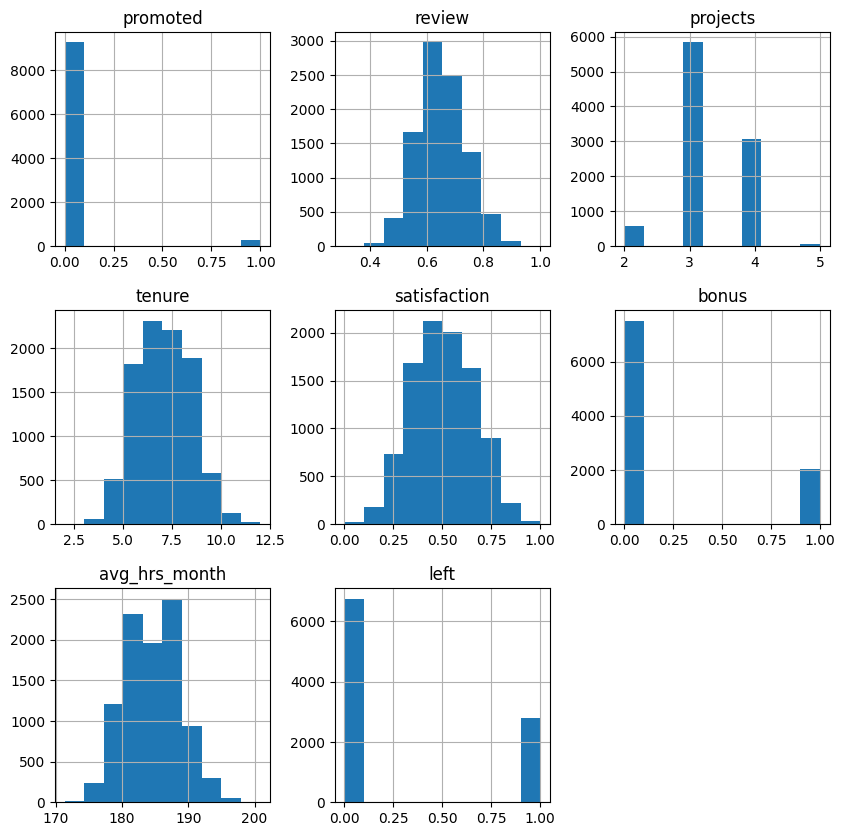

In [24]:
df.hist()  #Ploting Histogram
plt.gcf().set_size_inches(10,10)
plt.show()

#### Correlation matrix

In [25]:
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numeric_columns].corr()


correlation_matrix

,promoted,review,projects,tenure,satisfaction,bonus,avg_hrs_month,left
promoted,1.000000,0.001879,0.010107,0.001410,-0.011704,0.001072,-0.002190,-0.036777
review,0.001879,1.000000,0.000219,-0.184133,-0.349778,-0.003627,-0.196096,0.304294
projects,0.010107,0.000219,1.000000,0.022596,0.002714,0.002654,0.021299,-0.012408
tenure,0.001410,-0.184133,0.022596,1.000000,-0.146246,-0.000392,0.978618,0.010521
satisfaction,-0.011704,-0.349778,0.002714,-0.146246,1.000000,0.000704,-0.143142,-0.009721
bonus,0.001072,-0.003627,0.002654,-0.000392,0.000704,1.000000,-0.000370,-0.011485
avg_hrs_month,-0.002190,-0.196096,0.021299,0.978618,-0.143142,-0.000370,1.000000,0.009008
left,-0.036777,0.304294,-0.012408,0.010521,-0.009721,-0.011485,0.009008,1.000000


#### Vizualize it 

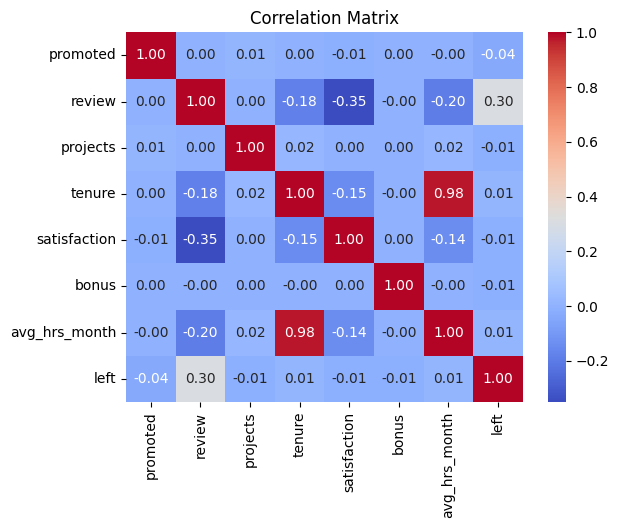

In [26]:
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Настройка отображения
plt.title('Correlation Matrix')
plt.show()

#### Or we can use Evidently library for that

## Evidently Report

In [10]:
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataQualityPreset
from evidently.metrics import * 
from evidently.test_suite import TestSuite
from evidently.test_preset import DataQualityTestPreset, DataStabilityTestPreset
from evidently.tests import *

/home/timur/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/timur/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/timur/.local/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarning: The 'nop

In [11]:
data_quality = TestSuite(tests=[
    DataQualityTestPreset()
])

data_quality.run(reference_data=None, current_data=df)
data_quality.show(mode='inline')

In [15]:
data_quality.save_html('data_quality.html')

In [12]:
data_quality_report = Report(metrics=[
    DatasetSummaryMetric(),
    DatasetCorrelationsMetric(),
    ColumnDistributionMetric(column_name='left'),
    ColumnCorrelationsMetric(column_name='left')
])


data_quality_report.run(reference_data=None, current_data=df)
data_quality_report.show(mode='inline')

In [14]:
data_quality_report.save_html('data_quality_report.html')

In [13]:
df

,department,promoted,review,projects,salary,tenure,satisfaction,bonus,avg_hrs_month,left
0,operations,0,0.577569,3,low,5.0,0.626759,0,180.866070,0
1,operations,0,0.751900,3,medium,6.0,0.443679,0,182.708149,0
2,support,0,0.722548,3,medium,6.0,0.446823,0,184.416084,0
3,logistics,0,0.675158,4,high,8.0,0.440139,0,188.707545,0
4,sales,0,0.676203,3,high,5.0,0.577607,1,179.821083,0
...,...,...,...,...,...,...,...,...,...,...
9535,operations,0,0.610988,4,medium,8.0,0.543641,0,188.155738,1
9536,logistics,0,0.746887,3,medium,8.0,0.549048,0,188.176164,1
9537,operations,0,0.557980,3,low,7.0,0.705425,0,186.531008,1
9538,IT,0,0.584446,4,medium,8.0,0.607287,1,187.641370,1


### Split dataset

#### Feature variables

In [27]:
X = df[categorical_features+numerical_features]
X

,department,salary,promoted,review,projects,tenure,satisfaction,bonus,avg_hrs_month
0,operations,low,0,0.577569,3,5.0,0.626759,0,180.866070
1,operations,medium,0,0.751900,3,6.0,0.443679,0,182.708149
2,support,medium,0,0.722548,3,6.0,0.446823,0,184.416084
3,logistics,high,0,0.675158,4,8.0,0.440139,0,188.707545
4,sales,high,0,0.676203,3,5.0,0.577607,1,179.821083
...,...,...,...,...,...,...,...,...,...
9535,operations,medium,0,0.610988,4,8.0,0.543641,0,188.155738
9536,logistics,medium,0,0.746887,3,8.0,0.549048,0,188.176164
9537,operations,low,0,0.557980,3,7.0,0.705425,0,186.531008
9538,IT,medium,0,0.584446,4,8.0,0.607287,1,187.641370


#### Target variables

In [28]:
y = df['left']

y

0       0
1       0
2       0
3       0
4       0
       ..
9535    1
9536    1
9537    1
9538    1
9539    1
Name: left, Length: 9540, dtype: int64

#### Train/test split

In [29]:
df_train, df_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [30]:
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

### Use DictVectorizer to convert categorical features to numeric features

In [31]:
train_dict = df_train.to_dict(orient='records')

dv = DictVectorizer(sparse=False)
X_train = dv.fit_transform(train_dict)

In [32]:
test_dict = df_test.to_dict(orient='records')
X_test = dv.transform(test_dict)

## Training models

### 1. Logistic Regression

In [59]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV

In [52]:
from sklearn.linear_model import LogisticRegression

# Model initialization
LogReg = LogisticRegression(max_iter=1000)

# Defining a grid of parameters for configuration
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

# Setting parameters using cross-validation
grid_search = GridSearchCV(LogReg, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

# Getting the best parameters
best_params = grid_search.best_params_

# Retrain the model with better parameters
best_LogReg = LogisticRegression(**best_params)
best_LogReg.fit(X_train, y_train)

# Getting predictions
y_pred_logreg = best_LogReg.predict_proba(X_test)[:, 1]

# Performance Evaluation
roc_auc = roc_auc_score(y_test, y_pred_logreg)

/home/timur/.local/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


#### Score

In [53]:
roc_auc

0.7118271457189687

### 2. DecisionTree

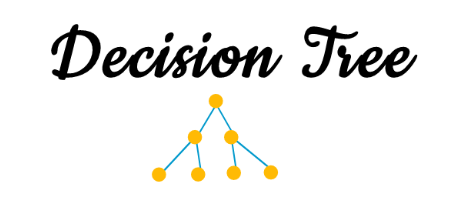

In [35]:
from sklearn.tree import DecisionTreeClassifier

In [36]:
dt = DecisionTreeClassifier()

# Setting a grid of parameters for configuration
param_grid = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

#### Find the best models parameters with using cross validation

In [38]:
grid_search_dt = GridSearchCV(dt, param_grid, cv=5, scoring='roc_auc')
grid_search_dt.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [None, 5, 10, 15],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='roc_auc')

In [39]:
best_params_dt = grid_search_dt.best_params_

best_params_dt

{'max_depth': 5,
 'max_features': None,
 'min_samples_leaf': 4,
 'min_samples_split': 2}

#### Retraining the model with the best params

In [40]:
best_dt_classifier = DecisionTreeClassifier(**best_params_dt)
best_dt_classifier.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=4)

#### Prediction

In [41]:
y_pred_dt = best_dt_classifier.predict_proba(X_test)[:, 1]
roc_auc_dt = roc_auc_score(y_test, y_pred_dt)

0.8897494601555793

#### Score

In [60]:
roc_auc_dt

0.8897494601555793

### 3. RandomForest

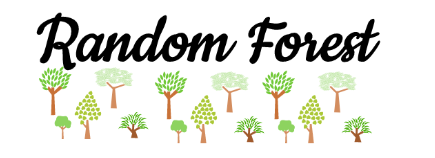

In [43]:
from sklearn.ensemble import RandomForestClassifier

In [44]:
rf_classifier = RandomForestClassifier()

# Defining a grid of parameters for configuration
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Setting parameters using cross-validation
grid_search_rf = GridSearchCV(rf_classifier, param_grid, cv=5, scoring='roc_auc')
grid_search_rf.fit(X_train, y_train)

# Getting the best parameters
best_params_rf = grid_search_rf.best_params_

# Retrain the model with better parameters
best_rf_classifier = RandomForestClassifier(**best_params_rf)
best_rf_classifier.fit(X_train, y_train)

# Getting predictions
y_pred_rf = best_rf_classifier.predict_proba(X_test)[:, 1]

# Performance evaluation
roc_auc_rf = roc_auc_score(y_test, y_pred_rf)

0.915775164554986

#### Score

In [61]:
roc_auc_rf

0.915775164554986

### 4. SVM

In [45]:
from sklearn.svm import SVC

# Model initialization
svm_classifier = SVC(probability=True)

# Set parameters for configuration
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Setting parameters using cross-validation
grid_search_svm = GridSearchCV(svm_classifier, param_grid, cv=5, scoring='roc_auc')
grid_search_svm.fit(X_train, y_train)

# Getting the best parameters
best_params_svm = grid_search_svm.best_params_

# Retrain the model with better parameters
best_svm_classifier = SVC(probability=True, **best_params_svm)
best_svm_classifier.fit(X_train, y_train)

# Getting predictions
y_pred_svm = best_svm_classifier.predict_proba(X_test)[:, 1]

# Performance evaluation
roc_auc_svm = roc_auc_score(y_test, y_pred_svm)

#### Score

In [46]:
roc_auc_svm

0.8716633712308453

### 5. Xgboost

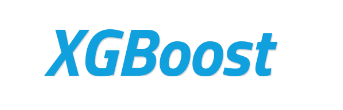

In [47]:
import xgboost as xgb

In [48]:
# Model initialization
xgb_classifier = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss')

# Set parameters for configuration
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Setting parameters using cross-validation
grid_search_xgb = GridSearchCV(xgb_classifier, param_grid, cv=5, scoring='roc_auc')
grid_search_xgb.fit(X_train, y_train)

# Getting the best options
best_params_xgb = grid_search_xgb.best_params_

# Retrain the model with better parameters
best_xgb_classifier = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **best_params_xgb)
best_xgb_classifier.fit(X_train, y_train)

# Getting predictions
y_pred_xgb = best_xgb_classifier.predict_proba(X_test)[:, 1]

# Performance evaluation
roc_auc_xgb = roc_auc_score(y_test, y_pred_xgb)

0.9300081952285557

In [63]:
best_params_xgb

{'colsample_bytree': 1.0,
 'learning_rate': 0.1,
 'max_depth': 7,
 'n_estimators': 50,
 'subsample': 0.8}

#### Score

In [62]:
roc_auc_xgb

0.9300081952285557

### 6. Catboost

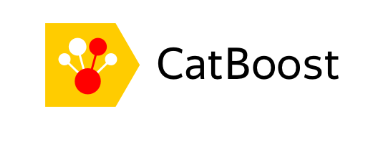

In [49]:
from catboost import CatBoostClassifier

# Model initialization
catboost_classifier = CatBoostClassifier()

# Set parameters for configuration
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'depth': [4, 6, 8],
    'iterations': [50, 100, 200],
    'l2_leaf_reg': [3, 5, 7],
    'border_count': [32, 64, 128]
}

# Setting parameters using cross-validation
grid_search_catboost = GridSearchCV(catboost_classifier, param_grid, cv=5, scoring='roc_auc')
grid_search_catboost.fit(X_train, y_train)

# Getting the best options
best_params_catboost = grid_search_catboost.best_params_

# Retrain the model with better parameters
best_catboost_classifier = CatBoostClassifier(**best_params_catboost)
best_catboost_classifier.fit(X_train, y_train)

# Getting predicitons
y_pred_catboost = best_catboost_classifier.predict_proba(X_test)[:, 1]

# Performance evaluation
roc_auc_catboost = roc_auc_score(y_test, y_pred_catboost)


roc_auc_catboost

0:	learn: 0.6848844	total: 65.1ms	remaining: 3.19s
1:	learn: 0.6779140	total: 70.5ms	remaining: 1.69s
2:	learn: 0.6702819	total: 72.7ms	remaining: 1.14s
3:	learn: 0.6626594	total: 74.5ms	remaining: 857ms
4:	learn: 0.6564473	total: 77.2ms	remaining: 694ms
5:	learn: 0.6500101	total: 79ms	remaining: 579ms
6:	learn: 0.6426254	total: 82.3ms	remaining: 506ms
7:	learn: 0.6358827	total: 83.8ms	remaining: 440ms
8:	learn: 0.6294940	total: 85.2ms	remaining: 388ms
9:	learn: 0.6235004	total: 86.6ms	remaining: 347ms
10:	learn: 0.6170976	total: 88ms	remaining: 312ms
11:	learn: 0.6112416	total: 89.4ms	remaining: 283ms
12:	learn: 0.6058545	total: 91ms	remaining: 259ms
13:	learn: 0.5994933	total: 93.6ms	remaining: 241ms
14:	learn: 0.5935157	total: 96.2ms	remaining: 224ms
15:	learn: 0.5881867	total: 97.8ms	remaining: 208ms
16:	learn: 0.5830674	total: 99.3ms	remaining: 193ms
17:	learn: 0.5787477	total: 101ms	remaining: 179ms
18:	learn: 0.5740662	total: 102ms	remaining: 167ms
19:	learn: 0.5702257	total: 10

0:	learn: 0.6850257	total: 3.41ms	remaining: 167ms
1:	learn: 0.6785606	total: 5.24ms	remaining: 126ms
2:	learn: 0.6709601	total: 7.02ms	remaining: 110ms
3:	learn: 0.6638019	total: 8.62ms	remaining: 99.1ms
4:	learn: 0.6569060	total: 10.1ms	remaining: 91.1ms
5:	learn: 0.6496108	total: 11.7ms	remaining: 85.4ms
6:	learn: 0.6424317	total: 13.2ms	remaining: 81ms
7:	learn: 0.6360051	total: 14.7ms	remaining: 77.1ms
8:	learn: 0.6293901	total: 17.7ms	remaining: 80.4ms
9:	learn: 0.6233443	total: 20.6ms	remaining: 82.2ms
10:	learn: 0.6172823	total: 22.4ms	remaining: 79.6ms
11:	learn: 0.6115548	total: 26.2ms	remaining: 82.9ms
12:	learn: 0.6057758	total: 27.8ms	remaining: 79.1ms
13:	learn: 0.5994335	total: 29.3ms	remaining: 75.4ms
14:	learn: 0.5939235	total: 30.9ms	remaining: 72.1ms
15:	learn: 0.5885229	total: 34.2ms	remaining: 72.7ms
16:	learn: 0.5832658	total: 37.3ms	remaining: 72.4ms
17:	learn: 0.5781990	total: 38.9ms	remaining: 69.1ms
18:	learn: 0.5732831	total: 40.3ms	remaining: 65.8ms
19:	lear

0:	learn: 0.6176989	total: 5.81ms	remaining: 285ms
1:	learn: 0.5720009	total: 10.2ms	remaining: 245ms
2:	learn: 0.5316292	total: 13.5ms	remaining: 212ms
3:	learn: 0.4943828	total: 16ms	remaining: 184ms
4:	learn: 0.4669251	total: 18.8ms	remaining: 169ms
5:	learn: 0.4520352	total: 21.1ms	remaining: 154ms
6:	learn: 0.4327013	total: 23.2ms	remaining: 143ms
7:	learn: 0.4217212	total: 25.6ms	remaining: 134ms
8:	learn: 0.4053730	total: 28ms	remaining: 128ms
9:	learn: 0.3974982	total: 30ms	remaining: 120ms
10:	learn: 0.3860132	total: 31.7ms	remaining: 112ms
11:	learn: 0.3775916	total: 33.2ms	remaining: 105ms
12:	learn: 0.3718871	total: 34.7ms	remaining: 98.9ms
13:	learn: 0.3645499	total: 36.5ms	remaining: 93.8ms
14:	learn: 0.3601035	total: 37.9ms	remaining: 88.5ms
15:	learn: 0.3569356	total: 39.7ms	remaining: 84.3ms
16:	learn: 0.3530614	total: 41.3ms	remaining: 80.1ms
17:	learn: 0.3496947	total: 42.7ms	remaining: 76ms
18:	learn: 0.3443688	total: 46.3ms	remaining: 75.5ms
19:	learn: 0.3416124	to

0:	learn: 0.5551749	total: 1.8ms	remaining: 88.3ms
1:	learn: 0.4812500	total: 4.09ms	remaining: 98.3ms
2:	learn: 0.4366108	total: 5.93ms	remaining: 92.8ms
3:	learn: 0.4014480	total: 9.3ms	remaining: 107ms
4:	learn: 0.3923885	total: 11.2ms	remaining: 101ms
5:	learn: 0.3763593	total: 12.8ms	remaining: 93.7ms
6:	learn: 0.3655757	total: 14.1ms	remaining: 86.5ms
7:	learn: 0.3570737	total: 15.6ms	remaining: 82.1ms
8:	learn: 0.3520862	total: 17.3ms	remaining: 78.9ms
9:	learn: 0.3481626	total: 19.1ms	remaining: 76.4ms
10:	learn: 0.3413477	total: 21.4ms	remaining: 76ms
11:	learn: 0.3375300	total: 23.2ms	remaining: 73.4ms
12:	learn: 0.3328772	total: 24.8ms	remaining: 70.7ms
13:	learn: 0.3280841	total: 26.5ms	remaining: 68.1ms
14:	learn: 0.3247435	total: 28ms	remaining: 65.3ms
15:	learn: 0.3234717	total: 29.6ms	remaining: 62.9ms
16:	learn: 0.3182420	total: 31.3ms	remaining: 60.7ms
17:	learn: 0.3168244	total: 35.2ms	remaining: 62.6ms
18:	learn: 0.3162136	total: 36.9ms	remaining: 60.3ms
19:	learn: 

4:	learn: 0.6560630	total: 17.1ms	remaining: 154ms
5:	learn: 0.6497751	total: 19.4ms	remaining: 142ms
6:	learn: 0.6429883	total: 21.9ms	remaining: 134ms
7:	learn: 0.6375638	total: 23.7ms	remaining: 125ms
8:	learn: 0.6309687	total: 25.5ms	remaining: 116ms
9:	learn: 0.6251549	total: 27.1ms	remaining: 108ms
10:	learn: 0.6188618	total: 29.9ms	remaining: 106ms
11:	learn: 0.6126008	total: 31.6ms	remaining: 100ms
12:	learn: 0.6072334	total: 33.4ms	remaining: 95.1ms
13:	learn: 0.6014453	total: 35.1ms	remaining: 90.2ms
14:	learn: 0.5967422	total: 37ms	remaining: 86.4ms
15:	learn: 0.5919778	total: 38.8ms	remaining: 82.4ms
16:	learn: 0.5864356	total: 40.3ms	remaining: 78.2ms
17:	learn: 0.5814650	total: 41.6ms	remaining: 74ms
18:	learn: 0.5764244	total: 43.1ms	remaining: 70.4ms
19:	learn: 0.5726606	total: 44.5ms	remaining: 66.8ms
20:	learn: 0.5678407	total: 46.4ms	remaining: 64.1ms
21:	learn: 0.5631260	total: 48ms	remaining: 61.1ms
22:	learn: 0.5587203	total: 49.7ms	remaining: 58.3ms
23:	learn: 0.

0:	learn: 0.6176836	total: 1.75ms	remaining: 85.6ms
1:	learn: 0.5752345	total: 3.85ms	remaining: 92.5ms
2:	learn: 0.5331320	total: 5.47ms	remaining: 85.7ms
3:	learn: 0.4984357	total: 7.47ms	remaining: 85.9ms
4:	learn: 0.4793791	total: 9.43ms	remaining: 84.9ms
5:	learn: 0.4575375	total: 11.5ms	remaining: 84.4ms
6:	learn: 0.4380021	total: 13.1ms	remaining: 80.4ms
7:	learn: 0.4226986	total: 14.6ms	remaining: 76.8ms
8:	learn: 0.4096128	total: 16.1ms	remaining: 73.2ms
9:	learn: 0.4014460	total: 17.6ms	remaining: 70.5ms
10:	learn: 0.3893963	total: 19.3ms	remaining: 68.3ms
11:	learn: 0.3795850	total: 21.3ms	remaining: 67.6ms
12:	learn: 0.3717126	total: 23ms	remaining: 65.4ms
13:	learn: 0.3684000	total: 24.6ms	remaining: 63.3ms
14:	learn: 0.3640815	total: 26.1ms	remaining: 61ms
15:	learn: 0.3590444	total: 27.7ms	remaining: 58.8ms
16:	learn: 0.3552122	total: 29.7ms	remaining: 57.7ms
17:	learn: 0.3517418	total: 31.4ms	remaining: 55.8ms
18:	learn: 0.3476284	total: 33ms	remaining: 53.8ms
19:	learn

0:	learn: 0.6193911	total: 2.33ms	remaining: 114ms
1:	learn: 0.5627248	total: 4.55ms	remaining: 109ms
2:	learn: 0.5196882	total: 6.25ms	remaining: 98ms
3:	learn: 0.4818779	total: 8.03ms	remaining: 92.4ms
4:	learn: 0.4610273	total: 9.85ms	remaining: 88.6ms
5:	learn: 0.4353489	total: 11.8ms	remaining: 86.3ms
6:	learn: 0.4208887	total: 14.9ms	remaining: 91.3ms
7:	learn: 0.4097826	total: 17.7ms	remaining: 92.8ms
8:	learn: 0.3954637	total: 19.8ms	remaining: 90.4ms
9:	learn: 0.3887210	total: 21.8ms	remaining: 87ms
10:	learn: 0.3768604	total: 23.9ms	remaining: 84.6ms
11:	learn: 0.3696678	total: 26ms	remaining: 82.2ms
12:	learn: 0.3643419	total: 28.7ms	remaining: 81.6ms
13:	learn: 0.3595777	total: 30.7ms	remaining: 78.9ms
14:	learn: 0.3547793	total: 35.4ms	remaining: 82.7ms
15:	learn: 0.3507729	total: 37.2ms	remaining: 79ms
16:	learn: 0.3475149	total: 38.8ms	remaining: 75.3ms
17:	learn: 0.3434573	total: 42.5ms	remaining: 75.5ms
18:	learn: 0.3402827	total: 44.4ms	remaining: 72.4ms
19:	learn: 0.

0:	learn: 0.5576364	total: 1.74ms	remaining: 85.4ms
1:	learn: 0.4843744	total: 3.8ms	remaining: 91.2ms
2:	learn: 0.4391787	total: 5.62ms	remaining: 88ms
3:	learn: 0.4041077	total: 7.44ms	remaining: 85.6ms
4:	learn: 0.3823448	total: 9.16ms	remaining: 82.5ms
5:	learn: 0.3711671	total: 11ms	remaining: 80.3ms
6:	learn: 0.3566871	total: 13.7ms	remaining: 84.2ms
7:	learn: 0.3493369	total: 17.1ms	remaining: 89.8ms
8:	learn: 0.3442697	total: 18.8ms	remaining: 85.5ms
9:	learn: 0.3375808	total: 20.9ms	remaining: 83.6ms
10:	learn: 0.3335845	total: 22.5ms	remaining: 79.7ms
11:	learn: 0.3308339	total: 24.1ms	remaining: 76.4ms
12:	learn: 0.3280668	total: 25.9ms	remaining: 73.6ms
13:	learn: 0.3257515	total: 29.3ms	remaining: 75.4ms
14:	learn: 0.3246741	total: 31ms	remaining: 72.4ms
15:	learn: 0.3217937	total: 32.8ms	remaining: 69.7ms
16:	learn: 0.3181923	total: 34.6ms	remaining: 67.2ms
17:	learn: 0.3171566	total: 36.5ms	remaining: 64.9ms
18:	learn: 0.3146008	total: 38.1ms	remaining: 62.2ms
19:	learn:

13:	learn: 0.6021433	total: 24.1ms	remaining: 62ms
14:	learn: 0.5974377	total: 25.7ms	remaining: 60ms
15:	learn: 0.5922711	total: 27.3ms	remaining: 58ms
16:	learn: 0.5866294	total: 28.8ms	remaining: 55.9ms
17:	learn: 0.5814536	total: 32.4ms	remaining: 57.6ms
18:	learn: 0.5770889	total: 34.1ms	remaining: 55.6ms
19:	learn: 0.5725235	total: 35.7ms	remaining: 53.5ms
20:	learn: 0.5674337	total: 37.4ms	remaining: 51.6ms
21:	learn: 0.5629046	total: 39.5ms	remaining: 50.2ms
22:	learn: 0.5581339	total: 41.3ms	remaining: 48.5ms
23:	learn: 0.5536689	total: 43ms	remaining: 46.6ms
24:	learn: 0.5491785	total: 44.8ms	remaining: 44.8ms
25:	learn: 0.5450535	total: 47.2ms	remaining: 43.5ms
26:	learn: 0.5407108	total: 53.6ms	remaining: 45.7ms
27:	learn: 0.5364070	total: 55.9ms	remaining: 43.9ms
28:	learn: 0.5323963	total: 57.9ms	remaining: 41.9ms
29:	learn: 0.5287035	total: 59.4ms	remaining: 39.6ms
30:	learn: 0.5253550	total: 61.2ms	remaining: 37.5ms
31:	learn: 0.5219341	total: 63.5ms	remaining: 35.7ms
3

36:	learn: 0.5030282	total: 56.9ms	remaining: 20ms
37:	learn: 0.4994501	total: 59.3ms	remaining: 18.7ms
38:	learn: 0.4961004	total: 61.4ms	remaining: 17.3ms
39:	learn: 0.4927294	total: 63.2ms	remaining: 15.8ms
40:	learn: 0.4898810	total: 65.6ms	remaining: 14.4ms
41:	learn: 0.4869233	total: 67.4ms	remaining: 12.8ms
42:	learn: 0.4845361	total: 69.1ms	remaining: 11.2ms
43:	learn: 0.4820165	total: 70.7ms	remaining: 9.64ms
44:	learn: 0.4798325	total: 72.3ms	remaining: 8.03ms
45:	learn: 0.4775736	total: 74.6ms	remaining: 6.49ms
46:	learn: 0.4751356	total: 76.4ms	remaining: 4.88ms
47:	learn: 0.4723928	total: 78.1ms	remaining: 3.25ms
48:	learn: 0.4696905	total: 79.7ms	remaining: 1.63ms
49:	learn: 0.4669745	total: 82ms	remaining: 0us
0:	learn: 0.6179678	total: 1.74ms	remaining: 85.1ms
1:	learn: 0.5755212	total: 3.44ms	remaining: 82.6ms
2:	learn: 0.5303269	total: 5.19ms	remaining: 81.4ms
3:	learn: 0.4984616	total: 9.3ms	remaining: 107ms
4:	learn: 0.4701787	total: 11ms	remaining: 98.8ms
5:	learn:

4:	learn: 0.4716238	total: 12.1ms	remaining: 109ms
5:	learn: 0.4540549	total: 16.6ms	remaining: 122ms
6:	learn: 0.4332247	total: 19.1ms	remaining: 118ms
7:	learn: 0.4224364	total: 21.1ms	remaining: 111ms
8:	learn: 0.4060752	total: 25.5ms	remaining: 116ms
9:	learn: 0.3985441	total: 28.4ms	remaining: 114ms
10:	learn: 0.3885336	total: 33.5ms	remaining: 119ms
11:	learn: 0.3789305	total: 36ms	remaining: 114ms
12:	learn: 0.3713610	total: 37.8ms	remaining: 108ms
13:	learn: 0.3653642	total: 39.6ms	remaining: 102ms
14:	learn: 0.3587114	total: 43ms	remaining: 100ms
15:	learn: 0.3540777	total: 45.6ms	remaining: 96.9ms
16:	learn: 0.3508919	total: 52.8ms	remaining: 102ms
17:	learn: 0.3469553	total: 55.2ms	remaining: 98.1ms
18:	learn: 0.3436916	total: 57.2ms	remaining: 93.3ms
19:	learn: 0.3413793	total: 60.6ms	remaining: 90.9ms
20:	learn: 0.3400076	total: 66ms	remaining: 91.1ms
21:	learn: 0.3388301	total: 67.7ms	remaining: 86.1ms
22:	learn: 0.3366539	total: 69.7ms	remaining: 81.8ms
23:	learn: 0.3347

0:	learn: 0.5562243	total: 2.01ms	remaining: 98.5ms
1:	learn: 0.4819716	total: 3.95ms	remaining: 94.8ms
2:	learn: 0.4370391	total: 5.97ms	remaining: 93.6ms
3:	learn: 0.4020317	total: 7.89ms	remaining: 90.7ms
4:	learn: 0.3929253	total: 9.69ms	remaining: 87.2ms
5:	learn: 0.3739826	total: 11.7ms	remaining: 85.8ms
6:	learn: 0.3630462	total: 13.7ms	remaining: 84.3ms
7:	learn: 0.3546484	total: 15.6ms	remaining: 82.1ms
8:	learn: 0.3489346	total: 17.5ms	remaining: 79.6ms
9:	learn: 0.3442538	total: 19.4ms	remaining: 77.7ms
10:	learn: 0.3407381	total: 22.7ms	remaining: 80.4ms
11:	learn: 0.3366318	total: 24.5ms	remaining: 77.7ms
12:	learn: 0.3297310	total: 26.4ms	remaining: 75.2ms
13:	learn: 0.3254910	total: 30.4ms	remaining: 78.2ms
14:	learn: 0.3241272	total: 32.5ms	remaining: 75.8ms
15:	learn: 0.3221057	total: 35ms	remaining: 74.4ms
16:	learn: 0.3195969	total: 37ms	remaining: 71.8ms
17:	learn: 0.3178626	total: 38.6ms	remaining: 68.6ms
18:	learn: 0.3164770	total: 40.3ms	remaining: 65.7ms
19:	lea

84:	learn: 0.4140515	total: 191ms	remaining: 33.7ms
85:	learn: 0.4130416	total: 193ms	remaining: 31.4ms
86:	learn: 0.4117119	total: 195ms	remaining: 29.2ms
87:	learn: 0.4107293	total: 197ms	remaining: 26.9ms
88:	learn: 0.4093348	total: 199ms	remaining: 24.6ms
89:	learn: 0.4082569	total: 201ms	remaining: 22.3ms
90:	learn: 0.4072444	total: 203ms	remaining: 20.1ms
91:	learn: 0.4060478	total: 206ms	remaining: 17.9ms
92:	learn: 0.4049990	total: 208ms	remaining: 15.6ms
93:	learn: 0.4040177	total: 210ms	remaining: 13.4ms
94:	learn: 0.4030529	total: 212ms	remaining: 11.1ms
95:	learn: 0.4022386	total: 213ms	remaining: 8.89ms
96:	learn: 0.4010781	total: 217ms	remaining: 6.7ms
97:	learn: 0.3996939	total: 219ms	remaining: 4.47ms
98:	learn: 0.3988951	total: 223ms	remaining: 2.25ms
99:	learn: 0.3981151	total: 225ms	remaining: 0us
0:	learn: 0.6848494	total: 1.75ms	remaining: 174ms
1:	learn: 0.6778137	total: 3.37ms	remaining: 165ms
2:	learn: 0.6700245	total: 5.06ms	remaining: 164ms
3:	learn: 0.6625041

0:	learn: 0.6849100	total: 1.69ms	remaining: 167ms
1:	learn: 0.6786321	total: 3.4ms	remaining: 167ms
2:	learn: 0.6712556	total: 4.88ms	remaining: 158ms
3:	learn: 0.6644201	total: 6.37ms	remaining: 153ms
4:	learn: 0.6572945	total: 7.95ms	remaining: 151ms
5:	learn: 0.6499931	total: 9.53ms	remaining: 149ms
6:	learn: 0.6433498	total: 10.9ms	remaining: 145ms
7:	learn: 0.6368079	total: 13ms	remaining: 150ms
8:	learn: 0.6302034	total: 14.5ms	remaining: 146ms
9:	learn: 0.6240608	total: 16ms	remaining: 144ms
10:	learn: 0.6179529	total: 17.5ms	remaining: 141ms
11:	learn: 0.6121983	total: 18.9ms	remaining: 139ms
12:	learn: 0.6061320	total: 20.5ms	remaining: 137ms
13:	learn: 0.5999078	total: 22ms	remaining: 135ms
14:	learn: 0.5945884	total: 23.5ms	remaining: 133ms
15:	learn: 0.5894289	total: 24.9ms	remaining: 131ms
16:	learn: 0.5841523	total: 26.1ms	remaining: 127ms
17:	learn: 0.5793792	total: 27.6ms	remaining: 126ms
18:	learn: 0.5747848	total: 29.5ms	remaining: 126ms
19:	learn: 0.5695586	total: 3

0:	learn: 0.6173000	total: 1.85ms	remaining: 184ms
1:	learn: 0.5748209	total: 3.75ms	remaining: 184ms
2:	learn: 0.5289873	total: 5.39ms	remaining: 174ms
3:	learn: 0.4972832	total: 6.94ms	remaining: 167ms
4:	learn: 0.4692313	total: 8.5ms	remaining: 161ms
5:	learn: 0.4507955	total: 10ms	remaining: 157ms
6:	learn: 0.4328421	total: 11.5ms	remaining: 153ms
7:	learn: 0.4195494	total: 13ms	remaining: 150ms
8:	learn: 0.4073833	total: 14.4ms	remaining: 146ms
9:	learn: 0.3988864	total: 16ms	remaining: 144ms
10:	learn: 0.3864450	total: 17.7ms	remaining: 143ms
11:	learn: 0.3778633	total: 19.1ms	remaining: 140ms
12:	learn: 0.3723646	total: 20.8ms	remaining: 139ms
13:	learn: 0.3693719	total: 23.6ms	remaining: 145ms
14:	learn: 0.3620387	total: 25.2ms	remaining: 143ms
15:	learn: 0.3575468	total: 27.8ms	remaining: 146ms
16:	learn: 0.3536857	total: 29.8ms	remaining: 146ms
17:	learn: 0.3508217	total: 31.5ms	remaining: 143ms
18:	learn: 0.3499641	total: 33ms	remaining: 141ms
19:	learn: 0.3459119	total: 34.

0:	learn: 0.6164353	total: 4.98ms	remaining: 493ms
1:	learn: 0.5703694	total: 9.46ms	remaining: 464ms
2:	learn: 0.5271513	total: 12.8ms	remaining: 415ms
3:	learn: 0.4914266	total: 15.6ms	remaining: 374ms
4:	learn: 0.4666534	total: 18.3ms	remaining: 347ms
5:	learn: 0.4474862	total: 20.9ms	remaining: 327ms
6:	learn: 0.4288814	total: 23.2ms	remaining: 309ms
7:	learn: 0.4178795	total: 25.5ms	remaining: 293ms
8:	learn: 0.4015361	total: 27.7ms	remaining: 280ms
9:	learn: 0.3948762	total: 29.5ms	remaining: 266ms
10:	learn: 0.3874065	total: 31.2ms	remaining: 253ms
11:	learn: 0.3777435	total: 33.6ms	remaining: 246ms
12:	learn: 0.3735379	total: 35.2ms	remaining: 236ms
13:	learn: 0.3691542	total: 36.9ms	remaining: 227ms
14:	learn: 0.3619054	total: 38.7ms	remaining: 219ms
15:	learn: 0.3585615	total: 40.3ms	remaining: 211ms
16:	learn: 0.3534603	total: 41.9ms	remaining: 205ms
17:	learn: 0.3508235	total: 43.6ms	remaining: 199ms
18:	learn: 0.3465718	total: 45.2ms	remaining: 193ms
19:	learn: 0.3436181	t

99:	learn: 0.2860226	total: 205ms	remaining: 0us
0:	learn: 0.6189156	total: 2ms	remaining: 198ms
1:	learn: 0.5620914	total: 3.75ms	remaining: 184ms
2:	learn: 0.5192106	total: 5.49ms	remaining: 178ms
3:	learn: 0.4813101	total: 7.4ms	remaining: 178ms
4:	learn: 0.4605072	total: 10.2ms	remaining: 193ms
5:	learn: 0.4358879	total: 14.5ms	remaining: 227ms
6:	learn: 0.4197953	total: 17.6ms	remaining: 234ms
7:	learn: 0.4038062	total: 19.2ms	remaining: 220ms
8:	learn: 0.3926307	total: 20.9ms	remaining: 211ms
9:	learn: 0.3816489	total: 22.3ms	remaining: 201ms
10:	learn: 0.3757538	total: 24ms	remaining: 194ms
11:	learn: 0.3700349	total: 25.5ms	remaining: 187ms
12:	learn: 0.3664573	total: 27.1ms	remaining: 181ms
13:	learn: 0.3622875	total: 29.6ms	remaining: 182ms
14:	learn: 0.3553129	total: 32.5ms	remaining: 184ms
15:	learn: 0.3509767	total: 35.7ms	remaining: 187ms
16:	learn: 0.3477498	total: 37.7ms	remaining: 184ms
17:	learn: 0.3446015	total: 40.3ms	remaining: 183ms
18:	learn: 0.3412690	total: 41.

97:	learn: 0.2609821	total: 192ms	remaining: 3.91ms
98:	learn: 0.2606184	total: 195ms	remaining: 1.97ms
99:	learn: 0.2601108	total: 197ms	remaining: 0us
0:	learn: 0.5556610	total: 9.4ms	remaining: 930ms
1:	learn: 0.4933918	total: 17.1ms	remaining: 836ms
2:	learn: 0.4366730	total: 28ms	remaining: 906ms
3:	learn: 0.4106887	total: 33.7ms	remaining: 808ms
4:	learn: 0.3899137	total: 37.6ms	remaining: 715ms
5:	learn: 0.3786226	total: 43.1ms	remaining: 675ms
6:	learn: 0.3625237	total: 45.9ms	remaining: 610ms
7:	learn: 0.3534606	total: 48.8ms	remaining: 562ms
8:	learn: 0.3458556	total: 51.7ms	remaining: 523ms
9:	learn: 0.3427313	total: 53.9ms	remaining: 485ms
10:	learn: 0.3384897	total: 56.1ms	remaining: 454ms
11:	learn: 0.3333062	total: 58.1ms	remaining: 426ms
12:	learn: 0.3295944	total: 59.9ms	remaining: 401ms
13:	learn: 0.3250719	total: 62ms	remaining: 381ms
14:	learn: 0.3220310	total: 64.1ms	remaining: 363ms
15:	learn: 0.3193888	total: 65.7ms	remaining: 345ms
16:	learn: 0.3162552	total: 67

92:	learn: 0.2596422	total: 193ms	remaining: 14.5ms
93:	learn: 0.2593917	total: 195ms	remaining: 12.5ms
94:	learn: 0.2590803	total: 197ms	remaining: 10.4ms
95:	learn: 0.2584946	total: 199ms	remaining: 8.29ms
96:	learn: 0.2576327	total: 201ms	remaining: 6.2ms
97:	learn: 0.2572228	total: 202ms	remaining: 4.13ms
98:	learn: 0.2567257	total: 204ms	remaining: 2.06ms
99:	learn: 0.2563053	total: 206ms	remaining: 0us
0:	learn: 0.5569453	total: 3.29ms	remaining: 326ms
1:	learn: 0.4838659	total: 6.02ms	remaining: 295ms
2:	learn: 0.4388733	total: 9.37ms	remaining: 303ms
3:	learn: 0.4039167	total: 12.7ms	remaining: 304ms
4:	learn: 0.3873045	total: 15.5ms	remaining: 294ms
5:	learn: 0.3691519	total: 19.1ms	remaining: 299ms
6:	learn: 0.3594867	total: 22.5ms	remaining: 299ms
7:	learn: 0.3490156	total: 25.9ms	remaining: 298ms
8:	learn: 0.3429027	total: 29ms	remaining: 293ms
9:	learn: 0.3364197	total: 31.9ms	remaining: 287ms
10:	learn: 0.3331164	total: 34.5ms	remaining: 279ms
11:	learn: 0.3286208	total: 

86:	learn: 0.2622768	total: 193ms	remaining: 28.8ms
87:	learn: 0.2618119	total: 195ms	remaining: 26.6ms
88:	learn: 0.2614234	total: 197ms	remaining: 24.3ms
89:	learn: 0.2605989	total: 199ms	remaining: 22.1ms
90:	learn: 0.2602547	total: 200ms	remaining: 19.8ms
91:	learn: 0.2599605	total: 202ms	remaining: 17.5ms
92:	learn: 0.2595537	total: 203ms	remaining: 15.3ms
93:	learn: 0.2587713	total: 206ms	remaining: 13.2ms
94:	learn: 0.2585023	total: 208ms	remaining: 11ms
95:	learn: 0.2581726	total: 210ms	remaining: 8.76ms
96:	learn: 0.2578430	total: 212ms	remaining: 6.57ms
97:	learn: 0.2574602	total: 214ms	remaining: 4.37ms
98:	learn: 0.2568260	total: 216ms	remaining: 2.18ms
99:	learn: 0.2564540	total: 218ms	remaining: 0us
0:	learn: 0.6849346	total: 1.63ms	remaining: 161ms
1:	learn: 0.6780073	total: 3.14ms	remaining: 154ms
2:	learn: 0.6704637	total: 4.82ms	remaining: 156ms
3:	learn: 0.6628842	total: 6.97ms	remaining: 167ms
4:	learn: 0.6566731	total: 9.05ms	remaining: 172ms
5:	learn: 0.6502690	to

0:	learn: 0.6848085	total: 1.79ms	remaining: 178ms
1:	learn: 0.6784248	total: 3.67ms	remaining: 180ms
2:	learn: 0.6706298	total: 7.86ms	remaining: 254ms
3:	learn: 0.6630800	total: 11.1ms	remaining: 267ms
4:	learn: 0.6558682	total: 14.7ms	remaining: 279ms
5:	learn: 0.6496989	total: 16.7ms	remaining: 262ms
6:	learn: 0.6428458	total: 18.4ms	remaining: 245ms
7:	learn: 0.6366469	total: 21.4ms	remaining: 246ms
8:	learn: 0.6306841	total: 23.4ms	remaining: 236ms
9:	learn: 0.6238690	total: 25.4ms	remaining: 229ms
10:	learn: 0.6178467	total: 28.4ms	remaining: 230ms
11:	learn: 0.6120819	total: 31.1ms	remaining: 228ms
12:	learn: 0.6064185	total: 33.5ms	remaining: 225ms
13:	learn: 0.6014222	total: 36.7ms	remaining: 225ms
14:	learn: 0.5952597	total: 39ms	remaining: 221ms
15:	learn: 0.5895857	total: 41.1ms	remaining: 216ms
16:	learn: 0.5849863	total: 43.3ms	remaining: 211ms
17:	learn: 0.5795903	total: 45.4ms	remaining: 207ms
18:	learn: 0.5744256	total: 49.1ms	remaining: 209ms
19:	learn: 0.5701805	tot

0:	learn: 0.6850880	total: 1.74ms	remaining: 172ms
1:	learn: 0.6786229	total: 3.56ms	remaining: 174ms
2:	learn: 0.6707091	total: 5.12ms	remaining: 165ms
3:	learn: 0.6634826	total: 6.63ms	remaining: 159ms
4:	learn: 0.6562233	total: 8.99ms	remaining: 171ms
5:	learn: 0.6501426	total: 11.3ms	remaining: 178ms
6:	learn: 0.6431356	total: 13ms	remaining: 172ms
7:	learn: 0.6369589	total: 14.4ms	remaining: 166ms
8:	learn: 0.6301580	total: 16ms	remaining: 162ms
9:	learn: 0.6235935	total: 17.8ms	remaining: 160ms
10:	learn: 0.6174198	total: 19.5ms	remaining: 158ms
11:	learn: 0.6111469	total: 21.3ms	remaining: 156ms
12:	learn: 0.6052982	total: 23.3ms	remaining: 156ms
13:	learn: 0.5990445	total: 26.6ms	remaining: 163ms
14:	learn: 0.5934788	total: 28.5ms	remaining: 161ms
15:	learn: 0.5873421	total: 31.2ms	remaining: 164ms
16:	learn: 0.5819519	total: 34.5ms	remaining: 169ms
17:	learn: 0.5775860	total: 36.1ms	remaining: 164ms
18:	learn: 0.5727790	total: 37.6ms	remaining: 160ms
19:	learn: 0.5688824	total

1:	learn: 0.5748869	total: 3.58ms	remaining: 176ms
2:	learn: 0.5286626	total: 7.77ms	remaining: 251ms
3:	learn: 0.4953774	total: 9.91ms	remaining: 238ms
4:	learn: 0.4662594	total: 11.8ms	remaining: 224ms
5:	learn: 0.4419987	total: 13.8ms	remaining: 217ms
6:	learn: 0.4237916	total: 16ms	remaining: 213ms
7:	learn: 0.4106280	total: 18.1ms	remaining: 208ms
8:	learn: 0.3990174	total: 20ms	remaining: 202ms
9:	learn: 0.3905632	total: 25.2ms	remaining: 226ms
10:	learn: 0.3813371	total: 27.8ms	remaining: 225ms
11:	learn: 0.3723573	total: 29.6ms	remaining: 217ms
12:	learn: 0.3679053	total: 31.5ms	remaining: 211ms
13:	learn: 0.3651094	total: 33.8ms	remaining: 208ms
14:	learn: 0.3593060	total: 36.9ms	remaining: 209ms
15:	learn: 0.3540492	total: 40ms	remaining: 210ms
16:	learn: 0.3506661	total: 43.6ms	remaining: 213ms
17:	learn: 0.3458479	total: 45.8ms	remaining: 208ms
18:	learn: 0.3437125	total: 47.5ms	remaining: 202ms
19:	learn: 0.3408805	total: 49.2ms	remaining: 197ms
20:	learn: 0.3372531	total:

0:	learn: 0.6181999	total: 1.8ms	remaining: 178ms
1:	learn: 0.5725089	total: 3.68ms	remaining: 180ms
2:	learn: 0.5367889	total: 6.03ms	remaining: 195ms
3:	learn: 0.4986779	total: 8.86ms	remaining: 213ms
4:	learn: 0.4695668	total: 11.9ms	remaining: 227ms
5:	learn: 0.4514112	total: 13.6ms	remaining: 214ms
6:	learn: 0.4355756	total: 15.2ms	remaining: 202ms
7:	learn: 0.4218507	total: 16.7ms	remaining: 192ms
8:	learn: 0.4096845	total: 18.3ms	remaining: 185ms
9:	learn: 0.4001611	total: 19.9ms	remaining: 179ms
10:	learn: 0.3881324	total: 21.5ms	remaining: 174ms
11:	learn: 0.3784486	total: 23ms	remaining: 169ms
12:	learn: 0.3710000	total: 24.7ms	remaining: 165ms
13:	learn: 0.3674244	total: 26.5ms	remaining: 163ms
14:	learn: 0.3626483	total: 28.1ms	remaining: 160ms
15:	learn: 0.3582981	total: 29.7ms	remaining: 156ms
16:	learn: 0.3556335	total: 31.3ms	remaining: 153ms
17:	learn: 0.3524592	total: 32.8ms	remaining: 149ms
18:	learn: 0.3486854	total: 34.4ms	remaining: 147ms
19:	learn: 0.3462096	tota

97:	learn: 0.2827863	total: 196ms	remaining: 4ms
98:	learn: 0.2823880	total: 199ms	remaining: 2.01ms
99:	learn: 0.2820389	total: 201ms	remaining: 0us
0:	learn: 0.5564534	total: 2.54ms	remaining: 252ms
1:	learn: 0.4995057	total: 4.8ms	remaining: 235ms
2:	learn: 0.4561955	total: 7.23ms	remaining: 234ms
3:	learn: 0.4210987	total: 10.1ms	remaining: 244ms
4:	learn: 0.3938749	total: 12.8ms	remaining: 243ms
5:	learn: 0.3762848	total: 15.7ms	remaining: 246ms
6:	learn: 0.3641763	total: 17.5ms	remaining: 233ms
7:	learn: 0.3596321	total: 19.4ms	remaining: 223ms
8:	learn: 0.3502030	total: 21.1ms	remaining: 213ms
9:	learn: 0.3442386	total: 22.9ms	remaining: 206ms
10:	learn: 0.3388884	total: 24.7ms	remaining: 200ms
11:	learn: 0.3347121	total: 27ms	remaining: 198ms
12:	learn: 0.3278880	total: 29.7ms	remaining: 199ms
13:	learn: 0.3252851	total: 32.1ms	remaining: 197ms
14:	learn: 0.3232926	total: 34.4ms	remaining: 195ms
15:	learn: 0.3212547	total: 36.6ms	remaining: 192ms
16:	learn: 0.3199517	total: 38.

92:	learn: 0.2610068	total: 194ms	remaining: 14.6ms
93:	learn: 0.2605046	total: 196ms	remaining: 12.5ms
94:	learn: 0.2602607	total: 199ms	remaining: 10.5ms
95:	learn: 0.2599177	total: 201ms	remaining: 8.37ms
96:	learn: 0.2595415	total: 204ms	remaining: 6.31ms
97:	learn: 0.2592777	total: 208ms	remaining: 4.24ms
98:	learn: 0.2589764	total: 210ms	remaining: 2.12ms
99:	learn: 0.2587561	total: 211ms	remaining: 0us
0:	learn: 0.5557751	total: 1.84ms	remaining: 183ms
1:	learn: 0.4816410	total: 4.69ms	remaining: 230ms
2:	learn: 0.4368204	total: 7.69ms	remaining: 249ms
3:	learn: 0.4017380	total: 9.57ms	remaining: 230ms
4:	learn: 0.3926550	total: 11.2ms	remaining: 213ms
5:	learn: 0.3736561	total: 13ms	remaining: 203ms
6:	learn: 0.3626773	total: 14.9ms	remaining: 198ms
7:	learn: 0.3552116	total: 17.7ms	remaining: 204ms
8:	learn: 0.3482730	total: 21.4ms	remaining: 217ms
9:	learn: 0.3440107	total: 23.5ms	remaining: 212ms
10:	learn: 0.3392364	total: 25.9ms	remaining: 209ms
11:	learn: 0.3353205	total:

83:	learn: 0.2647752	total: 198ms	remaining: 37.7ms
84:	learn: 0.2641741	total: 203ms	remaining: 35.9ms
85:	learn: 0.2637409	total: 206ms	remaining: 33.5ms
86:	learn: 0.2633621	total: 207ms	remaining: 31ms
87:	learn: 0.2630169	total: 209ms	remaining: 28.5ms
88:	learn: 0.2626552	total: 211ms	remaining: 26.1ms
89:	learn: 0.2620398	total: 213ms	remaining: 23.7ms
90:	learn: 0.2616481	total: 216ms	remaining: 21.3ms
91:	learn: 0.2612170	total: 219ms	remaining: 19.1ms
92:	learn: 0.2610355	total: 221ms	remaining: 16.6ms
93:	learn: 0.2606074	total: 223ms	remaining: 14.2ms
94:	learn: 0.2603885	total: 224ms	remaining: 11.8ms
95:	learn: 0.2601056	total: 226ms	remaining: 9.42ms
96:	learn: 0.2594888	total: 228ms	remaining: 7.04ms
97:	learn: 0.2590106	total: 229ms	remaining: 4.68ms
98:	learn: 0.2587142	total: 232ms	remaining: 2.34ms
99:	learn: 0.2583970	total: 234ms	remaining: 0us
0:	learn: 0.5601952	total: 7.51ms	remaining: 744ms
1:	learn: 0.4827653	total: 12ms	remaining: 588ms
2:	learn: 0.4357314	t

75:	learn: 0.4269426	total: 194ms	remaining: 61.3ms
76:	learn: 0.4257713	total: 197ms	remaining: 58.8ms
77:	learn: 0.4246894	total: 199ms	remaining: 56.2ms
78:	learn: 0.4232385	total: 202ms	remaining: 53.6ms
79:	learn: 0.4221098	total: 203ms	remaining: 50.8ms
80:	learn: 0.4213133	total: 205ms	remaining: 48.2ms
81:	learn: 0.4199199	total: 208ms	remaining: 45.7ms
82:	learn: 0.4181965	total: 211ms	remaining: 43.2ms
83:	learn: 0.4168868	total: 214ms	remaining: 40.7ms
84:	learn: 0.4158334	total: 217ms	remaining: 38.3ms
85:	learn: 0.4146110	total: 219ms	remaining: 35.6ms
86:	learn: 0.4134375	total: 222ms	remaining: 33.2ms
87:	learn: 0.4118590	total: 225ms	remaining: 30.7ms
88:	learn: 0.4108774	total: 227ms	remaining: 28ms
89:	learn: 0.4096422	total: 229ms	remaining: 25.4ms
90:	learn: 0.4083086	total: 231ms	remaining: 22.8ms
91:	learn: 0.4068982	total: 233ms	remaining: 20.3ms
92:	learn: 0.4063189	total: 235ms	remaining: 17.7ms
93:	learn: 0.4051002	total: 238ms	remaining: 15.2ms
94:	learn: 0.4

81:	learn: 0.4154492	total: 198ms	remaining: 43.5ms
82:	learn: 0.4144397	total: 201ms	remaining: 41.2ms
83:	learn: 0.4132849	total: 203ms	remaining: 38.7ms
84:	learn: 0.4123421	total: 206ms	remaining: 36.3ms
85:	learn: 0.4115845	total: 208ms	remaining: 33.8ms
86:	learn: 0.4104932	total: 210ms	remaining: 31.3ms
87:	learn: 0.4092428	total: 211ms	remaining: 28.8ms
88:	learn: 0.4080888	total: 215ms	remaining: 26.6ms
89:	learn: 0.4072862	total: 217ms	remaining: 24.1ms
90:	learn: 0.4063900	total: 221ms	remaining: 21.8ms
91:	learn: 0.4055174	total: 223ms	remaining: 19.4ms
92:	learn: 0.4046214	total: 224ms	remaining: 16.9ms
93:	learn: 0.4036217	total: 226ms	remaining: 14.4ms
94:	learn: 0.4025172	total: 228ms	remaining: 12ms
95:	learn: 0.4013457	total: 231ms	remaining: 9.63ms
96:	learn: 0.4001503	total: 233ms	remaining: 7.21ms
97:	learn: 0.3988450	total: 235ms	remaining: 4.79ms
98:	learn: 0.3977719	total: 236ms	remaining: 2.39ms
99:	learn: 0.3967676	total: 238ms	remaining: 0us
0:	learn: 0.68502

85:	learn: 0.4057951	total: 191ms	remaining: 31.2ms
86:	learn: 0.4048792	total: 199ms	remaining: 29.8ms
87:	learn: 0.4035904	total: 209ms	remaining: 28.5ms
88:	learn: 0.4023746	total: 215ms	remaining: 26.6ms
89:	learn: 0.4013097	total: 218ms	remaining: 24.2ms
90:	learn: 0.4003868	total: 220ms	remaining: 21.8ms
91:	learn: 0.3993932	total: 222ms	remaining: 19.3ms
92:	learn: 0.3982254	total: 224ms	remaining: 16.9ms
93:	learn: 0.3968126	total: 227ms	remaining: 14.5ms
94:	learn: 0.3962976	total: 232ms	remaining: 12.2ms
95:	learn: 0.3953414	total: 234ms	remaining: 9.74ms
96:	learn: 0.3944268	total: 236ms	remaining: 7.29ms
97:	learn: 0.3933787	total: 238ms	remaining: 4.85ms
98:	learn: 0.3926810	total: 240ms	remaining: 2.42ms
99:	learn: 0.3915916	total: 241ms	remaining: 0us
0:	learn: 0.6179678	total: 1.8ms	remaining: 178ms
1:	learn: 0.5755212	total: 3.63ms	remaining: 178ms
2:	learn: 0.5303269	total: 5.43ms	remaining: 175ms
3:	learn: 0.4984616	total: 7.13ms	remaining: 171ms
4:	learn: 0.4701787	

0:	learn: 0.6171922	total: 7.85ms	remaining: 777ms
1:	learn: 0.5711841	total: 15.9ms	remaining: 780ms
2:	learn: 0.5254059	total: 23.2ms	remaining: 749ms
3:	learn: 0.4881654	total: 31.3ms	remaining: 752ms
4:	learn: 0.4640568	total: 36.3ms	remaining: 690ms
5:	learn: 0.4478764	total: 40.2ms	remaining: 629ms
6:	learn: 0.4289031	total: 43.6ms	remaining: 579ms
7:	learn: 0.4182270	total: 46.3ms	remaining: 533ms
8:	learn: 0.4027103	total: 49.7ms	remaining: 502ms
9:	learn: 0.3959614	total: 52.4ms	remaining: 471ms
10:	learn: 0.3907645	total: 54.8ms	remaining: 443ms
11:	learn: 0.3810166	total: 57.2ms	remaining: 420ms
12:	learn: 0.3726405	total: 59.2ms	remaining: 396ms
13:	learn: 0.3682992	total: 61.1ms	remaining: 375ms
14:	learn: 0.3646215	total: 63.3ms	remaining: 359ms
15:	learn: 0.3582804	total: 66ms	remaining: 346ms
16:	learn: 0.3548532	total: 67.9ms	remaining: 331ms
17:	learn: 0.3528388	total: 69.5ms	remaining: 317ms
18:	learn: 0.3482137	total: 71.2ms	remaining: 303ms
19:	learn: 0.3447811	tot

0:	learn: 0.6197461	total: 1.67ms	remaining: 166ms
1:	learn: 0.5632005	total: 3.65ms	remaining: 179ms
2:	learn: 0.5200900	total: 5.39ms	remaining: 174ms
3:	learn: 0.4823408	total: 7.09ms	remaining: 170ms
4:	learn: 0.4614519	total: 8.68ms	remaining: 165ms
5:	learn: 0.4358097	total: 10.7ms	remaining: 168ms
6:	learn: 0.4212845	total: 12.8ms	remaining: 170ms
7:	learn: 0.4101875	total: 15.6ms	remaining: 180ms
8:	learn: 0.3976758	total: 17.3ms	remaining: 175ms
9:	learn: 0.3854791	total: 18.9ms	remaining: 170ms
10:	learn: 0.3744606	total: 20.5ms	remaining: 166ms
11:	learn: 0.3695742	total: 22.3ms	remaining: 163ms
12:	learn: 0.3639621	total: 23.8ms	remaining: 159ms
13:	learn: 0.3597068	total: 25.6ms	remaining: 157ms
14:	learn: 0.3535057	total: 27.2ms	remaining: 154ms
15:	learn: 0.3493983	total: 29.4ms	remaining: 154ms
16:	learn: 0.3466796	total: 31.7ms	remaining: 155ms
17:	learn: 0.3428480	total: 33.5ms	remaining: 152ms
18:	learn: 0.3394509	total: 35.5ms	remaining: 151ms
19:	learn: 0.3367845	t

0:	learn: 0.5567197	total: 6.95ms	remaining: 688ms
1:	learn: 0.4946632	total: 13.5ms	remaining: 661ms
2:	learn: 0.4477350	total: 19.3ms	remaining: 624ms
3:	learn: 0.4193644	total: 22.4ms	remaining: 538ms
4:	learn: 0.3939804	total: 25.3ms	remaining: 481ms
5:	learn: 0.3721696	total: 28ms	remaining: 439ms
6:	learn: 0.3631898	total: 30.5ms	remaining: 405ms
7:	learn: 0.3552393	total: 32.7ms	remaining: 376ms
8:	learn: 0.3474407	total: 34.6ms	remaining: 350ms
9:	learn: 0.3429169	total: 36.9ms	remaining: 332ms
10:	learn: 0.3376578	total: 38.8ms	remaining: 314ms
11:	learn: 0.3355431	total: 40.7ms	remaining: 299ms
12:	learn: 0.3327708	total: 42.4ms	remaining: 284ms
13:	learn: 0.3298181	total: 44ms	remaining: 270ms
14:	learn: 0.3252597	total: 46.1ms	remaining: 261ms
15:	learn: 0.3230416	total: 47.5ms	remaining: 249ms
16:	learn: 0.3183926	total: 49ms	remaining: 239ms
17:	learn: 0.3166146	total: 50.7ms	remaining: 231ms
18:	learn: 0.3158982	total: 52.3ms	remaining: 223ms
19:	learn: 0.3149083	total: 

0:	learn: 0.5581557	total: 1.61ms	remaining: 160ms
1:	learn: 0.4847581	total: 3.21ms	remaining: 158ms
2:	learn: 0.4394468	total: 4.81ms	remaining: 156ms
3:	learn: 0.4043256	total: 6.42ms	remaining: 154ms
4:	learn: 0.3843583	total: 7.91ms	remaining: 150ms
5:	learn: 0.3702564	total: 9.73ms	remaining: 153ms
6:	learn: 0.3609456	total: 11.6ms	remaining: 154ms
7:	learn: 0.3535006	total: 13.2ms	remaining: 152ms
8:	learn: 0.3454354	total: 14.8ms	remaining: 150ms
9:	learn: 0.3435335	total: 16.5ms	remaining: 149ms
10:	learn: 0.3377928	total: 18.1ms	remaining: 146ms
11:	learn: 0.3345310	total: 19.6ms	remaining: 144ms
12:	learn: 0.3291160	total: 21.3ms	remaining: 142ms
13:	learn: 0.3262507	total: 22.7ms	remaining: 139ms
14:	learn: 0.3236922	total: 24.4ms	remaining: 138ms
15:	learn: 0.3216362	total: 25.9ms	remaining: 136ms
16:	learn: 0.3179498	total: 27.4ms	remaining: 134ms
17:	learn: 0.3166782	total: 29ms	remaining: 132ms
18:	learn: 0.3140623	total: 30.7ms	remaining: 131ms
19:	learn: 0.3138404	tot

0:	learn: 0.6848844	total: 7.35ms	remaining: 1.46s
1:	learn: 0.6779140	total: 12.6ms	remaining: 1.25s
2:	learn: 0.6702819	total: 16.9ms	remaining: 1.11s
3:	learn: 0.6626594	total: 20.1ms	remaining: 984ms
4:	learn: 0.6564473	total: 23ms	remaining: 899ms
5:	learn: 0.6500101	total: 25.8ms	remaining: 833ms
6:	learn: 0.6426254	total: 28.2ms	remaining: 779ms
7:	learn: 0.6358827	total: 30.2ms	remaining: 726ms
8:	learn: 0.6294940	total: 32.3ms	remaining: 686ms
9:	learn: 0.6235004	total: 34.7ms	remaining: 660ms
10:	learn: 0.6170976	total: 36.6ms	remaining: 628ms
11:	learn: 0.6112416	total: 38.5ms	remaining: 603ms
12:	learn: 0.6058545	total: 40.2ms	remaining: 578ms
13:	learn: 0.5994933	total: 41.9ms	remaining: 557ms
14:	learn: 0.5935157	total: 43.5ms	remaining: 536ms
15:	learn: 0.5881867	total: 45.1ms	remaining: 519ms
16:	learn: 0.5830674	total: 46.6ms	remaining: 502ms
17:	learn: 0.5787477	total: 48.3ms	remaining: 488ms
18:	learn: 0.5740662	total: 50.8ms	remaining: 484ms
19:	learn: 0.5702257	tot

0:	learn: 0.6848494	total: 1.63ms	remaining: 325ms
1:	learn: 0.6778137	total: 3.18ms	remaining: 315ms
2:	learn: 0.6700245	total: 4.91ms	remaining: 323ms
3:	learn: 0.6625041	total: 6.53ms	remaining: 320ms
4:	learn: 0.6557789	total: 8.11ms	remaining: 316ms
5:	learn: 0.6494510	total: 9.63ms	remaining: 311ms
6:	learn: 0.6426495	total: 11.3ms	remaining: 312ms
7:	learn: 0.6372257	total: 13.1ms	remaining: 316ms
8:	learn: 0.6305818	total: 14.8ms	remaining: 314ms
9:	learn: 0.6247446	total: 16.2ms	remaining: 308ms
10:	learn: 0.6184352	total: 17.7ms	remaining: 304ms
11:	learn: 0.6121471	total: 19.3ms	remaining: 303ms
12:	learn: 0.6067843	total: 20.9ms	remaining: 301ms
13:	learn: 0.6007697	total: 22.4ms	remaining: 297ms
14:	learn: 0.5944575	total: 23.9ms	remaining: 294ms
15:	learn: 0.5892675	total: 25.2ms	remaining: 290ms
16:	learn: 0.5841073	total: 26.8ms	remaining: 288ms
17:	learn: 0.5797480	total: 28.6ms	remaining: 289ms
18:	learn: 0.5750801	total: 30.2ms	remaining: 288ms
19:	learn: 0.5710250	t

0:	learn: 0.6847493	total: 1.8ms	remaining: 358ms
1:	learn: 0.6783660	total: 3.64ms	remaining: 361ms
2:	learn: 0.6705392	total: 5.32ms	remaining: 349ms
3:	learn: 0.6629295	total: 8.55ms	remaining: 419ms
4:	learn: 0.6556855	total: 10.3ms	remaining: 402ms
5:	learn: 0.6495054	total: 12ms	remaining: 389ms
6:	learn: 0.6426486	total: 13.7ms	remaining: 379ms
7:	learn: 0.6364512	total: 15.1ms	remaining: 362ms
8:	learn: 0.6297272	total: 16.5ms	remaining: 351ms
9:	learn: 0.6224982	total: 18.1ms	remaining: 345ms
10:	learn: 0.6164608	total: 19.6ms	remaining: 337ms
11:	learn: 0.6100676	total: 21.1ms	remaining: 331ms
12:	learn: 0.6038420	total: 22.6ms	remaining: 325ms
13:	learn: 0.5997061	total: 24.1ms	remaining: 321ms
14:	learn: 0.5938990	total: 25.7ms	remaining: 317ms
15:	learn: 0.5880614	total: 27.2ms	remaining: 312ms
16:	learn: 0.5826716	total: 28.9ms	remaining: 311ms
17:	learn: 0.5779843	total: 30.4ms	remaining: 308ms
18:	learn: 0.5734697	total: 32.1ms	remaining: 306ms
19:	learn: 0.5679426	tota

192:	learn: 0.3471716	total: 384ms	remaining: 13.9ms
193:	learn: 0.3467838	total: 387ms	remaining: 12ms
194:	learn: 0.3464651	total: 390ms	remaining: 9.99ms
195:	learn: 0.3461879	total: 392ms	remaining: 8ms
196:	learn: 0.3457373	total: 394ms	remaining: 6ms
197:	learn: 0.3453409	total: 396ms	remaining: 4ms
198:	learn: 0.3451733	total: 399ms	remaining: 2ms
199:	learn: 0.3449711	total: 401ms	remaining: 0us
0:	learn: 0.6849100	total: 1.87ms	remaining: 372ms
1:	learn: 0.6786321	total: 3.58ms	remaining: 355ms
2:	learn: 0.6712556	total: 5.18ms	remaining: 340ms
3:	learn: 0.6644201	total: 6.91ms	remaining: 338ms
4:	learn: 0.6572945	total: 8.51ms	remaining: 332ms
5:	learn: 0.6499931	total: 10.2ms	remaining: 330ms
6:	learn: 0.6433498	total: 11.8ms	remaining: 325ms
7:	learn: 0.6368079	total: 13.3ms	remaining: 320ms
8:	learn: 0.6302034	total: 15.2ms	remaining: 323ms
9:	learn: 0.6240608	total: 16.9ms	remaining: 321ms
10:	learn: 0.6179529	total: 18.7ms	remaining: 320ms
11:	learn: 0.6121983	total: 20.

189:	learn: 0.3471514	total: 433ms	remaining: 22.8ms
190:	learn: 0.3469597	total: 435ms	remaining: 20.5ms
191:	learn: 0.3464772	total: 438ms	remaining: 18.2ms
192:	learn: 0.3462016	total: 440ms	remaining: 16ms
193:	learn: 0.3459112	total: 444ms	remaining: 13.7ms
194:	learn: 0.3455067	total: 448ms	remaining: 11.5ms
195:	learn: 0.3452988	total: 451ms	remaining: 9.2ms
196:	learn: 0.3450329	total: 453ms	remaining: 6.9ms
197:	learn: 0.3447715	total: 457ms	remaining: 4.62ms
198:	learn: 0.3445750	total: 460ms	remaining: 2.31ms
199:	learn: 0.3442713	total: 462ms	remaining: 0us
0:	learn: 0.6850257	total: 7.65ms	remaining: 1.52s
1:	learn: 0.6785606	total: 13.7ms	remaining: 1.35s
2:	learn: 0.6709601	total: 20.6ms	remaining: 1.35s
3:	learn: 0.6638019	total: 24.9ms	remaining: 1.22s
4:	learn: 0.6569060	total: 28.7ms	remaining: 1.12s
5:	learn: 0.6496108	total: 32.5ms	remaining: 1.05s
6:	learn: 0.6424317	total: 35.3ms	remaining: 974ms
7:	learn: 0.6360051	total: 38.5ms	remaining: 923ms
8:	learn: 0.6293

183:	learn: 0.3455111	total: 431ms	remaining: 37.5ms
184:	learn: 0.3452166	total: 434ms	remaining: 35.2ms
185:	learn: 0.3449439	total: 437ms	remaining: 32.9ms
186:	learn: 0.3445732	total: 440ms	remaining: 30.6ms
187:	learn: 0.3441624	total: 442ms	remaining: 28.2ms
188:	learn: 0.3438122	total: 445ms	remaining: 25.9ms
189:	learn: 0.3433582	total: 447ms	remaining: 23.5ms
190:	learn: 0.3431797	total: 450ms	remaining: 21.2ms
191:	learn: 0.3428736	total: 453ms	remaining: 18.9ms
192:	learn: 0.3425871	total: 456ms	remaining: 16.5ms
193:	learn: 0.3424198	total: 459ms	remaining: 14.2ms
194:	learn: 0.3421368	total: 461ms	remaining: 11.8ms
195:	learn: 0.3418612	total: 464ms	remaining: 9.46ms
196:	learn: 0.3415858	total: 466ms	remaining: 7.09ms
197:	learn: 0.3413846	total: 468ms	remaining: 4.73ms
198:	learn: 0.3411906	total: 470ms	remaining: 2.36ms
199:	learn: 0.3407262	total: 472ms	remaining: 0us
0:	learn: 0.6173000	total: 1.98ms	remaining: 394ms
1:	learn: 0.5748209	total: 3.69ms	remaining: 365ms


187:	learn: 0.2624891	total: 444ms	remaining: 28.3ms
188:	learn: 0.2622512	total: 446ms	remaining: 26ms
189:	learn: 0.2619577	total: 449ms	remaining: 23.6ms
190:	learn: 0.2617943	total: 452ms	remaining: 21.3ms
191:	learn: 0.2616208	total: 454ms	remaining: 18.9ms
192:	learn: 0.2614541	total: 459ms	remaining: 16.6ms
193:	learn: 0.2612482	total: 462ms	remaining: 14.3ms
194:	learn: 0.2610006	total: 464ms	remaining: 11.9ms
195:	learn: 0.2607804	total: 466ms	remaining: 9.52ms
196:	learn: 0.2606160	total: 469ms	remaining: 7.14ms
197:	learn: 0.2604171	total: 472ms	remaining: 4.76ms
198:	learn: 0.2602231	total: 475ms	remaining: 2.39ms
199:	learn: 0.2600280	total: 477ms	remaining: 0us
0:	learn: 0.6170735	total: 2.04ms	remaining: 407ms
1:	learn: 0.5744821	total: 3.99ms	remaining: 395ms
2:	learn: 0.5354036	total: 5.65ms	remaining: 371ms
3:	learn: 0.4930608	total: 7.64ms	remaining: 375ms
4:	learn: 0.4682078	total: 9.67ms	remaining: 377ms
5:	learn: 0.4490248	total: 11.8ms	remaining: 382ms
6:	learn: 

187:	learn: 0.2586666	total: 451ms	remaining: 28.8ms
188:	learn: 0.2584704	total: 454ms	remaining: 26.4ms
189:	learn: 0.2581883	total: 457ms	remaining: 24.1ms
190:	learn: 0.2579655	total: 460ms	remaining: 21.7ms
191:	learn: 0.2578366	total: 462ms	remaining: 19.3ms
192:	learn: 0.2575945	total: 465ms	remaining: 16.9ms
193:	learn: 0.2572921	total: 468ms	remaining: 14.5ms
194:	learn: 0.2571104	total: 472ms	remaining: 12.1ms
195:	learn: 0.2569413	total: 475ms	remaining: 9.69ms
196:	learn: 0.2566971	total: 478ms	remaining: 7.28ms
197:	learn: 0.2564000	total: 481ms	remaining: 4.86ms
198:	learn: 0.2562639	total: 483ms	remaining: 2.43ms
199:	learn: 0.2560964	total: 486ms	remaining: 0us
0:	learn: 0.6164353	total: 2.6ms	remaining: 518ms
1:	learn: 0.5703694	total: 4.81ms	remaining: 476ms
2:	learn: 0.5271513	total: 7.26ms	remaining: 477ms
3:	learn: 0.4914266	total: 9.71ms	remaining: 476ms
4:	learn: 0.4666534	total: 11.8ms	remaining: 462ms
5:	learn: 0.4474862	total: 13.9ms	remaining: 451ms
6:	learn:

181:	learn: 0.2608649	total: 402ms	remaining: 39.8ms
182:	learn: 0.2606650	total: 406ms	remaining: 37.7ms
183:	learn: 0.2603543	total: 409ms	remaining: 35.5ms
184:	learn: 0.2601081	total: 411ms	remaining: 33.3ms
185:	learn: 0.2599385	total: 413ms	remaining: 31.1ms
186:	learn: 0.2596053	total: 415ms	remaining: 28.9ms
187:	learn: 0.2594571	total: 418ms	remaining: 26.7ms
188:	learn: 0.2592740	total: 421ms	remaining: 24.5ms
189:	learn: 0.2591004	total: 425ms	remaining: 22.4ms
190:	learn: 0.2589305	total: 430ms	remaining: 20.3ms
191:	learn: 0.2587973	total: 432ms	remaining: 18ms
192:	learn: 0.2586289	total: 435ms	remaining: 15.8ms
193:	learn: 0.2584264	total: 438ms	remaining: 13.5ms
194:	learn: 0.2582544	total: 440ms	remaining: 11.3ms
195:	learn: 0.2579799	total: 442ms	remaining: 9.02ms
196:	learn: 0.2578098	total: 444ms	remaining: 6.76ms
197:	learn: 0.2575941	total: 446ms	remaining: 4.51ms
198:	learn: 0.2574201	total: 449ms	remaining: 2.25ms
199:	learn: 0.2570780	total: 451ms	remaining: 0u

181:	learn: 0.2628198	total: 433ms	remaining: 42.9ms
182:	learn: 0.2625895	total: 437ms	remaining: 40.6ms
183:	learn: 0.2624272	total: 439ms	remaining: 38.2ms
184:	learn: 0.2622774	total: 442ms	remaining: 35.8ms
185:	learn: 0.2621073	total: 445ms	remaining: 33.5ms
186:	learn: 0.2618647	total: 448ms	remaining: 31.1ms
187:	learn: 0.2616027	total: 450ms	remaining: 28.7ms
188:	learn: 0.2613581	total: 453ms	remaining: 26.4ms
189:	learn: 0.2611652	total: 458ms	remaining: 24.1ms
190:	learn: 0.2609917	total: 462ms	remaining: 21.8ms
191:	learn: 0.2607206	total: 464ms	remaining: 19.3ms
192:	learn: 0.2606258	total: 467ms	remaining: 16.9ms
193:	learn: 0.2604130	total: 469ms	remaining: 14.5ms
194:	learn: 0.2601859	total: 472ms	remaining: 12.1ms
195:	learn: 0.2600904	total: 475ms	remaining: 9.68ms
196:	learn: 0.2596883	total: 477ms	remaining: 7.26ms
197:	learn: 0.2593721	total: 479ms	remaining: 4.83ms
198:	learn: 0.2591540	total: 481ms	remaining: 2.42ms
199:	learn: 0.2590192	total: 483ms	remaining: 

175:	learn: 0.2622098	total: 410ms	remaining: 55.9ms
176:	learn: 0.2618835	total: 412ms	remaining: 53.5ms
177:	learn: 0.2616340	total: 414ms	remaining: 51.2ms
178:	learn: 0.2613604	total: 417ms	remaining: 48.9ms
179:	learn: 0.2611653	total: 419ms	remaining: 46.6ms
180:	learn: 0.2609175	total: 422ms	remaining: 44.3ms
181:	learn: 0.2605228	total: 424ms	remaining: 42ms
182:	learn: 0.2602757	total: 427ms	remaining: 39.7ms
183:	learn: 0.2600911	total: 429ms	remaining: 37.3ms
184:	learn: 0.2599018	total: 432ms	remaining: 35ms
185:	learn: 0.2597061	total: 438ms	remaining: 33ms
186:	learn: 0.2595275	total: 441ms	remaining: 30.7ms
187:	learn: 0.2593396	total: 443ms	remaining: 28.3ms
188:	learn: 0.2591462	total: 445ms	remaining: 25.9ms
189:	learn: 0.2589259	total: 448ms	remaining: 23.6ms
190:	learn: 0.2587440	total: 450ms	remaining: 21.2ms
191:	learn: 0.2584026	total: 452ms	remaining: 18.8ms
192:	learn: 0.2582164	total: 455ms	remaining: 16.5ms
193:	learn: 0.2580446	total: 458ms	remaining: 14.2ms

166:	learn: 0.2360998	total: 405ms	remaining: 80ms
167:	learn: 0.2356182	total: 409ms	remaining: 77.9ms
168:	learn: 0.2352589	total: 412ms	remaining: 75.6ms
169:	learn: 0.2350583	total: 415ms	remaining: 73.2ms
170:	learn: 0.2346658	total: 417ms	remaining: 70.7ms
171:	learn: 0.2343015	total: 420ms	remaining: 68.3ms
172:	learn: 0.2339862	total: 422ms	remaining: 65.9ms
173:	learn: 0.2337010	total: 424ms	remaining: 63.4ms
174:	learn: 0.2334426	total: 427ms	remaining: 61ms
175:	learn: 0.2330238	total: 430ms	remaining: 58.7ms
176:	learn: 0.2323634	total: 433ms	remaining: 56.3ms
177:	learn: 0.2320397	total: 435ms	remaining: 53.8ms
178:	learn: 0.2317137	total: 437ms	remaining: 51.3ms
179:	learn: 0.2314734	total: 439ms	remaining: 48.8ms
180:	learn: 0.2312370	total: 442ms	remaining: 46.3ms
181:	learn: 0.2310041	total: 445ms	remaining: 44ms
182:	learn: 0.2308377	total: 447ms	remaining: 41.5ms
183:	learn: 0.2304879	total: 450ms	remaining: 39.1ms
184:	learn: 0.2302554	total: 452ms	remaining: 36.7ms

173:	learn: 0.2324856	total: 384ms	remaining: 57.4ms
174:	learn: 0.2322439	total: 387ms	remaining: 55.3ms
175:	learn: 0.2319658	total: 390ms	remaining: 53.1ms
176:	learn: 0.2317206	total: 392ms	remaining: 51ms
177:	learn: 0.2314336	total: 395ms	remaining: 48.8ms
178:	learn: 0.2312642	total: 397ms	remaining: 46.6ms
179:	learn: 0.2308787	total: 400ms	remaining: 44.4ms
180:	learn: 0.2304854	total: 402ms	remaining: 42.2ms
181:	learn: 0.2298382	total: 404ms	remaining: 40ms
182:	learn: 0.2296018	total: 407ms	remaining: 37.8ms
183:	learn: 0.2293024	total: 413ms	remaining: 35.9ms
184:	learn: 0.2290348	total: 415ms	remaining: 33.7ms
185:	learn: 0.2285560	total: 418ms	remaining: 31.4ms
186:	learn: 0.2283755	total: 422ms	remaining: 29.3ms
187:	learn: 0.2281407	total: 425ms	remaining: 27.1ms
188:	learn: 0.2277816	total: 427ms	remaining: 24.9ms
189:	learn: 0.2273732	total: 430ms	remaining: 22.6ms
190:	learn: 0.2272644	total: 432ms	remaining: 20.4ms
191:	learn: 0.2269328	total: 434ms	remaining: 18.1

171:	learn: 0.2307049	total: 411ms	remaining: 66.9ms
172:	learn: 0.2303917	total: 414ms	remaining: 64.6ms
173:	learn: 0.2299681	total: 416ms	remaining: 62.2ms
174:	learn: 0.2296934	total: 419ms	remaining: 59.8ms
175:	learn: 0.2295256	total: 421ms	remaining: 57.4ms
176:	learn: 0.2293300	total: 423ms	remaining: 55ms
177:	learn: 0.2290811	total: 427ms	remaining: 52.7ms
178:	learn: 0.2286800	total: 429ms	remaining: 50.3ms
179:	learn: 0.2283382	total: 431ms	remaining: 47.9ms
180:	learn: 0.2281143	total: 434ms	remaining: 45.5ms
181:	learn: 0.2278052	total: 437ms	remaining: 43.2ms
182:	learn: 0.2275498	total: 439ms	remaining: 40.8ms
183:	learn: 0.2272962	total: 441ms	remaining: 38.3ms
184:	learn: 0.2271056	total: 444ms	remaining: 36ms
185:	learn: 0.2268410	total: 446ms	remaining: 33.6ms
186:	learn: 0.2266794	total: 448ms	remaining: 31.2ms
187:	learn: 0.2262739	total: 450ms	remaining: 28.7ms
188:	learn: 0.2258381	total: 453ms	remaining: 26.3ms
189:	learn: 0.2256496	total: 455ms	remaining: 23.9

175:	learn: 0.2312496	total: 426ms	remaining: 58.1ms
176:	learn: 0.2309895	total: 429ms	remaining: 55.7ms
177:	learn: 0.2305937	total: 432ms	remaining: 53.3ms
178:	learn: 0.2304016	total: 434ms	remaining: 51ms
179:	learn: 0.2299750	total: 437ms	remaining: 48.5ms
180:	learn: 0.2296187	total: 439ms	remaining: 46.1ms
181:	learn: 0.2293192	total: 442ms	remaining: 43.7ms
182:	learn: 0.2290522	total: 445ms	remaining: 41.4ms
183:	learn: 0.2289486	total: 450ms	remaining: 39.2ms
184:	learn: 0.2287563	total: 455ms	remaining: 36.9ms
185:	learn: 0.2285323	total: 458ms	remaining: 34.5ms
186:	learn: 0.2283883	total: 472ms	remaining: 32.8ms
187:	learn: 0.2282764	total: 484ms	remaining: 30.9ms
188:	learn: 0.2281239	total: 487ms	remaining: 28.4ms
189:	learn: 0.2275196	total: 490ms	remaining: 25.8ms
190:	learn: 0.2270762	total: 493ms	remaining: 23.2ms
191:	learn: 0.2268242	total: 502ms	remaining: 20.9ms
192:	learn: 0.2266461	total: 505ms	remaining: 18.3ms
193:	learn: 0.2262524	total: 507ms	remaining: 15

159:	learn: 0.2364092	total: 388ms	remaining: 97.1ms
160:	learn: 0.2362116	total: 392ms	remaining: 94.9ms
161:	learn: 0.2360297	total: 395ms	remaining: 92.8ms
162:	learn: 0.2356419	total: 398ms	remaining: 90.3ms
163:	learn: 0.2353310	total: 400ms	remaining: 87.9ms
164:	learn: 0.2350840	total: 402ms	remaining: 85.3ms
165:	learn: 0.2344924	total: 405ms	remaining: 82.9ms
166:	learn: 0.2342045	total: 407ms	remaining: 80.5ms
167:	learn: 0.2338487	total: 409ms	remaining: 77.9ms
168:	learn: 0.2335288	total: 413ms	remaining: 75.7ms
169:	learn: 0.2333259	total: 416ms	remaining: 73.4ms
170:	learn: 0.2330594	total: 418ms	remaining: 70.9ms
171:	learn: 0.2327223	total: 421ms	remaining: 68.5ms
172:	learn: 0.2322350	total: 423ms	remaining: 66ms
173:	learn: 0.2319178	total: 425ms	remaining: 63.5ms
174:	learn: 0.2315039	total: 428ms	remaining: 61.1ms
175:	learn: 0.2312228	total: 430ms	remaining: 58.7ms
176:	learn: 0.2309767	total: 433ms	remaining: 56.2ms
177:	learn: 0.2306575	total: 435ms	remaining: 53

175:	learn: 0.3537763	total: 404ms	remaining: 55.1ms
176:	learn: 0.3534530	total: 407ms	remaining: 52.9ms
177:	learn: 0.3529854	total: 410ms	remaining: 50.6ms
178:	learn: 0.3528062	total: 412ms	remaining: 48.3ms
179:	learn: 0.3524230	total: 415ms	remaining: 46.1ms
180:	learn: 0.3520730	total: 418ms	remaining: 43.9ms
181:	learn: 0.3517229	total: 421ms	remaining: 41.6ms
182:	learn: 0.3514493	total: 423ms	remaining: 39.3ms
183:	learn: 0.3509467	total: 425ms	remaining: 37ms
184:	learn: 0.3506025	total: 428ms	remaining: 34.7ms
185:	learn: 0.3503053	total: 431ms	remaining: 32.5ms
186:	learn: 0.3498593	total: 435ms	remaining: 30.3ms
187:	learn: 0.3496472	total: 438ms	remaining: 27.9ms
188:	learn: 0.3492830	total: 440ms	remaining: 25.6ms
189:	learn: 0.3490646	total: 443ms	remaining: 23.3ms
190:	learn: 0.3487645	total: 445ms	remaining: 21ms
191:	learn: 0.3485530	total: 448ms	remaining: 18.7ms
192:	learn: 0.3481538	total: 451ms	remaining: 16.3ms
193:	learn: 0.3478765	total: 453ms	remaining: 14ms

190:	learn: 0.3460804	total: 409ms	remaining: 19.3ms
191:	learn: 0.3458434	total: 413ms	remaining: 17.2ms
192:	learn: 0.3457036	total: 415ms	remaining: 15ms
193:	learn: 0.3454242	total: 417ms	remaining: 12.9ms
194:	learn: 0.3451649	total: 420ms	remaining: 10.8ms
195:	learn: 0.3448362	total: 423ms	remaining: 8.63ms
196:	learn: 0.3445528	total: 426ms	remaining: 6.48ms
197:	learn: 0.3443071	total: 428ms	remaining: 4.32ms
198:	learn: 0.3439789	total: 430ms	remaining: 2.16ms
199:	learn: 0.3438526	total: 433ms	remaining: 0us
0:	learn: 0.6848085	total: 2.12ms	remaining: 421ms
1:	learn: 0.6784248	total: 4.18ms	remaining: 414ms
2:	learn: 0.6706298	total: 6.06ms	remaining: 398ms
3:	learn: 0.6630800	total: 7.89ms	remaining: 386ms
4:	learn: 0.6558682	total: 9.76ms	remaining: 381ms
5:	learn: 0.6496989	total: 11.8ms	remaining: 380ms
6:	learn: 0.6428458	total: 13.8ms	remaining: 380ms
7:	learn: 0.6366469	total: 15.6ms	remaining: 375ms
8:	learn: 0.6306841	total: 17.5ms	remaining: 372ms
9:	learn: 0.6238

199:	learn: 0.3450671	total: 477ms	remaining: 0us
0:	learn: 0.6849767	total: 2.15ms	remaining: 427ms
1:	learn: 0.6786983	total: 4.16ms	remaining: 412ms
2:	learn: 0.6709736	total: 6.22ms	remaining: 408ms
3:	learn: 0.6641573	total: 8.14ms	remaining: 399ms
4:	learn: 0.6570944	total: 10ms	remaining: 392ms
5:	learn: 0.6498323	total: 12.1ms	remaining: 390ms
6:	learn: 0.6432537	total: 14ms	remaining: 387ms
7:	learn: 0.6367340	total: 15.9ms	remaining: 382ms
8:	learn: 0.6301499	total: 18ms	remaining: 381ms
9:	learn: 0.6240701	total: 20.1ms	remaining: 383ms
10:	learn: 0.6179805	total: 22.5ms	remaining: 386ms
11:	learn: 0.6122434	total: 24.8ms	remaining: 388ms
12:	learn: 0.6062336	total: 26.9ms	remaining: 387ms
13:	learn: 0.6000566	total: 29.4ms	remaining: 390ms
14:	learn: 0.5947507	total: 34.1ms	remaining: 421ms
15:	learn: 0.5895920	total: 36.1ms	remaining: 415ms
16:	learn: 0.5843329	total: 38.3ms	remaining: 412ms
17:	learn: 0.5795655	total: 40.3ms	remaining: 407ms
18:	learn: 0.5749730	total: 42

0:	learn: 0.6850880	total: 3.15ms	remaining: 626ms
1:	learn: 0.6786229	total: 5.73ms	remaining: 567ms
2:	learn: 0.6707091	total: 7.94ms	remaining: 522ms
3:	learn: 0.6634826	total: 11.1ms	remaining: 542ms
4:	learn: 0.6562233	total: 13.1ms	remaining: 509ms
5:	learn: 0.6501426	total: 15ms	remaining: 485ms
6:	learn: 0.6431356	total: 17.3ms	remaining: 478ms
7:	learn: 0.6369589	total: 19.2ms	remaining: 461ms
8:	learn: 0.6301580	total: 21ms	remaining: 446ms
9:	learn: 0.6235935	total: 22.7ms	remaining: 432ms
10:	learn: 0.6174198	total: 24.6ms	remaining: 422ms
11:	learn: 0.6111469	total: 26.3ms	remaining: 412ms
12:	learn: 0.6052982	total: 28.2ms	remaining: 406ms
13:	learn: 0.5990445	total: 29.9ms	remaining: 398ms
14:	learn: 0.5934788	total: 32ms	remaining: 395ms
15:	learn: 0.5873421	total: 34.1ms	remaining: 393ms
16:	learn: 0.5819519	total: 36ms	remaining: 388ms
17:	learn: 0.5775860	total: 37.7ms	remaining: 382ms
18:	learn: 0.5727790	total: 39.6ms	remaining: 377ms
19:	learn: 0.5688824	total: 41

170:	learn: 0.3494735	total: 388ms	remaining: 65.8ms
171:	learn: 0.3489769	total: 391ms	remaining: 63.7ms
172:	learn: 0.3487707	total: 394ms	remaining: 61.5ms
173:	learn: 0.3484890	total: 396ms	remaining: 59.2ms
174:	learn: 0.3481012	total: 398ms	remaining: 56.9ms
175:	learn: 0.3478264	total: 401ms	remaining: 54.6ms
176:	learn: 0.3476698	total: 403ms	remaining: 52.4ms
177:	learn: 0.3473169	total: 406ms	remaining: 50.1ms
178:	learn: 0.3469005	total: 409ms	remaining: 48ms
179:	learn: 0.3465531	total: 413ms	remaining: 45.9ms
180:	learn: 0.3462648	total: 415ms	remaining: 43.6ms
181:	learn: 0.3458792	total: 418ms	remaining: 41.3ms
182:	learn: 0.3454413	total: 420ms	remaining: 39ms
183:	learn: 0.3450770	total: 423ms	remaining: 36.8ms
184:	learn: 0.3447173	total: 426ms	remaining: 34.5ms
185:	learn: 0.3443427	total: 429ms	remaining: 32.3ms
186:	learn: 0.3439454	total: 432ms	remaining: 30ms
187:	learn: 0.3435163	total: 434ms	remaining: 27.7ms
188:	learn: 0.3433096	total: 436ms	remaining: 25.4ms

176:	learn: 0.2658326	total: 402ms	remaining: 52.2ms
177:	learn: 0.2654981	total: 405ms	remaining: 50ms
178:	learn: 0.2652398	total: 407ms	remaining: 47.8ms
179:	learn: 0.2650976	total: 410ms	remaining: 45.5ms
180:	learn: 0.2649070	total: 412ms	remaining: 43.3ms
181:	learn: 0.2647221	total: 415ms	remaining: 41ms
182:	learn: 0.2645501	total: 418ms	remaining: 38.9ms
183:	learn: 0.2643773	total: 421ms	remaining: 36.6ms
184:	learn: 0.2641887	total: 423ms	remaining: 34.3ms
185:	learn: 0.2639925	total: 425ms	remaining: 32ms
186:	learn: 0.2637331	total: 429ms	remaining: 29.8ms
187:	learn: 0.2635251	total: 432ms	remaining: 27.6ms
188:	learn: 0.2633127	total: 435ms	remaining: 25.3ms
189:	learn: 0.2631065	total: 438ms	remaining: 23ms
190:	learn: 0.2628769	total: 440ms	remaining: 20.7ms
191:	learn: 0.2626860	total: 442ms	remaining: 18.4ms
192:	learn: 0.2625049	total: 444ms	remaining: 16.1ms
193:	learn: 0.2623656	total: 447ms	remaining: 13.8ms
194:	learn: 0.2622542	total: 449ms	remaining: 11.5ms
1

180:	learn: 0.2595530	total: 418ms	remaining: 43.9ms
181:	learn: 0.2592539	total: 421ms	remaining: 41.6ms
182:	learn: 0.2591743	total: 424ms	remaining: 39.4ms
183:	learn: 0.2588542	total: 426ms	remaining: 37.1ms
184:	learn: 0.2586515	total: 429ms	remaining: 34.8ms
185:	learn: 0.2584729	total: 431ms	remaining: 32.4ms
186:	learn: 0.2582913	total: 433ms	remaining: 30.1ms
187:	learn: 0.2580076	total: 436ms	remaining: 27.8ms
188:	learn: 0.2577593	total: 440ms	remaining: 25.6ms
189:	learn: 0.2575511	total: 443ms	remaining: 23.3ms
190:	learn: 0.2574055	total: 447ms	remaining: 21.1ms
191:	learn: 0.2572794	total: 449ms	remaining: 18.7ms
192:	learn: 0.2571569	total: 452ms	remaining: 16.4ms
193:	learn: 0.2569271	total: 454ms	remaining: 14ms
194:	learn: 0.2567929	total: 456ms	remaining: 11.7ms
195:	learn: 0.2567000	total: 460ms	remaining: 9.38ms
196:	learn: 0.2564888	total: 462ms	remaining: 7.04ms
197:	learn: 0.2562325	total: 465ms	remaining: 4.69ms
198:	learn: 0.2560152	total: 467ms	remaining: 2.

190:	learn: 0.2601150	total: 430ms	remaining: 20.3ms
191:	learn: 0.2599803	total: 433ms	remaining: 18ms
192:	learn: 0.2597985	total: 436ms	remaining: 15.8ms
193:	learn: 0.2595254	total: 438ms	remaining: 13.5ms
194:	learn: 0.2593567	total: 441ms	remaining: 11.3ms
195:	learn: 0.2592604	total: 443ms	remaining: 9.04ms
196:	learn: 0.2589716	total: 445ms	remaining: 6.77ms
197:	learn: 0.2587364	total: 448ms	remaining: 4.52ms
198:	learn: 0.2584846	total: 450ms	remaining: 2.26ms
199:	learn: 0.2583023	total: 453ms	remaining: 0us
0:	learn: 0.6181999	total: 2.12ms	remaining: 423ms
1:	learn: 0.5725089	total: 4.01ms	remaining: 397ms
2:	learn: 0.5367889	total: 5.96ms	remaining: 391ms
3:	learn: 0.4986779	total: 8.04ms	remaining: 394ms
4:	learn: 0.4695668	total: 10ms	remaining: 390ms
5:	learn: 0.4514112	total: 12ms	remaining: 387ms
6:	learn: 0.4355756	total: 14.1ms	remaining: 389ms
7:	learn: 0.4218507	total: 16.1ms	remaining: 386ms
8:	learn: 0.4096845	total: 18.2ms	remaining: 386ms
9:	learn: 0.4001611	

189:	learn: 0.2629518	total: 475ms	remaining: 25ms
190:	learn: 0.2627510	total: 480ms	remaining: 22.6ms
191:	learn: 0.2624953	total: 483ms	remaining: 20.1ms
192:	learn: 0.2623288	total: 486ms	remaining: 17.6ms
193:	learn: 0.2621264	total: 489ms	remaining: 15.1ms
194:	learn: 0.2619079	total: 491ms	remaining: 12.6ms
195:	learn: 0.2616546	total: 494ms	remaining: 10.1ms
196:	learn: 0.2613975	total: 497ms	remaining: 7.57ms
197:	learn: 0.2611932	total: 499ms	remaining: 5.04ms
198:	learn: 0.2607413	total: 502ms	remaining: 2.52ms
199:	learn: 0.2606142	total: 505ms	remaining: 0us
0:	learn: 0.6193911	total: 3.49ms	remaining: 694ms
1:	learn: 0.5627248	total: 5.52ms	remaining: 547ms
2:	learn: 0.5196882	total: 7.52ms	remaining: 494ms
3:	learn: 0.4818779	total: 9.43ms	remaining: 462ms
4:	learn: 0.4610273	total: 11.4ms	remaining: 445ms
5:	learn: 0.4353489	total: 13.3ms	remaining: 430ms
6:	learn: 0.4208887	total: 15.8ms	remaining: 436ms
7:	learn: 0.4097826	total: 17.8ms	remaining: 427ms
8:	learn: 0.39

180:	learn: 0.2604220	total: 448ms	remaining: 47ms
181:	learn: 0.2602461	total: 451ms	remaining: 44.6ms
182:	learn: 0.2600612	total: 457ms	remaining: 42.4ms
183:	learn: 0.2598410	total: 461ms	remaining: 40.1ms
184:	learn: 0.2596485	total: 464ms	remaining: 37.6ms
185:	learn: 0.2594482	total: 467ms	remaining: 35.1ms
186:	learn: 0.2593172	total: 469ms	remaining: 32.6ms
187:	learn: 0.2591193	total: 472ms	remaining: 30.1ms
188:	learn: 0.2589525	total: 476ms	remaining: 27.7ms
189:	learn: 0.2586938	total: 480ms	remaining: 25.3ms
190:	learn: 0.2585662	total: 484ms	remaining: 22.8ms
191:	learn: 0.2581611	total: 487ms	remaining: 20.3ms
192:	learn: 0.2580034	total: 489ms	remaining: 17.7ms
193:	learn: 0.2578334	total: 492ms	remaining: 15.2ms
194:	learn: 0.2575744	total: 495ms	remaining: 12.7ms
195:	learn: 0.2572343	total: 498ms	remaining: 10.2ms
196:	learn: 0.2570598	total: 501ms	remaining: 7.62ms
197:	learn: 0.2567797	total: 503ms	remaining: 5.08ms
198:	learn: 0.2566541	total: 506ms	remaining: 2.

166:	learn: 0.2391973	total: 431ms	remaining: 85.1ms
167:	learn: 0.2388670	total: 434ms	remaining: 82.7ms
168:	learn: 0.2387206	total: 437ms	remaining: 80.1ms
169:	learn: 0.2382907	total: 439ms	remaining: 77.5ms
170:	learn: 0.2382177	total: 442ms	remaining: 74.9ms
171:	learn: 0.2379009	total: 447ms	remaining: 72.8ms
172:	learn: 0.2377006	total: 450ms	remaining: 70.2ms
173:	learn: 0.2373129	total: 453ms	remaining: 67.6ms
174:	learn: 0.2369916	total: 455ms	remaining: 65.1ms
175:	learn: 0.2367076	total: 459ms	remaining: 62.6ms
176:	learn: 0.2364407	total: 462ms	remaining: 60ms
177:	learn: 0.2362419	total: 464ms	remaining: 57.4ms
178:	learn: 0.2359855	total: 467ms	remaining: 54.8ms
179:	learn: 0.2356446	total: 469ms	remaining: 52.1ms
180:	learn: 0.2352215	total: 472ms	remaining: 49.5ms
181:	learn: 0.2350032	total: 474ms	remaining: 46.9ms
182:	learn: 0.2347039	total: 477ms	remaining: 44.3ms
183:	learn: 0.2345352	total: 480ms	remaining: 41.7ms
184:	learn: 0.2342591	total: 482ms	remaining: 39

164:	learn: 0.2382515	total: 389ms	remaining: 82.5ms
165:	learn: 0.2380401	total: 392ms	remaining: 80.4ms
166:	learn: 0.2378237	total: 395ms	remaining: 78ms
167:	learn: 0.2376395	total: 398ms	remaining: 75.8ms
168:	learn: 0.2374717	total: 401ms	remaining: 73.6ms
169:	learn: 0.2370641	total: 405ms	remaining: 71.4ms
170:	learn: 0.2365892	total: 407ms	remaining: 69.1ms
171:	learn: 0.2363496	total: 410ms	remaining: 66.7ms
172:	learn: 0.2358113	total: 412ms	remaining: 64.3ms
173:	learn: 0.2355986	total: 414ms	remaining: 61.9ms
174:	learn: 0.2352631	total: 417ms	remaining: 59.5ms
175:	learn: 0.2351041	total: 419ms	remaining: 57.1ms
176:	learn: 0.2347032	total: 424ms	remaining: 55ms
177:	learn: 0.2344583	total: 426ms	remaining: 52.6ms
178:	learn: 0.2340964	total: 428ms	remaining: 50.2ms
179:	learn: 0.2336860	total: 430ms	remaining: 47.8ms
180:	learn: 0.2332958	total: 432ms	remaining: 45.4ms
181:	learn: 0.2329912	total: 434ms	remaining: 43ms
182:	learn: 0.2324936	total: 438ms	remaining: 40.7ms

156:	learn: 0.2401249	total: 385ms	remaining: 105ms
157:	learn: 0.2394913	total: 387ms	remaining: 103ms
158:	learn: 0.2391521	total: 390ms	remaining: 101ms
159:	learn: 0.2388858	total: 392ms	remaining: 98.1ms
160:	learn: 0.2387406	total: 395ms	remaining: 95.7ms
161:	learn: 0.2383240	total: 398ms	remaining: 93.3ms
162:	learn: 0.2381206	total: 400ms	remaining: 90.8ms
163:	learn: 0.2379003	total: 402ms	remaining: 88.3ms
164:	learn: 0.2376219	total: 405ms	remaining: 85.9ms
165:	learn: 0.2373797	total: 407ms	remaining: 83.4ms
166:	learn: 0.2367505	total: 411ms	remaining: 81.2ms
167:	learn: 0.2363497	total: 414ms	remaining: 78.9ms
168:	learn: 0.2358933	total: 416ms	remaining: 76.3ms
169:	learn: 0.2354422	total: 418ms	remaining: 73.8ms
170:	learn: 0.2350377	total: 421ms	remaining: 71.3ms
171:	learn: 0.2346683	total: 423ms	remaining: 68.8ms
172:	learn: 0.2344140	total: 425ms	remaining: 66.3ms
173:	learn: 0.2341608	total: 427ms	remaining: 63.9ms
174:	learn: 0.2339486	total: 430ms	remaining: 61.

180:	learn: 0.2356346	total: 386ms	remaining: 40.5ms
181:	learn: 0.2354542	total: 389ms	remaining: 38.5ms
182:	learn: 0.2352491	total: 392ms	remaining: 36.4ms
183:	learn: 0.2351704	total: 394ms	remaining: 34.3ms
184:	learn: 0.2349372	total: 397ms	remaining: 32.2ms
185:	learn: 0.2345828	total: 400ms	remaining: 30.1ms
186:	learn: 0.2341465	total: 403ms	remaining: 28ms
187:	learn: 0.2340195	total: 405ms	remaining: 25.9ms
188:	learn: 0.2335959	total: 408ms	remaining: 23.8ms
189:	learn: 0.2333081	total: 411ms	remaining: 21.6ms
190:	learn: 0.2329866	total: 413ms	remaining: 19.5ms
191:	learn: 0.2328245	total: 416ms	remaining: 17.3ms
192:	learn: 0.2325987	total: 419ms	remaining: 15.2ms
193:	learn: 0.2322138	total: 421ms	remaining: 13ms
194:	learn: 0.2318972	total: 423ms	remaining: 10.9ms
195:	learn: 0.2315457	total: 425ms	remaining: 8.68ms
196:	learn: 0.2311380	total: 428ms	remaining: 6.51ms
197:	learn: 0.2310410	total: 430ms	remaining: 4.35ms
198:	learn: 0.2306715	total: 433ms	remaining: 2.17

181:	learn: 0.2305262	total: 387ms	remaining: 38.2ms
182:	learn: 0.2304611	total: 390ms	remaining: 36.2ms
183:	learn: 0.2302966	total: 392ms	remaining: 34.1ms
184:	learn: 0.2298832	total: 395ms	remaining: 32ms
185:	learn: 0.2295704	total: 397ms	remaining: 29.9ms
186:	learn: 0.2294673	total: 400ms	remaining: 27.8ms
187:	learn: 0.2293102	total: 402ms	remaining: 25.7ms
188:	learn: 0.2290019	total: 405ms	remaining: 23.6ms
189:	learn: 0.2287105	total: 407ms	remaining: 21.4ms
190:	learn: 0.2286396	total: 413ms	remaining: 19.4ms
191:	learn: 0.2285301	total: 415ms	remaining: 17.3ms
192:	learn: 0.2283737	total: 417ms	remaining: 15.1ms
193:	learn: 0.2280142	total: 420ms	remaining: 13ms
194:	learn: 0.2277514	total: 422ms	remaining: 10.8ms
195:	learn: 0.2274770	total: 424ms	remaining: 8.66ms
196:	learn: 0.2273196	total: 428ms	remaining: 6.51ms
197:	learn: 0.2270391	total: 430ms	remaining: 4.34ms
198:	learn: 0.2267066	total: 432ms	remaining: 2.17ms
199:	learn: 0.2263595	total: 434ms	remaining: 0us


162:	learn: 0.3595731	total: 411ms	remaining: 93.3ms
163:	learn: 0.3588679	total: 414ms	remaining: 90.8ms
164:	learn: 0.3583638	total: 416ms	remaining: 88.3ms
165:	learn: 0.3578677	total: 420ms	remaining: 85.9ms
166:	learn: 0.3575354	total: 424ms	remaining: 83.7ms
167:	learn: 0.3572581	total: 428ms	remaining: 81.5ms
168:	learn: 0.3567047	total: 431ms	remaining: 79ms
169:	learn: 0.3562770	total: 435ms	remaining: 76.7ms
170:	learn: 0.3558540	total: 439ms	remaining: 74.4ms
171:	learn: 0.3555089	total: 441ms	remaining: 71.8ms
172:	learn: 0.3551406	total: 444ms	remaining: 69.4ms
173:	learn: 0.3547688	total: 447ms	remaining: 66.8ms
174:	learn: 0.3542123	total: 450ms	remaining: 64.3ms
175:	learn: 0.3540234	total: 453ms	remaining: 61.7ms
176:	learn: 0.3536622	total: 455ms	remaining: 59.1ms
177:	learn: 0.3534790	total: 457ms	remaining: 56.5ms
178:	learn: 0.3532840	total: 460ms	remaining: 53.9ms
179:	learn: 0.3531920	total: 462ms	remaining: 51.4ms
180:	learn: 0.3528495	total: 464ms	remaining: 48

156:	learn: 0.3578202	total: 386ms	remaining: 106ms
157:	learn: 0.3572875	total: 389ms	remaining: 104ms
158:	learn: 0.3569916	total: 392ms	remaining: 101ms
159:	learn: 0.3563831	total: 395ms	remaining: 98.7ms
160:	learn: 0.3559604	total: 397ms	remaining: 96.3ms
161:	learn: 0.3553155	total: 400ms	remaining: 93.8ms
162:	learn: 0.3549368	total: 402ms	remaining: 91.3ms
163:	learn: 0.3546333	total: 405ms	remaining: 88.8ms
164:	learn: 0.3543723	total: 407ms	remaining: 86.3ms
165:	learn: 0.3540581	total: 409ms	remaining: 83.8ms
166:	learn: 0.3536517	total: 412ms	remaining: 81.4ms
167:	learn: 0.3532549	total: 415ms	remaining: 79.1ms
168:	learn: 0.3529134	total: 418ms	remaining: 76.6ms
169:	learn: 0.3524786	total: 420ms	remaining: 74.1ms
170:	learn: 0.3522835	total: 422ms	remaining: 71.6ms
171:	learn: 0.3518387	total: 424ms	remaining: 69.1ms
172:	learn: 0.3515092	total: 427ms	remaining: 66.6ms
173:	learn: 0.3511602	total: 430ms	remaining: 64.2ms
174:	learn: 0.3507679	total: 432ms	remaining: 61.

166:	learn: 0.3553963	total: 396ms	remaining: 78.2ms
167:	learn: 0.3549918	total: 399ms	remaining: 75.9ms
168:	learn: 0.3546649	total: 401ms	remaining: 73.6ms
169:	learn: 0.3542922	total: 404ms	remaining: 71.3ms
170:	learn: 0.3539407	total: 407ms	remaining: 69ms
171:	learn: 0.3537142	total: 409ms	remaining: 66.6ms
172:	learn: 0.3534472	total: 411ms	remaining: 64.2ms
173:	learn: 0.3531147	total: 414ms	remaining: 61.8ms
174:	learn: 0.3525439	total: 416ms	remaining: 59.5ms
175:	learn: 0.3521981	total: 419ms	remaining: 57.2ms
176:	learn: 0.3518288	total: 423ms	remaining: 54.9ms
177:	learn: 0.3513311	total: 426ms	remaining: 52.7ms
178:	learn: 0.3509211	total: 428ms	remaining: 50.2ms
179:	learn: 0.3506180	total: 430ms	remaining: 47.8ms
180:	learn: 0.3502117	total: 433ms	remaining: 45.5ms
181:	learn: 0.3498188	total: 436ms	remaining: 43.1ms
182:	learn: 0.3493460	total: 438ms	remaining: 40.7ms
183:	learn: 0.3491017	total: 441ms	remaining: 38.3ms
184:	learn: 0.3487938	total: 444ms	remaining: 36

175:	learn: 0.3522724	total: 389ms	remaining: 53ms
176:	learn: 0.3519624	total: 392ms	remaining: 51ms
177:	learn: 0.3516751	total: 395ms	remaining: 48.8ms
178:	learn: 0.3512581	total: 398ms	remaining: 46.7ms
179:	learn: 0.3510340	total: 400ms	remaining: 44.4ms
180:	learn: 0.3506390	total: 402ms	remaining: 42.2ms
181:	learn: 0.3501420	total: 405ms	remaining: 40ms
182:	learn: 0.3498732	total: 407ms	remaining: 37.8ms
183:	learn: 0.3495801	total: 409ms	remaining: 35.6ms
184:	learn: 0.3492925	total: 412ms	remaining: 33.4ms
185:	learn: 0.3490167	total: 417ms	remaining: 31.4ms
186:	learn: 0.3487656	total: 420ms	remaining: 29.2ms
187:	learn: 0.3485336	total: 422ms	remaining: 26.9ms
188:	learn: 0.3482751	total: 424ms	remaining: 24.7ms
189:	learn: 0.3480617	total: 427ms	remaining: 22.5ms
190:	learn: 0.3477195	total: 429ms	remaining: 20.2ms
191:	learn: 0.3474048	total: 431ms	remaining: 18ms
192:	learn: 0.3469979	total: 434ms	remaining: 15.7ms
193:	learn: 0.3466105	total: 437ms	remaining: 13.5ms
1

181:	learn: 0.3468892	total: 435ms	remaining: 43ms
182:	learn: 0.3465878	total: 438ms	remaining: 40.7ms
183:	learn: 0.3463379	total: 440ms	remaining: 38.3ms
184:	learn: 0.3461013	total: 443ms	remaining: 35.9ms
185:	learn: 0.3458662	total: 446ms	remaining: 33.6ms
186:	learn: 0.3454646	total: 449ms	remaining: 31.2ms
187:	learn: 0.3451525	total: 452ms	remaining: 28.8ms
188:	learn: 0.3449787	total: 454ms	remaining: 26.4ms
189:	learn: 0.3444271	total: 456ms	remaining: 24ms
190:	learn: 0.3441173	total: 459ms	remaining: 21.6ms
191:	learn: 0.3439267	total: 461ms	remaining: 19.2ms
192:	learn: 0.3436128	total: 464ms	remaining: 16.8ms
193:	learn: 0.3432278	total: 466ms	remaining: 14.4ms
194:	learn: 0.3429403	total: 469ms	remaining: 12ms
195:	learn: 0.3428395	total: 471ms	remaining: 9.61ms
196:	learn: 0.3425942	total: 473ms	remaining: 7.2ms
197:	learn: 0.3422598	total: 475ms	remaining: 4.8ms
198:	learn: 0.3419095	total: 478ms	remaining: 2.4ms
199:	learn: 0.3415555	total: 481ms	remaining: 0us
0:	le

188:	learn: 0.2646228	total: 446ms	remaining: 25.9ms
189:	learn: 0.2642085	total: 448ms	remaining: 23.6ms
190:	learn: 0.2640795	total: 451ms	remaining: 21.3ms
191:	learn: 0.2637125	total: 455ms	remaining: 19ms
192:	learn: 0.2635583	total: 458ms	remaining: 16.6ms
193:	learn: 0.2632723	total: 462ms	remaining: 14.3ms
194:	learn: 0.2628913	total: 465ms	remaining: 11.9ms
195:	learn: 0.2627097	total: 469ms	remaining: 9.57ms
196:	learn: 0.2625691	total: 472ms	remaining: 7.19ms
197:	learn: 0.2623633	total: 477ms	remaining: 4.82ms
198:	learn: 0.2621800	total: 480ms	remaining: 2.41ms
199:	learn: 0.2617688	total: 483ms	remaining: 0us
0:	learn: 0.6178084	total: 7.18ms	remaining: 1.43s
1:	learn: 0.5685328	total: 15.6ms	remaining: 1.54s
2:	learn: 0.5247100	total: 22.3ms	remaining: 1.46s
3:	learn: 0.4918788	total: 29ms	remaining: 1.42s
4:	learn: 0.4658670	total: 34.5ms	remaining: 1.34s
5:	learn: 0.4474725	total: 37.9ms	remaining: 1.23s
6:	learn: 0.4284029	total: 40.6ms	remaining: 1.12s
7:	learn: 0.41

180:	learn: 0.2609573	total: 447ms	remaining: 46.9ms
181:	learn: 0.2607118	total: 450ms	remaining: 44.5ms
182:	learn: 0.2605989	total: 453ms	remaining: 42.1ms
183:	learn: 0.2603549	total: 456ms	remaining: 39.6ms
184:	learn: 0.2600928	total: 458ms	remaining: 37.2ms
185:	learn: 0.2598844	total: 461ms	remaining: 34.7ms
186:	learn: 0.2597623	total: 463ms	remaining: 32.2ms
187:	learn: 0.2596447	total: 467ms	remaining: 29.8ms
188:	learn: 0.2594045	total: 471ms	remaining: 27.4ms
189:	learn: 0.2591671	total: 475ms	remaining: 25ms
190:	learn: 0.2590106	total: 479ms	remaining: 22.5ms
191:	learn: 0.2588449	total: 482ms	remaining: 20.1ms
192:	learn: 0.2586576	total: 484ms	remaining: 17.6ms
193:	learn: 0.2584869	total: 486ms	remaining: 15ms
194:	learn: 0.2583113	total: 489ms	remaining: 12.5ms
195:	learn: 0.2580919	total: 491ms	remaining: 10ms
196:	learn: 0.2578388	total: 493ms	remaining: 7.51ms
197:	learn: 0.2576620	total: 496ms	remaining: 5ms
198:	learn: 0.2574632	total: 498ms	remaining: 2.5ms
199

186:	learn: 0.2627101	total: 432ms	remaining: 30ms
187:	learn: 0.2625969	total: 436ms	remaining: 27.8ms
188:	learn: 0.2624247	total: 439ms	remaining: 25.6ms
189:	learn: 0.2622513	total: 442ms	remaining: 23.3ms
190:	learn: 0.2621051	total: 445ms	remaining: 20.9ms
191:	learn: 0.2618872	total: 448ms	remaining: 18.6ms
192:	learn: 0.2617521	total: 451ms	remaining: 16.4ms
193:	learn: 0.2614255	total: 454ms	remaining: 14ms
194:	learn: 0.2612484	total: 456ms	remaining: 11.7ms
195:	learn: 0.2610681	total: 459ms	remaining: 9.37ms
196:	learn: 0.2608336	total: 461ms	remaining: 7.03ms
197:	learn: 0.2605786	total: 463ms	remaining: 4.68ms
198:	learn: 0.2602532	total: 466ms	remaining: 2.34ms
199:	learn: 0.2601079	total: 469ms	remaining: 0us
0:	learn: 0.6185638	total: 4.52ms	remaining: 900ms
1:	learn: 0.5728813	total: 8.32ms	remaining: 824ms
2:	learn: 0.5371611	total: 11.7ms	remaining: 769ms
3:	learn: 0.4992327	total: 14.7ms	remaining: 719ms
4:	learn: 0.4716238	total: 17ms	remaining: 662ms
5:	learn: 0.

172:	learn: 0.2661155	total: 435ms	remaining: 67.9ms
173:	learn: 0.2656616	total: 438ms	remaining: 65.4ms
174:	learn: 0.2654700	total: 440ms	remaining: 62.9ms
175:	learn: 0.2653477	total: 443ms	remaining: 60.4ms
176:	learn: 0.2651698	total: 445ms	remaining: 57.9ms
177:	learn: 0.2647180	total: 449ms	remaining: 55.5ms
178:	learn: 0.2646402	total: 452ms	remaining: 53ms
179:	learn: 0.2643627	total: 454ms	remaining: 50.4ms
180:	learn: 0.2641947	total: 456ms	remaining: 47.9ms
181:	learn: 0.2639743	total: 459ms	remaining: 45.4ms
182:	learn: 0.2637694	total: 462ms	remaining: 42.9ms
183:	learn: 0.2633830	total: 465ms	remaining: 40.5ms
184:	learn: 0.2630458	total: 468ms	remaining: 37.9ms
185:	learn: 0.2628297	total: 470ms	remaining: 35.4ms
186:	learn: 0.2626527	total: 472ms	remaining: 32.8ms
187:	learn: 0.2624755	total: 474ms	remaining: 30.3ms
188:	learn: 0.2621650	total: 476ms	remaining: 27.7ms
189:	learn: 0.2618940	total: 479ms	remaining: 25.2ms
190:	learn: 0.2617537	total: 482ms	remaining: 22

175:	learn: 0.2631764	total: 411ms	remaining: 56ms
176:	learn: 0.2629053	total: 414ms	remaining: 53.8ms
177:	learn: 0.2626741	total: 417ms	remaining: 51.5ms
178:	learn: 0.2624440	total: 420ms	remaining: 49.3ms
179:	learn: 0.2622241	total: 422ms	remaining: 46.9ms
180:	learn: 0.2620869	total: 425ms	remaining: 44.6ms
181:	learn: 0.2618307	total: 428ms	remaining: 42.3ms
182:	learn: 0.2614646	total: 430ms	remaining: 40ms
183:	learn: 0.2612906	total: 433ms	remaining: 37.7ms
184:	learn: 0.2610651	total: 435ms	remaining: 35.3ms
185:	learn: 0.2609120	total: 438ms	remaining: 33ms
186:	learn: 0.2607883	total: 442ms	remaining: 30.7ms
187:	learn: 0.2607041	total: 444ms	remaining: 28.4ms
188:	learn: 0.2603428	total: 447ms	remaining: 26ms
189:	learn: 0.2602698	total: 449ms	remaining: 23.6ms
190:	learn: 0.2601749	total: 452ms	remaining: 21.3ms
191:	learn: 0.2599862	total: 455ms	remaining: 18.9ms
192:	learn: 0.2597599	total: 457ms	remaining: 16.6ms
193:	learn: 0.2596633	total: 459ms	remaining: 14.2ms
1

169:	learn: 0.2399953	total: 386ms	remaining: 68.1ms
170:	learn: 0.2397439	total: 389ms	remaining: 65.9ms
171:	learn: 0.2395684	total: 391ms	remaining: 63.7ms
172:	learn: 0.2395040	total: 394ms	remaining: 61.4ms
173:	learn: 0.2392020	total: 396ms	remaining: 59.2ms
174:	learn: 0.2389231	total: 398ms	remaining: 56.9ms
175:	learn: 0.2388717	total: 401ms	remaining: 54.7ms
176:	learn: 0.2385567	total: 404ms	remaining: 52.5ms
177:	learn: 0.2383610	total: 406ms	remaining: 50.2ms
178:	learn: 0.2378252	total: 409ms	remaining: 48ms
179:	learn: 0.2373392	total: 411ms	remaining: 45.7ms
180:	learn: 0.2370904	total: 415ms	remaining: 43.5ms
181:	learn: 0.2368819	total: 418ms	remaining: 41.3ms
182:	learn: 0.2366504	total: 420ms	remaining: 39ms
183:	learn: 0.2363868	total: 422ms	remaining: 36.7ms
184:	learn: 0.2361711	total: 425ms	remaining: 34.4ms
185:	learn: 0.2359227	total: 428ms	remaining: 32.2ms
186:	learn: 0.2356273	total: 431ms	remaining: 30ms
187:	learn: 0.2354112	total: 434ms	remaining: 27.7ms

154:	learn: 0.2449974	total: 390ms	remaining: 113ms
155:	learn: 0.2446803	total: 393ms	remaining: 111ms
156:	learn: 0.2440764	total: 395ms	remaining: 108ms
157:	learn: 0.2437451	total: 398ms	remaining: 106ms
158:	learn: 0.2437442	total: 400ms	remaining: 103ms
159:	learn: 0.2434141	total: 403ms	remaining: 101ms
160:	learn: 0.2430353	total: 406ms	remaining: 98.4ms
161:	learn: 0.2425985	total: 409ms	remaining: 95.9ms
162:	learn: 0.2423748	total: 411ms	remaining: 93.3ms
163:	learn: 0.2418563	total: 414ms	remaining: 90.8ms
164:	learn: 0.2415921	total: 427ms	remaining: 90.6ms
165:	learn: 0.2412689	total: 429ms	remaining: 88ms
166:	learn: 0.2409588	total: 445ms	remaining: 87.9ms
167:	learn: 0.2406563	total: 448ms	remaining: 85.3ms
168:	learn: 0.2403754	total: 451ms	remaining: 82.7ms
169:	learn: 0.2399916	total: 455ms	remaining: 80.2ms
170:	learn: 0.2397326	total: 460ms	remaining: 78ms
171:	learn: 0.2397313	total: 463ms	remaining: 75.3ms
172:	learn: 0.2394157	total: 465ms	remaining: 72.6ms
173

163:	learn: 0.2370703	total: 386ms	remaining: 84.8ms
164:	learn: 0.2364095	total: 391ms	remaining: 82.8ms
165:	learn: 0.2360754	total: 394ms	remaining: 80.7ms
166:	learn: 0.2358914	total: 397ms	remaining: 78.4ms
167:	learn: 0.2356958	total: 399ms	remaining: 76ms
168:	learn: 0.2354006	total: 402ms	remaining: 73.7ms
169:	learn: 0.2350600	total: 404ms	remaining: 71.3ms
170:	learn: 0.2346070	total: 407ms	remaining: 69ms
171:	learn: 0.2343099	total: 409ms	remaining: 66.6ms
172:	learn: 0.2341808	total: 412ms	remaining: 64.4ms
173:	learn: 0.2337469	total: 418ms	remaining: 62.5ms
174:	learn: 0.2336343	total: 422ms	remaining: 60.3ms
175:	learn: 0.2334238	total: 425ms	remaining: 57.9ms
176:	learn: 0.2330434	total: 427ms	remaining: 55.5ms
177:	learn: 0.2329145	total: 430ms	remaining: 53.2ms
178:	learn: 0.2329145	total: 432ms	remaining: 50.7ms
179:	learn: 0.2323872	total: 434ms	remaining: 48.3ms
180:	learn: 0.2323869	total: 436ms	remaining: 45.8ms
181:	learn: 0.2322324	total: 439ms	remaining: 43.4

158:	learn: 0.2436543	total: 401ms	remaining: 103ms
159:	learn: 0.2432808	total: 404ms	remaining: 101ms
160:	learn: 0.2428755	total: 406ms	remaining: 98.4ms
161:	learn: 0.2424393	total: 408ms	remaining: 95.8ms
162:	learn: 0.2420544	total: 411ms	remaining: 93.2ms
163:	learn: 0.2417565	total: 413ms	remaining: 90.8ms
164:	learn: 0.2415597	total: 416ms	remaining: 88.2ms
165:	learn: 0.2412779	total: 419ms	remaining: 85.8ms
166:	learn: 0.2412777	total: 422ms	remaining: 83.4ms
167:	learn: 0.2408183	total: 424ms	remaining: 80.8ms
168:	learn: 0.2408175	total: 428ms	remaining: 78.4ms
169:	learn: 0.2404701	total: 432ms	remaining: 76.1ms
170:	learn: 0.2403991	total: 434ms	remaining: 73.6ms
171:	learn: 0.2402510	total: 437ms	remaining: 71.1ms
172:	learn: 0.2400603	total: 439ms	remaining: 68.5ms
173:	learn: 0.2397088	total: 441ms	remaining: 65.9ms
174:	learn: 0.2394237	total: 444ms	remaining: 63.4ms
175:	learn: 0.2391956	total: 448ms	remaining: 61ms
176:	learn: 0.2391955	total: 450ms	remaining: 58.4

163:	learn: 0.2374834	total: 385ms	remaining: 84.6ms
164:	learn: 0.2373128	total: 388ms	remaining: 82.3ms
165:	learn: 0.2370922	total: 391ms	remaining: 80.1ms
166:	learn: 0.2367652	total: 393ms	remaining: 77.7ms
167:	learn: 0.2365246	total: 396ms	remaining: 75.4ms
168:	learn: 0.2362991	total: 401ms	remaining: 73.5ms
169:	learn: 0.2359718	total: 403ms	remaining: 71.2ms
170:	learn: 0.2355989	total: 406ms	remaining: 68.9ms
171:	learn: 0.2353878	total: 409ms	remaining: 66.6ms
172:	learn: 0.2351467	total: 412ms	remaining: 64.3ms
173:	learn: 0.2346877	total: 414ms	remaining: 61.9ms
174:	learn: 0.2344493	total: 418ms	remaining: 59.7ms
175:	learn: 0.2342785	total: 421ms	remaining: 57.3ms
176:	learn: 0.2340703	total: 423ms	remaining: 55ms
177:	learn: 0.2339273	total: 425ms	remaining: 52.6ms
178:	learn: 0.2334898	total: 428ms	remaining: 50.2ms
179:	learn: 0.2331830	total: 430ms	remaining: 47.8ms
180:	learn: 0.2327860	total: 432ms	remaining: 45.4ms
181:	learn: 0.2325654	total: 434ms	remaining: 42

0:	learn: 0.6844438	total: 8.01ms	remaining: 393ms
1:	learn: 0.6764136	total: 14.3ms	remaining: 342ms
2:	learn: 0.6677505	total: 17.7ms	remaining: 278ms
3:	learn: 0.6597673	total: 21.4ms	remaining: 247ms
4:	learn: 0.6518554	total: 26.7ms	remaining: 241ms
5:	learn: 0.6451059	total: 29.5ms	remaining: 216ms
6:	learn: 0.6378602	total: 32.4ms	remaining: 199ms
7:	learn: 0.6299927	total: 36ms	remaining: 189ms
8:	learn: 0.6223304	total: 38.8ms	remaining: 177ms
9:	learn: 0.6147217	total: 41.5ms	remaining: 166ms
10:	learn: 0.6079037	total: 44.4ms	remaining: 158ms
11:	learn: 0.6012966	total: 47.6ms	remaining: 151ms
12:	learn: 0.5945073	total: 50.8ms	remaining: 145ms
13:	learn: 0.5881983	total: 52.8ms	remaining: 136ms
14:	learn: 0.5818543	total: 55.1ms	remaining: 128ms
15:	learn: 0.5757898	total: 57.2ms	remaining: 122ms
16:	learn: 0.5699322	total: 59.3ms	remaining: 115ms
17:	learn: 0.5648827	total: 61.2ms	remaining: 109ms
18:	learn: 0.5595902	total: 63.1ms	remaining: 103ms
19:	learn: 0.5541519	tot

0:	learn: 0.6081535	total: 2.32ms	remaining: 114ms
1:	learn: 0.5501656	total: 4.52ms	remaining: 108ms
2:	learn: 0.5017502	total: 6.71ms	remaining: 105ms
3:	learn: 0.4683132	total: 9.38ms	remaining: 108ms
4:	learn: 0.4423980	total: 14.4ms	remaining: 130ms
5:	learn: 0.4224835	total: 17.2ms	remaining: 126ms
6:	learn: 0.4061173	total: 20ms	remaining: 123ms
7:	learn: 0.3915705	total: 22.2ms	remaining: 116ms
8:	learn: 0.3791629	total: 24.1ms	remaining: 110ms
9:	learn: 0.3685951	total: 25.9ms	remaining: 104ms
10:	learn: 0.3610216	total: 27.8ms	remaining: 98.6ms
11:	learn: 0.3531181	total: 29.7ms	remaining: 93.9ms
12:	learn: 0.3469863	total: 31.6ms	remaining: 90.1ms
13:	learn: 0.3410020	total: 33.7ms	remaining: 86.6ms
14:	learn: 0.3349098	total: 36.1ms	remaining: 84.2ms
15:	learn: 0.3311574	total: 38.1ms	remaining: 81ms
16:	learn: 0.3271669	total: 40.1ms	remaining: 77.8ms
17:	learn: 0.3252832	total: 42.1ms	remaining: 74.9ms
18:	learn: 0.3226097	total: 44ms	remaining: 71.7ms
19:	learn: 0.319257

0:	learn: 0.5476252	total: 2.09ms	remaining: 103ms
1:	learn: 0.4663005	total: 4.13ms	remaining: 99.1ms
2:	learn: 0.4149604	total: 6.09ms	remaining: 95.4ms
3:	learn: 0.3852109	total: 8.29ms	remaining: 95.3ms
4:	learn: 0.3645736	total: 11.7ms	remaining: 105ms
5:	learn: 0.3484608	total: 14.6ms	remaining: 107ms
6:	learn: 0.3403431	total: 17.3ms	remaining: 106ms
7:	learn: 0.3313593	total: 19.5ms	remaining: 102ms
8:	learn: 0.3244405	total: 21.4ms	remaining: 97.3ms
9:	learn: 0.3179598	total: 23.2ms	remaining: 92.9ms
10:	learn: 0.3139251	total: 25.3ms	remaining: 89.6ms
11:	learn: 0.3101860	total: 27.6ms	remaining: 87.4ms
12:	learn: 0.3084872	total: 29.8ms	remaining: 84.8ms
13:	learn: 0.3043646	total: 32.2ms	remaining: 82.7ms
14:	learn: 0.3012748	total: 34.3ms	remaining: 80.1ms
15:	learn: 0.2996329	total: 36.3ms	remaining: 77.2ms
16:	learn: 0.2973873	total: 38.4ms	remaining: 74.5ms
17:	learn: 0.2966963	total: 40.4ms	remaining: 71.8ms
18:	learn: 0.2953519	total: 42.7ms	remaining: 69.7ms
19:	lear

0:	learn: 0.6845582	total: 3.47ms	remaining: 170ms
1:	learn: 0.6757549	total: 6.6ms	remaining: 158ms
2:	learn: 0.6673911	total: 10.4ms	remaining: 162ms
3:	learn: 0.6594424	total: 17ms	remaining: 196ms
4:	learn: 0.6523122	total: 19.2ms	remaining: 173ms
5:	learn: 0.6438880	total: 21.6ms	remaining: 158ms
6:	learn: 0.6368151	total: 24.4ms	remaining: 150ms
7:	learn: 0.6296762	total: 26.2ms	remaining: 138ms
8:	learn: 0.6226846	total: 28ms	remaining: 128ms
9:	learn: 0.6156429	total: 30ms	remaining: 120ms
10:	learn: 0.6091242	total: 32.3ms	remaining: 114ms
11:	learn: 0.6022321	total: 34.4ms	remaining: 109ms
12:	learn: 0.5949010	total: 36.1ms	remaining: 103ms
13:	learn: 0.5885866	total: 38ms	remaining: 97.8ms
14:	learn: 0.5831178	total: 40.1ms	remaining: 93.6ms
15:	learn: 0.5772163	total: 42.2ms	remaining: 89.6ms
16:	learn: 0.5715410	total: 44.3ms	remaining: 85.9ms
17:	learn: 0.5657253	total: 47.7ms	remaining: 84.8ms
18:	learn: 0.5604620	total: 50.6ms	remaining: 82.5ms
19:	learn: 0.5547724	tota

0:	learn: 0.6846731	total: 2.07ms	remaining: 101ms
1:	learn: 0.6768893	total: 4.07ms	remaining: 97.7ms
2:	learn: 0.6680226	total: 5.92ms	remaining: 92.7ms
3:	learn: 0.6601456	total: 8.06ms	remaining: 92.7ms
4:	learn: 0.6514222	total: 10.4ms	remaining: 93.9ms
5:	learn: 0.6444628	total: 16.1ms	remaining: 118ms
6:	learn: 0.6368215	total: 19.2ms	remaining: 118ms
7:	learn: 0.6289344	total: 21.3ms	remaining: 112ms
8:	learn: 0.6209721	total: 23.5ms	remaining: 107ms
9:	learn: 0.6131808	total: 25.6ms	remaining: 102ms
10:	learn: 0.6062962	total: 27.5ms	remaining: 97.4ms
11:	learn: 0.5998416	total: 29.3ms	remaining: 92.9ms
12:	learn: 0.5926130	total: 31.4ms	remaining: 89.2ms
13:	learn: 0.5865177	total: 33.5ms	remaining: 86.2ms
14:	learn: 0.5802531	total: 35.6ms	remaining: 83.2ms
15:	learn: 0.5741695	total: 37.8ms	remaining: 80.3ms
16:	learn: 0.5679858	total: 40.3ms	remaining: 78.2ms
17:	learn: 0.5625362	total: 42.8ms	remaining: 76ms
18:	learn: 0.5573424	total: 45.2ms	remaining: 73.7ms
19:	learn: 

0:	learn: 0.6139752	total: 2.38ms	remaining: 117ms
1:	learn: 0.5573394	total: 4.33ms	remaining: 104ms
2:	learn: 0.5073763	total: 6.23ms	remaining: 97.6ms
3:	learn: 0.4683671	total: 9.33ms	remaining: 107ms
4:	learn: 0.4389389	total: 12ms	remaining: 108ms
5:	learn: 0.4153993	total: 15.2ms	remaining: 111ms
6:	learn: 0.4001038	total: 17.1ms	remaining: 105ms
7:	learn: 0.3869431	total: 18.9ms	remaining: 99ms
8:	learn: 0.3745676	total: 20.8ms	remaining: 94.8ms
9:	learn: 0.3642306	total: 22.8ms	remaining: 91.3ms
10:	learn: 0.3574348	total: 24.6ms	remaining: 87.4ms
11:	learn: 0.3507716	total: 26.7ms	remaining: 84.5ms
12:	learn: 0.3441092	total: 28.4ms	remaining: 80.9ms
13:	learn: 0.3385030	total: 30.8ms	remaining: 79.3ms
14:	learn: 0.3330586	total: 32.9ms	remaining: 76.8ms
15:	learn: 0.3291177	total: 34.9ms	remaining: 74.2ms
16:	learn: 0.3244249	total: 36.9ms	remaining: 71.7ms
17:	learn: 0.3212686	total: 39ms	remaining: 69.4ms
18:	learn: 0.3193828	total: 41.1ms	remaining: 67ms
19:	learn: 0.3163

0:	learn: 0.5411797	total: 2.05ms	remaining: 100ms
1:	learn: 0.4642330	total: 4.48ms	remaining: 108ms
2:	learn: 0.4151825	total: 6.64ms	remaining: 104ms
3:	learn: 0.3842431	total: 8.77ms	remaining: 101ms
4:	learn: 0.3658480	total: 12.1ms	remaining: 109ms
5:	learn: 0.3455622	total: 14.9ms	remaining: 109ms
6:	learn: 0.3376849	total: 16.8ms	remaining: 103ms
7:	learn: 0.3274979	total: 18.8ms	remaining: 98.6ms
8:	learn: 0.3207251	total: 21.3ms	remaining: 97.2ms
9:	learn: 0.3145671	total: 23.3ms	remaining: 93ms
10:	learn: 0.3123369	total: 25.2ms	remaining: 89.5ms
11:	learn: 0.3076257	total: 27.1ms	remaining: 85.9ms
12:	learn: 0.3060456	total: 29ms	remaining: 82.5ms
13:	learn: 0.3035423	total: 30.9ms	remaining: 79.4ms
14:	learn: 0.3012001	total: 32.9ms	remaining: 76.7ms
15:	learn: 0.2994477	total: 34.9ms	remaining: 74.2ms
16:	learn: 0.2966400	total: 37.1ms	remaining: 72ms
17:	learn: 0.2954442	total: 39.2ms	remaining: 69.7ms
18:	learn: 0.2943108	total: 41.2ms	remaining: 67.2ms
19:	learn: 0.292

0:	learn: 0.6844716	total: 2.19ms	remaining: 107ms
1:	learn: 0.6761506	total: 4.64ms	remaining: 111ms
2:	learn: 0.6678152	total: 6.61ms	remaining: 104ms
3:	learn: 0.6597700	total: 8.67ms	remaining: 99.7ms
4:	learn: 0.6525974	total: 13ms	remaining: 117ms
5:	learn: 0.6453191	total: 16.1ms	remaining: 118ms
6:	learn: 0.6376888	total: 17.9ms	remaining: 110ms
7:	learn: 0.6304676	total: 20.3ms	remaining: 106ms
8:	learn: 0.6229005	total: 22.2ms	remaining: 101ms
9:	learn: 0.6156202	total: 24ms	remaining: 96.1ms
10:	learn: 0.6090057	total: 25.9ms	remaining: 91.8ms
11:	learn: 0.6019961	total: 27.6ms	remaining: 87.5ms
12:	learn: 0.5950304	total: 29.5ms	remaining: 83.9ms
13:	learn: 0.5891183	total: 31.3ms	remaining: 80.6ms
14:	learn: 0.5837563	total: 33.2ms	remaining: 77.5ms
15:	learn: 0.5778178	total: 35.4ms	remaining: 75.3ms
16:	learn: 0.5718923	total: 37.4ms	remaining: 72.6ms
17:	learn: 0.5662094	total: 39.3ms	remaining: 69.9ms
18:	learn: 0.5606015	total: 41.2ms	remaining: 67.3ms
19:	learn: 0.55

7:	learn: 0.3929054	total: 17.2ms	remaining: 90.4ms
8:	learn: 0.3807775	total: 20.4ms	remaining: 92.9ms
9:	learn: 0.3702692	total: 22.8ms	remaining: 91.3ms
10:	learn: 0.3628248	total: 25ms	remaining: 88.8ms
11:	learn: 0.3554974	total: 27.2ms	remaining: 86ms
12:	learn: 0.3492193	total: 30.6ms	remaining: 87.1ms
13:	learn: 0.3429166	total: 33ms	remaining: 84.7ms
14:	learn: 0.3382956	total: 35.9ms	remaining: 83.8ms
15:	learn: 0.3339363	total: 38.2ms	remaining: 81.3ms
16:	learn: 0.3309832	total: 41.6ms	remaining: 80.8ms
17:	learn: 0.3281358	total: 44.7ms	remaining: 79.4ms
18:	learn: 0.3261461	total: 46.7ms	remaining: 76.2ms
19:	learn: 0.3242519	total: 48.9ms	remaining: 73.3ms
20:	learn: 0.3214725	total: 50.9ms	remaining: 70.3ms
21:	learn: 0.3197154	total: 53.4ms	remaining: 68ms
22:	learn: 0.3189212	total: 55.9ms	remaining: 65.6ms
23:	learn: 0.3155952	total: 58ms	remaining: 62.8ms
24:	learn: 0.3143963	total: 60.1ms	remaining: 60.1ms
25:	learn: 0.3131523	total: 62.1ms	remaining: 57.3ms
26:	le

0:	learn: 0.6160657	total: 2.35ms	remaining: 115ms
1:	learn: 0.5577557	total: 4.73ms	remaining: 113ms
2:	learn: 0.5066057	total: 6.54ms	remaining: 102ms
3:	learn: 0.4712133	total: 8.85ms	remaining: 102ms
4:	learn: 0.4453584	total: 11.4ms	remaining: 102ms
5:	learn: 0.4188372	total: 14.6ms	remaining: 107ms
6:	learn: 0.4014200	total: 18ms	remaining: 111ms
7:	learn: 0.3859942	total: 19.9ms	remaining: 105ms
8:	learn: 0.3734432	total: 21.7ms	remaining: 98.9ms
9:	learn: 0.3625189	total: 23.5ms	remaining: 94.1ms
10:	learn: 0.3524994	total: 25.4ms	remaining: 90.2ms
11:	learn: 0.3458779	total: 28ms	remaining: 88.6ms
12:	learn: 0.3395982	total: 30ms	remaining: 85.3ms
13:	learn: 0.3335860	total: 32.3ms	remaining: 83.2ms
14:	learn: 0.3291774	total: 34.4ms	remaining: 80.2ms
15:	learn: 0.3247967	total: 36.3ms	remaining: 77.1ms
16:	learn: 0.3206134	total: 38.2ms	remaining: 74.1ms
17:	learn: 0.3176712	total: 40.1ms	remaining: 71.2ms
18:	learn: 0.3168939	total: 42.4ms	remaining: 69.2ms
19:	learn: 0.3138

2:	learn: 0.4159802	total: 8.15ms	remaining: 128ms
3:	learn: 0.3839336	total: 11.8ms	remaining: 136ms
4:	learn: 0.3658640	total: 14.3ms	remaining: 129ms
5:	learn: 0.3464529	total: 16.9ms	remaining: 124ms
6:	learn: 0.3377341	total: 19.2ms	remaining: 118ms
7:	learn: 0.3278287	total: 22.1ms	remaining: 116ms
8:	learn: 0.3214987	total: 27.7ms	remaining: 126ms
9:	learn: 0.3159348	total: 30.4ms	remaining: 121ms
10:	learn: 0.3133966	total: 32.8ms	remaining: 116ms
11:	learn: 0.3098299	total: 35.2ms	remaining: 112ms
12:	learn: 0.3057314	total: 38.5ms	remaining: 110ms
13:	learn: 0.3021636	total: 41ms	remaining: 105ms
14:	learn: 0.2996966	total: 43.2ms	remaining: 101ms
15:	learn: 0.2986204	total: 45.4ms	remaining: 96.4ms
16:	learn: 0.2971291	total: 47.6ms	remaining: 92.4ms
17:	learn: 0.2944642	total: 49.8ms	remaining: 88.5ms
18:	learn: 0.2935719	total: 52.6ms	remaining: 85.8ms
19:	learn: 0.2920222	total: 54.9ms	remaining: 82.4ms
20:	learn: 0.2891160	total: 57.3ms	remaining: 79.1ms
21:	learn: 0.288

82:	learn: 0.3877144	total: 194ms	remaining: 39.7ms
83:	learn: 0.3867587	total: 197ms	remaining: 37.6ms
84:	learn: 0.3857555	total: 200ms	remaining: 35.3ms
85:	learn: 0.3846901	total: 202ms	remaining: 32.9ms
86:	learn: 0.3837339	total: 205ms	remaining: 30.6ms
87:	learn: 0.3827052	total: 208ms	remaining: 28.3ms
88:	learn: 0.3812855	total: 210ms	remaining: 26ms
89:	learn: 0.3801091	total: 213ms	remaining: 23.7ms
90:	learn: 0.3789064	total: 215ms	remaining: 21.3ms
91:	learn: 0.3779051	total: 218ms	remaining: 18.9ms
92:	learn: 0.3769050	total: 221ms	remaining: 16.6ms
93:	learn: 0.3758168	total: 224ms	remaining: 14.3ms
94:	learn: 0.3748440	total: 226ms	remaining: 11.9ms
95:	learn: 0.3736614	total: 229ms	remaining: 9.52ms
96:	learn: 0.3729206	total: 231ms	remaining: 7.14ms
97:	learn: 0.3718755	total: 234ms	remaining: 4.78ms
98:	learn: 0.3713934	total: 237ms	remaining: 2.39ms
99:	learn: 0.3705337	total: 240ms	remaining: 0us
0:	learn: 0.6843767	total: 8.87ms	remaining: 878ms
1:	learn: 0.675888

88:	learn: 0.3801555	total: 221ms	remaining: 27.3ms
89:	learn: 0.3787184	total: 224ms	remaining: 24.9ms
90:	learn: 0.3773718	total: 227ms	remaining: 22.5ms
91:	learn: 0.3762263	total: 230ms	remaining: 20ms
92:	learn: 0.3753701	total: 233ms	remaining: 17.5ms
93:	learn: 0.3741317	total: 235ms	remaining: 15ms
94:	learn: 0.3734492	total: 238ms	remaining: 12.5ms
95:	learn: 0.3725573	total: 241ms	remaining: 10ms
96:	learn: 0.3716951	total: 245ms	remaining: 7.57ms
97:	learn: 0.3705426	total: 248ms	remaining: 5.05ms
98:	learn: 0.3695663	total: 251ms	remaining: 2.54ms
99:	learn: 0.3687993	total: 254ms	remaining: 0us
0:	learn: 0.6844438	total: 2.04ms	remaining: 202ms
1:	learn: 0.6764136	total: 3.96ms	remaining: 194ms
2:	learn: 0.6677505	total: 5.87ms	remaining: 190ms
3:	learn: 0.6597673	total: 7.82ms	remaining: 188ms
4:	learn: 0.6518554	total: 10.1ms	remaining: 191ms
5:	learn: 0.6451059	total: 13.7ms	remaining: 215ms
6:	learn: 0.6378602	total: 16ms	remaining: 212ms
7:	learn: 0.6299927	total: 18.

0:	learn: 0.6138060	total: 2.06ms	remaining: 204ms
1:	learn: 0.5568130	total: 4.13ms	remaining: 202ms
2:	learn: 0.5079727	total: 6.11ms	remaining: 198ms
3:	learn: 0.4734199	total: 8.04ms	remaining: 193ms
4:	learn: 0.4486921	total: 9.97ms	remaining: 189ms
5:	learn: 0.4291687	total: 12.2ms	remaining: 191ms
6:	learn: 0.4118735	total: 14.2ms	remaining: 189ms
7:	learn: 0.3951996	total: 16.2ms	remaining: 186ms
8:	learn: 0.3810155	total: 18.1ms	remaining: 183ms
9:	learn: 0.3726171	total: 20ms	remaining: 180ms
10:	learn: 0.3632763	total: 22.1ms	remaining: 179ms
11:	learn: 0.3569880	total: 24ms	remaining: 176ms
12:	learn: 0.3483381	total: 25.9ms	remaining: 173ms
13:	learn: 0.3410885	total: 28ms	remaining: 172ms
14:	learn: 0.3371478	total: 30.1ms	remaining: 171ms
15:	learn: 0.3318031	total: 32.4ms	remaining: 170ms
16:	learn: 0.3285290	total: 34.4ms	remaining: 168ms
17:	learn: 0.3260824	total: 36.5ms	remaining: 166ms
18:	learn: 0.3232601	total: 38.6ms	remaining: 164ms
19:	learn: 0.3214790	total: 

79:	learn: 0.2669989	total: 234ms	remaining: 58.6ms
80:	learn: 0.2665234	total: 239ms	remaining: 56ms
81:	learn: 0.2661223	total: 242ms	remaining: 53.1ms
82:	learn: 0.2655696	total: 245ms	remaining: 50.1ms
83:	learn: 0.2650684	total: 247ms	remaining: 47.1ms
84:	learn: 0.2643624	total: 250ms	remaining: 44.2ms
85:	learn: 0.2637912	total: 253ms	remaining: 41.2ms
86:	learn: 0.2629990	total: 261ms	remaining: 39ms
87:	learn: 0.2623558	total: 264ms	remaining: 35.9ms
88:	learn: 0.2616752	total: 272ms	remaining: 33.6ms
89:	learn: 0.2612416	total: 274ms	remaining: 30.5ms
90:	learn: 0.2606091	total: 278ms	remaining: 27.5ms
91:	learn: 0.2600609	total: 281ms	remaining: 24.4ms
92:	learn: 0.2596359	total: 284ms	remaining: 21.4ms
93:	learn: 0.2588805	total: 287ms	remaining: 18.3ms
94:	learn: 0.2582705	total: 291ms	remaining: 15.3ms
95:	learn: 0.2576621	total: 294ms	remaining: 12.3ms
96:	learn: 0.2572728	total: 297ms	remaining: 9.18ms
97:	learn: 0.2566555	total: 300ms	remaining: 6.11ms
98:	learn: 0.256

68:	learn: 0.2717226	total: 196ms	remaining: 87.9ms
69:	learn: 0.2713674	total: 199ms	remaining: 85.2ms
70:	learn: 0.2708125	total: 202ms	remaining: 82.5ms
71:	learn: 0.2700569	total: 205ms	remaining: 79.8ms
72:	learn: 0.2695777	total: 208ms	remaining: 77ms
73:	learn: 0.2689761	total: 211ms	remaining: 74.1ms
74:	learn: 0.2686816	total: 214ms	remaining: 71.2ms
75:	learn: 0.2682183	total: 218ms	remaining: 69ms
76:	learn: 0.2677218	total: 222ms	remaining: 66.3ms
77:	learn: 0.2673712	total: 225ms	remaining: 63.5ms
78:	learn: 0.2668262	total: 230ms	remaining: 61ms
79:	learn: 0.2663097	total: 233ms	remaining: 58.2ms
80:	learn: 0.2660042	total: 236ms	remaining: 55.5ms
81:	learn: 0.2656108	total: 239ms	remaining: 52.4ms
82:	learn: 0.2650430	total: 241ms	remaining: 49.5ms
83:	learn: 0.2645517	total: 245ms	remaining: 46.6ms
84:	learn: 0.2641111	total: 247ms	remaining: 43.6ms
85:	learn: 0.2635271	total: 251ms	remaining: 40.8ms
86:	learn: 0.2628930	total: 255ms	remaining: 38ms
87:	learn: 0.2624396

70:	learn: 0.2372285	total: 200ms	remaining: 81.5ms
71:	learn: 0.2363219	total: 203ms	remaining: 78.9ms
72:	learn: 0.2351019	total: 206ms	remaining: 76.1ms
73:	learn: 0.2338328	total: 208ms	remaining: 73.1ms
74:	learn: 0.2328757	total: 210ms	remaining: 70.1ms
75:	learn: 0.2322480	total: 213ms	remaining: 67.4ms
76:	learn: 0.2315856	total: 216ms	remaining: 64.7ms
77:	learn: 0.2306771	total: 219ms	remaining: 61.7ms
78:	learn: 0.2296579	total: 221ms	remaining: 58.8ms
79:	learn: 0.2290997	total: 224ms	remaining: 56ms
80:	learn: 0.2280818	total: 227ms	remaining: 53.2ms
81:	learn: 0.2271020	total: 232ms	remaining: 50.8ms
82:	learn: 0.2262664	total: 234ms	remaining: 48ms
83:	learn: 0.2254926	total: 238ms	remaining: 45.4ms
84:	learn: 0.2243666	total: 242ms	remaining: 42.7ms
85:	learn: 0.2236237	total: 246ms	remaining: 40.1ms
86:	learn: 0.2232816	total: 249ms	remaining: 37.2ms
87:	learn: 0.2225191	total: 251ms	remaining: 34.2ms
88:	learn: 0.2218329	total: 254ms	remaining: 31.3ms
89:	learn: 0.221

55:	learn: 0.2471214	total: 222ms	remaining: 174ms
56:	learn: 0.2457018	total: 230ms	remaining: 173ms
57:	learn: 0.2447494	total: 237ms	remaining: 172ms
58:	learn: 0.2439457	total: 243ms	remaining: 169ms
59:	learn: 0.2431794	total: 249ms	remaining: 166ms
60:	learn: 0.2423158	total: 252ms	remaining: 161ms
61:	learn: 0.2418599	total: 261ms	remaining: 160ms
62:	learn: 0.2404853	total: 268ms	remaining: 158ms
63:	learn: 0.2396023	total: 273ms	remaining: 154ms
64:	learn: 0.2384790	total: 279ms	remaining: 150ms
65:	learn: 0.2376594	total: 288ms	remaining: 148ms
66:	learn: 0.2370053	total: 295ms	remaining: 145ms
67:	learn: 0.2363755	total: 297ms	remaining: 140ms
68:	learn: 0.2352547	total: 301ms	remaining: 135ms
69:	learn: 0.2343761	total: 306ms	remaining: 131ms
70:	learn: 0.2338313	total: 310ms	remaining: 127ms
71:	learn: 0.2329367	total: 313ms	remaining: 122ms
72:	learn: 0.2324059	total: 317ms	remaining: 117ms
73:	learn: 0.2315344	total: 326ms	remaining: 115ms
74:	learn: 0.2307033	total: 329

74:	learn: 0.2304981	total: 201ms	remaining: 67.1ms
75:	learn: 0.2297409	total: 204ms	remaining: 64.5ms
76:	learn: 0.2291893	total: 210ms	remaining: 62.6ms
77:	learn: 0.2282525	total: 212ms	remaining: 59.9ms
78:	learn: 0.2275507	total: 215ms	remaining: 57.2ms
79:	learn: 0.2268943	total: 218ms	remaining: 54.4ms
80:	learn: 0.2262079	total: 220ms	remaining: 51.7ms
81:	learn: 0.2252305	total: 225ms	remaining: 49.3ms
82:	learn: 0.2241825	total: 228ms	remaining: 46.8ms
83:	learn: 0.2238476	total: 232ms	remaining: 44.2ms
84:	learn: 0.2233774	total: 235ms	remaining: 41.5ms
85:	learn: 0.2225104	total: 249ms	remaining: 40.6ms
86:	learn: 0.2219089	total: 263ms	remaining: 39.4ms
87:	learn: 0.2217293	total: 266ms	remaining: 36.3ms
88:	learn: 0.2206826	total: 280ms	remaining: 34.5ms
89:	learn: 0.2198308	total: 282ms	remaining: 31.3ms
90:	learn: 0.2190285	total: 285ms	remaining: 28.2ms
91:	learn: 0.2183224	total: 288ms	remaining: 25ms
92:	learn: 0.2176962	total: 292ms	remaining: 22ms
93:	learn: 0.216

64:	learn: 0.4121336	total: 195ms	remaining: 105ms
65:	learn: 0.4106135	total: 199ms	remaining: 103ms
66:	learn: 0.4089221	total: 203ms	remaining: 100ms
67:	learn: 0.4070374	total: 208ms	remaining: 97.8ms
68:	learn: 0.4053735	total: 213ms	remaining: 95.5ms
69:	learn: 0.4041555	total: 218ms	remaining: 93.6ms
70:	learn: 0.4023045	total: 221ms	remaining: 90.4ms
71:	learn: 0.4006766	total: 225ms	remaining: 87.6ms
72:	learn: 0.3992256	total: 228ms	remaining: 84.3ms
73:	learn: 0.3978088	total: 233ms	remaining: 81.7ms
74:	learn: 0.3959128	total: 239ms	remaining: 79.7ms
75:	learn: 0.3944217	total: 243ms	remaining: 76.8ms
76:	learn: 0.3927542	total: 246ms	remaining: 73.4ms
77:	learn: 0.3913511	total: 248ms	remaining: 70ms
78:	learn: 0.3900103	total: 251ms	remaining: 66.6ms
79:	learn: 0.3887743	total: 254ms	remaining: 63.5ms
80:	learn: 0.3873589	total: 257ms	remaining: 60.2ms
81:	learn: 0.3858117	total: 259ms	remaining: 56.8ms
82:	learn: 0.3845579	total: 262ms	remaining: 53.6ms
83:	learn: 0.3835

57:	learn: 0.4275343	total: 218ms	remaining: 158ms
58:	learn: 0.4255776	total: 226ms	remaining: 157ms
59:	learn: 0.4235887	total: 229ms	remaining: 153ms
60:	learn: 0.4211505	total: 233ms	remaining: 149ms
61:	learn: 0.4191189	total: 238ms	remaining: 146ms
62:	learn: 0.4170758	total: 242ms	remaining: 142ms
63:	learn: 0.4152101	total: 245ms	remaining: 138ms
64:	learn: 0.4135923	total: 249ms	remaining: 134ms
65:	learn: 0.4118597	total: 260ms	remaining: 134ms
66:	learn: 0.4103143	total: 263ms	remaining: 129ms
67:	learn: 0.4083824	total: 269ms	remaining: 127ms
68:	learn: 0.4063773	total: 278ms	remaining: 125ms
69:	learn: 0.4045393	total: 280ms	remaining: 120ms
70:	learn: 0.4029945	total: 284ms	remaining: 116ms
71:	learn: 0.4014978	total: 288ms	remaining: 112ms
72:	learn: 0.4000584	total: 290ms	remaining: 107ms
73:	learn: 0.3985964	total: 294ms	remaining: 103ms
74:	learn: 0.3973650	total: 297ms	remaining: 99ms
75:	learn: 0.3961559	total: 300ms	remaining: 94.7ms
76:	learn: 0.3948495	total: 303

58:	learn: 0.2836417	total: 193ms	remaining: 134ms
59:	learn: 0.2828419	total: 196ms	remaining: 131ms
60:	learn: 0.2825368	total: 200ms	remaining: 128ms
61:	learn: 0.2816005	total: 202ms	remaining: 124ms
62:	learn: 0.2812970	total: 210ms	remaining: 123ms
63:	learn: 0.2808670	total: 212ms	remaining: 119ms
64:	learn: 0.2803973	total: 215ms	remaining: 116ms
65:	learn: 0.2799801	total: 218ms	remaining: 112ms
66:	learn: 0.2794402	total: 223ms	remaining: 110ms
67:	learn: 0.2791399	total: 226ms	remaining: 107ms
68:	learn: 0.2786657	total: 230ms	remaining: 103ms
69:	learn: 0.2782846	total: 233ms	remaining: 99.9ms
70:	learn: 0.2780007	total: 237ms	remaining: 96.7ms
71:	learn: 0.2774948	total: 241ms	remaining: 93.6ms
72:	learn: 0.2772956	total: 243ms	remaining: 90ms
73:	learn: 0.2762417	total: 246ms	remaining: 86.5ms
74:	learn: 0.2759934	total: 249ms	remaining: 83ms
75:	learn: 0.2753569	total: 252ms	remaining: 79.5ms
76:	learn: 0.2747247	total: 255ms	remaining: 76.2ms
77:	learn: 0.2744136	total:

63:	learn: 0.2767110	total: 242ms	remaining: 136ms
64:	learn: 0.2757680	total: 245ms	remaining: 132ms
65:	learn: 0.2752150	total: 248ms	remaining: 128ms
66:	learn: 0.2746335	total: 252ms	remaining: 124ms
67:	learn: 0.2737349	total: 255ms	remaining: 120ms
68:	learn: 0.2732920	total: 257ms	remaining: 116ms
69:	learn: 0.2727602	total: 262ms	remaining: 112ms
70:	learn: 0.2722328	total: 266ms	remaining: 108ms
71:	learn: 0.2717308	total: 272ms	remaining: 106ms
72:	learn: 0.2713404	total: 275ms	remaining: 102ms
73:	learn: 0.2705650	total: 279ms	remaining: 97.9ms
74:	learn: 0.2702018	total: 282ms	remaining: 93.9ms
75:	learn: 0.2696190	total: 285ms	remaining: 90ms
76:	learn: 0.2691792	total: 288ms	remaining: 85.9ms
77:	learn: 0.2686226	total: 291ms	remaining: 82.1ms
78:	learn: 0.2681923	total: 294ms	remaining: 78ms
79:	learn: 0.2676194	total: 296ms	remaining: 74.1ms
80:	learn: 0.2669851	total: 300ms	remaining: 70.3ms
81:	learn: 0.2664533	total: 303ms	remaining: 66.5ms
82:	learn: 0.2660644	total

58:	learn: 0.2782147	total: 194ms	remaining: 135ms
59:	learn: 0.2778072	total: 214ms	remaining: 142ms
60:	learn: 0.2771774	total: 217ms	remaining: 139ms
61:	learn: 0.2768646	total: 220ms	remaining: 135ms
62:	learn: 0.2760245	total: 227ms	remaining: 133ms
63:	learn: 0.2752777	total: 232ms	remaining: 130ms
64:	learn: 0.2747269	total: 235ms	remaining: 127ms
65:	learn: 0.2744345	total: 240ms	remaining: 123ms
66:	learn: 0.2740376	total: 243ms	remaining: 120ms
67:	learn: 0.2734705	total: 246ms	remaining: 116ms
68:	learn: 0.2729834	total: 250ms	remaining: 112ms
69:	learn: 0.2725114	total: 254ms	remaining: 109ms
70:	learn: 0.2721189	total: 257ms	remaining: 105ms
71:	learn: 0.2715532	total: 260ms	remaining: 101ms
72:	learn: 0.2712316	total: 262ms	remaining: 97ms
73:	learn: 0.2707035	total: 265ms	remaining: 93.2ms
74:	learn: 0.2703941	total: 269ms	remaining: 89.8ms
75:	learn: 0.2699453	total: 273ms	remaining: 86.2ms
76:	learn: 0.2694093	total: 276ms	remaining: 82.4ms
77:	learn: 0.2689571	total: 

70:	learn: 0.2347307	total: 192ms	remaining: 78.5ms
71:	learn: 0.2340565	total: 195ms	remaining: 76ms
72:	learn: 0.2334516	total: 198ms	remaining: 73.4ms
73:	learn: 0.2329388	total: 202ms	remaining: 70.8ms
74:	learn: 0.2322559	total: 204ms	remaining: 68.1ms
75:	learn: 0.2315933	total: 207ms	remaining: 65.3ms
76:	learn: 0.2308397	total: 210ms	remaining: 62.6ms
77:	learn: 0.2297438	total: 212ms	remaining: 59.9ms
78:	learn: 0.2291838	total: 215ms	remaining: 57.2ms
79:	learn: 0.2285175	total: 218ms	remaining: 54.5ms
80:	learn: 0.2279322	total: 222ms	remaining: 52.1ms
81:	learn: 0.2270712	total: 225ms	remaining: 49.4ms
82:	learn: 0.2261222	total: 229ms	remaining: 46.9ms
83:	learn: 0.2252461	total: 232ms	remaining: 44.2ms
84:	learn: 0.2242614	total: 235ms	remaining: 41.5ms
85:	learn: 0.2232560	total: 238ms	remaining: 38.8ms
86:	learn: 0.2225143	total: 241ms	remaining: 36ms
87:	learn: 0.2217664	total: 243ms	remaining: 33.2ms
88:	learn: 0.2210777	total: 247ms	remaining: 30.5ms
89:	learn: 0.220

71:	learn: 0.2361337	total: 212ms	remaining: 82.3ms
72:	learn: 0.2356602	total: 216ms	remaining: 79.8ms
73:	learn: 0.2352476	total: 219ms	remaining: 76.9ms
74:	learn: 0.2341851	total: 226ms	remaining: 75.2ms
75:	learn: 0.2329891	total: 228ms	remaining: 72.1ms
76:	learn: 0.2322970	total: 231ms	remaining: 69.1ms
77:	learn: 0.2318395	total: 235ms	remaining: 66.2ms
78:	learn: 0.2311594	total: 239ms	remaining: 63.5ms
79:	learn: 0.2302443	total: 243ms	remaining: 60.7ms
80:	learn: 0.2294800	total: 246ms	remaining: 57.6ms
81:	learn: 0.2287037	total: 249ms	remaining: 54.6ms
82:	learn: 0.2279465	total: 251ms	remaining: 51.5ms
83:	learn: 0.2273521	total: 254ms	remaining: 48.3ms
84:	learn: 0.2267850	total: 257ms	remaining: 45.4ms
85:	learn: 0.2258542	total: 260ms	remaining: 42.3ms
86:	learn: 0.2257937	total: 263ms	remaining: 39.2ms
87:	learn: 0.2250161	total: 265ms	remaining: 36.1ms
88:	learn: 0.2247025	total: 268ms	remaining: 33.1ms
89:	learn: 0.2240736	total: 270ms	remaining: 30ms
90:	learn: 0.2

67:	learn: 0.4104614	total: 195ms	remaining: 91.6ms
68:	learn: 0.4086312	total: 198ms	remaining: 88.8ms
69:	learn: 0.4067973	total: 203ms	remaining: 86.9ms
70:	learn: 0.4051299	total: 206ms	remaining: 84ms
71:	learn: 0.4037014	total: 208ms	remaining: 81ms
72:	learn: 0.4022233	total: 211ms	remaining: 78ms
73:	learn: 0.4007308	total: 214ms	remaining: 75ms
74:	learn: 0.3992755	total: 217ms	remaining: 72.3ms
75:	learn: 0.3980577	total: 221ms	remaining: 69.7ms
76:	learn: 0.3966358	total: 224ms	remaining: 66.9ms
77:	learn: 0.3955090	total: 227ms	remaining: 64.1ms
78:	learn: 0.3942539	total: 230ms	remaining: 61.2ms
79:	learn: 0.3930854	total: 234ms	remaining: 58.5ms
80:	learn: 0.3918252	total: 237ms	remaining: 55.6ms
81:	learn: 0.3905525	total: 240ms	remaining: 52.7ms
82:	learn: 0.3891498	total: 243ms	remaining: 49.8ms
83:	learn: 0.3880763	total: 246ms	remaining: 46.8ms
84:	learn: 0.3868557	total: 249ms	remaining: 43.9ms
85:	learn: 0.3856521	total: 251ms	remaining: 40.9ms
86:	learn: 0.3844753

69:	learn: 0.4050942	total: 195ms	remaining: 83.4ms
70:	learn: 0.4036703	total: 199ms	remaining: 81.3ms
71:	learn: 0.4019741	total: 202ms	remaining: 78.7ms
72:	learn: 0.4005072	total: 205ms	remaining: 76ms
73:	learn: 0.3990934	total: 208ms	remaining: 73.2ms
74:	learn: 0.3977607	total: 212ms	remaining: 70.6ms
75:	learn: 0.3966020	total: 217ms	remaining: 68.4ms
76:	learn: 0.3952797	total: 221ms	remaining: 66.1ms
77:	learn: 0.3941361	total: 224ms	remaining: 63.2ms
78:	learn: 0.3929987	total: 227ms	remaining: 60.5ms
79:	learn: 0.3918958	total: 231ms	remaining: 57.8ms
80:	learn: 0.3903259	total: 234ms	remaining: 54.9ms
81:	learn: 0.3891209	total: 237ms	remaining: 52ms
82:	learn: 0.3876343	total: 240ms	remaining: 49.1ms
83:	learn: 0.3865587	total: 243ms	remaining: 46.2ms
84:	learn: 0.3852427	total: 247ms	remaining: 43.5ms
85:	learn: 0.3837427	total: 250ms	remaining: 40.7ms
86:	learn: 0.3826557	total: 252ms	remaining: 37.7ms
87:	learn: 0.3815792	total: 255ms	remaining: 34.8ms
88:	learn: 0.380

64:	learn: 0.4110727	total: 194ms	remaining: 104ms
65:	learn: 0.4094312	total: 197ms	remaining: 102ms
66:	learn: 0.4075618	total: 202ms	remaining: 99.5ms
67:	learn: 0.4054751	total: 205ms	remaining: 96.6ms
68:	learn: 0.4037019	total: 209ms	remaining: 93.8ms
69:	learn: 0.4018389	total: 212ms	remaining: 90.7ms
70:	learn: 0.4004545	total: 214ms	remaining: 87.5ms
71:	learn: 0.3990022	total: 217ms	remaining: 84.5ms
72:	learn: 0.3975253	total: 220ms	remaining: 81.3ms
73:	learn: 0.3960560	total: 224ms	remaining: 78.8ms
74:	learn: 0.3943484	total: 229ms	remaining: 76.2ms
75:	learn: 0.3931456	total: 232ms	remaining: 73.1ms
76:	learn: 0.3917886	total: 235ms	remaining: 70.1ms
77:	learn: 0.3906845	total: 238ms	remaining: 67ms
78:	learn: 0.3893605	total: 241ms	remaining: 64ms
79:	learn: 0.3881643	total: 244ms	remaining: 61ms
80:	learn: 0.3868700	total: 247ms	remaining: 58ms
81:	learn: 0.3855685	total: 250ms	remaining: 54.9ms
82:	learn: 0.3842131	total: 253ms	remaining: 51.8ms
83:	learn: 0.3828470	t

73:	learn: 0.2741335	total: 195ms	remaining: 68.5ms
74:	learn: 0.2737371	total: 198ms	remaining: 66ms
75:	learn: 0.2731158	total: 202ms	remaining: 63.7ms
76:	learn: 0.2725482	total: 204ms	remaining: 61ms
77:	learn: 0.2720581	total: 207ms	remaining: 58.5ms
78:	learn: 0.2718708	total: 210ms	remaining: 55.8ms
79:	learn: 0.2713633	total: 212ms	remaining: 53.1ms
80:	learn: 0.2708934	total: 215ms	remaining: 50.5ms
81:	learn: 0.2704552	total: 218ms	remaining: 47.9ms
82:	learn: 0.2698626	total: 223ms	remaining: 45.6ms
83:	learn: 0.2691842	total: 226ms	remaining: 43ms
84:	learn: 0.2686696	total: 229ms	remaining: 40.3ms
85:	learn: 0.2680636	total: 232ms	remaining: 37.7ms
86:	learn: 0.2675494	total: 234ms	remaining: 35ms
87:	learn: 0.2669419	total: 238ms	remaining: 32.4ms
88:	learn: 0.2663506	total: 241ms	remaining: 29.7ms
89:	learn: 0.2658396	total: 244ms	remaining: 27.1ms
90:	learn: 0.2655504	total: 247ms	remaining: 24.4ms
91:	learn: 0.2646272	total: 250ms	remaining: 21.8ms
92:	learn: 0.2642812

66:	learn: 0.2755670	total: 195ms	remaining: 95.9ms
67:	learn: 0.2750248	total: 200ms	remaining: 94ms
68:	learn: 0.2746486	total: 203ms	remaining: 91.2ms
69:	learn: 0.2743267	total: 206ms	remaining: 88.4ms
70:	learn: 0.2737861	total: 209ms	remaining: 85.4ms
71:	learn: 0.2736285	total: 212ms	remaining: 82.4ms
72:	learn: 0.2734581	total: 217ms	remaining: 80.1ms
73:	learn: 0.2728753	total: 220ms	remaining: 77.3ms
74:	learn: 0.2723298	total: 223ms	remaining: 74.2ms
75:	learn: 0.2717782	total: 227ms	remaining: 71.7ms
76:	learn: 0.2711479	total: 230ms	remaining: 68.6ms
77:	learn: 0.2707164	total: 232ms	remaining: 65.6ms
78:	learn: 0.2703032	total: 236ms	remaining: 62.8ms
79:	learn: 0.2698035	total: 239ms	remaining: 59.9ms
80:	learn: 0.2695219	total: 242ms	remaining: 56.8ms
81:	learn: 0.2686816	total: 245ms	remaining: 53.9ms
82:	learn: 0.2679593	total: 248ms	remaining: 50.8ms
83:	learn: 0.2679508	total: 250ms	remaining: 47.6ms
84:	learn: 0.2675208	total: 253ms	remaining: 44.7ms
85:	learn: 0.2

62:	learn: 0.2529637	total: 195ms	remaining: 115ms
63:	learn: 0.2516456	total: 199ms	remaining: 112ms
64:	learn: 0.2510347	total: 202ms	remaining: 109ms
65:	learn: 0.2502708	total: 205ms	remaining: 105ms
66:	learn: 0.2491244	total: 209ms	remaining: 103ms
67:	learn: 0.2486011	total: 212ms	remaining: 99.8ms
68:	learn: 0.2476449	total: 216ms	remaining: 97ms
69:	learn: 0.2469843	total: 219ms	remaining: 94ms
70:	learn: 0.2460576	total: 223ms	remaining: 91.2ms
71:	learn: 0.2451190	total: 228ms	remaining: 88.7ms
72:	learn: 0.2443705	total: 232ms	remaining: 85.7ms
73:	learn: 0.2434186	total: 235ms	remaining: 82.6ms
74:	learn: 0.2423535	total: 238ms	remaining: 79.2ms
75:	learn: 0.2419508	total: 241ms	remaining: 76ms
76:	learn: 0.2411051	total: 244ms	remaining: 72.9ms
77:	learn: 0.2397570	total: 247ms	remaining: 69.6ms
78:	learn: 0.2389676	total: 250ms	remaining: 66.5ms
79:	learn: 0.2383191	total: 253ms	remaining: 63.2ms
80:	learn: 0.2376164	total: 257ms	remaining: 60.2ms
81:	learn: 0.2367019	to

60:	learn: 0.2481496	total: 197ms	remaining: 126ms
61:	learn: 0.2474542	total: 201ms	remaining: 123ms
62:	learn: 0.2466518	total: 212ms	remaining: 124ms
63:	learn: 0.2458386	total: 215ms	remaining: 121ms
64:	learn: 0.2453051	total: 219ms	remaining: 118ms
65:	learn: 0.2444486	total: 232ms	remaining: 120ms
66:	learn: 0.2434682	total: 235ms	remaining: 116ms
67:	learn: 0.2425041	total: 238ms	remaining: 112ms
68:	learn: 0.2415455	total: 243ms	remaining: 109ms
69:	learn: 0.2411161	total: 248ms	remaining: 106ms
70:	learn: 0.2404431	total: 251ms	remaining: 103ms
71:	learn: 0.2397309	total: 254ms	remaining: 98.7ms
72:	learn: 0.2391163	total: 257ms	remaining: 95ms
73:	learn: 0.2382626	total: 261ms	remaining: 91.6ms
74:	learn: 0.2376668	total: 265ms	remaining: 88.2ms
75:	learn: 0.2371747	total: 269ms	remaining: 85ms
76:	learn: 0.2361930	total: 272ms	remaining: 81.3ms
77:	learn: 0.2351443	total: 276ms	remaining: 77.7ms
78:	learn: 0.2345758	total: 279ms	remaining: 74.1ms
79:	learn: 0.2339618	total:

64:	learn: 0.2432875	total: 194ms	remaining: 104ms
65:	learn: 0.2425318	total: 198ms	remaining: 102ms
66:	learn: 0.2414608	total: 202ms	remaining: 99.5ms
67:	learn: 0.2409255	total: 205ms	remaining: 96.4ms
68:	learn: 0.2404566	total: 208ms	remaining: 93.5ms
69:	learn: 0.2400636	total: 212ms	remaining: 90.8ms
70:	learn: 0.2392509	total: 216ms	remaining: 88.2ms
71:	learn: 0.2380520	total: 219ms	remaining: 85.1ms
72:	learn: 0.2371991	total: 222ms	remaining: 82.2ms
73:	learn: 0.2365262	total: 226ms	remaining: 79.4ms
74:	learn: 0.2365248	total: 229ms	remaining: 76.5ms
75:	learn: 0.2359601	total: 233ms	remaining: 73.4ms
76:	learn: 0.2354760	total: 235ms	remaining: 70.2ms
77:	learn: 0.2348166	total: 238ms	remaining: 67ms
78:	learn: 0.2341520	total: 241ms	remaining: 64.1ms
79:	learn: 0.2333285	total: 245ms	remaining: 61.3ms
80:	learn: 0.2319932	total: 250ms	remaining: 58.6ms
81:	learn: 0.2310383	total: 253ms	remaining: 55.5ms
82:	learn: 0.2303684	total: 257ms	remaining: 52.6ms
83:	learn: 0.229

149:	learn: 0.3398765	total: 582ms	remaining: 194ms
150:	learn: 0.3393625	total: 589ms	remaining: 191ms
151:	learn: 0.3389842	total: 596ms	remaining: 188ms
152:	learn: 0.3384313	total: 600ms	remaining: 184ms
153:	learn: 0.3379080	total: 604ms	remaining: 180ms
154:	learn: 0.3374272	total: 607ms	remaining: 176ms
155:	learn: 0.3369995	total: 611ms	remaining: 172ms
156:	learn: 0.3365176	total: 616ms	remaining: 169ms
157:	learn: 0.3360163	total: 620ms	remaining: 165ms
158:	learn: 0.3356163	total: 623ms	remaining: 161ms
159:	learn: 0.3353252	total: 626ms	remaining: 157ms
160:	learn: 0.3348156	total: 633ms	remaining: 153ms
161:	learn: 0.3344741	total: 637ms	remaining: 149ms
162:	learn: 0.3341064	total: 640ms	remaining: 145ms
163:	learn: 0.3337580	total: 643ms	remaining: 141ms
164:	learn: 0.3332708	total: 649ms	remaining: 138ms
165:	learn: 0.3328301	total: 654ms	remaining: 134ms
166:	learn: 0.3325613	total: 663ms	remaining: 131ms
167:	learn: 0.3322161	total: 667ms	remaining: 127ms
168:	learn: 

118:	learn: 0.3518231	total: 490ms	remaining: 333ms
119:	learn: 0.3512514	total: 496ms	remaining: 330ms
120:	learn: 0.3505228	total: 501ms	remaining: 327ms
121:	learn: 0.3497022	total: 504ms	remaining: 322ms
122:	learn: 0.3493727	total: 507ms	remaining: 317ms
123:	learn: 0.3491202	total: 516ms	remaining: 316ms
124:	learn: 0.3485993	total: 519ms	remaining: 312ms
125:	learn: 0.3479879	total: 524ms	remaining: 308ms
126:	learn: 0.3474034	total: 528ms	remaining: 303ms
127:	learn: 0.3466721	total: 531ms	remaining: 299ms
128:	learn: 0.3459288	total: 534ms	remaining: 294ms
129:	learn: 0.3452652	total: 537ms	remaining: 289ms
130:	learn: 0.3446993	total: 543ms	remaining: 286ms
131:	learn: 0.3442105	total: 547ms	remaining: 282ms
132:	learn: 0.3436136	total: 551ms	remaining: 277ms
133:	learn: 0.3430823	total: 554ms	remaining: 273ms
134:	learn: 0.3424668	total: 557ms	remaining: 268ms
135:	learn: 0.3417915	total: 561ms	remaining: 264ms
136:	learn: 0.3412393	total: 564ms	remaining: 259ms
137:	learn: 

120:	learn: 0.3531798	total: 387ms	remaining: 252ms
121:	learn: 0.3522801	total: 390ms	remaining: 249ms
122:	learn: 0.3517998	total: 394ms	remaining: 246ms
123:	learn: 0.3515531	total: 398ms	remaining: 244ms
124:	learn: 0.3510421	total: 401ms	remaining: 240ms
125:	learn: 0.3501742	total: 404ms	remaining: 237ms
126:	learn: 0.3497385	total: 408ms	remaining: 234ms
127:	learn: 0.3491241	total: 412ms	remaining: 232ms
128:	learn: 0.3484094	total: 415ms	remaining: 228ms
129:	learn: 0.3476552	total: 419ms	remaining: 226ms
130:	learn: 0.3470735	total: 423ms	remaining: 223ms
131:	learn: 0.3466405	total: 426ms	remaining: 220ms
132:	learn: 0.3460546	total: 429ms	remaining: 216ms
133:	learn: 0.3454756	total: 433ms	remaining: 213ms
134:	learn: 0.3449463	total: 436ms	remaining: 210ms
135:	learn: 0.3444759	total: 439ms	remaining: 207ms
136:	learn: 0.3439635	total: 442ms	remaining: 203ms
137:	learn: 0.3434393	total: 445ms	remaining: 200ms
138:	learn: 0.3431702	total: 450ms	remaining: 197ms
139:	learn: 

131:	learn: 0.3451252	total: 388ms	remaining: 200ms
132:	learn: 0.3444590	total: 394ms	remaining: 198ms
133:	learn: 0.3437853	total: 398ms	remaining: 196ms
134:	learn: 0.3432452	total: 401ms	remaining: 193ms
135:	learn: 0.3426571	total: 404ms	remaining: 190ms
136:	learn: 0.3422648	total: 408ms	remaining: 188ms
137:	learn: 0.3416825	total: 415ms	remaining: 186ms
138:	learn: 0.3410547	total: 418ms	remaining: 184ms
139:	learn: 0.3405778	total: 421ms	remaining: 181ms
140:	learn: 0.3401891	total: 426ms	remaining: 178ms
141:	learn: 0.3396971	total: 430ms	remaining: 176ms
142:	learn: 0.3392418	total: 434ms	remaining: 173ms
143:	learn: 0.3386482	total: 437ms	remaining: 170ms
144:	learn: 0.3381965	total: 441ms	remaining: 167ms
145:	learn: 0.3377005	total: 446ms	remaining: 165ms
146:	learn: 0.3372112	total: 449ms	remaining: 162ms
147:	learn: 0.3367712	total: 452ms	remaining: 159ms
148:	learn: 0.3364018	total: 456ms	remaining: 156ms
149:	learn: 0.3359292	total: 461ms	remaining: 154ms
150:	learn: 

138:	learn: 0.3380611	total: 386ms	remaining: 169ms
139:	learn: 0.3376444	total: 389ms	remaining: 167ms
140:	learn: 0.3373189	total: 392ms	remaining: 164ms
141:	learn: 0.3367880	total: 394ms	remaining: 161ms
142:	learn: 0.3364392	total: 396ms	remaining: 158ms
143:	learn: 0.3358766	total: 399ms	remaining: 155ms
144:	learn: 0.3354951	total: 402ms	remaining: 152ms
145:	learn: 0.3350607	total: 405ms	remaining: 150ms
146:	learn: 0.3346119	total: 408ms	remaining: 147ms
147:	learn: 0.3340820	total: 411ms	remaining: 144ms
148:	learn: 0.3337364	total: 414ms	remaining: 142ms
149:	learn: 0.3332606	total: 419ms	remaining: 140ms
150:	learn: 0.3330021	total: 422ms	remaining: 137ms
151:	learn: 0.3325715	total: 424ms	remaining: 134ms
152:	learn: 0.3323560	total: 426ms	remaining: 131ms
153:	learn: 0.3319762	total: 429ms	remaining: 128ms
154:	learn: 0.3314411	total: 431ms	remaining: 125ms
155:	learn: 0.3309688	total: 434ms	remaining: 122ms
156:	learn: 0.3304955	total: 437ms	remaining: 120ms
157:	learn: 

131:	learn: 0.2420554	total: 390ms	remaining: 201ms
132:	learn: 0.2417201	total: 401ms	remaining: 202ms
133:	learn: 0.2412409	total: 404ms	remaining: 199ms
134:	learn: 0.2408636	total: 410ms	remaining: 198ms
135:	learn: 0.2403075	total: 414ms	remaining: 195ms
136:	learn: 0.2398530	total: 417ms	remaining: 192ms
137:	learn: 0.2395576	total: 421ms	remaining: 189ms
138:	learn: 0.2392154	total: 430ms	remaining: 189ms
139:	learn: 0.2387144	total: 434ms	remaining: 186ms
140:	learn: 0.2382439	total: 438ms	remaining: 183ms
141:	learn: 0.2376655	total: 441ms	remaining: 180ms
142:	learn: 0.2372369	total: 450ms	remaining: 179ms
143:	learn: 0.2367549	total: 454ms	remaining: 176ms
144:	learn: 0.2364795	total: 457ms	remaining: 173ms
145:	learn: 0.2361391	total: 460ms	remaining: 170ms
146:	learn: 0.2358610	total: 464ms	remaining: 167ms
147:	learn: 0.2354921	total: 468ms	remaining: 164ms
148:	learn: 0.2348619	total: 471ms	remaining: 161ms
149:	learn: 0.2346092	total: 474ms	remaining: 158ms
150:	learn: 

100:	learn: 0.2545905	total: 237ms	remaining: 233ms
101:	learn: 0.2537095	total: 240ms	remaining: 230ms
102:	learn: 0.2530710	total: 243ms	remaining: 228ms
103:	learn: 0.2524957	total: 245ms	remaining: 226ms
104:	learn: 0.2519580	total: 248ms	remaining: 224ms
105:	learn: 0.2510177	total: 251ms	remaining: 223ms
106:	learn: 0.2503599	total: 254ms	remaining: 221ms
107:	learn: 0.2497677	total: 256ms	remaining: 218ms
108:	learn: 0.2488895	total: 259ms	remaining: 216ms
109:	learn: 0.2484790	total: 263ms	remaining: 215ms
110:	learn: 0.2480128	total: 266ms	remaining: 214ms
111:	learn: 0.2473581	total: 269ms	remaining: 211ms
112:	learn: 0.2466463	total: 271ms	remaining: 209ms
113:	learn: 0.2461600	total: 274ms	remaining: 207ms
114:	learn: 0.2456783	total: 276ms	remaining: 204ms
115:	learn: 0.2453019	total: 279ms	remaining: 202ms
116:	learn: 0.2447238	total: 281ms	remaining: 199ms
117:	learn: 0.2442241	total: 284ms	remaining: 198ms
118:	learn: 0.2436653	total: 287ms	remaining: 195ms
119:	learn: 

81:	learn: 0.2644275	total: 205ms	remaining: 295ms
82:	learn: 0.2639522	total: 208ms	remaining: 294ms
83:	learn: 0.2634600	total: 211ms	remaining: 292ms
84:	learn: 0.2627485	total: 214ms	remaining: 290ms
85:	learn: 0.2621982	total: 217ms	remaining: 288ms
86:	learn: 0.2618236	total: 220ms	remaining: 285ms
87:	learn: 0.2611651	total: 222ms	remaining: 283ms
88:	learn: 0.2607788	total: 226ms	remaining: 282ms
89:	learn: 0.2602023	total: 230ms	remaining: 281ms
90:	learn: 0.2595804	total: 233ms	remaining: 279ms
91:	learn: 0.2587801	total: 236ms	remaining: 277ms
92:	learn: 0.2581763	total: 238ms	remaining: 274ms
93:	learn: 0.2575736	total: 241ms	remaining: 271ms
94:	learn: 0.2569890	total: 244ms	remaining: 270ms
95:	learn: 0.2564625	total: 246ms	remaining: 267ms
96:	learn: 0.2557060	total: 249ms	remaining: 265ms
97:	learn: 0.2550542	total: 252ms	remaining: 262ms
98:	learn: 0.2543886	total: 254ms	remaining: 259ms
99:	learn: 0.2538486	total: 256ms	remaining: 256ms
100:	learn: 0.2532337	total: 25

73:	learn: 0.2689761	total: 195ms	remaining: 333ms
74:	learn: 0.2686816	total: 199ms	remaining: 331ms
75:	learn: 0.2682183	total: 201ms	remaining: 328ms
76:	learn: 0.2677218	total: 204ms	remaining: 326ms
77:	learn: 0.2673712	total: 207ms	remaining: 323ms
78:	learn: 0.2668262	total: 209ms	remaining: 320ms
79:	learn: 0.2663097	total: 212ms	remaining: 318ms
80:	learn: 0.2660042	total: 215ms	remaining: 316ms
81:	learn: 0.2656108	total: 218ms	remaining: 313ms
82:	learn: 0.2650430	total: 221ms	remaining: 311ms
83:	learn: 0.2645517	total: 223ms	remaining: 308ms
84:	learn: 0.2641111	total: 226ms	remaining: 306ms
85:	learn: 0.2635271	total: 228ms	remaining: 303ms
86:	learn: 0.2628930	total: 231ms	remaining: 300ms
87:	learn: 0.2624396	total: 236ms	remaining: 300ms
88:	learn: 0.2619238	total: 242ms	remaining: 302ms
89:	learn: 0.2612137	total: 248ms	remaining: 303ms
90:	learn: 0.2605773	total: 251ms	remaining: 300ms
91:	learn: 0.2597304	total: 253ms	remaining: 297ms
92:	learn: 0.2591414	total: 256

99:	learn: 0.2533554	total: 241ms	remaining: 241ms
100:	learn: 0.2529802	total: 245ms	remaining: 240ms
101:	learn: 0.2525660	total: 248ms	remaining: 238ms
102:	learn: 0.2521607	total: 259ms	remaining: 244ms
103:	learn: 0.2516138	total: 262ms	remaining: 242ms
104:	learn: 0.2509389	total: 266ms	remaining: 241ms
105:	learn: 0.2504346	total: 270ms	remaining: 239ms
106:	learn: 0.2501183	total: 273ms	remaining: 237ms
107:	learn: 0.2491862	total: 275ms	remaining: 235ms
108:	learn: 0.2484817	total: 279ms	remaining: 233ms
109:	learn: 0.2480955	total: 284ms	remaining: 232ms
110:	learn: 0.2475921	total: 288ms	remaining: 231ms
111:	learn: 0.2471581	total: 291ms	remaining: 228ms
112:	learn: 0.2467087	total: 294ms	remaining: 226ms
113:	learn: 0.2462019	total: 298ms	remaining: 225ms
114:	learn: 0.2456396	total: 301ms	remaining: 222ms
115:	learn: 0.2450942	total: 303ms	remaining: 220ms
116:	learn: 0.2445161	total: 306ms	remaining: 217ms
117:	learn: 0.2439709	total: 309ms	remaining: 214ms
118:	learn: 0

70:	learn: 0.2372285	total: 196ms	remaining: 356ms
71:	learn: 0.2363219	total: 199ms	remaining: 354ms
72:	learn: 0.2351019	total: 201ms	remaining: 350ms
73:	learn: 0.2338328	total: 205ms	remaining: 350ms
74:	learn: 0.2328757	total: 208ms	remaining: 347ms
75:	learn: 0.2322480	total: 211ms	remaining: 344ms
76:	learn: 0.2315856	total: 214ms	remaining: 342ms
77:	learn: 0.2306771	total: 217ms	remaining: 340ms
78:	learn: 0.2296579	total: 221ms	remaining: 339ms
79:	learn: 0.2290997	total: 225ms	remaining: 337ms
80:	learn: 0.2280818	total: 228ms	remaining: 334ms
81:	learn: 0.2271020	total: 230ms	remaining: 331ms
82:	learn: 0.2262664	total: 236ms	remaining: 333ms
83:	learn: 0.2254926	total: 239ms	remaining: 330ms
84:	learn: 0.2243666	total: 242ms	remaining: 327ms
85:	learn: 0.2236237	total: 244ms	remaining: 324ms
86:	learn: 0.2232816	total: 247ms	remaining: 321ms
87:	learn: 0.2225191	total: 250ms	remaining: 318ms
88:	learn: 0.2218329	total: 253ms	remaining: 315ms
89:	learn: 0.2210879	total: 255

77:	learn: 0.2250275	total: 196ms	remaining: 307ms
78:	learn: 0.2242813	total: 200ms	remaining: 307ms
79:	learn: 0.2232463	total: 203ms	remaining: 304ms
80:	learn: 0.2225940	total: 206ms	remaining: 302ms
81:	learn: 0.2217594	total: 209ms	remaining: 300ms
82:	learn: 0.2205950	total: 212ms	remaining: 298ms
83:	learn: 0.2196598	total: 214ms	remaining: 296ms
84:	learn: 0.2188880	total: 217ms	remaining: 293ms
85:	learn: 0.2181788	total: 220ms	remaining: 291ms
86:	learn: 0.2173319	total: 222ms	remaining: 289ms
87:	learn: 0.2165743	total: 225ms	remaining: 287ms
88:	learn: 0.2153422	total: 229ms	remaining: 286ms
89:	learn: 0.2144949	total: 232ms	remaining: 283ms
90:	learn: 0.2137406	total: 234ms	remaining: 280ms
91:	learn: 0.2131768	total: 236ms	remaining: 278ms
92:	learn: 0.2122477	total: 239ms	remaining: 275ms
93:	learn: 0.2114899	total: 241ms	remaining: 272ms
94:	learn: 0.2106524	total: 244ms	remaining: 270ms
95:	learn: 0.2096791	total: 246ms	remaining: 267ms
96:	learn: 0.2092403	total: 249

75:	learn: 0.2299650	total: 194ms	remaining: 316ms
76:	learn: 0.2293720	total: 197ms	remaining: 314ms
77:	learn: 0.2288917	total: 200ms	remaining: 312ms
78:	learn: 0.2286884	total: 202ms	remaining: 310ms
79:	learn: 0.2275512	total: 205ms	remaining: 307ms
80:	learn: 0.2266294	total: 209ms	remaining: 306ms
81:	learn: 0.2257487	total: 212ms	remaining: 306ms
82:	learn: 0.2247053	total: 216ms	remaining: 304ms
83:	learn: 0.2242952	total: 219ms	remaining: 302ms
84:	learn: 0.2235359	total: 222ms	remaining: 300ms
85:	learn: 0.2227908	total: 225ms	remaining: 299ms
86:	learn: 0.2219519	total: 235ms	remaining: 305ms
87:	learn: 0.2212322	total: 238ms	remaining: 302ms
88:	learn: 0.2202296	total: 247ms	remaining: 308ms
89:	learn: 0.2199886	total: 256ms	remaining: 313ms
90:	learn: 0.2193685	total: 273ms	remaining: 327ms
91:	learn: 0.2186948	total: 276ms	remaining: 324ms
92:	learn: 0.2181211	total: 290ms	remaining: 334ms
93:	learn: 0.2172387	total: 298ms	remaining: 336ms
94:	learn: 0.2163097	total: 308

64:	learn: 0.2405413	total: 200ms	remaining: 415ms
65:	learn: 0.2394467	total: 203ms	remaining: 411ms
66:	learn: 0.2378929	total: 205ms	remaining: 407ms
67:	learn: 0.2369012	total: 209ms	remaining: 406ms
68:	learn: 0.2360090	total: 212ms	remaining: 402ms
69:	learn: 0.2350515	total: 215ms	remaining: 399ms
70:	learn: 0.2345461	total: 217ms	remaining: 395ms
71:	learn: 0.2337180	total: 220ms	remaining: 391ms
72:	learn: 0.2335460	total: 223ms	remaining: 388ms
73:	learn: 0.2323680	total: 225ms	remaining: 384ms
74:	learn: 0.2315128	total: 228ms	remaining: 380ms
75:	learn: 0.2305307	total: 233ms	remaining: 379ms
76:	learn: 0.2297564	total: 235ms	remaining: 375ms
77:	learn: 0.2282877	total: 238ms	remaining: 372ms
78:	learn: 0.2278103	total: 240ms	remaining: 368ms
79:	learn: 0.2269194	total: 243ms	remaining: 365ms
80:	learn: 0.2257934	total: 249ms	remaining: 365ms
81:	learn: 0.2249642	total: 252ms	remaining: 362ms
82:	learn: 0.2239143	total: 254ms	remaining: 359ms
83:	learn: 0.2231016	total: 257

84:	learn: 0.2233774	total: 233ms	remaining: 315ms
85:	learn: 0.2225104	total: 239ms	remaining: 317ms
86:	learn: 0.2219089	total: 242ms	remaining: 314ms
87:	learn: 0.2217293	total: 244ms	remaining: 311ms
88:	learn: 0.2206826	total: 247ms	remaining: 307ms
89:	learn: 0.2198308	total: 250ms	remaining: 306ms
90:	learn: 0.2190285	total: 254ms	remaining: 304ms
91:	learn: 0.2183224	total: 256ms	remaining: 301ms
92:	learn: 0.2176962	total: 259ms	remaining: 298ms
93:	learn: 0.2168140	total: 261ms	remaining: 295ms
94:	learn: 0.2158967	total: 264ms	remaining: 292ms
95:	learn: 0.2152427	total: 268ms	remaining: 290ms
96:	learn: 0.2144033	total: 270ms	remaining: 287ms
97:	learn: 0.2134401	total: 273ms	remaining: 284ms
98:	learn: 0.2128328	total: 276ms	remaining: 281ms
99:	learn: 0.2121315	total: 278ms	remaining: 278ms
100:	learn: 0.2113904	total: 282ms	remaining: 276ms
101:	learn: 0.2108805	total: 287ms	remaining: 276ms
102:	learn: 0.2099911	total: 289ms	remaining: 273ms
103:	learn: 0.2094128	total:

74:	learn: 0.3994748	total: 194ms	remaining: 323ms
75:	learn: 0.3981301	total: 198ms	remaining: 323ms
76:	learn: 0.3964254	total: 201ms	remaining: 320ms
77:	learn: 0.3949937	total: 204ms	remaining: 319ms
78:	learn: 0.3936061	total: 206ms	remaining: 316ms
79:	learn: 0.3925161	total: 210ms	remaining: 315ms
80:	learn: 0.3910955	total: 213ms	remaining: 313ms
81:	learn: 0.3896988	total: 216ms	remaining: 310ms
82:	learn: 0.3886553	total: 218ms	remaining: 307ms
83:	learn: 0.3877180	total: 221ms	remaining: 306ms
84:	learn: 0.3867076	total: 228ms	remaining: 308ms
85:	learn: 0.3855018	total: 231ms	remaining: 306ms
86:	learn: 0.3845582	total: 235ms	remaining: 305ms
87:	learn: 0.3835423	total: 238ms	remaining: 303ms
88:	learn: 0.3821253	total: 243ms	remaining: 303ms
89:	learn: 0.3809657	total: 246ms	remaining: 301ms
90:	learn: 0.3797729	total: 248ms	remaining: 298ms
91:	learn: 0.3787599	total: 251ms	remaining: 295ms
92:	learn: 0.3778256	total: 254ms	remaining: 292ms
93:	learn: 0.3767341	total: 259

73:	learn: 0.3978088	total: 194ms	remaining: 331ms
74:	learn: 0.3959128	total: 199ms	remaining: 331ms
75:	learn: 0.3944217	total: 202ms	remaining: 330ms
76:	learn: 0.3927542	total: 204ms	remaining: 327ms
77:	learn: 0.3913511	total: 207ms	remaining: 324ms
78:	learn: 0.3900103	total: 210ms	remaining: 321ms
79:	learn: 0.3887743	total: 213ms	remaining: 319ms
80:	learn: 0.3873589	total: 216ms	remaining: 318ms
81:	learn: 0.3858117	total: 219ms	remaining: 315ms
82:	learn: 0.3845579	total: 222ms	remaining: 313ms
83:	learn: 0.3835659	total: 224ms	remaining: 310ms
84:	learn: 0.3827179	total: 229ms	remaining: 310ms
85:	learn: 0.3814619	total: 233ms	remaining: 308ms
86:	learn: 0.3804657	total: 236ms	remaining: 307ms
87:	learn: 0.3794440	total: 240ms	remaining: 305ms
88:	learn: 0.3780033	total: 242ms	remaining: 302ms
89:	learn: 0.3766640	total: 245ms	remaining: 299ms
90:	learn: 0.3754433	total: 247ms	remaining: 296ms
91:	learn: 0.3744946	total: 250ms	remaining: 293ms
92:	learn: 0.3735588	total: 252

83:	learn: 0.3860439	total: 206ms	remaining: 285ms
84:	learn: 0.3847198	total: 209ms	remaining: 283ms
85:	learn: 0.3831929	total: 212ms	remaining: 281ms
86:	learn: 0.3820939	total: 215ms	remaining: 279ms
87:	learn: 0.3810081	total: 217ms	remaining: 277ms
88:	learn: 0.3799043	total: 220ms	remaining: 275ms
89:	learn: 0.3789170	total: 223ms	remaining: 272ms
90:	learn: 0.3777030	total: 225ms	remaining: 270ms
91:	learn: 0.3765449	total: 228ms	remaining: 268ms
92:	learn: 0.3757501	total: 231ms	remaining: 265ms
93:	learn: 0.3748005	total: 233ms	remaining: 263ms
94:	learn: 0.3738420	total: 238ms	remaining: 263ms
95:	learn: 0.3730125	total: 241ms	remaining: 261ms
96:	learn: 0.3723012	total: 244ms	remaining: 259ms
97:	learn: 0.3711090	total: 247ms	remaining: 257ms
98:	learn: 0.3703984	total: 249ms	remaining: 254ms
99:	learn: 0.3696672	total: 251ms	remaining: 251ms
100:	learn: 0.3688965	total: 254ms	remaining: 249ms
101:	learn: 0.3681484	total: 257ms	remaining: 247ms
102:	learn: 0.3672417	total: 

68:	learn: 0.4063773	total: 205ms	remaining: 390ms
69:	learn: 0.4045393	total: 213ms	remaining: 396ms
70:	learn: 0.4029945	total: 217ms	remaining: 395ms
71:	learn: 0.4014978	total: 220ms	remaining: 391ms
72:	learn: 0.4000584	total: 223ms	remaining: 388ms
73:	learn: 0.3985964	total: 226ms	remaining: 385ms
74:	learn: 0.3973650	total: 229ms	remaining: 382ms
75:	learn: 0.3961559	total: 233ms	remaining: 380ms
76:	learn: 0.3948495	total: 236ms	remaining: 377ms
77:	learn: 0.3938618	total: 239ms	remaining: 374ms
78:	learn: 0.3922823	total: 243ms	remaining: 372ms
79:	learn: 0.3911097	total: 246ms	remaining: 369ms
80:	learn: 0.3895363	total: 251ms	remaining: 369ms
81:	learn: 0.3883781	total: 256ms	remaining: 369ms
82:	learn: 0.3870380	total: 262ms	remaining: 369ms
83:	learn: 0.3855797	total: 271ms	remaining: 375ms
84:	learn: 0.3840893	total: 275ms	remaining: 371ms
85:	learn: 0.3829370	total: 277ms	remaining: 367ms
86:	learn: 0.3816727	total: 280ms	remaining: 363ms
87:	learn: 0.3804544	total: 282

41:	learn: 0.4637812	total: 106ms	remaining: 400ms
42:	learn: 0.4609484	total: 109ms	remaining: 399ms
43:	learn: 0.4577918	total: 112ms	remaining: 397ms
44:	learn: 0.4553483	total: 114ms	remaining: 394ms
45:	learn: 0.4527849	total: 117ms	remaining: 392ms
46:	learn: 0.4502797	total: 120ms	remaining: 391ms
47:	learn: 0.4474311	total: 123ms	remaining: 391ms
48:	learn: 0.4446498	total: 127ms	remaining: 391ms
49:	learn: 0.4418862	total: 129ms	remaining: 388ms
50:	learn: 0.4396508	total: 132ms	remaining: 386ms
51:	learn: 0.4370238	total: 137ms	remaining: 391ms
52:	learn: 0.4346674	total: 140ms	remaining: 387ms
53:	learn: 0.4327280	total: 154ms	remaining: 417ms
54:	learn: 0.4303744	total: 157ms	remaining: 415ms
55:	learn: 0.4282401	total: 179ms	remaining: 459ms
56:	learn: 0.4263107	total: 199ms	remaining: 499ms
57:	learn: 0.4244745	total: 202ms	remaining: 495ms
58:	learn: 0.4226079	total: 209ms	remaining: 498ms
59:	learn: 0.4207708	total: 219ms	remaining: 512ms
60:	learn: 0.4184287	total: 223

10:	learn: 0.3628482	total: 31.7ms	remaining: 544ms
11:	learn: 0.3562519	total: 35.1ms	remaining: 549ms
12:	learn: 0.3503650	total: 37.6ms	remaining: 541ms
13:	learn: 0.3436058	total: 40ms	remaining: 532ms
14:	learn: 0.3409360	total: 42.6ms	remaining: 525ms
15:	learn: 0.3360453	total: 46.1ms	remaining: 530ms
16:	learn: 0.3316363	total: 49.7ms	remaining: 535ms
17:	learn: 0.3271274	total: 52.2ms	remaining: 528ms
18:	learn: 0.3264248	total: 54.6ms	remaining: 521ms
19:	learn: 0.3230568	total: 57.7ms	remaining: 519ms
20:	learn: 0.3202303	total: 60.9ms	remaining: 519ms
21:	learn: 0.3176932	total: 64.3ms	remaining: 520ms
22:	learn: 0.3152612	total: 67.9ms	remaining: 522ms
23:	learn: 0.3130568	total: 70.7ms	remaining: 518ms
24:	learn: 0.3116282	total: 73.4ms	remaining: 514ms
25:	learn: 0.3100470	total: 79.5ms	remaining: 532ms
26:	learn: 0.3087763	total: 82.2ms	remaining: 527ms
27:	learn: 0.3065685	total: 84.8ms	remaining: 521ms
28:	learn: 0.3055809	total: 87.7ms	remaining: 517ms
29:	learn: 0.3

192:	learn: 0.2215529	total: 606ms	remaining: 22ms
193:	learn: 0.2212488	total: 612ms	remaining: 18.9ms
194:	learn: 0.2210558	total: 615ms	remaining: 15.8ms
195:	learn: 0.2207602	total: 618ms	remaining: 12.6ms
196:	learn: 0.2202631	total: 620ms	remaining: 9.45ms
197:	learn: 0.2199316	total: 625ms	remaining: 6.31ms
198:	learn: 0.2196195	total: 631ms	remaining: 3.17ms
199:	learn: 0.2194023	total: 634ms	remaining: 0us
0:	learn: 0.6130989	total: 2.17ms	remaining: 432ms
1:	learn: 0.5552193	total: 4.29ms	remaining: 425ms
2:	learn: 0.5071771	total: 6.5ms	remaining: 427ms
3:	learn: 0.4707979	total: 9.04ms	remaining: 443ms
4:	learn: 0.4449359	total: 11.2ms	remaining: 436ms
5:	learn: 0.4225708	total: 13.5ms	remaining: 436ms
6:	learn: 0.4066597	total: 15.7ms	remaining: 433ms
7:	learn: 0.3904346	total: 18.1ms	remaining: 433ms
8:	learn: 0.3775458	total: 20.2ms	remaining: 429ms
9:	learn: 0.3666533	total: 22.5ms	remaining: 428ms
10:	learn: 0.3591121	total: 24.7ms	remaining: 424ms
11:	learn: 0.3516238

178:	learn: 0.2223855	total: 467ms	remaining: 54.8ms
179:	learn: 0.2220796	total: 470ms	remaining: 52.3ms
180:	learn: 0.2216931	total: 473ms	remaining: 49.7ms
181:	learn: 0.2214808	total: 476ms	remaining: 47.1ms
182:	learn: 0.2210686	total: 479ms	remaining: 44.5ms
183:	learn: 0.2208313	total: 482ms	remaining: 41.9ms
184:	learn: 0.2205056	total: 484ms	remaining: 39.3ms
185:	learn: 0.2201396	total: 487ms	remaining: 36.7ms
186:	learn: 0.2199748	total: 490ms	remaining: 34ms
187:	learn: 0.2196949	total: 493ms	remaining: 31.5ms
188:	learn: 0.2193319	total: 498ms	remaining: 29ms
189:	learn: 0.2189992	total: 501ms	remaining: 26.4ms
190:	learn: 0.2187802	total: 504ms	remaining: 23.7ms
191:	learn: 0.2184637	total: 506ms	remaining: 21.1ms
192:	learn: 0.2182991	total: 509ms	remaining: 18.5ms
193:	learn: 0.2178820	total: 514ms	remaining: 15.9ms
194:	learn: 0.2175663	total: 517ms	remaining: 13.3ms
195:	learn: 0.2173355	total: 520ms	remaining: 10.6ms
196:	learn: 0.2171529	total: 523ms	remaining: 7.96

171:	learn: 0.2256294	total: 580ms	remaining: 94.5ms
172:	learn: 0.2253691	total: 585ms	remaining: 91.3ms
173:	learn: 0.2251041	total: 591ms	remaining: 88.4ms
174:	learn: 0.2244565	total: 595ms	remaining: 85ms
175:	learn: 0.2242118	total: 598ms	remaining: 81.5ms
176:	learn: 0.2238753	total: 601ms	remaining: 78.1ms
177:	learn: 0.2235987	total: 604ms	remaining: 74.6ms
178:	learn: 0.2233729	total: 608ms	remaining: 71.4ms
179:	learn: 0.2229762	total: 611ms	remaining: 67.9ms
180:	learn: 0.2226132	total: 614ms	remaining: 64.4ms
181:	learn: 0.2222471	total: 616ms	remaining: 61ms
182:	learn: 0.2217758	total: 619ms	remaining: 57.5ms
183:	learn: 0.2213692	total: 622ms	remaining: 54.1ms
184:	learn: 0.2209296	total: 626ms	remaining: 50.8ms
185:	learn: 0.2207133	total: 629ms	remaining: 47.3ms
186:	learn: 0.2202105	total: 631ms	remaining: 43.9ms
187:	learn: 0.2198924	total: 634ms	remaining: 40.5ms
188:	learn: 0.2194341	total: 637ms	remaining: 37.1ms
189:	learn: 0.2191148	total: 642ms	remaining: 33.8

142:	learn: 0.2371015	total: 386ms	remaining: 154ms
143:	learn: 0.2368569	total: 390ms	remaining: 152ms
144:	learn: 0.2361892	total: 393ms	remaining: 149ms
145:	learn: 0.2356006	total: 395ms	remaining: 146ms
146:	learn: 0.2349780	total: 398ms	remaining: 143ms
147:	learn: 0.2346873	total: 400ms	remaining: 141ms
148:	learn: 0.2342295	total: 404ms	remaining: 138ms
149:	learn: 0.2339868	total: 406ms	remaining: 135ms
150:	learn: 0.2335526	total: 411ms	remaining: 133ms
151:	learn: 0.2332488	total: 413ms	remaining: 131ms
152:	learn: 0.2327759	total: 417ms	remaining: 128ms
153:	learn: 0.2327754	total: 420ms	remaining: 125ms
154:	learn: 0.2325417	total: 422ms	remaining: 123ms
155:	learn: 0.2319962	total: 427ms	remaining: 120ms
156:	learn: 0.2315661	total: 429ms	remaining: 118ms
157:	learn: 0.2312645	total: 432ms	remaining: 115ms
158:	learn: 0.2309103	total: 435ms	remaining: 112ms
159:	learn: 0.2304596	total: 438ms	remaining: 109ms
160:	learn: 0.2300382	total: 451ms	remaining: 109ms
161:	learn: 

122:	learn: 0.2457011	total: 390ms	remaining: 244ms
123:	learn: 0.2453400	total: 394ms	remaining: 241ms
124:	learn: 0.2448432	total: 397ms	remaining: 238ms
125:	learn: 0.2444412	total: 399ms	remaining: 235ms
126:	learn: 0.2441597	total: 404ms	remaining: 232ms
127:	learn: 0.2437102	total: 408ms	remaining: 230ms
128:	learn: 0.2433145	total: 411ms	remaining: 226ms
129:	learn: 0.2429077	total: 414ms	remaining: 223ms
130:	learn: 0.2424839	total: 417ms	remaining: 220ms
131:	learn: 0.2417066	total: 420ms	remaining: 217ms
132:	learn: 0.2412351	total: 424ms	remaining: 213ms
133:	learn: 0.2407972	total: 427ms	remaining: 210ms
134:	learn: 0.2404414	total: 429ms	remaining: 207ms
135:	learn: 0.2401188	total: 431ms	remaining: 203ms
136:	learn: 0.2396430	total: 434ms	remaining: 200ms
137:	learn: 0.2392602	total: 438ms	remaining: 197ms
138:	learn: 0.2388425	total: 440ms	remaining: 193ms
139:	learn: 0.2384032	total: 444ms	remaining: 190ms
140:	learn: 0.2376055	total: 447ms	remaining: 187ms
141:	learn: 

85:	learn: 0.2289775	total: 218ms	remaining: 289ms
86:	learn: 0.2288931	total: 221ms	remaining: 287ms
87:	learn: 0.2276542	total: 224ms	remaining: 285ms
88:	learn: 0.2273195	total: 227ms	remaining: 283ms
89:	learn: 0.2265044	total: 229ms	remaining: 280ms
90:	learn: 0.2260095	total: 232ms	remaining: 278ms
91:	learn: 0.2254285	total: 235ms	remaining: 276ms
92:	learn: 0.2250239	total: 238ms	remaining: 274ms
93:	learn: 0.2239197	total: 241ms	remaining: 272ms
94:	learn: 0.2234541	total: 244ms	remaining: 270ms
95:	learn: 0.2227292	total: 247ms	remaining: 267ms
96:	learn: 0.2226072	total: 249ms	remaining: 265ms
97:	learn: 0.2219924	total: 253ms	remaining: 264ms
98:	learn: 0.2212390	total: 256ms	remaining: 261ms
99:	learn: 0.2204272	total: 259ms	remaining: 259ms
100:	learn: 0.2199012	total: 261ms	remaining: 256ms
101:	learn: 0.2192917	total: 264ms	remaining: 253ms
102:	learn: 0.2183386	total: 266ms	remaining: 251ms
103:	learn: 0.2180461	total: 269ms	remaining: 248ms
104:	learn: 0.2175607	total

68:	learn: 0.2366249	total: 194ms	remaining: 368ms
69:	learn: 0.2352183	total: 196ms	remaining: 365ms
70:	learn: 0.2347307	total: 199ms	remaining: 362ms
71:	learn: 0.2340565	total: 202ms	remaining: 359ms
72:	learn: 0.2334516	total: 205ms	remaining: 356ms
73:	learn: 0.2329388	total: 208ms	remaining: 354ms
74:	learn: 0.2322559	total: 210ms	remaining: 351ms
75:	learn: 0.2315933	total: 213ms	remaining: 348ms
76:	learn: 0.2308397	total: 217ms	remaining: 346ms
77:	learn: 0.2297438	total: 219ms	remaining: 343ms
78:	learn: 0.2291838	total: 222ms	remaining: 341ms
79:	learn: 0.2285175	total: 226ms	remaining: 339ms
80:	learn: 0.2279322	total: 230ms	remaining: 337ms
81:	learn: 0.2270712	total: 232ms	remaining: 334ms
82:	learn: 0.2261222	total: 235ms	remaining: 331ms
83:	learn: 0.2252461	total: 240ms	remaining: 331ms
84:	learn: 0.2242614	total: 243ms	remaining: 328ms
85:	learn: 0.2232560	total: 245ms	remaining: 325ms
86:	learn: 0.2225143	total: 248ms	remaining: 322ms
87:	learn: 0.2217664	total: 250

64:	learn: 0.2406333	total: 194ms	remaining: 403ms
65:	learn: 0.2397581	total: 199ms	remaining: 403ms
66:	learn: 0.2387274	total: 201ms	remaining: 399ms
67:	learn: 0.2380275	total: 206ms	remaining: 399ms
68:	learn: 0.2370724	total: 208ms	remaining: 395ms
69:	learn: 0.2364144	total: 212ms	remaining: 394ms
70:	learn: 0.2355464	total: 215ms	remaining: 390ms
71:	learn: 0.2346204	total: 218ms	remaining: 387ms
72:	learn: 0.2339010	total: 221ms	remaining: 384ms
73:	learn: 0.2333597	total: 225ms	remaining: 382ms
74:	learn: 0.2330092	total: 228ms	remaining: 380ms
75:	learn: 0.2319606	total: 231ms	remaining: 376ms
76:	learn: 0.2313318	total: 233ms	remaining: 373ms
77:	learn: 0.2305497	total: 237ms	remaining: 370ms
78:	learn: 0.2297397	total: 239ms	remaining: 366ms
79:	learn: 0.2289807	total: 244ms	remaining: 366ms
80:	learn: 0.2282216	total: 247ms	remaining: 362ms
81:	learn: 0.2277504	total: 249ms	remaining: 358ms
82:	learn: 0.2269777	total: 252ms	remaining: 355ms
83:	learn: 0.2263040	total: 254

30:	learn: 0.2776820	total: 80ms	remaining: 436ms
31:	learn: 0.2756510	total: 82.8ms	remaining: 435ms
32:	learn: 0.2745627	total: 85.4ms	remaining: 432ms
33:	learn: 0.2735466	total: 87.8ms	remaining: 429ms
34:	learn: 0.2727863	total: 90.1ms	remaining: 425ms
35:	learn: 0.2718355	total: 92.6ms	remaining: 422ms
36:	learn: 0.2708792	total: 96.4ms	remaining: 425ms
37:	learn: 0.2692526	total: 98.8ms	remaining: 421ms
38:	learn: 0.2680369	total: 101ms	remaining: 419ms
39:	learn: 0.2668892	total: 104ms	remaining: 416ms
40:	learn: 0.2660184	total: 108ms	remaining: 419ms
41:	learn: 0.2655942	total: 111ms	remaining: 418ms
42:	learn: 0.2645240	total: 114ms	remaining: 418ms
43:	learn: 0.2632308	total: 117ms	remaining: 414ms
44:	learn: 0.2619529	total: 121ms	remaining: 416ms
45:	learn: 0.2604722	total: 124ms	remaining: 416ms
46:	learn: 0.2596098	total: 127ms	remaining: 414ms
47:	learn: 0.2585153	total: 130ms	remaining: 411ms
48:	learn: 0.2571446	total: 132ms	remaining: 408ms
49:	learn: 0.2562393	tota

0:	learn: 0.5529214	total: 2.86ms	remaining: 569ms
1:	learn: 0.4671316	total: 5.2ms	remaining: 514ms
2:	learn: 0.4133415	total: 7.9ms	remaining: 519ms
3:	learn: 0.3789518	total: 10.1ms	remaining: 496ms
4:	learn: 0.3618940	total: 12.5ms	remaining: 486ms
5:	learn: 0.3419193	total: 14.6ms	remaining: 472ms
6:	learn: 0.3357442	total: 17ms	remaining: 470ms
7:	learn: 0.3265757	total: 19.2ms	remaining: 460ms
8:	learn: 0.3192822	total: 21.4ms	remaining: 454ms
9:	learn: 0.3136013	total: 23.7ms	remaining: 450ms
10:	learn: 0.3080332	total: 26.1ms	remaining: 448ms
11:	learn: 0.3044168	total: 28.3ms	remaining: 443ms
12:	learn: 0.3029554	total: 30.6ms	remaining: 440ms
13:	learn: 0.2996140	total: 32.9ms	remaining: 437ms
14:	learn: 0.2981261	total: 35.2ms	remaining: 434ms
15:	learn: 0.2960502	total: 39.8ms	remaining: 457ms
16:	learn: 0.2946715	total: 42.5ms	remaining: 457ms
17:	learn: 0.2931605	total: 44.7ms	remaining: 452ms
18:	learn: 0.2924183	total: 47ms	remaining: 448ms
19:	learn: 0.2907962	total: 

0:	learn: 0.6845945	total: 2.22ms	remaining: 441ms
1:	learn: 0.6758487	total: 4.94ms	remaining: 489ms
2:	learn: 0.6675377	total: 7.29ms	remaining: 479ms
3:	learn: 0.6596539	total: 11.3ms	remaining: 552ms
4:	learn: 0.6525455	total: 14.1ms	remaining: 552ms
5:	learn: 0.6441608	total: 16.8ms	remaining: 542ms
6:	learn: 0.6371307	total: 19.1ms	remaining: 525ms
7:	learn: 0.6299874	total: 21.1ms	remaining: 507ms
8:	learn: 0.6226261	total: 23.2ms	remaining: 492ms
9:	learn: 0.6156368	total: 25.6ms	remaining: 486ms
10:	learn: 0.6091293	total: 27.7ms	remaining: 476ms
11:	learn: 0.6027343	total: 30ms	remaining: 470ms
12:	learn: 0.5954513	total: 32ms	remaining: 460ms
13:	learn: 0.5893960	total: 34ms	remaining: 452ms
14:	learn: 0.5839734	total: 36ms	remaining: 444ms
15:	learn: 0.5780937	total: 38.2ms	remaining: 440ms
16:	learn: 0.5720726	total: 40.3ms	remaining: 434ms
17:	learn: 0.5662744	total: 42.4ms	remaining: 429ms
18:	learn: 0.5610092	total: 44.6ms	remaining: 425ms
19:	learn: 0.5553460	total: 46

0:	learn: 0.6844716	total: 2.87ms	remaining: 572ms
1:	learn: 0.6761506	total: 5.87ms	remaining: 581ms
2:	learn: 0.6678152	total: 9.46ms	remaining: 621ms
3:	learn: 0.6597700	total: 12.3ms	remaining: 602ms
4:	learn: 0.6525974	total: 15.1ms	remaining: 588ms
5:	learn: 0.6453191	total: 17.7ms	remaining: 571ms
6:	learn: 0.6376888	total: 20.5ms	remaining: 566ms
7:	learn: 0.6304676	total: 23.5ms	remaining: 564ms
8:	learn: 0.6229005	total: 26.9ms	remaining: 572ms
9:	learn: 0.6156202	total: 29.8ms	remaining: 567ms
10:	learn: 0.6090057	total: 32.4ms	remaining: 557ms
11:	learn: 0.6019961	total: 34.9ms	remaining: 547ms
12:	learn: 0.5950304	total: 37.4ms	remaining: 538ms
13:	learn: 0.5891183	total: 39.6ms	remaining: 527ms
14:	learn: 0.5837563	total: 41.7ms	remaining: 514ms
15:	learn: 0.5778178	total: 43.7ms	remaining: 502ms
16:	learn: 0.5718923	total: 45.8ms	remaining: 493ms
17:	learn: 0.5662094	total: 47.9ms	remaining: 484ms
18:	learn: 0.5606015	total: 50ms	remaining: 477ms
19:	learn: 0.5547891	tot

0:	learn: 0.6839860	total: 2.23ms	remaining: 444ms
1:	learn: 0.6759737	total: 5.38ms	remaining: 532ms
2:	learn: 0.6678714	total: 7.57ms	remaining: 497ms
3:	learn: 0.6600340	total: 10.7ms	remaining: 526ms
4:	learn: 0.6528273	total: 13ms	remaining: 507ms
5:	learn: 0.6446459	total: 15ms	remaining: 486ms
6:	learn: 0.6375397	total: 17.2ms	remaining: 475ms
7:	learn: 0.6293768	total: 19.3ms	remaining: 462ms
8:	learn: 0.6216476	total: 21.4ms	remaining: 453ms
9:	learn: 0.6143472	total: 23.4ms	remaining: 444ms
10:	learn: 0.6074623	total: 26ms	remaining: 447ms
11:	learn: 0.6006016	total: 28.2ms	remaining: 442ms
12:	learn: 0.5937715	total: 30.5ms	remaining: 439ms
13:	learn: 0.5875450	total: 33.6ms	remaining: 446ms
14:	learn: 0.5818040	total: 35.5ms	remaining: 438ms
15:	learn: 0.5759115	total: 37.5ms	remaining: 431ms
16:	learn: 0.5698890	total: 39.9ms	remaining: 429ms
17:	learn: 0.5644922	total: 41.9ms	remaining: 424ms
18:	learn: 0.5591755	total: 43.9ms	remaining: 418ms
19:	learn: 0.5535598	total: 

0:	learn: 0.6845971	total: 2.41ms	remaining: 480ms
1:	learn: 0.6767129	total: 5ms	remaining: 495ms
2:	learn: 0.6681802	total: 7.41ms	remaining: 487ms
3:	learn: 0.6603493	total: 9.95ms	remaining: 487ms
4:	learn: 0.6524407	total: 12.1ms	remaining: 474ms
5:	learn: 0.6457182	total: 15.2ms	remaining: 492ms
6:	learn: 0.6385206	total: 18ms	remaining: 496ms
7:	learn: 0.6307551	total: 20.2ms	remaining: 485ms
8:	learn: 0.6231771	total: 22.4ms	remaining: 475ms
9:	learn: 0.6157128	total: 24.4ms	remaining: 464ms
10:	learn: 0.6089764	total: 26.8ms	remaining: 461ms
11:	learn: 0.6019910	total: 30.3ms	remaining: 475ms
12:	learn: 0.5952984	total: 32.7ms	remaining: 471ms
13:	learn: 0.5890856	total: 35ms	remaining: 465ms
14:	learn: 0.5828294	total: 37.4ms	remaining: 462ms
15:	learn: 0.5768274	total: 39.6ms	remaining: 455ms
16:	learn: 0.5710392	total: 41.9ms	remaining: 451ms
17:	learn: 0.5654261	total: 44.6ms	remaining: 451ms
18:	learn: 0.5602706	total: 47.2ms	remaining: 450ms
19:	learn: 0.5546834	total: 4

0:	learn: 0.6847414	total: 5.49ms	remaining: 1.09s
1:	learn: 0.6770091	total: 9.86ms	remaining: 976ms
2:	learn: 0.6682018	total: 14.2ms	remaining: 935ms
3:	learn: 0.6603895	total: 17.1ms	remaining: 839ms
4:	learn: 0.6517036	total: 19.9ms	remaining: 778ms
5:	learn: 0.6447580	total: 23ms	remaining: 742ms
6:	learn: 0.6371400	total: 25.4ms	remaining: 701ms
7:	learn: 0.6292922	total: 27.8ms	remaining: 667ms
8:	learn: 0.6213959	total: 29.9ms	remaining: 634ms
9:	learn: 0.6136966	total: 32.1ms	remaining: 610ms
10:	learn: 0.6068381	total: 34.1ms	remaining: 586ms
11:	learn: 0.5999385	total: 35.8ms	remaining: 561ms
12:	learn: 0.5927727	total: 37.6ms	remaining: 541ms
13:	learn: 0.5867182	total: 39.6ms	remaining: 526ms
14:	learn: 0.5804977	total: 41.4ms	remaining: 511ms
15:	learn: 0.5744472	total: 43.2ms	remaining: 497ms
16:	learn: 0.5683150	total: 45ms	remaining: 484ms
17:	learn: 0.5628865	total: 47.2ms	remaining: 477ms
18:	learn: 0.5577064	total: 49.8ms	remaining: 474ms
19:	learn: 0.5519195	total

164:	learn: 0.3286332	total: 397ms	remaining: 84.3ms
165:	learn: 0.3283602	total: 401ms	remaining: 82.2ms
166:	learn: 0.3278596	total: 404ms	remaining: 79.8ms
167:	learn: 0.3274302	total: 406ms	remaining: 77.4ms
168:	learn: 0.3272580	total: 409ms	remaining: 75.1ms
169:	learn: 0.3267868	total: 412ms	remaining: 72.7ms
170:	learn: 0.3264778	total: 415ms	remaining: 70.4ms
171:	learn: 0.3260429	total: 418ms	remaining: 68ms
172:	learn: 0.3257248	total: 420ms	remaining: 65.6ms
173:	learn: 0.3254167	total: 423ms	remaining: 63.2ms
174:	learn: 0.3250569	total: 426ms	remaining: 60.9ms
175:	learn: 0.3247752	total: 430ms	remaining: 58.6ms
176:	learn: 0.3244813	total: 432ms	remaining: 56.1ms
177:	learn: 0.3242765	total: 434ms	remaining: 53.7ms
178:	learn: 0.3238650	total: 437ms	remaining: 51.2ms
179:	learn: 0.3237254	total: 439ms	remaining: 48.8ms
180:	learn: 0.3233550	total: 442ms	remaining: 46.4ms
181:	learn: 0.3230776	total: 444ms	remaining: 43.9ms
182:	learn: 0.3228073	total: 447ms	remaining: 41

153:	learn: 0.2397016	total: 386ms	remaining: 115ms
154:	learn: 0.2393815	total: 389ms	remaining: 113ms
155:	learn: 0.2393077	total: 392ms	remaining: 110ms
156:	learn: 0.2389403	total: 395ms	remaining: 108ms
157:	learn: 0.2383553	total: 397ms	remaining: 106ms
158:	learn: 0.2379558	total: 400ms	remaining: 103ms
159:	learn: 0.2375484	total: 403ms	remaining: 101ms
160:	learn: 0.2371309	total: 406ms	remaining: 98.4ms
161:	learn: 0.2369170	total: 409ms	remaining: 96ms
162:	learn: 0.2366390	total: 412ms	remaining: 93.5ms
163:	learn: 0.2363076	total: 415ms	remaining: 91.1ms
164:	learn: 0.2358899	total: 420ms	remaining: 89.1ms
165:	learn: 0.2354337	total: 423ms	remaining: 86.7ms
166:	learn: 0.2351844	total: 427ms	remaining: 84.4ms
167:	learn: 0.2351051	total: 430ms	remaining: 81.8ms
168:	learn: 0.2348073	total: 433ms	remaining: 79.5ms
169:	learn: 0.2344302	total: 436ms	remaining: 76.9ms
170:	learn: 0.2341584	total: 438ms	remaining: 74.4ms
171:	learn: 0.2338460	total: 442ms	remaining: 71.9ms
17

131:	learn: 0.2424750	total: 386ms	remaining: 199ms
132:	learn: 0.2422219	total: 389ms	remaining: 196ms
133:	learn: 0.2417777	total: 392ms	remaining: 193ms
134:	learn: 0.2413355	total: 394ms	remaining: 190ms
135:	learn: 0.2408100	total: 396ms	remaining: 187ms
136:	learn: 0.2404109	total: 399ms	remaining: 184ms
137:	learn: 0.2400082	total: 402ms	remaining: 180ms
138:	learn: 0.2396577	total: 405ms	remaining: 178ms
139:	learn: 0.2392317	total: 407ms	remaining: 175ms
140:	learn: 0.2392020	total: 410ms	remaining: 172ms
141:	learn: 0.2388915	total: 413ms	remaining: 169ms
142:	learn: 0.2384502	total: 415ms	remaining: 166ms
143:	learn: 0.2380034	total: 419ms	remaining: 163ms
144:	learn: 0.2375612	total: 422ms	remaining: 160ms
145:	learn: 0.2370799	total: 424ms	remaining: 157ms
146:	learn: 0.2367457	total: 427ms	remaining: 154ms
147:	learn: 0.2363572	total: 430ms	remaining: 151ms
148:	learn: 0.2360469	total: 432ms	remaining: 148ms
149:	learn: 0.2356379	total: 434ms	remaining: 145ms
150:	learn: 

160:	learn: 0.2325176	total: 392ms	remaining: 94.9ms
161:	learn: 0.2323336	total: 394ms	remaining: 92.5ms
162:	learn: 0.2320108	total: 397ms	remaining: 90.1ms
163:	learn: 0.2317000	total: 399ms	remaining: 87.7ms
164:	learn: 0.2314954	total: 402ms	remaining: 85.2ms
165:	learn: 0.2310041	total: 404ms	remaining: 82.8ms
166:	learn: 0.2306542	total: 407ms	remaining: 80.4ms
167:	learn: 0.2303349	total: 409ms	remaining: 78ms
168:	learn: 0.2298829	total: 412ms	remaining: 75.6ms
169:	learn: 0.2295515	total: 414ms	remaining: 73.1ms
170:	learn: 0.2291986	total: 417ms	remaining: 70.8ms
171:	learn: 0.2290843	total: 420ms	remaining: 68.4ms
172:	learn: 0.2287313	total: 422ms	remaining: 65.9ms
173:	learn: 0.2284310	total: 426ms	remaining: 63.6ms
174:	learn: 0.2279345	total: 428ms	remaining: 61.2ms
175:	learn: 0.2274990	total: 431ms	remaining: 58.7ms
176:	learn: 0.2272237	total: 433ms	remaining: 56.3ms
177:	learn: 0.2268709	total: 435ms	remaining: 53.8ms
178:	learn: 0.2265492	total: 438ms	remaining: 51

163:	learn: 0.2296020	total: 388ms	remaining: 85.1ms
164:	learn: 0.2291281	total: 391ms	remaining: 82.9ms
165:	learn: 0.2287393	total: 393ms	remaining: 80.6ms
166:	learn: 0.2285825	total: 396ms	remaining: 78.3ms
167:	learn: 0.2281041	total: 399ms	remaining: 75.9ms
168:	learn: 0.2277886	total: 402ms	remaining: 73.7ms
169:	learn: 0.2275386	total: 404ms	remaining: 71.3ms
170:	learn: 0.2275115	total: 407ms	remaining: 69ms
171:	learn: 0.2272405	total: 409ms	remaining: 66.6ms
172:	learn: 0.2269057	total: 412ms	remaining: 64.3ms
173:	learn: 0.2265717	total: 415ms	remaining: 62ms
174:	learn: 0.2262512	total: 419ms	remaining: 59.8ms
175:	learn: 0.2259106	total: 423ms	remaining: 57.6ms
176:	learn: 0.2255799	total: 425ms	remaining: 55.3ms
177:	learn: 0.2253327	total: 428ms	remaining: 52.9ms
178:	learn: 0.2248734	total: 430ms	remaining: 50.5ms
179:	learn: 0.2243707	total: 433ms	remaining: 48.1ms
180:	learn: 0.2241021	total: 435ms	remaining: 45.7ms
181:	learn: 0.2240027	total: 438ms	remaining: 43.3

159:	learn: 0.2332924	total: 388ms	remaining: 97.1ms
160:	learn: 0.2330681	total: 392ms	remaining: 94.9ms
161:	learn: 0.2326226	total: 394ms	remaining: 92.5ms
162:	learn: 0.2321372	total: 397ms	remaining: 90.2ms
163:	learn: 0.2316603	total: 400ms	remaining: 87.8ms
164:	learn: 0.2313595	total: 403ms	remaining: 85.4ms
165:	learn: 0.2311620	total: 406ms	remaining: 83.1ms
166:	learn: 0.2309799	total: 408ms	remaining: 80.7ms
167:	learn: 0.2307397	total: 411ms	remaining: 78.3ms
168:	learn: 0.2303517	total: 414ms	remaining: 75.9ms
169:	learn: 0.2302188	total: 417ms	remaining: 73.6ms
170:	learn: 0.2298602	total: 419ms	remaining: 71.1ms
171:	learn: 0.2294897	total: 422ms	remaining: 68.8ms
172:	learn: 0.2291215	total: 426ms	remaining: 66.5ms
173:	learn: 0.2287176	total: 428ms	remaining: 64ms
174:	learn: 0.2284295	total: 431ms	remaining: 61.5ms
175:	learn: 0.2280731	total: 433ms	remaining: 59.1ms
176:	learn: 0.2278222	total: 436ms	remaining: 56.6ms
177:	learn: 0.2275983	total: 438ms	remaining: 54

160:	learn: 0.1900275	total: 384ms	remaining: 93.1ms
161:	learn: 0.1897392	total: 388ms	remaining: 90.9ms
162:	learn: 0.1894057	total: 391ms	remaining: 88.7ms
163:	learn: 0.1887894	total: 393ms	remaining: 86.3ms
164:	learn: 0.1882635	total: 397ms	remaining: 84.3ms
165:	learn: 0.1875925	total: 402ms	remaining: 82.3ms
166:	learn: 0.1872648	total: 405ms	remaining: 80ms
167:	learn: 0.1868288	total: 408ms	remaining: 77.6ms
168:	learn: 0.1865064	total: 410ms	remaining: 75.2ms
169:	learn: 0.1861513	total: 413ms	remaining: 72.8ms
170:	learn: 0.1858527	total: 417ms	remaining: 70.6ms
171:	learn: 0.1854155	total: 420ms	remaining: 68.4ms
172:	learn: 0.1850639	total: 423ms	remaining: 66ms
173:	learn: 0.1847303	total: 425ms	remaining: 63.6ms
174:	learn: 0.1840716	total: 428ms	remaining: 61.1ms
175:	learn: 0.1837447	total: 433ms	remaining: 59ms
176:	learn: 0.1829600	total: 436ms	remaining: 56.6ms
177:	learn: 0.1826533	total: 438ms	remaining: 54.1ms
178:	learn: 0.1818242	total: 441ms	remaining: 51.7ms

129:	learn: 0.2032849	total: 386ms	remaining: 208ms
130:	learn: 0.2026649	total: 390ms	remaining: 205ms
131:	learn: 0.2024215	total: 393ms	remaining: 202ms
132:	learn: 0.2015968	total: 396ms	remaining: 199ms
133:	learn: 0.2011220	total: 399ms	remaining: 196ms
134:	learn: 0.2006985	total: 402ms	remaining: 194ms
135:	learn: 0.2006985	total: 404ms	remaining: 190ms
136:	learn: 0.2000305	total: 407ms	remaining: 187ms
137:	learn: 0.1994136	total: 410ms	remaining: 184ms
138:	learn: 0.1988915	total: 413ms	remaining: 181ms
139:	learn: 0.1985477	total: 416ms	remaining: 178ms
140:	learn: 0.1978628	total: 420ms	remaining: 176ms
141:	learn: 0.1973623	total: 424ms	remaining: 173ms
142:	learn: 0.1969787	total: 426ms	remaining: 170ms
143:	learn: 0.1965283	total: 430ms	remaining: 167ms
144:	learn: 0.1965282	total: 432ms	remaining: 164ms
145:	learn: 0.1960565	total: 434ms	remaining: 161ms
146:	learn: 0.1953513	total: 436ms	remaining: 157ms
147:	learn: 0.1946763	total: 439ms	remaining: 154ms
148:	learn: 

90:	learn: 0.2259255	total: 195ms	remaining: 234ms
91:	learn: 0.2252887	total: 199ms	remaining: 233ms
92:	learn: 0.2247205	total: 201ms	remaining: 231ms
93:	learn: 0.2237150	total: 204ms	remaining: 230ms
94:	learn: 0.2230115	total: 206ms	remaining: 228ms
95:	learn: 0.2224383	total: 209ms	remaining: 226ms
96:	learn: 0.2218857	total: 211ms	remaining: 224ms
97:	learn: 0.2211995	total: 214ms	remaining: 222ms
98:	learn: 0.2201642	total: 216ms	remaining: 220ms
99:	learn: 0.2194441	total: 219ms	remaining: 219ms
100:	learn: 0.2187184	total: 222ms	remaining: 217ms
101:	learn: 0.2184358	total: 225ms	remaining: 216ms
102:	learn: 0.2177266	total: 228ms	remaining: 214ms
103:	learn: 0.2164006	total: 230ms	remaining: 212ms
104:	learn: 0.2156554	total: 232ms	remaining: 210ms
105:	learn: 0.2149906	total: 235ms	remaining: 209ms
106:	learn: 0.2141460	total: 238ms	remaining: 207ms
107:	learn: 0.2136139	total: 240ms	remaining: 204ms
108:	learn: 0.2127968	total: 242ms	remaining: 202ms
109:	learn: 0.2120358	

85:	learn: 0.2309623	total: 229ms	remaining: 303ms
86:	learn: 0.2300914	total: 232ms	remaining: 301ms
87:	learn: 0.2300909	total: 233ms	remaining: 297ms
88:	learn: 0.2295422	total: 236ms	remaining: 295ms
89:	learn: 0.2292660	total: 240ms	remaining: 294ms
90:	learn: 0.2286045	total: 245ms	remaining: 294ms
91:	learn: 0.2280120	total: 248ms	remaining: 291ms
92:	learn: 0.2274784	total: 251ms	remaining: 289ms
93:	learn: 0.2269044	total: 254ms	remaining: 286ms
94:	learn: 0.2265279	total: 258ms	remaining: 285ms
95:	learn: 0.2259654	total: 262ms	remaining: 284ms
96:	learn: 0.2249307	total: 265ms	remaining: 282ms
97:	learn: 0.2242819	total: 268ms	remaining: 279ms
98:	learn: 0.2233835	total: 270ms	remaining: 276ms
99:	learn: 0.2227371	total: 274ms	remaining: 274ms
100:	learn: 0.2227364	total: 277ms	remaining: 271ms
101:	learn: 0.2218868	total: 279ms	remaining: 268ms
102:	learn: 0.2217025	total: 281ms	remaining: 265ms
103:	learn: 0.2209465	total: 284ms	remaining: 262ms
104:	learn: 0.2204374	total

80:	learn: 0.2319932	total: 193ms	remaining: 284ms
81:	learn: 0.2310383	total: 196ms	remaining: 283ms
82:	learn: 0.2303684	total: 199ms	remaining: 280ms
83:	learn: 0.2298010	total: 201ms	remaining: 278ms
84:	learn: 0.2294664	total: 204ms	remaining: 275ms
85:	learn: 0.2291546	total: 206ms	remaining: 273ms
86:	learn: 0.2285890	total: 209ms	remaining: 271ms
87:	learn: 0.2280049	total: 211ms	remaining: 269ms
88:	learn: 0.2275994	total: 214ms	remaining: 267ms
89:	learn: 0.2273128	total: 216ms	remaining: 264ms
90:	learn: 0.2264968	total: 219ms	remaining: 262ms
91:	learn: 0.2256752	total: 222ms	remaining: 261ms
92:	learn: 0.2249972	total: 225ms	remaining: 259ms
93:	learn: 0.2245704	total: 228ms	remaining: 257ms
94:	learn: 0.2238755	total: 231ms	remaining: 255ms
95:	learn: 0.2235506	total: 234ms	remaining: 254ms
96:	learn: 0.2224869	total: 237ms	remaining: 251ms
97:	learn: 0.2221288	total: 239ms	remaining: 249ms
98:	learn: 0.2213190	total: 241ms	remaining: 246ms
99:	learn: 0.2208814	total: 244

0:	learn: 0.6842129	total: 3.15ms	remaining: 155ms
1:	learn: 0.6746615	total: 6.3ms	remaining: 151ms
2:	learn: 0.6654248	total: 9.05ms	remaining: 142ms
3:	learn: 0.6569164	total: 11.3ms	remaining: 130ms
4:	learn: 0.6477719	total: 14.3ms	remaining: 129ms
5:	learn: 0.6401163	total: 17.6ms	remaining: 129ms
6:	learn: 0.6322703	total: 20.9ms	remaining: 128ms
7:	learn: 0.6240616	total: 23.4ms	remaining: 123ms
8:	learn: 0.6164974	total: 25.5ms	remaining: 116ms
9:	learn: 0.6093973	total: 27.9ms	remaining: 112ms
10:	learn: 0.6022442	total: 30.1ms	remaining: 107ms
11:	learn: 0.5952261	total: 32.4ms	remaining: 103ms
12:	learn: 0.5896310	total: 34.1ms	remaining: 97.1ms
13:	learn: 0.5833454	total: 36.9ms	remaining: 94.8ms
14:	learn: 0.5773640	total: 39.3ms	remaining: 91.7ms
15:	learn: 0.5715438	total: 41.7ms	remaining: 88.7ms
16:	learn: 0.5646311	total: 44.7ms	remaining: 86.7ms
17:	learn: 0.5584252	total: 47.3ms	remaining: 84.1ms
18:	learn: 0.5525512	total: 50.1ms	remaining: 81.8ms
19:	learn: 0.546

0:	learn: 0.6120358	total: 2.48ms	remaining: 121ms
1:	learn: 0.5424726	total: 5.24ms	remaining: 126ms
2:	learn: 0.4922624	total: 8.11ms	remaining: 127ms
3:	learn: 0.4563946	total: 10.9ms	remaining: 125ms
4:	learn: 0.4293128	total: 13.1ms	remaining: 118ms
5:	learn: 0.4082538	total: 16.2ms	remaining: 119ms
6:	learn: 0.3878589	total: 18.6ms	remaining: 114ms
7:	learn: 0.3743242	total: 20.8ms	remaining: 109ms
8:	learn: 0.3618423	total: 22.9ms	remaining: 104ms
9:	learn: 0.3513977	total: 25.4ms	remaining: 102ms
10:	learn: 0.3428302	total: 27.7ms	remaining: 98.1ms
11:	learn: 0.3385775	total: 30ms	remaining: 95.1ms
12:	learn: 0.3326276	total: 32.6ms	remaining: 92.9ms
13:	learn: 0.3255484	total: 35.7ms	remaining: 91.8ms
14:	learn: 0.3215368	total: 38.5ms	remaining: 89.7ms
15:	learn: 0.3176316	total: 40.8ms	remaining: 86.7ms
16:	learn: 0.3145829	total: 43.2ms	remaining: 83.8ms
17:	learn: 0.3118298	total: 45.8ms	remaining: 81.4ms
18:	learn: 0.3097266	total: 48.2ms	remaining: 78.6ms
19:	learn: 0.30

0:	learn: 0.6137249	total: 12.1ms	remaining: 593ms
1:	learn: 0.5407933	total: 26ms	remaining: 624ms
2:	learn: 0.4839855	total: 35.1ms	remaining: 550ms
3:	learn: 0.4493044	total: 40.2ms	remaining: 462ms
4:	learn: 0.4201241	total: 45.8ms	remaining: 412ms
5:	learn: 0.4009794	total: 50.9ms	remaining: 373ms
6:	learn: 0.3816139	total: 54.6ms	remaining: 335ms
7:	learn: 0.3671826	total: 57.5ms	remaining: 302ms
8:	learn: 0.3554250	total: 60.5ms	remaining: 276ms
9:	learn: 0.3451216	total: 63ms	remaining: 252ms
10:	learn: 0.3370036	total: 65.1ms	remaining: 231ms
11:	learn: 0.3318953	total: 67.2ms	remaining: 213ms
12:	learn: 0.3255871	total: 69.7ms	remaining: 198ms
13:	learn: 0.3203363	total: 72.1ms	remaining: 185ms
14:	learn: 0.3164480	total: 74.3ms	remaining: 173ms
15:	learn: 0.3131624	total: 77.3ms	remaining: 164ms
16:	learn: 0.3107729	total: 79.9ms	remaining: 155ms
17:	learn: 0.3074691	total: 82.3ms	remaining: 146ms
18:	learn: 0.3039449	total: 84.7ms	remaining: 138ms
19:	learn: 0.3016644	total

0:	learn: 0.5464614	total: 2.62ms	remaining: 129ms
1:	learn: 0.4538495	total: 5.5ms	remaining: 132ms
2:	learn: 0.3977575	total: 8.15ms	remaining: 128ms
3:	learn: 0.3665683	total: 11.3ms	remaining: 130ms
4:	learn: 0.3470523	total: 15.7ms	remaining: 141ms
5:	learn: 0.3324070	total: 18.4ms	remaining: 135ms
6:	learn: 0.3210623	total: 21.1ms	remaining: 130ms
7:	learn: 0.3146193	total: 23.5ms	remaining: 124ms
8:	learn: 0.3080091	total: 26ms	remaining: 118ms
9:	learn: 0.3010456	total: 29.2ms	remaining: 117ms
10:	learn: 0.2972524	total: 32.2ms	remaining: 114ms
11:	learn: 0.2945846	total: 34.9ms	remaining: 110ms
12:	learn: 0.2918665	total: 37.4ms	remaining: 106ms
13:	learn: 0.2874618	total: 40.1ms	remaining: 103ms
14:	learn: 0.2841267	total: 42.8ms	remaining: 99.9ms
15:	learn: 0.2815518	total: 45.7ms	remaining: 97.1ms
16:	learn: 0.2791619	total: 48.7ms	remaining: 94.6ms
17:	learn: 0.2766480	total: 51.3ms	remaining: 91.3ms
18:	learn: 0.2731195	total: 54ms	remaining: 88.1ms
19:	learn: 0.2710662	t

0:	learn: 0.6837850	total: 2.46ms	remaining: 121ms
1:	learn: 0.6747219	total: 5.15ms	remaining: 124ms
2:	learn: 0.6657046	total: 7.51ms	remaining: 118ms
3:	learn: 0.6577054	total: 9.98ms	remaining: 115ms
4:	learn: 0.6493857	total: 12.4ms	remaining: 112ms
5:	learn: 0.6417642	total: 15.3ms	remaining: 112ms
6:	learn: 0.6338071	total: 21.7ms	remaining: 133ms
7:	learn: 0.6257669	total: 24.1ms	remaining: 126ms
8:	learn: 0.6179790	total: 26.2ms	remaining: 119ms
9:	learn: 0.6103222	total: 28.6ms	remaining: 114ms
10:	learn: 0.6033074	total: 30.8ms	remaining: 109ms
11:	learn: 0.5968756	total: 34.5ms	remaining: 109ms
12:	learn: 0.5899883	total: 36.9ms	remaining: 105ms
13:	learn: 0.5832750	total: 39.3ms	remaining: 101ms
14:	learn: 0.5774945	total: 41.4ms	remaining: 96.7ms
15:	learn: 0.5713194	total: 43.8ms	remaining: 93.1ms
16:	learn: 0.5656640	total: 46.2ms	remaining: 89.6ms
17:	learn: 0.5603085	total: 48.8ms	remaining: 86.7ms
18:	learn: 0.5538853	total: 51.9ms	remaining: 84.7ms
19:	learn: 0.5480

0:	learn: 0.6117874	total: 2.46ms	remaining: 120ms
1:	learn: 0.5411085	total: 5.33ms	remaining: 128ms
2:	learn: 0.4902882	total: 7.76ms	remaining: 122ms
3:	learn: 0.4543253	total: 10.5ms	remaining: 121ms
4:	learn: 0.4264987	total: 13.4ms	remaining: 121ms
5:	learn: 0.4066576	total: 16.7ms	remaining: 123ms
6:	learn: 0.3901803	total: 19.4ms	remaining: 119ms
7:	learn: 0.3732128	total: 22.3ms	remaining: 117ms
8:	learn: 0.3599282	total: 25.9ms	remaining: 118ms
9:	learn: 0.3499592	total: 28.5ms	remaining: 114ms
10:	learn: 0.3407049	total: 31.8ms	remaining: 113ms
11:	learn: 0.3361121	total: 37.4ms	remaining: 118ms
12:	learn: 0.3289571	total: 40.4ms	remaining: 115ms
13:	learn: 0.3228171	total: 43.2ms	remaining: 111ms
14:	learn: 0.3182855	total: 46ms	remaining: 107ms
15:	learn: 0.3142088	total: 48.9ms	remaining: 104ms
16:	learn: 0.3117410	total: 51.6ms	remaining: 100ms
17:	learn: 0.3085754	total: 54.2ms	remaining: 96.4ms
18:	learn: 0.3053870	total: 57.1ms	remaining: 93.2ms
19:	learn: 0.3027021	t

0:	learn: 0.5471735	total: 2.4ms	remaining: 118ms
1:	learn: 0.4530003	total: 5.19ms	remaining: 125ms
2:	learn: 0.4011476	total: 7.48ms	remaining: 117ms
3:	learn: 0.3741760	total: 10.2ms	remaining: 117ms
4:	learn: 0.3536882	total: 15.2ms	remaining: 137ms
5:	learn: 0.3408435	total: 18.1ms	remaining: 132ms
6:	learn: 0.3267254	total: 21ms	remaining: 129ms
7:	learn: 0.3171474	total: 24.8ms	remaining: 130ms
8:	learn: 0.3099611	total: 27.7ms	remaining: 126ms
9:	learn: 0.3041327	total: 30.6ms	remaining: 123ms
10:	learn: 0.3010583	total: 33.1ms	remaining: 117ms
11:	learn: 0.2975179	total: 36.5ms	remaining: 116ms
12:	learn: 0.2956746	total: 39.1ms	remaining: 111ms
13:	learn: 0.2918566	total: 41.7ms	remaining: 107ms
14:	learn: 0.2890339	total: 44.2ms	remaining: 103ms
15:	learn: 0.2885977	total: 46.3ms	remaining: 98.3ms
16:	learn: 0.2865643	total: 48.9ms	remaining: 94.9ms
17:	learn: 0.2837981	total: 51.6ms	remaining: 91.7ms
18:	learn: 0.2820548	total: 54.3ms	remaining: 88.5ms
19:	learn: 0.2796820	

0:	learn: 0.5512133	total: 3.13ms	remaining: 153ms
1:	learn: 0.4546331	total: 6.61ms	remaining: 159ms
2:	learn: 0.3966413	total: 11.1ms	remaining: 174ms
3:	learn: 0.3651866	total: 14.4ms	remaining: 165ms
4:	learn: 0.3431119	total: 17.8ms	remaining: 160ms
5:	learn: 0.3293249	total: 21.6ms	remaining: 158ms
6:	learn: 0.3197657	total: 24.4ms	remaining: 150ms
7:	learn: 0.3114623	total: 27.5ms	remaining: 144ms
8:	learn: 0.3062554	total: 33.9ms	remaining: 155ms
9:	learn: 0.2998365	total: 38ms	remaining: 152ms
10:	learn: 0.2963108	total: 40.6ms	remaining: 144ms
11:	learn: 0.2930974	total: 44.7ms	remaining: 142ms
12:	learn: 0.2900956	total: 47.5ms	remaining: 135ms
13:	learn: 0.2864571	total: 50.2ms	remaining: 129ms
14:	learn: 0.2841515	total: 53.9ms	remaining: 126ms
15:	learn: 0.2827879	total: 56.5ms	remaining: 120ms
16:	learn: 0.2812868	total: 59.3ms	remaining: 115ms
17:	learn: 0.2794098	total: 61.7ms	remaining: 110ms
18:	learn: 0.2774004	total: 64.1ms	remaining: 105ms
19:	learn: 0.2759736	tot

0:	learn: 0.6845423	total: 3.23ms	remaining: 158ms
1:	learn: 0.6754014	total: 6.43ms	remaining: 154ms
2:	learn: 0.6660878	total: 8.99ms	remaining: 141ms
3:	learn: 0.6581354	total: 11.8ms	remaining: 136ms
4:	learn: 0.6503718	total: 14.2ms	remaining: 128ms
5:	learn: 0.6428728	total: 16.9ms	remaining: 124ms
6:	learn: 0.6355374	total: 19.5ms	remaining: 120ms
7:	learn: 0.6276850	total: 22.5ms	remaining: 118ms
8:	learn: 0.6203270	total: 26.1ms	remaining: 119ms
9:	learn: 0.6131353	total: 29.1ms	remaining: 116ms
10:	learn: 0.6061702	total: 31.5ms	remaining: 112ms
11:	learn: 0.6003447	total: 34ms	remaining: 108ms
12:	learn: 0.5934705	total: 36.5ms	remaining: 104ms
13:	learn: 0.5865400	total: 39ms	remaining: 100ms
14:	learn: 0.5808278	total: 41.8ms	remaining: 97.6ms
15:	learn: 0.5754810	total: 44.4ms	remaining: 94.3ms
16:	learn: 0.5693735	total: 46.8ms	remaining: 90.8ms
17:	learn: 0.5640900	total: 49.2ms	remaining: 87.5ms
18:	learn: 0.5577293	total: 51.7ms	remaining: 84.3ms
19:	learn: 0.5517521	

0:	learn: 0.6081897	total: 3.78ms	remaining: 185ms
1:	learn: 0.5454163	total: 7.28ms	remaining: 175ms
2:	learn: 0.4970180	total: 10.6ms	remaining: 165ms
3:	learn: 0.4615981	total: 13.5ms	remaining: 155ms
4:	learn: 0.4331892	total: 16.6ms	remaining: 150ms
5:	learn: 0.4115055	total: 19ms	remaining: 140ms
6:	learn: 0.3938197	total: 23.4ms	remaining: 144ms
7:	learn: 0.3790272	total: 25.7ms	remaining: 135ms
8:	learn: 0.3670602	total: 28ms	remaining: 128ms
9:	learn: 0.3554190	total: 30.2ms	remaining: 121ms
10:	learn: 0.3465104	total: 32.8ms	remaining: 116ms
11:	learn: 0.3385191	total: 35.6ms	remaining: 113ms
12:	learn: 0.3320339	total: 40.2ms	remaining: 114ms
13:	learn: 0.3244972	total: 43.6ms	remaining: 112ms
14:	learn: 0.3199515	total: 46ms	remaining: 107ms
15:	learn: 0.3162948	total: 48.4ms	remaining: 103ms
16:	learn: 0.3134793	total: 50.8ms	remaining: 98.7ms
17:	learn: 0.3104250	total: 53.4ms	remaining: 94.8ms
18:	learn: 0.3072912	total: 55.8ms	remaining: 91ms
19:	learn: 0.3047446	total:

0:	learn: 0.5465246	total: 3.38ms	remaining: 166ms
1:	learn: 0.4548492	total: 6.44ms	remaining: 154ms
2:	learn: 0.3996459	total: 9ms	remaining: 141ms
3:	learn: 0.3706582	total: 12.4ms	remaining: 143ms
4:	learn: 0.3475991	total: 15.5ms	remaining: 140ms
5:	learn: 0.3355058	total: 18.8ms	remaining: 138ms
6:	learn: 0.3207266	total: 22.8ms	remaining: 140ms
7:	learn: 0.3133789	total: 26.3ms	remaining: 138ms
8:	learn: 0.3063440	total: 30.5ms	remaining: 139ms
9:	learn: 0.2995043	total: 33ms	remaining: 132ms
10:	learn: 0.2945328	total: 37.2ms	remaining: 132ms
11:	learn: 0.2914547	total: 40.2ms	remaining: 127ms
12:	learn: 0.2887713	total: 43.5ms	remaining: 124ms
13:	learn: 0.2855109	total: 48.3ms	remaining: 124ms
14:	learn: 0.2833627	total: 53.5ms	remaining: 125ms
15:	learn: 0.2813936	total: 56.2ms	remaining: 119ms
16:	learn: 0.2794279	total: 59.1ms	remaining: 115ms
17:	learn: 0.2771455	total: 62.4ms	remaining: 111ms
18:	learn: 0.2748215	total: 66.1ms	remaining: 108ms
19:	learn: 0.2721342	total:

0:	learn: 0.6843196	total: 2.59ms	remaining: 257ms
1:	learn: 0.6746996	total: 5.13ms	remaining: 251ms
2:	learn: 0.6653399	total: 7.68ms	remaining: 249ms
3:	learn: 0.6574370	total: 10.7ms	remaining: 258ms
4:	learn: 0.6495781	total: 13.3ms	remaining: 252ms
5:	learn: 0.6420270	total: 15.7ms	remaining: 246ms
6:	learn: 0.6342901	total: 17.8ms	remaining: 237ms
7:	learn: 0.6263207	total: 20ms	remaining: 230ms
8:	learn: 0.6190291	total: 22.2ms	remaining: 224ms
9:	learn: 0.6118646	total: 24.4ms	remaining: 219ms
10:	learn: 0.6047831	total: 27ms	remaining: 219ms
11:	learn: 0.5984057	total: 29.6ms	remaining: 217ms
12:	learn: 0.5928102	total: 32ms	remaining: 214ms
13:	learn: 0.5861436	total: 34.1ms	remaining: 210ms
14:	learn: 0.5802208	total: 36.4ms	remaining: 206ms
15:	learn: 0.5744308	total: 38.6ms	remaining: 202ms
16:	learn: 0.5676098	total: 41.5ms	remaining: 203ms
17:	learn: 0.5615068	total: 44.5ms	remaining: 203ms
18:	learn: 0.5556877	total: 47.7ms	remaining: 203ms
19:	learn: 0.5505270	total: 

70:	learn: 0.3854236	total: 198ms	remaining: 80.7ms
71:	learn: 0.3838781	total: 201ms	remaining: 78.3ms
72:	learn: 0.3821713	total: 204ms	remaining: 75.6ms
73:	learn: 0.3804863	total: 211ms	remaining: 74.2ms
74:	learn: 0.3788291	total: 214ms	remaining: 71.4ms
75:	learn: 0.3773709	total: 217ms	remaining: 68.6ms
76:	learn: 0.3758255	total: 220ms	remaining: 65.7ms
77:	learn: 0.3742044	total: 223ms	remaining: 62.8ms
78:	learn: 0.3729921	total: 226ms	remaining: 60ms
79:	learn: 0.3718771	total: 230ms	remaining: 57.6ms
80:	learn: 0.3706147	total: 235ms	remaining: 55ms
81:	learn: 0.3693073	total: 238ms	remaining: 52.2ms
82:	learn: 0.3680940	total: 241ms	remaining: 49.3ms
83:	learn: 0.3670110	total: 243ms	remaining: 46.4ms
84:	learn: 0.3657812	total: 247ms	remaining: 43.7ms
85:	learn: 0.3644616	total: 252ms	remaining: 41ms
86:	learn: 0.3631290	total: 255ms	remaining: 38.1ms
87:	learn: 0.3617078	total: 258ms	remaining: 35.1ms
88:	learn: 0.3605057	total: 260ms	remaining: 32.2ms
89:	learn: 0.35948

65:	learn: 0.3963313	total: 200ms	remaining: 103ms
66:	learn: 0.3948121	total: 204ms	remaining: 100ms
67:	learn: 0.3929281	total: 207ms	remaining: 97.4ms
68:	learn: 0.3910008	total: 210ms	remaining: 94.5ms
69:	learn: 0.3893630	total: 213ms	remaining: 91.5ms
70:	learn: 0.3878717	total: 217ms	remaining: 88.7ms
71:	learn: 0.3863240	total: 220ms	remaining: 85.7ms
72:	learn: 0.3847822	total: 224ms	remaining: 82.7ms
73:	learn: 0.3831755	total: 227ms	remaining: 79.7ms
74:	learn: 0.3819037	total: 230ms	remaining: 76.6ms
75:	learn: 0.3807679	total: 234ms	remaining: 73.9ms
76:	learn: 0.3794156	total: 238ms	remaining: 71.1ms
77:	learn: 0.3778227	total: 241ms	remaining: 68ms
78:	learn: 0.3766685	total: 244ms	remaining: 64.8ms
79:	learn: 0.3755507	total: 247ms	remaining: 61.7ms
80:	learn: 0.3741036	total: 250ms	remaining: 58.6ms
81:	learn: 0.3727967	total: 253ms	remaining: 55.5ms
82:	learn: 0.3714687	total: 256ms	remaining: 52.4ms
83:	learn: 0.3704057	total: 259ms	remaining: 49.2ms
84:	learn: 0.369

66:	learn: 0.2511339	total: 198ms	remaining: 97.4ms
67:	learn: 0.2499927	total: 202ms	remaining: 95.2ms
68:	learn: 0.2494300	total: 205ms	remaining: 92.3ms
69:	learn: 0.2483381	total: 209ms	remaining: 89.4ms
70:	learn: 0.2482013	total: 212ms	remaining: 86.7ms
71:	learn: 0.2473325	total: 216ms	remaining: 83.9ms
72:	learn: 0.2468588	total: 219ms	remaining: 81.1ms
73:	learn: 0.2457713	total: 223ms	remaining: 78.3ms
74:	learn: 0.2450137	total: 226ms	remaining: 75.4ms
75:	learn: 0.2442504	total: 230ms	remaining: 72.5ms
76:	learn: 0.2435612	total: 233ms	remaining: 69.6ms
77:	learn: 0.2428978	total: 237ms	remaining: 66.7ms
78:	learn: 0.2414368	total: 239ms	remaining: 63.6ms
79:	learn: 0.2406098	total: 242ms	remaining: 60.6ms
80:	learn: 0.2394785	total: 246ms	remaining: 57.7ms
81:	learn: 0.2384941	total: 249ms	remaining: 54.7ms
82:	learn: 0.2377714	total: 252ms	remaining: 51.6ms
83:	learn: 0.2370677	total: 255ms	remaining: 48.5ms
84:	learn: 0.2359640	total: 258ms	remaining: 45.5ms
85:	learn: 0

65:	learn: 0.2440969	total: 200ms	remaining: 103ms
66:	learn: 0.2431262	total: 203ms	remaining: 100ms
67:	learn: 0.2424268	total: 206ms	remaining: 97.1ms
68:	learn: 0.2417892	total: 210ms	remaining: 94.2ms
69:	learn: 0.2408382	total: 213ms	remaining: 91.4ms
70:	learn: 0.2397592	total: 217ms	remaining: 88.6ms
71:	learn: 0.2393216	total: 220ms	remaining: 85.6ms
72:	learn: 0.2385061	total: 224ms	remaining: 82.8ms
73:	learn: 0.2381850	total: 227ms	remaining: 79.7ms
74:	learn: 0.2372332	total: 231ms	remaining: 77.1ms
75:	learn: 0.2363509	total: 236ms	remaining: 74.4ms
76:	learn: 0.2355924	total: 240ms	remaining: 71.5ms
77:	learn: 0.2347036	total: 242ms	remaining: 68.4ms
78:	learn: 0.2343878	total: 245ms	remaining: 65.2ms
79:	learn: 0.2338813	total: 248ms	remaining: 62ms
80:	learn: 0.2333597	total: 252ms	remaining: 59.1ms
81:	learn: 0.2327942	total: 255ms	remaining: 56.1ms
82:	learn: 0.2321673	total: 258ms	remaining: 52.9ms
83:	learn: 0.2316662	total: 261ms	remaining: 49.7ms
84:	learn: 0.230

57:	learn: 0.2528026	total: 195ms	remaining: 141ms
58:	learn: 0.2513872	total: 198ms	remaining: 138ms
59:	learn: 0.2505611	total: 201ms	remaining: 134ms
60:	learn: 0.2499776	total: 205ms	remaining: 131ms
61:	learn: 0.2491268	total: 208ms	remaining: 128ms
62:	learn: 0.2484478	total: 212ms	remaining: 124ms
63:	learn: 0.2476733	total: 215ms	remaining: 121ms
64:	learn: 0.2475842	total: 218ms	remaining: 117ms
65:	learn: 0.2466819	total: 221ms	remaining: 114ms
66:	learn: 0.2456348	total: 224ms	remaining: 110ms
67:	learn: 0.2446865	total: 228ms	remaining: 107ms
68:	learn: 0.2441057	total: 231ms	remaining: 104ms
69:	learn: 0.2434663	total: 234ms	remaining: 100ms
70:	learn: 0.2428554	total: 239ms	remaining: 97.8ms
71:	learn: 0.2416526	total: 242ms	remaining: 94.3ms
72:	learn: 0.2411987	total: 246ms	remaining: 90.8ms
73:	learn: 0.2407275	total: 249ms	remaining: 87.4ms
74:	learn: 0.2404326	total: 252ms	remaining: 83.9ms
75:	learn: 0.2399754	total: 255ms	remaining: 80.6ms
76:	learn: 0.2391774	tota

67:	learn: 0.1875538	total: 196ms	remaining: 92.4ms
68:	learn: 0.1864239	total: 201ms	remaining: 90.1ms
69:	learn: 0.1853017	total: 204ms	remaining: 87.3ms
70:	learn: 0.1840660	total: 207ms	remaining: 84.4ms
71:	learn: 0.1831933	total: 210ms	remaining: 81.5ms
72:	learn: 0.1820207	total: 213ms	remaining: 78.7ms
73:	learn: 0.1805592	total: 217ms	remaining: 76.1ms
74:	learn: 0.1795835	total: 221ms	remaining: 73.6ms
75:	learn: 0.1778800	total: 224ms	remaining: 70.6ms
76:	learn: 0.1769317	total: 228ms	remaining: 68ms
77:	learn: 0.1756696	total: 231ms	remaining: 65.2ms
78:	learn: 0.1745312	total: 235ms	remaining: 62.5ms
79:	learn: 0.1725558	total: 239ms	remaining: 59.7ms
80:	learn: 0.1716955	total: 242ms	remaining: 56.8ms
81:	learn: 0.1707089	total: 245ms	remaining: 53.8ms
82:	learn: 0.1700533	total: 248ms	remaining: 50.9ms
83:	learn: 0.1686669	total: 251ms	remaining: 47.9ms
84:	learn: 0.1673863	total: 254ms	remaining: 44.9ms
85:	learn: 0.1664186	total: 258ms	remaining: 42ms
86:	learn: 0.165

77:	learn: 0.1787088	total: 197ms	remaining: 55.5ms
78:	learn: 0.1768010	total: 201ms	remaining: 53.3ms
79:	learn: 0.1759788	total: 204ms	remaining: 51ms
80:	learn: 0.1746671	total: 208ms	remaining: 48.8ms
81:	learn: 0.1734949	total: 211ms	remaining: 46.4ms
82:	learn: 0.1728642	total: 214ms	remaining: 43.9ms
83:	learn: 0.1721265	total: 218ms	remaining: 41.4ms
84:	learn: 0.1712924	total: 221ms	remaining: 39.1ms
85:	learn: 0.1696092	total: 224ms	remaining: 36.5ms
86:	learn: 0.1684402	total: 227ms	remaining: 34ms
87:	learn: 0.1669864	total: 231ms	remaining: 31.5ms
88:	learn: 0.1659322	total: 234ms	remaining: 28.9ms
89:	learn: 0.1648813	total: 237ms	remaining: 26.4ms
90:	learn: 0.1635268	total: 241ms	remaining: 23.8ms
91:	learn: 0.1626848	total: 243ms	remaining: 21.2ms
92:	learn: 0.1613355	total: 247ms	remaining: 18.6ms
93:	learn: 0.1605528	total: 250ms	remaining: 15.9ms
94:	learn: 0.1595866	total: 252ms	remaining: 13.3ms
95:	learn: 0.1583717	total: 256ms	remaining: 10.7ms
96:	learn: 0.157

69:	learn: 0.3927763	total: 197ms	remaining: 84.4ms
70:	learn: 0.3911494	total: 201ms	remaining: 81.9ms
71:	learn: 0.3896102	total: 204ms	remaining: 79.2ms
72:	learn: 0.3878142	total: 207ms	remaining: 76.6ms
73:	learn: 0.3863598	total: 211ms	remaining: 74ms
74:	learn: 0.3849515	total: 214ms	remaining: 71.4ms
75:	learn: 0.3836325	total: 217ms	remaining: 68.6ms
76:	learn: 0.3822804	total: 221ms	remaining: 66ms
77:	learn: 0.3811702	total: 224ms	remaining: 63.2ms
78:	learn: 0.3799814	total: 227ms	remaining: 60.4ms
79:	learn: 0.3786800	total: 231ms	remaining: 57.7ms
80:	learn: 0.3771344	total: 235ms	remaining: 55.2ms
81:	learn: 0.3761634	total: 238ms	remaining: 52.3ms
82:	learn: 0.3749648	total: 241ms	remaining: 49.4ms
83:	learn: 0.3737297	total: 244ms	remaining: 46.5ms
84:	learn: 0.3727336	total: 247ms	remaining: 43.6ms
85:	learn: 0.3714165	total: 250ms	remaining: 40.6ms
86:	learn: 0.3701267	total: 252ms	remaining: 37.7ms
87:	learn: 0.3689272	total: 255ms	remaining: 34.8ms
88:	learn: 0.368

65:	learn: 0.3957498	total: 202ms	remaining: 104ms
66:	learn: 0.3940376	total: 206ms	remaining: 102ms
67:	learn: 0.3923908	total: 210ms	remaining: 98.9ms
68:	learn: 0.3905805	total: 213ms	remaining: 95.8ms
69:	learn: 0.3889310	total: 216ms	remaining: 92.7ms
70:	learn: 0.3872532	total: 219ms	remaining: 89.6ms
71:	learn: 0.3855295	total: 222ms	remaining: 86.4ms
72:	learn: 0.3837754	total: 225ms	remaining: 83.3ms
73:	learn: 0.3821785	total: 229ms	remaining: 80.3ms
74:	learn: 0.3808706	total: 232ms	remaining: 77.2ms
75:	learn: 0.3798077	total: 234ms	remaining: 74ms
76:	learn: 0.3789065	total: 237ms	remaining: 70.8ms
77:	learn: 0.3774629	total: 241ms	remaining: 68.1ms
78:	learn: 0.3764262	total: 244ms	remaining: 64.9ms
79:	learn: 0.3752595	total: 247ms	remaining: 61.7ms
80:	learn: 0.3738541	total: 250ms	remaining: 58.6ms
81:	learn: 0.3724770	total: 253ms	remaining: 55.5ms
82:	learn: 0.3714007	total: 256ms	remaining: 52.4ms
83:	learn: 0.3703662	total: 259ms	remaining: 49.3ms
84:	learn: 0.369

70:	learn: 0.3862110	total: 196ms	remaining: 80.3ms
71:	learn: 0.3844044	total: 201ms	remaining: 78ms
72:	learn: 0.3828740	total: 204ms	remaining: 75.3ms
73:	learn: 0.3812432	total: 206ms	remaining: 72.5ms
74:	learn: 0.3798568	total: 210ms	remaining: 69.9ms
75:	learn: 0.3786394	total: 213ms	remaining: 67.1ms
76:	learn: 0.3772783	total: 217ms	remaining: 64.8ms
77:	learn: 0.3755623	total: 220ms	remaining: 62ms
78:	learn: 0.3744956	total: 222ms	remaining: 59.1ms
79:	learn: 0.3730848	total: 226ms	remaining: 56.4ms
80:	learn: 0.3714990	total: 229ms	remaining: 53.6ms
81:	learn: 0.3705342	total: 233ms	remaining: 51.2ms
82:	learn: 0.3694975	total: 236ms	remaining: 48.4ms
83:	learn: 0.3684961	total: 239ms	remaining: 45.5ms
84:	learn: 0.3669256	total: 243ms	remaining: 43ms
85:	learn: 0.3659585	total: 247ms	remaining: 40.1ms
86:	learn: 0.3648781	total: 250ms	remaining: 37.4ms
87:	learn: 0.3636912	total: 253ms	remaining: 34.5ms
88:	learn: 0.3623635	total: 256ms	remaining: 31.6ms
89:	learn: 0.36118

68:	learn: 0.2471743	total: 196ms	remaining: 87.9ms
69:	learn: 0.2465757	total: 199ms	remaining: 85.3ms
70:	learn: 0.2458428	total: 203ms	remaining: 82.8ms
71:	learn: 0.2450375	total: 206ms	remaining: 80.1ms
72:	learn: 0.2439590	total: 209ms	remaining: 77.4ms
73:	learn: 0.2436597	total: 213ms	remaining: 74.7ms
74:	learn: 0.2428839	total: 216ms	remaining: 71.8ms
75:	learn: 0.2424050	total: 219ms	remaining: 69.1ms
76:	learn: 0.2413305	total: 222ms	remaining: 66.2ms
77:	learn: 0.2406518	total: 226ms	remaining: 63.6ms
78:	learn: 0.2403653	total: 229ms	remaining: 60.9ms
79:	learn: 0.2397199	total: 235ms	remaining: 58.7ms
80:	learn: 0.2391216	total: 238ms	remaining: 55.8ms
81:	learn: 0.2387297	total: 241ms	remaining: 52.8ms
82:	learn: 0.2382901	total: 245ms	remaining: 50.1ms
83:	learn: 0.2372976	total: 248ms	remaining: 47.2ms
84:	learn: 0.2360118	total: 251ms	remaining: 44.3ms
85:	learn: 0.2350100	total: 254ms	remaining: 41.4ms
86:	learn: 0.2345585	total: 257ms	remaining: 38.4ms
87:	learn: 0

69:	learn: 0.2445634	total: 199ms	remaining: 85.3ms
70:	learn: 0.2435602	total: 204ms	remaining: 83.2ms
71:	learn: 0.2424766	total: 207ms	remaining: 80.4ms
72:	learn: 0.2417751	total: 210ms	remaining: 77.5ms
73:	learn: 0.2408980	total: 213ms	remaining: 74.7ms
74:	learn: 0.2403522	total: 215ms	remaining: 71.8ms
75:	learn: 0.2400108	total: 218ms	remaining: 69ms
76:	learn: 0.2391528	total: 221ms	remaining: 66.1ms
77:	learn: 0.2385399	total: 224ms	remaining: 63.3ms
78:	learn: 0.2377797	total: 227ms	remaining: 60.4ms
79:	learn: 0.2368484	total: 231ms	remaining: 57.7ms
80:	learn: 0.2362560	total: 235ms	remaining: 55ms
81:	learn: 0.2357202	total: 238ms	remaining: 52.1ms
82:	learn: 0.2349956	total: 240ms	remaining: 49.2ms
83:	learn: 0.2336998	total: 243ms	remaining: 46.3ms
84:	learn: 0.2329392	total: 246ms	remaining: 43.4ms
85:	learn: 0.2324305	total: 249ms	remaining: 40.5ms
86:	learn: 0.2317675	total: 252ms	remaining: 37.6ms
87:	learn: 0.2307763	total: 255ms	remaining: 34.7ms
88:	learn: 0.230

68:	learn: 0.2039715	total: 215ms	remaining: 96.8ms
69:	learn: 0.2024737	total: 220ms	remaining: 94.3ms
70:	learn: 0.2008474	total: 223ms	remaining: 91.1ms
71:	learn: 0.1995318	total: 226ms	remaining: 88ms
72:	learn: 0.1979401	total: 229ms	remaining: 84.8ms
73:	learn: 0.1966106	total: 233ms	remaining: 82ms
74:	learn: 0.1950332	total: 237ms	remaining: 79.2ms
75:	learn: 0.1937257	total: 241ms	remaining: 76ms
76:	learn: 0.1924662	total: 244ms	remaining: 72.8ms
77:	learn: 0.1915781	total: 247ms	remaining: 69.6ms
78:	learn: 0.1904611	total: 251ms	remaining: 66.8ms
79:	learn: 0.1895866	total: 254ms	remaining: 63.6ms
80:	learn: 0.1886469	total: 258ms	remaining: 60.4ms
81:	learn: 0.1874646	total: 260ms	remaining: 57.2ms
82:	learn: 0.1862460	total: 263ms	remaining: 53.9ms
83:	learn: 0.1849458	total: 267ms	remaining: 50.9ms
84:	learn: 0.1837616	total: 270ms	remaining: 47.7ms
85:	learn: 0.1829161	total: 273ms	remaining: 44.4ms
86:	learn: 0.1820835	total: 276ms	remaining: 41.2ms
87:	learn: 0.18109

66:	learn: 0.2051546	total: 195ms	remaining: 96.1ms
67:	learn: 0.2035297	total: 198ms	remaining: 93.4ms
68:	learn: 0.2025501	total: 201ms	remaining: 90.5ms
69:	learn: 0.2012084	total: 204ms	remaining: 87.6ms
70:	learn: 0.2005166	total: 208ms	remaining: 84.8ms
71:	learn: 0.1994062	total: 212ms	remaining: 82.3ms
72:	learn: 0.1980454	total: 215ms	remaining: 79.4ms
73:	learn: 0.1968180	total: 218ms	remaining: 76.4ms
74:	learn: 0.1959249	total: 221ms	remaining: 73.6ms
75:	learn: 0.1946736	total: 225ms	remaining: 71ms
76:	learn: 0.1931164	total: 228ms	remaining: 68.1ms
77:	learn: 0.1920421	total: 231ms	remaining: 65.2ms
78:	learn: 0.1912226	total: 234ms	remaining: 62.2ms
79:	learn: 0.1902047	total: 238ms	remaining: 59.5ms
80:	learn: 0.1894556	total: 241ms	remaining: 56.5ms
81:	learn: 0.1892943	total: 245ms	remaining: 53.8ms
82:	learn: 0.1883460	total: 248ms	remaining: 50.8ms
83:	learn: 0.1874355	total: 251ms	remaining: 47.7ms
84:	learn: 0.1866509	total: 253ms	remaining: 44.7ms
85:	learn: 0.1

65:	learn: 0.2079620	total: 195ms	remaining: 101ms
66:	learn: 0.2072213	total: 198ms	remaining: 97.6ms
67:	learn: 0.2061081	total: 202ms	remaining: 95ms
68:	learn: 0.2051739	total: 205ms	remaining: 92ms
69:	learn: 0.2042361	total: 208ms	remaining: 89.1ms
70:	learn: 0.2037461	total: 211ms	remaining: 86.1ms
71:	learn: 0.2024611	total: 214ms	remaining: 83.1ms
72:	learn: 0.2017120	total: 217ms	remaining: 80.2ms
73:	learn: 0.2009257	total: 220ms	remaining: 77.3ms
74:	learn: 0.2001156	total: 223ms	remaining: 74.2ms
75:	learn: 0.1992160	total: 226ms	remaining: 71.3ms
76:	learn: 0.1979304	total: 229ms	remaining: 68.4ms
77:	learn: 0.1970061	total: 233ms	remaining: 65.7ms
78:	learn: 0.1963257	total: 236ms	remaining: 62.7ms
79:	learn: 0.1948073	total: 239ms	remaining: 59.7ms
80:	learn: 0.1932933	total: 242ms	remaining: 56.7ms
81:	learn: 0.1915122	total: 245ms	remaining: 53.7ms
82:	learn: 0.1900941	total: 248ms	remaining: 50.9ms
83:	learn: 0.1889351	total: 252ms	remaining: 47.9ms
84:	learn: 0.1876

71:	learn: 0.3866179	total: 195ms	remaining: 75.7ms
72:	learn: 0.3850467	total: 198ms	remaining: 73.2ms
73:	learn: 0.3833784	total: 201ms	remaining: 70.6ms
74:	learn: 0.3815819	total: 204ms	remaining: 67.9ms
75:	learn: 0.3805546	total: 207ms	remaining: 65.4ms
76:	learn: 0.3789117	total: 211ms	remaining: 62.9ms
77:	learn: 0.3772270	total: 214ms	remaining: 60.3ms
78:	learn: 0.3760138	total: 217ms	remaining: 57.6ms
79:	learn: 0.3748768	total: 220ms	remaining: 54.9ms
80:	learn: 0.3736039	total: 223ms	remaining: 52.2ms
81:	learn: 0.3721809	total: 226ms	remaining: 49.6ms
82:	learn: 0.3708526	total: 229ms	remaining: 47ms
83:	learn: 0.3695046	total: 234ms	remaining: 44.5ms
84:	learn: 0.3683757	total: 237ms	remaining: 41.8ms
85:	learn: 0.3670733	total: 240ms	remaining: 39.1ms
86:	learn: 0.3658257	total: 243ms	remaining: 36.3ms
87:	learn: 0.3647314	total: 246ms	remaining: 33.5ms
88:	learn: 0.3636491	total: 249ms	remaining: 30.7ms
89:	learn: 0.3622588	total: 252ms	remaining: 28ms
90:	learn: 0.361

66:	learn: 0.3973139	total: 215ms	remaining: 106ms
67:	learn: 0.3957898	total: 219ms	remaining: 103ms
68:	learn: 0.3938771	total: 222ms	remaining: 100ms
69:	learn: 0.3920311	total: 226ms	remaining: 97ms
70:	learn: 0.3903448	total: 229ms	remaining: 93.6ms
71:	learn: 0.3886507	total: 233ms	remaining: 90.4ms
72:	learn: 0.3867580	total: 236ms	remaining: 87.1ms
73:	learn: 0.3851052	total: 239ms	remaining: 84ms
74:	learn: 0.3838437	total: 242ms	remaining: 80.7ms
75:	learn: 0.3826622	total: 245ms	remaining: 77.4ms
76:	learn: 0.3811224	total: 248ms	remaining: 74.2ms
77:	learn: 0.3794984	total: 252ms	remaining: 71.2ms
78:	learn: 0.3783715	total: 255ms	remaining: 67.9ms
79:	learn: 0.3772529	total: 258ms	remaining: 64.6ms
80:	learn: 0.3759608	total: 261ms	remaining: 61.3ms
81:	learn: 0.3746953	total: 265ms	remaining: 58.1ms
82:	learn: 0.3732426	total: 268ms	remaining: 54.8ms
83:	learn: 0.3721862	total: 271ms	remaining: 51.5ms
84:	learn: 0.3712269	total: 274ms	remaining: 48.3ms
85:	learn: 0.369927

67:	learn: 0.2582289	total: 195ms	remaining: 91.8ms
68:	learn: 0.2576285	total: 199ms	remaining: 89.3ms
69:	learn: 0.2568492	total: 202ms	remaining: 86.5ms
70:	learn: 0.2561425	total: 205ms	remaining: 83.7ms
71:	learn: 0.2561118	total: 208ms	remaining: 80.7ms
72:	learn: 0.2556229	total: 211ms	remaining: 77.9ms
73:	learn: 0.2545035	total: 214ms	remaining: 75.1ms
74:	learn: 0.2538663	total: 217ms	remaining: 72.3ms
75:	learn: 0.2531737	total: 220ms	remaining: 69.5ms
76:	learn: 0.2522820	total: 223ms	remaining: 66.7ms
77:	learn: 0.2520139	total: 226ms	remaining: 63.8ms
78:	learn: 0.2510690	total: 229ms	remaining: 60.9ms
79:	learn: 0.2504940	total: 234ms	remaining: 58.4ms
80:	learn: 0.2500342	total: 236ms	remaining: 55.5ms
81:	learn: 0.2494197	total: 239ms	remaining: 52.6ms
82:	learn: 0.2484287	total: 242ms	remaining: 49.6ms
83:	learn: 0.2478417	total: 246ms	remaining: 46.8ms
84:	learn: 0.2470729	total: 248ms	remaining: 43.8ms
85:	learn: 0.2464208	total: 251ms	remaining: 40.9ms
86:	learn: 0

69:	learn: 0.2493887	total: 202ms	remaining: 86.5ms
70:	learn: 0.2487729	total: 205ms	remaining: 83.7ms
71:	learn: 0.2482910	total: 209ms	remaining: 81.1ms
72:	learn: 0.2477318	total: 212ms	remaining: 78.3ms
73:	learn: 0.2471310	total: 215ms	remaining: 75.5ms
74:	learn: 0.2468187	total: 218ms	remaining: 72.6ms
75:	learn: 0.2464474	total: 220ms	remaining: 69.6ms
76:	learn: 0.2458362	total: 223ms	remaining: 66.7ms
77:	learn: 0.2453267	total: 227ms	remaining: 63.9ms
78:	learn: 0.2446367	total: 229ms	remaining: 61ms
79:	learn: 0.2440660	total: 233ms	remaining: 58.1ms
80:	learn: 0.2434070	total: 237ms	remaining: 55.6ms
81:	learn: 0.2429290	total: 240ms	remaining: 52.6ms
82:	learn: 0.2421927	total: 243ms	remaining: 49.8ms
83:	learn: 0.2416505	total: 246ms	remaining: 46.8ms
84:	learn: 0.2412220	total: 248ms	remaining: 43.8ms
85:	learn: 0.2399638	total: 251ms	remaining: 40.9ms
86:	learn: 0.2392732	total: 254ms	remaining: 37.9ms
87:	learn: 0.2387704	total: 257ms	remaining: 35ms
88:	learn: 0.237

71:	learn: 0.2508825	total: 206ms	remaining: 80.3ms
72:	learn: 0.2505410	total: 211ms	remaining: 77.9ms
73:	learn: 0.2496983	total: 214ms	remaining: 75.1ms
74:	learn: 0.2490505	total: 217ms	remaining: 72.2ms
75:	learn: 0.2484385	total: 220ms	remaining: 69.4ms
76:	learn: 0.2477629	total: 223ms	remaining: 66.6ms
77:	learn: 0.2466358	total: 226ms	remaining: 63.7ms
78:	learn: 0.2463770	total: 229ms	remaining: 60.9ms
79:	learn: 0.2457159	total: 232ms	remaining: 57.9ms
80:	learn: 0.2447603	total: 235ms	remaining: 55.2ms
81:	learn: 0.2442597	total: 238ms	remaining: 52.3ms
82:	learn: 0.2437800	total: 242ms	remaining: 49.6ms
83:	learn: 0.2430085	total: 245ms	remaining: 46.6ms
84:	learn: 0.2425077	total: 248ms	remaining: 43.7ms
85:	learn: 0.2417774	total: 251ms	remaining: 40.8ms
86:	learn: 0.2411482	total: 253ms	remaining: 37.8ms
87:	learn: 0.2406880	total: 256ms	remaining: 34.9ms
88:	learn: 0.2400415	total: 259ms	remaining: 32ms
89:	learn: 0.2393743	total: 262ms	remaining: 29.1ms
90:	learn: 0.2

68:	learn: 0.2039621	total: 196ms	remaining: 87.9ms
69:	learn: 0.2031642	total: 199ms	remaining: 85.5ms
70:	learn: 0.2017243	total: 203ms	remaining: 82.8ms
71:	learn: 0.2002117	total: 206ms	remaining: 80ms
72:	learn: 0.1992665	total: 210ms	remaining: 77.8ms
73:	learn: 0.1983438	total: 213ms	remaining: 74.9ms
74:	learn: 0.1973481	total: 216ms	remaining: 72.1ms
75:	learn: 0.1964650	total: 219ms	remaining: 69.2ms
76:	learn: 0.1953839	total: 223ms	remaining: 66.6ms
77:	learn: 0.1942169	total: 226ms	remaining: 63.8ms
78:	learn: 0.1930824	total: 230ms	remaining: 61ms
79:	learn: 0.1914269	total: 233ms	remaining: 58.1ms
80:	learn: 0.1902432	total: 236ms	remaining: 55.3ms
81:	learn: 0.1888955	total: 240ms	remaining: 52.6ms
82:	learn: 0.1882055	total: 243ms	remaining: 49.7ms
83:	learn: 0.1871430	total: 245ms	remaining: 46.7ms
84:	learn: 0.1859539	total: 248ms	remaining: 43.8ms
85:	learn: 0.1850581	total: 251ms	remaining: 40.9ms
86:	learn: 0.1839249	total: 254ms	remaining: 37.9ms
87:	learn: 0.182

70:	learn: 0.2029703	total: 198ms	remaining: 80.7ms
71:	learn: 0.2016446	total: 201ms	remaining: 78.1ms
72:	learn: 0.2004842	total: 204ms	remaining: 75.3ms
73:	learn: 0.1994280	total: 207ms	remaining: 72.6ms
74:	learn: 0.1982305	total: 211ms	remaining: 70.3ms
75:	learn: 0.1973624	total: 215ms	remaining: 67.9ms
76:	learn: 0.1966141	total: 218ms	remaining: 65.1ms
77:	learn: 0.1953954	total: 221ms	remaining: 62.3ms
78:	learn: 0.1942859	total: 224ms	remaining: 59.5ms
79:	learn: 0.1931604	total: 227ms	remaining: 56.8ms
80:	learn: 0.1924049	total: 233ms	remaining: 54.7ms
81:	learn: 0.1915075	total: 237ms	remaining: 52ms
82:	learn: 0.1909019	total: 240ms	remaining: 49.1ms
83:	learn: 0.1896467	total: 243ms	remaining: 46.2ms
84:	learn: 0.1885836	total: 245ms	remaining: 43.3ms
85:	learn: 0.1880393	total: 248ms	remaining: 40.4ms
86:	learn: 0.1869545	total: 252ms	remaining: 37.7ms
87:	learn: 0.1858575	total: 255ms	remaining: 34.8ms
88:	learn: 0.1844580	total: 258ms	remaining: 31.9ms
89:	learn: 0.1

56:	learn: 0.4162781	total: 202ms	remaining: 507ms
57:	learn: 0.4137635	total: 206ms	remaining: 504ms
58:	learn: 0.4117231	total: 209ms	remaining: 500ms
59:	learn: 0.4097169	total: 212ms	remaining: 495ms
60:	learn: 0.4080367	total: 216ms	remaining: 491ms
61:	learn: 0.4060688	total: 220ms	remaining: 489ms
62:	learn: 0.4038950	total: 223ms	remaining: 485ms
63:	learn: 0.4021916	total: 226ms	remaining: 481ms
64:	learn: 0.4001209	total: 230ms	remaining: 477ms
65:	learn: 0.3981389	total: 234ms	remaining: 474ms
66:	learn: 0.3964643	total: 236ms	remaining: 469ms
67:	learn: 0.3945114	total: 240ms	remaining: 467ms
68:	learn: 0.3932798	total: 243ms	remaining: 462ms
69:	learn: 0.3915294	total: 246ms	remaining: 457ms
70:	learn: 0.3897808	total: 249ms	remaining: 452ms
71:	learn: 0.3880929	total: 252ms	remaining: 448ms
72:	learn: 0.3865680	total: 255ms	remaining: 444ms
73:	learn: 0.3848939	total: 258ms	remaining: 439ms
74:	learn: 0.3831421	total: 261ms	remaining: 435ms
75:	learn: 0.3819786	total: 264

68:	learn: 0.3887047	total: 232ms	remaining: 440ms
69:	learn: 0.3871875	total: 235ms	remaining: 437ms
70:	learn: 0.3854236	total: 239ms	remaining: 433ms
71:	learn: 0.3838781	total: 244ms	remaining: 433ms
72:	learn: 0.3821713	total: 247ms	remaining: 429ms
73:	learn: 0.3804863	total: 250ms	remaining: 426ms
74:	learn: 0.3788291	total: 254ms	remaining: 423ms
75:	learn: 0.3773709	total: 257ms	remaining: 420ms
76:	learn: 0.3758255	total: 262ms	remaining: 418ms
77:	learn: 0.3742044	total: 265ms	remaining: 415ms
78:	learn: 0.3729921	total: 268ms	remaining: 411ms
79:	learn: 0.3718771	total: 272ms	remaining: 408ms
80:	learn: 0.3706147	total: 275ms	remaining: 405ms
81:	learn: 0.3693073	total: 278ms	remaining: 401ms
82:	learn: 0.3680940	total: 281ms	remaining: 397ms
83:	learn: 0.3670110	total: 284ms	remaining: 393ms
84:	learn: 0.3657812	total: 287ms	remaining: 388ms
85:	learn: 0.3644616	total: 291ms	remaining: 386ms
86:	learn: 0.3631290	total: 294ms	remaining: 382ms
87:	learn: 0.3617078	total: 297

64:	learn: 0.3966372	total: 194ms	remaining: 402ms
65:	learn: 0.3950149	total: 199ms	remaining: 403ms
66:	learn: 0.3932781	total: 201ms	remaining: 400ms
67:	learn: 0.3915910	total: 204ms	remaining: 396ms
68:	learn: 0.3898014	total: 207ms	remaining: 394ms
69:	learn: 0.3880667	total: 211ms	remaining: 392ms
70:	learn: 0.3863553	total: 215ms	remaining: 391ms
71:	learn: 0.3846312	total: 218ms	remaining: 388ms
72:	learn: 0.3828661	total: 221ms	remaining: 385ms
73:	learn: 0.3812540	total: 224ms	remaining: 382ms
74:	learn: 0.3801445	total: 227ms	remaining: 379ms
75:	learn: 0.3789939	total: 231ms	remaining: 378ms
76:	learn: 0.3777113	total: 235ms	remaining: 375ms
77:	learn: 0.3764197	total: 237ms	remaining: 371ms
78:	learn: 0.3750297	total: 240ms	remaining: 368ms
79:	learn: 0.3739547	total: 244ms	remaining: 366ms
80:	learn: 0.3726589	total: 247ms	remaining: 363ms
81:	learn: 0.3713441	total: 250ms	remaining: 359ms
82:	learn: 0.3701478	total: 253ms	remaining: 356ms
83:	learn: 0.3692229	total: 256

68:	learn: 0.3910008	total: 200ms	remaining: 380ms
69:	learn: 0.3893630	total: 204ms	remaining: 379ms
70:	learn: 0.3878717	total: 207ms	remaining: 376ms
71:	learn: 0.3863240	total: 213ms	remaining: 379ms
72:	learn: 0.3847822	total: 216ms	remaining: 376ms
73:	learn: 0.3831755	total: 219ms	remaining: 373ms
74:	learn: 0.3819037	total: 222ms	remaining: 370ms
75:	learn: 0.3807679	total: 227ms	remaining: 370ms
76:	learn: 0.3794156	total: 231ms	remaining: 369ms
77:	learn: 0.3778227	total: 234ms	remaining: 366ms
78:	learn: 0.3766685	total: 238ms	remaining: 364ms
79:	learn: 0.3755507	total: 241ms	remaining: 361ms
80:	learn: 0.3741036	total: 244ms	remaining: 359ms
81:	learn: 0.3727967	total: 248ms	remaining: 357ms
82:	learn: 0.3714687	total: 251ms	remaining: 354ms
83:	learn: 0.3704057	total: 254ms	remaining: 351ms
84:	learn: 0.3693645	total: 258ms	remaining: 348ms
85:	learn: 0.3678655	total: 260ms	remaining: 345ms
86:	learn: 0.3665198	total: 263ms	remaining: 341ms
87:	learn: 0.3654337	total: 266

67:	learn: 0.3895989	total: 218ms	remaining: 423ms
68:	learn: 0.3883638	total: 222ms	remaining: 421ms
69:	learn: 0.3863995	total: 225ms	remaining: 419ms
70:	learn: 0.3848593	total: 229ms	remaining: 417ms
71:	learn: 0.3830182	total: 233ms	remaining: 415ms
72:	learn: 0.3814320	total: 236ms	remaining: 411ms
73:	learn: 0.3797754	total: 240ms	remaining: 408ms
74:	learn: 0.3779977	total: 243ms	remaining: 405ms
75:	learn: 0.3765835	total: 247ms	remaining: 403ms
76:	learn: 0.3752250	total: 251ms	remaining: 401ms
77:	learn: 0.3735927	total: 255ms	remaining: 399ms
78:	learn: 0.3725452	total: 258ms	remaining: 395ms
79:	learn: 0.3711540	total: 262ms	remaining: 393ms
80:	learn: 0.3695641	total: 265ms	remaining: 390ms
81:	learn: 0.3685806	total: 268ms	remaining: 386ms
82:	learn: 0.3673610	total: 271ms	remaining: 382ms
83:	learn: 0.3663668	total: 274ms	remaining: 378ms
84:	learn: 0.3648025	total: 277ms	remaining: 375ms
85:	learn: 0.3637438	total: 280ms	remaining: 372ms
86:	learn: 0.3622910	total: 283

69:	learn: 0.2483381	total: 221ms	remaining: 410ms
70:	learn: 0.2482013	total: 224ms	remaining: 407ms
71:	learn: 0.2473325	total: 227ms	remaining: 403ms
72:	learn: 0.2468588	total: 230ms	remaining: 400ms
73:	learn: 0.2457713	total: 236ms	remaining: 403ms
74:	learn: 0.2450137	total: 239ms	remaining: 399ms
75:	learn: 0.2442504	total: 243ms	remaining: 396ms
76:	learn: 0.2435612	total: 246ms	remaining: 392ms
77:	learn: 0.2428978	total: 251ms	remaining: 393ms
78:	learn: 0.2414368	total: 258ms	remaining: 396ms
79:	learn: 0.2406098	total: 262ms	remaining: 393ms
80:	learn: 0.2394785	total: 266ms	remaining: 391ms
81:	learn: 0.2384941	total: 272ms	remaining: 391ms
82:	learn: 0.2377714	total: 276ms	remaining: 389ms
83:	learn: 0.2370677	total: 280ms	remaining: 387ms
84:	learn: 0.2359640	total: 283ms	remaining: 383ms
85:	learn: 0.2347515	total: 288ms	remaining: 382ms
86:	learn: 0.2333855	total: 291ms	remaining: 378ms
87:	learn: 0.2325470	total: 294ms	remaining: 374ms
88:	learn: 0.2315808	total: 297

68:	learn: 0.2405868	total: 200ms	remaining: 380ms
69:	learn: 0.2399671	total: 204ms	remaining: 379ms
70:	learn: 0.2389875	total: 208ms	remaining: 377ms
71:	learn: 0.2384643	total: 212ms	remaining: 376ms
72:	learn: 0.2374983	total: 214ms	remaining: 373ms
73:	learn: 0.2370325	total: 219ms	remaining: 372ms
74:	learn: 0.2363308	total: 223ms	remaining: 371ms
75:	learn: 0.2355818	total: 228ms	remaining: 371ms
76:	learn: 0.2345677	total: 231ms	remaining: 368ms
77:	learn: 0.2335094	total: 234ms	remaining: 366ms
78:	learn: 0.2334734	total: 236ms	remaining: 362ms
79:	learn: 0.2327640	total: 241ms	remaining: 362ms
80:	learn: 0.2316692	total: 244ms	remaining: 358ms
81:	learn: 0.2309813	total: 247ms	remaining: 355ms
82:	learn: 0.2294837	total: 250ms	remaining: 352ms
83:	learn: 0.2288814	total: 253ms	remaining: 350ms
84:	learn: 0.2284388	total: 257ms	remaining: 347ms
85:	learn: 0.2278486	total: 260ms	remaining: 344ms
86:	learn: 0.2268405	total: 263ms	remaining: 341ms
87:	learn: 0.2258661	total: 266

51:	learn: 0.2569682	total: 223ms	remaining: 635ms
52:	learn: 0.2559971	total: 227ms	remaining: 628ms
53:	learn: 0.2548576	total: 230ms	remaining: 622ms
54:	learn: 0.2532130	total: 234ms	remaining: 616ms
55:	learn: 0.2520908	total: 237ms	remaining: 609ms
56:	learn: 0.2512765	total: 241ms	remaining: 604ms
57:	learn: 0.2506898	total: 244ms	remaining: 597ms
58:	learn: 0.2497190	total: 247ms	remaining: 590ms
59:	learn: 0.2482334	total: 250ms	remaining: 583ms
60:	learn: 0.2473882	total: 255ms	remaining: 580ms
61:	learn: 0.2467066	total: 259ms	remaining: 576ms
62:	learn: 0.2462067	total: 263ms	remaining: 572ms
63:	learn: 0.2452694	total: 266ms	remaining: 566ms
64:	learn: 0.2445236	total: 272ms	remaining: 565ms
65:	learn: 0.2440969	total: 275ms	remaining: 559ms
66:	learn: 0.2431262	total: 279ms	remaining: 554ms
67:	learn: 0.2424268	total: 285ms	remaining: 553ms
68:	learn: 0.2417892	total: 290ms	remaining: 551ms
69:	learn: 0.2408382	total: 294ms	remaining: 546ms
70:	learn: 0.2397592	total: 298

55:	learn: 0.2513717	total: 198ms	remaining: 508ms
56:	learn: 0.2504449	total: 201ms	remaining: 505ms
57:	learn: 0.2496930	total: 207ms	remaining: 506ms
58:	learn: 0.2493754	total: 211ms	remaining: 505ms
59:	learn: 0.2485300	total: 215ms	remaining: 502ms
60:	learn: 0.2476354	total: 221ms	remaining: 503ms
61:	learn: 0.2471522	total: 227ms	remaining: 505ms
62:	learn: 0.2464913	total: 232ms	remaining: 504ms
63:	learn: 0.2460876	total: 236ms	remaining: 501ms
64:	learn: 0.2455289	total: 240ms	remaining: 499ms
65:	learn: 0.2447832	total: 245ms	remaining: 498ms
66:	learn: 0.2443514	total: 252ms	remaining: 499ms
67:	learn: 0.2432293	total: 257ms	remaining: 498ms
68:	learn: 0.2418894	total: 262ms	remaining: 497ms
69:	learn: 0.2411488	total: 266ms	remaining: 494ms
70:	learn: 0.2403259	total: 269ms	remaining: 490ms
71:	learn: 0.2390972	total: 273ms	remaining: 485ms
72:	learn: 0.2383599	total: 277ms	remaining: 482ms
73:	learn: 0.2373917	total: 282ms	remaining: 481ms
74:	learn: 0.2368253	total: 286

60:	learn: 0.2499776	total: 241ms	remaining: 550ms
61:	learn: 0.2491268	total: 245ms	remaining: 545ms
62:	learn: 0.2484478	total: 248ms	remaining: 540ms
63:	learn: 0.2476733	total: 251ms	remaining: 534ms
64:	learn: 0.2475842	total: 254ms	remaining: 527ms
65:	learn: 0.2466819	total: 257ms	remaining: 521ms
66:	learn: 0.2456348	total: 260ms	remaining: 517ms
67:	learn: 0.2446865	total: 263ms	remaining: 511ms
68:	learn: 0.2441057	total: 266ms	remaining: 506ms
69:	learn: 0.2434663	total: 270ms	remaining: 501ms
70:	learn: 0.2428554	total: 274ms	remaining: 498ms
71:	learn: 0.2416526	total: 278ms	remaining: 494ms
72:	learn: 0.2411987	total: 283ms	remaining: 492ms
73:	learn: 0.2407275	total: 286ms	remaining: 487ms
74:	learn: 0.2404326	total: 289ms	remaining: 482ms
75:	learn: 0.2399754	total: 292ms	remaining: 477ms
76:	learn: 0.2391774	total: 296ms	remaining: 472ms
77:	learn: 0.2383229	total: 299ms	remaining: 467ms
78:	learn: 0.2373638	total: 302ms	remaining: 462ms
79:	learn: 0.2369679	total: 305

62:	learn: 0.2058072	total: 198ms	remaining: 431ms
63:	learn: 0.2040998	total: 203ms	remaining: 430ms
64:	learn: 0.2032336	total: 207ms	remaining: 430ms
65:	learn: 0.2013238	total: 213ms	remaining: 432ms
66:	learn: 0.2004797	total: 216ms	remaining: 428ms
67:	learn: 0.1987697	total: 219ms	remaining: 425ms
68:	learn: 0.1978453	total: 222ms	remaining: 422ms
69:	learn: 0.1963006	total: 229ms	remaining: 425ms
70:	learn: 0.1947058	total: 233ms	remaining: 423ms
71:	learn: 0.1932660	total: 236ms	remaining: 420ms
72:	learn: 0.1916509	total: 244ms	remaining: 424ms
73:	learn: 0.1910012	total: 249ms	remaining: 424ms
74:	learn: 0.1898823	total: 252ms	remaining: 421ms
75:	learn: 0.1886715	total: 257ms	remaining: 419ms
76:	learn: 0.1874458	total: 262ms	remaining: 419ms
77:	learn: 0.1859020	total: 267ms	remaining: 417ms
78:	learn: 0.1848630	total: 272ms	remaining: 416ms
79:	learn: 0.1839957	total: 277ms	remaining: 415ms
80:	learn: 0.1821089	total: 284ms	remaining: 417ms
81:	learn: 0.1809336	total: 288

48:	learn: 0.2187762	total: 197ms	remaining: 606ms
49:	learn: 0.2174565	total: 201ms	remaining: 603ms
50:	learn: 0.2153633	total: 204ms	remaining: 597ms
51:	learn: 0.2132318	total: 208ms	remaining: 591ms
52:	learn: 0.2118236	total: 211ms	remaining: 586ms
53:	learn: 0.2103028	total: 214ms	remaining: 580ms
54:	learn: 0.2086321	total: 218ms	remaining: 574ms
55:	learn: 0.2071541	total: 221ms	remaining: 569ms
56:	learn: 0.2056140	total: 224ms	remaining: 563ms
57:	learn: 0.2043355	total: 227ms	remaining: 556ms
58:	learn: 0.2032740	total: 231ms	remaining: 553ms
59:	learn: 0.2020789	total: 237ms	remaining: 553ms
60:	learn: 0.2003884	total: 240ms	remaining: 547ms
61:	learn: 0.1989955	total: 243ms	remaining: 541ms
62:	learn: 0.1965763	total: 246ms	remaining: 536ms
63:	learn: 0.1942121	total: 250ms	remaining: 531ms
64:	learn: 0.1929642	total: 253ms	remaining: 526ms
65:	learn: 0.1915580	total: 256ms	remaining: 520ms
66:	learn: 0.1892255	total: 259ms	remaining: 514ms
67:	learn: 0.1875538	total: 263

8:	learn: 0.3067786	total: 39.3ms	remaining: 834ms
9:	learn: 0.3019925	total: 47.1ms	remaining: 894ms
10:	learn: 0.2968041	total: 50.6ms	remaining: 869ms
11:	learn: 0.2950847	total: 53.5ms	remaining: 839ms
12:	learn: 0.2912959	total: 56.2ms	remaining: 809ms
13:	learn: 0.2882270	total: 60.9ms	remaining: 809ms
14:	learn: 0.2854056	total: 65.8ms	remaining: 812ms
15:	learn: 0.2826825	total: 70ms	remaining: 805ms
16:	learn: 0.2798651	total: 73ms	remaining: 786ms
17:	learn: 0.2773947	total: 78.1ms	remaining: 789ms
18:	learn: 0.2737937	total: 81.3ms	remaining: 774ms
19:	learn: 0.2718668	total: 84.1ms	remaining: 757ms
20:	learn: 0.2692895	total: 86.9ms	remaining: 741ms
21:	learn: 0.2666933	total: 90ms	remaining: 728ms
22:	learn: 0.2635562	total: 95.3ms	remaining: 733ms
23:	learn: 0.2610558	total: 99.5ms	remaining: 730ms
24:	learn: 0.2593666	total: 103ms	remaining: 718ms
25:	learn: 0.2563628	total: 106ms	remaining: 707ms
26:	learn: 0.2545216	total: 112ms	remaining: 716ms
27:	learn: 0.2518155	to

186:	learn: 0.0971462	total: 619ms	remaining: 43ms
187:	learn: 0.0967930	total: 624ms	remaining: 39.8ms
188:	learn: 0.0961366	total: 628ms	remaining: 36.5ms
189:	learn: 0.0952913	total: 631ms	remaining: 33.2ms
190:	learn: 0.0949004	total: 635ms	remaining: 29.9ms
191:	learn: 0.0943244	total: 639ms	remaining: 26.6ms
192:	learn: 0.0939107	total: 642ms	remaining: 23.3ms
193:	learn: 0.0932479	total: 645ms	remaining: 19.9ms
194:	learn: 0.0928285	total: 648ms	remaining: 16.6ms
195:	learn: 0.0922758	total: 651ms	remaining: 13.3ms
196:	learn: 0.0918088	total: 656ms	remaining: 9.99ms
197:	learn: 0.0915616	total: 659ms	remaining: 6.66ms
198:	learn: 0.0911173	total: 662ms	remaining: 3.33ms
199:	learn: 0.0908539	total: 666ms	remaining: 0us
0:	learn: 0.5464614	total: 2.91ms	remaining: 579ms
1:	learn: 0.4538495	total: 6.34ms	remaining: 627ms
2:	learn: 0.3977575	total: 8.88ms	remaining: 583ms
3:	learn: 0.3665683	total: 12.1ms	remaining: 592ms
4:	learn: 0.3470523	total: 15.9ms	remaining: 620ms
5:	learn

191:	learn: 0.0946158	total: 583ms	remaining: 24.3ms
192:	learn: 0.0939503	total: 587ms	remaining: 21.3ms
193:	learn: 0.0936678	total: 590ms	remaining: 18.3ms
194:	learn: 0.0931190	total: 593ms	remaining: 15.2ms
195:	learn: 0.0927435	total: 596ms	remaining: 12.2ms
196:	learn: 0.0923596	total: 600ms	remaining: 9.14ms
197:	learn: 0.0922142	total: 603ms	remaining: 6.09ms
198:	learn: 0.0917447	total: 607ms	remaining: 3.05ms
199:	learn: 0.0914456	total: 610ms	remaining: 0us
0:	learn: 0.5496614	total: 2.65ms	remaining: 527ms
1:	learn: 0.4527723	total: 5.4ms	remaining: 535ms
2:	learn: 0.3941146	total: 12.1ms	remaining: 797ms
3:	learn: 0.3632740	total: 15.5ms	remaining: 757ms
4:	learn: 0.3413423	total: 18.6ms	remaining: 726ms
5:	learn: 0.3276902	total: 22.7ms	remaining: 735ms
6:	learn: 0.3180523	total: 26ms	remaining: 716ms
7:	learn: 0.3102620	total: 28.7ms	remaining: 689ms
8:	learn: 0.3039570	total: 31.6ms	remaining: 671ms
9:	learn: 0.3005530	total: 34.8ms	remaining: 661ms
10:	learn: 0.295332

187:	learn: 0.1020704	total: 675ms	remaining: 43.1ms
188:	learn: 0.1014878	total: 678ms	remaining: 39.5ms
189:	learn: 0.1009814	total: 681ms	remaining: 35.9ms
190:	learn: 0.1007343	total: 684ms	remaining: 32.2ms
191:	learn: 0.1002763	total: 687ms	remaining: 28.6ms
192:	learn: 0.1000100	total: 691ms	remaining: 25.1ms
193:	learn: 0.0997716	total: 694ms	remaining: 21.5ms
194:	learn: 0.0995009	total: 698ms	remaining: 17.9ms
195:	learn: 0.0991284	total: 701ms	remaining: 14.3ms
196:	learn: 0.0988312	total: 705ms	remaining: 10.7ms
197:	learn: 0.0983127	total: 708ms	remaining: 7.15ms
198:	learn: 0.0977302	total: 711ms	remaining: 3.57ms
199:	learn: 0.0974450	total: 715ms	remaining: 0us
0:	learn: 0.6843954	total: 8.07ms	remaining: 1.61s
1:	learn: 0.6749063	total: 14.5ms	remaining: 1.44s
2:	learn: 0.6657368	total: 21.1ms	remaining: 1.39s
3:	learn: 0.6579577	total: 26.3ms	remaining: 1.29s
4:	learn: 0.6501985	total: 31ms	remaining: 1.21s
5:	learn: 0.6427112	total: 34.5ms	remaining: 1.12s
6:	learn: 

190:	learn: 0.3099125	total: 608ms	remaining: 28.7ms
191:	learn: 0.3096255	total: 612ms	remaining: 25.5ms
192:	learn: 0.3093824	total: 615ms	remaining: 22.3ms
193:	learn: 0.3090514	total: 618ms	remaining: 19.1ms
194:	learn: 0.3089015	total: 621ms	remaining: 15.9ms
195:	learn: 0.3087288	total: 625ms	remaining: 12.8ms
196:	learn: 0.3084663	total: 629ms	remaining: 9.58ms
197:	learn: 0.3080972	total: 632ms	remaining: 6.39ms
198:	learn: 0.3080727	total: 635ms	remaining: 3.19ms
199:	learn: 0.3077451	total: 638ms	remaining: 0us
0:	learn: 0.6843001	total: 4.95ms	remaining: 984ms
1:	learn: 0.6749561	total: 9.05ms	remaining: 896ms
2:	learn: 0.6658797	total: 13.1ms	remaining: 857ms
3:	learn: 0.6575351	total: 17.6ms	remaining: 863ms
4:	learn: 0.6485570	total: 20.6ms	remaining: 803ms
5:	learn: 0.6409748	total: 23.3ms	remaining: 754ms
6:	learn: 0.6332770	total: 25.8ms	remaining: 711ms
7:	learn: 0.6251424	total: 28.6ms	remaining: 685ms
8:	learn: 0.6177085	total: 31.2ms	remaining: 663ms
9:	learn: 0.61

0:	learn: 0.6837850	total: 2.76ms	remaining: 550ms
1:	learn: 0.6747219	total: 5.87ms	remaining: 581ms
2:	learn: 0.6657046	total: 10.1ms	remaining: 663ms
3:	learn: 0.6577054	total: 14.2ms	remaining: 698ms
4:	learn: 0.6493857	total: 17.5ms	remaining: 683ms
5:	learn: 0.6417642	total: 20.2ms	remaining: 654ms
6:	learn: 0.6338071	total: 23.3ms	remaining: 644ms
7:	learn: 0.6257669	total: 26.2ms	remaining: 628ms
8:	learn: 0.6179790	total: 28.9ms	remaining: 614ms
9:	learn: 0.6103222	total: 31.8ms	remaining: 605ms
10:	learn: 0.6033074	total: 34.5ms	remaining: 592ms
11:	learn: 0.5968756	total: 37.2ms	remaining: 583ms
12:	learn: 0.5899883	total: 39.9ms	remaining: 574ms
13:	learn: 0.5832750	total: 42.6ms	remaining: 567ms
14:	learn: 0.5774945	total: 45.9ms	remaining: 566ms
15:	learn: 0.5713194	total: 48.2ms	remaining: 554ms
16:	learn: 0.5656640	total: 51.2ms	remaining: 551ms
17:	learn: 0.5603085	total: 53.8ms	remaining: 544ms
18:	learn: 0.5538853	total: 56.6ms	remaining: 539ms
19:	learn: 0.5480844	t

179:	learn: 0.3107984	total: 579ms	remaining: 64.4ms
180:	learn: 0.3105191	total: 583ms	remaining: 61.2ms
181:	learn: 0.3101216	total: 587ms	remaining: 58ms
182:	learn: 0.3098431	total: 590ms	remaining: 54.8ms
183:	learn: 0.3095128	total: 593ms	remaining: 51.6ms
184:	learn: 0.3092799	total: 597ms	remaining: 48.4ms
185:	learn: 0.3090111	total: 600ms	remaining: 45.2ms
186:	learn: 0.3085771	total: 603ms	remaining: 41.9ms
187:	learn: 0.3083392	total: 607ms	remaining: 38.7ms
188:	learn: 0.3080367	total: 610ms	remaining: 35.5ms
189:	learn: 0.3076938	total: 613ms	remaining: 32.3ms
190:	learn: 0.3073681	total: 617ms	remaining: 29.1ms
191:	learn: 0.3070647	total: 622ms	remaining: 25.9ms
192:	learn: 0.3068253	total: 625ms	remaining: 22.7ms
193:	learn: 0.3065908	total: 628ms	remaining: 19.4ms
194:	learn: 0.3063714	total: 632ms	remaining: 16.2ms
195:	learn: 0.3060942	total: 635ms	remaining: 13ms
196:	learn: 0.3058725	total: 638ms	remaining: 9.72ms
197:	learn: 0.3056856	total: 641ms	remaining: 6.48

172:	learn: 0.3130620	total: 602ms	remaining: 93.9ms
173:	learn: 0.3129797	total: 605ms	remaining: 90.4ms
174:	learn: 0.3125421	total: 608ms	remaining: 86.9ms
175:	learn: 0.3122010	total: 612ms	remaining: 83.5ms
176:	learn: 0.3118771	total: 616ms	remaining: 80ms
177:	learn: 0.3114470	total: 619ms	remaining: 76.5ms
178:	learn: 0.3111477	total: 622ms	remaining: 73ms
179:	learn: 0.3108074	total: 626ms	remaining: 69.5ms
180:	learn: 0.3104245	total: 630ms	remaining: 66.1ms
181:	learn: 0.3099732	total: 633ms	remaining: 62.6ms
182:	learn: 0.3095954	total: 637ms	remaining: 59.1ms
183:	learn: 0.3093388	total: 641ms	remaining: 55.7ms
184:	learn: 0.3089686	total: 644ms	remaining: 52.2ms
185:	learn: 0.3087370	total: 649ms	remaining: 48.8ms
186:	learn: 0.3084730	total: 662ms	remaining: 46ms
187:	learn: 0.3080985	total: 666ms	remaining: 42.5ms
188:	learn: 0.3078500	total: 671ms	remaining: 39ms
189:	learn: 0.3074908	total: 676ms	remaining: 35.6ms
190:	learn: 0.3071940	total: 680ms	remaining: 32ms
191

176:	learn: 0.3099447	total: 585ms	remaining: 76ms
177:	learn: 0.3096434	total: 589ms	remaining: 72.8ms
178:	learn: 0.3093660	total: 592ms	remaining: 69.5ms
179:	learn: 0.3090806	total: 600ms	remaining: 66.7ms
180:	learn: 0.3087919	total: 604ms	remaining: 63.4ms
181:	learn: 0.3085510	total: 608ms	remaining: 60.2ms
182:	learn: 0.3082646	total: 612ms	remaining: 56.9ms
183:	learn: 0.3078258	total: 616ms	remaining: 53.5ms
184:	learn: 0.3074271	total: 620ms	remaining: 50.3ms
185:	learn: 0.3071379	total: 624ms	remaining: 46.9ms
186:	learn: 0.3068534	total: 627ms	remaining: 43.6ms
187:	learn: 0.3065471	total: 631ms	remaining: 40.3ms
188:	learn: 0.3062116	total: 635ms	remaining: 37ms
189:	learn: 0.3058432	total: 639ms	remaining: 33.6ms
190:	learn: 0.3054767	total: 643ms	remaining: 30.3ms
191:	learn: 0.3052696	total: 646ms	remaining: 26.9ms
192:	learn: 0.3051452	total: 649ms	remaining: 23.5ms
193:	learn: 0.3048545	total: 652ms	remaining: 20.2ms
194:	learn: 0.3046187	total: 655ms	remaining: 16.8

159:	learn: 0.1942730	total: 587ms	remaining: 147ms
160:	learn: 0.1936896	total: 591ms	remaining: 143ms
161:	learn: 0.1929464	total: 594ms	remaining: 139ms
162:	learn: 0.1922618	total: 598ms	remaining: 136ms
163:	learn: 0.1917707	total: 602ms	remaining: 132ms
164:	learn: 0.1907621	total: 607ms	remaining: 129ms
165:	learn: 0.1899124	total: 611ms	remaining: 125ms
166:	learn: 0.1892572	total: 614ms	remaining: 121ms
167:	learn: 0.1885926	total: 618ms	remaining: 118ms
168:	learn: 0.1880791	total: 621ms	remaining: 114ms
169:	learn: 0.1876985	total: 625ms	remaining: 110ms
170:	learn: 0.1871224	total: 629ms	remaining: 107ms
171:	learn: 0.1867424	total: 635ms	remaining: 103ms
172:	learn: 0.1862604	total: 638ms	remaining: 99.5ms
173:	learn: 0.1857799	total: 646ms	remaining: 96.5ms
174:	learn: 0.1854214	total: 650ms	remaining: 92.8ms
175:	learn: 0.1849035	total: 653ms	remaining: 89ms
176:	learn: 0.1841548	total: 657ms	remaining: 85.4ms
177:	learn: 0.1835363	total: 664ms	remaining: 82ms
178:	learn

167:	learn: 0.1815926	total: 598ms	remaining: 114ms
168:	learn: 0.1810489	total: 602ms	remaining: 110ms
169:	learn: 0.1805905	total: 622ms	remaining: 110ms
170:	learn: 0.1802348	total: 626ms	remaining: 106ms
171:	learn: 0.1797581	total: 629ms	remaining: 102ms
172:	learn: 0.1794523	total: 633ms	remaining: 98.7ms
173:	learn: 0.1791174	total: 637ms	remaining: 95.2ms
174:	learn: 0.1786036	total: 640ms	remaining: 91.4ms
175:	learn: 0.1781637	total: 643ms	remaining: 87.7ms
176:	learn: 0.1776914	total: 646ms	remaining: 84ms
177:	learn: 0.1772100	total: 649ms	remaining: 80.2ms
178:	learn: 0.1764635	total: 653ms	remaining: 76.6ms
179:	learn: 0.1759104	total: 656ms	remaining: 72.9ms
180:	learn: 0.1753000	total: 659ms	remaining: 69.2ms
181:	learn: 0.1747393	total: 662ms	remaining: 65.5ms
182:	learn: 0.1742444	total: 665ms	remaining: 61.7ms
183:	learn: 0.1738135	total: 668ms	remaining: 58.1ms
184:	learn: 0.1730978	total: 671ms	remaining: 54.4ms
185:	learn: 0.1725405	total: 674ms	remaining: 50.7ms


132:	learn: 0.2037622	total: 389ms	remaining: 196ms
133:	learn: 0.2031438	total: 393ms	remaining: 193ms
134:	learn: 0.2027653	total: 396ms	remaining: 191ms
135:	learn: 0.2019574	total: 399ms	remaining: 188ms
136:	learn: 0.2011942	total: 402ms	remaining: 185ms
137:	learn: 0.2006487	total: 406ms	remaining: 182ms
138:	learn: 0.2000859	total: 409ms	remaining: 180ms
139:	learn: 0.1991293	total: 412ms	remaining: 177ms
140:	learn: 0.1984355	total: 415ms	remaining: 174ms
141:	learn: 0.1976306	total: 418ms	remaining: 171ms
142:	learn: 0.1969657	total: 422ms	remaining: 168ms
143:	learn: 0.1965384	total: 425ms	remaining: 165ms
144:	learn: 0.1957770	total: 429ms	remaining: 163ms
145:	learn: 0.1951696	total: 433ms	remaining: 160ms
146:	learn: 0.1943710	total: 438ms	remaining: 158ms
147:	learn: 0.1938947	total: 441ms	remaining: 155ms
148:	learn: 0.1931465	total: 444ms	remaining: 152ms
149:	learn: 0.1925162	total: 447ms	remaining: 149ms
150:	learn: 0.1921668	total: 450ms	remaining: 146ms
151:	learn: 

142:	learn: 0.1951264	total: 390ms	remaining: 156ms
143:	learn: 0.1945145	total: 394ms	remaining: 153ms
144:	learn: 0.1938365	total: 398ms	remaining: 151ms
145:	learn: 0.1934230	total: 401ms	remaining: 148ms
146:	learn: 0.1930530	total: 404ms	remaining: 146ms
147:	learn: 0.1925018	total: 407ms	remaining: 143ms
148:	learn: 0.1917077	total: 412ms	remaining: 141ms
149:	learn: 0.1913148	total: 415ms	remaining: 138ms
150:	learn: 0.1905344	total: 419ms	remaining: 136ms
151:	learn: 0.1900747	total: 425ms	remaining: 134ms
152:	learn: 0.1895221	total: 429ms	remaining: 132ms
153:	learn: 0.1890884	total: 435ms	remaining: 130ms
154:	learn: 0.1883316	total: 438ms	remaining: 127ms
155:	learn: 0.1875021	total: 443ms	remaining: 125ms
156:	learn: 0.1871933	total: 446ms	remaining: 122ms
157:	learn: 0.1867623	total: 449ms	remaining: 119ms
158:	learn: 0.1864225	total: 452ms	remaining: 117ms
159:	learn: 0.1859257	total: 455ms	remaining: 114ms
160:	learn: 0.1856488	total: 461ms	remaining: 112ms
161:	learn: 

121:	learn: 0.2109929	total: 444ms	remaining: 284ms
122:	learn: 0.2103231	total: 447ms	remaining: 280ms
123:	learn: 0.2093797	total: 451ms	remaining: 277ms
124:	learn: 0.2088058	total: 455ms	remaining: 273ms
125:	learn: 0.2082710	total: 459ms	remaining: 270ms
126:	learn: 0.2077690	total: 463ms	remaining: 266ms
127:	learn: 0.2073362	total: 466ms	remaining: 262ms
128:	learn: 0.2068620	total: 469ms	remaining: 258ms
129:	learn: 0.2064302	total: 472ms	remaining: 254ms
130:	learn: 0.2057994	total: 477ms	remaining: 251ms
131:	learn: 0.2050993	total: 480ms	remaining: 247ms
132:	learn: 0.2047729	total: 486ms	remaining: 245ms
133:	learn: 0.2043315	total: 489ms	remaining: 241ms
134:	learn: 0.2038895	total: 492ms	remaining: 237ms
135:	learn: 0.2029839	total: 495ms	remaining: 233ms
136:	learn: 0.2026108	total: 497ms	remaining: 229ms
137:	learn: 0.2017972	total: 501ms	remaining: 225ms
138:	learn: 0.2014352	total: 504ms	remaining: 221ms
139:	learn: 0.2005904	total: 507ms	remaining: 217ms
140:	learn: 

126:	learn: 0.1485103	total: 388ms	remaining: 223ms
127:	learn: 0.1477258	total: 392ms	remaining: 220ms
128:	learn: 0.1471366	total: 395ms	remaining: 217ms
129:	learn: 0.1461641	total: 398ms	remaining: 214ms
130:	learn: 0.1455779	total: 401ms	remaining: 211ms
131:	learn: 0.1448052	total: 405ms	remaining: 208ms
132:	learn: 0.1443259	total: 408ms	remaining: 205ms
133:	learn: 0.1437311	total: 412ms	remaining: 203ms
134:	learn: 0.1426782	total: 415ms	remaining: 200ms
135:	learn: 0.1420954	total: 418ms	remaining: 197ms
136:	learn: 0.1414049	total: 421ms	remaining: 194ms
137:	learn: 0.1407250	total: 425ms	remaining: 191ms
138:	learn: 0.1399733	total: 428ms	remaining: 188ms
139:	learn: 0.1395221	total: 433ms	remaining: 186ms
140:	learn: 0.1390232	total: 436ms	remaining: 183ms
141:	learn: 0.1386292	total: 441ms	remaining: 180ms
142:	learn: 0.1373641	total: 444ms	remaining: 177ms
143:	learn: 0.1366430	total: 447ms	remaining: 174ms
144:	learn: 0.1358564	total: 450ms	remaining: 171ms
145:	learn: 

116:	learn: 0.1525471	total: 449ms	remaining: 319ms
117:	learn: 0.1518241	total: 453ms	remaining: 315ms
118:	learn: 0.1509521	total: 457ms	remaining: 311ms
119:	learn: 0.1499368	total: 460ms	remaining: 307ms
120:	learn: 0.1491505	total: 463ms	remaining: 302ms
121:	learn: 0.1483587	total: 466ms	remaining: 298ms
122:	learn: 0.1480134	total: 470ms	remaining: 294ms
123:	learn: 0.1471058	total: 473ms	remaining: 290ms
124:	learn: 0.1461396	total: 476ms	remaining: 286ms
125:	learn: 0.1458590	total: 480ms	remaining: 282ms
126:	learn: 0.1452644	total: 484ms	remaining: 278ms
127:	learn: 0.1441947	total: 487ms	remaining: 274ms
128:	learn: 0.1433979	total: 490ms	remaining: 270ms
129:	learn: 0.1427519	total: 494ms	remaining: 266ms
130:	learn: 0.1424037	total: 497ms	remaining: 262ms
131:	learn: 0.1417370	total: 501ms	remaining: 258ms
132:	learn: 0.1407853	total: 507ms	remaining: 256ms
133:	learn: 0.1403340	total: 511ms	remaining: 252ms
134:	learn: 0.1394121	total: 515ms	remaining: 248ms
135:	learn: 

131:	learn: 0.1474765	total: 392ms	remaining: 202ms
132:	learn: 0.1474475	total: 397ms	remaining: 200ms
133:	learn: 0.1467786	total: 402ms	remaining: 198ms
134:	learn: 0.1461834	total: 405ms	remaining: 195ms
135:	learn: 0.1461637	total: 408ms	remaining: 192ms
136:	learn: 0.1454086	total: 411ms	remaining: 189ms
137:	learn: 0.1450053	total: 414ms	remaining: 186ms
138:	learn: 0.1440106	total: 418ms	remaining: 183ms
139:	learn: 0.1431188	total: 421ms	remaining: 180ms
140:	learn: 0.1421712	total: 423ms	remaining: 177ms
141:	learn: 0.1416281	total: 427ms	remaining: 174ms
142:	learn: 0.1408276	total: 432ms	remaining: 172ms
143:	learn: 0.1397703	total: 435ms	remaining: 169ms
144:	learn: 0.1391224	total: 438ms	remaining: 166ms
145:	learn: 0.1389310	total: 441ms	remaining: 163ms
146:	learn: 0.1380956	total: 445ms	remaining: 160ms
147:	learn: 0.1375317	total: 448ms	remaining: 157ms
148:	learn: 0.1368425	total: 451ms	remaining: 154ms
149:	learn: 0.1360991	total: 454ms	remaining: 151ms
150:	learn: 

116:	learn: 0.1574966	total: 405ms	remaining: 287ms
117:	learn: 0.1574966	total: 407ms	remaining: 283ms
118:	learn: 0.1567803	total: 410ms	remaining: 279ms
119:	learn: 0.1561759	total: 413ms	remaining: 275ms
120:	learn: 0.1550628	total: 416ms	remaining: 272ms
121:	learn: 0.1543658	total: 420ms	remaining: 268ms
122:	learn: 0.1533287	total: 424ms	remaining: 265ms
123:	learn: 0.1526205	total: 427ms	remaining: 262ms
124:	learn: 0.1521676	total: 430ms	remaining: 258ms
125:	learn: 0.1517296	total: 435ms	remaining: 255ms
126:	learn: 0.1511244	total: 438ms	remaining: 252ms
127:	learn: 0.1511236	total: 441ms	remaining: 248ms
128:	learn: 0.1502348	total: 444ms	remaining: 245ms
129:	learn: 0.1494749	total: 449ms	remaining: 242ms
130:	learn: 0.1490917	total: 453ms	remaining: 239ms
131:	learn: 0.1481484	total: 457ms	remaining: 235ms
132:	learn: 0.1474471	total: 460ms	remaining: 232ms
133:	learn: 0.1465419	total: 464ms	remaining: 228ms
134:	learn: 0.1456193	total: 467ms	remaining: 225ms
135:	learn: 

124:	learn: 0.1538104	total: 397ms	remaining: 238ms
125:	learn: 0.1531970	total: 400ms	remaining: 235ms
126:	learn: 0.1522022	total: 403ms	remaining: 232ms
127:	learn: 0.1515521	total: 406ms	remaining: 228ms
128:	learn: 0.1503971	total: 409ms	remaining: 225ms
129:	learn: 0.1495729	total: 412ms	remaining: 222ms
130:	learn: 0.1487612	total: 416ms	remaining: 219ms
131:	learn: 0.1482628	total: 419ms	remaining: 216ms
132:	learn: 0.1474143	total: 422ms	remaining: 213ms
133:	learn: 0.1468074	total: 425ms	remaining: 209ms
134:	learn: 0.1460413	total: 429ms	remaining: 206ms
135:	learn: 0.1452216	total: 432ms	remaining: 203ms
136:	learn: 0.1447144	total: 435ms	remaining: 200ms
137:	learn: 0.1441080	total: 439ms	remaining: 197ms
138:	learn: 0.1434962	total: 444ms	remaining: 195ms
139:	learn: 0.1429059	total: 447ms	remaining: 191ms
140:	learn: 0.1422429	total: 450ms	remaining: 188ms
141:	learn: 0.1416075	total: 453ms	remaining: 185ms
142:	learn: 0.1411053	total: 455ms	remaining: 182ms
143:	learn: 

132:	learn: 0.3336473	total: 420ms	remaining: 212ms
133:	learn: 0.3330615	total: 424ms	remaining: 209ms
134:	learn: 0.3324933	total: 427ms	remaining: 206ms
135:	learn: 0.3318360	total: 430ms	remaining: 202ms
136:	learn: 0.3312014	total: 433ms	remaining: 199ms
137:	learn: 0.3305612	total: 437ms	remaining: 196ms
138:	learn: 0.3302077	total: 440ms	remaining: 193ms
139:	learn: 0.3296874	total: 443ms	remaining: 190ms
140:	learn: 0.3291028	total: 446ms	remaining: 187ms
141:	learn: 0.3285761	total: 450ms	remaining: 184ms
142:	learn: 0.3279814	total: 453ms	remaining: 181ms
143:	learn: 0.3277262	total: 456ms	remaining: 177ms
144:	learn: 0.3271966	total: 460ms	remaining: 174ms
145:	learn: 0.3267441	total: 463ms	remaining: 171ms
146:	learn: 0.3260750	total: 466ms	remaining: 168ms
147:	learn: 0.3254971	total: 470ms	remaining: 165ms
148:	learn: 0.3250550	total: 473ms	remaining: 162ms
149:	learn: 0.3246988	total: 478ms	remaining: 159ms
150:	learn: 0.3242549	total: 481ms	remaining: 156ms
151:	learn: 

120:	learn: 0.3357598	total: 440ms	remaining: 287ms
121:	learn: 0.3352708	total: 443ms	remaining: 283ms
122:	learn: 0.3346394	total: 447ms	remaining: 280ms
123:	learn: 0.3340563	total: 450ms	remaining: 276ms
124:	learn: 0.3331318	total: 454ms	remaining: 273ms
125:	learn: 0.3326383	total: 458ms	remaining: 269ms
126:	learn: 0.3320145	total: 462ms	remaining: 265ms
127:	learn: 0.3312935	total: 469ms	remaining: 264ms
128:	learn: 0.3306976	total: 472ms	remaining: 260ms
129:	learn: 0.3299748	total: 476ms	remaining: 256ms
130:	learn: 0.3293502	total: 481ms	remaining: 254ms
131:	learn: 0.3289365	total: 485ms	remaining: 250ms
132:	learn: 0.3283048	total: 489ms	remaining: 247ms
133:	learn: 0.3277532	total: 495ms	remaining: 244ms
134:	learn: 0.3273484	total: 500ms	remaining: 241ms
135:	learn: 0.3267057	total: 503ms	remaining: 237ms
136:	learn: 0.3262988	total: 506ms	remaining: 233ms
137:	learn: 0.3258538	total: 511ms	remaining: 229ms
138:	learn: 0.3252389	total: 516ms	remaining: 226ms
139:	learn: 

127:	learn: 0.3342841	total: 390ms	remaining: 219ms
128:	learn: 0.3335854	total: 393ms	remaining: 216ms
129:	learn: 0.3329102	total: 396ms	remaining: 213ms
130:	learn: 0.3322701	total: 400ms	remaining: 211ms
131:	learn: 0.3318829	total: 403ms	remaining: 208ms
132:	learn: 0.3314243	total: 406ms	remaining: 205ms
133:	learn: 0.3309290	total: 409ms	remaining: 202ms
134:	learn: 0.3303742	total: 412ms	remaining: 199ms
135:	learn: 0.3298669	total: 416ms	remaining: 196ms
136:	learn: 0.3291466	total: 419ms	remaining: 193ms
137:	learn: 0.3286296	total: 422ms	remaining: 190ms
138:	learn: 0.3281760	total: 426ms	remaining: 187ms
139:	learn: 0.3277428	total: 431ms	remaining: 185ms
140:	learn: 0.3273905	total: 434ms	remaining: 182ms
141:	learn: 0.3269602	total: 437ms	remaining: 178ms
142:	learn: 0.3264631	total: 440ms	remaining: 175ms
143:	learn: 0.3260673	total: 442ms	remaining: 172ms
144:	learn: 0.3257800	total: 446ms	remaining: 169ms
145:	learn: 0.3254022	total: 449ms	remaining: 166ms
146:	learn: 

147:	learn: 0.3250270	total: 424ms	remaining: 149ms
148:	learn: 0.3243894	total: 428ms	remaining: 146ms
149:	learn: 0.3239070	total: 432ms	remaining: 144ms
150:	learn: 0.3232645	total: 437ms	remaining: 142ms
151:	learn: 0.3228644	total: 440ms	remaining: 139ms
152:	learn: 0.3224586	total: 444ms	remaining: 136ms
153:	learn: 0.3219268	total: 447ms	remaining: 133ms
154:	learn: 0.3214390	total: 450ms	remaining: 131ms
155:	learn: 0.3210449	total: 454ms	remaining: 128ms
156:	learn: 0.3206740	total: 457ms	remaining: 125ms
157:	learn: 0.3201246	total: 460ms	remaining: 122ms
158:	learn: 0.3196327	total: 464ms	remaining: 120ms
159:	learn: 0.3191773	total: 468ms	remaining: 117ms
160:	learn: 0.3187628	total: 471ms	remaining: 114ms
161:	learn: 0.3182268	total: 475ms	remaining: 111ms
162:	learn: 0.3181830	total: 477ms	remaining: 108ms
163:	learn: 0.3178496	total: 480ms	remaining: 105ms
164:	learn: 0.3174871	total: 483ms	remaining: 103ms
165:	learn: 0.3172735	total: 487ms	remaining: 99.7ms
166:	learn:

150:	learn: 0.3206529	total: 584ms	remaining: 189ms
151:	learn: 0.3201101	total: 588ms	remaining: 186ms
152:	learn: 0.3197163	total: 591ms	remaining: 181ms
153:	learn: 0.3192287	total: 593ms	remaining: 177ms
154:	learn: 0.3189438	total: 598ms	remaining: 174ms
155:	learn: 0.3186634	total: 601ms	remaining: 169ms
156:	learn: 0.3182266	total: 604ms	remaining: 166ms
157:	learn: 0.3180302	total: 608ms	remaining: 162ms
158:	learn: 0.3175781	total: 611ms	remaining: 158ms
159:	learn: 0.3171966	total: 615ms	remaining: 154ms
160:	learn: 0.3168717	total: 619ms	remaining: 150ms
161:	learn: 0.3165451	total: 622ms	remaining: 146ms
162:	learn: 0.3162479	total: 625ms	remaining: 142ms
163:	learn: 0.3158885	total: 629ms	remaining: 138ms
164:	learn: 0.3156319	total: 633ms	remaining: 134ms
165:	learn: 0.3152977	total: 639ms	remaining: 131ms
166:	learn: 0.3151503	total: 641ms	remaining: 127ms
167:	learn: 0.3147645	total: 645ms	remaining: 123ms
168:	learn: 0.3143617	total: 648ms	remaining: 119ms
169:	learn: 

111:	learn: 0.2286688	total: 385ms	remaining: 303ms
112:	learn: 0.2278782	total: 390ms	remaining: 300ms
113:	learn: 0.2272495	total: 393ms	remaining: 297ms
114:	learn: 0.2266756	total: 396ms	remaining: 293ms
115:	learn: 0.2257928	total: 399ms	remaining: 289ms
116:	learn: 0.2252493	total: 406ms	remaining: 288ms
117:	learn: 0.2247705	total: 409ms	remaining: 284ms
118:	learn: 0.2239303	total: 412ms	remaining: 280ms
119:	learn: 0.2231466	total: 415ms	remaining: 277ms
120:	learn: 0.2227071	total: 424ms	remaining: 277ms
121:	learn: 0.2217694	total: 427ms	remaining: 273ms
122:	learn: 0.2213942	total: 430ms	remaining: 269ms
123:	learn: 0.2205842	total: 435ms	remaining: 267ms
124:	learn: 0.2198479	total: 440ms	remaining: 264ms
125:	learn: 0.2192799	total: 443ms	remaining: 260ms
126:	learn: 0.2186151	total: 446ms	remaining: 257ms
127:	learn: 0.2177996	total: 452ms	remaining: 254ms
128:	learn: 0.2172465	total: 455ms	remaining: 250ms
129:	learn: 0.2167065	total: 459ms	remaining: 247ms
130:	learn: 

106:	learn: 0.2267562	total: 390ms	remaining: 339ms
107:	learn: 0.2258398	total: 394ms	remaining: 336ms
108:	learn: 0.2252331	total: 397ms	remaining: 332ms
109:	learn: 0.2247521	total: 402ms	remaining: 329ms
110:	learn: 0.2239069	total: 406ms	remaining: 326ms
111:	learn: 0.2232768	total: 410ms	remaining: 322ms
112:	learn: 0.2227675	total: 413ms	remaining: 318ms
113:	learn: 0.2222759	total: 416ms	remaining: 314ms
114:	learn: 0.2215557	total: 420ms	remaining: 311ms
115:	learn: 0.2208532	total: 424ms	remaining: 307ms
116:	learn: 0.2203180	total: 428ms	remaining: 304ms
117:	learn: 0.2197498	total: 432ms	remaining: 300ms
118:	learn: 0.2192130	total: 438ms	remaining: 298ms
119:	learn: 0.2185768	total: 442ms	remaining: 295ms
120:	learn: 0.2179928	total: 446ms	remaining: 291ms
121:	learn: 0.2175368	total: 449ms	remaining: 287ms
122:	learn: 0.2171344	total: 452ms	remaining: 283ms
123:	learn: 0.2163351	total: 457ms	remaining: 280ms
124:	learn: 0.2158187	total: 460ms	remaining: 276ms
125:	learn: 

113:	learn: 0.2209623	total: 391ms	remaining: 295ms
114:	learn: 0.2202811	total: 394ms	remaining: 292ms
115:	learn: 0.2197525	total: 399ms	remaining: 289ms
116:	learn: 0.2190072	total: 403ms	remaining: 286ms
117:	learn: 0.2184670	total: 406ms	remaining: 282ms
118:	learn: 0.2177739	total: 409ms	remaining: 278ms
119:	learn: 0.2170784	total: 413ms	remaining: 275ms
120:	learn: 0.2165485	total: 417ms	remaining: 272ms
121:	learn: 0.2159402	total: 421ms	remaining: 269ms
122:	learn: 0.2152415	total: 424ms	remaining: 265ms
123:	learn: 0.2148079	total: 427ms	remaining: 262ms
124:	learn: 0.2141155	total: 432ms	remaining: 259ms
125:	learn: 0.2134285	total: 435ms	remaining: 256ms
126:	learn: 0.2129366	total: 439ms	remaining: 252ms
127:	learn: 0.2123060	total: 444ms	remaining: 250ms
128:	learn: 0.2117931	total: 451ms	remaining: 248ms
129:	learn: 0.2113108	total: 454ms	remaining: 245ms
130:	learn: 0.2103290	total: 457ms	remaining: 241ms
131:	learn: 0.2096175	total: 460ms	remaining: 237ms
132:	learn: 

122:	learn: 0.2153036	total: 391ms	remaining: 245ms
123:	learn: 0.2148752	total: 396ms	remaining: 243ms
124:	learn: 0.2143486	total: 399ms	remaining: 239ms
125:	learn: 0.2137293	total: 402ms	remaining: 236ms
126:	learn: 0.2131876	total: 405ms	remaining: 233ms
127:	learn: 0.2125284	total: 408ms	remaining: 229ms
128:	learn: 0.2119138	total: 411ms	remaining: 226ms
129:	learn: 0.2113054	total: 414ms	remaining: 223ms
130:	learn: 0.2106501	total: 417ms	remaining: 219ms
131:	learn: 0.2102370	total: 420ms	remaining: 216ms
132:	learn: 0.2095863	total: 423ms	remaining: 213ms
133:	learn: 0.2092034	total: 427ms	remaining: 210ms
134:	learn: 0.2088056	total: 430ms	remaining: 207ms
135:	learn: 0.2079190	total: 433ms	remaining: 204ms
136:	learn: 0.2074184	total: 436ms	remaining: 201ms
137:	learn: 0.2071587	total: 440ms	remaining: 197ms
138:	learn: 0.2068237	total: 444ms	remaining: 195ms
139:	learn: 0.2064847	total: 448ms	remaining: 192ms
140:	learn: 0.2058435	total: 451ms	remaining: 189ms
141:	learn: 

133:	learn: 0.2105821	total: 400ms	remaining: 197ms
134:	learn: 0.2100712	total: 404ms	remaining: 194ms
135:	learn: 0.2095756	total: 407ms	remaining: 192ms
136:	learn: 0.2090893	total: 411ms	remaining: 189ms
137:	learn: 0.2086822	total: 415ms	remaining: 186ms
138:	learn: 0.2082839	total: 418ms	remaining: 183ms
139:	learn: 0.2080481	total: 421ms	remaining: 180ms
140:	learn: 0.2074774	total: 424ms	remaining: 177ms
141:	learn: 0.2072306	total: 428ms	remaining: 175ms
142:	learn: 0.2064688	total: 431ms	remaining: 172ms
143:	learn: 0.2059519	total: 434ms	remaining: 169ms
144:	learn: 0.2052980	total: 438ms	remaining: 166ms
145:	learn: 0.2044477	total: 443ms	remaining: 164ms
146:	learn: 0.2039173	total: 446ms	remaining: 161ms
147:	learn: 0.2035418	total: 450ms	remaining: 158ms
148:	learn: 0.2030691	total: 452ms	remaining: 155ms
149:	learn: 0.2025785	total: 455ms	remaining: 152ms
150:	learn: 0.2020513	total: 458ms	remaining: 149ms
151:	learn: 0.2011294	total: 462ms	remaining: 146ms
152:	learn: 

134:	learn: 0.1516495	total: 457ms	remaining: 220ms
135:	learn: 0.1511706	total: 461ms	remaining: 217ms
136:	learn: 0.1505637	total: 465ms	remaining: 214ms
137:	learn: 0.1497481	total: 469ms	remaining: 211ms
138:	learn: 0.1491690	total: 472ms	remaining: 207ms
139:	learn: 0.1489077	total: 475ms	remaining: 204ms
140:	learn: 0.1483963	total: 480ms	remaining: 201ms
141:	learn: 0.1475998	total: 483ms	remaining: 197ms
142:	learn: 0.1470900	total: 486ms	remaining: 194ms
143:	learn: 0.1467175	total: 489ms	remaining: 190ms
144:	learn: 0.1461426	total: 495ms	remaining: 188ms
145:	learn: 0.1455011	total: 498ms	remaining: 184ms
146:	learn: 0.1448888	total: 502ms	remaining: 181ms
147:	learn: 0.1442851	total: 508ms	remaining: 178ms
148:	learn: 0.1436429	total: 511ms	remaining: 175ms
149:	learn: 0.1430634	total: 515ms	remaining: 172ms
150:	learn: 0.1425689	total: 519ms	remaining: 168ms
151:	learn: 0.1421558	total: 522ms	remaining: 165ms
152:	learn: 0.1417236	total: 528ms	remaining: 162ms
153:	learn: 

115:	learn: 0.1578970	total: 400ms	remaining: 290ms
116:	learn: 0.1573736	total: 404ms	remaining: 287ms
117:	learn: 0.1564482	total: 407ms	remaining: 283ms
118:	learn: 0.1557327	total: 410ms	remaining: 279ms
119:	learn: 0.1550746	total: 414ms	remaining: 276ms
120:	learn: 0.1540369	total: 418ms	remaining: 273ms
121:	learn: 0.1536045	total: 423ms	remaining: 270ms
122:	learn: 0.1529243	total: 428ms	remaining: 268ms
123:	learn: 0.1525379	total: 431ms	remaining: 264ms
124:	learn: 0.1517370	total: 435ms	remaining: 261ms
125:	learn: 0.1513384	total: 438ms	remaining: 257ms
126:	learn: 0.1507028	total: 441ms	remaining: 254ms
127:	learn: 0.1496062	total: 447ms	remaining: 252ms
128:	learn: 0.1488154	total: 451ms	remaining: 248ms
129:	learn: 0.1482106	total: 456ms	remaining: 246ms
130:	learn: 0.1474486	total: 461ms	remaining: 243ms
131:	learn: 0.1471038	total: 464ms	remaining: 239ms
132:	learn: 0.1464436	total: 469ms	remaining: 236ms
133:	learn: 0.1456062	total: 472ms	remaining: 232ms
134:	learn: 

119:	learn: 0.1606686	total: 387ms	remaining: 258ms
120:	learn: 0.1599940	total: 390ms	remaining: 255ms
121:	learn: 0.1589397	total: 393ms	remaining: 251ms
122:	learn: 0.1578484	total: 396ms	remaining: 248ms
123:	learn: 0.1573543	total: 399ms	remaining: 245ms
124:	learn: 0.1566173	total: 403ms	remaining: 242ms
125:	learn: 0.1558183	total: 406ms	remaining: 238ms
126:	learn: 0.1554622	total: 409ms	remaining: 235ms
127:	learn: 0.1550148	total: 412ms	remaining: 232ms
128:	learn: 0.1543760	total: 416ms	remaining: 229ms
129:	learn: 0.1539848	total: 420ms	remaining: 226ms
130:	learn: 0.1531015	total: 424ms	remaining: 224ms
131:	learn: 0.1531011	total: 427ms	remaining: 220ms
132:	learn: 0.1531012	total: 428ms	remaining: 216ms
133:	learn: 0.1520401	total: 433ms	remaining: 213ms
134:	learn: 0.1520400	total: 436ms	remaining: 210ms
135:	learn: 0.1513165	total: 440ms	remaining: 207ms
136:	learn: 0.1508688	total: 444ms	remaining: 204ms
137:	learn: 0.1501874	total: 447ms	remaining: 201ms
138:	learn: 

109:	learn: 0.1656945	total: 388ms	remaining: 318ms
110:	learn: 0.1647414	total: 393ms	remaining: 315ms
111:	learn: 0.1643470	total: 396ms	remaining: 311ms
112:	learn: 0.1635189	total: 400ms	remaining: 308ms
113:	learn: 0.1627534	total: 403ms	remaining: 304ms
114:	learn: 0.1622464	total: 409ms	remaining: 302ms
115:	learn: 0.1613958	total: 413ms	remaining: 299ms
116:	learn: 0.1607255	total: 416ms	remaining: 295ms
117:	learn: 0.1600720	total: 419ms	remaining: 291ms
118:	learn: 0.1596710	total: 422ms	remaining: 287ms
119:	learn: 0.1586693	total: 427ms	remaining: 285ms
120:	learn: 0.1579615	total: 431ms	remaining: 281ms
121:	learn: 0.1571942	total: 436ms	remaining: 279ms
122:	learn: 0.1563612	total: 439ms	remaining: 275ms
123:	learn: 0.1556104	total: 443ms	remaining: 272ms
124:	learn: 0.1549166	total: 447ms	remaining: 268ms
125:	learn: 0.1543071	total: 451ms	remaining: 265ms
126:	learn: 0.1534713	total: 454ms	remaining: 261ms
127:	learn: 0.1524250	total: 461ms	remaining: 259ms
128:	learn: 

115:	learn: 0.1682078	total: 388ms	remaining: 281ms
116:	learn: 0.1672592	total: 392ms	remaining: 278ms
117:	learn: 0.1668748	total: 395ms	remaining: 275ms
118:	learn: 0.1660042	total: 398ms	remaining: 271ms
119:	learn: 0.1653108	total: 401ms	remaining: 268ms
120:	learn: 0.1647125	total: 404ms	remaining: 264ms
121:	learn: 0.1642168	total: 408ms	remaining: 261ms
122:	learn: 0.1636976	total: 411ms	remaining: 257ms
123:	learn: 0.1633217	total: 414ms	remaining: 254ms
124:	learn: 0.1625030	total: 418ms	remaining: 251ms
125:	learn: 0.1617025	total: 421ms	remaining: 247ms
126:	learn: 0.1612550	total: 426ms	remaining: 245ms
127:	learn: 0.1605801	total: 430ms	remaining: 242ms
128:	learn: 0.1597025	total: 434ms	remaining: 239ms
129:	learn: 0.1591480	total: 438ms	remaining: 236ms
130:	learn: 0.1588198	total: 441ms	remaining: 232ms
131:	learn: 0.1579245	total: 445ms	remaining: 229ms
132:	learn: 0.1573500	total: 450ms	remaining: 227ms
133:	learn: 0.1573500	total: 452ms	remaining: 223ms
134:	learn: 

0:	learn: 0.6848648	total: 4.01ms	remaining: 197ms
1:	learn: 0.6769689	total: 6.64ms	remaining: 159ms
2:	learn: 0.6699403	total: 8.7ms	remaining: 136ms
3:	learn: 0.6620060	total: 10.9ms	remaining: 126ms
4:	learn: 0.6546378	total: 13.1ms	remaining: 118ms
5:	learn: 0.6475480	total: 15.6ms	remaining: 114ms
6:	learn: 0.6400988	total: 17.8ms	remaining: 110ms
7:	learn: 0.6347509	total: 20.1ms	remaining: 105ms
8:	learn: 0.6282960	total: 22.3ms	remaining: 102ms
9:	learn: 0.6224273	total: 24.4ms	remaining: 97.6ms
10:	learn: 0.6159421	total: 26.6ms	remaining: 94.3ms
11:	learn: 0.6108801	total: 29.5ms	remaining: 93.5ms
12:	learn: 0.6047588	total: 32ms	remaining: 91.1ms
13:	learn: 0.5986440	total: 34.5ms	remaining: 88.8ms
14:	learn: 0.5935216	total: 37.2ms	remaining: 86.8ms
15:	learn: 0.5890475	total: 40.2ms	remaining: 85.3ms
16:	learn: 0.5837395	total: 44.8ms	remaining: 87ms
17:	learn: 0.5790532	total: 46.8ms	remaining: 83.2ms
18:	learn: 0.5746231	total: 48.8ms	remaining: 79.7ms
19:	learn: 0.5697

0:	learn: 0.6191274	total: 1.77ms	remaining: 86.8ms
1:	learn: 0.5655613	total: 3.75ms	remaining: 90ms
2:	learn: 0.5269673	total: 5.36ms	remaining: 83.9ms
3:	learn: 0.4926458	total: 8.45ms	remaining: 97.2ms
4:	learn: 0.4665560	total: 10.9ms	remaining: 98.4ms
5:	learn: 0.4477811	total: 13ms	remaining: 95.3ms
6:	learn: 0.4355250	total: 15.3ms	remaining: 94.1ms
7:	learn: 0.4164918	total: 17.4ms	remaining: 91.4ms
8:	learn: 0.4027985	total: 19.4ms	remaining: 88.4ms
9:	learn: 0.3906985	total: 23.9ms	remaining: 95.5ms
10:	learn: 0.3811158	total: 26.3ms	remaining: 93.2ms
11:	learn: 0.3735745	total: 28.6ms	remaining: 90.5ms
12:	learn: 0.3653346	total: 31.4ms	remaining: 89.3ms
13:	learn: 0.3598726	total: 33.2ms	remaining: 85.5ms
14:	learn: 0.3563251	total: 35.3ms	remaining: 82.3ms
15:	learn: 0.3538665	total: 37.6ms	remaining: 80ms
16:	learn: 0.3501220	total: 41.8ms	remaining: 81.2ms
17:	learn: 0.3473488	total: 44.3ms	remaining: 78.7ms
18:	learn: 0.3447671	total: 48.3ms	remaining: 78.7ms
19:	learn

0:	learn: 0.5675348	total: 1.9ms	remaining: 92.9ms
1:	learn: 0.4919987	total: 3.92ms	remaining: 94ms
2:	learn: 0.4407700	total: 5.9ms	remaining: 92.4ms
3:	learn: 0.4113002	total: 7.8ms	remaining: 89.7ms
4:	learn: 0.3985491	total: 10.1ms	remaining: 90.9ms
5:	learn: 0.3780512	total: 12.7ms	remaining: 93.2ms
6:	learn: 0.3690994	total: 15.3ms	remaining: 94.1ms
7:	learn: 0.3626408	total: 17.3ms	remaining: 90.6ms
8:	learn: 0.3519654	total: 19.1ms	remaining: 87.2ms
9:	learn: 0.3446923	total: 21.2ms	remaining: 84.8ms
10:	learn: 0.3406598	total: 24.3ms	remaining: 86.1ms
11:	learn: 0.3355220	total: 26.1ms	remaining: 82.7ms
12:	learn: 0.3338722	total: 27.9ms	remaining: 79.6ms
13:	learn: 0.3329634	total: 30.4ms	remaining: 78.1ms
14:	learn: 0.3280369	total: 32.9ms	remaining: 76.7ms
15:	learn: 0.3250500	total: 34.6ms	remaining: 73.6ms
16:	learn: 0.3222450	total: 36.4ms	remaining: 70.7ms
17:	learn: 0.3218022	total: 38.2ms	remaining: 67.9ms
18:	learn: 0.3195498	total: 39.9ms	remaining: 65.1ms
19:	lear

0:	learn: 0.5590710	total: 5.11ms	remaining: 251ms
1:	learn: 0.4812003	total: 9.66ms	remaining: 232ms
2:	learn: 0.4293137	total: 14.3ms	remaining: 224ms
3:	learn: 0.3988752	total: 16.9ms	remaining: 195ms
4:	learn: 0.3812711	total: 19.8ms	remaining: 178ms
5:	learn: 0.3674457	total: 22.2ms	remaining: 163ms
6:	learn: 0.3595957	total: 24.4ms	remaining: 150ms
7:	learn: 0.3516554	total: 26.8ms	remaining: 141ms
8:	learn: 0.3446892	total: 29.3ms	remaining: 134ms
9:	learn: 0.3357876	total: 31.4ms	remaining: 126ms
10:	learn: 0.3325978	total: 34.8ms	remaining: 124ms
11:	learn: 0.3275592	total: 37.2ms	remaining: 118ms
12:	learn: 0.3232310	total: 39.1ms	remaining: 111ms
13:	learn: 0.3217403	total: 41.2ms	remaining: 106ms
14:	learn: 0.3182334	total: 44.9ms	remaining: 105ms
15:	learn: 0.3150665	total: 50.4ms	remaining: 107ms
16:	learn: 0.3124607	total: 52.7ms	remaining: 102ms
17:	learn: 0.3100618	total: 54.6ms	remaining: 97.1ms
18:	learn: 0.3090748	total: 56.6ms	remaining: 92.4ms
19:	learn: 0.3057614

0:	learn: 0.6847724	total: 2.34ms	remaining: 115ms
1:	learn: 0.6768797	total: 5.58ms	remaining: 134ms
2:	learn: 0.6699227	total: 10.5ms	remaining: 164ms
3:	learn: 0.6622593	total: 13.4ms	remaining: 154ms
4:	learn: 0.6552026	total: 15.6ms	remaining: 140ms
5:	learn: 0.6480940	total: 17.8ms	remaining: 131ms
6:	learn: 0.6409302	total: 20.2ms	remaining: 124ms
7:	learn: 0.6356327	total: 22.6ms	remaining: 119ms
8:	learn: 0.6301679	total: 25ms	remaining: 114ms
9:	learn: 0.6240431	total: 27.7ms	remaining: 111ms
10:	learn: 0.6179882	total: 30.1ms	remaining: 107ms
11:	learn: 0.6121057	total: 32.6ms	remaining: 103ms
12:	learn: 0.6062588	total: 36.5ms	remaining: 104ms
13:	learn: 0.6002909	total: 38.9ms	remaining: 99.9ms
14:	learn: 0.5944950	total: 41.1ms	remaining: 96ms
15:	learn: 0.5890345	total: 43.5ms	remaining: 92.5ms
16:	learn: 0.5835149	total: 48.3ms	remaining: 93.7ms
17:	learn: 0.5783397	total: 56.1ms	remaining: 99.8ms
18:	learn: 0.5733599	total: 59.4ms	remaining: 96.9ms
19:	learn: 0.5696431

0:	learn: 0.6173976	total: 4.25ms	remaining: 208ms
1:	learn: 0.5607777	total: 7.17ms	remaining: 172ms
2:	learn: 0.5202143	total: 9.52ms	remaining: 149ms
3:	learn: 0.4872041	total: 12.1ms	remaining: 139ms
4:	learn: 0.4621673	total: 14.8ms	remaining: 133ms
5:	learn: 0.4418404	total: 34.9ms	remaining: 256ms
6:	learn: 0.4221695	total: 38.3ms	remaining: 235ms
7:	learn: 0.4112731	total: 40.8ms	remaining: 214ms
8:	learn: 0.4009583	total: 43.5ms	remaining: 198ms
9:	learn: 0.3941663	total: 47.8ms	remaining: 191ms
10:	learn: 0.3850940	total: 50.2ms	remaining: 178ms
11:	learn: 0.3787008	total: 53.6ms	remaining: 170ms
12:	learn: 0.3711799	total: 56.2ms	remaining: 160ms
13:	learn: 0.3678383	total: 59.4ms	remaining: 153ms
14:	learn: 0.3627805	total: 62.5ms	remaining: 146ms
15:	learn: 0.3559264	total: 66.3ms	remaining: 141ms
16:	learn: 0.3508819	total: 69.5ms	remaining: 135ms
17:	learn: 0.3485021	total: 71.6ms	remaining: 127ms
18:	learn: 0.3462212	total: 73.7ms	remaining: 120ms
19:	learn: 0.3431917	t

0:	learn: 0.5591406	total: 2.19ms	remaining: 107ms
1:	learn: 0.4887955	total: 4.14ms	remaining: 99.3ms
2:	learn: 0.4380085	total: 5.97ms	remaining: 93.6ms
3:	learn: 0.4109857	total: 7.77ms	remaining: 89.4ms
4:	learn: 0.3943937	total: 9.7ms	remaining: 87.3ms
5:	learn: 0.3719975	total: 12.3ms	remaining: 89.9ms
6:	learn: 0.3631836	total: 14.5ms	remaining: 89.2ms
7:	learn: 0.3542663	total: 16.4ms	remaining: 86.3ms
8:	learn: 0.3429806	total: 18.6ms	remaining: 84.6ms
9:	learn: 0.3385618	total: 20.7ms	remaining: 82.7ms
10:	learn: 0.3341901	total: 22.9ms	remaining: 81ms
11:	learn: 0.3299275	total: 25.3ms	remaining: 80.1ms
12:	learn: 0.3263752	total: 27.3ms	remaining: 77.7ms
13:	learn: 0.3247182	total: 30ms	remaining: 77.2ms
14:	learn: 0.3222616	total: 32.3ms	remaining: 75.5ms
15:	learn: 0.3193276	total: 34.1ms	remaining: 72.4ms
16:	learn: 0.3162685	total: 35.9ms	remaining: 69.7ms
17:	learn: 0.3145675	total: 37.7ms	remaining: 67ms
18:	learn: 0.3131658	total: 39.7ms	remaining: 64.8ms
19:	learn: 

12:	learn: 0.3216433	total: 26.3ms	remaining: 74.7ms
13:	learn: 0.3179609	total: 28.3ms	remaining: 72.9ms
14:	learn: 0.3153692	total: 30.4ms	remaining: 71ms
15:	learn: 0.3141847	total: 33.2ms	remaining: 70.5ms
16:	learn: 0.3133384	total: 35.1ms	remaining: 68.2ms
17:	learn: 0.3120127	total: 37.3ms	remaining: 66.4ms
18:	learn: 0.3111549	total: 40.4ms	remaining: 65.9ms
19:	learn: 0.3103299	total: 42.6ms	remaining: 63.9ms
20:	learn: 0.3087241	total: 44.5ms	remaining: 61.4ms
21:	learn: 0.3062796	total: 46.4ms	remaining: 59ms
22:	learn: 0.3050281	total: 48.7ms	remaining: 57.2ms
23:	learn: 0.3042703	total: 50.9ms	remaining: 55.2ms
24:	learn: 0.3028507	total: 53.1ms	remaining: 53.1ms
25:	learn: 0.3021160	total: 55.3ms	remaining: 51.1ms
26:	learn: 0.3019189	total: 57.9ms	remaining: 49.3ms
27:	learn: 0.3015780	total: 60.4ms	remaining: 47.5ms
28:	learn: 0.3004712	total: 62.4ms	remaining: 45.2ms
29:	learn: 0.2990226	total: 64.4ms	remaining: 42.9ms
30:	learn: 0.2981498	total: 66.4ms	remaining: 40.7

0:	learn: 0.6847999	total: 4.96ms	remaining: 243ms
1:	learn: 0.6769394	total: 8.31ms	remaining: 199ms
2:	learn: 0.6699915	total: 12.7ms	remaining: 199ms
3:	learn: 0.6623513	total: 15.1ms	remaining: 174ms
4:	learn: 0.6553130	total: 17.2ms	remaining: 155ms
5:	learn: 0.6482140	total: 19.4ms	remaining: 143ms
6:	learn: 0.6410910	total: 21.8ms	remaining: 134ms
7:	learn: 0.6357948	total: 23.4ms	remaining: 123ms
8:	learn: 0.6303272	total: 25.3ms	remaining: 115ms
9:	learn: 0.6242398	total: 27.6ms	remaining: 111ms
10:	learn: 0.6182175	total: 29.7ms	remaining: 105ms
11:	learn: 0.6123441	total: 31.8ms	remaining: 101ms
12:	learn: 0.6065193	total: 33.4ms	remaining: 95.1ms
13:	learn: 0.6005706	total: 35ms	remaining: 90ms
14:	learn: 0.5947964	total: 37ms	remaining: 86.3ms
15:	learn: 0.5893312	total: 39ms	remaining: 82.8ms
16:	learn: 0.5843691	total: 41.1ms	remaining: 79.7ms
17:	learn: 0.5796112	total: 43.4ms	remaining: 77.1ms
18:	learn: 0.5742420	total: 47.7ms	remaining: 77.9ms
19:	learn: 0.5694432	to

0:	learn: 0.6176305	total: 1.79ms	remaining: 87.9ms
1:	learn: 0.5612524	total: 3.76ms	remaining: 90.3ms
2:	learn: 0.5207166	total: 6.16ms	remaining: 96.5ms
3:	learn: 0.4876802	total: 8.23ms	remaining: 94.7ms
4:	learn: 0.4626220	total: 11.2ms	remaining: 101ms
5:	learn: 0.4422284	total: 14.7ms	remaining: 108ms
6:	learn: 0.4226015	total: 16.6ms	remaining: 102ms
7:	learn: 0.4117178	total: 18.6ms	remaining: 97.8ms
8:	learn: 0.4014235	total: 20.7ms	remaining: 94.1ms
9:	learn: 0.3946371	total: 22.7ms	remaining: 90.9ms
10:	learn: 0.3854947	total: 25.3ms	remaining: 89.7ms
11:	learn: 0.3784954	total: 27ms	remaining: 85.4ms
12:	learn: 0.3717102	total: 29.5ms	remaining: 84ms
13:	learn: 0.3689078	total: 32ms	remaining: 82.2ms
14:	learn: 0.3653084	total: 34ms	remaining: 79.4ms
15:	learn: 0.3586394	total: 36.6ms	remaining: 77.8ms
16:	learn: 0.3549866	total: 38.6ms	remaining: 75ms
17:	learn: 0.3517544	total: 40.4ms	remaining: 71.8ms
18:	learn: 0.3474924	total: 42.2ms	remaining: 68.8ms
19:	learn: 0.343

0:	learn: 0.5595121	total: 7.38ms	remaining: 361ms
1:	learn: 0.4892503	total: 11.4ms	remaining: 274ms
2:	learn: 0.4384710	total: 14ms	remaining: 219ms
3:	learn: 0.4089129	total: 16.3ms	remaining: 188ms
4:	learn: 0.3941964	total: 18.5ms	remaining: 167ms
5:	learn: 0.3728271	total: 20.9ms	remaining: 153ms
6:	learn: 0.3644377	total: 22.8ms	remaining: 140ms
7:	learn: 0.3564846	total: 25.2ms	remaining: 133ms
8:	learn: 0.3451000	total: 27.5ms	remaining: 125ms
9:	learn: 0.3397584	total: 29.4ms	remaining: 118ms
10:	learn: 0.3350111	total: 31.7ms	remaining: 112ms
11:	learn: 0.3307145	total: 33.6ms	remaining: 106ms
12:	learn: 0.3271983	total: 35.3ms	remaining: 101ms
13:	learn: 0.3249906	total: 37.2ms	remaining: 95.8ms
14:	learn: 0.3230090	total: 39.3ms	remaining: 91.8ms
15:	learn: 0.3192659	total: 41.6ms	remaining: 88.5ms
16:	learn: 0.3168035	total: 43.4ms	remaining: 84.2ms
17:	learn: 0.3163400	total: 45ms	remaining: 80ms
18:	learn: 0.3142297	total: 46.5ms	remaining: 75.9ms
19:	learn: 0.3129904	t

0:	learn: 0.6857423	total: 1.67ms	remaining: 166ms
1:	learn: 0.6786430	total: 3.55ms	remaining: 174ms
2:	learn: 0.6707123	total: 5.36ms	remaining: 173ms
3:	learn: 0.6635340	total: 8.09ms	remaining: 194ms
4:	learn: 0.6567256	total: 10.1ms	remaining: 192ms
5:	learn: 0.6498836	total: 12.1ms	remaining: 190ms
6:	learn: 0.6425645	total: 13.7ms	remaining: 182ms
7:	learn: 0.6363018	total: 15.4ms	remaining: 177ms
8:	learn: 0.6299329	total: 17ms	remaining: 172ms
9:	learn: 0.6244331	total: 19.5ms	remaining: 176ms
10:	learn: 0.6180085	total: 21.3ms	remaining: 172ms
11:	learn: 0.6122019	total: 23.5ms	remaining: 172ms
12:	learn: 0.6062385	total: 25.1ms	remaining: 168ms
13:	learn: 0.6000755	total: 26.8ms	remaining: 165ms
14:	learn: 0.5947296	total: 28.5ms	remaining: 161ms
15:	learn: 0.5902300	total: 30ms	remaining: 158ms
16:	learn: 0.5850653	total: 32.1ms	remaining: 157ms
17:	learn: 0.5801200	total: 33.6ms	remaining: 153ms
18:	learn: 0.5754376	total: 35ms	remaining: 149ms
19:	learn: 0.5707326	total: 

0:	learn: 0.6848648	total: 2.58ms	remaining: 255ms
1:	learn: 0.6769689	total: 6.45ms	remaining: 316ms
2:	learn: 0.6699403	total: 9.57ms	remaining: 309ms
3:	learn: 0.6620060	total: 12.4ms	remaining: 297ms
4:	learn: 0.6546378	total: 15ms	remaining: 285ms
5:	learn: 0.6475480	total: 17.6ms	remaining: 276ms
6:	learn: 0.6400988	total: 20.3ms	remaining: 270ms
7:	learn: 0.6347509	total: 22.7ms	remaining: 261ms
8:	learn: 0.6282960	total: 28.1ms	remaining: 284ms
9:	learn: 0.6224273	total: 31ms	remaining: 279ms
10:	learn: 0.6159421	total: 34.3ms	remaining: 277ms
11:	learn: 0.6108801	total: 36.6ms	remaining: 269ms
12:	learn: 0.6047588	total: 38.7ms	remaining: 259ms
13:	learn: 0.5986440	total: 40.6ms	remaining: 249ms
14:	learn: 0.5935216	total: 42.3ms	remaining: 240ms
15:	learn: 0.5890475	total: 44.7ms	remaining: 235ms
16:	learn: 0.5837395	total: 46.3ms	remaining: 226ms
17:	learn: 0.5790532	total: 47.8ms	remaining: 218ms
18:	learn: 0.5746231	total: 49.3ms	remaining: 210ms
19:	learn: 0.5697202	total

63:	learn: 0.4413589	total: 122ms	remaining: 68.4ms
64:	learn: 0.4396869	total: 124ms	remaining: 67ms
65:	learn: 0.4380817	total: 127ms	remaining: 65.6ms
66:	learn: 0.4362944	total: 129ms	remaining: 63.8ms
67:	learn: 0.4348714	total: 132ms	remaining: 62ms
68:	learn: 0.4332005	total: 134ms	remaining: 60.2ms
69:	learn: 0.4313315	total: 136ms	remaining: 58.4ms
70:	learn: 0.4301449	total: 138ms	remaining: 56.5ms
71:	learn: 0.4288863	total: 141ms	remaining: 54.9ms
72:	learn: 0.4273388	total: 144ms	remaining: 53.1ms
73:	learn: 0.4257519	total: 146ms	remaining: 51.3ms
74:	learn: 0.4241593	total: 148ms	remaining: 49.4ms
75:	learn: 0.4228120	total: 150ms	remaining: 47.5ms
76:	learn: 0.4213667	total: 153ms	remaining: 45.6ms
77:	learn: 0.4201445	total: 155ms	remaining: 43.7ms
78:	learn: 0.4185385	total: 158ms	remaining: 42ms
79:	learn: 0.4166995	total: 161ms	remaining: 40.4ms
80:	learn: 0.4159826	total: 164ms	remaining: 38.4ms
81:	learn: 0.4148101	total: 165ms	remaining: 36.3ms
82:	learn: 0.41416

41:	learn: 0.3154281	total: 95.6ms	remaining: 132ms
42:	learn: 0.3151172	total: 97.9ms	remaining: 130ms
43:	learn: 0.3135116	total: 99.9ms	remaining: 127ms
44:	learn: 0.3129575	total: 102ms	remaining: 125ms
45:	learn: 0.3126566	total: 104ms	remaining: 122ms
46:	learn: 0.3117818	total: 106ms	remaining: 120ms
47:	learn: 0.3112501	total: 109ms	remaining: 118ms
48:	learn: 0.3107967	total: 111ms	remaining: 115ms
49:	learn: 0.3102224	total: 113ms	remaining: 113ms
50:	learn: 0.3094815	total: 115ms	remaining: 111ms
51:	learn: 0.3090256	total: 117ms	remaining: 108ms
52:	learn: 0.3087734	total: 119ms	remaining: 106ms
53:	learn: 0.3082125	total: 121ms	remaining: 103ms
54:	learn: 0.3070316	total: 124ms	remaining: 101ms
55:	learn: 0.3063836	total: 126ms	remaining: 98.7ms
56:	learn: 0.3061799	total: 129ms	remaining: 97.5ms
57:	learn: 0.3059254	total: 131ms	remaining: 95ms
58:	learn: 0.3057142	total: 133ms	remaining: 92.5ms
59:	learn: 0.3055303	total: 135ms	remaining: 90ms
60:	learn: 0.3053375	total:

52:	learn: 0.3063807	total: 107ms	remaining: 95.1ms
53:	learn: 0.3056468	total: 110ms	remaining: 94ms
54:	learn: 0.3052212	total: 112ms	remaining: 92ms
55:	learn: 0.3049025	total: 115ms	remaining: 90.2ms
56:	learn: 0.3046466	total: 117ms	remaining: 88.2ms
57:	learn: 0.3041915	total: 119ms	remaining: 86.2ms
58:	learn: 0.3037951	total: 122ms	remaining: 84.6ms
59:	learn: 0.3027934	total: 124ms	remaining: 82.9ms
60:	learn: 0.3023181	total: 127ms	remaining: 81ms
61:	learn: 0.3019003	total: 129ms	remaining: 78.9ms
62:	learn: 0.3016284	total: 131ms	remaining: 76.9ms
63:	learn: 0.3011865	total: 133ms	remaining: 75ms
64:	learn: 0.3008303	total: 136ms	remaining: 73ms
65:	learn: 0.3004312	total: 138ms	remaining: 71.3ms
66:	learn: 0.2998834	total: 142ms	remaining: 70ms
67:	learn: 0.2997053	total: 146ms	remaining: 68.5ms
68:	learn: 0.2994762	total: 149ms	remaining: 66.7ms
69:	learn: 0.2992272	total: 151ms	remaining: 64.7ms
70:	learn: 0.2990388	total: 154ms	remaining: 63ms
71:	learn: 0.2986919	total

24:	learn: 0.3279770	total: 48.7ms	remaining: 146ms
25:	learn: 0.3262911	total: 53.6ms	remaining: 153ms
26:	learn: 0.3245338	total: 56.4ms	remaining: 153ms
27:	learn: 0.3220400	total: 58.5ms	remaining: 150ms
28:	learn: 0.3204732	total: 60.4ms	remaining: 148ms
29:	learn: 0.3194040	total: 62.9ms	remaining: 147ms
30:	learn: 0.3179316	total: 65.8ms	remaining: 147ms
31:	learn: 0.3158653	total: 68.1ms	remaining: 145ms
32:	learn: 0.3152890	total: 70.6ms	remaining: 143ms
33:	learn: 0.3142171	total: 72.8ms	remaining: 141ms
34:	learn: 0.3132498	total: 75.4ms	remaining: 140ms
35:	learn: 0.3121818	total: 77.7ms	remaining: 138ms
36:	learn: 0.3118727	total: 79.9ms	remaining: 136ms
37:	learn: 0.3108413	total: 83.1ms	remaining: 136ms
38:	learn: 0.3103940	total: 85.9ms	remaining: 134ms
39:	learn: 0.3091229	total: 87.9ms	remaining: 132ms
40:	learn: 0.3083115	total: 90.2ms	remaining: 130ms
41:	learn: 0.3081014	total: 92.2ms	remaining: 127ms
42:	learn: 0.3075314	total: 94.3ms	remaining: 125ms
43:	learn: 0

91:	learn: 0.2621912	total: 195ms	remaining: 16.9ms
92:	learn: 0.2612710	total: 198ms	remaining: 14.9ms
93:	learn: 0.2609418	total: 201ms	remaining: 12.8ms
94:	learn: 0.2603035	total: 203ms	remaining: 10.7ms
95:	learn: 0.2596611	total: 206ms	remaining: 8.56ms
96:	learn: 0.2593409	total: 208ms	remaining: 6.44ms
97:	learn: 0.2587611	total: 210ms	remaining: 4.29ms
98:	learn: 0.2584101	total: 213ms	remaining: 2.15ms
99:	learn: 0.2579926	total: 216ms	remaining: 0us
0:	learn: 0.5586441	total: 4.3ms	remaining: 426ms
1:	learn: 0.4882496	total: 8.12ms	remaining: 398ms
2:	learn: 0.4373356	total: 11.4ms	remaining: 369ms
3:	learn: 0.4079697	total: 14.4ms	remaining: 347ms
4:	learn: 0.3931955	total: 16.7ms	remaining: 318ms
5:	learn: 0.3719996	total: 19.3ms	remaining: 302ms
6:	learn: 0.3658300	total: 21.6ms	remaining: 287ms
7:	learn: 0.3568479	total: 23.6ms	remaining: 272ms
8:	learn: 0.3519981	total: 25.4ms	remaining: 257ms
9:	learn: 0.3454405	total: 27.4ms	remaining: 247ms
10:	learn: 0.3386289	total

87:	learn: 0.2574479	total: 196ms	remaining: 26.8ms
88:	learn: 0.2571228	total: 199ms	remaining: 24.6ms
89:	learn: 0.2566483	total: 201ms	remaining: 22.4ms
90:	learn: 0.2558131	total: 204ms	remaining: 20.1ms
91:	learn: 0.2552741	total: 206ms	remaining: 17.9ms
92:	learn: 0.2548357	total: 208ms	remaining: 15.7ms
93:	learn: 0.2542864	total: 210ms	remaining: 13.4ms
94:	learn: 0.2538785	total: 216ms	remaining: 11.4ms
95:	learn: 0.2534496	total: 218ms	remaining: 9.09ms
96:	learn: 0.2530411	total: 221ms	remaining: 6.83ms
97:	learn: 0.2527230	total: 223ms	remaining: 4.55ms
98:	learn: 0.2523380	total: 226ms	remaining: 2.28ms
99:	learn: 0.2517932	total: 228ms	remaining: 0us
0:	learn: 0.5532750	total: 4.51ms	remaining: 447ms
1:	learn: 0.4798504	total: 9.78ms	remaining: 479ms
2:	learn: 0.4332778	total: 12.9ms	remaining: 418ms
3:	learn: 0.4051951	total: 15.1ms	remaining: 364ms
4:	learn: 0.3875379	total: 18ms	remaining: 342ms
5:	learn: 0.3707834	total: 19.9ms	remaining: 312ms
6:	learn: 0.3626525	tot

90:	learn: 0.2555188	total: 197ms	remaining: 19.5ms
91:	learn: 0.2551033	total: 200ms	remaining: 17.4ms
92:	learn: 0.2545461	total: 203ms	remaining: 15.3ms
93:	learn: 0.2542344	total: 206ms	remaining: 13.1ms
94:	learn: 0.2537099	total: 208ms	remaining: 10.9ms
95:	learn: 0.2533409	total: 210ms	remaining: 8.76ms
96:	learn: 0.2530783	total: 212ms	remaining: 6.57ms
97:	learn: 0.2527225	total: 215ms	remaining: 4.38ms
98:	learn: 0.2524764	total: 217ms	remaining: 2.19ms
99:	learn: 0.2522272	total: 219ms	remaining: 0us
0:	learn: 0.6857779	total: 1.85ms	remaining: 184ms
1:	learn: 0.6787131	total: 3.64ms	remaining: 178ms
2:	learn: 0.6708276	total: 5.5ms	remaining: 178ms
3:	learn: 0.6636505	total: 7.28ms	remaining: 175ms
4:	learn: 0.6568497	total: 9.15ms	remaining: 174ms
5:	learn: 0.6500499	total: 10.8ms	remaining: 170ms
6:	learn: 0.6427673	total: 12.6ms	remaining: 167ms
7:	learn: 0.6365068	total: 15.2ms	remaining: 175ms
8:	learn: 0.6301728	total: 17.1ms	remaining: 172ms
9:	learn: 0.6247054	total

93:	learn: 0.4019942	total: 193ms	remaining: 12.3ms
94:	learn: 0.4007932	total: 196ms	remaining: 10.3ms
95:	learn: 0.4002156	total: 199ms	remaining: 8.29ms
96:	learn: 0.3990250	total: 201ms	remaining: 6.22ms
97:	learn: 0.3976764	total: 203ms	remaining: 4.15ms
98:	learn: 0.3967423	total: 206ms	remaining: 2.08ms
99:	learn: 0.3957975	total: 208ms	remaining: 0us
0:	learn: 0.6849015	total: 2.44ms	remaining: 242ms
1:	learn: 0.6770422	total: 4.69ms	remaining: 230ms
2:	learn: 0.6700207	total: 6.79ms	remaining: 220ms
3:	learn: 0.6621287	total: 8.94ms	remaining: 214ms
4:	learn: 0.6548026	total: 10.8ms	remaining: 205ms
5:	learn: 0.6477292	total: 12.6ms	remaining: 197ms
6:	learn: 0.6403178	total: 14.4ms	remaining: 191ms
7:	learn: 0.6349703	total: 16.2ms	remaining: 186ms
8:	learn: 0.6285450	total: 18ms	remaining: 182ms
9:	learn: 0.6227124	total: 19.9ms	remaining: 179ms
10:	learn: 0.6162239	total: 21.8ms	remaining: 177ms
11:	learn: 0.6111672	total: 23.6ms	remaining: 173ms
12:	learn: 0.6050770	total:

89:	learn: 0.4070668	total: 197ms	remaining: 21.9ms
90:	learn: 0.4063929	total: 199ms	remaining: 19.7ms
91:	learn: 0.4050879	total: 202ms	remaining: 17.6ms
92:	learn: 0.4039863	total: 204ms	remaining: 15.4ms
93:	learn: 0.4031059	total: 207ms	remaining: 13.2ms
94:	learn: 0.4021483	total: 209ms	remaining: 11ms
95:	learn: 0.4015011	total: 212ms	remaining: 8.83ms
96:	learn: 0.4002372	total: 214ms	remaining: 6.63ms
97:	learn: 0.3991850	total: 217ms	remaining: 4.42ms
98:	learn: 0.3984299	total: 219ms	remaining: 2.21ms
99:	learn: 0.3977208	total: 221ms	remaining: 0us
0:	learn: 0.6852068	total: 2.06ms	remaining: 204ms
1:	learn: 0.6770634	total: 6.7ms	remaining: 328ms
2:	learn: 0.6699200	total: 10.9ms	remaining: 354ms
3:	learn: 0.6621438	total: 13ms	remaining: 312ms
4:	learn: 0.6546087	total: 15.1ms	remaining: 287ms
5:	learn: 0.6478762	total: 18.8ms	remaining: 295ms
6:	learn: 0.6404414	total: 20.8ms	remaining: 276ms
7:	learn: 0.6348844	total: 22.8ms	remaining: 262ms
8:	learn: 0.6292900	total: 2

92:	learn: 0.2927134	total: 195ms	remaining: 14.7ms
93:	learn: 0.2922033	total: 198ms	remaining: 12.6ms
94:	learn: 0.2918104	total: 200ms	remaining: 10.5ms
95:	learn: 0.2915631	total: 202ms	remaining: 8.43ms
96:	learn: 0.2911711	total: 204ms	remaining: 6.32ms
97:	learn: 0.2904983	total: 207ms	remaining: 4.23ms
98:	learn: 0.2901628	total: 211ms	remaining: 2.13ms
99:	learn: 0.2892040	total: 214ms	remaining: 0us
0:	learn: 0.6194571	total: 1.73ms	remaining: 171ms
1:	learn: 0.5661749	total: 3.46ms	remaining: 170ms
2:	learn: 0.5275471	total: 5.19ms	remaining: 168ms
3:	learn: 0.4905896	total: 7.07ms	remaining: 170ms
4:	learn: 0.4654461	total: 9.07ms	remaining: 172ms
5:	learn: 0.4443659	total: 10.8ms	remaining: 170ms
6:	learn: 0.4236721	total: 12.9ms	remaining: 171ms
7:	learn: 0.4125601	total: 14.8ms	remaining: 170ms
8:	learn: 0.4040676	total: 16.5ms	remaining: 167ms
9:	learn: 0.3912913	total: 18.4ms	remaining: 166ms
10:	learn: 0.3824530	total: 20.3ms	remaining: 164ms
11:	learn: 0.3770838	tota

96:	learn: 0.2844742	total: 193ms	remaining: 5.98ms
97:	learn: 0.2838006	total: 196ms	remaining: 4ms
98:	learn: 0.2835159	total: 198ms	remaining: 2ms
99:	learn: 0.2832213	total: 201ms	remaining: 0us
0:	learn: 0.6161987	total: 6.89ms	remaining: 682ms
1:	learn: 0.5635489	total: 13.1ms	remaining: 644ms
2:	learn: 0.5245888	total: 17.5ms	remaining: 567ms
3:	learn: 0.4912665	total: 21.9ms	remaining: 525ms
4:	learn: 0.4634676	total: 25ms	remaining: 476ms
5:	learn: 0.4435301	total: 29ms	remaining: 455ms
6:	learn: 0.4246039	total: 31.9ms	remaining: 424ms
7:	learn: 0.4086922	total: 34.4ms	remaining: 395ms
8:	learn: 0.4023960	total: 36.5ms	remaining: 369ms
9:	learn: 0.3923135	total: 38.5ms	remaining: 346ms
10:	learn: 0.3819360	total: 40.6ms	remaining: 328ms
11:	learn: 0.3749472	total: 42.3ms	remaining: 310ms
12:	learn: 0.3704274	total: 44.4ms	remaining: 297ms
13:	learn: 0.3648644	total: 46.3ms	remaining: 284ms
14:	learn: 0.3607021	total: 48.1ms	remaining: 273ms
15:	learn: 0.3565818	total: 49.9ms	

91:	learn: 0.2863049	total: 193ms	remaining: 16.8ms
92:	learn: 0.2856523	total: 196ms	remaining: 14.8ms
93:	learn: 0.2852379	total: 198ms	remaining: 12.7ms
94:	learn: 0.2849522	total: 201ms	remaining: 10.6ms
95:	learn: 0.2847120	total: 203ms	remaining: 8.47ms
96:	learn: 0.2842087	total: 206ms	remaining: 6.36ms
97:	learn: 0.2838201	total: 208ms	remaining: 4.25ms
98:	learn: 0.2829502	total: 211ms	remaining: 2.13ms
99:	learn: 0.2820910	total: 213ms	remaining: 0us
0:	learn: 0.5679556	total: 11.2ms	remaining: 1.11s
1:	learn: 0.4927483	total: 13.2ms	remaining: 648ms
2:	learn: 0.4380897	total: 15ms	remaining: 487ms
3:	learn: 0.4121525	total: 16.7ms	remaining: 400ms
4:	learn: 0.3945407	total: 18.7ms	remaining: 354ms
5:	learn: 0.3744921	total: 20.7ms	remaining: 324ms
6:	learn: 0.3668380	total: 22.5ms	remaining: 299ms
7:	learn: 0.3563484	total: 24.5ms	remaining: 281ms
8:	learn: 0.3500068	total: 26.4ms	remaining: 267ms
9:	learn: 0.3465794	total: 28.3ms	remaining: 255ms
10:	learn: 0.3381241	total:

94:	learn: 0.2564488	total: 197ms	remaining: 10.4ms
95:	learn: 0.2560109	total: 200ms	remaining: 8.34ms
96:	learn: 0.2554252	total: 202ms	remaining: 6.26ms
97:	learn: 0.2551027	total: 205ms	remaining: 4.17ms
98:	learn: 0.2545170	total: 207ms	remaining: 2.09ms
99:	learn: 0.2542662	total: 209ms	remaining: 0us
0:	learn: 0.5559920	total: 7.73ms	remaining: 766ms
1:	learn: 0.4784028	total: 15.3ms	remaining: 749ms
2:	learn: 0.4315884	total: 22.6ms	remaining: 731ms
3:	learn: 0.4077234	total: 28.9ms	remaining: 694ms
4:	learn: 0.3870058	total: 33.4ms	remaining: 635ms
5:	learn: 0.3777993	total: 37.2ms	remaining: 582ms
6:	learn: 0.3694177	total: 40.6ms	remaining: 540ms
7:	learn: 0.3614039	total: 43.2ms	remaining: 497ms
8:	learn: 0.3540600	total: 45.8ms	remaining: 464ms
9:	learn: 0.3448164	total: 48.4ms	remaining: 436ms
10:	learn: 0.3387778	total: 50.8ms	remaining: 411ms
11:	learn: 0.3355193	total: 53.1ms	remaining: 389ms
12:	learn: 0.3328951	total: 55.2ms	remaining: 369ms
13:	learn: 0.3306843	tota

97:	learn: 0.2559435	total: 195ms	remaining: 3.97ms
98:	learn: 0.2555547	total: 198ms	remaining: 2ms
99:	learn: 0.2552910	total: 202ms	remaining: 0us
0:	learn: 0.5593769	total: 3.44ms	remaining: 341ms
1:	learn: 0.4819052	total: 5.63ms	remaining: 276ms
2:	learn: 0.4301947	total: 7.62ms	remaining: 246ms
3:	learn: 0.3995422	total: 9.28ms	remaining: 223ms
4:	learn: 0.3838003	total: 11.2ms	remaining: 212ms
5:	learn: 0.3660178	total: 13.1ms	remaining: 205ms
6:	learn: 0.3561613	total: 14.9ms	remaining: 198ms
7:	learn: 0.3491848	total: 16.8ms	remaining: 193ms
8:	learn: 0.3408815	total: 18.6ms	remaining: 188ms
9:	learn: 0.3370852	total: 20.7ms	remaining: 187ms
10:	learn: 0.3297260	total: 22.5ms	remaining: 182ms
11:	learn: 0.3251418	total: 24.6ms	remaining: 180ms
12:	learn: 0.3216433	total: 26.5ms	remaining: 177ms
13:	learn: 0.3179609	total: 28.4ms	remaining: 174ms
14:	learn: 0.3153692	total: 30.2ms	remaining: 171ms
15:	learn: 0.3141847	total: 32.2ms	remaining: 169ms
16:	learn: 0.3133384	total: 

89:	learn: 0.4075558	total: 193ms	remaining: 21.5ms
90:	learn: 0.4066676	total: 196ms	remaining: 19.4ms
91:	learn: 0.4052363	total: 199ms	remaining: 17.3ms
92:	learn: 0.4044962	total: 201ms	remaining: 15.1ms
93:	learn: 0.4041188	total: 204ms	remaining: 13ms
94:	learn: 0.4029661	total: 206ms	remaining: 10.9ms
95:	learn: 0.4017811	total: 210ms	remaining: 8.73ms
96:	learn: 0.4012357	total: 213ms	remaining: 6.6ms
97:	learn: 0.4000561	total: 216ms	remaining: 4.4ms
98:	learn: 0.3991277	total: 218ms	remaining: 2.21ms
99:	learn: 0.3982568	total: 221ms	remaining: 0us
0:	learn: 0.6851836	total: 2.25ms	remaining: 222ms
1:	learn: 0.6786420	total: 4.71ms	remaining: 231ms
2:	learn: 0.6719085	total: 7.06ms	remaining: 228ms
3:	learn: 0.6645489	total: 9.18ms	remaining: 220ms
4:	learn: 0.6576566	total: 11.2ms	remaining: 214ms
5:	learn: 0.6507053	total: 14.1ms	remaining: 220ms
6:	learn: 0.6435443	total: 17.6ms	remaining: 233ms
7:	learn: 0.6373264	total: 20.7ms	remaining: 238ms
8:	learn: 0.6312315	total: 

0:	learn: 0.6847999	total: 2.44ms	remaining: 241ms
1:	learn: 0.6769394	total: 4.98ms	remaining: 244ms
2:	learn: 0.6699915	total: 7.27ms	remaining: 235ms
3:	learn: 0.6623513	total: 11ms	remaining: 264ms
4:	learn: 0.6553130	total: 13.3ms	remaining: 254ms
5:	learn: 0.6482140	total: 15.3ms	remaining: 240ms
6:	learn: 0.6410910	total: 17.3ms	remaining: 230ms
7:	learn: 0.6357948	total: 19.1ms	remaining: 220ms
8:	learn: 0.6303272	total: 20.9ms	remaining: 211ms
9:	learn: 0.6242398	total: 22.7ms	remaining: 204ms
10:	learn: 0.6182175	total: 24.7ms	remaining: 200ms
11:	learn: 0.6123441	total: 27.8ms	remaining: 204ms
12:	learn: 0.6065193	total: 29.7ms	remaining: 199ms
13:	learn: 0.6005706	total: 32.1ms	remaining: 197ms
14:	learn: 0.5947964	total: 34.8ms	remaining: 197ms
15:	learn: 0.5893312	total: 36.6ms	remaining: 192ms
16:	learn: 0.5843691	total: 38.5ms	remaining: 188ms
17:	learn: 0.5796112	total: 41ms	remaining: 187ms
18:	learn: 0.5742420	total: 44.8ms	remaining: 191ms
19:	learn: 0.5694432	total

86:	learn: 0.4049309	total: 219ms	remaining: 32.8ms
87:	learn: 0.4038484	total: 222ms	remaining: 30.3ms
88:	learn: 0.4026121	total: 224ms	remaining: 27.7ms
89:	learn: 0.4016511	total: 227ms	remaining: 25.2ms
90:	learn: 0.4006473	total: 229ms	remaining: 22.7ms
91:	learn: 0.3997652	total: 232ms	remaining: 20.2ms
92:	learn: 0.3987821	total: 235ms	remaining: 17.7ms
93:	learn: 0.3976547	total: 237ms	remaining: 15.1ms
94:	learn: 0.3968287	total: 239ms	remaining: 12.6ms
95:	learn: 0.3958405	total: 242ms	remaining: 10.1ms
96:	learn: 0.3945033	total: 245ms	remaining: 7.57ms
97:	learn: 0.3937848	total: 248ms	remaining: 5.06ms
98:	learn: 0.3926799	total: 250ms	remaining: 2.53ms
99:	learn: 0.3918032	total: 252ms	remaining: 0us
0:	learn: 0.6249820	total: 4.06ms	remaining: 402ms
1:	learn: 0.5718910	total: 7.03ms	remaining: 345ms
2:	learn: 0.5250320	total: 9.91ms	remaining: 320ms
3:	learn: 0.4902544	total: 12.5ms	remaining: 301ms
4:	learn: 0.4683787	total: 14.9ms	remaining: 283ms
5:	learn: 0.4464003	

93:	learn: 0.2873713	total: 195ms	remaining: 12.4ms
94:	learn: 0.2871216	total: 197ms	remaining: 10.4ms
95:	learn: 0.2865905	total: 200ms	remaining: 8.35ms
96:	learn: 0.2863127	total: 203ms	remaining: 6.29ms
97:	learn: 0.2859118	total: 206ms	remaining: 4.2ms
98:	learn: 0.2850594	total: 208ms	remaining: 2.1ms
99:	learn: 0.2847042	total: 210ms	remaining: 0us
0:	learn: 0.6176305	total: 6.58ms	remaining: 652ms
1:	learn: 0.5612524	total: 11.4ms	remaining: 556ms
2:	learn: 0.5207166	total: 15.2ms	remaining: 491ms
3:	learn: 0.4876802	total: 18.8ms	remaining: 451ms
4:	learn: 0.4626220	total: 21.9ms	remaining: 416ms
5:	learn: 0.4422284	total: 24.3ms	remaining: 381ms
6:	learn: 0.4226015	total: 26.9ms	remaining: 357ms
7:	learn: 0.4117178	total: 29.2ms	remaining: 336ms
8:	learn: 0.4014235	total: 31.4ms	remaining: 318ms
9:	learn: 0.3946371	total: 33.7ms	remaining: 303ms
10:	learn: 0.3854947	total: 35.7ms	remaining: 289ms
11:	learn: 0.3784954	total: 37.6ms	remaining: 276ms
12:	learn: 0.3717102	total:

86:	learn: 0.2905680	total: 195ms	remaining: 29.2ms
87:	learn: 0.2898423	total: 198ms	remaining: 27ms
88:	learn: 0.2894240	total: 201ms	remaining: 24.8ms
89:	learn: 0.2890707	total: 203ms	remaining: 22.6ms
90:	learn: 0.2888735	total: 206ms	remaining: 20.4ms
91:	learn: 0.2887058	total: 209ms	remaining: 18.1ms
92:	learn: 0.2880167	total: 211ms	remaining: 15.9ms
93:	learn: 0.2876913	total: 213ms	remaining: 13.6ms
94:	learn: 0.2874132	total: 216ms	remaining: 11.4ms
95:	learn: 0.2867665	total: 219ms	remaining: 9.13ms
96:	learn: 0.2862906	total: 221ms	remaining: 6.85ms
97:	learn: 0.2858520	total: 224ms	remaining: 4.57ms
98:	learn: 0.2853069	total: 227ms	remaining: 2.29ms
99:	learn: 0.2848813	total: 230ms	remaining: 0us
0:	learn: 0.6199221	total: 5.08ms	remaining: 503ms
1:	learn: 0.5645412	total: 9.32ms	remaining: 457ms
2:	learn: 0.5174517	total: 12.7ms	remaining: 409ms
3:	learn: 0.4860251	total: 15.6ms	remaining: 374ms
4:	learn: 0.4586342	total: 18.2ms	remaining: 347ms
5:	learn: 0.4383182	to

86:	learn: 0.2646910	total: 201ms	remaining: 30ms
87:	learn: 0.2642548	total: 205ms	remaining: 27.9ms
88:	learn: 0.2636443	total: 207ms	remaining: 25.6ms
89:	learn: 0.2631298	total: 209ms	remaining: 23.3ms
90:	learn: 0.2623846	total: 213ms	remaining: 21ms
91:	learn: 0.2618834	total: 215ms	remaining: 18.7ms
92:	learn: 0.2614348	total: 217ms	remaining: 16.4ms
93:	learn: 0.2610246	total: 220ms	remaining: 14ms
94:	learn: 0.2608209	total: 223ms	remaining: 11.8ms
95:	learn: 0.2605114	total: 226ms	remaining: 9.42ms
96:	learn: 0.2601289	total: 229ms	remaining: 7.09ms
97:	learn: 0.2597516	total: 232ms	remaining: 4.74ms
98:	learn: 0.2593571	total: 235ms	remaining: 2.37ms
99:	learn: 0.2590563	total: 238ms	remaining: 0us
0:	learn: 0.5595121	total: 2.19ms	remaining: 217ms
1:	learn: 0.4892503	total: 4.34ms	remaining: 213ms
2:	learn: 0.4384710	total: 7.62ms	remaining: 246ms
3:	learn: 0.4089129	total: 10.5ms	remaining: 252ms
4:	learn: 0.3941964	total: 14.2ms	remaining: 271ms
5:	learn: 0.3728271	total:

77:	learn: 0.2669355	total: 202ms	remaining: 56.8ms
78:	learn: 0.2665789	total: 205ms	remaining: 54.5ms
79:	learn: 0.2661356	total: 207ms	remaining: 51.8ms
80:	learn: 0.2658158	total: 209ms	remaining: 49.1ms
81:	learn: 0.2655913	total: 211ms	remaining: 46.4ms
82:	learn: 0.2648014	total: 213ms	remaining: 43.7ms
83:	learn: 0.2641599	total: 216ms	remaining: 41.1ms
84:	learn: 0.2638075	total: 218ms	remaining: 38.5ms
85:	learn: 0.2634285	total: 221ms	remaining: 35.9ms
86:	learn: 0.2632200	total: 223ms	remaining: 33.3ms
87:	learn: 0.2628146	total: 225ms	remaining: 30.7ms
88:	learn: 0.2622667	total: 227ms	remaining: 28.1ms
89:	learn: 0.2618877	total: 230ms	remaining: 25.5ms
90:	learn: 0.2615943	total: 232ms	remaining: 22.9ms
91:	learn: 0.2607967	total: 234ms	remaining: 20.3ms
92:	learn: 0.2604561	total: 236ms	remaining: 17.8ms
93:	learn: 0.2602318	total: 239ms	remaining: 15.3ms
94:	learn: 0.2598813	total: 242ms	remaining: 12.7ms
95:	learn: 0.2594112	total: 245ms	remaining: 10.2ms
96:	learn: 0

46:	learn: 0.2861730	total: 98.7ms	remaining: 111ms
47:	learn: 0.2849775	total: 102ms	remaining: 110ms
48:	learn: 0.2839193	total: 105ms	remaining: 109ms
49:	learn: 0.2830113	total: 107ms	remaining: 107ms
50:	learn: 0.2824431	total: 110ms	remaining: 105ms
51:	learn: 0.2818262	total: 112ms	remaining: 103ms
52:	learn: 0.2808704	total: 115ms	remaining: 102ms
53:	learn: 0.2800185	total: 117ms	remaining: 99.9ms
54:	learn: 0.2795423	total: 120ms	remaining: 98.4ms
55:	learn: 0.2789317	total: 122ms	remaining: 96.1ms
56:	learn: 0.2781432	total: 125ms	remaining: 94.4ms
57:	learn: 0.2775647	total: 127ms	remaining: 92.3ms
58:	learn: 0.2769759	total: 130ms	remaining: 90.2ms
59:	learn: 0.2762518	total: 132ms	remaining: 88.1ms
60:	learn: 0.2757833	total: 135ms	remaining: 86ms
61:	learn: 0.2741189	total: 138ms	remaining: 84.4ms
62:	learn: 0.2735888	total: 141ms	remaining: 82.6ms
63:	learn: 0.2728538	total: 143ms	remaining: 80.4ms
64:	learn: 0.2723812	total: 145ms	remaining: 78.2ms
65:	learn: 0.2715172

181:	learn: 0.3518623	total: 386ms	remaining: 38.1ms
182:	learn: 0.3513615	total: 388ms	remaining: 36.1ms
183:	learn: 0.3510108	total: 391ms	remaining: 34ms
184:	learn: 0.3505875	total: 393ms	remaining: 31.9ms
185:	learn: 0.3502796	total: 396ms	remaining: 29.8ms
186:	learn: 0.3498786	total: 398ms	remaining: 27.7ms
187:	learn: 0.3495382	total: 401ms	remaining: 25.6ms
188:	learn: 0.3492913	total: 403ms	remaining: 23.4ms
189:	learn: 0.3487705	total: 405ms	remaining: 21.3ms
190:	learn: 0.3484716	total: 408ms	remaining: 19.2ms
191:	learn: 0.3482003	total: 410ms	remaining: 17.1ms
192:	learn: 0.3477871	total: 413ms	remaining: 15ms
193:	learn: 0.3475962	total: 415ms	remaining: 12.8ms
194:	learn: 0.3472949	total: 418ms	remaining: 10.7ms
195:	learn: 0.3470145	total: 420ms	remaining: 8.57ms
196:	learn: 0.3467357	total: 423ms	remaining: 6.43ms
197:	learn: 0.3464314	total: 425ms	remaining: 4.29ms
198:	learn: 0.3461730	total: 429ms	remaining: 2.15ms
199:	learn: 0.3459033	total: 432ms	remaining: 0us


175:	learn: 0.3483975	total: 434ms	remaining: 59.1ms
176:	learn: 0.3479807	total: 439ms	remaining: 57ms
177:	learn: 0.3476189	total: 442ms	remaining: 54.6ms
178:	learn: 0.3472329	total: 444ms	remaining: 52.1ms
179:	learn: 0.3468607	total: 447ms	remaining: 49.6ms
180:	learn: 0.3466885	total: 449ms	remaining: 47.1ms
181:	learn: 0.3462841	total: 455ms	remaining: 45ms
182:	learn: 0.3458734	total: 457ms	remaining: 42.5ms
183:	learn: 0.3454406	total: 460ms	remaining: 40ms
184:	learn: 0.3451957	total: 463ms	remaining: 37.5ms
185:	learn: 0.3449444	total: 466ms	remaining: 35.1ms
186:	learn: 0.3446333	total: 470ms	remaining: 32.6ms
187:	learn: 0.3442766	total: 472ms	remaining: 30.1ms
188:	learn: 0.3440419	total: 474ms	remaining: 27.6ms
189:	learn: 0.3437844	total: 477ms	remaining: 25.1ms
190:	learn: 0.3434644	total: 479ms	remaining: 22.6ms
191:	learn: 0.3432225	total: 481ms	remaining: 20.1ms
192:	learn: 0.3428924	total: 485ms	remaining: 17.6ms
193:	learn: 0.3426400	total: 487ms	remaining: 15.1ms

181:	learn: 0.3490787	total: 410ms	remaining: 40.6ms
182:	learn: 0.3488775	total: 414ms	remaining: 38.4ms
183:	learn: 0.3486013	total: 416ms	remaining: 36.2ms
184:	learn: 0.3482245	total: 419ms	remaining: 33.9ms
185:	learn: 0.3478486	total: 423ms	remaining: 31.9ms
186:	learn: 0.3475304	total: 427ms	remaining: 29.7ms
187:	learn: 0.3472316	total: 430ms	remaining: 27.4ms
188:	learn: 0.3468519	total: 432ms	remaining: 25.1ms
189:	learn: 0.3466011	total: 434ms	remaining: 22.9ms
190:	learn: 0.3462881	total: 438ms	remaining: 20.6ms
191:	learn: 0.3460147	total: 441ms	remaining: 18.4ms
192:	learn: 0.3456675	total: 443ms	remaining: 16.1ms
193:	learn: 0.3453105	total: 446ms	remaining: 13.8ms
194:	learn: 0.3450133	total: 448ms	remaining: 11.5ms
195:	learn: 0.3446356	total: 451ms	remaining: 9.2ms
196:	learn: 0.3443193	total: 455ms	remaining: 6.92ms
197:	learn: 0.3439150	total: 457ms	remaining: 4.62ms
198:	learn: 0.3436587	total: 460ms	remaining: 2.31ms
199:	learn: 0.3433848	total: 462ms	remaining: 0

166:	learn: 0.3553706	total: 422ms	remaining: 83.4ms
167:	learn: 0.3550173	total: 425ms	remaining: 80.9ms
168:	learn: 0.3546293	total: 428ms	remaining: 78.5ms
169:	learn: 0.3542513	total: 430ms	remaining: 75.9ms
170:	learn: 0.3537168	total: 433ms	remaining: 73.4ms
171:	learn: 0.3532383	total: 435ms	remaining: 70.8ms
172:	learn: 0.3528593	total: 438ms	remaining: 68.3ms
173:	learn: 0.3526740	total: 441ms	remaining: 65.8ms
174:	learn: 0.3524124	total: 444ms	remaining: 63.5ms
175:	learn: 0.3521847	total: 447ms	remaining: 60.9ms
176:	learn: 0.3519814	total: 449ms	remaining: 58.4ms
177:	learn: 0.3515300	total: 452ms	remaining: 55.8ms
178:	learn: 0.3512475	total: 454ms	remaining: 53.3ms
179:	learn: 0.3509693	total: 456ms	remaining: 50.7ms
180:	learn: 0.3505644	total: 459ms	remaining: 48.2ms
181:	learn: 0.3503622	total: 462ms	remaining: 45.7ms
182:	learn: 0.3499328	total: 465ms	remaining: 43.2ms
183:	learn: 0.3495945	total: 468ms	remaining: 40.7ms
184:	learn: 0.3493522	total: 471ms	remaining: 

138:	learn: 0.3616620	total: 401ms	remaining: 176ms
139:	learn: 0.3610398	total: 405ms	remaining: 174ms
140:	learn: 0.3604737	total: 408ms	remaining: 171ms
141:	learn: 0.3600200	total: 410ms	remaining: 168ms
142:	learn: 0.3596039	total: 413ms	remaining: 165ms
143:	learn: 0.3592098	total: 416ms	remaining: 162ms
144:	learn: 0.3589466	total: 418ms	remaining: 159ms
145:	learn: 0.3586177	total: 421ms	remaining: 156ms
146:	learn: 0.3581570	total: 423ms	remaining: 153ms
147:	learn: 0.3575826	total: 426ms	remaining: 150ms
148:	learn: 0.3571924	total: 428ms	remaining: 147ms
149:	learn: 0.3567332	total: 431ms	remaining: 144ms
150:	learn: 0.3563553	total: 434ms	remaining: 141ms
151:	learn: 0.3560735	total: 436ms	remaining: 138ms
152:	learn: 0.3557096	total: 440ms	remaining: 135ms
153:	learn: 0.3552620	total: 443ms	remaining: 132ms
154:	learn: 0.3547334	total: 446ms	remaining: 129ms
155:	learn: 0.3543950	total: 448ms	remaining: 126ms
156:	learn: 0.3540083	total: 451ms	remaining: 123ms
157:	learn: 

163:	learn: 0.2672391	total: 390ms	remaining: 85.7ms
164:	learn: 0.2670342	total: 395ms	remaining: 83.7ms
165:	learn: 0.2668298	total: 398ms	remaining: 81.5ms
166:	learn: 0.2663918	total: 401ms	remaining: 79.1ms
167:	learn: 0.2661804	total: 403ms	remaining: 76.8ms
168:	learn: 0.2659202	total: 406ms	remaining: 74.4ms
169:	learn: 0.2656976	total: 409ms	remaining: 72.2ms
170:	learn: 0.2654032	total: 412ms	remaining: 69.9ms
171:	learn: 0.2651466	total: 414ms	remaining: 67.5ms
172:	learn: 0.2649336	total: 417ms	remaining: 65ms
173:	learn: 0.2645591	total: 419ms	remaining: 62.6ms
174:	learn: 0.2643280	total: 421ms	remaining: 60.2ms
175:	learn: 0.2640887	total: 424ms	remaining: 57.8ms
176:	learn: 0.2638500	total: 426ms	remaining: 55.4ms
177:	learn: 0.2636181	total: 430ms	remaining: 53.2ms
178:	learn: 0.2633317	total: 433ms	remaining: 50.8ms
179:	learn: 0.2630852	total: 436ms	remaining: 48.4ms
180:	learn: 0.2627487	total: 439ms	remaining: 46.1ms
181:	learn: 0.2626179	total: 441ms	remaining: 43

173:	learn: 0.2588806	total: 387ms	remaining: 57.8ms
174:	learn: 0.2585050	total: 390ms	remaining: 55.7ms
175:	learn: 0.2581632	total: 394ms	remaining: 53.7ms
176:	learn: 0.2579135	total: 396ms	remaining: 51.5ms
177:	learn: 0.2575945	total: 399ms	remaining: 49.3ms
178:	learn: 0.2574210	total: 401ms	remaining: 47.1ms
179:	learn: 0.2572976	total: 404ms	remaining: 44.8ms
180:	learn: 0.2571062	total: 406ms	remaining: 42.7ms
181:	learn: 0.2568378	total: 409ms	remaining: 40.4ms
182:	learn: 0.2566222	total: 411ms	remaining: 38.2ms
183:	learn: 0.2564973	total: 414ms	remaining: 36ms
184:	learn: 0.2563055	total: 417ms	remaining: 33.8ms
185:	learn: 0.2561028	total: 419ms	remaining: 31.5ms
186:	learn: 0.2559278	total: 421ms	remaining: 29.3ms
187:	learn: 0.2556584	total: 423ms	remaining: 27ms
188:	learn: 0.2554332	total: 426ms	remaining: 24.8ms
189:	learn: 0.2552034	total: 428ms	remaining: 22.5ms
190:	learn: 0.2549253	total: 431ms	remaining: 20.3ms
191:	learn: 0.2546878	total: 434ms	remaining: 18.1

173:	learn: 0.2612162	total: 407ms	remaining: 60.9ms
174:	learn: 0.2609880	total: 410ms	remaining: 58.5ms
175:	learn: 0.2607971	total: 412ms	remaining: 56.2ms
176:	learn: 0.2604704	total: 415ms	remaining: 53.9ms
177:	learn: 0.2602745	total: 418ms	remaining: 51.7ms
178:	learn: 0.2598847	total: 421ms	remaining: 49.4ms
179:	learn: 0.2597003	total: 423ms	remaining: 47ms
180:	learn: 0.2595418	total: 426ms	remaining: 44.7ms
181:	learn: 0.2594078	total: 428ms	remaining: 42.3ms
182:	learn: 0.2591149	total: 431ms	remaining: 40ms
183:	learn: 0.2589379	total: 433ms	remaining: 37.6ms
184:	learn: 0.2587272	total: 435ms	remaining: 35.3ms
185:	learn: 0.2584994	total: 439ms	remaining: 33ms
186:	learn: 0.2584026	total: 441ms	remaining: 30.7ms
187:	learn: 0.2581971	total: 444ms	remaining: 28.3ms
188:	learn: 0.2581157	total: 446ms	remaining: 26ms
189:	learn: 0.2578103	total: 449ms	remaining: 23.6ms
190:	learn: 0.2576111	total: 452ms	remaining: 21.3ms
191:	learn: 0.2575173	total: 455ms	remaining: 18.9ms
1

166:	learn: 0.2626554	total: 392ms	remaining: 77.5ms
167:	learn: 0.2624737	total: 396ms	remaining: 75.4ms
168:	learn: 0.2621487	total: 399ms	remaining: 73.1ms
169:	learn: 0.2618465	total: 401ms	remaining: 70.8ms
170:	learn: 0.2616617	total: 404ms	remaining: 68.5ms
171:	learn: 0.2613805	total: 407ms	remaining: 66.2ms
172:	learn: 0.2608710	total: 409ms	remaining: 63.8ms
173:	learn: 0.2606023	total: 411ms	remaining: 61.5ms
174:	learn: 0.2603557	total: 414ms	remaining: 59.2ms
175:	learn: 0.2601531	total: 418ms	remaining: 57ms
176:	learn: 0.2597509	total: 420ms	remaining: 54.6ms
177:	learn: 0.2595846	total: 423ms	remaining: 52.3ms
178:	learn: 0.2594045	total: 426ms	remaining: 49.9ms
179:	learn: 0.2590081	total: 428ms	remaining: 47.6ms
180:	learn: 0.2588036	total: 431ms	remaining: 45.3ms
181:	learn: 0.2587214	total: 435ms	remaining: 43ms
182:	learn: 0.2584804	total: 438ms	remaining: 40.7ms
183:	learn: 0.2583311	total: 441ms	remaining: 38.3ms
184:	learn: 0.2581207	total: 443ms	remaining: 35.9

174:	learn: 0.2596948	total: 413ms	remaining: 58.9ms
175:	learn: 0.2595225	total: 415ms	remaining: 56.6ms
176:	learn: 0.2593473	total: 418ms	remaining: 54.3ms
177:	learn: 0.2590811	total: 420ms	remaining: 52ms
178:	learn: 0.2588528	total: 423ms	remaining: 49.7ms
179:	learn: 0.2585726	total: 428ms	remaining: 47.5ms
180:	learn: 0.2584198	total: 430ms	remaining: 45.1ms
181:	learn: 0.2578090	total: 433ms	remaining: 42.8ms
182:	learn: 0.2575500	total: 436ms	remaining: 40.5ms
183:	learn: 0.2573398	total: 438ms	remaining: 38.1ms
184:	learn: 0.2571302	total: 446ms	remaining: 36.2ms
185:	learn: 0.2569892	total: 448ms	remaining: 33.7ms
186:	learn: 0.2568070	total: 451ms	remaining: 31.4ms
187:	learn: 0.2566114	total: 454ms	remaining: 29ms
188:	learn: 0.2563971	total: 457ms	remaining: 26.6ms
189:	learn: 0.2561240	total: 460ms	remaining: 24.2ms
190:	learn: 0.2558564	total: 465ms	remaining: 21.9ms
191:	learn: 0.2556249	total: 468ms	remaining: 19.5ms
192:	learn: 0.2554780	total: 470ms	remaining: 17.1

157:	learn: 0.2361248	total: 420ms	remaining: 112ms
158:	learn: 0.2357095	total: 423ms	remaining: 109ms
159:	learn: 0.2353908	total: 428ms	remaining: 107ms
160:	learn: 0.2349774	total: 430ms	remaining: 104ms
161:	learn: 0.2344587	total: 433ms	remaining: 102ms
162:	learn: 0.2340301	total: 436ms	remaining: 99ms
163:	learn: 0.2336722	total: 439ms	remaining: 96.4ms
164:	learn: 0.2335208	total: 442ms	remaining: 93.8ms
165:	learn: 0.2330906	total: 446ms	remaining: 91.3ms
166:	learn: 0.2327311	total: 449ms	remaining: 88.7ms
167:	learn: 0.2324770	total: 451ms	remaining: 86ms
168:	learn: 0.2323550	total: 455ms	remaining: 83.4ms
169:	learn: 0.2321018	total: 457ms	remaining: 80.7ms
170:	learn: 0.2318435	total: 462ms	remaining: 78.3ms
171:	learn: 0.2314255	total: 466ms	remaining: 75.8ms
172:	learn: 0.2311126	total: 468ms	remaining: 73.1ms
173:	learn: 0.2308441	total: 471ms	remaining: 70.4ms
174:	learn: 0.2306554	total: 474ms	remaining: 67.8ms
175:	learn: 0.2304454	total: 477ms	remaining: 65ms
176:

150:	learn: 0.2335214	total: 386ms	remaining: 125ms
151:	learn: 0.2333104	total: 388ms	remaining: 123ms
152:	learn: 0.2330693	total: 391ms	remaining: 120ms
153:	learn: 0.2327503	total: 393ms	remaining: 117ms
154:	learn: 0.2323836	total: 395ms	remaining: 115ms
155:	learn: 0.2319653	total: 397ms	remaining: 112ms
156:	learn: 0.2314682	total: 400ms	remaining: 110ms
157:	learn: 0.2311729	total: 402ms	remaining: 107ms
158:	learn: 0.2310026	total: 405ms	remaining: 104ms
159:	learn: 0.2306264	total: 407ms	remaining: 102ms
160:	learn: 0.2304568	total: 410ms	remaining: 99.2ms
161:	learn: 0.2302281	total: 412ms	remaining: 96.6ms
162:	learn: 0.2300920	total: 415ms	remaining: 94.1ms
163:	learn: 0.2296433	total: 417ms	remaining: 91.5ms
164:	learn: 0.2295257	total: 420ms	remaining: 89ms
165:	learn: 0.2292679	total: 422ms	remaining: 86.4ms
166:	learn: 0.2290212	total: 424ms	remaining: 83.8ms
167:	learn: 0.2287778	total: 426ms	remaining: 81.2ms
168:	learn: 0.2285020	total: 430ms	remaining: 78.8ms
169:	

124:	learn: 0.2422542	total: 383ms	remaining: 230ms
125:	learn: 0.2417732	total: 387ms	remaining: 227ms
126:	learn: 0.2414236	total: 391ms	remaining: 225ms
127:	learn: 0.2408288	total: 394ms	remaining: 222ms
128:	learn: 0.2404376	total: 398ms	remaining: 219ms
129:	learn: 0.2399782	total: 402ms	remaining: 217ms
130:	learn: 0.2396054	total: 405ms	remaining: 214ms
131:	learn: 0.2390650	total: 408ms	remaining: 210ms
132:	learn: 0.2387942	total: 411ms	remaining: 207ms
133:	learn: 0.2381699	total: 414ms	remaining: 204ms
134:	learn: 0.2377949	total: 418ms	remaining: 201ms
135:	learn: 0.2372353	total: 421ms	remaining: 198ms
136:	learn: 0.2369470	total: 425ms	remaining: 195ms
137:	learn: 0.2366345	total: 427ms	remaining: 192ms
138:	learn: 0.2363653	total: 431ms	remaining: 189ms
139:	learn: 0.2358923	total: 434ms	remaining: 186ms
140:	learn: 0.2355229	total: 436ms	remaining: 183ms
141:	learn: 0.2352753	total: 439ms	remaining: 179ms
142:	learn: 0.2349026	total: 441ms	remaining: 176ms
143:	learn: 

146:	learn: 0.2359655	total: 458ms	remaining: 165ms
147:	learn: 0.2357415	total: 461ms	remaining: 162ms
148:	learn: 0.2354175	total: 464ms	remaining: 159ms
149:	learn: 0.2352754	total: 467ms	remaining: 156ms
150:	learn: 0.2352074	total: 474ms	remaining: 154ms
151:	learn: 0.2349507	total: 478ms	remaining: 151ms
152:	learn: 0.2346701	total: 481ms	remaining: 148ms
153:	learn: 0.2342489	total: 484ms	remaining: 145ms
154:	learn: 0.2339484	total: 490ms	remaining: 142ms
155:	learn: 0.2336484	total: 499ms	remaining: 141ms
156:	learn: 0.2333036	total: 505ms	remaining: 138ms
157:	learn: 0.2330075	total: 508ms	remaining: 135ms
158:	learn: 0.2327960	total: 510ms	remaining: 132ms
159:	learn: 0.2324371	total: 513ms	remaining: 128ms
160:	learn: 0.2320363	total: 515ms	remaining: 125ms
161:	learn: 0.2317319	total: 518ms	remaining: 122ms
162:	learn: 0.2313876	total: 521ms	remaining: 118ms
163:	learn: 0.2310918	total: 523ms	remaining: 115ms
164:	learn: 0.2305038	total: 526ms	remaining: 112ms
165:	learn: 

122:	learn: 0.2424142	total: 389ms	remaining: 244ms
123:	learn: 0.2421197	total: 394ms	remaining: 242ms
124:	learn: 0.2417860	total: 397ms	remaining: 238ms
125:	learn: 0.2414751	total: 399ms	remaining: 234ms
126:	learn: 0.2411475	total: 403ms	remaining: 232ms
127:	learn: 0.2407865	total: 408ms	remaining: 230ms
128:	learn: 0.2403333	total: 411ms	remaining: 226ms
129:	learn: 0.2399734	total: 417ms	remaining: 224ms
130:	learn: 0.2396443	total: 425ms	remaining: 224ms
131:	learn: 0.2394232	total: 428ms	remaining: 221ms
132:	learn: 0.2391448	total: 431ms	remaining: 217ms
133:	learn: 0.2387156	total: 441ms	remaining: 217ms
134:	learn: 0.2384109	total: 444ms	remaining: 214ms
135:	learn: 0.2381254	total: 448ms	remaining: 211ms
136:	learn: 0.2377626	total: 457ms	remaining: 210ms
137:	learn: 0.2373592	total: 460ms	remaining: 207ms
138:	learn: 0.2369939	total: 463ms	remaining: 203ms
139:	learn: 0.2367278	total: 471ms	remaining: 202ms
140:	learn: 0.2360888	total: 477ms	remaining: 199ms
141:	learn: 

100:	learn: 0.3971413	total: 382ms	remaining: 375ms
101:	learn: 0.3960328	total: 385ms	remaining: 370ms
102:	learn: 0.3951270	total: 388ms	remaining: 365ms
103:	learn: 0.3945358	total: 390ms	remaining: 360ms
104:	learn: 0.3936927	total: 392ms	remaining: 355ms
105:	learn: 0.3926850	total: 395ms	remaining: 350ms
106:	learn: 0.3919578	total: 397ms	remaining: 345ms
107:	learn: 0.3912227	total: 399ms	remaining: 340ms
108:	learn: 0.3905867	total: 402ms	remaining: 335ms
109:	learn: 0.3898802	total: 404ms	remaining: 331ms
110:	learn: 0.3889324	total: 407ms	remaining: 326ms
111:	learn: 0.3883356	total: 409ms	remaining: 321ms
112:	learn: 0.3876152	total: 411ms	remaining: 317ms
113:	learn: 0.3865843	total: 414ms	remaining: 312ms
114:	learn: 0.3855753	total: 416ms	remaining: 308ms
115:	learn: 0.3846554	total: 420ms	remaining: 304ms
116:	learn: 0.3838689	total: 424ms	remaining: 301ms
117:	learn: 0.3831245	total: 427ms	remaining: 296ms
118:	learn: 0.3823079	total: 429ms	remaining: 292ms
119:	learn: 

108:	learn: 0.3874771	total: 398ms	remaining: 332ms
109:	learn: 0.3866722	total: 402ms	remaining: 329ms
110:	learn: 0.3857543	total: 405ms	remaining: 325ms
111:	learn: 0.3851021	total: 407ms	remaining: 320ms
112:	learn: 0.3848425	total: 410ms	remaining: 316ms
113:	learn: 0.3838983	total: 413ms	remaining: 312ms
114:	learn: 0.3832885	total: 417ms	remaining: 308ms
115:	learn: 0.3825965	total: 421ms	remaining: 305ms
116:	learn: 0.3815734	total: 425ms	remaining: 301ms
117:	learn: 0.3807182	total: 428ms	remaining: 297ms
118:	learn: 0.3798463	total: 435ms	remaining: 296ms
119:	learn: 0.3790645	total: 438ms	remaining: 292ms
120:	learn: 0.3785501	total: 442ms	remaining: 289ms
121:	learn: 0.3778035	total: 445ms	remaining: 285ms
122:	learn: 0.3769471	total: 449ms	remaining: 281ms
123:	learn: 0.3761237	total: 452ms	remaining: 277ms
124:	learn: 0.3754029	total: 459ms	remaining: 275ms
125:	learn: 0.3749557	total: 461ms	remaining: 271ms
126:	learn: 0.3742249	total: 464ms	remaining: 267ms
127:	learn: 

87:	learn: 0.4072242	total: 192ms	remaining: 244ms
88:	learn: 0.4062609	total: 194ms	remaining: 242ms
89:	learn: 0.4052910	total: 196ms	remaining: 240ms
90:	learn: 0.4042239	total: 200ms	remaining: 239ms
91:	learn: 0.4032552	total: 202ms	remaining: 237ms
92:	learn: 0.4024287	total: 206ms	remaining: 237ms
93:	learn: 0.4015493	total: 208ms	remaining: 235ms
94:	learn: 0.4004621	total: 210ms	remaining: 233ms
95:	learn: 0.3996996	total: 213ms	remaining: 231ms
96:	learn: 0.3986650	total: 215ms	remaining: 229ms
97:	learn: 0.3978607	total: 218ms	remaining: 227ms
98:	learn: 0.3965919	total: 221ms	remaining: 226ms
99:	learn: 0.3955665	total: 224ms	remaining: 224ms
100:	learn: 0.3944909	total: 226ms	remaining: 222ms
101:	learn: 0.3935428	total: 228ms	remaining: 219ms
102:	learn: 0.3927259	total: 232ms	remaining: 218ms
103:	learn: 0.3918700	total: 234ms	remaining: 216ms
104:	learn: 0.3911191	total: 236ms	remaining: 214ms
105:	learn: 0.3904217	total: 239ms	remaining: 212ms
106:	learn: 0.3896700	tot

96:	learn: 0.4002372	total: 190ms	remaining: 202ms
97:	learn: 0.3991850	total: 192ms	remaining: 199ms
98:	learn: 0.3984299	total: 196ms	remaining: 200ms
99:	learn: 0.3977208	total: 199ms	remaining: 199ms
100:	learn: 0.3964893	total: 202ms	remaining: 198ms
101:	learn: 0.3958419	total: 204ms	remaining: 196ms
102:	learn: 0.3949142	total: 206ms	remaining: 194ms
103:	learn: 0.3944083	total: 207ms	remaining: 191ms
104:	learn: 0.3932989	total: 209ms	remaining: 189ms
105:	learn: 0.3923485	total: 213ms	remaining: 189ms
106:	learn: 0.3915064	total: 215ms	remaining: 187ms
107:	learn: 0.3906662	total: 218ms	remaining: 185ms
108:	learn: 0.3898029	total: 220ms	remaining: 183ms
109:	learn: 0.3890672	total: 222ms	remaining: 181ms
110:	learn: 0.3883928	total: 224ms	remaining: 179ms
111:	learn: 0.3874197	total: 226ms	remaining: 177ms
112:	learn: 0.3866134	total: 231ms	remaining: 178ms
113:	learn: 0.3857716	total: 233ms	remaining: 176ms
114:	learn: 0.3849930	total: 235ms	remaining: 174ms
115:	learn: 0.38

89:	learn: 0.3991271	total: 191ms	remaining: 234ms
90:	learn: 0.3982648	total: 196ms	remaining: 234ms
91:	learn: 0.3972328	total: 198ms	remaining: 233ms
92:	learn: 0.3961651	total: 201ms	remaining: 231ms
93:	learn: 0.3951341	total: 207ms	remaining: 234ms
94:	learn: 0.3941589	total: 211ms	remaining: 233ms
95:	learn: 0.3931554	total: 214ms	remaining: 232ms
96:	learn: 0.3919934	total: 216ms	remaining: 229ms
97:	learn: 0.3910201	total: 218ms	remaining: 227ms
98:	learn: 0.3901899	total: 220ms	remaining: 225ms
99:	learn: 0.3889505	total: 223ms	remaining: 223ms
100:	learn: 0.3880820	total: 227ms	remaining: 222ms
101:	learn: 0.3873278	total: 230ms	remaining: 221ms
102:	learn: 0.3866979	total: 232ms	remaining: 219ms
103:	learn: 0.3858783	total: 235ms	remaining: 217ms
104:	learn: 0.3849036	total: 238ms	remaining: 215ms
105:	learn: 0.3842428	total: 240ms	remaining: 213ms
106:	learn: 0.3833333	total: 242ms	remaining: 211ms
107:	learn: 0.3826305	total: 245ms	remaining: 209ms
108:	learn: 0.3819706	t

50:	learn: 0.3101310	total: 211ms	remaining: 618ms
51:	learn: 0.3094198	total: 215ms	remaining: 612ms
52:	learn: 0.3091173	total: 227ms	remaining: 630ms
53:	learn: 0.3087119	total: 230ms	remaining: 623ms
54:	learn: 0.3079792	total: 233ms	remaining: 615ms
55:	learn: 0.3072244	total: 237ms	remaining: 608ms
56:	learn: 0.3070386	total: 244ms	remaining: 611ms
57:	learn: 0.3067358	total: 247ms	remaining: 604ms
58:	learn: 0.3059943	total: 250ms	remaining: 597ms
59:	learn: 0.3055071	total: 253ms	remaining: 590ms
60:	learn: 0.3054113	total: 257ms	remaining: 585ms
61:	learn: 0.3045274	total: 262ms	remaining: 582ms
62:	learn: 0.3039315	total: 265ms	remaining: 577ms
63:	learn: 0.3036931	total: 268ms	remaining: 569ms
64:	learn: 0.3032307	total: 271ms	remaining: 562ms
65:	learn: 0.3030640	total: 279ms	remaining: 566ms
66:	learn: 0.3027807	total: 283ms	remaining: 561ms
67:	learn: 0.3019603	total: 286ms	remaining: 555ms
68:	learn: 0.3016988	total: 291ms	remaining: 553ms
69:	learn: 0.3013976	total: 295

64:	learn: 0.2985846	total: 193ms	remaining: 401ms
65:	learn: 0.2983128	total: 197ms	remaining: 400ms
66:	learn: 0.2981247	total: 200ms	remaining: 397ms
67:	learn: 0.2973045	total: 203ms	remaining: 395ms
68:	learn: 0.2970013	total: 208ms	remaining: 395ms
69:	learn: 0.2964916	total: 213ms	remaining: 396ms
70:	learn: 0.2961345	total: 216ms	remaining: 393ms
71:	learn: 0.2956907	total: 219ms	remaining: 389ms
72:	learn: 0.2951074	total: 224ms	remaining: 389ms
73:	learn: 0.2948533	total: 229ms	remaining: 390ms
74:	learn: 0.2947323	total: 231ms	remaining: 386ms
75:	learn: 0.2944077	total: 234ms	remaining: 382ms
76:	learn: 0.2941827	total: 237ms	remaining: 379ms
77:	learn: 0.2933977	total: 240ms	remaining: 375ms
78:	learn: 0.2929372	total: 243ms	remaining: 373ms
79:	learn: 0.2922859	total: 246ms	remaining: 369ms
80:	learn: 0.2918213	total: 248ms	remaining: 365ms
81:	learn: 0.2915025	total: 252ms	remaining: 362ms
82:	learn: 0.2911739	total: 257ms	remaining: 362ms
83:	learn: 0.2908982	total: 259

58:	learn: 0.3003805	total: 261ms	remaining: 623ms
59:	learn: 0.2998813	total: 264ms	remaining: 615ms
60:	learn: 0.2996110	total: 269ms	remaining: 612ms
61:	learn: 0.2989381	total: 274ms	remaining: 610ms
62:	learn: 0.2986647	total: 277ms	remaining: 602ms
63:	learn: 0.2979153	total: 281ms	remaining: 597ms
64:	learn: 0.2976196	total: 291ms	remaining: 604ms
65:	learn: 0.2972602	total: 294ms	remaining: 596ms
66:	learn: 0.2967175	total: 301ms	remaining: 597ms
67:	learn: 0.2961449	total: 305ms	remaining: 592ms
68:	learn: 0.2958138	total: 308ms	remaining: 585ms
69:	learn: 0.2954741	total: 311ms	remaining: 577ms
70:	learn: 0.2953501	total: 317ms	remaining: 576ms
71:	learn: 0.2950023	total: 323ms	remaining: 574ms
72:	learn: 0.2948073	total: 326ms	remaining: 567ms
73:	learn: 0.2943724	total: 329ms	remaining: 560ms
74:	learn: 0.2937440	total: 334ms	remaining: 556ms
75:	learn: 0.2934653	total: 338ms	remaining: 551ms
76:	learn: 0.2928851	total: 340ms	remaining: 543ms
77:	learn: 0.2926221	total: 344

87:	learn: 0.2903462	total: 198ms	remaining: 252ms
88:	learn: 0.2897977	total: 201ms	remaining: 251ms
89:	learn: 0.2895620	total: 205ms	remaining: 250ms
90:	learn: 0.2887526	total: 207ms	remaining: 248ms
91:	learn: 0.2885446	total: 210ms	remaining: 246ms
92:	learn: 0.2882846	total: 212ms	remaining: 244ms
93:	learn: 0.2879892	total: 216ms	remaining: 244ms
94:	learn: 0.2873547	total: 220ms	remaining: 243ms
95:	learn: 0.2870682	total: 223ms	remaining: 242ms
96:	learn: 0.2864663	total: 227ms	remaining: 241ms
97:	learn: 0.2862361	total: 229ms	remaining: 239ms
98:	learn: 0.2861463	total: 232ms	remaining: 237ms
99:	learn: 0.2857496	total: 235ms	remaining: 235ms
100:	learn: 0.2852436	total: 237ms	remaining: 232ms
101:	learn: 0.2846704	total: 240ms	remaining: 230ms
102:	learn: 0.2843542	total: 242ms	remaining: 228ms
103:	learn: 0.2840874	total: 245ms	remaining: 227ms
104:	learn: 0.2836438	total: 248ms	remaining: 224ms
105:	learn: 0.2831734	total: 250ms	remaining: 222ms
106:	learn: 0.2827357	tot

89:	learn: 0.2868924	total: 194ms	remaining: 237ms
90:	learn: 0.2866372	total: 196ms	remaining: 235ms
91:	learn: 0.2863049	total: 199ms	remaining: 233ms
92:	learn: 0.2856523	total: 201ms	remaining: 231ms
93:	learn: 0.2852379	total: 203ms	remaining: 229ms
94:	learn: 0.2849522	total: 206ms	remaining: 228ms
95:	learn: 0.2847120	total: 208ms	remaining: 226ms
96:	learn: 0.2842087	total: 211ms	remaining: 224ms
97:	learn: 0.2838201	total: 213ms	remaining: 222ms
98:	learn: 0.2829502	total: 215ms	remaining: 219ms
99:	learn: 0.2820910	total: 217ms	remaining: 217ms
100:	learn: 0.2816050	total: 219ms	remaining: 215ms
101:	learn: 0.2812645	total: 222ms	remaining: 213ms
102:	learn: 0.2808521	total: 225ms	remaining: 212ms
103:	learn: 0.2803791	total: 228ms	remaining: 210ms
104:	learn: 0.2798102	total: 230ms	remaining: 208ms
105:	learn: 0.2795463	total: 232ms	remaining: 206ms
106:	learn: 0.2790043	total: 236ms	remaining: 205ms
107:	learn: 0.2787410	total: 238ms	remaining: 203ms
108:	learn: 0.2785155	t

95:	learn: 0.2613158	total: 236ms	remaining: 256ms
96:	learn: 0.2609118	total: 238ms	remaining: 253ms
97:	learn: 0.2605042	total: 241ms	remaining: 251ms
98:	learn: 0.2601215	total: 244ms	remaining: 249ms
99:	learn: 0.2596313	total: 246ms	remaining: 246ms
100:	learn: 0.2592379	total: 249ms	remaining: 244ms
101:	learn: 0.2589437	total: 252ms	remaining: 242ms
102:	learn: 0.2584264	total: 255ms	remaining: 240ms
103:	learn: 0.2580251	total: 257ms	remaining: 237ms
104:	learn: 0.2576767	total: 259ms	remaining: 234ms
105:	learn: 0.2572813	total: 261ms	remaining: 232ms
106:	learn: 0.2569501	total: 264ms	remaining: 229ms
107:	learn: 0.2566249	total: 266ms	remaining: 227ms
108:	learn: 0.2564253	total: 269ms	remaining: 225ms
109:	learn: 0.2560986	total: 272ms	remaining: 222ms
110:	learn: 0.2558022	total: 275ms	remaining: 220ms
111:	learn: 0.2555644	total: 277ms	remaining: 218ms
112:	learn: 0.2552542	total: 280ms	remaining: 216ms
113:	learn: 0.2549371	total: 282ms	remaining: 213ms
114:	learn: 0.254

89:	learn: 0.2592177	total: 210ms	remaining: 256ms
90:	learn: 0.2586674	total: 212ms	remaining: 254ms
91:	learn: 0.2582963	total: 215ms	remaining: 252ms
92:	learn: 0.2578011	total: 217ms	remaining: 249ms
93:	learn: 0.2570548	total: 219ms	remaining: 247ms
94:	learn: 0.2564488	total: 221ms	remaining: 245ms
95:	learn: 0.2560109	total: 224ms	remaining: 243ms
96:	learn: 0.2554252	total: 227ms	remaining: 241ms
97:	learn: 0.2551027	total: 229ms	remaining: 238ms
98:	learn: 0.2545170	total: 231ms	remaining: 236ms
99:	learn: 0.2542662	total: 234ms	remaining: 234ms
100:	learn: 0.2537727	total: 237ms	remaining: 232ms
101:	learn: 0.2532957	total: 240ms	remaining: 230ms
102:	learn: 0.2528234	total: 242ms	remaining: 228ms
103:	learn: 0.2523084	total: 244ms	remaining: 225ms
104:	learn: 0.2518458	total: 247ms	remaining: 223ms
105:	learn: 0.2505952	total: 249ms	remaining: 221ms
106:	learn: 0.2502134	total: 251ms	remaining: 218ms
107:	learn: 0.2497550	total: 253ms	remaining: 216ms
108:	learn: 0.2492789	t

99:	learn: 0.2558755	total: 218ms	remaining: 218ms
100:	learn: 0.2554055	total: 220ms	remaining: 216ms
101:	learn: 0.2550514	total: 224ms	remaining: 215ms
102:	learn: 0.2542625	total: 226ms	remaining: 212ms
103:	learn: 0.2535962	total: 229ms	remaining: 211ms
104:	learn: 0.2528975	total: 231ms	remaining: 209ms
105:	learn: 0.2525540	total: 233ms	remaining: 207ms
106:	learn: 0.2520385	total: 236ms	remaining: 206ms
107:	learn: 0.2517572	total: 239ms	remaining: 204ms
108:	learn: 0.2512306	total: 242ms	remaining: 202ms
109:	learn: 0.2508101	total: 244ms	remaining: 200ms
110:	learn: 0.2505440	total: 247ms	remaining: 198ms
111:	learn: 0.2500779	total: 250ms	remaining: 197ms
112:	learn: 0.2494085	total: 252ms	remaining: 194ms
113:	learn: 0.2491398	total: 256ms	remaining: 193ms
114:	learn: 0.2487016	total: 259ms	remaining: 191ms
115:	learn: 0.2483279	total: 262ms	remaining: 190ms
116:	learn: 0.2478594	total: 265ms	remaining: 188ms
117:	learn: 0.2474842	total: 267ms	remaining: 186ms
118:	learn: 0

91:	learn: 0.2585490	total: 216ms	remaining: 254ms
92:	learn: 0.2579539	total: 220ms	remaining: 253ms
93:	learn: 0.2575249	total: 223ms	remaining: 251ms
94:	learn: 0.2570506	total: 225ms	remaining: 248ms
95:	learn: 0.2566815	total: 227ms	remaining: 246ms
96:	learn: 0.2562386	total: 229ms	remaining: 244ms
97:	learn: 0.2559435	total: 232ms	remaining: 242ms
98:	learn: 0.2555547	total: 235ms	remaining: 239ms
99:	learn: 0.2552910	total: 238ms	remaining: 238ms
100:	learn: 0.2547811	total: 240ms	remaining: 236ms
101:	learn: 0.2541407	total: 243ms	remaining: 233ms
102:	learn: 0.2539702	total: 245ms	remaining: 231ms
103:	learn: 0.2534235	total: 248ms	remaining: 229ms
104:	learn: 0.2530810	total: 251ms	remaining: 227ms
105:	learn: 0.2526035	total: 253ms	remaining: 224ms
106:	learn: 0.2523019	total: 258ms	remaining: 224ms
107:	learn: 0.2515803	total: 260ms	remaining: 222ms
108:	learn: 0.2512188	total: 263ms	remaining: 219ms
109:	learn: 0.2509982	total: 265ms	remaining: 217ms
110:	learn: 0.2506603

92:	learn: 0.2573859	total: 205ms	remaining: 236ms
93:	learn: 0.2570392	total: 208ms	remaining: 235ms
94:	learn: 0.2565572	total: 210ms	remaining: 232ms
95:	learn: 0.2560657	total: 213ms	remaining: 231ms
96:	learn: 0.2557381	total: 215ms	remaining: 228ms
97:	learn: 0.2553637	total: 217ms	remaining: 226ms
98:	learn: 0.2549789	total: 219ms	remaining: 224ms
99:	learn: 0.2543327	total: 222ms	remaining: 222ms
100:	learn: 0.2540253	total: 224ms	remaining: 220ms
101:	learn: 0.2535942	total: 227ms	remaining: 218ms
102:	learn: 0.2532554	total: 229ms	remaining: 216ms
103:	learn: 0.2529546	total: 231ms	remaining: 214ms
104:	learn: 0.2527181	total: 234ms	remaining: 212ms
105:	learn: 0.2523410	total: 236ms	remaining: 210ms
106:	learn: 0.2515294	total: 239ms	remaining: 207ms
107:	learn: 0.2508408	total: 241ms	remaining: 205ms
108:	learn: 0.2503489	total: 243ms	remaining: 203ms
109:	learn: 0.2500375	total: 245ms	remaining: 201ms
110:	learn: 0.2492499	total: 248ms	remaining: 199ms
111:	learn: 0.249027

100:	learn: 0.3970159	total: 217ms	remaining: 213ms
101:	learn: 0.3959210	total: 220ms	remaining: 211ms
102:	learn: 0.3953949	total: 222ms	remaining: 209ms
103:	learn: 0.3948053	total: 225ms	remaining: 207ms
104:	learn: 0.3939854	total: 228ms	remaining: 206ms
105:	learn: 0.3929624	total: 230ms	remaining: 204ms
106:	learn: 0.3922383	total: 233ms	remaining: 203ms
107:	learn: 0.3915261	total: 236ms	remaining: 201ms
108:	learn: 0.3907798	total: 238ms	remaining: 199ms
109:	learn: 0.3902458	total: 240ms	remaining: 197ms
110:	learn: 0.3892034	total: 243ms	remaining: 195ms
111:	learn: 0.3885313	total: 247ms	remaining: 194ms
112:	learn: 0.3877244	total: 251ms	remaining: 193ms
113:	learn: 0.3867848	total: 253ms	remaining: 191ms
114:	learn: 0.3859140	total: 256ms	remaining: 189ms
115:	learn: 0.3850159	total: 258ms	remaining: 187ms
116:	learn: 0.3845434	total: 261ms	remaining: 185ms
117:	learn: 0.3839109	total: 263ms	remaining: 183ms
118:	learn: 0.3832917	total: 266ms	remaining: 181ms
119:	learn: 

118:	learn: 0.3790678	total: 265ms	remaining: 181ms
119:	learn: 0.3784519	total: 268ms	remaining: 179ms
120:	learn: 0.3779267	total: 271ms	remaining: 177ms
121:	learn: 0.3771787	total: 273ms	remaining: 175ms
122:	learn: 0.3762602	total: 275ms	remaining: 172ms
123:	learn: 0.3758573	total: 278ms	remaining: 171ms
124:	learn: 0.3751706	total: 280ms	remaining: 168ms
125:	learn: 0.3746038	total: 283ms	remaining: 166ms
126:	learn: 0.3740256	total: 285ms	remaining: 164ms
127:	learn: 0.3733313	total: 288ms	remaining: 162ms
128:	learn: 0.3725597	total: 290ms	remaining: 160ms
129:	learn: 0.3720185	total: 293ms	remaining: 158ms
130:	learn: 0.3714307	total: 295ms	remaining: 156ms
131:	learn: 0.3707506	total: 298ms	remaining: 153ms
132:	learn: 0.3700375	total: 301ms	remaining: 151ms
133:	learn: 0.3693824	total: 307ms	remaining: 151ms
134:	learn: 0.3689061	total: 310ms	remaining: 149ms
135:	learn: 0.3681852	total: 312ms	remaining: 147ms
136:	learn: 0.3676679	total: 315ms	remaining: 145ms
137:	learn: 

132:	learn: 0.3730163	total: 296ms	remaining: 149ms
133:	learn: 0.3726574	total: 299ms	remaining: 147ms
134:	learn: 0.3723482	total: 302ms	remaining: 146ms
135:	learn: 0.3719356	total: 305ms	remaining: 143ms
136:	learn: 0.3714844	total: 307ms	remaining: 141ms
137:	learn: 0.3709086	total: 309ms	remaining: 139ms
138:	learn: 0.3702710	total: 312ms	remaining: 137ms
139:	learn: 0.3697938	total: 315ms	remaining: 135ms
140:	learn: 0.3693590	total: 318ms	remaining: 133ms
141:	learn: 0.3688645	total: 320ms	remaining: 131ms
142:	learn: 0.3682587	total: 323ms	remaining: 129ms
143:	learn: 0.3675409	total: 325ms	remaining: 126ms
144:	learn: 0.3670724	total: 327ms	remaining: 124ms
145:	learn: 0.3666603	total: 330ms	remaining: 122ms
146:	learn: 0.3661286	total: 333ms	remaining: 120ms
147:	learn: 0.3656679	total: 336ms	remaining: 118ms
148:	learn: 0.3651244	total: 340ms	remaining: 116ms
149:	learn: 0.3646979	total: 342ms	remaining: 114ms
150:	learn: 0.3642503	total: 345ms	remaining: 112ms
151:	learn: 

96:	learn: 0.3990046	total: 194ms	remaining: 206ms
97:	learn: 0.3978729	total: 197ms	remaining: 205ms
98:	learn: 0.3968022	total: 200ms	remaining: 204ms
99:	learn: 0.3957534	total: 203ms	remaining: 203ms
100:	learn: 0.3946434	total: 206ms	remaining: 202ms
101:	learn: 0.3938053	total: 209ms	remaining: 201ms
102:	learn: 0.3929464	total: 211ms	remaining: 199ms
103:	learn: 0.3922184	total: 214ms	remaining: 197ms
104:	learn: 0.3910695	total: 216ms	remaining: 196ms
105:	learn: 0.3901850	total: 219ms	remaining: 195ms
106:	learn: 0.3893002	total: 222ms	remaining: 193ms
107:	learn: 0.3884390	total: 224ms	remaining: 191ms
108:	learn: 0.3874284	total: 226ms	remaining: 189ms
109:	learn: 0.3868374	total: 229ms	remaining: 187ms
110:	learn: 0.3861613	total: 232ms	remaining: 186ms
111:	learn: 0.3856066	total: 235ms	remaining: 185ms
112:	learn: 0.3849175	total: 238ms	remaining: 183ms
113:	learn: 0.3838330	total: 241ms	remaining: 181ms
114:	learn: 0.3827520	total: 243ms	remaining: 180ms
115:	learn: 0.38

99:	learn: 0.3918032	total: 212ms	remaining: 212ms
100:	learn: 0.3911652	total: 216ms	remaining: 212ms
101:	learn: 0.3902268	total: 218ms	remaining: 210ms
102:	learn: 0.3889678	total: 221ms	remaining: 208ms
103:	learn: 0.3879218	total: 223ms	remaining: 206ms
104:	learn: 0.3872562	total: 225ms	remaining: 204ms
105:	learn: 0.3866148	total: 227ms	remaining: 202ms
106:	learn: 0.3859567	total: 230ms	remaining: 200ms
107:	learn: 0.3850524	total: 233ms	remaining: 199ms
108:	learn: 0.3841517	total: 236ms	remaining: 197ms
109:	learn: 0.3838228	total: 238ms	remaining: 195ms
110:	learn: 0.3829717	total: 240ms	remaining: 193ms
111:	learn: 0.3822470	total: 243ms	remaining: 191ms
112:	learn: 0.3814260	total: 245ms	remaining: 189ms
113:	learn: 0.3806149	total: 248ms	remaining: 187ms
114:	learn: 0.3799098	total: 251ms	remaining: 186ms
115:	learn: 0.3794096	total: 255ms	remaining: 185ms
116:	learn: 0.3789166	total: 257ms	remaining: 183ms
117:	learn: 0.3779163	total: 260ms	remaining: 180ms
118:	learn: 0

105:	learn: 0.2856153	total: 245ms	remaining: 217ms
106:	learn: 0.2851704	total: 247ms	remaining: 215ms
107:	learn: 0.2848335	total: 250ms	remaining: 213ms
108:	learn: 0.2845457	total: 252ms	remaining: 211ms
109:	learn: 0.2841948	total: 255ms	remaining: 209ms
110:	learn: 0.2838767	total: 258ms	remaining: 207ms
111:	learn: 0.2836014	total: 260ms	remaining: 205ms
112:	learn: 0.2832708	total: 263ms	remaining: 202ms
113:	learn: 0.2829406	total: 265ms	remaining: 200ms
114:	learn: 0.2824679	total: 268ms	remaining: 198ms
115:	learn: 0.2820365	total: 270ms	remaining: 196ms
116:	learn: 0.2817824	total: 276ms	remaining: 196ms
117:	learn: 0.2815290	total: 279ms	remaining: 194ms
118:	learn: 0.2812163	total: 281ms	remaining: 191ms
119:	learn: 0.2809006	total: 284ms	remaining: 189ms
120:	learn: 0.2806477	total: 287ms	remaining: 187ms
121:	learn: 0.2803664	total: 289ms	remaining: 185ms
122:	learn: 0.2800780	total: 292ms	remaining: 183ms
123:	learn: 0.2796924	total: 295ms	remaining: 181ms
124:	learn: 

103:	learn: 0.2830605	total: 228ms	remaining: 211ms
104:	learn: 0.2825921	total: 233ms	remaining: 211ms
105:	learn: 0.2821593	total: 235ms	remaining: 208ms
106:	learn: 0.2817894	total: 238ms	remaining: 207ms
107:	learn: 0.2813644	total: 240ms	remaining: 204ms
108:	learn: 0.2808682	total: 242ms	remaining: 202ms
109:	learn: 0.2804951	total: 244ms	remaining: 200ms
110:	learn: 0.2801658	total: 247ms	remaining: 198ms
111:	learn: 0.2796011	total: 249ms	remaining: 195ms
112:	learn: 0.2790301	total: 251ms	remaining: 193ms
113:	learn: 0.2785327	total: 253ms	remaining: 191ms
114:	learn: 0.2782737	total: 256ms	remaining: 189ms
115:	learn: 0.2779196	total: 259ms	remaining: 187ms
116:	learn: 0.2774092	total: 261ms	remaining: 185ms
117:	learn: 0.2771375	total: 262ms	remaining: 182ms
118:	learn: 0.2768748	total: 265ms	remaining: 180ms
119:	learn: 0.2765527	total: 268ms	remaining: 179ms
120:	learn: 0.2763085	total: 271ms	remaining: 177ms
121:	learn: 0.2760871	total: 273ms	remaining: 175ms
122:	learn: 

101:	learn: 0.2832118	total: 220ms	remaining: 211ms
102:	learn: 0.2825730	total: 222ms	remaining: 209ms
103:	learn: 0.2822547	total: 225ms	remaining: 208ms
104:	learn: 0.2818678	total: 227ms	remaining: 206ms
105:	learn: 0.2813134	total: 229ms	remaining: 203ms
106:	learn: 0.2809879	total: 232ms	remaining: 202ms
107:	learn: 0.2807364	total: 234ms	remaining: 199ms
108:	learn: 0.2805398	total: 236ms	remaining: 197ms
109:	learn: 0.2800730	total: 239ms	remaining: 195ms
110:	learn: 0.2798230	total: 241ms	remaining: 193ms
111:	learn: 0.2794252	total: 243ms	remaining: 191ms
112:	learn: 0.2786860	total: 246ms	remaining: 189ms
113:	learn: 0.2785063	total: 249ms	remaining: 188ms
114:	learn: 0.2783204	total: 251ms	remaining: 186ms
115:	learn: 0.2779342	total: 254ms	remaining: 184ms
116:	learn: 0.2775917	total: 257ms	remaining: 182ms
117:	learn: 0.2768714	total: 259ms	remaining: 180ms
118:	learn: 0.2764403	total: 262ms	remaining: 178ms
119:	learn: 0.2761346	total: 264ms	remaining: 176ms
120:	learn: 

113:	learn: 0.2793004	total: 264ms	remaining: 199ms
114:	learn: 0.2790117	total: 268ms	remaining: 198ms
115:	learn: 0.2785843	total: 270ms	remaining: 196ms
116:	learn: 0.2781879	total: 273ms	remaining: 193ms
117:	learn: 0.2778710	total: 275ms	remaining: 191ms
118:	learn: 0.2774958	total: 277ms	remaining: 189ms
119:	learn: 0.2771229	total: 280ms	remaining: 187ms
120:	learn: 0.2767828	total: 283ms	remaining: 185ms
121:	learn: 0.2762421	total: 286ms	remaining: 183ms
122:	learn: 0.2759278	total: 288ms	remaining: 180ms
123:	learn: 0.2755057	total: 290ms	remaining: 178ms
124:	learn: 0.2750628	total: 292ms	remaining: 175ms
125:	learn: 0.2748124	total: 295ms	remaining: 173ms
126:	learn: 0.2745756	total: 297ms	remaining: 171ms
127:	learn: 0.2743944	total: 300ms	remaining: 169ms
128:	learn: 0.2740543	total: 302ms	remaining: 166ms
129:	learn: 0.2736905	total: 305ms	remaining: 164ms
130:	learn: 0.2734616	total: 307ms	remaining: 162ms
131:	learn: 0.2732440	total: 310ms	remaining: 160ms
132:	learn: 

130:	learn: 0.2708738	total: 299ms	remaining: 158ms
131:	learn: 0.2706030	total: 302ms	remaining: 156ms
132:	learn: 0.2703572	total: 305ms	remaining: 154ms
133:	learn: 0.2701145	total: 308ms	remaining: 152ms
134:	learn: 0.2695968	total: 312ms	remaining: 150ms
135:	learn: 0.2694792	total: 315ms	remaining: 148ms
136:	learn: 0.2693454	total: 318ms	remaining: 146ms
137:	learn: 0.2690747	total: 321ms	remaining: 144ms
138:	learn: 0.2689750	total: 323ms	remaining: 142ms
139:	learn: 0.2687311	total: 326ms	remaining: 140ms
140:	learn: 0.2685157	total: 331ms	remaining: 138ms
141:	learn: 0.2684094	total: 335ms	remaining: 137ms
142:	learn: 0.2681648	total: 338ms	remaining: 135ms
143:	learn: 0.2678443	total: 340ms	remaining: 132ms
144:	learn: 0.2676859	total: 343ms	remaining: 130ms
145:	learn: 0.2673714	total: 345ms	remaining: 128ms
146:	learn: 0.2669949	total: 348ms	remaining: 125ms
147:	learn: 0.2665708	total: 351ms	remaining: 123ms
148:	learn: 0.2664936	total: 353ms	remaining: 121ms
149:	learn: 

90:	learn: 0.2623846	total: 194ms	remaining: 232ms
91:	learn: 0.2618834	total: 197ms	remaining: 231ms
92:	learn: 0.2614348	total: 200ms	remaining: 230ms
93:	learn: 0.2610246	total: 202ms	remaining: 228ms
94:	learn: 0.2608209	total: 204ms	remaining: 226ms
95:	learn: 0.2605114	total: 207ms	remaining: 224ms
96:	learn: 0.2601289	total: 209ms	remaining: 222ms
97:	learn: 0.2597516	total: 212ms	remaining: 220ms
98:	learn: 0.2593571	total: 214ms	remaining: 219ms
99:	learn: 0.2590563	total: 217ms	remaining: 217ms
100:	learn: 0.2585040	total: 219ms	remaining: 215ms
101:	learn: 0.2580357	total: 221ms	remaining: 213ms
102:	learn: 0.2576605	total: 224ms	remaining: 211ms
103:	learn: 0.2572656	total: 226ms	remaining: 209ms
104:	learn: 0.2569264	total: 228ms	remaining: 207ms
105:	learn: 0.2563686	total: 231ms	remaining: 205ms
106:	learn: 0.2559696	total: 234ms	remaining: 203ms
107:	learn: 0.2557480	total: 236ms	remaining: 201ms
108:	learn: 0.2553882	total: 239ms	remaining: 199ms
109:	learn: 0.2550727	

93:	learn: 0.2574971	total: 198ms	remaining: 223ms
94:	learn: 0.2571355	total: 201ms	remaining: 223ms
95:	learn: 0.2568106	total: 203ms	remaining: 220ms
96:	learn: 0.2564005	total: 211ms	remaining: 224ms
97:	learn: 0.2560103	total: 213ms	remaining: 221ms
98:	learn: 0.2557457	total: 215ms	remaining: 219ms
99:	learn: 0.2552817	total: 217ms	remaining: 217ms
100:	learn: 0.2548121	total: 219ms	remaining: 215ms
101:	learn: 0.2544923	total: 222ms	remaining: 213ms
102:	learn: 0.2540116	total: 225ms	remaining: 212ms
103:	learn: 0.2536098	total: 227ms	remaining: 210ms
104:	learn: 0.2531606	total: 229ms	remaining: 208ms
105:	learn: 0.2528646	total: 232ms	remaining: 206ms
106:	learn: 0.2523660	total: 235ms	remaining: 204ms
107:	learn: 0.2519211	total: 237ms	remaining: 202ms
108:	learn: 0.2515701	total: 240ms	remaining: 200ms
109:	learn: 0.2513016	total: 242ms	remaining: 198ms
110:	learn: 0.2509176	total: 244ms	remaining: 195ms
111:	learn: 0.2506854	total: 246ms	remaining: 193ms
112:	learn: 0.25041

103:	learn: 0.2558908	total: 244ms	remaining: 225ms
104:	learn: 0.2557347	total: 247ms	remaining: 224ms
105:	learn: 0.2551668	total: 249ms	remaining: 221ms
106:	learn: 0.2549827	total: 252ms	remaining: 219ms
107:	learn: 0.2543801	total: 254ms	remaining: 216ms
108:	learn: 0.2539402	total: 256ms	remaining: 214ms
109:	learn: 0.2534313	total: 259ms	remaining: 212ms
110:	learn: 0.2530177	total: 261ms	remaining: 209ms
111:	learn: 0.2527063	total: 264ms	remaining: 207ms
112:	learn: 0.2522953	total: 266ms	remaining: 205ms
113:	learn: 0.2518276	total: 268ms	remaining: 202ms
114:	learn: 0.2511783	total: 271ms	remaining: 200ms
115:	learn: 0.2508606	total: 273ms	remaining: 198ms
116:	learn: 0.2503522	total: 276ms	remaining: 196ms
117:	learn: 0.2499453	total: 279ms	remaining: 194ms
118:	learn: 0.2493875	total: 281ms	remaining: 191ms
119:	learn: 0.2491080	total: 283ms	remaining: 189ms
120:	learn: 0.2488429	total: 286ms	remaining: 187ms
121:	learn: 0.2483650	total: 289ms	remaining: 185ms
122:	learn: 

122:	learn: 0.2469988	total: 272ms	remaining: 170ms
123:	learn: 0.2468609	total: 275ms	remaining: 169ms
124:	learn: 0.2463369	total: 278ms	remaining: 167ms
125:	learn: 0.2458728	total: 280ms	remaining: 165ms
126:	learn: 0.2457204	total: 283ms	remaining: 163ms
127:	learn: 0.2454625	total: 286ms	remaining: 161ms
128:	learn: 0.2451520	total: 288ms	remaining: 159ms
129:	learn: 0.2448393	total: 290ms	remaining: 156ms
130:	learn: 0.2445889	total: 293ms	remaining: 154ms
131:	learn: 0.2440572	total: 295ms	remaining: 152ms
132:	learn: 0.2438654	total: 298ms	remaining: 150ms
133:	learn: 0.2434845	total: 301ms	remaining: 148ms
134:	learn: 0.2432096	total: 303ms	remaining: 146ms
135:	learn: 0.2429072	total: 306ms	remaining: 144ms
136:	learn: 0.2426216	total: 309ms	remaining: 142ms
137:	learn: 0.2423555	total: 311ms	remaining: 140ms
138:	learn: 0.2419709	total: 315ms	remaining: 138ms
139:	learn: 0.2417734	total: 318ms	remaining: 136ms
140:	learn: 0.2413091	total: 321ms	remaining: 134ms
141:	learn: 

86:	learn: 0.2615276	total: 196ms	remaining: 255ms
87:	learn: 0.2610194	total: 199ms	remaining: 253ms
88:	learn: 0.2605792	total: 202ms	remaining: 252ms
89:	learn: 0.2600025	total: 204ms	remaining: 250ms
90:	learn: 0.2594647	total: 207ms	remaining: 248ms
91:	learn: 0.2590528	total: 210ms	remaining: 246ms
92:	learn: 0.2588835	total: 212ms	remaining: 244ms
93:	learn: 0.2587373	total: 215ms	remaining: 242ms
94:	learn: 0.2581733	total: 217ms	remaining: 240ms
95:	learn: 0.2579641	total: 219ms	remaining: 238ms
96:	learn: 0.2575074	total: 222ms	remaining: 236ms
97:	learn: 0.2572702	total: 225ms	remaining: 234ms
98:	learn: 0.2568037	total: 228ms	remaining: 233ms
99:	learn: 0.2565550	total: 231ms	remaining: 231ms
100:	learn: 0.2563691	total: 234ms	remaining: 229ms
101:	learn: 0.2561202	total: 236ms	remaining: 227ms
102:	learn: 0.2559773	total: 239ms	remaining: 225ms
103:	learn: 0.2557938	total: 241ms	remaining: 223ms
104:	learn: 0.2549682	total: 243ms	remaining: 220ms
105:	learn: 0.2545409	tota

0:	learn: 0.6845178	total: 2.22ms	remaining: 109ms
1:	learn: 0.6761171	total: 4.68ms	remaining: 112ms
2:	learn: 0.6671683	total: 7.22ms	remaining: 113ms
3:	learn: 0.6586631	total: 9.82ms	remaining: 113ms
4:	learn: 0.6507254	total: 12.1ms	remaining: 109ms
5:	learn: 0.6439502	total: 14.8ms	remaining: 108ms
6:	learn: 0.6354788	total: 16.9ms	remaining: 104ms
7:	learn: 0.6282056	total: 18.9ms	remaining: 99.2ms
8:	learn: 0.6214711	total: 21.2ms	remaining: 96.8ms
9:	learn: 0.6142188	total: 23.4ms	remaining: 93.5ms
10:	learn: 0.6072805	total: 25.7ms	remaining: 91ms
11:	learn: 0.6011296	total: 29.2ms	remaining: 92.5ms
12:	learn: 0.5946698	total: 31.3ms	remaining: 88.9ms
13:	learn: 0.5886448	total: 33.3ms	remaining: 85.7ms
14:	learn: 0.5828089	total: 35.3ms	remaining: 82.3ms
15:	learn: 0.5772846	total: 37.3ms	remaining: 79.2ms
16:	learn: 0.5716328	total: 39.4ms	remaining: 76.6ms
17:	learn: 0.5659407	total: 41.5ms	remaining: 73.8ms
18:	learn: 0.5606685	total: 43.7ms	remaining: 71.3ms
19:	learn: 0

0:	learn: 0.6153343	total: 2.36ms	remaining: 116ms
1:	learn: 0.5634115	total: 4.63ms	remaining: 111ms
2:	learn: 0.5080195	total: 6.82ms	remaining: 107ms
3:	learn: 0.4680234	total: 8.97ms	remaining: 103ms
4:	learn: 0.4382193	total: 12.2ms	remaining: 110ms
5:	learn: 0.4212289	total: 16.5ms	remaining: 121ms
6:	learn: 0.4044925	total: 20.2ms	remaining: 124ms
7:	learn: 0.3897324	total: 23.7ms	remaining: 125ms
8:	learn: 0.3792013	total: 26.1ms	remaining: 119ms
9:	learn: 0.3691744	total: 28.6ms	remaining: 115ms
10:	learn: 0.3609777	total: 31.1ms	remaining: 110ms
11:	learn: 0.3534480	total: 34.5ms	remaining: 109ms
12:	learn: 0.3453010	total: 39.2ms	remaining: 111ms
13:	learn: 0.3399163	total: 41.6ms	remaining: 107ms
14:	learn: 0.3365278	total: 44.2ms	remaining: 103ms
15:	learn: 0.3318934	total: 46.6ms	remaining: 98.9ms
16:	learn: 0.3286099	total: 49.1ms	remaining: 95.2ms
17:	learn: 0.3262806	total: 52.4ms	remaining: 93.1ms
18:	learn: 0.3242278	total: 54.6ms	remaining: 89.1ms
19:	learn: 0.32175

0:	learn: 0.6133406	total: 2.25ms	remaining: 110ms
1:	learn: 0.5585879	total: 4.59ms	remaining: 110ms
2:	learn: 0.5043073	total: 6.62ms	remaining: 104ms
3:	learn: 0.4625766	total: 10ms	remaining: 115ms
4:	learn: 0.4367927	total: 12.7ms	remaining: 115ms
5:	learn: 0.4131091	total: 14.9ms	remaining: 109ms
6:	learn: 0.3945700	total: 16.9ms	remaining: 104ms
7:	learn: 0.3819697	total: 19.1ms	remaining: 100ms
8:	learn: 0.3683778	total: 21.1ms	remaining: 96ms
9:	learn: 0.3600533	total: 23.3ms	remaining: 93.2ms
10:	learn: 0.3518399	total: 25.4ms	remaining: 90ms
11:	learn: 0.3435762	total: 29.3ms	remaining: 92.6ms
12:	learn: 0.3374119	total: 32.9ms	remaining: 93.8ms
13:	learn: 0.3323777	total: 35ms	remaining: 90ms
14:	learn: 0.3291937	total: 36.9ms	remaining: 86.1ms
15:	learn: 0.3246492	total: 38.9ms	remaining: 82.6ms
16:	learn: 0.3217843	total: 40.9ms	remaining: 79.4ms
17:	learn: 0.3193227	total: 42.8ms	remaining: 76.1ms
18:	learn: 0.3175740	total: 44.8ms	remaining: 73.1ms
19:	learn: 0.3144458	

0:	learn: 0.5440460	total: 2.07ms	remaining: 102ms
1:	learn: 0.4689319	total: 4.37ms	remaining: 105ms
2:	learn: 0.4164344	total: 6.33ms	remaining: 99.3ms
3:	learn: 0.3833103	total: 8.15ms	remaining: 93.8ms
4:	learn: 0.3629704	total: 10.1ms	remaining: 90.8ms
5:	learn: 0.3507903	total: 12ms	remaining: 88ms
6:	learn: 0.3402892	total: 14.2ms	remaining: 87ms
7:	learn: 0.3319107	total: 16.1ms	remaining: 84.5ms
8:	learn: 0.3243223	total: 18.1ms	remaining: 82.7ms
9:	learn: 0.3159143	total: 20.1ms	remaining: 80.4ms
10:	learn: 0.3135535	total: 22ms	remaining: 78ms
11:	learn: 0.3106821	total: 24ms	remaining: 76ms
12:	learn: 0.3078436	total: 26.1ms	remaining: 74.2ms
13:	learn: 0.3039312	total: 28.1ms	remaining: 72.3ms
14:	learn: 0.3016503	total: 30.3ms	remaining: 70.7ms
15:	learn: 0.2994853	total: 32.6ms	remaining: 69.2ms
16:	learn: 0.2976284	total: 34.6ms	remaining: 67.1ms
17:	learn: 0.2957691	total: 36.8ms	remaining: 65.5ms
18:	learn: 0.2937724	total: 39.3ms	remaining: 64.2ms
19:	learn: 0.290227

7:	learn: 0.6289309	total: 17.2ms	remaining: 90.4ms
8:	learn: 0.6220963	total: 19.9ms	remaining: 90.6ms
9:	learn: 0.6148450	total: 22.5ms	remaining: 89.9ms
10:	learn: 0.6081221	total: 25.1ms	remaining: 88.8ms
11:	learn: 0.6019190	total: 27.2ms	remaining: 86ms
12:	learn: 0.5952447	total: 29.2ms	remaining: 83.1ms
13:	learn: 0.5892279	total: 31.3ms	remaining: 80.6ms
14:	learn: 0.5839959	total: 33.8ms	remaining: 78.8ms
15:	learn: 0.5785856	total: 35.9ms	remaining: 76.3ms
16:	learn: 0.5729944	total: 38.3ms	remaining: 74.3ms
17:	learn: 0.5673609	total: 40.5ms	remaining: 72.1ms
18:	learn: 0.5620610	total: 42.8ms	remaining: 69.8ms
19:	learn: 0.5565859	total: 44.9ms	remaining: 67.4ms
20:	learn: 0.5513795	total: 47.3ms	remaining: 65.3ms
21:	learn: 0.5464359	total: 49.9ms	remaining: 63.5ms
22:	learn: 0.5414833	total: 52.6ms	remaining: 61.7ms
23:	learn: 0.5362206	total: 54.9ms	remaining: 59.4ms
24:	learn: 0.5315266	total: 57.2ms	remaining: 57.2ms
25:	learn: 0.5270006	total: 60ms	remaining: 55.3ms


44:	learn: 0.2907434	total: 196ms	remaining: 21.8ms
45:	learn: 0.2900046	total: 201ms	remaining: 17.4ms
46:	learn: 0.2894988	total: 203ms	remaining: 13ms
47:	learn: 0.2888500	total: 207ms	remaining: 8.61ms
48:	learn: 0.2879664	total: 217ms	remaining: 4.42ms
49:	learn: 0.2875562	total: 220ms	remaining: 0us
0:	learn: 0.6145181	total: 3.49ms	remaining: 171ms
1:	learn: 0.5524052	total: 6.52ms	remaining: 156ms
2:	learn: 0.5001192	total: 11.7ms	remaining: 183ms
3:	learn: 0.4616490	total: 21.6ms	remaining: 249ms
4:	learn: 0.4393933	total: 25ms	remaining: 225ms
5:	learn: 0.4190160	total: 32.4ms	remaining: 238ms
6:	learn: 0.4012628	total: 38.3ms	remaining: 235ms
7:	learn: 0.3875991	total: 41.9ms	remaining: 220ms
8:	learn: 0.3742200	total: 54.1ms	remaining: 246ms
9:	learn: 0.3624655	total: 57.7ms	remaining: 231ms
10:	learn: 0.3545953	total: 68.9ms	remaining: 244ms
11:	learn: 0.3478877	total: 72.3ms	remaining: 229ms
12:	learn: 0.3437470	total: 86.5ms	remaining: 246ms
13:	learn: 0.3366944	total: 9

45:	learn: 0.2854794	total: 198ms	remaining: 17.2ms
46:	learn: 0.2847640	total: 202ms	remaining: 12.9ms
47:	learn: 0.2837227	total: 206ms	remaining: 8.57ms
48:	learn: 0.2827082	total: 211ms	remaining: 4.31ms
49:	learn: 0.2822775	total: 218ms	remaining: 0us
0:	learn: 0.5516866	total: 2.66ms	remaining: 130ms
1:	learn: 0.4798481	total: 5.67ms	remaining: 136ms
2:	learn: 0.4174635	total: 8.48ms	remaining: 133ms
3:	learn: 0.3804766	total: 12.7ms	remaining: 146ms
4:	learn: 0.3618278	total: 16.2ms	remaining: 146ms
5:	learn: 0.3487889	total: 19.1ms	remaining: 140ms
6:	learn: 0.3431168	total: 23ms	remaining: 141ms
7:	learn: 0.3311019	total: 28.5ms	remaining: 150ms
8:	learn: 0.3226373	total: 31.7ms	remaining: 144ms
9:	learn: 0.3179435	total: 34.6ms	remaining: 138ms
10:	learn: 0.3150724	total: 37.4ms	remaining: 133ms
11:	learn: 0.3114762	total: 41.8ms	remaining: 132ms
12:	learn: 0.3093190	total: 46.2ms	remaining: 132ms
13:	learn: 0.3070888	total: 49.1ms	remaining: 126ms
14:	learn: 0.3052718	total:

0:	learn: 0.5480008	total: 2.47ms	remaining: 121ms
1:	learn: 0.4657358	total: 5.75ms	remaining: 138ms
2:	learn: 0.4100432	total: 10.3ms	remaining: 161ms
3:	learn: 0.3770378	total: 13.9ms	remaining: 160ms
4:	learn: 0.3552286	total: 17.1ms	remaining: 153ms
5:	learn: 0.3458084	total: 19.9ms	remaining: 146ms
6:	learn: 0.3347667	total: 22.6ms	remaining: 139ms
7:	learn: 0.3262997	total: 29.6ms	remaining: 155ms
8:	learn: 0.3189610	total: 34ms	remaining: 155ms
9:	learn: 0.3132784	total: 36.7ms	remaining: 147ms
10:	learn: 0.3105383	total: 39.6ms	remaining: 141ms
11:	learn: 0.3070710	total: 42.6ms	remaining: 135ms
12:	learn: 0.3057622	total: 45.1ms	remaining: 128ms
13:	learn: 0.3007110	total: 50ms	remaining: 128ms
14:	learn: 0.2985401	total: 52.8ms	remaining: 123ms
15:	learn: 0.2956242	total: 55.6ms	remaining: 118ms
16:	learn: 0.2941920	total: 58.4ms	remaining: 113ms
17:	learn: 0.2927521	total: 61.2ms	remaining: 109ms
18:	learn: 0.2919159	total: 65.8ms	remaining: 107ms
19:	learn: 0.2891857	total

21:	learn: 0.5471682	total: 91.7ms	remaining: 117ms
22:	learn: 0.5422549	total: 96.3ms	remaining: 113ms
23:	learn: 0.5374609	total: 99.2ms	remaining: 107ms
24:	learn: 0.5327726	total: 102ms	remaining: 102ms
25:	learn: 0.5282487	total: 105ms	remaining: 96.8ms
26:	learn: 0.5239579	total: 108ms	remaining: 91.9ms
27:	learn: 0.5194027	total: 113ms	remaining: 88.4ms
28:	learn: 0.5154213	total: 116ms	remaining: 84ms
29:	learn: 0.5107393	total: 119ms	remaining: 79.3ms
30:	learn: 0.5072871	total: 128ms	remaining: 78.5ms
31:	learn: 0.5030585	total: 131ms	remaining: 73.9ms
32:	learn: 0.4997302	total: 140ms	remaining: 72ms
33:	learn: 0.4956664	total: 145ms	remaining: 68.1ms
34:	learn: 0.4920480	total: 149ms	remaining: 64ms
35:	learn: 0.4886985	total: 152ms	remaining: 59.1ms
36:	learn: 0.4849603	total: 155ms	remaining: 54.5ms
37:	learn: 0.4815005	total: 165ms	remaining: 52.2ms
38:	learn: 0.4782176	total: 170ms	remaining: 48ms
39:	learn: 0.4747665	total: 176ms	remaining: 44.1ms
40:	learn: 0.4714346	

0:	learn: 0.6150403	total: 2.05ms	remaining: 100ms
1:	learn: 0.5528943	total: 4.24ms	remaining: 102ms
2:	learn: 0.5009021	total: 7.27ms	remaining: 114ms
3:	learn: 0.4625384	total: 9.75ms	remaining: 112ms
4:	learn: 0.4403312	total: 12ms	remaining: 108ms
5:	learn: 0.4198836	total: 14.7ms	remaining: 107ms
6:	learn: 0.4020726	total: 16.8ms	remaining: 103ms
7:	learn: 0.3884605	total: 18.9ms	remaining: 99.3ms
8:	learn: 0.3749589	total: 21ms	remaining: 95.7ms
9:	learn: 0.3633033	total: 23.4ms	remaining: 93.6ms
10:	learn: 0.3554396	total: 27.2ms	remaining: 96.4ms
11:	learn: 0.3487375	total: 29.3ms	remaining: 92.8ms
12:	learn: 0.3445705	total: 31.3ms	remaining: 89.2ms
13:	learn: 0.3375068	total: 33.4ms	remaining: 85.8ms
14:	learn: 0.3337324	total: 35.4ms	remaining: 82.6ms
15:	learn: 0.3291081	total: 37.4ms	remaining: 79.4ms
16:	learn: 0.3258597	total: 39.7ms	remaining: 77ms
17:	learn: 0.3228390	total: 42.3ms	remaining: 75.2ms
18:	learn: 0.3204792	total: 44.4ms	remaining: 72.5ms
19:	learn: 0.316

0:	learn: 0.5520061	total: 2.19ms	remaining: 108ms
1:	learn: 0.4804706	total: 4.38ms	remaining: 105ms
2:	learn: 0.4181714	total: 6.58ms	remaining: 103ms
3:	learn: 0.3813344	total: 8.46ms	remaining: 97.3ms
4:	learn: 0.3625604	total: 10.9ms	remaining: 97.7ms
5:	learn: 0.3494733	total: 12.8ms	remaining: 93.7ms
6:	learn: 0.3442851	total: 14.8ms	remaining: 91ms
7:	learn: 0.3321981	total: 16.8ms	remaining: 88.4ms
8:	learn: 0.3236561	total: 18.9ms	remaining: 86ms
9:	learn: 0.3181621	total: 21.3ms	remaining: 85.1ms
10:	learn: 0.3145974	total: 23.3ms	remaining: 82.5ms
11:	learn: 0.3113261	total: 25.2ms	remaining: 79.9ms
12:	learn: 0.3094766	total: 27.1ms	remaining: 77.2ms
13:	learn: 0.3071855	total: 29ms	remaining: 74.6ms
14:	learn: 0.3037983	total: 30.9ms	remaining: 72ms
15:	learn: 0.3014586	total: 33ms	remaining: 70.1ms
16:	learn: 0.2993282	total: 35.1ms	remaining: 68.1ms
17:	learn: 0.2986600	total: 37.1ms	remaining: 66ms
18:	learn: 0.2980642	total: 38.8ms	remaining: 63.4ms
19:	learn: 0.29564

0:	learn: 0.5482557	total: 2.46ms	remaining: 121ms
1:	learn: 0.4666709	total: 4.71ms	remaining: 113ms
2:	learn: 0.4107771	total: 6.75ms	remaining: 106ms
3:	learn: 0.3777750	total: 9.03ms	remaining: 104ms
4:	learn: 0.3582949	total: 11.3ms	remaining: 102ms
5:	learn: 0.3485830	total: 14.1ms	remaining: 103ms
6:	learn: 0.3375843	total: 16.3ms	remaining: 100ms
7:	learn: 0.3272407	total: 18.5ms	remaining: 97.3ms
8:	learn: 0.3200632	total: 20.6ms	remaining: 94ms
9:	learn: 0.3155109	total: 22.9ms	remaining: 91.6ms
10:	learn: 0.3128794	total: 25.4ms	remaining: 89.9ms
11:	learn: 0.3080901	total: 28.6ms	remaining: 90.5ms
12:	learn: 0.3062948	total: 32ms	remaining: 91.1ms
13:	learn: 0.3027793	total: 34.5ms	remaining: 88.8ms
14:	learn: 0.3015404	total: 36.5ms	remaining: 85.1ms
15:	learn: 0.2994342	total: 38.5ms	remaining: 81.8ms
16:	learn: 0.2979073	total: 40.7ms	remaining: 79ms
17:	learn: 0.2960391	total: 42.8ms	remaining: 76.1ms
18:	learn: 0.2956104	total: 45ms	remaining: 73.4ms
19:	learn: 0.29277

21:	learn: 0.5446494	total: 63.6ms	remaining: 226ms
22:	learn: 0.5396761	total: 66.8ms	remaining: 224ms
23:	learn: 0.5345935	total: 69.4ms	remaining: 220ms
24:	learn: 0.5294961	total: 71.6ms	remaining: 215ms
25:	learn: 0.5251857	total: 74.1ms	remaining: 211ms
26:	learn: 0.5206953	total: 77.8ms	remaining: 210ms
27:	learn: 0.5162377	total: 80.1ms	remaining: 206ms
28:	learn: 0.5124211	total: 82.6ms	remaining: 202ms
29:	learn: 0.5078702	total: 84.9ms	remaining: 198ms
30:	learn: 0.5048259	total: 87.3ms	remaining: 194ms
31:	learn: 0.5001907	total: 89.7ms	remaining: 191ms
32:	learn: 0.4962203	total: 93.7ms	remaining: 190ms
33:	learn: 0.4920826	total: 97.3ms	remaining: 189ms
34:	learn: 0.4882854	total: 100ms	remaining: 186ms
35:	learn: 0.4849300	total: 103ms	remaining: 183ms
36:	learn: 0.4814508	total: 107ms	remaining: 181ms
37:	learn: 0.4779813	total: 112ms	remaining: 182ms
38:	learn: 0.4746618	total: 115ms	remaining: 180ms
39:	learn: 0.4711929	total: 118ms	remaining: 177ms
40:	learn: 0.46834

0:	learn: 0.6841282	total: 8.84ms	remaining: 875ms
1:	learn: 0.6766931	total: 11.8ms	remaining: 578ms
2:	learn: 0.6680202	total: 15ms	remaining: 485ms
3:	learn: 0.6596132	total: 19.7ms	remaining: 473ms
4:	learn: 0.6520645	total: 23.2ms	remaining: 442ms
5:	learn: 0.6443985	total: 28.2ms	remaining: 442ms
6:	learn: 0.6364048	total: 31.2ms	remaining: 414ms
7:	learn: 0.6292243	total: 36.1ms	remaining: 415ms
8:	learn: 0.6224671	total: 40.6ms	remaining: 410ms
9:	learn: 0.6152379	total: 47.8ms	remaining: 430ms
10:	learn: 0.6084573	total: 51.7ms	remaining: 418ms
11:	learn: 0.6023889	total: 54.4ms	remaining: 399ms
12:	learn: 0.5955526	total: 57.1ms	remaining: 382ms
13:	learn: 0.5893646	total: 59.9ms	remaining: 368ms
14:	learn: 0.5841081	total: 67ms	remaining: 380ms
15:	learn: 0.5781838	total: 69.9ms	remaining: 367ms
16:	learn: 0.5726434	total: 73ms	remaining: 356ms
17:	learn: 0.5671904	total: 75.6ms	remaining: 344ms
18:	learn: 0.5618921	total: 79.6ms	remaining: 339ms
19:	learn: 0.5562331	total: 

66:	learn: 0.4062211	total: 200ms	remaining: 98.5ms
67:	learn: 0.4048286	total: 206ms	remaining: 96.8ms
68:	learn: 0.4030942	total: 209ms	remaining: 93.7ms
69:	learn: 0.4014961	total: 211ms	remaining: 90.4ms
70:	learn: 0.4002792	total: 214ms	remaining: 87.3ms
71:	learn: 0.3991069	total: 216ms	remaining: 84.1ms
72:	learn: 0.3978660	total: 219ms	remaining: 81.1ms
73:	learn: 0.3966422	total: 225ms	remaining: 79.2ms
74:	learn: 0.3954692	total: 229ms	remaining: 76.2ms
75:	learn: 0.3937888	total: 232ms	remaining: 73.4ms
76:	learn: 0.3925191	total: 237ms	remaining: 70.8ms
77:	learn: 0.3913145	total: 241ms	remaining: 67.9ms
78:	learn: 0.3898825	total: 243ms	remaining: 64.7ms
79:	learn: 0.3885762	total: 248ms	remaining: 62ms
80:	learn: 0.3873169	total: 253ms	remaining: 59.4ms
81:	learn: 0.3858000	total: 257ms	remaining: 56.5ms
82:	learn: 0.3846019	total: 261ms	remaining: 53.4ms
83:	learn: 0.3836380	total: 268ms	remaining: 51ms
84:	learn: 0.3823192	total: 280ms	remaining: 49.4ms
85:	learn: 0.381

26:	learn: 0.3041893	total: 203ms	remaining: 549ms
27:	learn: 0.3031597	total: 207ms	remaining: 531ms
28:	learn: 0.3013788	total: 211ms	remaining: 518ms
29:	learn: 0.2996741	total: 216ms	remaining: 503ms
30:	learn: 0.2985888	total: 222ms	remaining: 495ms
31:	learn: 0.2970739	total: 231ms	remaining: 491ms
32:	learn: 0.2959161	total: 245ms	remaining: 497ms
33:	learn: 0.2949367	total: 252ms	remaining: 489ms
34:	learn: 0.2939803	total: 261ms	remaining: 485ms
35:	learn: 0.2929455	total: 264ms	remaining: 470ms
36:	learn: 0.2919170	total: 269ms	remaining: 457ms
37:	learn: 0.2912392	total: 278ms	remaining: 454ms
38:	learn: 0.2898621	total: 281ms	remaining: 440ms
39:	learn: 0.2889987	total: 296ms	remaining: 444ms
40:	learn: 0.2883822	total: 299ms	remaining: 431ms
41:	learn: 0.2873577	total: 309ms	remaining: 426ms
42:	learn: 0.2868493	total: 313ms	remaining: 414ms
43:	learn: 0.2857881	total: 316ms	remaining: 402ms
44:	learn: 0.2850519	total: 319ms	remaining: 390ms
45:	learn: 0.2843610	total: 329

0:	learn: 0.6105467	total: 2.73ms	remaining: 270ms
1:	learn: 0.5562321	total: 6.72ms	remaining: 330ms
2:	learn: 0.5050108	total: 9.19ms	remaining: 297ms
3:	learn: 0.4696602	total: 11.5ms	remaining: 276ms
4:	learn: 0.4441625	total: 13.9ms	remaining: 263ms
5:	learn: 0.4237422	total: 16.9ms	remaining: 265ms
6:	learn: 0.4026752	total: 21ms	remaining: 279ms
7:	learn: 0.3886857	total: 24ms	remaining: 276ms
8:	learn: 0.3779867	total: 26.4ms	remaining: 267ms
9:	learn: 0.3666176	total: 28.8ms	remaining: 259ms
10:	learn: 0.3576877	total: 31.4ms	remaining: 254ms
11:	learn: 0.3516935	total: 34.6ms	remaining: 254ms
12:	learn: 0.3476953	total: 37.4ms	remaining: 251ms
13:	learn: 0.3412152	total: 39.8ms	remaining: 245ms
14:	learn: 0.3342071	total: 42.4ms	remaining: 241ms
15:	learn: 0.3296511	total: 44.8ms	remaining: 235ms
16:	learn: 0.3272352	total: 47.4ms	remaining: 232ms
17:	learn: 0.3235359	total: 50.1ms	remaining: 228ms
18:	learn: 0.3206122	total: 53.3ms	remaining: 227ms
19:	learn: 0.3171763	total

70:	learn: 0.2692595	total: 194ms	remaining: 79.1ms
71:	learn: 0.2686797	total: 197ms	remaining: 76.4ms
72:	learn: 0.2683482	total: 200ms	remaining: 73.8ms
73:	learn: 0.2680329	total: 202ms	remaining: 71ms
74:	learn: 0.2672036	total: 204ms	remaining: 68.2ms
75:	learn: 0.2665925	total: 207ms	remaining: 65.5ms
76:	learn: 0.2660557	total: 210ms	remaining: 62.8ms
77:	learn: 0.2656891	total: 213ms	remaining: 60ms
78:	learn: 0.2653133	total: 215ms	remaining: 57.2ms
79:	learn: 0.2647576	total: 218ms	remaining: 54.5ms
80:	learn: 0.2643365	total: 221ms	remaining: 51.8ms
81:	learn: 0.2637696	total: 224ms	remaining: 49.1ms
82:	learn: 0.2633973	total: 227ms	remaining: 46.4ms
83:	learn: 0.2630517	total: 230ms	remaining: 43.7ms
84:	learn: 0.2624334	total: 232ms	remaining: 40.9ms
85:	learn: 0.2618402	total: 235ms	remaining: 38.2ms
86:	learn: 0.2609409	total: 238ms	remaining: 35.6ms
87:	learn: 0.2600718	total: 240ms	remaining: 32.8ms
88:	learn: 0.2595385	total: 244ms	remaining: 30.1ms
89:	learn: 0.258

54:	learn: 0.2481387	total: 195ms	remaining: 159ms
55:	learn: 0.2466072	total: 198ms	remaining: 156ms
56:	learn: 0.2457695	total: 201ms	remaining: 152ms
57:	learn: 0.2438708	total: 203ms	remaining: 147ms
58:	learn: 0.2427498	total: 206ms	remaining: 143ms
59:	learn: 0.2421410	total: 209ms	remaining: 139ms
60:	learn: 0.2410831	total: 211ms	remaining: 135ms
61:	learn: 0.2400678	total: 214ms	remaining: 131ms
62:	learn: 0.2385773	total: 217ms	remaining: 128ms
63:	learn: 0.2377974	total: 220ms	remaining: 124ms
64:	learn: 0.2366869	total: 223ms	remaining: 120ms
65:	learn: 0.2360788	total: 227ms	remaining: 117ms
66:	learn: 0.2348477	total: 229ms	remaining: 113ms
67:	learn: 0.2338082	total: 232ms	remaining: 109ms
68:	learn: 0.2326800	total: 235ms	remaining: 105ms
69:	learn: 0.2318065	total: 238ms	remaining: 102ms
70:	learn: 0.2311821	total: 240ms	remaining: 98.1ms
71:	learn: 0.2304911	total: 243ms	remaining: 94.4ms
72:	learn: 0.2298885	total: 245ms	remaining: 90.6ms
73:	learn: 0.2287637	total: 

88:	learn: 0.2140220	total: 232ms	remaining: 28.7ms
89:	learn: 0.2132207	total: 236ms	remaining: 26.2ms
90:	learn: 0.2123428	total: 238ms	remaining: 23.6ms
91:	learn: 0.2115510	total: 241ms	remaining: 20.9ms
92:	learn: 0.2106277	total: 243ms	remaining: 18.3ms
93:	learn: 0.2101253	total: 245ms	remaining: 15.7ms
94:	learn: 0.2095687	total: 249ms	remaining: 13.1ms
95:	learn: 0.2087425	total: 251ms	remaining: 10.5ms
96:	learn: 0.2078678	total: 254ms	remaining: 7.85ms
97:	learn: 0.2066668	total: 257ms	remaining: 5.25ms
98:	learn: 0.2061404	total: 260ms	remaining: 2.63ms
99:	learn: 0.2054964	total: 263ms	remaining: 0us
0:	learn: 0.5476898	total: 2.21ms	remaining: 219ms
1:	learn: 0.4716976	total: 4.48ms	remaining: 220ms
2:	learn: 0.4104197	total: 6.51ms	remaining: 210ms
3:	learn: 0.3749532	total: 8.7ms	remaining: 209ms
4:	learn: 0.3590016	total: 10.9ms	remaining: 206ms
5:	learn: 0.3444715	total: 12.9ms	remaining: 202ms
6:	learn: 0.3370648	total: 14.9ms	remaining: 198ms
7:	learn: 0.3249995	tot

74:	learn: 0.3997822	total: 204ms	remaining: 67.9ms
75:	learn: 0.3984767	total: 207ms	remaining: 65.2ms
76:	learn: 0.3969931	total: 209ms	remaining: 62.4ms
77:	learn: 0.3958164	total: 211ms	remaining: 59.5ms
78:	learn: 0.3943333	total: 213ms	remaining: 56.7ms
79:	learn: 0.3932316	total: 216ms	remaining: 53.9ms
80:	learn: 0.3920195	total: 218ms	remaining: 51.1ms
81:	learn: 0.3905836	total: 220ms	remaining: 48.3ms
82:	learn: 0.3893541	total: 222ms	remaining: 45.5ms
83:	learn: 0.3883496	total: 224ms	remaining: 42.8ms
84:	learn: 0.3870216	total: 227ms	remaining: 40ms
85:	learn: 0.3858664	total: 229ms	remaining: 37.3ms
86:	learn: 0.3845732	total: 231ms	remaining: 34.5ms
87:	learn: 0.3832811	total: 233ms	remaining: 31.8ms
88:	learn: 0.3821682	total: 236ms	remaining: 29.1ms
89:	learn: 0.3813447	total: 238ms	remaining: 26.5ms
90:	learn: 0.3803650	total: 240ms	remaining: 23.8ms
91:	learn: 0.3792002	total: 243ms	remaining: 21.1ms
92:	learn: 0.3780941	total: 245ms	remaining: 18.5ms
93:	learn: 0.3

39:	learn: 0.4733380	total: 102ms	remaining: 153ms
40:	learn: 0.4700326	total: 105ms	remaining: 151ms
41:	learn: 0.4667274	total: 107ms	remaining: 148ms
42:	learn: 0.4639509	total: 110ms	remaining: 146ms
43:	learn: 0.4611659	total: 112ms	remaining: 143ms
44:	learn: 0.4583747	total: 115ms	remaining: 140ms
45:	learn: 0.4560453	total: 117ms	remaining: 137ms
46:	learn: 0.4534204	total: 119ms	remaining: 134ms
47:	learn: 0.4506518	total: 121ms	remaining: 131ms
48:	learn: 0.4480100	total: 123ms	remaining: 128ms
49:	learn: 0.4455119	total: 127ms	remaining: 127ms
50:	learn: 0.4426431	total: 129ms	remaining: 124ms
51:	learn: 0.4402707	total: 131ms	remaining: 121ms
52:	learn: 0.4378716	total: 133ms	remaining: 118ms
53:	learn: 0.4356649	total: 136ms	remaining: 116ms
54:	learn: 0.4332224	total: 138ms	remaining: 113ms
55:	learn: 0.4306631	total: 142ms	remaining: 112ms
56:	learn: 0.4283290	total: 147ms	remaining: 111ms
57:	learn: 0.4262294	total: 150ms	remaining: 109ms
58:	learn: 0.4241053	total: 152

0:	learn: 0.6845372	total: 7.31ms	remaining: 724ms
1:	learn: 0.6771263	total: 15ms	remaining: 734ms
2:	learn: 0.6681146	total: 20.7ms	remaining: 668ms
3:	learn: 0.6594603	total: 26.4ms	remaining: 633ms
4:	learn: 0.6517171	total: 30.5ms	remaining: 579ms
5:	learn: 0.6437953	total: 33.7ms	remaining: 528ms
6:	learn: 0.6352760	total: 37.9ms	remaining: 503ms
7:	learn: 0.6279773	total: 40.9ms	remaining: 471ms
8:	learn: 0.6210456	total: 43.5ms	remaining: 439ms
9:	learn: 0.6134931	total: 45.8ms	remaining: 412ms
10:	learn: 0.6066531	total: 48ms	remaining: 388ms
11:	learn: 0.6005266	total: 50.1ms	remaining: 367ms
12:	learn: 0.5935023	total: 53.3ms	remaining: 357ms
13:	learn: 0.5874810	total: 55.1ms	remaining: 338ms
14:	learn: 0.5822154	total: 57ms	remaining: 323ms
15:	learn: 0.5764368	total: 58.8ms	remaining: 309ms
16:	learn: 0.5708412	total: 60.6ms	remaining: 296ms
17:	learn: 0.5653826	total: 62.4ms	remaining: 284ms
18:	learn: 0.5600342	total: 64.2ms	remaining: 274ms
19:	learn: 0.5545339	total: 

96:	learn: 0.2625385	total: 234ms	remaining: 7.23ms
97:	learn: 0.2619143	total: 238ms	remaining: 4.85ms
98:	learn: 0.2613890	total: 241ms	remaining: 2.43ms
99:	learn: 0.2610686	total: 243ms	remaining: 0us
0:	learn: 0.6145181	total: 2.77ms	remaining: 274ms
1:	learn: 0.5524052	total: 7.55ms	remaining: 370ms
2:	learn: 0.5001192	total: 10.1ms	remaining: 325ms
3:	learn: 0.4616490	total: 13.4ms	remaining: 321ms
4:	learn: 0.4393933	total: 16.2ms	remaining: 308ms
5:	learn: 0.4190160	total: 20.4ms	remaining: 319ms
6:	learn: 0.4012628	total: 23.1ms	remaining: 307ms
7:	learn: 0.3875991	total: 26.1ms	remaining: 300ms
8:	learn: 0.3742200	total: 28.8ms	remaining: 291ms
9:	learn: 0.3624655	total: 31.9ms	remaining: 288ms
10:	learn: 0.3545953	total: 37.5ms	remaining: 303ms
11:	learn: 0.3478877	total: 42.1ms	remaining: 309ms
12:	learn: 0.3437470	total: 44.7ms	remaining: 299ms
13:	learn: 0.3366944	total: 47.5ms	remaining: 292ms
14:	learn: 0.3328787	total: 56ms	remaining: 317ms
15:	learn: 0.3280824	total:

95:	learn: 0.2570698	total: 388ms	remaining: 16.2ms
96:	learn: 0.2565250	total: 392ms	remaining: 12.1ms
97:	learn: 0.2561313	total: 396ms	remaining: 8.08ms
98:	learn: 0.2555773	total: 399ms	remaining: 4.03ms
99:	learn: 0.2549608	total: 402ms	remaining: 0us
0:	learn: 0.6111534	total: 7.1ms	remaining: 703ms
1:	learn: 0.5570047	total: 12.9ms	remaining: 632ms
2:	learn: 0.5069698	total: 17.1ms	remaining: 552ms
3:	learn: 0.4720601	total: 19.7ms	remaining: 474ms
4:	learn: 0.4459708	total: 22.1ms	remaining: 420ms
5:	learn: 0.4277627	total: 24.7ms	remaining: 387ms
6:	learn: 0.4058217	total: 28.7ms	remaining: 382ms
7:	learn: 0.3920636	total: 31.2ms	remaining: 359ms
8:	learn: 0.3812571	total: 33.8ms	remaining: 342ms
9:	learn: 0.3709115	total: 36.2ms	remaining: 326ms
10:	learn: 0.3615290	total: 38.5ms	remaining: 311ms
11:	learn: 0.3554419	total: 40.8ms	remaining: 299ms
12:	learn: 0.3485106	total: 44.6ms	remaining: 299ms
13:	learn: 0.3411207	total: 47.9ms	remaining: 294ms
14:	learn: 0.3363651	total

57:	learn: 0.2775553	total: 202ms	remaining: 146ms
58:	learn: 0.2768558	total: 207ms	remaining: 144ms
59:	learn: 0.2763056	total: 211ms	remaining: 140ms
60:	learn: 0.2759787	total: 214ms	remaining: 137ms
61:	learn: 0.2755559	total: 218ms	remaining: 134ms
62:	learn: 0.2751830	total: 221ms	remaining: 130ms
63:	learn: 0.2746753	total: 224ms	remaining: 126ms
64:	learn: 0.2742763	total: 227ms	remaining: 122ms
65:	learn: 0.2736615	total: 230ms	remaining: 119ms
66:	learn: 0.2732916	total: 234ms	remaining: 115ms
67:	learn: 0.2730116	total: 237ms	remaining: 112ms
68:	learn: 0.2726300	total: 241ms	remaining: 108ms
69:	learn: 0.2722158	total: 244ms	remaining: 105ms
70:	learn: 0.2719088	total: 247ms	remaining: 101ms
71:	learn: 0.2712989	total: 250ms	remaining: 97.3ms
72:	learn: 0.2709655	total: 254ms	remaining: 93.8ms
73:	learn: 0.2703671	total: 257ms	remaining: 90.3ms
74:	learn: 0.2701251	total: 260ms	remaining: 86.7ms
75:	learn: 0.2695596	total: 263ms	remaining: 83ms
76:	learn: 0.2690701	total: 

23:	learn: 0.2841330	total: 211ms	remaining: 667ms
24:	learn: 0.2826891	total: 215ms	remaining: 644ms
25:	learn: 0.2815610	total: 228ms	remaining: 649ms
26:	learn: 0.2806971	total: 232ms	remaining: 626ms
27:	learn: 0.2791524	total: 242ms	remaining: 622ms
28:	learn: 0.2780818	total: 247ms	remaining: 604ms
29:	learn: 0.2756564	total: 250ms	remaining: 584ms
30:	learn: 0.2749244	total: 259ms	remaining: 576ms
31:	learn: 0.2739971	total: 264ms	remaining: 562ms
32:	learn: 0.2727465	total: 269ms	remaining: 547ms
33:	learn: 0.2719547	total: 275ms	remaining: 533ms
34:	learn: 0.2712544	total: 282ms	remaining: 523ms
35:	learn: 0.2703273	total: 287ms	remaining: 510ms
36:	learn: 0.2694590	total: 290ms	remaining: 494ms
37:	learn: 0.2688045	total: 303ms	remaining: 495ms
38:	learn: 0.2682561	total: 307ms	remaining: 480ms
39:	learn: 0.2673423	total: 324ms	remaining: 486ms
40:	learn: 0.2666189	total: 337ms	remaining: 484ms
41:	learn: 0.2656055	total: 342ms	remaining: 472ms
42:	learn: 0.2646396	total: 355

0:	learn: 0.5449225	total: 4.05ms	remaining: 401ms
1:	learn: 0.4699021	total: 7.95ms	remaining: 389ms
2:	learn: 0.4172809	total: 13.9ms	remaining: 451ms
3:	learn: 0.3841599	total: 18ms	remaining: 432ms
4:	learn: 0.3637543	total: 20.9ms	remaining: 398ms
5:	learn: 0.3516545	total: 23.4ms	remaining: 367ms
6:	learn: 0.3426297	total: 30.5ms	remaining: 406ms
7:	learn: 0.3317517	total: 36.3ms	remaining: 418ms
8:	learn: 0.3247431	total: 39.1ms	remaining: 395ms
9:	learn: 0.3164897	total: 48.2ms	remaining: 434ms
10:	learn: 0.3138435	total: 52.3ms	remaining: 423ms
11:	learn: 0.3093929	total: 55.4ms	remaining: 406ms
12:	learn: 0.3075412	total: 58.2ms	remaining: 390ms
13:	learn: 0.3046311	total: 69ms	remaining: 424ms
14:	learn: 0.3027130	total: 71.8ms	remaining: 407ms
15:	learn: 0.3010125	total: 74.8ms	remaining: 393ms
16:	learn: 0.2993975	total: 79.4ms	remaining: 388ms
17:	learn: 0.2972273	total: 85ms	remaining: 387ms
18:	learn: 0.2952816	total: 88.4ms	remaining: 377ms
19:	learn: 0.2923586	total: 

0:	learn: 0.6847855	total: 2.6ms	remaining: 257ms
1:	learn: 0.6762178	total: 5.52ms	remaining: 270ms
2:	learn: 0.6675609	total: 9.58ms	remaining: 310ms
3:	learn: 0.6595274	total: 13.4ms	remaining: 321ms
4:	learn: 0.6517961	total: 16.6ms	remaining: 315ms
5:	learn: 0.6452340	total: 19.3ms	remaining: 303ms
6:	learn: 0.6371680	total: 22.2ms	remaining: 296ms
7:	learn: 0.6302685	total: 25ms	remaining: 287ms
8:	learn: 0.6235876	total: 27.7ms	remaining: 280ms
9:	learn: 0.6162750	total: 30.5ms	remaining: 274ms
10:	learn: 0.6091998	total: 33.5ms	remaining: 271ms
11:	learn: 0.6032714	total: 37.1ms	remaining: 272ms
12:	learn: 0.5967202	total: 39.9ms	remaining: 267ms
13:	learn: 0.5909247	total: 42.4ms	remaining: 260ms
14:	learn: 0.5850061	total: 44.8ms	remaining: 254ms
15:	learn: 0.5799374	total: 47.3ms	remaining: 248ms
16:	learn: 0.5743352	total: 50ms	remaining: 244ms
17:	learn: 0.5690073	total: 52.7ms	remaining: 240ms
18:	learn: 0.5639452	total: 55.3ms	remaining: 236ms
19:	learn: 0.5588858	total:

66:	learn: 0.4093303	total: 195ms	remaining: 96ms
67:	learn: 0.4075969	total: 198ms	remaining: 93.3ms
68:	learn: 0.4057537	total: 201ms	remaining: 90.4ms
69:	learn: 0.4040746	total: 204ms	remaining: 87.5ms
70:	learn: 0.4026585	total: 208ms	remaining: 85.1ms
71:	learn: 0.4014942	total: 211ms	remaining: 82.1ms
72:	learn: 0.4001228	total: 214ms	remaining: 79.2ms
73:	learn: 0.3986891	total: 217ms	remaining: 76.2ms
74:	learn: 0.3970757	total: 220ms	remaining: 73.3ms
75:	learn: 0.3957669	total: 223ms	remaining: 70.5ms
76:	learn: 0.3945540	total: 226ms	remaining: 67.4ms
77:	learn: 0.3933031	total: 228ms	remaining: 64.4ms
78:	learn: 0.3920743	total: 231ms	remaining: 61.4ms
79:	learn: 0.3906032	total: 234ms	remaining: 58.5ms
80:	learn: 0.3891761	total: 237ms	remaining: 55.5ms
81:	learn: 0.3877035	total: 241ms	remaining: 52.8ms
82:	learn: 0.3865051	total: 243ms	remaining: 49.9ms
83:	learn: 0.3852900	total: 246ms	remaining: 46.9ms
84:	learn: 0.3838923	total: 250ms	remaining: 44.1ms
85:	learn: 0.3

55:	learn: 0.4338967	total: 196ms	remaining: 154ms
56:	learn: 0.4315414	total: 200ms	remaining: 151ms
57:	learn: 0.4294216	total: 203ms	remaining: 147ms
58:	learn: 0.4272725	total: 207ms	remaining: 144ms
59:	learn: 0.4249132	total: 210ms	remaining: 140ms
60:	learn: 0.4230595	total: 213ms	remaining: 136ms
61:	learn: 0.4207968	total: 216ms	remaining: 132ms
62:	learn: 0.4185951	total: 219ms	remaining: 128ms
63:	learn: 0.4171981	total: 222ms	remaining: 125ms
64:	learn: 0.4155185	total: 225ms	remaining: 121ms
65:	learn: 0.4140770	total: 228ms	remaining: 117ms
66:	learn: 0.4121918	total: 231ms	remaining: 114ms
67:	learn: 0.4104270	total: 234ms	remaining: 110ms
68:	learn: 0.4087323	total: 236ms	remaining: 106ms
69:	learn: 0.4071638	total: 240ms	remaining: 103ms
70:	learn: 0.4057297	total: 242ms	remaining: 99ms
71:	learn: 0.4044285	total: 246ms	remaining: 95.5ms
72:	learn: 0.4031740	total: 249ms	remaining: 92.2ms
73:	learn: 0.4018308	total: 252ms	remaining: 88.6ms
74:	learn: 0.4002312	total: 2

66:	learn: 0.2773701	total: 195ms	remaining: 96.3ms
67:	learn: 0.2771585	total: 199ms	remaining: 93.5ms
68:	learn: 0.2767627	total: 201ms	remaining: 90.5ms
69:	learn: 0.2761798	total: 204ms	remaining: 87.6ms
70:	learn: 0.2758491	total: 207ms	remaining: 84.7ms
71:	learn: 0.2752569	total: 210ms	remaining: 81.8ms
72:	learn: 0.2749584	total: 214ms	remaining: 79.1ms
73:	learn: 0.2745428	total: 217ms	remaining: 76.2ms
74:	learn: 0.2742363	total: 220ms	remaining: 73.2ms
75:	learn: 0.2738528	total: 223ms	remaining: 70.4ms
76:	learn: 0.2735608	total: 226ms	remaining: 67.5ms
77:	learn: 0.2733005	total: 229ms	remaining: 64.5ms
78:	learn: 0.2729040	total: 232ms	remaining: 61.6ms
79:	learn: 0.2724091	total: 234ms	remaining: 58.6ms
80:	learn: 0.2721587	total: 237ms	remaining: 55.6ms
81:	learn: 0.2716709	total: 240ms	remaining: 52.7ms
82:	learn: 0.2711927	total: 245ms	remaining: 50.2ms
83:	learn: 0.2709227	total: 248ms	remaining: 47.2ms
84:	learn: 0.2703792	total: 250ms	remaining: 44.2ms
85:	learn: 0

70:	learn: 0.2724896	total: 214ms	remaining: 87.4ms
71:	learn: 0.2721982	total: 219ms	remaining: 85.1ms
72:	learn: 0.2718615	total: 222ms	remaining: 82ms
73:	learn: 0.2710536	total: 225ms	remaining: 78.9ms
74:	learn: 0.2707235	total: 227ms	remaining: 75.8ms
75:	learn: 0.2701860	total: 230ms	remaining: 72.6ms
76:	learn: 0.2695852	total: 234ms	remaining: 70ms
77:	learn: 0.2688609	total: 237ms	remaining: 66.8ms
78:	learn: 0.2682946	total: 240ms	remaining: 63.9ms
79:	learn: 0.2678219	total: 243ms	remaining: 60.8ms
80:	learn: 0.2673565	total: 246ms	remaining: 57.7ms
81:	learn: 0.2667196	total: 249ms	remaining: 54.7ms
82:	learn: 0.2662898	total: 253ms	remaining: 51.9ms
83:	learn: 0.2659499	total: 257ms	remaining: 49ms
84:	learn: 0.2654018	total: 260ms	remaining: 46ms
85:	learn: 0.2649198	total: 263ms	remaining: 42.9ms
86:	learn: 0.2646102	total: 266ms	remaining: 39.8ms
87:	learn: 0.2638068	total: 272ms	remaining: 37.1ms
88:	learn: 0.2632245	total: 276ms	remaining: 34.1ms
89:	learn: 0.2628832

64:	learn: 0.2732356	total: 197ms	remaining: 106ms
65:	learn: 0.2727418	total: 201ms	remaining: 103ms
66:	learn: 0.2723767	total: 203ms	remaining: 100ms
67:	learn: 0.2721038	total: 206ms	remaining: 97.1ms
68:	learn: 0.2717344	total: 209ms	remaining: 94.1ms
69:	learn: 0.2714459	total: 213ms	remaining: 91.4ms
70:	learn: 0.2710716	total: 216ms	remaining: 88.3ms
71:	learn: 0.2705007	total: 219ms	remaining: 85.2ms
72:	learn: 0.2701053	total: 222ms	remaining: 82ms
73:	learn: 0.2698491	total: 224ms	remaining: 78.9ms
74:	learn: 0.2696452	total: 227ms	remaining: 75.8ms
75:	learn: 0.2691558	total: 230ms	remaining: 72.7ms
76:	learn: 0.2685641	total: 233ms	remaining: 69.7ms
77:	learn: 0.2678559	total: 236ms	remaining: 66.5ms
78:	learn: 0.2674889	total: 239ms	remaining: 63.4ms
79:	learn: 0.2666612	total: 241ms	remaining: 60.3ms
80:	learn: 0.2662392	total: 246ms	remaining: 57.6ms
81:	learn: 0.2656847	total: 249ms	remaining: 54.6ms
82:	learn: 0.2651744	total: 251ms	remaining: 51.5ms
83:	learn: 0.2649

72:	learn: 0.2328002	total: 210ms	remaining: 77.6ms
73:	learn: 0.2323221	total: 214ms	remaining: 75.1ms
74:	learn: 0.2311690	total: 217ms	remaining: 72.2ms
75:	learn: 0.2304317	total: 220ms	remaining: 69.4ms
76:	learn: 0.2296245	total: 222ms	remaining: 66.4ms
77:	learn: 0.2287373	total: 225ms	remaining: 63.5ms
78:	learn: 0.2280371	total: 228ms	remaining: 60.5ms
79:	learn: 0.2275537	total: 230ms	remaining: 57.6ms
80:	learn: 0.2271260	total: 233ms	remaining: 54.8ms
81:	learn: 0.2265604	total: 236ms	remaining: 51.9ms
82:	learn: 0.2260158	total: 239ms	remaining: 48.9ms
83:	learn: 0.2255984	total: 242ms	remaining: 46ms
84:	learn: 0.2252838	total: 245ms	remaining: 43.2ms
85:	learn: 0.2245169	total: 248ms	remaining: 40.3ms
86:	learn: 0.2239556	total: 251ms	remaining: 37.4ms
87:	learn: 0.2232292	total: 253ms	remaining: 34.5ms
88:	learn: 0.2223600	total: 256ms	remaining: 31.7ms
89:	learn: 0.2218812	total: 259ms	remaining: 28.8ms
90:	learn: 0.2214342	total: 263ms	remaining: 26ms
91:	learn: 0.220

70:	learn: 0.2382768	total: 236ms	remaining: 96.5ms
71:	learn: 0.2379940	total: 240ms	remaining: 93.2ms
72:	learn: 0.2370673	total: 243ms	remaining: 89.8ms
73:	learn: 0.2361288	total: 246ms	remaining: 86.5ms
74:	learn: 0.2356259	total: 249ms	remaining: 83.1ms
75:	learn: 0.2351164	total: 252ms	remaining: 79.6ms
76:	learn: 0.2340370	total: 255ms	remaining: 76.1ms
77:	learn: 0.2331612	total: 258ms	remaining: 72.7ms
78:	learn: 0.2320330	total: 261ms	remaining: 69.3ms
79:	learn: 0.2308991	total: 264ms	remaining: 65.9ms
80:	learn: 0.2303859	total: 267ms	remaining: 62.6ms
81:	learn: 0.2301656	total: 270ms	remaining: 59.3ms
82:	learn: 0.2293503	total: 273ms	remaining: 56ms
83:	learn: 0.2283810	total: 276ms	remaining: 52.6ms
84:	learn: 0.2275509	total: 279ms	remaining: 49.2ms
85:	learn: 0.2266955	total: 282ms	remaining: 45.9ms
86:	learn: 0.2258121	total: 285ms	remaining: 42.5ms
87:	learn: 0.2251967	total: 287ms	remaining: 39.2ms
88:	learn: 0.2244470	total: 290ms	remaining: 35.9ms
89:	learn: 0.2

69:	learn: 0.4058882	total: 216ms	remaining: 402ms
70:	learn: 0.4045637	total: 220ms	remaining: 400ms
71:	learn: 0.4032410	total: 223ms	remaining: 397ms
72:	learn: 0.4019075	total: 226ms	remaining: 393ms
73:	learn: 0.4004108	total: 229ms	remaining: 389ms
74:	learn: 0.3987149	total: 232ms	remaining: 386ms
75:	learn: 0.3974106	total: 234ms	remaining: 382ms
76:	learn: 0.3959261	total: 237ms	remaining: 379ms
77:	learn: 0.3947624	total: 241ms	remaining: 376ms
78:	learn: 0.3932731	total: 243ms	remaining: 373ms
79:	learn: 0.3921295	total: 246ms	remaining: 369ms
80:	learn: 0.3909181	total: 249ms	remaining: 366ms
81:	learn: 0.3894639	total: 252ms	remaining: 363ms
82:	learn: 0.3882266	total: 256ms	remaining: 361ms
83:	learn: 0.3872075	total: 259ms	remaining: 357ms
84:	learn: 0.3858593	total: 262ms	remaining: 354ms
85:	learn: 0.3847054	total: 265ms	remaining: 351ms
86:	learn: 0.3833922	total: 268ms	remaining: 348ms
87:	learn: 0.3823552	total: 271ms	remaining: 345ms
88:	learn: 0.3811762	total: 273

38:	learn: 0.4746618	total: 112ms	remaining: 462ms
39:	learn: 0.4711929	total: 115ms	remaining: 461ms
40:	learn: 0.4683468	total: 118ms	remaining: 459ms
41:	learn: 0.4654760	total: 121ms	remaining: 456ms
42:	learn: 0.4627114	total: 124ms	remaining: 453ms
43:	learn: 0.4595276	total: 127ms	remaining: 450ms
44:	learn: 0.4566742	total: 130ms	remaining: 449ms
45:	learn: 0.4540669	total: 134ms	remaining: 448ms
46:	learn: 0.4509833	total: 137ms	remaining: 445ms
47:	learn: 0.4481378	total: 139ms	remaining: 441ms
48:	learn: 0.4454378	total: 142ms	remaining: 437ms
49:	learn: 0.4431889	total: 145ms	remaining: 434ms
50:	learn: 0.4405226	total: 147ms	remaining: 431ms
51:	learn: 0.4381529	total: 152ms	remaining: 433ms
52:	learn: 0.4356135	total: 155ms	remaining: 431ms
53:	learn: 0.4333042	total: 158ms	remaining: 427ms
54:	learn: 0.4308465	total: 161ms	remaining: 424ms
55:	learn: 0.4281478	total: 164ms	remaining: 421ms
56:	learn: 0.4259254	total: 167ms	remaining: 420ms
57:	learn: 0.4238154	total: 170

0:	learn: 0.6842698	total: 2.47ms	remaining: 491ms
1:	learn: 0.6768809	total: 6.01ms	remaining: 595ms
2:	learn: 0.6678688	total: 9.24ms	remaining: 607ms
3:	learn: 0.6591851	total: 11.9ms	remaining: 585ms
4:	learn: 0.6515518	total: 14.1ms	remaining: 550ms
5:	learn: 0.6437571	total: 16.4ms	remaining: 530ms
6:	learn: 0.6357069	total: 18.7ms	remaining: 517ms
7:	learn: 0.6284235	total: 20.9ms	remaining: 502ms
8:	learn: 0.6210515	total: 23.6ms	remaining: 500ms
9:	learn: 0.6137996	total: 26ms	remaining: 494ms
10:	learn: 0.6070661	total: 28.4ms	remaining: 488ms
11:	learn: 0.6008775	total: 30.5ms	remaining: 478ms
12:	learn: 0.5941982	total: 32.7ms	remaining: 471ms
13:	learn: 0.5881470	total: 34.9ms	remaining: 463ms
14:	learn: 0.5828796	total: 37.2ms	remaining: 459ms
15:	learn: 0.5774590	total: 39.7ms	remaining: 457ms
16:	learn: 0.5718689	total: 42.1ms	remaining: 453ms
17:	learn: 0.5662467	total: 44.4ms	remaining: 449ms
18:	learn: 0.5609233	total: 46.7ms	remaining: 444ms
19:	learn: 0.5554473	tot

0:	learn: 0.6841282	total: 4.59ms	remaining: 914ms
1:	learn: 0.6766931	total: 9.3ms	remaining: 921ms
2:	learn: 0.6680202	total: 14.2ms	remaining: 935ms
3:	learn: 0.6596132	total: 17.3ms	remaining: 848ms
4:	learn: 0.6520645	total: 20.5ms	remaining: 799ms
5:	learn: 0.6443985	total: 23.4ms	remaining: 757ms
6:	learn: 0.6364048	total: 25.8ms	remaining: 713ms
7:	learn: 0.6292243	total: 28.2ms	remaining: 677ms
8:	learn: 0.6224671	total: 30.4ms	remaining: 646ms
9:	learn: 0.6152379	total: 32.9ms	remaining: 626ms
10:	learn: 0.6084573	total: 35.9ms	remaining: 617ms
11:	learn: 0.6023889	total: 38.2ms	remaining: 599ms
12:	learn: 0.5955526	total: 40.7ms	remaining: 585ms
13:	learn: 0.5893646	total: 42.6ms	remaining: 566ms
14:	learn: 0.5841081	total: 44.7ms	remaining: 552ms
15:	learn: 0.5781838	total: 46.7ms	remaining: 537ms
16:	learn: 0.5726434	total: 48.7ms	remaining: 524ms
17:	learn: 0.5671904	total: 50.7ms	remaining: 512ms
18:	learn: 0.5618921	total: 52.9ms	remaining: 504ms
19:	learn: 0.5562331	to

0:	learn: 0.6845120	total: 1.88ms	remaining: 375ms
1:	learn: 0.6770627	total: 4.12ms	remaining: 408ms
2:	learn: 0.6679460	total: 6.11ms	remaining: 401ms
3:	learn: 0.6591927	total: 8.77ms	remaining: 430ms
4:	learn: 0.6513488	total: 10.7ms	remaining: 419ms
5:	learn: 0.6433656	total: 12.8ms	remaining: 414ms
6:	learn: 0.6347283	total: 14.7ms	remaining: 405ms
7:	learn: 0.6273385	total: 16.7ms	remaining: 400ms
8:	learn: 0.6203396	total: 18.6ms	remaining: 395ms
9:	learn: 0.6127225	total: 20.6ms	remaining: 392ms
10:	learn: 0.6058831	total: 22.5ms	remaining: 387ms
11:	learn: 0.5997534	total: 25.8ms	remaining: 404ms
12:	learn: 0.5926789	total: 28.3ms	remaining: 407ms
13:	learn: 0.5866043	total: 30.3ms	remaining: 403ms
14:	learn: 0.5812922	total: 32.6ms	remaining: 402ms
15:	learn: 0.5757562	total: 34.6ms	remaining: 398ms
16:	learn: 0.5699424	total: 36.6ms	remaining: 394ms
17:	learn: 0.5647111	total: 38.7ms	remaining: 391ms
18:	learn: 0.5593096	total: 41ms	remaining: 391ms
19:	learn: 0.5537955	tot

160:	learn: 0.3296989	total: 387ms	remaining: 93.8ms
161:	learn: 0.3293269	total: 391ms	remaining: 91.7ms
162:	learn: 0.3290417	total: 394ms	remaining: 89.4ms
163:	learn: 0.3287231	total: 396ms	remaining: 87ms
164:	learn: 0.3283493	total: 399ms	remaining: 84.6ms
165:	learn: 0.3278847	total: 401ms	remaining: 82.2ms
166:	learn: 0.3275081	total: 404ms	remaining: 79.8ms
167:	learn: 0.3269618	total: 406ms	remaining: 77.4ms
168:	learn: 0.3266542	total: 409ms	remaining: 75ms
169:	learn: 0.3263726	total: 412ms	remaining: 72.7ms
170:	learn: 0.3258766	total: 415ms	remaining: 70.3ms
171:	learn: 0.3256480	total: 417ms	remaining: 67.9ms
172:	learn: 0.3252970	total: 420ms	remaining: 65.5ms
173:	learn: 0.3249875	total: 422ms	remaining: 63.1ms
174:	learn: 0.3245742	total: 425ms	remaining: 60.7ms
175:	learn: 0.3243056	total: 427ms	remaining: 58.2ms
176:	learn: 0.3239274	total: 430ms	remaining: 55.8ms
177:	learn: 0.3236299	total: 432ms	remaining: 53.4ms
178:	learn: 0.3233864	total: 435ms	remaining: 51ms

148:	learn: 0.2329213	total: 398ms	remaining: 136ms
149:	learn: 0.2324536	total: 401ms	remaining: 134ms
150:	learn: 0.2320515	total: 404ms	remaining: 131ms
151:	learn: 0.2315151	total: 407ms	remaining: 128ms
152:	learn: 0.2307087	total: 409ms	remaining: 126ms
153:	learn: 0.2301517	total: 412ms	remaining: 123ms
154:	learn: 0.2297337	total: 414ms	remaining: 120ms
155:	learn: 0.2291885	total: 417ms	remaining: 118ms
156:	learn: 0.2289042	total: 419ms	remaining: 115ms
157:	learn: 0.2285240	total: 422ms	remaining: 112ms
158:	learn: 0.2280701	total: 425ms	remaining: 109ms
159:	learn: 0.2275420	total: 427ms	remaining: 107ms
160:	learn: 0.2269646	total: 430ms	remaining: 104ms
161:	learn: 0.2265879	total: 432ms	remaining: 101ms
162:	learn: 0.2261296	total: 435ms	remaining: 98.7ms
163:	learn: 0.2257105	total: 437ms	remaining: 96ms
164:	learn: 0.2254426	total: 440ms	remaining: 93.3ms
165:	learn: 0.2250407	total: 443ms	remaining: 90.7ms
166:	learn: 0.2248351	total: 447ms	remaining: 88.3ms
167:	lear

159:	learn: 0.2235138	total: 391ms	remaining: 97.9ms
160:	learn: 0.2230666	total: 395ms	remaining: 95.6ms
161:	learn: 0.2226872	total: 397ms	remaining: 93.1ms
162:	learn: 0.2224321	total: 400ms	remaining: 90.7ms
163:	learn: 0.2221172	total: 402ms	remaining: 88.2ms
164:	learn: 0.2218090	total: 405ms	remaining: 85.8ms
165:	learn: 0.2214393	total: 407ms	remaining: 83.4ms
166:	learn: 0.2210692	total: 410ms	remaining: 81ms
167:	learn: 0.2207221	total: 412ms	remaining: 78.5ms
168:	learn: 0.2203926	total: 415ms	remaining: 76.1ms
169:	learn: 0.2200387	total: 417ms	remaining: 73.6ms
170:	learn: 0.2193944	total: 419ms	remaining: 71.1ms
171:	learn: 0.2190728	total: 422ms	remaining: 68.7ms
172:	learn: 0.2185325	total: 424ms	remaining: 66.2ms
173:	learn: 0.2178648	total: 427ms	remaining: 63.8ms
174:	learn: 0.2174563	total: 429ms	remaining: 61.3ms
175:	learn: 0.2171052	total: 432ms	remaining: 58.9ms
176:	learn: 0.2166840	total: 434ms	remaining: 56.5ms
177:	learn: 0.2163571	total: 437ms	remaining: 54

159:	learn: 0.2222175	total: 388ms	remaining: 97.1ms
160:	learn: 0.2217901	total: 392ms	remaining: 95ms
161:	learn: 0.2212368	total: 394ms	remaining: 92.5ms
162:	learn: 0.2207364	total: 397ms	remaining: 90.1ms
163:	learn: 0.2203967	total: 400ms	remaining: 87.9ms
164:	learn: 0.2199247	total: 403ms	remaining: 85.4ms
165:	learn: 0.2194760	total: 405ms	remaining: 83ms
166:	learn: 0.2189662	total: 408ms	remaining: 80.6ms
167:	learn: 0.2184255	total: 410ms	remaining: 78.2ms
168:	learn: 0.2180898	total: 413ms	remaining: 75.8ms
169:	learn: 0.2178102	total: 416ms	remaining: 73.4ms
170:	learn: 0.2175025	total: 418ms	remaining: 71ms
171:	learn: 0.2170972	total: 421ms	remaining: 68.5ms
172:	learn: 0.2168037	total: 423ms	remaining: 66.1ms
173:	learn: 0.2164585	total: 426ms	remaining: 63.6ms
174:	learn: 0.2160975	total: 428ms	remaining: 61.2ms
175:	learn: 0.2157308	total: 431ms	remaining: 58.8ms
176:	learn: 0.2153988	total: 434ms	remaining: 56.4ms
177:	learn: 0.2150643	total: 436ms	remaining: 53.9ms

152:	learn: 0.2260291	total: 393ms	remaining: 121ms
153:	learn: 0.2255462	total: 396ms	remaining: 118ms
154:	learn: 0.2251681	total: 399ms	remaining: 116ms
155:	learn: 0.2247367	total: 402ms	remaining: 113ms
156:	learn: 0.2243645	total: 404ms	remaining: 111ms
157:	learn: 0.2238703	total: 407ms	remaining: 108ms
158:	learn: 0.2233173	total: 409ms	remaining: 106ms
159:	learn: 0.2230211	total: 412ms	remaining: 103ms
160:	learn: 0.2227844	total: 415ms	remaining: 100ms
161:	learn: 0.2222807	total: 417ms	remaining: 97.8ms
162:	learn: 0.2219192	total: 419ms	remaining: 95.2ms
163:	learn: 0.2214184	total: 422ms	remaining: 92.6ms
164:	learn: 0.2210675	total: 424ms	remaining: 90ms
165:	learn: 0.2206200	total: 427ms	remaining: 87.4ms
166:	learn: 0.2201756	total: 429ms	remaining: 84.9ms
167:	learn: 0.2197410	total: 432ms	remaining: 82.3ms
168:	learn: 0.2193638	total: 434ms	remaining: 79.7ms
169:	learn: 0.2191438	total: 437ms	remaining: 77.1ms
170:	learn: 0.2188533	total: 440ms	remaining: 74.6ms
171:

157:	learn: 0.2227563	total: 388ms	remaining: 103ms
158:	learn: 0.2223561	total: 392ms	remaining: 101ms
159:	learn: 0.2219405	total: 394ms	remaining: 98.6ms
160:	learn: 0.2214183	total: 397ms	remaining: 96.2ms
161:	learn: 0.2210874	total: 399ms	remaining: 93.7ms
162:	learn: 0.2207515	total: 402ms	remaining: 91.2ms
163:	learn: 0.2202973	total: 404ms	remaining: 88.8ms
164:	learn: 0.2199408	total: 407ms	remaining: 86.4ms
165:	learn: 0.2193456	total: 410ms	remaining: 84ms
166:	learn: 0.2189777	total: 413ms	remaining: 81.5ms
167:	learn: 0.2186184	total: 415ms	remaining: 79.1ms
168:	learn: 0.2182834	total: 418ms	remaining: 76.6ms
169:	learn: 0.2179930	total: 420ms	remaining: 74.1ms
170:	learn: 0.2174742	total: 422ms	remaining: 71.7ms
171:	learn: 0.2173069	total: 425ms	remaining: 69.2ms
172:	learn: 0.2167713	total: 428ms	remaining: 66.7ms
173:	learn: 0.2165136	total: 430ms	remaining: 64.3ms
174:	learn: 0.2162103	total: 432ms	remaining: 61.8ms
175:	learn: 0.2157390	total: 435ms	remaining: 59.3

142:	learn: 0.1822973	total: 389ms	remaining: 155ms
143:	learn: 0.1817744	total: 392ms	remaining: 152ms
144:	learn: 0.1812592	total: 395ms	remaining: 150ms
145:	learn: 0.1807036	total: 397ms	remaining: 147ms
146:	learn: 0.1800447	total: 400ms	remaining: 144ms
147:	learn: 0.1794461	total: 403ms	remaining: 141ms
148:	learn: 0.1791298	total: 405ms	remaining: 139ms
149:	learn: 0.1787725	total: 408ms	remaining: 136ms
150:	learn: 0.1783319	total: 410ms	remaining: 133ms
151:	learn: 0.1777689	total: 413ms	remaining: 130ms
152:	learn: 0.1773862	total: 415ms	remaining: 128ms
153:	learn: 0.1771487	total: 418ms	remaining: 125ms
154:	learn: 0.1763616	total: 420ms	remaining: 122ms
155:	learn: 0.1759583	total: 423ms	remaining: 119ms
156:	learn: 0.1754993	total: 426ms	remaining: 117ms
157:	learn: 0.1748876	total: 428ms	remaining: 114ms
158:	learn: 0.1743403	total: 431ms	remaining: 111ms
159:	learn: 0.1736021	total: 433ms	remaining: 108ms
160:	learn: 0.1729264	total: 435ms	remaining: 105ms
161:	learn: 

148:	learn: 0.1792960	total: 386ms	remaining: 132ms
149:	learn: 0.1788592	total: 389ms	remaining: 130ms
150:	learn: 0.1784497	total: 392ms	remaining: 127ms
151:	learn: 0.1776995	total: 394ms	remaining: 124ms
152:	learn: 0.1771518	total: 397ms	remaining: 122ms
153:	learn: 0.1766473	total: 400ms	remaining: 119ms
154:	learn: 0.1760443	total: 402ms	remaining: 117ms
155:	learn: 0.1755672	total: 405ms	remaining: 114ms
156:	learn: 0.1750067	total: 408ms	remaining: 112ms
157:	learn: 0.1742098	total: 410ms	remaining: 109ms
158:	learn: 0.1736255	total: 413ms	remaining: 106ms
159:	learn: 0.1729745	total: 415ms	remaining: 104ms
160:	learn: 0.1723826	total: 418ms	remaining: 101ms
161:	learn: 0.1720868	total: 420ms	remaining: 98.5ms
162:	learn: 0.1716265	total: 423ms	remaining: 95.9ms
163:	learn: 0.1710951	total: 425ms	remaining: 93.3ms
164:	learn: 0.1707342	total: 428ms	remaining: 90.7ms
165:	learn: 0.1701310	total: 430ms	remaining: 88.2ms
166:	learn: 0.1696249	total: 433ms	remaining: 85.6ms
167:	l

155:	learn: 0.1730342	total: 388ms	remaining: 110ms
156:	learn: 0.1727206	total: 391ms	remaining: 107ms
157:	learn: 0.1723006	total: 394ms	remaining: 105ms
158:	learn: 0.1716080	total: 396ms	remaining: 102ms
159:	learn: 0.1709705	total: 399ms	remaining: 99.7ms
160:	learn: 0.1705088	total: 401ms	remaining: 97.2ms
161:	learn: 0.1698544	total: 404ms	remaining: 94.7ms
162:	learn: 0.1695515	total: 407ms	remaining: 92.3ms
163:	learn: 0.1692084	total: 409ms	remaining: 89.8ms
164:	learn: 0.1689917	total: 412ms	remaining: 87.3ms
165:	learn: 0.1682548	total: 414ms	remaining: 84.8ms
166:	learn: 0.1678377	total: 417ms	remaining: 82.4ms
167:	learn: 0.1670737	total: 419ms	remaining: 79.9ms
168:	learn: 0.1666110	total: 422ms	remaining: 77.4ms
169:	learn: 0.1661363	total: 424ms	remaining: 74.9ms
170:	learn: 0.1656259	total: 427ms	remaining: 72.4ms
171:	learn: 0.1652119	total: 429ms	remaining: 69.9ms
172:	learn: 0.1647774	total: 432ms	remaining: 67.4ms
173:	learn: 0.1644206	total: 434ms	remaining: 64.9

157:	learn: 0.1711225	total: 391ms	remaining: 104ms
158:	learn: 0.1705768	total: 394ms	remaining: 102ms
159:	learn: 0.1702815	total: 397ms	remaining: 99.2ms
160:	learn: 0.1697191	total: 399ms	remaining: 96.7ms
161:	learn: 0.1690087	total: 402ms	remaining: 94.3ms
162:	learn: 0.1686335	total: 404ms	remaining: 91.8ms
163:	learn: 0.1680107	total: 407ms	remaining: 89.3ms
164:	learn: 0.1676300	total: 409ms	remaining: 86.8ms
165:	learn: 0.1671253	total: 412ms	remaining: 84.4ms
166:	learn: 0.1663607	total: 414ms	remaining: 81.9ms
167:	learn: 0.1657564	total: 417ms	remaining: 79.4ms
168:	learn: 0.1652155	total: 420ms	remaining: 77ms
169:	learn: 0.1648590	total: 422ms	remaining: 74.5ms
170:	learn: 0.1642474	total: 425ms	remaining: 72ms
171:	learn: 0.1637749	total: 428ms	remaining: 69.7ms
172:	learn: 0.1632736	total: 431ms	remaining: 67.3ms
173:	learn: 0.1629850	total: 434ms	remaining: 64.8ms
174:	learn: 0.1626595	total: 437ms	remaining: 62.5ms
175:	learn: 0.1619350	total: 441ms	remaining: 60.2ms

153:	learn: 0.1759168	total: 390ms	remaining: 117ms
154:	learn: 0.1754437	total: 393ms	remaining: 114ms
155:	learn: 0.1750220	total: 396ms	remaining: 112ms
156:	learn: 0.1743127	total: 399ms	remaining: 109ms
157:	learn: 0.1735837	total: 401ms	remaining: 107ms
158:	learn: 0.1730626	total: 404ms	remaining: 104ms
159:	learn: 0.1724768	total: 406ms	remaining: 102ms
160:	learn: 0.1718024	total: 409ms	remaining: 99ms
161:	learn: 0.1712142	total: 412ms	remaining: 96.7ms
162:	learn: 0.1708322	total: 415ms	remaining: 94.2ms
163:	learn: 0.1703627	total: 418ms	remaining: 91.7ms
164:	learn: 0.1697827	total: 420ms	remaining: 89.1ms
165:	learn: 0.1691947	total: 423ms	remaining: 86.6ms
166:	learn: 0.1687487	total: 425ms	remaining: 84ms
167:	learn: 0.1679872	total: 428ms	remaining: 81.5ms
168:	learn: 0.1672569	total: 431ms	remaining: 79ms
169:	learn: 0.1668317	total: 434ms	remaining: 76.5ms
170:	learn: 0.1663230	total: 436ms	remaining: 74ms
171:	learn: 0.1660064	total: 439ms	remaining: 71.5ms
172:	lea

157:	learn: 0.3362562	total: 384ms	remaining: 102ms
158:	learn: 0.3358873	total: 387ms	remaining: 99.8ms
159:	learn: 0.3355549	total: 390ms	remaining: 97.5ms
160:	learn: 0.3349991	total: 393ms	remaining: 95.1ms
161:	learn: 0.3346996	total: 395ms	remaining: 92.7ms
162:	learn: 0.3343484	total: 398ms	remaining: 90.3ms
163:	learn: 0.3339958	total: 400ms	remaining: 87.8ms
164:	learn: 0.3336256	total: 403ms	remaining: 85.4ms
165:	learn: 0.3331759	total: 405ms	remaining: 83ms
166:	learn: 0.3328232	total: 408ms	remaining: 80.6ms
167:	learn: 0.3323780	total: 410ms	remaining: 78.1ms
168:	learn: 0.3321328	total: 412ms	remaining: 75.6ms
169:	learn: 0.3319540	total: 415ms	remaining: 73.2ms
170:	learn: 0.3315791	total: 417ms	remaining: 70.8ms
171:	learn: 0.3312173	total: 420ms	remaining: 68.4ms
172:	learn: 0.3307845	total: 423ms	remaining: 66ms
173:	learn: 0.3304596	total: 425ms	remaining: 63.6ms
174:	learn: 0.3301575	total: 428ms	remaining: 61.1ms
175:	learn: 0.3297897	total: 430ms	remaining: 58.7m

163:	learn: 0.3293856	total: 386ms	remaining: 84.7ms
164:	learn: 0.3289464	total: 389ms	remaining: 82.5ms
165:	learn: 0.3285597	total: 391ms	remaining: 80.1ms
166:	learn: 0.3281731	total: 394ms	remaining: 77.8ms
167:	learn: 0.3279590	total: 396ms	remaining: 75.5ms
168:	learn: 0.3276713	total: 399ms	remaining: 73.2ms
169:	learn: 0.3273354	total: 402ms	remaining: 70.9ms
170:	learn: 0.3268300	total: 404ms	remaining: 68.5ms
171:	learn: 0.3264369	total: 407ms	remaining: 66.2ms
172:	learn: 0.3259580	total: 409ms	remaining: 63.9ms
173:	learn: 0.3255798	total: 412ms	remaining: 61.5ms
174:	learn: 0.3253961	total: 416ms	remaining: 59.4ms
175:	learn: 0.3250594	total: 419ms	remaining: 57.1ms
176:	learn: 0.3247296	total: 422ms	remaining: 54.8ms
177:	learn: 0.3243700	total: 424ms	remaining: 52.4ms
178:	learn: 0.3242381	total: 427ms	remaining: 50ms
179:	learn: 0.3237584	total: 430ms	remaining: 47.7ms
180:	learn: 0.3233773	total: 432ms	remaining: 45.4ms
181:	learn: 0.3231726	total: 435ms	remaining: 43

153:	learn: 0.3351737	total: 390ms	remaining: 116ms
154:	learn: 0.3346987	total: 393ms	remaining: 114ms
155:	learn: 0.3341358	total: 397ms	remaining: 112ms
156:	learn: 0.3336342	total: 400ms	remaining: 110ms
157:	learn: 0.3332331	total: 403ms	remaining: 107ms
158:	learn: 0.3328852	total: 407ms	remaining: 105ms
159:	learn: 0.3327514	total: 410ms	remaining: 103ms
160:	learn: 0.3322449	total: 413ms	remaining: 100ms
161:	learn: 0.3317777	total: 417ms	remaining: 97.7ms
162:	learn: 0.3313570	total: 420ms	remaining: 95.4ms
163:	learn: 0.3308738	total: 423ms	remaining: 92.9ms
164:	learn: 0.3304394	total: 426ms	remaining: 90.5ms
165:	learn: 0.3300576	total: 430ms	remaining: 88ms
166:	learn: 0.3296162	total: 433ms	remaining: 85.7ms
167:	learn: 0.3291501	total: 438ms	remaining: 83.5ms
168:	learn: 0.3288675	total: 442ms	remaining: 81.1ms
169:	learn: 0.3285828	total: 445ms	remaining: 78.5ms
170:	learn: 0.3282220	total: 449ms	remaining: 76.1ms
171:	learn: 0.3279212	total: 456ms	remaining: 74.2ms
172

153:	learn: 0.3357790	total: 393ms	remaining: 117ms
154:	learn: 0.3354662	total: 396ms	remaining: 115ms
155:	learn: 0.3348020	total: 399ms	remaining: 112ms
156:	learn: 0.3343770	total: 401ms	remaining: 110ms
157:	learn: 0.3340464	total: 403ms	remaining: 107ms
158:	learn: 0.3337751	total: 406ms	remaining: 105ms
159:	learn: 0.3334548	total: 408ms	remaining: 102ms
160:	learn: 0.3331152	total: 411ms	remaining: 99.5ms
161:	learn: 0.3326515	total: 413ms	remaining: 96.9ms
162:	learn: 0.3323124	total: 416ms	remaining: 94.4ms
163:	learn: 0.3319564	total: 419ms	remaining: 91.9ms
164:	learn: 0.3316178	total: 421ms	remaining: 89.3ms
165:	learn: 0.3313475	total: 424ms	remaining: 86.8ms
166:	learn: 0.3308838	total: 426ms	remaining: 84.2ms
167:	learn: 0.3306574	total: 429ms	remaining: 81.7ms
168:	learn: 0.3303653	total: 432ms	remaining: 79.3ms
169:	learn: 0.3301050	total: 435ms	remaining: 76.8ms
170:	learn: 0.3297055	total: 438ms	remaining: 74.2ms
171:	learn: 0.3294011	total: 440ms	remaining: 71.6ms


158:	learn: 0.3312653	total: 392ms	remaining: 101ms
159:	learn: 0.3310609	total: 395ms	remaining: 98.7ms
160:	learn: 0.3306929	total: 397ms	remaining: 96.3ms
161:	learn: 0.3303137	total: 400ms	remaining: 93.8ms
162:	learn: 0.3299542	total: 402ms	remaining: 91.3ms
163:	learn: 0.3296373	total: 405ms	remaining: 88.8ms
164:	learn: 0.3292666	total: 407ms	remaining: 86.4ms
165:	learn: 0.3287969	total: 410ms	remaining: 83.9ms
166:	learn: 0.3284251	total: 412ms	remaining: 81.5ms
167:	learn: 0.3278834	total: 415ms	remaining: 79ms
168:	learn: 0.3276118	total: 418ms	remaining: 76.6ms
169:	learn: 0.3272983	total: 420ms	remaining: 74.2ms
170:	learn: 0.3268330	total: 423ms	remaining: 71.7ms
171:	learn: 0.3266068	total: 425ms	remaining: 69.2ms
172:	learn: 0.3262665	total: 428ms	remaining: 66.7ms
173:	learn: 0.3259554	total: 430ms	remaining: 64.3ms
174:	learn: 0.3255569	total: 433ms	remaining: 61.8ms
175:	learn: 0.3252914	total: 436ms	remaining: 59.4ms
176:	learn: 0.3249063	total: 438ms	remaining: 56.

120:	learn: 0.2498636	total: 398ms	remaining: 260ms
121:	learn: 0.2492960	total: 402ms	remaining: 257ms
122:	learn: 0.2487120	total: 405ms	remaining: 254ms
123:	learn: 0.2483485	total: 409ms	remaining: 251ms
124:	learn: 0.2479432	total: 412ms	remaining: 247ms
125:	learn: 0.2475340	total: 415ms	remaining: 244ms
126:	learn: 0.2470647	total: 419ms	remaining: 241ms
127:	learn: 0.2466999	total: 423ms	remaining: 238ms
128:	learn: 0.2462177	total: 426ms	remaining: 235ms
129:	learn: 0.2457690	total: 429ms	remaining: 231ms
130:	learn: 0.2454024	total: 433ms	remaining: 228ms
131:	learn: 0.2451614	total: 438ms	remaining: 226ms
132:	learn: 0.2445985	total: 442ms	remaining: 223ms
133:	learn: 0.2437216	total: 446ms	remaining: 219ms
134:	learn: 0.2432002	total: 452ms	remaining: 218ms
135:	learn: 0.2426296	total: 456ms	remaining: 214ms
136:	learn: 0.2422132	total: 459ms	remaining: 211ms
137:	learn: 0.2415666	total: 462ms	remaining: 208ms
138:	learn: 0.2409303	total: 467ms	remaining: 205ms
139:	learn: 

143:	learn: 0.2339909	total: 420ms	remaining: 164ms
144:	learn: 0.2336165	total: 424ms	remaining: 161ms
145:	learn: 0.2332985	total: 427ms	remaining: 158ms
146:	learn: 0.2328715	total: 431ms	remaining: 155ms
147:	learn: 0.2326848	total: 433ms	remaining: 152ms
148:	learn: 0.2321670	total: 436ms	remaining: 149ms
149:	learn: 0.2318444	total: 438ms	remaining: 146ms
150:	learn: 0.2314376	total: 441ms	remaining: 143ms
151:	learn: 0.2311620	total: 443ms	remaining: 140ms
152:	learn: 0.2309588	total: 446ms	remaining: 137ms
153:	learn: 0.2304657	total: 448ms	remaining: 134ms
154:	learn: 0.2301402	total: 451ms	remaining: 131ms
155:	learn: 0.2296469	total: 453ms	remaining: 128ms
156:	learn: 0.2293489	total: 457ms	remaining: 125ms
157:	learn: 0.2289498	total: 461ms	remaining: 122ms
158:	learn: 0.2286804	total: 464ms	remaining: 120ms
159:	learn: 0.2282689	total: 467ms	remaining: 117ms
160:	learn: 0.2277055	total: 470ms	remaining: 114ms
161:	learn: 0.2274423	total: 474ms	remaining: 111ms
162:	learn: 

153:	learn: 0.2278228	total: 485ms	remaining: 145ms
154:	learn: 0.2274557	total: 488ms	remaining: 142ms
155:	learn: 0.2270869	total: 491ms	remaining: 139ms
156:	learn: 0.2266192	total: 494ms	remaining: 135ms
157:	learn: 0.2265482	total: 497ms	remaining: 132ms
158:	learn: 0.2262313	total: 500ms	remaining: 129ms
159:	learn: 0.2258916	total: 502ms	remaining: 125ms
160:	learn: 0.2257672	total: 505ms	remaining: 122ms
161:	learn: 0.2253249	total: 507ms	remaining: 119ms
162:	learn: 0.2250619	total: 510ms	remaining: 116ms
163:	learn: 0.2247403	total: 512ms	remaining: 112ms
164:	learn: 0.2246455	total: 515ms	remaining: 109ms
165:	learn: 0.2242075	total: 517ms	remaining: 106ms
166:	learn: 0.2237827	total: 520ms	remaining: 103ms
167:	learn: 0.2232319	total: 522ms	remaining: 99.5ms
168:	learn: 0.2228658	total: 525ms	remaining: 96.2ms
169:	learn: 0.2225310	total: 527ms	remaining: 93ms
170:	learn: 0.2222479	total: 530ms	remaining: 89.9ms
171:	learn: 0.2217632	total: 534ms	remaining: 86.9ms
172:	lear

128:	learn: 0.2395519	total: 389ms	remaining: 214ms
129:	learn: 0.2390260	total: 392ms	remaining: 211ms
130:	learn: 0.2383972	total: 395ms	remaining: 208ms
131:	learn: 0.2378142	total: 398ms	remaining: 205ms
132:	learn: 0.2374297	total: 400ms	remaining: 202ms
133:	learn: 0.2369466	total: 403ms	remaining: 198ms
134:	learn: 0.2365084	total: 406ms	remaining: 195ms
135:	learn: 0.2358192	total: 409ms	remaining: 192ms
136:	learn: 0.2354884	total: 411ms	remaining: 189ms
137:	learn: 0.2351338	total: 414ms	remaining: 186ms
138:	learn: 0.2347206	total: 417ms	remaining: 183ms
139:	learn: 0.2343512	total: 419ms	remaining: 180ms
140:	learn: 0.2339484	total: 422ms	remaining: 177ms
141:	learn: 0.2333869	total: 425ms	remaining: 174ms
142:	learn: 0.2329843	total: 428ms	remaining: 170ms
143:	learn: 0.2326945	total: 431ms	remaining: 167ms
144:	learn: 0.2323588	total: 434ms	remaining: 164ms
145:	learn: 0.2318365	total: 436ms	remaining: 161ms
146:	learn: 0.2314640	total: 439ms	remaining: 158ms
147:	learn: 

109:	learn: 0.2505557	total: 299ms	remaining: 244ms
110:	learn: 0.2501593	total: 302ms	remaining: 242ms
111:	learn: 0.2496259	total: 304ms	remaining: 239ms
112:	learn: 0.2490290	total: 307ms	remaining: 237ms
113:	learn: 0.2486151	total: 310ms	remaining: 234ms
114:	learn: 0.2481281	total: 313ms	remaining: 231ms
115:	learn: 0.2477640	total: 316ms	remaining: 229ms
116:	learn: 0.2469738	total: 319ms	remaining: 227ms
117:	learn: 0.2463929	total: 323ms	remaining: 224ms
118:	learn: 0.2459786	total: 327ms	remaining: 223ms
119:	learn: 0.2455214	total: 331ms	remaining: 220ms
120:	learn: 0.2449781	total: 333ms	remaining: 218ms
121:	learn: 0.2445331	total: 336ms	remaining: 215ms
122:	learn: 0.2438381	total: 340ms	remaining: 213ms
123:	learn: 0.2433884	total: 344ms	remaining: 211ms
124:	learn: 0.2428015	total: 348ms	remaining: 209ms
125:	learn: 0.2423886	total: 351ms	remaining: 206ms
126:	learn: 0.2419481	total: 353ms	remaining: 203ms
127:	learn: 0.2417398	total: 357ms	remaining: 201ms
128:	learn: 

72:	learn: 0.2391594	total: 215ms	remaining: 375ms
73:	learn: 0.2383604	total: 221ms	remaining: 376ms
74:	learn: 0.2374861	total: 225ms	remaining: 375ms
75:	learn: 0.2367352	total: 228ms	remaining: 372ms
76:	learn: 0.2354585	total: 232ms	remaining: 371ms
77:	learn: 0.2338399	total: 236ms	remaining: 368ms
78:	learn: 0.2329848	total: 240ms	remaining: 367ms
79:	learn: 0.2321431	total: 244ms	remaining: 366ms
80:	learn: 0.2315248	total: 248ms	remaining: 364ms
81:	learn: 0.2310401	total: 253ms	remaining: 364ms
82:	learn: 0.2300493	total: 256ms	remaining: 361ms
83:	learn: 0.2290790	total: 260ms	remaining: 359ms
84:	learn: 0.2282680	total: 264ms	remaining: 357ms
85:	learn: 0.2273222	total: 267ms	remaining: 354ms
86:	learn: 0.2263967	total: 270ms	remaining: 351ms
87:	learn: 0.2256733	total: 274ms	remaining: 349ms
88:	learn: 0.2249768	total: 277ms	remaining: 345ms
89:	learn: 0.2243385	total: 279ms	remaining: 341ms
90:	learn: 0.2236465	total: 282ms	remaining: 337ms
91:	learn: 0.2230143	total: 284

63:	learn: 0.2415016	total: 192ms	remaining: 408ms
64:	learn: 0.2403506	total: 197ms	remaining: 409ms
65:	learn: 0.2391585	total: 204ms	remaining: 414ms
66:	learn: 0.2384975	total: 207ms	remaining: 412ms
67:	learn: 0.2375769	total: 212ms	remaining: 412ms
68:	learn: 0.2366233	total: 218ms	remaining: 413ms
69:	learn: 0.2356792	total: 220ms	remaining: 409ms
70:	learn: 0.2349929	total: 227ms	remaining: 412ms
71:	learn: 0.2339519	total: 231ms	remaining: 410ms
72:	learn: 0.2331483	total: 234ms	remaining: 407ms
73:	learn: 0.2326362	total: 237ms	remaining: 403ms
74:	learn: 0.2319324	total: 241ms	remaining: 402ms
75:	learn: 0.2311405	total: 245ms	remaining: 399ms
76:	learn: 0.2302523	total: 249ms	remaining: 398ms
77:	learn: 0.2293021	total: 252ms	remaining: 395ms
78:	learn: 0.2286115	total: 257ms	remaining: 393ms
79:	learn: 0.2280865	total: 261ms	remaining: 392ms
80:	learn: 0.2273267	total: 265ms	remaining: 389ms
81:	learn: 0.2262446	total: 268ms	remaining: 386ms
82:	learn: 0.2256997	total: 272

82:	learn: 0.2222901	total: 202ms	remaining: 285ms
83:	learn: 0.2215444	total: 205ms	remaining: 283ms
84:	learn: 0.2208579	total: 207ms	remaining: 281ms
85:	learn: 0.2203229	total: 210ms	remaining: 278ms
86:	learn: 0.2195932	total: 212ms	remaining: 275ms
87:	learn: 0.2187370	total: 214ms	remaining: 273ms
88:	learn: 0.2182188	total: 217ms	remaining: 270ms
89:	learn: 0.2175141	total: 219ms	remaining: 268ms
90:	learn: 0.2172392	total: 221ms	remaining: 265ms
91:	learn: 0.2160860	total: 223ms	remaining: 262ms
92:	learn: 0.2153150	total: 226ms	remaining: 260ms
93:	learn: 0.2146140	total: 228ms	remaining: 257ms
94:	learn: 0.2141209	total: 230ms	remaining: 255ms
95:	learn: 0.2132782	total: 233ms	remaining: 252ms
96:	learn: 0.2124294	total: 235ms	remaining: 250ms
97:	learn: 0.2117846	total: 238ms	remaining: 248ms
98:	learn: 0.2111695	total: 240ms	remaining: 245ms
99:	learn: 0.2101263	total: 243ms	remaining: 243ms
100:	learn: 0.2094704	total: 246ms	remaining: 241ms
101:	learn: 0.2087703	total: 2

83:	learn: 0.2246387	total: 197ms	remaining: 272ms
84:	learn: 0.2233891	total: 199ms	remaining: 270ms
85:	learn: 0.2228181	total: 202ms	remaining: 268ms
86:	learn: 0.2221573	total: 204ms	remaining: 265ms
87:	learn: 0.2216612	total: 207ms	remaining: 263ms
88:	learn: 0.2208885	total: 210ms	remaining: 262ms
89:	learn: 0.2198648	total: 213ms	remaining: 260ms
90:	learn: 0.2198635	total: 215ms	remaining: 258ms
91:	learn: 0.2191965	total: 218ms	remaining: 256ms
92:	learn: 0.2185521	total: 220ms	remaining: 254ms
93:	learn: 0.2176041	total: 223ms	remaining: 251ms
94:	learn: 0.2169518	total: 226ms	remaining: 249ms
95:	learn: 0.2159379	total: 228ms	remaining: 247ms
96:	learn: 0.2154134	total: 231ms	remaining: 245ms
97:	learn: 0.2146366	total: 233ms	remaining: 243ms
98:	learn: 0.2142864	total: 236ms	remaining: 240ms
99:	learn: 0.2137529	total: 238ms	remaining: 238ms
100:	learn: 0.2137516	total: 240ms	remaining: 235ms
101:	learn: 0.2132789	total: 243ms	remaining: 233ms
102:	learn: 0.2127731	total: 

76:	learn: 0.2308815	total: 195ms	remaining: 312ms
77:	learn: 0.2300924	total: 198ms	remaining: 310ms
78:	learn: 0.2290782	total: 201ms	remaining: 308ms
79:	learn: 0.2283652	total: 204ms	remaining: 306ms
80:	learn: 0.2278617	total: 207ms	remaining: 303ms
81:	learn: 0.2271015	total: 209ms	remaining: 301ms
82:	learn: 0.2260687	total: 212ms	remaining: 299ms
83:	learn: 0.2252351	total: 215ms	remaining: 297ms
84:	learn: 0.2237595	total: 217ms	remaining: 294ms
85:	learn: 0.2231077	total: 220ms	remaining: 291ms
86:	learn: 0.2228519	total: 223ms	remaining: 289ms
87:	learn: 0.2220201	total: 225ms	remaining: 286ms
88:	learn: 0.2213588	total: 228ms	remaining: 284ms
89:	learn: 0.2203506	total: 230ms	remaining: 281ms
90:	learn: 0.2199857	total: 233ms	remaining: 279ms
91:	learn: 0.2191497	total: 235ms	remaining: 276ms
92:	learn: 0.2186652	total: 237ms	remaining: 273ms
93:	learn: 0.2178723	total: 240ms	remaining: 271ms
94:	learn: 0.2171967	total: 242ms	remaining: 268ms
95:	learn: 0.2165277	total: 245

78:	learn: 0.3950646	total: 196ms	remaining: 300ms
79:	learn: 0.3939897	total: 199ms	remaining: 298ms
80:	learn: 0.3927752	total: 201ms	remaining: 296ms
81:	learn: 0.3913400	total: 204ms	remaining: 294ms
82:	learn: 0.3901081	total: 207ms	remaining: 291ms
83:	learn: 0.3891070	total: 209ms	remaining: 289ms
84:	learn: 0.3879334	total: 212ms	remaining: 286ms
85:	learn: 0.3867844	total: 214ms	remaining: 284ms
86:	learn: 0.3855131	total: 217ms	remaining: 281ms
87:	learn: 0.3842131	total: 219ms	remaining: 279ms
88:	learn: 0.3831161	total: 221ms	remaining: 276ms
89:	learn: 0.3823056	total: 224ms	remaining: 273ms
90:	learn: 0.3813149	total: 226ms	remaining: 271ms
91:	learn: 0.3801334	total: 229ms	remaining: 268ms
92:	learn: 0.3790258	total: 231ms	remaining: 266ms
93:	learn: 0.3779844	total: 234ms	remaining: 264ms
94:	learn: 0.3766661	total: 236ms	remaining: 261ms
95:	learn: 0.3759473	total: 239ms	remaining: 259ms
96:	learn: 0.3750556	total: 241ms	remaining: 256ms
97:	learn: 0.3742082	total: 244

82:	learn: 0.3865051	total: 199ms	remaining: 280ms
83:	learn: 0.3852900	total: 202ms	remaining: 279ms
84:	learn: 0.3838923	total: 204ms	remaining: 277ms
85:	learn: 0.3827822	total: 207ms	remaining: 275ms
86:	learn: 0.3813786	total: 210ms	remaining: 272ms
87:	learn: 0.3802987	total: 212ms	remaining: 270ms
88:	learn: 0.3793014	total: 215ms	remaining: 268ms
89:	learn: 0.3782134	total: 217ms	remaining: 265ms
90:	learn: 0.3768735	total: 219ms	remaining: 263ms
91:	learn: 0.3757204	total: 222ms	remaining: 260ms
92:	learn: 0.3745328	total: 224ms	remaining: 258ms
93:	learn: 0.3732997	total: 227ms	remaining: 256ms
94:	learn: 0.3725845	total: 230ms	remaining: 254ms
95:	learn: 0.3716358	total: 232ms	remaining: 252ms
96:	learn: 0.3707121	total: 235ms	remaining: 249ms
97:	learn: 0.3698543	total: 237ms	remaining: 247ms
98:	learn: 0.3688109	total: 240ms	remaining: 245ms
99:	learn: 0.3681428	total: 242ms	remaining: 242ms
100:	learn: 0.3673217	total: 245ms	remaining: 240ms
101:	learn: 0.3664833	total: 2

86:	learn: 0.3838304	total: 196ms	remaining: 254ms
87:	learn: 0.3825733	total: 198ms	remaining: 252ms
88:	learn: 0.3815791	total: 201ms	remaining: 251ms
89:	learn: 0.3803586	total: 204ms	remaining: 249ms
90:	learn: 0.3790487	total: 206ms	remaining: 247ms
91:	learn: 0.3779773	total: 208ms	remaining: 244ms
92:	learn: 0.3769072	total: 210ms	remaining: 242ms
93:	learn: 0.3760194	total: 213ms	remaining: 240ms
94:	learn: 0.3753239	total: 215ms	remaining: 238ms
95:	learn: 0.3743521	total: 217ms	remaining: 235ms
96:	learn: 0.3735045	total: 220ms	remaining: 233ms
97:	learn: 0.3725939	total: 222ms	remaining: 231ms
98:	learn: 0.3714633	total: 224ms	remaining: 229ms
99:	learn: 0.3707268	total: 226ms	remaining: 226ms
100:	learn: 0.3698302	total: 229ms	remaining: 224ms
101:	learn: 0.3691256	total: 231ms	remaining: 222ms
102:	learn: 0.3683052	total: 234ms	remaining: 220ms
103:	learn: 0.3674129	total: 236ms	remaining: 218ms
104:	learn: 0.3663317	total: 238ms	remaining: 215ms
105:	learn: 0.3657046	tota

79:	learn: 0.3932902	total: 204ms	remaining: 306ms
80:	learn: 0.3920797	total: 208ms	remaining: 305ms
81:	learn: 0.3908176	total: 210ms	remaining: 303ms
82:	learn: 0.3895515	total: 214ms	remaining: 301ms
83:	learn: 0.3882605	total: 216ms	remaining: 298ms
84:	learn: 0.3868537	total: 219ms	remaining: 297ms
85:	learn: 0.3857208	total: 222ms	remaining: 294ms
86:	learn: 0.3845919	total: 224ms	remaining: 291ms
87:	learn: 0.3831411	total: 227ms	remaining: 289ms
88:	learn: 0.3818739	total: 229ms	remaining: 286ms
89:	learn: 0.3806418	total: 232ms	remaining: 283ms
90:	learn: 0.3794417	total: 235ms	remaining: 281ms
91:	learn: 0.3784590	total: 238ms	remaining: 279ms
92:	learn: 0.3775197	total: 240ms	remaining: 277ms
93:	learn: 0.3765445	total: 243ms	remaining: 274ms
94:	learn: 0.3753360	total: 245ms	remaining: 271ms
95:	learn: 0.3747080	total: 248ms	remaining: 269ms
96:	learn: 0.3738641	total: 250ms	remaining: 266ms
97:	learn: 0.3726693	total: 253ms	remaining: 263ms
98:	learn: 0.3715728	total: 255

76:	learn: 0.3936068	total: 200ms	remaining: 319ms
77:	learn: 0.3923883	total: 202ms	remaining: 317ms
78:	learn: 0.3909726	total: 205ms	remaining: 314ms
79:	learn: 0.3897174	total: 207ms	remaining: 310ms
80:	learn: 0.3884474	total: 209ms	remaining: 307ms
81:	learn: 0.3869439	total: 211ms	remaining: 304ms
82:	learn: 0.3857598	total: 214ms	remaining: 302ms
83:	learn: 0.3848230	total: 216ms	remaining: 299ms
84:	learn: 0.3835384	total: 219ms	remaining: 296ms
85:	learn: 0.3824402	total: 221ms	remaining: 293ms
86:	learn: 0.3812991	total: 224ms	remaining: 290ms
87:	learn: 0.3800613	total: 226ms	remaining: 287ms
88:	learn: 0.3788397	total: 228ms	remaining: 284ms
89:	learn: 0.3775742	total: 230ms	remaining: 282ms
90:	learn: 0.3765730	total: 233ms	remaining: 279ms
91:	learn: 0.3753825	total: 235ms	remaining: 276ms
92:	learn: 0.3744771	total: 238ms	remaining: 274ms
93:	learn: 0.3734745	total: 240ms	remaining: 271ms
94:	learn: 0.3722588	total: 242ms	remaining: 268ms
95:	learn: 0.3715705	total: 244

81:	learn: 0.2716709	total: 196ms	remaining: 282ms
82:	learn: 0.2711927	total: 199ms	remaining: 281ms
83:	learn: 0.2709227	total: 202ms	remaining: 278ms
84:	learn: 0.2703792	total: 204ms	remaining: 276ms
85:	learn: 0.2699866	total: 206ms	remaining: 273ms
86:	learn: 0.2692756	total: 209ms	remaining: 271ms
87:	learn: 0.2686860	total: 211ms	remaining: 268ms
88:	learn: 0.2682376	total: 213ms	remaining: 266ms
89:	learn: 0.2678665	total: 216ms	remaining: 263ms
90:	learn: 0.2673676	total: 218ms	remaining: 261ms
91:	learn: 0.2668811	total: 220ms	remaining: 259ms
92:	learn: 0.2665269	total: 223ms	remaining: 256ms
93:	learn: 0.2661527	total: 225ms	remaining: 254ms
94:	learn: 0.2654047	total: 228ms	remaining: 252ms
95:	learn: 0.2647769	total: 230ms	remaining: 249ms
96:	learn: 0.2643196	total: 232ms	remaining: 247ms
97:	learn: 0.2638769	total: 235ms	remaining: 244ms
98:	learn: 0.2632787	total: 237ms	remaining: 242ms
99:	learn: 0.2628987	total: 240ms	remaining: 240ms
100:	learn: 0.2624283	total: 24

77:	learn: 0.2696819	total: 193ms	remaining: 302ms
78:	learn: 0.2692702	total: 196ms	remaining: 300ms
79:	learn: 0.2688567	total: 199ms	remaining: 298ms
80:	learn: 0.2683842	total: 201ms	remaining: 296ms
81:	learn: 0.2677628	total: 204ms	remaining: 294ms
82:	learn: 0.2672926	total: 207ms	remaining: 291ms
83:	learn: 0.2670632	total: 209ms	remaining: 289ms
84:	learn: 0.2665338	total: 212ms	remaining: 287ms
85:	learn: 0.2662375	total: 215ms	remaining: 284ms
86:	learn: 0.2654141	total: 217ms	remaining: 282ms
87:	learn: 0.2645834	total: 220ms	remaining: 280ms
88:	learn: 0.2639319	total: 222ms	remaining: 277ms
89:	learn: 0.2633822	total: 224ms	remaining: 274ms
90:	learn: 0.2629277	total: 227ms	remaining: 272ms
91:	learn: 0.2624176	total: 229ms	remaining: 269ms
92:	learn: 0.2621066	total: 232ms	remaining: 267ms
93:	learn: 0.2616429	total: 235ms	remaining: 265ms
94:	learn: 0.2611711	total: 237ms	remaining: 262ms
95:	learn: 0.2607343	total: 240ms	remaining: 259ms
96:	learn: 0.2601392	total: 242

85:	learn: 0.2649198	total: 196ms	remaining: 260ms
86:	learn: 0.2646102	total: 199ms	remaining: 258ms
87:	learn: 0.2638068	total: 202ms	remaining: 257ms
88:	learn: 0.2632245	total: 204ms	remaining: 254ms
89:	learn: 0.2628832	total: 206ms	remaining: 252ms
90:	learn: 0.2622356	total: 208ms	remaining: 250ms
91:	learn: 0.2617612	total: 211ms	remaining: 248ms
92:	learn: 0.2612081	total: 213ms	remaining: 246ms
93:	learn: 0.2607713	total: 216ms	remaining: 243ms
94:	learn: 0.2600797	total: 218ms	remaining: 241ms
95:	learn: 0.2594648	total: 220ms	remaining: 238ms
96:	learn: 0.2590002	total: 222ms	remaining: 236ms
97:	learn: 0.2584609	total: 225ms	remaining: 234ms
98:	learn: 0.2575835	total: 227ms	remaining: 232ms
99:	learn: 0.2571425	total: 230ms	remaining: 230ms
100:	learn: 0.2565702	total: 232ms	remaining: 228ms
101:	learn: 0.2564013	total: 235ms	remaining: 225ms
102:	learn: 0.2562281	total: 237ms	remaining: 223ms
103:	learn: 0.2555232	total: 239ms	remaining: 221ms
104:	learn: 0.2552265	total

80:	learn: 0.2673399	total: 194ms	remaining: 285ms
81:	learn: 0.2668561	total: 197ms	remaining: 284ms
82:	learn: 0.2665149	total: 200ms	remaining: 282ms
83:	learn: 0.2660887	total: 202ms	remaining: 279ms
84:	learn: 0.2657743	total: 205ms	remaining: 277ms
85:	learn: 0.2653523	total: 207ms	remaining: 275ms
86:	learn: 0.2650189	total: 210ms	remaining: 272ms
87:	learn: 0.2641402	total: 212ms	remaining: 270ms
88:	learn: 0.2636021	total: 215ms	remaining: 268ms
89:	learn: 0.2629658	total: 217ms	remaining: 265ms
90:	learn: 0.2623084	total: 219ms	remaining: 263ms
91:	learn: 0.2618367	total: 222ms	remaining: 260ms
92:	learn: 0.2615103	total: 224ms	remaining: 258ms
93:	learn: 0.2609104	total: 226ms	remaining: 255ms
94:	learn: 0.2603516	total: 229ms	remaining: 253ms
95:	learn: 0.2596485	total: 233ms	remaining: 252ms
96:	learn: 0.2590943	total: 236ms	remaining: 250ms
97:	learn: 0.2582221	total: 238ms	remaining: 248ms
98:	learn: 0.2579151	total: 240ms	remaining: 245ms
99:	learn: 0.2571890	total: 243

80:	learn: 0.2662392	total: 195ms	remaining: 287ms
81:	learn: 0.2656847	total: 199ms	remaining: 286ms
82:	learn: 0.2651744	total: 202ms	remaining: 284ms
83:	learn: 0.2649227	total: 204ms	remaining: 282ms
84:	learn: 0.2643317	total: 206ms	remaining: 279ms
85:	learn: 0.2638661	total: 209ms	remaining: 277ms
86:	learn: 0.2632278	total: 212ms	remaining: 275ms
87:	learn: 0.2627346	total: 215ms	remaining: 273ms
88:	learn: 0.2621222	total: 217ms	remaining: 270ms
89:	learn: 0.2614256	total: 219ms	remaining: 268ms
90:	learn: 0.2610739	total: 222ms	remaining: 265ms
91:	learn: 0.2606137	total: 224ms	remaining: 263ms
92:	learn: 0.2601714	total: 226ms	remaining: 261ms
93:	learn: 0.2598347	total: 229ms	remaining: 258ms
94:	learn: 0.2594835	total: 231ms	remaining: 256ms
95:	learn: 0.2590540	total: 234ms	remaining: 253ms
96:	learn: 0.2585610	total: 236ms	remaining: 251ms
97:	learn: 0.2579971	total: 239ms	remaining: 248ms
98:	learn: 0.2575528	total: 241ms	remaining: 246ms
99:	learn: 0.2568418	total: 244

80:	learn: 0.2355999	total: 194ms	remaining: 285ms
81:	learn: 0.2348328	total: 197ms	remaining: 283ms
82:	learn: 0.2344490	total: 199ms	remaining: 281ms
83:	learn: 0.2339228	total: 202ms	remaining: 279ms
84:	learn: 0.2331370	total: 205ms	remaining: 277ms
85:	learn: 0.2324406	total: 207ms	remaining: 275ms
86:	learn: 0.2316846	total: 210ms	remaining: 273ms
87:	learn: 0.2310155	total: 213ms	remaining: 271ms
88:	learn: 0.2301628	total: 216ms	remaining: 269ms
89:	learn: 0.2298373	total: 218ms	remaining: 266ms
90:	learn: 0.2291068	total: 220ms	remaining: 264ms
91:	learn: 0.2287342	total: 223ms	remaining: 262ms
92:	learn: 0.2279713	total: 225ms	remaining: 259ms
93:	learn: 0.2275065	total: 228ms	remaining: 257ms
94:	learn: 0.2268437	total: 230ms	remaining: 255ms
95:	learn: 0.2261044	total: 233ms	remaining: 252ms
96:	learn: 0.2253872	total: 236ms	remaining: 250ms
97:	learn: 0.2247684	total: 238ms	remaining: 248ms
98:	learn: 0.2239931	total: 241ms	remaining: 245ms
99:	learn: 0.2237512	total: 243

75:	learn: 0.2304317	total: 196ms	remaining: 320ms
76:	learn: 0.2296245	total: 199ms	remaining: 318ms
77:	learn: 0.2287373	total: 202ms	remaining: 315ms
78:	learn: 0.2280371	total: 204ms	remaining: 313ms
79:	learn: 0.2275537	total: 207ms	remaining: 310ms
80:	learn: 0.2271260	total: 209ms	remaining: 307ms
81:	learn: 0.2265604	total: 211ms	remaining: 304ms
82:	learn: 0.2260158	total: 214ms	remaining: 301ms
83:	learn: 0.2255984	total: 216ms	remaining: 298ms
84:	learn: 0.2252838	total: 219ms	remaining: 296ms
85:	learn: 0.2245169	total: 221ms	remaining: 293ms
86:	learn: 0.2239556	total: 224ms	remaining: 291ms
87:	learn: 0.2232292	total: 228ms	remaining: 290ms
88:	learn: 0.2223600	total: 234ms	remaining: 291ms
89:	learn: 0.2218812	total: 236ms	remaining: 289ms
90:	learn: 0.2214342	total: 239ms	remaining: 286ms
91:	learn: 0.2207841	total: 242ms	remaining: 284ms
92:	learn: 0.2199551	total: 246ms	remaining: 283ms
93:	learn: 0.2196269	total: 249ms	remaining: 281ms
94:	learn: 0.2191381	total: 252

73:	learn: 0.2336079	total: 195ms	remaining: 332ms
74:	learn: 0.2325876	total: 200ms	remaining: 333ms
75:	learn: 0.2318937	total: 203ms	remaining: 331ms
76:	learn: 0.2308792	total: 207ms	remaining: 330ms
77:	learn: 0.2302821	total: 209ms	remaining: 327ms
78:	learn: 0.2289886	total: 211ms	remaining: 324ms
79:	learn: 0.2278911	total: 214ms	remaining: 321ms
80:	learn: 0.2270825	total: 217ms	remaining: 319ms
81:	learn: 0.2262135	total: 220ms	remaining: 316ms
82:	learn: 0.2258216	total: 222ms	remaining: 313ms
83:	learn: 0.2248692	total: 224ms	remaining: 310ms
84:	learn: 0.2234612	total: 227ms	remaining: 307ms
85:	learn: 0.2227031	total: 230ms	remaining: 304ms
86:	learn: 0.2222318	total: 233ms	remaining: 302ms
87:	learn: 0.2218739	total: 236ms	remaining: 300ms
88:	learn: 0.2209784	total: 238ms	remaining: 297ms
89:	learn: 0.2204229	total: 241ms	remaining: 294ms
90:	learn: 0.2201867	total: 243ms	remaining: 291ms
91:	learn: 0.2187924	total: 246ms	remaining: 288ms
92:	learn: 0.2184305	total: 248

72:	learn: 0.2370673	total: 197ms	remaining: 343ms
73:	learn: 0.2361288	total: 200ms	remaining: 341ms
74:	learn: 0.2356259	total: 203ms	remaining: 338ms
75:	learn: 0.2351164	total: 206ms	remaining: 336ms
76:	learn: 0.2340370	total: 208ms	remaining: 333ms
77:	learn: 0.2331612	total: 211ms	remaining: 331ms
78:	learn: 0.2320330	total: 214ms	remaining: 328ms
79:	learn: 0.2308991	total: 217ms	remaining: 325ms
80:	learn: 0.2303859	total: 220ms	remaining: 323ms
81:	learn: 0.2301656	total: 222ms	remaining: 320ms
82:	learn: 0.2293503	total: 225ms	remaining: 317ms
83:	learn: 0.2283810	total: 227ms	remaining: 314ms
84:	learn: 0.2275509	total: 230ms	remaining: 311ms
85:	learn: 0.2266955	total: 232ms	remaining: 308ms
86:	learn: 0.2258121	total: 236ms	remaining: 307ms
87:	learn: 0.2251967	total: 239ms	remaining: 304ms
88:	learn: 0.2244470	total: 241ms	remaining: 301ms
89:	learn: 0.2235876	total: 244ms	remaining: 298ms
90:	learn: 0.2228568	total: 246ms	remaining: 295ms
91:	learn: 0.2223930	total: 249

64:	learn: 0.2440627	total: 202ms	remaining: 420ms
65:	learn: 0.2429094	total: 206ms	remaining: 418ms
66:	learn: 0.2420620	total: 208ms	remaining: 413ms
67:	learn: 0.2410920	total: 211ms	remaining: 409ms
68:	learn: 0.2400088	total: 214ms	remaining: 407ms
69:	learn: 0.2390310	total: 217ms	remaining: 403ms
70:	learn: 0.2381906	total: 219ms	remaining: 398ms
71:	learn: 0.2377002	total: 222ms	remaining: 394ms
72:	learn: 0.2368931	total: 224ms	remaining: 390ms
73:	learn: 0.2361194	total: 227ms	remaining: 386ms
74:	learn: 0.2355310	total: 232ms	remaining: 387ms
75:	learn: 0.2348125	total: 235ms	remaining: 383ms
76:	learn: 0.2339357	total: 237ms	remaining: 379ms
77:	learn: 0.2333224	total: 240ms	remaining: 375ms
78:	learn: 0.2326607	total: 242ms	remaining: 371ms
79:	learn: 0.2322031	total: 247ms	remaining: 370ms
80:	learn: 0.2318541	total: 251ms	remaining: 368ms
81:	learn: 0.2312502	total: 253ms	remaining: 364ms
82:	learn: 0.2302774	total: 255ms	remaining: 359ms
83:	learn: 0.2295175	total: 257

33:	learn: 0.4833369	total: 103ms	remaining: 48.7ms
34:	learn: 0.4795026	total: 107ms	remaining: 46ms
35:	learn: 0.4763577	total: 111ms	remaining: 43.1ms
36:	learn: 0.4720630	total: 114ms	remaining: 40.1ms
37:	learn: 0.4686559	total: 117ms	remaining: 37ms
38:	learn: 0.4657076	total: 121ms	remaining: 34ms
39:	learn: 0.4626470	total: 123ms	remaining: 30.9ms
40:	learn: 0.4601981	total: 127ms	remaining: 27.8ms
41:	learn: 0.4570894	total: 130ms	remaining: 24.7ms
42:	learn: 0.4541506	total: 133ms	remaining: 21.6ms
43:	learn: 0.4506814	total: 136ms	remaining: 18.6ms
44:	learn: 0.4475482	total: 139ms	remaining: 15.5ms
45:	learn: 0.4447409	total: 142ms	remaining: 12.4ms
46:	learn: 0.4419549	total: 145ms	remaining: 9.28ms
47:	learn: 0.4391520	total: 148ms	remaining: 6.17ms
48:	learn: 0.4368481	total: 152ms	remaining: 3.09ms
49:	learn: 0.4340322	total: 155ms	remaining: 0us
0:	learn: 0.6839814	total: 3ms	remaining: 147ms
1:	learn: 0.6745304	total: 5.72ms	remaining: 137ms
2:	learn: 0.6659447	total:

0:	learn: 0.6832937	total: 2.97ms	remaining: 146ms
1:	learn: 0.6732826	total: 6.45ms	remaining: 155ms
2:	learn: 0.6641687	total: 9.15ms	remaining: 143ms
3:	learn: 0.6560157	total: 12.1ms	remaining: 140ms
4:	learn: 0.6478020	total: 15.3ms	remaining: 138ms
5:	learn: 0.6394233	total: 18.6ms	remaining: 136ms
6:	learn: 0.6315830	total: 22.1ms	remaining: 136ms
7:	learn: 0.6235556	total: 25.8ms	remaining: 135ms
8:	learn: 0.6164467	total: 29.4ms	remaining: 134ms
9:	learn: 0.6084966	total: 32.2ms	remaining: 129ms
10:	learn: 0.6007647	total: 34.9ms	remaining: 124ms
11:	learn: 0.5939581	total: 37.7ms	remaining: 119ms
12:	learn: 0.5863043	total: 40.8ms	remaining: 116ms
13:	learn: 0.5792639	total: 43.9ms	remaining: 113ms
14:	learn: 0.5725258	total: 46.6ms	remaining: 109ms
15:	learn: 0.5663794	total: 49.3ms	remaining: 105ms
16:	learn: 0.5600186	total: 52.2ms	remaining: 101ms
17:	learn: 0.5538985	total: 55ms	remaining: 97.8ms
18:	learn: 0.5483439	total: 57.9ms	remaining: 94.5ms
19:	learn: 0.5428087	t

0:	learn: 0.6059643	total: 7.05ms	remaining: 345ms
1:	learn: 0.5375075	total: 10ms	remaining: 240ms
2:	learn: 0.4863231	total: 12.6ms	remaining: 198ms
3:	learn: 0.4528525	total: 22.1ms	remaining: 254ms
4:	learn: 0.4247066	total: 25ms	remaining: 225ms
5:	learn: 0.4033926	total: 27.8ms	remaining: 204ms
6:	learn: 0.3826328	total: 33ms	remaining: 203ms
7:	learn: 0.3681027	total: 39.5ms	remaining: 207ms
8:	learn: 0.3597186	total: 42.6ms	remaining: 194ms
9:	learn: 0.3474953	total: 48.5ms	remaining: 194ms
10:	learn: 0.3394901	total: 54.3ms	remaining: 192ms
11:	learn: 0.3332086	total: 57ms	remaining: 181ms
12:	learn: 0.3260967	total: 60.1ms	remaining: 171ms
13:	learn: 0.3223161	total: 64.1ms	remaining: 165ms
14:	learn: 0.3172510	total: 69.4ms	remaining: 162ms
15:	learn: 0.3124758	total: 72.3ms	remaining: 154ms
16:	learn: 0.3094646	total: 76.1ms	remaining: 148ms
17:	learn: 0.3063089	total: 80.2ms	remaining: 142ms
18:	learn: 0.3032887	total: 85.6ms	remaining: 140ms
19:	learn: 0.3005975	total: 88

0:	learn: 0.5380778	total: 2.66ms	remaining: 130ms
1:	learn: 0.4450161	total: 6.1ms	remaining: 146ms
2:	learn: 0.3944962	total: 8.98ms	remaining: 141ms
3:	learn: 0.3642864	total: 11.7ms	remaining: 135ms
4:	learn: 0.3463452	total: 14.3ms	remaining: 129ms
5:	learn: 0.3333180	total: 17.1ms	remaining: 125ms
6:	learn: 0.3212358	total: 20ms	remaining: 123ms
7:	learn: 0.3127808	total: 22.7ms	remaining: 119ms
8:	learn: 0.3042621	total: 25.4ms	remaining: 116ms
9:	learn: 0.3016853	total: 28.1ms	remaining: 112ms
10:	learn: 0.2963026	total: 30.8ms	remaining: 109ms
11:	learn: 0.2941591	total: 33.8ms	remaining: 107ms
12:	learn: 0.2906568	total: 36.1ms	remaining: 103ms
13:	learn: 0.2877306	total: 38.8ms	remaining: 99.7ms
14:	learn: 0.2842885	total: 41.5ms	remaining: 96.8ms
15:	learn: 0.2816903	total: 44.4ms	remaining: 94.3ms
16:	learn: 0.2786992	total: 47.4ms	remaining: 91.9ms
17:	learn: 0.2759555	total: 50.2ms	remaining: 89.2ms
18:	learn: 0.2726300	total: 53.2ms	remaining: 86.8ms
19:	learn: 0.271236

0:	learn: 0.6841337	total: 2.43ms	remaining: 119ms
1:	learn: 0.6748131	total: 5.33ms	remaining: 128ms
2:	learn: 0.6662357	total: 7.66ms	remaining: 120ms
3:	learn: 0.6581664	total: 9.94ms	remaining: 114ms
4:	learn: 0.6494364	total: 12.3ms	remaining: 111ms
5:	learn: 0.6415848	total: 14.9ms	remaining: 109ms
6:	learn: 0.6339182	total: 17.4ms	remaining: 107ms
7:	learn: 0.6261219	total: 19.8ms	remaining: 104ms
8:	learn: 0.6189603	total: 22.2ms	remaining: 101ms
9:	learn: 0.6119656	total: 24.6ms	remaining: 98.5ms
10:	learn: 0.6047913	total: 27ms	remaining: 95.9ms
11:	learn: 0.5979476	total: 29.5ms	remaining: 93.3ms
12:	learn: 0.5907737	total: 32.2ms	remaining: 91.7ms
13:	learn: 0.5841010	total: 34.6ms	remaining: 89.1ms
14:	learn: 0.5770591	total: 37.1ms	remaining: 86.6ms
15:	learn: 0.5710484	total: 39.8ms	remaining: 84.7ms
16:	learn: 0.5647743	total: 42.4ms	remaining: 82.2ms
17:	learn: 0.5584778	total: 44.8ms	remaining: 79.7ms
18:	learn: 0.5528845	total: 47.4ms	remaining: 77.3ms
19:	learn: 0.5

0:	learn: 0.6067467	total: 5.63ms	remaining: 276ms
1:	learn: 0.5401302	total: 10.1ms	remaining: 243ms
2:	learn: 0.4921920	total: 13.8ms	remaining: 217ms
3:	learn: 0.4579687	total: 17ms	remaining: 196ms
4:	learn: 0.4264622	total: 19.9ms	remaining: 180ms
5:	learn: 0.4051826	total: 22.6ms	remaining: 166ms
6:	learn: 0.3900956	total: 25.3ms	remaining: 156ms
7:	learn: 0.3762868	total: 27.6ms	remaining: 145ms
8:	learn: 0.3645382	total: 29.9ms	remaining: 136ms
9:	learn: 0.3552946	total: 32.2ms	remaining: 129ms
10:	learn: 0.3448722	total: 34.8ms	remaining: 123ms
11:	learn: 0.3380164	total: 37.7ms	remaining: 119ms
12:	learn: 0.3317158	total: 40.4ms	remaining: 115ms
13:	learn: 0.3267090	total: 43.1ms	remaining: 111ms
14:	learn: 0.3226237	total: 45.5ms	remaining: 106ms
15:	learn: 0.3196114	total: 47.8ms	remaining: 102ms
16:	learn: 0.3155184	total: 50.1ms	remaining: 97.2ms
17:	learn: 0.3125920	total: 52.6ms	remaining: 93.4ms
18:	learn: 0.3099159	total: 55ms	remaining: 89.7ms
19:	learn: 0.3075298	to

0:	learn: 0.6045181	total: 7.59ms	remaining: 372ms
1:	learn: 0.5355506	total: 13.1ms	remaining: 314ms
2:	learn: 0.4870697	total: 17.1ms	remaining: 269ms
3:	learn: 0.4527369	total: 21.3ms	remaining: 245ms
4:	learn: 0.4226903	total: 24.6ms	remaining: 221ms
5:	learn: 0.4018154	total: 27.8ms	remaining: 204ms
6:	learn: 0.3858214	total: 30.6ms	remaining: 188ms
7:	learn: 0.3731096	total: 33.6ms	remaining: 176ms
8:	learn: 0.3611030	total: 36.2ms	remaining: 165ms
9:	learn: 0.3492099	total: 39.2ms	remaining: 157ms
10:	learn: 0.3380228	total: 42ms	remaining: 149ms
11:	learn: 0.3341230	total: 44.3ms	remaining: 140ms
12:	learn: 0.3286338	total: 46.7ms	remaining: 133ms
13:	learn: 0.3242364	total: 49.7ms	remaining: 128ms
14:	learn: 0.3186970	total: 52.1ms	remaining: 122ms
15:	learn: 0.3151846	total: 54.7ms	remaining: 116ms
16:	learn: 0.3124374	total: 57.2ms	remaining: 111ms
17:	learn: 0.3088007	total: 59.7ms	remaining: 106ms
18:	learn: 0.3062122	total: 62.2ms	remaining: 102ms
19:	learn: 0.3031471	tot

0:	learn: 0.5378885	total: 12.2ms	remaining: 595ms
1:	learn: 0.4459903	total: 17.9ms	remaining: 429ms
2:	learn: 0.3961439	total: 21.2ms	remaining: 332ms
3:	learn: 0.3659043	total: 31.7ms	remaining: 364ms
4:	learn: 0.3463580	total: 34.5ms	remaining: 311ms
5:	learn: 0.3367567	total: 37.6ms	remaining: 276ms
6:	learn: 0.3251330	total: 39.9ms	remaining: 245ms
7:	learn: 0.3178302	total: 42.1ms	remaining: 221ms
8:	learn: 0.3117438	total: 44.3ms	remaining: 202ms
9:	learn: 0.3040680	total: 47ms	remaining: 188ms
10:	learn: 0.2998978	total: 49.1ms	remaining: 174ms
11:	learn: 0.2978991	total: 51.4ms	remaining: 163ms
12:	learn: 0.2937099	total: 53.8ms	remaining: 153ms
13:	learn: 0.2909573	total: 56.1ms	remaining: 144ms
14:	learn: 0.2868801	total: 58.4ms	remaining: 136ms
15:	learn: 0.2838808	total: 60.8ms	remaining: 129ms
16:	learn: 0.2816927	total: 63.1ms	remaining: 122ms
17:	learn: 0.2804497	total: 65.4ms	remaining: 116ms
18:	learn: 0.2784447	total: 67.7ms	remaining: 110ms
19:	learn: 0.2766614	tot

0:	learn: 0.6840210	total: 2.36ms	remaining: 116ms
1:	learn: 0.6743085	total: 4.73ms	remaining: 114ms
2:	learn: 0.6658580	total: 6.98ms	remaining: 109ms
3:	learn: 0.6579259	total: 9.3ms	remaining: 107ms
4:	learn: 0.6495987	total: 11.6ms	remaining: 105ms
5:	learn: 0.6415993	total: 13.9ms	remaining: 102ms
6:	learn: 0.6340364	total: 16.2ms	remaining: 99.4ms
7:	learn: 0.6262917	total: 18.4ms	remaining: 96.7ms
8:	learn: 0.6191659	total: 20.8ms	remaining: 94.6ms
9:	learn: 0.6115884	total: 23.2ms	remaining: 92.9ms
10:	learn: 0.6044395	total: 25.6ms	remaining: 90.9ms
11:	learn: 0.5983753	total: 28ms	remaining: 88.6ms
12:	learn: 0.5914275	total: 30.6ms	remaining: 87.2ms
13:	learn: 0.5846364	total: 33.5ms	remaining: 86.1ms
14:	learn: 0.5786619	total: 36ms	remaining: 83.9ms
15:	learn: 0.5727649	total: 39.4ms	remaining: 83.7ms
16:	learn: 0.5669890	total: 42.1ms	remaining: 81.8ms
17:	learn: 0.5610139	total: 45.2ms	remaining: 80.4ms
18:	learn: 0.5552895	total: 47.6ms	remaining: 77.7ms
19:	learn: 0.5

0:	learn: 0.6112138	total: 2.63ms	remaining: 129ms
1:	learn: 0.5429834	total: 5.33ms	remaining: 128ms
2:	learn: 0.4933427	total: 7.79ms	remaining: 122ms
3:	learn: 0.4596935	total: 10.2ms	remaining: 117ms
4:	learn: 0.4306296	total: 12.8ms	remaining: 115ms
5:	learn: 0.4075229	total: 15ms	remaining: 110ms
6:	learn: 0.3888915	total: 17.5ms	remaining: 107ms
7:	learn: 0.3738767	total: 21.7ms	remaining: 114ms
8:	learn: 0.3606778	total: 24.7ms	remaining: 112ms
9:	learn: 0.3499654	total: 27.3ms	remaining: 109ms
10:	learn: 0.3392479	total: 29.9ms	remaining: 106ms
11:	learn: 0.3357269	total: 32.7ms	remaining: 103ms
12:	learn: 0.3283820	total: 35.2ms	remaining: 100ms
13:	learn: 0.3240016	total: 37.8ms	remaining: 97.1ms
14:	learn: 0.3189731	total: 40.3ms	remaining: 94ms
15:	learn: 0.3155432	total: 43ms	remaining: 91.3ms
16:	learn: 0.3134070	total: 45.7ms	remaining: 88.7ms
17:	learn: 0.3103034	total: 48.2ms	remaining: 85.8ms
18:	learn: 0.3074517	total: 51ms	remaining: 83.2ms
19:	learn: 0.3038451	tot

0:	learn: 0.5389906	total: 2.47ms	remaining: 121ms
1:	learn: 0.4493999	total: 5.33ms	remaining: 128ms
2:	learn: 0.3983803	total: 7.8ms	remaining: 122ms
3:	learn: 0.3708869	total: 10.8ms	remaining: 124ms
4:	learn: 0.3491146	total: 13.2ms	remaining: 119ms
5:	learn: 0.3349976	total: 15.5ms	remaining: 113ms
6:	learn: 0.3241937	total: 17.8ms	remaining: 109ms
7:	learn: 0.3161529	total: 20.3ms	remaining: 107ms
8:	learn: 0.3090097	total: 22.8ms	remaining: 104ms
9:	learn: 0.3057616	total: 25.5ms	remaining: 102ms
10:	learn: 0.3020912	total: 27.9ms	remaining: 99ms
11:	learn: 0.3002303	total: 30.6ms	remaining: 96.8ms
12:	learn: 0.2969594	total: 33ms	remaining: 94ms
13:	learn: 0.2947394	total: 35.7ms	remaining: 91.8ms
14:	learn: 0.2915315	total: 38.4ms	remaining: 89.6ms
15:	learn: 0.2902437	total: 41.2ms	remaining: 87.5ms
16:	learn: 0.2887312	total: 43.7ms	remaining: 84.8ms
17:	learn: 0.2863629	total: 46.3ms	remaining: 82.3ms
18:	learn: 0.2836669	total: 49.3ms	remaining: 80.4ms
19:	learn: 0.2826514

0:	learn: 0.5349039	total: 2.39ms	remaining: 117ms
1:	learn: 0.4421974	total: 5.12ms	remaining: 123ms
2:	learn: 0.3901304	total: 7.72ms	remaining: 121ms
3:	learn: 0.3612365	total: 10.2ms	remaining: 117ms
4:	learn: 0.3398243	total: 12.7ms	remaining: 115ms
5:	learn: 0.3272213	total: 15.1ms	remaining: 111ms
6:	learn: 0.3208372	total: 17.6ms	remaining: 108ms
7:	learn: 0.3140760	total: 19.9ms	remaining: 105ms
8:	learn: 0.3082963	total: 22.3ms	remaining: 102ms
9:	learn: 0.3030188	total: 25.1ms	remaining: 101ms
10:	learn: 0.2994871	total: 27.6ms	remaining: 97.8ms
11:	learn: 0.2972187	total: 29.8ms	remaining: 94.4ms
12:	learn: 0.2929637	total: 32.4ms	remaining: 92.1ms
13:	learn: 0.2899272	total: 35ms	remaining: 90.1ms
14:	learn: 0.2863471	total: 37.6ms	remaining: 87.6ms
15:	learn: 0.2837834	total: 40.4ms	remaining: 85.9ms
16:	learn: 0.2824984	total: 43ms	remaining: 83.5ms
17:	learn: 0.2794898	total: 45.5ms	remaining: 81ms
18:	learn: 0.2769474	total: 48.3ms	remaining: 78.8ms
19:	learn: 0.273798

69:	learn: 0.3900166	total: 194ms	remaining: 83ms
70:	learn: 0.3882969	total: 198ms	remaining: 80.7ms
71:	learn: 0.3864975	total: 201ms	remaining: 78ms
72:	learn: 0.3848218	total: 203ms	remaining: 75.2ms
73:	learn: 0.3831365	total: 206ms	remaining: 72.5ms
74:	learn: 0.3812799	total: 209ms	remaining: 69.7ms
75:	learn: 0.3794101	total: 212ms	remaining: 67.1ms
76:	learn: 0.3777080	total: 215ms	remaining: 64.3ms
77:	learn: 0.3761438	total: 218ms	remaining: 61.6ms
78:	learn: 0.3747323	total: 221ms	remaining: 58.8ms
79:	learn: 0.3730846	total: 224ms	remaining: 56ms
80:	learn: 0.3719514	total: 227ms	remaining: 53.3ms
81:	learn: 0.3705427	total: 231ms	remaining: 50.6ms
82:	learn: 0.3691162	total: 234ms	remaining: 47.9ms
83:	learn: 0.3676565	total: 237ms	remaining: 45.2ms
84:	learn: 0.3661441	total: 240ms	remaining: 42.4ms
85:	learn: 0.3648485	total: 244ms	remaining: 39.7ms
86:	learn: 0.3635867	total: 247ms	remaining: 36.9ms
87:	learn: 0.3621889	total: 250ms	remaining: 34ms
88:	learn: 0.3606827

68:	learn: 0.3920968	total: 202ms	remaining: 90.7ms
69:	learn: 0.3902754	total: 205ms	remaining: 88ms
70:	learn: 0.3885263	total: 208ms	remaining: 85.1ms
71:	learn: 0.3866949	total: 212ms	remaining: 82.3ms
72:	learn: 0.3853449	total: 214ms	remaining: 79.3ms
73:	learn: 0.3839396	total: 218ms	remaining: 76.4ms
74:	learn: 0.3824105	total: 223ms	remaining: 74.2ms
75:	learn: 0.3809125	total: 226ms	remaining: 71.5ms
76:	learn: 0.3795364	total: 230ms	remaining: 68.6ms
77:	learn: 0.3778609	total: 233ms	remaining: 65.6ms
78:	learn: 0.3762547	total: 236ms	remaining: 62.8ms
79:	learn: 0.3749084	total: 239ms	remaining: 59.8ms
80:	learn: 0.3741392	total: 243ms	remaining: 57ms
81:	learn: 0.3730634	total: 246ms	remaining: 54ms
82:	learn: 0.3713570	total: 249ms	remaining: 51.1ms
83:	learn: 0.3697589	total: 253ms	remaining: 48.1ms
84:	learn: 0.3687262	total: 256ms	remaining: 45.1ms
85:	learn: 0.3674175	total: 259ms	remaining: 42.2ms
86:	learn: 0.3663412	total: 262ms	remaining: 39.2ms
87:	learn: 0.36498

57:	learn: 0.2593709	total: 196ms	remaining: 142ms
58:	learn: 0.2583971	total: 200ms	remaining: 139ms
59:	learn: 0.2573058	total: 204ms	remaining: 136ms
60:	learn: 0.2567715	total: 209ms	remaining: 134ms
61:	learn: 0.2563881	total: 212ms	remaining: 130ms
62:	learn: 0.2556142	total: 216ms	remaining: 127ms
63:	learn: 0.2550200	total: 219ms	remaining: 123ms
64:	learn: 0.2543555	total: 224ms	remaining: 120ms
65:	learn: 0.2533393	total: 227ms	remaining: 117ms
66:	learn: 0.2524076	total: 231ms	remaining: 114ms
67:	learn: 0.2514599	total: 234ms	remaining: 110ms
68:	learn: 0.2508810	total: 238ms	remaining: 107ms
69:	learn: 0.2498937	total: 241ms	remaining: 103ms
70:	learn: 0.2491769	total: 244ms	remaining: 99.9ms
71:	learn: 0.2481012	total: 248ms	remaining: 96.4ms
72:	learn: 0.2469007	total: 251ms	remaining: 92.9ms
73:	learn: 0.2457646	total: 255ms	remaining: 89.5ms
74:	learn: 0.2456213	total: 258ms	remaining: 86ms
75:	learn: 0.2448568	total: 262ms	remaining: 82.6ms
76:	learn: 0.2440795	total:

66:	learn: 0.2459211	total: 200ms	remaining: 98.6ms
67:	learn: 0.2453954	total: 204ms	remaining: 96ms
68:	learn: 0.2447152	total: 208ms	remaining: 93.3ms
69:	learn: 0.2444439	total: 211ms	remaining: 90.3ms
70:	learn: 0.2435748	total: 213ms	remaining: 87.2ms
71:	learn: 0.2427884	total: 216ms	remaining: 84.2ms
72:	learn: 0.2419586	total: 219ms	remaining: 81.1ms
73:	learn: 0.2413769	total: 222ms	remaining: 78.1ms
74:	learn: 0.2405351	total: 225ms	remaining: 75.1ms
75:	learn: 0.2398376	total: 228ms	remaining: 72.1ms
76:	learn: 0.2385608	total: 231ms	remaining: 69.1ms
77:	learn: 0.2376108	total: 234ms	remaining: 66ms
78:	learn: 0.2371761	total: 237ms	remaining: 63.1ms
79:	learn: 0.2363903	total: 240ms	remaining: 60.1ms
80:	learn: 0.2356050	total: 243ms	remaining: 57.1ms
81:	learn: 0.2352654	total: 246ms	remaining: 54ms
82:	learn: 0.2342352	total: 249ms	remaining: 51ms
83:	learn: 0.2334217	total: 252ms	remaining: 48ms
84:	learn: 0.2325259	total: 255ms	remaining: 45ms
85:	learn: 0.2315997	tot

61:	learn: 0.2475299	total: 206ms	remaining: 126ms
62:	learn: 0.2469767	total: 209ms	remaining: 123ms
63:	learn: 0.2457794	total: 212ms	remaining: 120ms
64:	learn: 0.2449996	total: 215ms	remaining: 116ms
65:	learn: 0.2443170	total: 218ms	remaining: 112ms
66:	learn: 0.2436446	total: 222ms	remaining: 109ms
67:	learn: 0.2429917	total: 226ms	remaining: 106ms
68:	learn: 0.2423291	total: 229ms	remaining: 103ms
69:	learn: 0.2417210	total: 232ms	remaining: 99.6ms
70:	learn: 0.2409227	total: 235ms	remaining: 96ms
71:	learn: 0.2405677	total: 238ms	remaining: 92.5ms
72:	learn: 0.2398819	total: 241ms	remaining: 89ms
73:	learn: 0.2382332	total: 244ms	remaining: 85.6ms
74:	learn: 0.2373900	total: 246ms	remaining: 82.1ms
75:	learn: 0.2367932	total: 249ms	remaining: 78.7ms
76:	learn: 0.2363299	total: 252ms	remaining: 75.3ms
77:	learn: 0.2354975	total: 255ms	remaining: 72ms
78:	learn: 0.2346703	total: 258ms	remaining: 68.6ms
79:	learn: 0.2342050	total: 261ms	remaining: 65.3ms
80:	learn: 0.2334497	total

61:	learn: 0.1968922	total: 198ms	remaining: 122ms
62:	learn: 0.1953345	total: 202ms	remaining: 119ms
63:	learn: 0.1940535	total: 205ms	remaining: 116ms
64:	learn: 0.1928733	total: 209ms	remaining: 112ms
65:	learn: 0.1918051	total: 212ms	remaining: 109ms
66:	learn: 0.1898821	total: 215ms	remaining: 106ms
67:	learn: 0.1883838	total: 218ms	remaining: 103ms
68:	learn: 0.1871086	total: 222ms	remaining: 99.5ms
69:	learn: 0.1850665	total: 225ms	remaining: 96.3ms
70:	learn: 0.1838125	total: 228ms	remaining: 93.1ms
71:	learn: 0.1826154	total: 231ms	remaining: 89.9ms
72:	learn: 0.1812436	total: 235ms	remaining: 86.9ms
73:	learn: 0.1803268	total: 238ms	remaining: 83.7ms
74:	learn: 0.1790817	total: 242ms	remaining: 80.5ms
75:	learn: 0.1779940	total: 247ms	remaining: 78.1ms
76:	learn: 0.1767307	total: 251ms	remaining: 75ms
77:	learn: 0.1760207	total: 254ms	remaining: 71.8ms
78:	learn: 0.1748123	total: 258ms	remaining: 68.5ms
79:	learn: 0.1735672	total: 264ms	remaining: 65.9ms
80:	learn: 0.1726690	

67:	learn: 0.1934831	total: 197ms	remaining: 92.8ms
68:	learn: 0.1926076	total: 201ms	remaining: 90.4ms
69:	learn: 0.1915887	total: 204ms	remaining: 87.5ms
70:	learn: 0.1905608	total: 207ms	remaining: 84.7ms
71:	learn: 0.1894334	total: 210ms	remaining: 81.8ms
72:	learn: 0.1876221	total: 213ms	remaining: 78.9ms
73:	learn: 0.1864593	total: 216ms	remaining: 76ms
74:	learn: 0.1851765	total: 219ms	remaining: 73.1ms
75:	learn: 0.1844972	total: 222ms	remaining: 70.2ms
76:	learn: 0.1835831	total: 225ms	remaining: 67.3ms
77:	learn: 0.1826517	total: 228ms	remaining: 64.4ms
78:	learn: 0.1817312	total: 231ms	remaining: 61.5ms
79:	learn: 0.1803955	total: 234ms	remaining: 58.6ms
80:	learn: 0.1792510	total: 237ms	remaining: 55.6ms
81:	learn: 0.1781405	total: 240ms	remaining: 52.7ms
82:	learn: 0.1771464	total: 243ms	remaining: 49.8ms
83:	learn: 0.1762639	total: 246ms	remaining: 46.9ms
84:	learn: 0.1750518	total: 249ms	remaining: 44ms
85:	learn: 0.1741410	total: 253ms	remaining: 41.1ms
86:	learn: 0.173

65:	learn: 0.4026348	total: 195ms	remaining: 101ms
66:	learn: 0.4009656	total: 199ms	remaining: 97.9ms
67:	learn: 0.3995116	total: 202ms	remaining: 95.2ms
68:	learn: 0.3976970	total: 205ms	remaining: 92.3ms
69:	learn: 0.3958484	total: 208ms	remaining: 89.3ms
70:	learn: 0.3942573	total: 212ms	remaining: 86.6ms
71:	learn: 0.3924448	total: 215ms	remaining: 83.7ms
72:	learn: 0.3907391	total: 218ms	remaining: 80.7ms
73:	learn: 0.3893035	total: 221ms	remaining: 77.7ms
74:	learn: 0.3874567	total: 224ms	remaining: 74.8ms
75:	learn: 0.3855258	total: 227ms	remaining: 71.8ms
76:	learn: 0.3840451	total: 230ms	remaining: 68.8ms
77:	learn: 0.3824894	total: 233ms	remaining: 65.8ms
78:	learn: 0.3811383	total: 237ms	remaining: 62.9ms
79:	learn: 0.3793503	total: 239ms	remaining: 59.9ms
80:	learn: 0.3782994	total: 243ms	remaining: 56.9ms
81:	learn: 0.3769387	total: 246ms	remaining: 53.9ms
82:	learn: 0.3755481	total: 249ms	remaining: 50.9ms
83:	learn: 0.3741845	total: 252ms	remaining: 48ms
84:	learn: 0.37

68:	learn: 0.3941824	total: 195ms	remaining: 87.7ms
69:	learn: 0.3921505	total: 199ms	remaining: 85.3ms
70:	learn: 0.3905183	total: 202ms	remaining: 82.6ms
71:	learn: 0.3888098	total: 205ms	remaining: 79.8ms
72:	learn: 0.3869776	total: 208ms	remaining: 77ms
73:	learn: 0.3853485	total: 212ms	remaining: 74.3ms
74:	learn: 0.3835495	total: 215ms	remaining: 71.5ms
75:	learn: 0.3817147	total: 217ms	remaining: 68.7ms
76:	learn: 0.3803578	total: 220ms	remaining: 65.8ms
77:	learn: 0.3789257	total: 224ms	remaining: 63ms
78:	learn: 0.3775470	total: 227ms	remaining: 60.3ms
79:	learn: 0.3761600	total: 230ms	remaining: 57.5ms
80:	learn: 0.3750882	total: 233ms	remaining: 54.7ms
81:	learn: 0.3736314	total: 236ms	remaining: 51.8ms
82:	learn: 0.3722370	total: 239ms	remaining: 49ms
83:	learn: 0.3708359	total: 244ms	remaining: 46.4ms
84:	learn: 0.3695661	total: 247ms	remaining: 43.7ms
85:	learn: 0.3680845	total: 250ms	remaining: 40.7ms
86:	learn: 0.3670104	total: 253ms	remaining: 37.8ms
87:	learn: 0.36576

56:	learn: 0.4139480	total: 197ms	remaining: 149ms
57:	learn: 0.4121271	total: 201ms	remaining: 146ms
58:	learn: 0.4096420	total: 204ms	remaining: 142ms
59:	learn: 0.4077544	total: 207ms	remaining: 138ms
60:	learn: 0.4059259	total: 210ms	remaining: 134ms
61:	learn: 0.4040185	total: 213ms	remaining: 131ms
62:	learn: 0.4019098	total: 216ms	remaining: 127ms
63:	learn: 0.4005853	total: 219ms	remaining: 123ms
64:	learn: 0.3986556	total: 222ms	remaining: 119ms
65:	learn: 0.3964962	total: 226ms	remaining: 116ms
66:	learn: 0.3947287	total: 229ms	remaining: 113ms
67:	learn: 0.3931863	total: 233ms	remaining: 110ms
68:	learn: 0.3913262	total: 236ms	remaining: 106ms
69:	learn: 0.3894312	total: 240ms	remaining: 103ms
70:	learn: 0.3878358	total: 244ms	remaining: 99.5ms
71:	learn: 0.3862017	total: 247ms	remaining: 96.2ms
72:	learn: 0.3843000	total: 251ms	remaining: 92.7ms
73:	learn: 0.3827713	total: 254ms	remaining: 89.1ms
74:	learn: 0.3810407	total: 258ms	remaining: 85.9ms
75:	learn: 0.3794189	total

68:	learn: 0.2476111	total: 196ms	remaining: 87.9ms
69:	learn: 0.2465545	total: 199ms	remaining: 85.4ms
70:	learn: 0.2456306	total: 202ms	remaining: 82.7ms
71:	learn: 0.2453438	total: 205ms	remaining: 79.6ms
72:	learn: 0.2447797	total: 208ms	remaining: 76.9ms
73:	learn: 0.2439397	total: 211ms	remaining: 74ms
74:	learn: 0.2434095	total: 214ms	remaining: 71.2ms
75:	learn: 0.2428447	total: 217ms	remaining: 68.4ms
76:	learn: 0.2421945	total: 220ms	remaining: 65.6ms
77:	learn: 0.2416048	total: 223ms	remaining: 62.8ms
78:	learn: 0.2406465	total: 226ms	remaining: 60ms
79:	learn: 0.2395439	total: 229ms	remaining: 57.3ms
80:	learn: 0.2389936	total: 232ms	remaining: 54.4ms
81:	learn: 0.2383003	total: 235ms	remaining: 51.6ms
82:	learn: 0.2374798	total: 238ms	remaining: 48.8ms
83:	learn: 0.2366848	total: 241ms	remaining: 45.9ms
84:	learn: 0.2358899	total: 244ms	remaining: 43.1ms
85:	learn: 0.2349818	total: 247ms	remaining: 40.3ms
86:	learn: 0.2342679	total: 250ms	remaining: 37.4ms
87:	learn: 0.233

63:	learn: 0.2532969	total: 196ms	remaining: 110ms
64:	learn: 0.2523751	total: 200ms	remaining: 108ms
65:	learn: 0.2515297	total: 203ms	remaining: 105ms
66:	learn: 0.2508351	total: 206ms	remaining: 102ms
67:	learn: 0.2499603	total: 209ms	remaining: 98.5ms
68:	learn: 0.2487459	total: 213ms	remaining: 95.8ms
69:	learn: 0.2478944	total: 216ms	remaining: 92.7ms
70:	learn: 0.2473657	total: 219ms	remaining: 89.6ms
71:	learn: 0.2467546	total: 222ms	remaining: 86.4ms
72:	learn: 0.2459921	total: 225ms	remaining: 83.2ms
73:	learn: 0.2452990	total: 229ms	remaining: 80.3ms
74:	learn: 0.2446554	total: 232ms	remaining: 77.2ms
75:	learn: 0.2434372	total: 235ms	remaining: 74.1ms
76:	learn: 0.2424689	total: 238ms	remaining: 70.9ms
77:	learn: 0.2416455	total: 241ms	remaining: 67.8ms
78:	learn: 0.2407170	total: 244ms	remaining: 64.7ms
79:	learn: 0.2398092	total: 247ms	remaining: 61.7ms
80:	learn: 0.2393771	total: 250ms	remaining: 58.6ms
81:	learn: 0.2387097	total: 253ms	remaining: 55.5ms
82:	learn: 0.238

69:	learn: 0.2014027	total: 196ms	remaining: 84ms
70:	learn: 0.2004013	total: 200ms	remaining: 81.6ms
71:	learn: 0.1977716	total: 203ms	remaining: 79ms
72:	learn: 0.1966937	total: 206ms	remaining: 76.1ms
73:	learn: 0.1955156	total: 209ms	remaining: 73.4ms
74:	learn: 0.1939935	total: 212ms	remaining: 70.6ms
75:	learn: 0.1928179	total: 215ms	remaining: 67.7ms
76:	learn: 0.1918825	total: 217ms	remaining: 64.9ms
77:	learn: 0.1901935	total: 220ms	remaining: 62.1ms
78:	learn: 0.1890592	total: 223ms	remaining: 59.3ms
79:	learn: 0.1877200	total: 226ms	remaining: 56.5ms
80:	learn: 0.1865556	total: 229ms	remaining: 53.7ms
81:	learn: 0.1857238	total: 232ms	remaining: 50.9ms
82:	learn: 0.1844473	total: 235ms	remaining: 48.2ms
83:	learn: 0.1834911	total: 238ms	remaining: 45.3ms
84:	learn: 0.1820400	total: 241ms	remaining: 42.5ms
85:	learn: 0.1813041	total: 244ms	remaining: 39.7ms
86:	learn: 0.1805142	total: 247ms	remaining: 36.9ms
87:	learn: 0.1795977	total: 250ms	remaining: 34.1ms
88:	learn: 0.178

58:	learn: 0.2126013	total: 199ms	remaining: 138ms
59:	learn: 0.2113086	total: 204ms	remaining: 136ms
60:	learn: 0.2103570	total: 207ms	remaining: 132ms
61:	learn: 0.2097541	total: 212ms	remaining: 130ms
62:	learn: 0.2088525	total: 217ms	remaining: 127ms
63:	learn: 0.2077895	total: 220ms	remaining: 124ms
64:	learn: 0.2067227	total: 223ms	remaining: 120ms
65:	learn: 0.2050183	total: 228ms	remaining: 117ms
66:	learn: 0.2034363	total: 233ms	remaining: 115ms
67:	learn: 0.2030227	total: 236ms	remaining: 111ms
68:	learn: 0.2024804	total: 239ms	remaining: 107ms
69:	learn: 0.2017434	total: 244ms	remaining: 105ms
70:	learn: 0.2003211	total: 249ms	remaining: 102ms
71:	learn: 0.1990396	total: 253ms	remaining: 98.2ms
72:	learn: 0.1974753	total: 256ms	remaining: 94.7ms
73:	learn: 0.1962561	total: 262ms	remaining: 92ms
74:	learn: 0.1946496	total: 267ms	remaining: 88.9ms
75:	learn: 0.1932866	total: 270ms	remaining: 85.4ms
76:	learn: 0.1924098	total: 274ms	remaining: 81.9ms
77:	learn: 0.1918868	total:

68:	learn: 0.2003379	total: 245ms	remaining: 110ms
69:	learn: 0.1991001	total: 249ms	remaining: 107ms
70:	learn: 0.1983228	total: 253ms	remaining: 103ms
71:	learn: 0.1971385	total: 257ms	remaining: 99.8ms
72:	learn: 0.1960639	total: 260ms	remaining: 96.3ms
73:	learn: 0.1946320	total: 264ms	remaining: 92.8ms
74:	learn: 0.1934966	total: 267ms	remaining: 89.1ms
75:	learn: 0.1926682	total: 272ms	remaining: 85.8ms
76:	learn: 0.1912385	total: 275ms	remaining: 82.1ms
77:	learn: 0.1903475	total: 278ms	remaining: 78.5ms
78:	learn: 0.1892652	total: 282ms	remaining: 74.9ms
79:	learn: 0.1877047	total: 285ms	remaining: 71.4ms
80:	learn: 0.1867682	total: 289ms	remaining: 67.8ms
81:	learn: 0.1853639	total: 292ms	remaining: 64.2ms
82:	learn: 0.1843215	total: 297ms	remaining: 60.8ms
83:	learn: 0.1828547	total: 300ms	remaining: 57.1ms
84:	learn: 0.1822824	total: 304ms	remaining: 53.6ms
85:	learn: 0.1813817	total: 308ms	remaining: 50.1ms
86:	learn: 0.1798696	total: 311ms	remaining: 46.5ms
87:	learn: 0.17

38:	learn: 0.4666776	total: 193ms	remaining: 302ms
39:	learn: 0.4634870	total: 198ms	remaining: 297ms
40:	learn: 0.4609324	total: 204ms	remaining: 294ms
41:	learn: 0.4576895	total: 208ms	remaining: 287ms
42:	learn: 0.4546735	total: 211ms	remaining: 279ms
43:	learn: 0.4514012	total: 216ms	remaining: 275ms
44:	learn: 0.4480285	total: 221ms	remaining: 271ms
45:	learn: 0.4451690	total: 225ms	remaining: 264ms
46:	learn: 0.4417327	total: 229ms	remaining: 258ms
47:	learn: 0.4387741	total: 236ms	remaining: 256ms
48:	learn: 0.4363476	total: 240ms	remaining: 250ms
49:	learn: 0.4335461	total: 243ms	remaining: 243ms
50:	learn: 0.4310445	total: 250ms	remaining: 240ms
51:	learn: 0.4285723	total: 254ms	remaining: 234ms
52:	learn: 0.4258356	total: 257ms	remaining: 228ms
53:	learn: 0.4236720	total: 262ms	remaining: 223ms
54:	learn: 0.4210620	total: 267ms	remaining: 219ms
55:	learn: 0.4189817	total: 271ms	remaining: 213ms
56:	learn: 0.4165248	total: 274ms	remaining: 207ms
57:	learn: 0.4144489	total: 279

0:	learn: 0.6838601	total: 3.58ms	remaining: 355ms
1:	learn: 0.6741814	total: 7.21ms	remaining: 353ms
2:	learn: 0.6649694	total: 10.3ms	remaining: 332ms
3:	learn: 0.6571078	total: 12.9ms	remaining: 309ms
4:	learn: 0.6489625	total: 15.6ms	remaining: 296ms
5:	learn: 0.6410090	total: 18.2ms	remaining: 285ms
6:	learn: 0.6331557	total: 21.1ms	remaining: 281ms
7:	learn: 0.6255558	total: 24ms	remaining: 276ms
8:	learn: 0.6183806	total: 26.8ms	remaining: 271ms
9:	learn: 0.6107984	total: 30.3ms	remaining: 272ms
10:	learn: 0.6036588	total: 33.2ms	remaining: 269ms
11:	learn: 0.5971277	total: 36.1ms	remaining: 265ms
12:	learn: 0.5897463	total: 38.8ms	remaining: 260ms
13:	learn: 0.5835647	total: 41.8ms	remaining: 257ms
14:	learn: 0.5773430	total: 44.9ms	remaining: 255ms
15:	learn: 0.5713978	total: 48.2ms	remaining: 253ms
16:	learn: 0.5656263	total: 52.1ms	remaining: 254ms
17:	learn: 0.5595725	total: 55ms	remaining: 250ms
18:	learn: 0.5540243	total: 58ms	remaining: 247ms
19:	learn: 0.5485915	total: 

60:	learn: 0.4065267	total: 195ms	remaining: 124ms
61:	learn: 0.4045812	total: 200ms	remaining: 123ms
62:	learn: 0.4027538	total: 203ms	remaining: 119ms
63:	learn: 0.4011590	total: 206ms	remaining: 116ms
64:	learn: 0.3989868	total: 210ms	remaining: 113ms
65:	learn: 0.3969842	total: 214ms	remaining: 110ms
66:	learn: 0.3950044	total: 217ms	remaining: 107ms
67:	learn: 0.3931148	total: 221ms	remaining: 104ms
68:	learn: 0.3911189	total: 224ms	remaining: 100ms
69:	learn: 0.3893786	total: 227ms	remaining: 97.5ms
70:	learn: 0.3877081	total: 231ms	remaining: 94.3ms
71:	learn: 0.3858457	total: 234ms	remaining: 91ms
72:	learn: 0.3842023	total: 237ms	remaining: 87.8ms
73:	learn: 0.3828693	total: 241ms	remaining: 84.5ms
74:	learn: 0.3811974	total: 245ms	remaining: 81.6ms
75:	learn: 0.3802552	total: 249ms	remaining: 78.8ms
76:	learn: 0.3790117	total: 253ms	remaining: 75.5ms
77:	learn: 0.3777253	total: 256ms	remaining: 72.3ms
78:	learn: 0.3762721	total: 260ms	remaining: 69.2ms
79:	learn: 0.3750302	to

56:	learn: 0.2572212	total: 196ms	remaining: 148ms
57:	learn: 0.2563987	total: 200ms	remaining: 145ms
58:	learn: 0.2558209	total: 204ms	remaining: 142ms
59:	learn: 0.2555202	total: 207ms	remaining: 138ms
60:	learn: 0.2546997	total: 210ms	remaining: 134ms
61:	learn: 0.2539311	total: 214ms	remaining: 131ms
62:	learn: 0.2529280	total: 217ms	remaining: 127ms
63:	learn: 0.2520227	total: 220ms	remaining: 124ms
64:	learn: 0.2513576	total: 223ms	remaining: 120ms
65:	learn: 0.2509829	total: 226ms	remaining: 117ms
66:	learn: 0.2508583	total: 229ms	remaining: 113ms
67:	learn: 0.2500622	total: 232ms	remaining: 109ms
68:	learn: 0.2493544	total: 236ms	remaining: 106ms
69:	learn: 0.2487543	total: 239ms	remaining: 102ms
70:	learn: 0.2475882	total: 243ms	remaining: 99.2ms
71:	learn: 0.2467568	total: 246ms	remaining: 95.6ms
72:	learn: 0.2459201	total: 250ms	remaining: 92.3ms
73:	learn: 0.2455754	total: 253ms	remaining: 88.8ms
74:	learn: 0.2448465	total: 257ms	remaining: 85.5ms
75:	learn: 0.2442470	total

67:	learn: 0.2531296	total: 203ms	remaining: 95.7ms
68:	learn: 0.2520934	total: 206ms	remaining: 92.7ms
69:	learn: 0.2514789	total: 210ms	remaining: 89.8ms
70:	learn: 0.2506868	total: 212ms	remaining: 86.8ms
71:	learn: 0.2502188	total: 215ms	remaining: 83.7ms
72:	learn: 0.2495214	total: 218ms	remaining: 80.7ms
73:	learn: 0.2485377	total: 221ms	remaining: 77.6ms
74:	learn: 0.2479798	total: 224ms	remaining: 74.5ms
75:	learn: 0.2472787	total: 227ms	remaining: 71.5ms
76:	learn: 0.2468765	total: 229ms	remaining: 68.5ms
77:	learn: 0.2463646	total: 232ms	remaining: 65.5ms
78:	learn: 0.2457785	total: 235ms	remaining: 62.5ms
79:	learn: 0.2452722	total: 238ms	remaining: 59.6ms
80:	learn: 0.2445737	total: 241ms	remaining: 56.6ms
81:	learn: 0.2442832	total: 244ms	remaining: 53.6ms
82:	learn: 0.2432735	total: 247ms	remaining: 50.6ms
83:	learn: 0.2427107	total: 250ms	remaining: 47.6ms
84:	learn: 0.2418758	total: 253ms	remaining: 44.6ms
85:	learn: 0.2412768	total: 256ms	remaining: 41.6ms
86:	learn: 0

64:	learn: 0.2132233	total: 195ms	remaining: 105ms
65:	learn: 0.2120705	total: 202ms	remaining: 104ms
66:	learn: 0.2110549	total: 206ms	remaining: 101ms
67:	learn: 0.2097739	total: 209ms	remaining: 98.2ms
68:	learn: 0.2085750	total: 212ms	remaining: 95.1ms
69:	learn: 0.2074370	total: 217ms	remaining: 93ms
70:	learn: 0.2064738	total: 221ms	remaining: 90.4ms
71:	learn: 0.2057265	total: 225ms	remaining: 87.3ms
72:	learn: 0.2042963	total: 227ms	remaining: 84.1ms
73:	learn: 0.2030317	total: 234ms	remaining: 82.3ms
74:	learn: 0.2013384	total: 239ms	remaining: 79.5ms
75:	learn: 0.2001734	total: 242ms	remaining: 76.3ms
76:	learn: 0.1990640	total: 245ms	remaining: 73.1ms
77:	learn: 0.1980646	total: 251ms	remaining: 70.9ms
78:	learn: 0.1969949	total: 255ms	remaining: 67.7ms
79:	learn: 0.1959757	total: 258ms	remaining: 64.5ms
80:	learn: 0.1943402	total: 262ms	remaining: 61.4ms
81:	learn: 0.1932209	total: 268ms	remaining: 58.8ms
82:	learn: 0.1923920	total: 271ms	remaining: 55.4ms
83:	learn: 0.1921

63:	learn: 0.2113409	total: 203ms	remaining: 114ms
64:	learn: 0.2098050	total: 206ms	remaining: 111ms
65:	learn: 0.2086262	total: 209ms	remaining: 108ms
66:	learn: 0.2072591	total: 212ms	remaining: 104ms
67:	learn: 0.2058740	total: 215ms	remaining: 101ms
68:	learn: 0.2045701	total: 218ms	remaining: 97.8ms
69:	learn: 0.2024768	total: 221ms	remaining: 94.5ms
70:	learn: 0.2013853	total: 223ms	remaining: 91.3ms
71:	learn: 0.1997656	total: 227ms	remaining: 88.1ms
72:	learn: 0.1988140	total: 229ms	remaining: 84.9ms
73:	learn: 0.1976719	total: 233ms	remaining: 81.7ms
74:	learn: 0.1968877	total: 236ms	remaining: 78.5ms
75:	learn: 0.1954847	total: 238ms	remaining: 75.3ms
76:	learn: 0.1948327	total: 241ms	remaining: 72.1ms
77:	learn: 0.1936760	total: 244ms	remaining: 68.9ms
78:	learn: 0.1927476	total: 247ms	remaining: 65.7ms
79:	learn: 0.1918009	total: 250ms	remaining: 62.6ms
80:	learn: 0.1904277	total: 255ms	remaining: 59.7ms
81:	learn: 0.1895261	total: 258ms	remaining: 56.6ms
82:	learn: 0.1890

42:	learn: 0.2359648	total: 199ms	remaining: 264ms
43:	learn: 0.2344649	total: 203ms	remaining: 259ms
44:	learn: 0.2327513	total: 207ms	remaining: 253ms
45:	learn: 0.2312689	total: 210ms	remaining: 247ms
46:	learn: 0.2297216	total: 213ms	remaining: 241ms
47:	learn: 0.2280479	total: 217ms	remaining: 235ms
48:	learn: 0.2263647	total: 221ms	remaining: 230ms
49:	learn: 0.2251948	total: 224ms	remaining: 224ms
50:	learn: 0.2241843	total: 228ms	remaining: 219ms
51:	learn: 0.2227851	total: 231ms	remaining: 213ms
52:	learn: 0.2215904	total: 234ms	remaining: 208ms
53:	learn: 0.2203804	total: 238ms	remaining: 203ms
54:	learn: 0.2193018	total: 242ms	remaining: 198ms
55:	learn: 0.2177278	total: 245ms	remaining: 192ms
56:	learn: 0.2166200	total: 248ms	remaining: 187ms
57:	learn: 0.2155963	total: 252ms	remaining: 182ms
58:	learn: 0.2146431	total: 256ms	remaining: 178ms
59:	learn: 0.2133965	total: 259ms	remaining: 173ms
60:	learn: 0.2119055	total: 262ms	remaining: 168ms
61:	learn: 0.2098816	total: 266

123:	learn: 0.3365223	total: 480ms	remaining: 294ms
124:	learn: 0.3359073	total: 485ms	remaining: 291ms
125:	learn: 0.3353539	total: 491ms	remaining: 289ms
126:	learn: 0.3346870	total: 495ms	remaining: 284ms
127:	learn: 0.3340107	total: 498ms	remaining: 280ms
128:	learn: 0.3335472	total: 504ms	remaining: 277ms
129:	learn: 0.3330196	total: 509ms	remaining: 274ms
130:	learn: 0.3325736	total: 512ms	remaining: 270ms
131:	learn: 0.3319287	total: 516ms	remaining: 266ms
132:	learn: 0.3314615	total: 524ms	remaining: 264ms
133:	learn: 0.3311465	total: 528ms	remaining: 260ms
134:	learn: 0.3304274	total: 535ms	remaining: 258ms
135:	learn: 0.3297782	total: 542ms	remaining: 255ms
136:	learn: 0.3292790	total: 546ms	remaining: 251ms
137:	learn: 0.3286703	total: 554ms	remaining: 249ms
138:	learn: 0.3282233	total: 557ms	remaining: 244ms
139:	learn: 0.3278308	total: 561ms	remaining: 240ms
140:	learn: 0.3272978	total: 566ms	remaining: 237ms
141:	learn: 0.3266693	total: 571ms	remaining: 233ms
142:	learn: 

124:	learn: 0.3301022	total: 788ms	remaining: 473ms
125:	learn: 0.3294897	total: 793ms	remaining: 466ms
126:	learn: 0.3288800	total: 797ms	remaining: 458ms
127:	learn: 0.3283536	total: 801ms	remaining: 450ms
128:	learn: 0.3278640	total: 806ms	remaining: 443ms
129:	learn: 0.3274782	total: 810ms	remaining: 436ms
130:	learn: 0.3269460	total: 813ms	remaining: 428ms
131:	learn: 0.3262040	total: 817ms	remaining: 421ms
132:	learn: 0.3256826	total: 822ms	remaining: 414ms
133:	learn: 0.3253913	total: 826ms	remaining: 407ms
134:	learn: 0.3247065	total: 829ms	remaining: 399ms
135:	learn: 0.3240718	total: 834ms	remaining: 392ms
136:	learn: 0.3234601	total: 838ms	remaining: 385ms
137:	learn: 0.3229698	total: 845ms	remaining: 380ms
138:	learn: 0.3224497	total: 849ms	remaining: 373ms
139:	learn: 0.3219979	total: 853ms	remaining: 366ms
140:	learn: 0.3214805	total: 857ms	remaining: 359ms
141:	learn: 0.3208367	total: 861ms	remaining: 352ms
142:	learn: 0.3202163	total: 865ms	remaining: 345ms
143:	learn: 

97:	learn: 0.3533959	total: 602ms	remaining: 627ms
98:	learn: 0.3524137	total: 607ms	remaining: 619ms
99:	learn: 0.3516470	total: 623ms	remaining: 623ms
100:	learn: 0.3507476	total: 635ms	remaining: 623ms
101:	learn: 0.3501359	total: 639ms	remaining: 614ms
102:	learn: 0.3490837	total: 644ms	remaining: 606ms
103:	learn: 0.3480569	total: 656ms	remaining: 605ms
104:	learn: 0.3471077	total: 660ms	remaining: 597ms
105:	learn: 0.3463987	total: 668ms	remaining: 592ms
106:	learn: 0.3456964	total: 672ms	remaining: 584ms
107:	learn: 0.3446903	total: 676ms	remaining: 576ms
108:	learn: 0.3437961	total: 685ms	remaining: 572ms
109:	learn: 0.3430258	total: 688ms	remaining: 563ms
110:	learn: 0.3422528	total: 691ms	remaining: 554ms
111:	learn: 0.3415419	total: 699ms	remaining: 549ms
112:	learn: 0.3407061	total: 703ms	remaining: 541ms
113:	learn: 0.3400640	total: 706ms	remaining: 533ms
114:	learn: 0.3393663	total: 712ms	remaining: 526ms
115:	learn: 0.3385408	total: 716ms	remaining: 519ms
116:	learn: 0.3

70:	learn: 0.3885263	total: 392ms	remaining: 711ms
71:	learn: 0.3866949	total: 396ms	remaining: 704ms
72:	learn: 0.3853449	total: 405ms	remaining: 704ms
73:	learn: 0.3839396	total: 409ms	remaining: 696ms
74:	learn: 0.3824105	total: 412ms	remaining: 686ms
75:	learn: 0.3809125	total: 418ms	remaining: 683ms
76:	learn: 0.3795364	total: 425ms	remaining: 678ms
77:	learn: 0.3778609	total: 428ms	remaining: 670ms
78:	learn: 0.3762547	total: 433ms	remaining: 664ms
79:	learn: 0.3749084	total: 439ms	remaining: 658ms
80:	learn: 0.3741392	total: 445ms	remaining: 654ms
81:	learn: 0.3730634	total: 451ms	remaining: 649ms
82:	learn: 0.3713570	total: 455ms	remaining: 641ms
83:	learn: 0.3697589	total: 458ms	remaining: 633ms
84:	learn: 0.3687262	total: 462ms	remaining: 625ms
85:	learn: 0.3674175	total: 466ms	remaining: 618ms
86:	learn: 0.3663412	total: 470ms	remaining: 610ms
87:	learn: 0.3649831	total: 473ms	remaining: 602ms
88:	learn: 0.3638069	total: 476ms	remaining: 594ms
89:	learn: 0.3625088	total: 483

60:	learn: 0.4053908	total: 246ms	remaining: 559ms
61:	learn: 0.4034465	total: 251ms	remaining: 559ms
62:	learn: 0.4011889	total: 255ms	remaining: 555ms
63:	learn: 0.3998780	total: 258ms	remaining: 548ms
64:	learn: 0.3979133	total: 261ms	remaining: 543ms
65:	learn: 0.3957524	total: 266ms	remaining: 540ms
66:	learn: 0.3940976	total: 270ms	remaining: 535ms
67:	learn: 0.3925444	total: 273ms	remaining: 530ms
68:	learn: 0.3906389	total: 276ms	remaining: 525ms
69:	learn: 0.3886994	total: 281ms	remaining: 522ms
70:	learn: 0.3871767	total: 284ms	remaining: 517ms
71:	learn: 0.3855281	total: 289ms	remaining: 513ms
72:	learn: 0.3835729	total: 292ms	remaining: 508ms
73:	learn: 0.3820400	total: 296ms	remaining: 503ms
74:	learn: 0.3802961	total: 299ms	remaining: 498ms
75:	learn: 0.3786664	total: 303ms	remaining: 494ms
76:	learn: 0.3769366	total: 306ms	remaining: 489ms
77:	learn: 0.3755992	total: 309ms	remaining: 484ms
78:	learn: 0.3740062	total: 313ms	remaining: 479ms
79:	learn: 0.3726582	total: 317

56:	learn: 0.2605372	total: 283ms	remaining: 710ms
57:	learn: 0.2593709	total: 287ms	remaining: 702ms
58:	learn: 0.2583971	total: 297ms	remaining: 709ms
59:	learn: 0.2573058	total: 304ms	remaining: 709ms
60:	learn: 0.2567715	total: 309ms	remaining: 703ms
61:	learn: 0.2563881	total: 312ms	remaining: 695ms
62:	learn: 0.2556142	total: 316ms	remaining: 687ms
63:	learn: 0.2550200	total: 319ms	remaining: 679ms
64:	learn: 0.2543555	total: 325ms	remaining: 674ms
65:	learn: 0.2533393	total: 328ms	remaining: 667ms
66:	learn: 0.2524076	total: 333ms	remaining: 661ms
67:	learn: 0.2514599	total: 339ms	remaining: 658ms
68:	learn: 0.2508810	total: 343ms	remaining: 652ms
69:	learn: 0.2498937	total: 347ms	remaining: 645ms
70:	learn: 0.2491769	total: 352ms	remaining: 639ms
71:	learn: 0.2481012	total: 358ms	remaining: 636ms
72:	learn: 0.2469007	total: 361ms	remaining: 628ms
73:	learn: 0.2457646	total: 365ms	remaining: 621ms
74:	learn: 0.2456213	total: 369ms	remaining: 614ms
75:	learn: 0.2448568	total: 373

48:	learn: 0.2591969	total: 200ms	remaining: 617ms
49:	learn: 0.2586884	total: 204ms	remaining: 613ms
50:	learn: 0.2584244	total: 209ms	remaining: 610ms
51:	learn: 0.2573889	total: 213ms	remaining: 606ms
52:	learn: 0.2562934	total: 216ms	remaining: 600ms
53:	learn: 0.2553366	total: 220ms	remaining: 596ms
54:	learn: 0.2547918	total: 224ms	remaining: 590ms
55:	learn: 0.2537200	total: 228ms	remaining: 586ms
56:	learn: 0.2526991	total: 231ms	remaining: 580ms
57:	learn: 0.2519597	total: 235ms	remaining: 576ms
58:	learn: 0.2508774	total: 239ms	remaining: 571ms
59:	learn: 0.2500523	total: 242ms	remaining: 566ms
60:	learn: 0.2487619	total: 246ms	remaining: 560ms
61:	learn: 0.2478838	total: 250ms	remaining: 556ms
62:	learn: 0.2471663	total: 256ms	remaining: 556ms
63:	learn: 0.2463890	total: 260ms	remaining: 552ms
64:	learn: 0.2457795	total: 264ms	remaining: 548ms
65:	learn: 0.2453702	total: 269ms	remaining: 546ms
66:	learn: 0.2453618	total: 271ms	remaining: 538ms
67:	learn: 0.2441506	total: 274

24:	learn: 0.2942624	total: 86.9ms	remaining: 609ms
25:	learn: 0.2924941	total: 91ms	remaining: 609ms
26:	learn: 0.2905037	total: 94.6ms	remaining: 606ms
27:	learn: 0.2877730	total: 98.5ms	remaining: 605ms
28:	learn: 0.2855232	total: 103ms	remaining: 607ms
29:	learn: 0.2842499	total: 106ms	remaining: 602ms
30:	learn: 0.2826989	total: 110ms	remaining: 597ms
31:	learn: 0.2811488	total: 113ms	remaining: 594ms
32:	learn: 0.2797156	total: 117ms	remaining: 594ms
33:	learn: 0.2788394	total: 121ms	remaining: 593ms
34:	learn: 0.2777090	total: 125ms	remaining: 589ms
35:	learn: 0.2765098	total: 128ms	remaining: 585ms
36:	learn: 0.2744327	total: 132ms	remaining: 580ms
37:	learn: 0.2730724	total: 135ms	remaining: 576ms
38:	learn: 0.2717934	total: 139ms	remaining: 575ms
39:	learn: 0.2703817	total: 143ms	remaining: 573ms
40:	learn: 0.2698016	total: 147ms	remaining: 569ms
41:	learn: 0.2690154	total: 150ms	remaining: 564ms
42:	learn: 0.2680938	total: 154ms	remaining: 561ms
43:	learn: 0.2669278	total: 1

7:	learn: 0.3681027	total: 28.3ms	remaining: 680ms
8:	learn: 0.3597186	total: 33.4ms	remaining: 709ms
9:	learn: 0.3474953	total: 37ms	remaining: 702ms
10:	learn: 0.3394901	total: 40.4ms	remaining: 694ms
11:	learn: 0.3332086	total: 44.7ms	remaining: 700ms
12:	learn: 0.3260967	total: 47.9ms	remaining: 689ms
13:	learn: 0.3223161	total: 51.6ms	remaining: 685ms
14:	learn: 0.3172510	total: 55.1ms	remaining: 680ms
15:	learn: 0.3124758	total: 59.1ms	remaining: 680ms
16:	learn: 0.3094646	total: 62.3ms	remaining: 671ms
17:	learn: 0.3063089	total: 66.1ms	remaining: 668ms
18:	learn: 0.3032887	total: 70.3ms	remaining: 670ms
19:	learn: 0.3005975	total: 74.7ms	remaining: 672ms
20:	learn: 0.2971025	total: 78.2ms	remaining: 666ms
21:	learn: 0.2944652	total: 82.8ms	remaining: 670ms
22:	learn: 0.2923439	total: 86.1ms	remaining: 663ms
23:	learn: 0.2906330	total: 89.9ms	remaining: 659ms
24:	learn: 0.2895788	total: 93ms	remaining: 651ms
25:	learn: 0.2879532	total: 96.8ms	remaining: 648ms
26:	learn: 0.286037

0:	learn: 0.6032280	total: 3.58ms	remaining: 712ms
1:	learn: 0.5338722	total: 7.93ms	remaining: 786ms
2:	learn: 0.4849266	total: 19.7ms	remaining: 1.29s
3:	learn: 0.4505596	total: 23.2ms	remaining: 1.14s
4:	learn: 0.4244505	total: 35.9ms	remaining: 1.4s
5:	learn: 0.4028100	total: 39.5ms	remaining: 1.28s
6:	learn: 0.3833372	total: 45.3ms	remaining: 1.25s
7:	learn: 0.3712706	total: 49.8ms	remaining: 1.19s
8:	learn: 0.3591839	total: 53.9ms	remaining: 1.14s
9:	learn: 0.3476230	total: 57.4ms	remaining: 1.09s
10:	learn: 0.3364339	total: 61.8ms	remaining: 1.06s
11:	learn: 0.3323635	total: 67ms	remaining: 1.05s
12:	learn: 0.3265223	total: 72ms	remaining: 1.04s
13:	learn: 0.3215615	total: 75.2ms	remaining: 1000ms
14:	learn: 0.3169624	total: 80.5ms	remaining: 993ms
15:	learn: 0.3125429	total: 85.7ms	remaining: 985ms
16:	learn: 0.3104717	total: 89.7ms	remaining: 966ms
17:	learn: 0.3077760	total: 93.6ms	remaining: 946ms
18:	learn: 0.3048944	total: 98.4ms	remaining: 937ms
19:	learn: 0.3015566	total

193:	learn: 0.1595610	total: 785ms	remaining: 24.3ms
194:	learn: 0.1588727	total: 789ms	remaining: 20.2ms
195:	learn: 0.1583532	total: 794ms	remaining: 16.2ms
196:	learn: 0.1580402	total: 799ms	remaining: 12.2ms
197:	learn: 0.1577036	total: 802ms	remaining: 8.1ms
198:	learn: 0.1573329	total: 806ms	remaining: 4.05ms
199:	learn: 0.1569464	total: 811ms	remaining: 0us
0:	learn: 0.5386527	total: 3.22ms	remaining: 641ms
1:	learn: 0.4460793	total: 6.8ms	remaining: 673ms
2:	learn: 0.3915862	total: 10.7ms	remaining: 704ms
3:	learn: 0.3663484	total: 14.4ms	remaining: 704ms
4:	learn: 0.3461590	total: 17.4ms	remaining: 678ms
5:	learn: 0.3341850	total: 20.7ms	remaining: 670ms
6:	learn: 0.3245501	total: 24ms	remaining: 661ms
7:	learn: 0.3184086	total: 27.8ms	remaining: 668ms
8:	learn: 0.3122839	total: 31.7ms	remaining: 673ms
9:	learn: 0.3078262	total: 34.9ms	remaining: 664ms
10:	learn: 0.3028249	total: 38.1ms	remaining: 654ms
11:	learn: 0.3005641	total: 41.2ms	remaining: 645ms
12:	learn: 0.2964762	t

168:	learn: 0.1079970	total: 640ms	remaining: 117ms
169:	learn: 0.1075817	total: 644ms	remaining: 114ms
170:	learn: 0.1071384	total: 649ms	remaining: 110ms
171:	learn: 0.1069034	total: 654ms	remaining: 106ms
172:	learn: 0.1061724	total: 657ms	remaining: 103ms
173:	learn: 0.1057482	total: 660ms	remaining: 98.7ms
174:	learn: 0.1052394	total: 665ms	remaining: 95ms
175:	learn: 0.1048126	total: 668ms	remaining: 91.1ms
176:	learn: 0.1042357	total: 672ms	remaining: 87.3ms
177:	learn: 0.1038396	total: 675ms	remaining: 83.4ms
178:	learn: 0.1036472	total: 679ms	remaining: 79.7ms
179:	learn: 0.1031196	total: 682ms	remaining: 75.8ms
180:	learn: 0.1027012	total: 686ms	remaining: 72ms
181:	learn: 0.1023392	total: 690ms	remaining: 68.2ms
182:	learn: 0.1016010	total: 694ms	remaining: 64.4ms
183:	learn: 0.1010012	total: 697ms	remaining: 60.6ms
184:	learn: 0.1004977	total: 701ms	remaining: 56.8ms
185:	learn: 0.0997586	total: 704ms	remaining: 53ms
186:	learn: 0.0990985	total: 709ms	remaining: 49.3ms
187:

156:	learn: 0.1090192	total: 588ms	remaining: 161ms
157:	learn: 0.1081851	total: 593ms	remaining: 158ms
158:	learn: 0.1072747	total: 596ms	remaining: 154ms
159:	learn: 0.1067832	total: 600ms	remaining: 150ms
160:	learn: 0.1062099	total: 604ms	remaining: 146ms
161:	learn: 0.1055510	total: 607ms	remaining: 142ms
162:	learn: 0.1050401	total: 611ms	remaining: 139ms
163:	learn: 0.1043966	total: 616ms	remaining: 135ms
164:	learn: 0.1040369	total: 619ms	remaining: 131ms
165:	learn: 0.1037578	total: 622ms	remaining: 127ms
166:	learn: 0.1030656	total: 626ms	remaining: 124ms
167:	learn: 0.1026938	total: 629ms	remaining: 120ms
168:	learn: 0.1022915	total: 633ms	remaining: 116ms
169:	learn: 0.1018171	total: 637ms	remaining: 112ms
170:	learn: 0.1013424	total: 641ms	remaining: 109ms
171:	learn: 0.1006541	total: 644ms	remaining: 105ms
172:	learn: 0.1001177	total: 647ms	remaining: 101ms
173:	learn: 0.0994745	total: 651ms	remaining: 97.2ms
174:	learn: 0.0987899	total: 654ms	remaining: 93.5ms
175:	learn

155:	learn: 0.1151885	total: 587ms	remaining: 165ms
156:	learn: 0.1146869	total: 591ms	remaining: 162ms
157:	learn: 0.1141512	total: 594ms	remaining: 158ms
158:	learn: 0.1137960	total: 598ms	remaining: 154ms
159:	learn: 0.1130859	total: 601ms	remaining: 150ms
160:	learn: 0.1125853	total: 605ms	remaining: 147ms
161:	learn: 0.1119920	total: 614ms	remaining: 144ms
162:	learn: 0.1114735	total: 617ms	remaining: 140ms
163:	learn: 0.1111606	total: 620ms	remaining: 136ms
164:	learn: 0.1109868	total: 624ms	remaining: 132ms
165:	learn: 0.1105180	total: 628ms	remaining: 129ms
166:	learn: 0.1099779	total: 632ms	remaining: 125ms
167:	learn: 0.1095583	total: 637ms	remaining: 121ms
168:	learn: 0.1091116	total: 640ms	remaining: 117ms
169:	learn: 0.1085824	total: 643ms	remaining: 114ms
170:	learn: 0.1079120	total: 647ms	remaining: 110ms
171:	learn: 0.1072187	total: 652ms	remaining: 106ms
172:	learn: 0.1066899	total: 656ms	remaining: 102ms
173:	learn: 0.1061867	total: 660ms	remaining: 98.6ms
174:	learn:

155:	learn: 0.1124421	total: 589ms	remaining: 166ms
156:	learn: 0.1117425	total: 593ms	remaining: 162ms
157:	learn: 0.1113354	total: 596ms	remaining: 159ms
158:	learn: 0.1107994	total: 600ms	remaining: 155ms
159:	learn: 0.1102556	total: 603ms	remaining: 151ms
160:	learn: 0.1099496	total: 607ms	remaining: 147ms
161:	learn: 0.1094517	total: 611ms	remaining: 143ms
162:	learn: 0.1088430	total: 616ms	remaining: 140ms
163:	learn: 0.1084746	total: 619ms	remaining: 136ms
164:	learn: 0.1080539	total: 622ms	remaining: 132ms
165:	learn: 0.1073943	total: 627ms	remaining: 128ms
166:	learn: 0.1069150	total: 631ms	remaining: 125ms
167:	learn: 0.1064594	total: 635ms	remaining: 121ms
168:	learn: 0.1060388	total: 638ms	remaining: 117ms
169:	learn: 0.1052551	total: 641ms	remaining: 113ms
170:	learn: 0.1046033	total: 646ms	remaining: 109ms
171:	learn: 0.1038841	total: 649ms	remaining: 106ms
172:	learn: 0.1033540	total: 653ms	remaining: 102ms
173:	learn: 0.1027538	total: 656ms	remaining: 98.1ms
174:	learn:

154:	learn: 0.1168170	total: 587ms	remaining: 170ms
155:	learn: 0.1160581	total: 591ms	remaining: 167ms
156:	learn: 0.1152665	total: 595ms	remaining: 163ms
157:	learn: 0.1149378	total: 599ms	remaining: 159ms
158:	learn: 0.1143723	total: 604ms	remaining: 156ms
159:	learn: 0.1137875	total: 607ms	remaining: 152ms
160:	learn: 0.1131629	total: 611ms	remaining: 148ms
161:	learn: 0.1123918	total: 614ms	remaining: 144ms
162:	learn: 0.1119250	total: 618ms	remaining: 140ms
163:	learn: 0.1115219	total: 621ms	remaining: 136ms
164:	learn: 0.1109859	total: 625ms	remaining: 133ms
165:	learn: 0.1103882	total: 629ms	remaining: 129ms
166:	learn: 0.1096686	total: 632ms	remaining: 125ms
167:	learn: 0.1091304	total: 636ms	remaining: 121ms
168:	learn: 0.1085249	total: 640ms	remaining: 117ms
169:	learn: 0.1080494	total: 644ms	remaining: 114ms
170:	learn: 0.1074154	total: 647ms	remaining: 110ms
171:	learn: 0.1070578	total: 650ms	remaining: 106ms
172:	learn: 0.1065852	total: 655ms	remaining: 102ms
173:	learn: 

153:	learn: 0.3220007	total: 585ms	remaining: 175ms
154:	learn: 0.3216083	total: 589ms	remaining: 171ms
155:	learn: 0.3212421	total: 593ms	remaining: 167ms
156:	learn: 0.3207027	total: 596ms	remaining: 163ms
157:	learn: 0.3203799	total: 600ms	remaining: 159ms
158:	learn: 0.3198031	total: 603ms	remaining: 156ms
159:	learn: 0.3194431	total: 609ms	remaining: 152ms
160:	learn: 0.3190983	total: 612ms	remaining: 148ms
161:	learn: 0.3186160	total: 616ms	remaining: 144ms
162:	learn: 0.3182188	total: 620ms	remaining: 141ms
163:	learn: 0.3179423	total: 624ms	remaining: 137ms
164:	learn: 0.3175035	total: 628ms	remaining: 133ms
165:	learn: 0.3171854	total: 631ms	remaining: 129ms
166:	learn: 0.3169329	total: 635ms	remaining: 125ms
167:	learn: 0.3167356	total: 638ms	remaining: 122ms
168:	learn: 0.3164491	total: 643ms	remaining: 118ms
169:	learn: 0.3162329	total: 646ms	remaining: 114ms
170:	learn: 0.3159357	total: 652ms	remaining: 111ms
171:	learn: 0.3156798	total: 657ms	remaining: 107ms
172:	learn: 

157:	learn: 0.3155561	total: 588ms	remaining: 156ms
158:	learn: 0.3150892	total: 593ms	remaining: 153ms
159:	learn: 0.3145605	total: 596ms	remaining: 149ms
160:	learn: 0.3141517	total: 600ms	remaining: 145ms
161:	learn: 0.3136993	total: 604ms	remaining: 142ms
162:	learn: 0.3132148	total: 608ms	remaining: 138ms
163:	learn: 0.3127581	total: 612ms	remaining: 134ms
164:	learn: 0.3124123	total: 620ms	remaining: 132ms
165:	learn: 0.3121339	total: 624ms	remaining: 128ms
166:	learn: 0.3117673	total: 629ms	remaining: 124ms
167:	learn: 0.3114279	total: 635ms	remaining: 121ms
168:	learn: 0.3110012	total: 640ms	remaining: 117ms
169:	learn: 0.3107532	total: 646ms	remaining: 114ms
170:	learn: 0.3104119	total: 654ms	remaining: 111ms
171:	learn: 0.3099384	total: 657ms	remaining: 107ms
172:	learn: 0.3096029	total: 661ms	remaining: 103ms
173:	learn: 0.3092512	total: 668ms	remaining: 99.8ms
174:	learn: 0.3089564	total: 672ms	remaining: 96.1ms
175:	learn: 0.3085248	total: 676ms	remaining: 92.2ms
176:	lear

149:	learn: 0.3213729	total: 587ms	remaining: 196ms
150:	learn: 0.3209275	total: 593ms	remaining: 192ms
151:	learn: 0.3204117	total: 597ms	remaining: 188ms
152:	learn: 0.3199170	total: 600ms	remaining: 184ms
153:	learn: 0.3194257	total: 604ms	remaining: 180ms
154:	learn: 0.3190197	total: 608ms	remaining: 176ms
155:	learn: 0.3186438	total: 611ms	remaining: 172ms
156:	learn: 0.3181689	total: 616ms	remaining: 169ms
157:	learn: 0.3177105	total: 619ms	remaining: 165ms
158:	learn: 0.3171868	total: 623ms	remaining: 161ms
159:	learn: 0.3168437	total: 627ms	remaining: 157ms
160:	learn: 0.3164415	total: 630ms	remaining: 153ms
161:	learn: 0.3161489	total: 633ms	remaining: 149ms
162:	learn: 0.3157524	total: 637ms	remaining: 145ms
163:	learn: 0.3154433	total: 640ms	remaining: 140ms
164:	learn: 0.3149560	total: 644ms	remaining: 137ms
165:	learn: 0.3146124	total: 647ms	remaining: 133ms
166:	learn: 0.3142585	total: 651ms	remaining: 129ms
167:	learn: 0.3140373	total: 655ms	remaining: 125ms
168:	learn: 

160:	learn: 0.3169299	total: 584ms	remaining: 141ms
161:	learn: 0.3165154	total: 590ms	remaining: 138ms
162:	learn: 0.3160084	total: 594ms	remaining: 135ms
163:	learn: 0.3157154	total: 597ms	remaining: 131ms
164:	learn: 0.3154076	total: 600ms	remaining: 127ms
165:	learn: 0.3150502	total: 607ms	remaining: 124ms
166:	learn: 0.3146418	total: 611ms	remaining: 121ms
167:	learn: 0.3142843	total: 615ms	remaining: 117ms
168:	learn: 0.3138476	total: 619ms	remaining: 114ms
169:	learn: 0.3136028	total: 622ms	remaining: 110ms
170:	learn: 0.3133142	total: 626ms	remaining: 106ms
171:	learn: 0.3129195	total: 629ms	remaining: 102ms
172:	learn: 0.3125385	total: 633ms	remaining: 98.7ms
173:	learn: 0.3122273	total: 636ms	remaining: 95ms
174:	learn: 0.3119525	total: 640ms	remaining: 91.5ms
175:	learn: 0.3115861	total: 644ms	remaining: 87.8ms
176:	learn: 0.3112248	total: 648ms	remaining: 84.2ms
177:	learn: 0.3109268	total: 651ms	remaining: 80.5ms
178:	learn: 0.3105893	total: 654ms	remaining: 76.7ms
179:	le

125:	learn: 0.3319926	total: 392ms	remaining: 230ms
126:	learn: 0.3314416	total: 395ms	remaining: 227ms
127:	learn: 0.3308448	total: 399ms	remaining: 224ms
128:	learn: 0.3301452	total: 402ms	remaining: 221ms
129:	learn: 0.3295176	total: 405ms	remaining: 218ms
130:	learn: 0.3290186	total: 408ms	remaining: 215ms
131:	learn: 0.3285661	total: 412ms	remaining: 212ms
132:	learn: 0.3281043	total: 415ms	remaining: 209ms
133:	learn: 0.3275888	total: 418ms	remaining: 206ms
134:	learn: 0.3271216	total: 421ms	remaining: 203ms
135:	learn: 0.3264071	total: 425ms	remaining: 200ms
136:	learn: 0.3257960	total: 428ms	remaining: 197ms
137:	learn: 0.3253793	total: 431ms	remaining: 194ms
138:	learn: 0.3248277	total: 434ms	remaining: 191ms
139:	learn: 0.3243276	total: 438ms	remaining: 188ms
140:	learn: 0.3237455	total: 441ms	remaining: 184ms
141:	learn: 0.3232097	total: 444ms	remaining: 181ms
142:	learn: 0.3226184	total: 448ms	remaining: 178ms
143:	learn: 0.3220898	total: 451ms	remaining: 175ms
144:	learn: 

128:	learn: 0.2076483	total: 393ms	remaining: 216ms
129:	learn: 0.2066843	total: 396ms	remaining: 213ms
130:	learn: 0.2060924	total: 400ms	remaining: 211ms
131:	learn: 0.2055017	total: 403ms	remaining: 208ms
132:	learn: 0.2046982	total: 406ms	remaining: 205ms
133:	learn: 0.2040368	total: 409ms	remaining: 202ms
134:	learn: 0.2035685	total: 413ms	remaining: 199ms
135:	learn: 0.2029086	total: 416ms	remaining: 196ms
136:	learn: 0.2023606	total: 420ms	remaining: 193ms
137:	learn: 0.2020690	total: 423ms	remaining: 190ms
138:	learn: 0.2013657	total: 426ms	remaining: 187ms
139:	learn: 0.2008474	total: 429ms	remaining: 184ms
140:	learn: 0.2003058	total: 432ms	remaining: 181ms
141:	learn: 0.1999423	total: 436ms	remaining: 178ms
142:	learn: 0.1992483	total: 439ms	remaining: 175ms
143:	learn: 0.1985815	total: 442ms	remaining: 172ms
144:	learn: 0.1979761	total: 445ms	remaining: 169ms
145:	learn: 0.1976483	total: 448ms	remaining: 166ms
146:	learn: 0.1968718	total: 451ms	remaining: 163ms
147:	learn: 

121:	learn: 0.2079395	total: 443ms	remaining: 283ms
122:	learn: 0.2071016	total: 448ms	remaining: 280ms
123:	learn: 0.2062628	total: 452ms	remaining: 277ms
124:	learn: 0.2053487	total: 455ms	remaining: 273ms
125:	learn: 0.2044432	total: 459ms	remaining: 269ms
126:	learn: 0.2038900	total: 462ms	remaining: 266ms
127:	learn: 0.2032072	total: 466ms	remaining: 262ms
128:	learn: 0.2024188	total: 469ms	remaining: 258ms
129:	learn: 0.2018068	total: 473ms	remaining: 255ms
130:	learn: 0.2012454	total: 477ms	remaining: 251ms
131:	learn: 0.2006154	total: 480ms	remaining: 247ms
132:	learn: 0.1997960	total: 483ms	remaining: 244ms
133:	learn: 0.1990216	total: 487ms	remaining: 240ms
134:	learn: 0.1983719	total: 491ms	remaining: 236ms
135:	learn: 0.1977252	total: 494ms	remaining: 233ms
136:	learn: 0.1970939	total: 498ms	remaining: 229ms
137:	learn: 0.1967132	total: 502ms	remaining: 225ms
138:	learn: 0.1957493	total: 505ms	remaining: 222ms
139:	learn: 0.1951632	total: 509ms	remaining: 218ms
140:	learn: 

81:	learn: 0.2395520	total: 393ms	remaining: 566ms
82:	learn: 0.2386765	total: 397ms	remaining: 560ms
83:	learn: 0.2378168	total: 401ms	remaining: 554ms
84:	learn: 0.2370712	total: 406ms	remaining: 549ms
85:	learn: 0.2362157	total: 410ms	remaining: 543ms
86:	learn: 0.2356271	total: 413ms	remaining: 537ms
87:	learn: 0.2346164	total: 417ms	remaining: 531ms
88:	learn: 0.2339770	total: 422ms	remaining: 526ms
89:	learn: 0.2332063	total: 426ms	remaining: 520ms
90:	learn: 0.2327495	total: 429ms	remaining: 514ms
91:	learn: 0.2316548	total: 433ms	remaining: 508ms
92:	learn: 0.2306506	total: 437ms	remaining: 503ms
93:	learn: 0.2298730	total: 441ms	remaining: 497ms
94:	learn: 0.2290916	total: 445ms	remaining: 491ms
95:	learn: 0.2281830	total: 448ms	remaining: 486ms
96:	learn: 0.2275287	total: 452ms	remaining: 480ms
97:	learn: 0.2270083	total: 456ms	remaining: 475ms
98:	learn: 0.2262003	total: 460ms	remaining: 469ms
99:	learn: 0.2255551	total: 463ms	remaining: 463ms
100:	learn: 0.2247716	total: 46

69:	learn: 0.2478944	total: 395ms	remaining: 733ms
70:	learn: 0.2473657	total: 400ms	remaining: 726ms
71:	learn: 0.2467546	total: 404ms	remaining: 719ms
72:	learn: 0.2459921	total: 413ms	remaining: 718ms
73:	learn: 0.2452990	total: 416ms	remaining: 709ms
74:	learn: 0.2446554	total: 423ms	remaining: 704ms
75:	learn: 0.2434372	total: 426ms	remaining: 695ms
76:	learn: 0.2424689	total: 430ms	remaining: 686ms
77:	learn: 0.2416455	total: 434ms	remaining: 679ms
78:	learn: 0.2407170	total: 439ms	remaining: 672ms
79:	learn: 0.2398092	total: 442ms	remaining: 663ms
80:	learn: 0.2393771	total: 446ms	remaining: 655ms
81:	learn: 0.2387097	total: 450ms	remaining: 647ms
82:	learn: 0.2380564	total: 454ms	remaining: 640ms
83:	learn: 0.2372005	total: 457ms	remaining: 631ms
84:	learn: 0.2362817	total: 461ms	remaining: 623ms
85:	learn: 0.2356190	total: 465ms	remaining: 616ms
86:	learn: 0.2346126	total: 468ms	remaining: 608ms
87:	learn: 0.2336186	total: 472ms	remaining: 601ms
88:	learn: 0.2330684	total: 476

42:	learn: 0.2689748	total: 204ms	remaining: 745ms
43:	learn: 0.2678759	total: 212ms	remaining: 751ms
44:	learn: 0.2671367	total: 216ms	remaining: 744ms
45:	learn: 0.2663408	total: 223ms	remaining: 748ms
46:	learn: 0.2649666	total: 228ms	remaining: 742ms
47:	learn: 0.2641210	total: 233ms	remaining: 737ms
48:	learn: 0.2633070	total: 243ms	remaining: 748ms
49:	learn: 0.2622038	total: 248ms	remaining: 745ms
50:	learn: 0.2615495	total: 253ms	remaining: 739ms
51:	learn: 0.2612239	total: 259ms	remaining: 736ms
52:	learn: 0.2598739	total: 263ms	remaining: 729ms
53:	learn: 0.2589886	total: 267ms	remaining: 722ms
54:	learn: 0.2581322	total: 271ms	remaining: 714ms
55:	learn: 0.2569921	total: 279ms	remaining: 717ms
56:	learn: 0.2563716	total: 286ms	remaining: 717ms
57:	learn: 0.2560436	total: 291ms	remaining: 711ms
58:	learn: 0.2553759	total: 295ms	remaining: 706ms
59:	learn: 0.2545359	total: 302ms	remaining: 704ms
60:	learn: 0.2540066	total: 306ms	remaining: 697ms
61:	learn: 0.2531869	total: 310

45:	learn: 0.2356344	total: 204ms	remaining: 683ms
46:	learn: 0.2340119	total: 207ms	remaining: 675ms
47:	learn: 0.2318194	total: 210ms	remaining: 666ms
48:	learn: 0.2305434	total: 214ms	remaining: 658ms
49:	learn: 0.2282162	total: 217ms	remaining: 650ms
50:	learn: 0.2270878	total: 220ms	remaining: 642ms
51:	learn: 0.2256785	total: 223ms	remaining: 635ms
52:	learn: 0.2243414	total: 226ms	remaining: 627ms
53:	learn: 0.2233875	total: 229ms	remaining: 620ms
54:	learn: 0.2217055	total: 232ms	remaining: 612ms
55:	learn: 0.2198043	total: 235ms	remaining: 605ms
56:	learn: 0.2189233	total: 238ms	remaining: 598ms
57:	learn: 0.2167477	total: 241ms	remaining: 590ms
58:	learn: 0.2158023	total: 244ms	remaining: 584ms
59:	learn: 0.2138634	total: 247ms	remaining: 577ms
60:	learn: 0.2125354	total: 250ms	remaining: 570ms
61:	learn: 0.2115190	total: 253ms	remaining: 564ms
62:	learn: 0.2102288	total: 256ms	remaining: 557ms
63:	learn: 0.2091116	total: 259ms	remaining: 551ms
64:	learn: 0.2076779	total: 262

39:	learn: 0.2371492	total: 198ms	remaining: 792ms
40:	learn: 0.2361983	total: 202ms	remaining: 784ms
41:	learn: 0.2343343	total: 207ms	remaining: 779ms
42:	learn: 0.2325360	total: 213ms	remaining: 778ms
43:	learn: 0.2306092	total: 218ms	remaining: 772ms
44:	learn: 0.2291917	total: 223ms	remaining: 766ms
45:	learn: 0.2291323	total: 227ms	remaining: 759ms
46:	learn: 0.2279991	total: 231ms	remaining: 751ms
47:	learn: 0.2269435	total: 235ms	remaining: 745ms
48:	learn: 0.2256170	total: 240ms	remaining: 739ms
49:	learn: 0.2247061	total: 246ms	remaining: 739ms
50:	learn: 0.2232126	total: 250ms	remaining: 731ms
51:	learn: 0.2217562	total: 253ms	remaining: 721ms
52:	learn: 0.2201178	total: 257ms	remaining: 712ms
53:	learn: 0.2187524	total: 261ms	remaining: 705ms
54:	learn: 0.2173840	total: 264ms	remaining: 697ms
55:	learn: 0.2160437	total: 268ms	remaining: 690ms
56:	learn: 0.2145845	total: 271ms	remaining: 681ms
57:	learn: 0.2128584	total: 275ms	remaining: 673ms
58:	learn: 0.2121866	total: 278

0:	learn: 0.5399113	total: 14.9ms	remaining: 2.97s
1:	learn: 0.4465194	total: 29ms	remaining: 2.87s
2:	learn: 0.3961583	total: 40.2ms	remaining: 2.64s
3:	learn: 0.3656928	total: 48.5ms	remaining: 2.38s
4:	learn: 0.3465166	total: 53.3ms	remaining: 2.08s
5:	learn: 0.3329692	total: 57.6ms	remaining: 1.86s
6:	learn: 0.3225026	total: 61.8ms	remaining: 1.71s
7:	learn: 0.3144918	total: 65.3ms	remaining: 1.57s
8:	learn: 0.3092361	total: 68.1ms	remaining: 1.44s
9:	learn: 0.3031557	total: 70.9ms	remaining: 1.35s
10:	learn: 0.2979875	total: 73.6ms	remaining: 1.26s
11:	learn: 0.2963750	total: 77ms	remaining: 1.21s
12:	learn: 0.2930868	total: 79.3ms	remaining: 1.14s
13:	learn: 0.2898759	total: 81.6ms	remaining: 1.08s
14:	learn: 0.2873241	total: 84.3ms	remaining: 1.04s
15:	learn: 0.2844409	total: 86.6ms	remaining: 996ms
16:	learn: 0.2821097	total: 89ms	remaining: 958ms
17:	learn: 0.2796924	total: 92.3ms	remaining: 933ms
18:	learn: 0.2775828	total: 94.6ms	remaining: 901ms
19:	learn: 0.2761571	total: 

192:	learn: 0.1095291	total: 790ms	remaining: 28.7ms
193:	learn: 0.1089748	total: 802ms	remaining: 24.8ms
194:	learn: 0.1085645	total: 812ms	remaining: 20.8ms
195:	learn: 0.1080297	total: 827ms	remaining: 16.9ms
196:	learn: 0.1076931	total: 832ms	remaining: 12.7ms
197:	learn: 0.1072553	total: 843ms	remaining: 8.52ms
198:	learn: 0.1066500	total: 853ms	remaining: 4.28ms
199:	learn: 0.1061304	total: 858ms	remaining: 0us
0:	learn: 0.5378885	total: 13.4ms	remaining: 2.66s
1:	learn: 0.4459903	total: 19.6ms	remaining: 1.94s
2:	learn: 0.3961439	total: 24.8ms	remaining: 1.63s
3:	learn: 0.3659043	total: 30.7ms	remaining: 1.5s
4:	learn: 0.3463580	total: 33.9ms	remaining: 1.32s
5:	learn: 0.3367567	total: 37ms	remaining: 1.2s
6:	learn: 0.3251330	total: 39.9ms	remaining: 1.1s
7:	learn: 0.3178302	total: 45.3ms	remaining: 1.09s
8:	learn: 0.3117438	total: 48.5ms	remaining: 1.03s
9:	learn: 0.3040680	total: 52.5ms	remaining: 997ms
10:	learn: 0.2998978	total: 55.6ms	remaining: 956ms
11:	learn: 0.2978991	t

182:	learn: 0.1127778	total: 782ms	remaining: 72.6ms
183:	learn: 0.1124175	total: 788ms	remaining: 68.5ms
184:	learn: 0.1115963	total: 791ms	remaining: 64.1ms
185:	learn: 0.1108987	total: 794ms	remaining: 59.8ms
186:	learn: 0.1105187	total: 797ms	remaining: 55.4ms
187:	learn: 0.1099240	total: 802ms	remaining: 51.2ms
188:	learn: 0.1094254	total: 806ms	remaining: 46.9ms
189:	learn: 0.1086474	total: 810ms	remaining: 42.6ms
190:	learn: 0.1082420	total: 813ms	remaining: 38.3ms
191:	learn: 0.1078079	total: 817ms	remaining: 34ms
192:	learn: 0.1075667	total: 821ms	remaining: 29.8ms
193:	learn: 0.1071384	total: 825ms	remaining: 25.5ms
194:	learn: 0.1066804	total: 828ms	remaining: 21.2ms
195:	learn: 0.1062586	total: 831ms	remaining: 17ms
196:	learn: 0.1056750	total: 835ms	remaining: 12.7ms
197:	learn: 0.1051012	total: 838ms	remaining: 8.47ms
198:	learn: 0.1049149	total: 842ms	remaining: 4.23ms
199:	learn: 0.1044492	total: 846ms	remaining: 0us
0:	learn: 0.5334932	total: 3.27ms	remaining: 650ms
1:

167:	learn: 0.1218959	total: 613ms	remaining: 117ms
168:	learn: 0.1212861	total: 617ms	remaining: 113ms
169:	learn: 0.1206814	total: 621ms	remaining: 110ms
170:	learn: 0.1201001	total: 627ms	remaining: 106ms
171:	learn: 0.1196900	total: 631ms	remaining: 103ms
172:	learn: 0.1192645	total: 637ms	remaining: 99.4ms
173:	learn: 0.1187249	total: 643ms	remaining: 96.1ms
174:	learn: 0.1181044	total: 648ms	remaining: 92.6ms
175:	learn: 0.1174936	total: 653ms	remaining: 89ms
176:	learn: 0.1170025	total: 658ms	remaining: 85.5ms
177:	learn: 0.1165357	total: 663ms	remaining: 81.9ms
178:	learn: 0.1158663	total: 669ms	remaining: 78.5ms
179:	learn: 0.1153990	total: 674ms	remaining: 74.9ms
180:	learn: 0.1148889	total: 678ms	remaining: 71.2ms
181:	learn: 0.1142638	total: 683ms	remaining: 67.5ms
182:	learn: 0.1135882	total: 687ms	remaining: 63.8ms
183:	learn: 0.1130439	total: 691ms	remaining: 60.1ms
184:	learn: 0.1125632	total: 696ms	remaining: 56.4ms
185:	learn: 0.1122182	total: 700ms	remaining: 52.7ms


141:	learn: 0.3281811	total: 582ms	remaining: 238ms
142:	learn: 0.3278226	total: 586ms	remaining: 234ms
143:	learn: 0.3273925	total: 589ms	remaining: 229ms
144:	learn: 0.3271290	total: 593ms	remaining: 225ms
145:	learn: 0.3267741	total: 597ms	remaining: 221ms
146:	learn: 0.3262346	total: 600ms	remaining: 216ms
147:	learn: 0.3258937	total: 604ms	remaining: 212ms
148:	learn: 0.3255093	total: 610ms	remaining: 209ms
149:	learn: 0.3249622	total: 614ms	remaining: 205ms
150:	learn: 0.3244982	total: 617ms	remaining: 200ms
151:	learn: 0.3240511	total: 620ms	remaining: 196ms
152:	learn: 0.3236863	total: 624ms	remaining: 192ms
153:	learn: 0.3232530	total: 628ms	remaining: 188ms
154:	learn: 0.3229097	total: 631ms	remaining: 183ms
155:	learn: 0.3227010	total: 636ms	remaining: 179ms
156:	learn: 0.3221354	total: 640ms	remaining: 175ms
157:	learn: 0.3218005	total: 643ms	remaining: 171ms
158:	learn: 0.3213138	total: 648ms	remaining: 167ms
159:	learn: 0.3209136	total: 651ms	remaining: 163ms
160:	learn: 

116:	learn: 0.3388401	total: 619ms	remaining: 439ms
117:	learn: 0.3381875	total: 627ms	remaining: 436ms
118:	learn: 0.3374155	total: 631ms	remaining: 430ms
119:	learn: 0.3368161	total: 634ms	remaining: 423ms
120:	learn: 0.3361435	total: 643ms	remaining: 420ms
121:	learn: 0.3358278	total: 645ms	remaining: 413ms
122:	learn: 0.3351503	total: 649ms	remaining: 406ms
123:	learn: 0.3345108	total: 654ms	remaining: 401ms
124:	learn: 0.3337539	total: 660ms	remaining: 396ms
125:	learn: 0.3333664	total: 663ms	remaining: 389ms
126:	learn: 0.3329254	total: 666ms	remaining: 383ms
127:	learn: 0.3324780	total: 673ms	remaining: 379ms
128:	learn: 0.3318323	total: 676ms	remaining: 372ms
129:	learn: 0.3310737	total: 680ms	remaining: 366ms
130:	learn: 0.3305222	total: 683ms	remaining: 360ms
131:	learn: 0.3297684	total: 689ms	remaining: 355ms
132:	learn: 0.3291091	total: 694ms	remaining: 350ms
133:	learn: 0.3285744	total: 698ms	remaining: 344ms
134:	learn: 0.3279342	total: 701ms	remaining: 338ms
135:	learn: 

122:	learn: 0.3371813	total: 390ms	remaining: 244ms
123:	learn: 0.3366127	total: 394ms	remaining: 241ms
124:	learn: 0.3358665	total: 397ms	remaining: 238ms
125:	learn: 0.3349645	total: 400ms	remaining: 235ms
126:	learn: 0.3344102	total: 403ms	remaining: 232ms
127:	learn: 0.3337141	total: 407ms	remaining: 229ms
128:	learn: 0.3330928	total: 410ms	remaining: 226ms
129:	learn: 0.3326677	total: 414ms	remaining: 223ms
130:	learn: 0.3321630	total: 417ms	remaining: 220ms
131:	learn: 0.3318253	total: 421ms	remaining: 217ms
132:	learn: 0.3313233	total: 424ms	remaining: 214ms
133:	learn: 0.3310145	total: 429ms	remaining: 211ms
134:	learn: 0.3302519	total: 433ms	remaining: 209ms
135:	learn: 0.3297267	total: 437ms	remaining: 206ms
136:	learn: 0.3291562	total: 441ms	remaining: 203ms
137:	learn: 0.3286902	total: 445ms	remaining: 200ms
138:	learn: 0.3280755	total: 448ms	remaining: 196ms
139:	learn: 0.3276605	total: 451ms	remaining: 193ms
140:	learn: 0.3270379	total: 456ms	remaining: 191ms
141:	learn: 

129:	learn: 0.3330438	total: 406ms	remaining: 219ms
130:	learn: 0.3325376	total: 411ms	remaining: 216ms
131:	learn: 0.3321145	total: 414ms	remaining: 213ms
132:	learn: 0.3315542	total: 417ms	remaining: 210ms
133:	learn: 0.3310109	total: 421ms	remaining: 207ms
134:	learn: 0.3304316	total: 424ms	remaining: 204ms
135:	learn: 0.3298014	total: 427ms	remaining: 201ms
136:	learn: 0.3291816	total: 430ms	remaining: 198ms
137:	learn: 0.3286516	total: 433ms	remaining: 195ms
138:	learn: 0.3283095	total: 436ms	remaining: 192ms
139:	learn: 0.3278826	total: 439ms	remaining: 188ms
140:	learn: 0.3273251	total: 443ms	remaining: 185ms
141:	learn: 0.3267270	total: 446ms	remaining: 182ms
142:	learn: 0.3262133	total: 449ms	remaining: 179ms
143:	learn: 0.3256899	total: 453ms	remaining: 176ms
144:	learn: 0.3251561	total: 457ms	remaining: 173ms
145:	learn: 0.3245844	total: 461ms	remaining: 170ms
146:	learn: 0.3240908	total: 464ms	remaining: 167ms
147:	learn: 0.3237683	total: 468ms	remaining: 164ms
148:	learn: 

129:	learn: 0.3306154	total: 440ms	remaining: 237ms
130:	learn: 0.3298965	total: 444ms	remaining: 234ms
131:	learn: 0.3292147	total: 447ms	remaining: 230ms
132:	learn: 0.3285853	total: 451ms	remaining: 227ms
133:	learn: 0.3280755	total: 454ms	remaining: 224ms
134:	learn: 0.3276417	total: 457ms	remaining: 220ms
135:	learn: 0.3269711	total: 460ms	remaining: 217ms
136:	learn: 0.3264321	total: 463ms	remaining: 213ms
137:	learn: 0.3259094	total: 467ms	remaining: 210ms
138:	learn: 0.3251728	total: 470ms	remaining: 206ms
139:	learn: 0.3247886	total: 474ms	remaining: 203ms
140:	learn: 0.3242097	total: 477ms	remaining: 200ms
141:	learn: 0.3237584	total: 483ms	remaining: 197ms
142:	learn: 0.3233848	total: 486ms	remaining: 194ms
143:	learn: 0.3229307	total: 490ms	remaining: 190ms
144:	learn: 0.3225390	total: 493ms	remaining: 187ms
145:	learn: 0.3224222	total: 496ms	remaining: 184ms
146:	learn: 0.3219907	total: 500ms	remaining: 180ms
147:	learn: 0.3217259	total: 503ms	remaining: 177ms
148:	learn: 

126:	learn: 0.2168527	total: 393ms	remaining: 226ms
127:	learn: 0.2160899	total: 397ms	remaining: 223ms
128:	learn: 0.2154012	total: 400ms	remaining: 220ms
129:	learn: 0.2146904	total: 404ms	remaining: 217ms
130:	learn: 0.2140108	total: 407ms	remaining: 214ms
131:	learn: 0.2132576	total: 410ms	remaining: 211ms
132:	learn: 0.2125572	total: 413ms	remaining: 208ms
133:	learn: 0.2119330	total: 417ms	remaining: 205ms
134:	learn: 0.2114210	total: 420ms	remaining: 202ms
135:	learn: 0.2107686	total: 423ms	remaining: 199ms
136:	learn: 0.2100473	total: 426ms	remaining: 196ms
137:	learn: 0.2097946	total: 430ms	remaining: 193ms
138:	learn: 0.2092449	total: 433ms	remaining: 190ms
139:	learn: 0.2084541	total: 436ms	remaining: 187ms
140:	learn: 0.2079881	total: 439ms	remaining: 184ms
141:	learn: 0.2075295	total: 443ms	remaining: 181ms
142:	learn: 0.2070032	total: 446ms	remaining: 178ms
143:	learn: 0.2064488	total: 449ms	remaining: 175ms
144:	learn: 0.2058966	total: 452ms	remaining: 172ms
145:	learn: 

127:	learn: 0.2084414	total: 427ms	remaining: 240ms
128:	learn: 0.2078816	total: 430ms	remaining: 237ms
129:	learn: 0.2071083	total: 433ms	remaining: 233ms
130:	learn: 0.2063541	total: 437ms	remaining: 230ms
131:	learn: 0.2059136	total: 440ms	remaining: 227ms
132:	learn: 0.2055943	total: 443ms	remaining: 223ms
133:	learn: 0.2053377	total: 446ms	remaining: 220ms
134:	learn: 0.2043673	total: 449ms	remaining: 216ms
135:	learn: 0.2033747	total: 452ms	remaining: 213ms
136:	learn: 0.2025646	total: 455ms	remaining: 209ms
137:	learn: 0.2020111	total: 458ms	remaining: 206ms
138:	learn: 0.2016265	total: 461ms	remaining: 203ms
139:	learn: 0.2010501	total: 465ms	remaining: 199ms
140:	learn: 0.2001581	total: 471ms	remaining: 197ms
141:	learn: 0.1995497	total: 476ms	remaining: 195ms
142:	learn: 0.1990662	total: 482ms	remaining: 192ms
143:	learn: 0.1986330	total: 486ms	remaining: 189ms
144:	learn: 0.1978247	total: 489ms	remaining: 185ms
145:	learn: 0.1972702	total: 492ms	remaining: 182ms
146:	learn: 

122:	learn: 0.2129412	total: 418ms	remaining: 262ms
123:	learn: 0.2120559	total: 422ms	remaining: 259ms
124:	learn: 0.2117479	total: 425ms	remaining: 255ms
125:	learn: 0.2109901	total: 429ms	remaining: 252ms
126:	learn: 0.2105258	total: 432ms	remaining: 248ms
127:	learn: 0.2099991	total: 435ms	remaining: 245ms
128:	learn: 0.2093965	total: 438ms	remaining: 241ms
129:	learn: 0.2083835	total: 441ms	remaining: 238ms
130:	learn: 0.2076197	total: 445ms	remaining: 234ms
131:	learn: 0.2068775	total: 448ms	remaining: 231ms
132:	learn: 0.2062667	total: 452ms	remaining: 228ms
133:	learn: 0.2055798	total: 457ms	remaining: 225ms
134:	learn: 0.2050825	total: 460ms	remaining: 222ms
135:	learn: 0.2048240	total: 463ms	remaining: 218ms
136:	learn: 0.2043610	total: 467ms	remaining: 215ms
137:	learn: 0.2037538	total: 470ms	remaining: 211ms
138:	learn: 0.2030285	total: 475ms	remaining: 208ms
139:	learn: 0.2027650	total: 479ms	remaining: 205ms
140:	learn: 0.2020930	total: 482ms	remaining: 202ms
141:	learn: 

110:	learn: 0.2231354	total: 401ms	remaining: 322ms
111:	learn: 0.2224490	total: 405ms	remaining: 318ms
112:	learn: 0.2214705	total: 408ms	remaining: 314ms
113:	learn: 0.2206485	total: 412ms	remaining: 311ms
114:	learn: 0.2199456	total: 415ms	remaining: 307ms
115:	learn: 0.2193982	total: 418ms	remaining: 303ms
116:	learn: 0.2187553	total: 421ms	remaining: 299ms
117:	learn: 0.2182403	total: 425ms	remaining: 295ms
118:	learn: 0.2174769	total: 428ms	remaining: 291ms
119:	learn: 0.2165424	total: 431ms	remaining: 288ms
120:	learn: 0.2153535	total: 435ms	remaining: 284ms
121:	learn: 0.2148284	total: 438ms	remaining: 280ms
122:	learn: 0.2142815	total: 441ms	remaining: 276ms
123:	learn: 0.2137969	total: 445ms	remaining: 273ms
124:	learn: 0.2131582	total: 449ms	remaining: 269ms
125:	learn: 0.2124347	total: 457ms	remaining: 269ms
126:	learn: 0.2119496	total: 462ms	remaining: 266ms
127:	learn: 0.2113983	total: 466ms	remaining: 262ms
128:	learn: 0.2107069	total: 469ms	remaining: 258ms
129:	learn: 

94:	learn: 0.2333174	total: 393ms	remaining: 434ms
95:	learn: 0.2331168	total: 399ms	remaining: 432ms
96:	learn: 0.2325910	total: 403ms	remaining: 428ms
97:	learn: 0.2319631	total: 412ms	remaining: 429ms
98:	learn: 0.2314188	total: 416ms	remaining: 424ms
99:	learn: 0.2308481	total: 420ms	remaining: 420ms
100:	learn: 0.2303964	total: 426ms	remaining: 417ms
101:	learn: 0.2299638	total: 432ms	remaining: 415ms
102:	learn: 0.2291301	total: 442ms	remaining: 416ms
103:	learn: 0.2284382	total: 446ms	remaining: 412ms
104:	learn: 0.2274011	total: 456ms	remaining: 413ms
105:	learn: 0.2267133	total: 461ms	remaining: 409ms
106:	learn: 0.2260522	total: 466ms	remaining: 405ms
107:	learn: 0.2249013	total: 474ms	remaining: 404ms
108:	learn: 0.2243775	total: 478ms	remaining: 399ms
109:	learn: 0.2237220	total: 484ms	remaining: 396ms
110:	learn: 0.2227556	total: 492ms	remaining: 395ms
111:	learn: 0.2222140	total: 496ms	remaining: 389ms
112:	learn: 0.2214957	total: 503ms	remaining: 387ms
113:	learn: 0.2207

57:	learn: 0.2229393	total: 201ms	remaining: 492ms
58:	learn: 0.2211078	total: 205ms	remaining: 489ms
59:	learn: 0.2188179	total: 208ms	remaining: 484ms
60:	learn: 0.2176471	total: 211ms	remaining: 482ms
61:	learn: 0.2165170	total: 215ms	remaining: 479ms
62:	learn: 0.2156881	total: 218ms	remaining: 475ms
63:	learn: 0.2143687	total: 222ms	remaining: 472ms
64:	learn: 0.2132233	total: 226ms	remaining: 469ms
65:	learn: 0.2120705	total: 229ms	remaining: 466ms
66:	learn: 0.2110549	total: 233ms	remaining: 462ms
67:	learn: 0.2097739	total: 237ms	remaining: 459ms
68:	learn: 0.2085750	total: 240ms	remaining: 456ms
69:	learn: 0.2074370	total: 244ms	remaining: 452ms
70:	learn: 0.2064738	total: 247ms	remaining: 449ms
71:	learn: 0.2057265	total: 251ms	remaining: 447ms
72:	learn: 0.2042963	total: 255ms	remaining: 444ms
73:	learn: 0.2030317	total: 259ms	remaining: 440ms
74:	learn: 0.2013384	total: 262ms	remaining: 437ms
75:	learn: 0.2001734	total: 265ms	remaining: 433ms
76:	learn: 0.1990640	total: 271

55:	learn: 0.2187061	total: 196ms	remaining: 505ms
56:	learn: 0.2168923	total: 200ms	remaining: 502ms
57:	learn: 0.2158333	total: 203ms	remaining: 498ms
58:	learn: 0.2147378	total: 206ms	remaining: 493ms
59:	learn: 0.2134034	total: 210ms	remaining: 489ms
60:	learn: 0.2121482	total: 213ms	remaining: 485ms
61:	learn: 0.2107712	total: 216ms	remaining: 481ms
62:	learn: 0.2096519	total: 219ms	remaining: 477ms
63:	learn: 0.2084957	total: 222ms	remaining: 472ms
64:	learn: 0.2077305	total: 226ms	remaining: 470ms
65:	learn: 0.2064046	total: 230ms	remaining: 468ms
66:	learn: 0.2053383	total: 234ms	remaining: 465ms
67:	learn: 0.2041490	total: 238ms	remaining: 462ms
68:	learn: 0.2038646	total: 243ms	remaining: 461ms
69:	learn: 0.2029039	total: 246ms	remaining: 457ms
70:	learn: 0.2019627	total: 252ms	remaining: 457ms
71:	learn: 0.2012450	total: 256ms	remaining: 455ms
72:	learn: 0.2000006	total: 260ms	remaining: 452ms
73:	learn: 0.1986800	total: 263ms	remaining: 448ms
74:	learn: 0.1977567	total: 266

23:	learn: 0.2705084	total: 85ms	remaining: 623ms
24:	learn: 0.2685499	total: 89.2ms	remaining: 624ms
25:	learn: 0.2662617	total: 92.5ms	remaining: 619ms
26:	learn: 0.2649088	total: 95.7ms	remaining: 613ms
27:	learn: 0.2621831	total: 98.9ms	remaining: 608ms
28:	learn: 0.2604962	total: 102ms	remaining: 604ms
29:	learn: 0.2588379	total: 106ms	remaining: 601ms
30:	learn: 0.2576222	total: 110ms	remaining: 598ms
31:	learn: 0.2550591	total: 113ms	remaining: 593ms
32:	learn: 0.2534478	total: 117ms	remaining: 595ms
33:	learn: 0.2515252	total: 121ms	remaining: 590ms
34:	learn: 0.2508048	total: 125ms	remaining: 588ms
35:	learn: 0.2497850	total: 128ms	remaining: 582ms
36:	learn: 0.2478278	total: 131ms	remaining: 577ms
37:	learn: 0.2467626	total: 135ms	remaining: 574ms
38:	learn: 0.2457570	total: 138ms	remaining: 568ms
39:	learn: 0.2439833	total: 141ms	remaining: 565ms
40:	learn: 0.2429598	total: 144ms	remaining: 560ms
41:	learn: 0.2413234	total: 148ms	remaining: 557ms
42:	learn: 0.2406891	total: 

0:	learn: 0.5392692	total: 2.84ms	remaining: 565ms
1:	learn: 0.4472214	total: 5.83ms	remaining: 578ms
2:	learn: 0.3973753	total: 8.73ms	remaining: 573ms
3:	learn: 0.3669286	total: 11.7ms	remaining: 575ms
4:	learn: 0.3494508	total: 14.8ms	remaining: 578ms
5:	learn: 0.3407539	total: 18.3ms	remaining: 591ms
6:	learn: 0.3265912	total: 21.6ms	remaining: 595ms
7:	learn: 0.3192615	total: 24.8ms	remaining: 595ms
8:	learn: 0.3129805	total: 28.4ms	remaining: 604ms
9:	learn: 0.3078542	total: 31.3ms	remaining: 596ms
10:	learn: 0.3038357	total: 34.1ms	remaining: 586ms
11:	learn: 0.3024526	total: 37ms	remaining: 580ms
12:	learn: 0.2977616	total: 40ms	remaining: 576ms
13:	learn: 0.2948042	total: 42.8ms	remaining: 569ms
14:	learn: 0.2912879	total: 45.7ms	remaining: 563ms
15:	learn: 0.2884279	total: 48.9ms	remaining: 562ms
16:	learn: 0.2868306	total: 51.8ms	remaining: 558ms
17:	learn: 0.2846220	total: 55ms	remaining: 556ms
18:	learn: 0.2818143	total: 57.8ms	remaining: 551ms
19:	learn: 0.2802107	total: 

171:	learn: 0.1262255	total: 776ms	remaining: 126ms
172:	learn: 0.1256814	total: 786ms	remaining: 123ms
173:	learn: 0.1251294	total: 792ms	remaining: 118ms
174:	learn: 0.1248147	total: 800ms	remaining: 114ms
175:	learn: 0.1241846	total: 807ms	remaining: 110ms
176:	learn: 0.1236289	total: 811ms	remaining: 105ms
177:	learn: 0.1228170	total: 818ms	remaining: 101ms
178:	learn: 0.1225083	total: 823ms	remaining: 96.5ms
179:	learn: 0.1222033	total: 829ms	remaining: 92.1ms
180:	learn: 0.1218813	total: 834ms	remaining: 87.6ms
181:	learn: 0.1215785	total: 838ms	remaining: 82.9ms
182:	learn: 0.1208486	total: 843ms	remaining: 78.4ms
183:	learn: 0.1206080	total: 851ms	remaining: 74ms
184:	learn: 0.1203318	total: 855ms	remaining: 69.3ms
185:	learn: 0.1199597	total: 861ms	remaining: 64.8ms
186:	learn: 0.1194344	total: 867ms	remaining: 60.3ms
187:	learn: 0.1187846	total: 871ms	remaining: 55.6ms
188:	learn: 0.1184502	total: 876ms	remaining: 51ms
189:	learn: 0.1178764	total: 888ms	remaining: 46.8ms
190:

141:	learn: 0.1484699	total: 775ms	remaining: 316ms
142:	learn: 0.1479210	total: 779ms	remaining: 311ms
143:	learn: 0.1473964	total: 786ms	remaining: 306ms
144:	learn: 0.1467341	total: 793ms	remaining: 301ms
145:	learn: 0.1462288	total: 797ms	remaining: 295ms
146:	learn: 0.1454023	total: 801ms	remaining: 289ms
147:	learn: 0.1446060	total: 807ms	remaining: 284ms
148:	learn: 0.1439252	total: 810ms	remaining: 277ms
149:	learn: 0.1434709	total: 815ms	remaining: 272ms
150:	learn: 0.1429242	total: 820ms	remaining: 266ms
151:	learn: 0.1422617	total: 826ms	remaining: 261ms
152:	learn: 0.1415118	total: 833ms	remaining: 256ms
153:	learn: 0.1408694	total: 837ms	remaining: 250ms
154:	learn: 0.1402154	total: 842ms	remaining: 244ms
155:	learn: 0.1398935	total: 852ms	remaining: 240ms
156:	learn: 0.1392069	total: 860ms	remaining: 236ms
157:	learn: 0.1384376	total: 868ms	remaining: 231ms
158:	learn: 0.1380307	total: 873ms	remaining: 225ms
159:	learn: 0.1376986	total: 882ms	remaining: 221ms
160:	learn: 

0:	learn: 0.6847919	total: 2.03ms	remaining: 99.4ms
1:	learn: 0.6764422	total: 4.57ms	remaining: 110ms
2:	learn: 0.6690408	total: 6.59ms	remaining: 103ms
3:	learn: 0.6621841	total: 15.4ms	remaining: 177ms
4:	learn: 0.6548491	total: 17.6ms	remaining: 158ms
5:	learn: 0.6474961	total: 20.1ms	remaining: 147ms
6:	learn: 0.6418895	total: 24.4ms	remaining: 150ms
7:	learn: 0.6346957	total: 26.5ms	remaining: 139ms
8:	learn: 0.6282765	total: 30.9ms	remaining: 141ms
9:	learn: 0.6228980	total: 34.9ms	remaining: 140ms
10:	learn: 0.6175716	total: 42.3ms	remaining: 150ms
11:	learn: 0.6117760	total: 46.7ms	remaining: 148ms
12:	learn: 0.6056926	total: 49.2ms	remaining: 140ms
13:	learn: 0.5996828	total: 56.7ms	remaining: 146ms
14:	learn: 0.5945629	total: 59ms	remaining: 138ms
15:	learn: 0.5902277	total: 63.2ms	remaining: 134ms
16:	learn: 0.5849544	total: 66ms	remaining: 128ms
17:	learn: 0.5792928	total: 72.1ms	remaining: 128ms
18:	learn: 0.5738583	total: 75.6ms	remaining: 123ms
19:	learn: 0.5688639	tota

0:	learn: 0.6153513	total: 2.07ms	remaining: 101ms
1:	learn: 0.5564641	total: 4.06ms	remaining: 97.4ms
2:	learn: 0.5214996	total: 6.31ms	remaining: 98.9ms
3:	learn: 0.4900486	total: 8.13ms	remaining: 93.5ms
4:	learn: 0.4631255	total: 9.89ms	remaining: 89ms
5:	learn: 0.4424387	total: 11.7ms	remaining: 85.8ms
6:	learn: 0.4211601	total: 13.6ms	remaining: 83.5ms
7:	learn: 0.4087485	total: 15.4ms	remaining: 80.7ms
8:	learn: 0.3941273	total: 17.1ms	remaining: 78ms
9:	learn: 0.3856809	total: 19.3ms	remaining: 77ms
10:	learn: 0.3783020	total: 21.3ms	remaining: 75.6ms
11:	learn: 0.3752551	total: 24.9ms	remaining: 78.7ms
12:	learn: 0.3664657	total: 26.9ms	remaining: 76.5ms
13:	learn: 0.3601523	total: 28.7ms	remaining: 73.8ms
14:	learn: 0.3546934	total: 30.5ms	remaining: 71.2ms
15:	learn: 0.3510011	total: 32.3ms	remaining: 68.6ms
16:	learn: 0.3467725	total: 34.4ms	remaining: 66.8ms
17:	learn: 0.3432573	total: 36.3ms	remaining: 64.5ms
18:	learn: 0.3392622	total: 38.2ms	remaining: 62.3ms
19:	learn:

0:	learn: 0.5543224	total: 1.92ms	remaining: 94ms
1:	learn: 0.4892949	total: 3.98ms	remaining: 95.6ms
2:	learn: 0.4544814	total: 5.94ms	remaining: 93.1ms
3:	learn: 0.4217280	total: 8.12ms	remaining: 93.4ms
4:	learn: 0.3910241	total: 10ms	remaining: 90.3ms
5:	learn: 0.3739975	total: 11.9ms	remaining: 87ms
6:	learn: 0.3605263	total: 13.7ms	remaining: 84.2ms
7:	learn: 0.3582411	total: 15.9ms	remaining: 83.6ms
8:	learn: 0.3544553	total: 18ms	remaining: 81.8ms
9:	learn: 0.3468063	total: 19.9ms	remaining: 79.4ms
10:	learn: 0.3397884	total: 21.8ms	remaining: 77.4ms
11:	learn: 0.3357819	total: 23.8ms	remaining: 75.3ms
12:	learn: 0.3341582	total: 25.7ms	remaining: 73ms
13:	learn: 0.3289916	total: 27.9ms	remaining: 71.8ms
14:	learn: 0.3263986	total: 29.9ms	remaining: 69.8ms
15:	learn: 0.3224662	total: 32ms	remaining: 68ms
16:	learn: 0.3188916	total: 34.2ms	remaining: 66.5ms
17:	learn: 0.3169491	total: 36ms	remaining: 64.1ms
18:	learn: 0.3143208	total: 38.3ms	remaining: 62.5ms
19:	learn: 0.312453

0:	learn: 0.5555766	total: 2.15ms	remaining: 105ms
1:	learn: 0.4766017	total: 4.01ms	remaining: 96.3ms
2:	learn: 0.4332026	total: 5.7ms	remaining: 89.3ms
3:	learn: 0.3981459	total: 7.49ms	remaining: 86.2ms
4:	learn: 0.3841921	total: 9.26ms	remaining: 83.3ms
5:	learn: 0.3731989	total: 11.3ms	remaining: 82.5ms
6:	learn: 0.3605639	total: 13.1ms	remaining: 80.3ms
7:	learn: 0.3533011	total: 14.8ms	remaining: 77.9ms
8:	learn: 0.3454970	total: 16.9ms	remaining: 77.2ms
9:	learn: 0.3407270	total: 19.2ms	remaining: 77ms
10:	learn: 0.3351029	total: 21.4ms	remaining: 75.8ms
11:	learn: 0.3300167	total: 23.2ms	remaining: 73.4ms
12:	learn: 0.3274581	total: 25.1ms	remaining: 71.3ms
13:	learn: 0.3252794	total: 26.8ms	remaining: 69ms
14:	learn: 0.3227722	total: 28.9ms	remaining: 67.3ms
15:	learn: 0.3207369	total: 30.8ms	remaining: 65.5ms
16:	learn: 0.3194219	total: 32.9ms	remaining: 63.9ms
17:	learn: 0.3166959	total: 34.9ms	remaining: 62ms
18:	learn: 0.3143483	total: 36.8ms	remaining: 60.1ms
19:	learn: 

0:	learn: 0.6848211	total: 1.74ms	remaining: 85ms
1:	learn: 0.6768489	total: 3.41ms	remaining: 81.9ms
2:	learn: 0.6693148	total: 4.89ms	remaining: 76.7ms
3:	learn: 0.6626210	total: 6.61ms	remaining: 76.1ms
4:	learn: 0.6553242	total: 8.4ms	remaining: 75.6ms
5:	learn: 0.6481837	total: 10.1ms	remaining: 74ms
6:	learn: 0.6424692	total: 12.9ms	remaining: 79.3ms
7:	learn: 0.6356321	total: 16.2ms	remaining: 85.2ms
8:	learn: 0.6292861	total: 18ms	remaining: 81.9ms
9:	learn: 0.6240134	total: 19.6ms	remaining: 78.5ms
10:	learn: 0.6179120	total: 21.1ms	remaining: 74.8ms
11:	learn: 0.6116619	total: 22.7ms	remaining: 72ms
12:	learn: 0.6061819	total: 24.4ms	remaining: 69.5ms
13:	learn: 0.6002991	total: 26.2ms	remaining: 67.4ms
14:	learn: 0.5955917	total: 29.7ms	remaining: 69.2ms
15:	learn: 0.5901556	total: 34ms	remaining: 72.3ms
16:	learn: 0.5849168	total: 36.9ms	remaining: 71.7ms
17:	learn: 0.5797745	total: 39.1ms	remaining: 69.5ms
18:	learn: 0.5745543	total: 41.8ms	remaining: 68.2ms
19:	learn: 0.5

0:	learn: 0.6167940	total: 2.13ms	remaining: 104ms
1:	learn: 0.5578895	total: 4.66ms	remaining: 112ms
2:	learn: 0.5196197	total: 7.08ms	remaining: 111ms
3:	learn: 0.4867131	total: 9.97ms	remaining: 115ms
4:	learn: 0.4633688	total: 12.3ms	remaining: 111ms
5:	learn: 0.4461349	total: 14.8ms	remaining: 108ms
6:	learn: 0.4289702	total: 17.3ms	remaining: 106ms
7:	learn: 0.4183626	total: 20.8ms	remaining: 109ms
8:	learn: 0.4038579	total: 23.6ms	remaining: 107ms
9:	learn: 0.3953682	total: 26ms	remaining: 104ms
10:	learn: 0.3844579	total: 28.1ms	remaining: 99.6ms
11:	learn: 0.3761277	total: 30.2ms	remaining: 95.7ms
12:	learn: 0.3690216	total: 32.6ms	remaining: 92.8ms
13:	learn: 0.3638850	total: 35ms	remaining: 90ms
14:	learn: 0.3588296	total: 37.8ms	remaining: 88.2ms
15:	learn: 0.3536929	total: 39.9ms	remaining: 84.8ms
16:	learn: 0.3519442	total: 42.3ms	remaining: 82.1ms
17:	learn: 0.3511057	total: 44.4ms	remaining: 79ms
18:	learn: 0.3488511	total: 47.2ms	remaining: 77.1ms
19:	learn: 0.3464377	

0:	learn: 0.5527443	total: 2.61ms	remaining: 128ms
1:	learn: 0.4772515	total: 5.7ms	remaining: 137ms
2:	learn: 0.4384744	total: 7.83ms	remaining: 123ms
3:	learn: 0.4078710	total: 10.3ms	remaining: 118ms
4:	learn: 0.3824376	total: 13ms	remaining: 117ms
5:	learn: 0.3680384	total: 15.8ms	remaining: 116ms
6:	learn: 0.3550418	total: 18.4ms	remaining: 113ms
7:	learn: 0.3478200	total: 20.6ms	remaining: 108ms
8:	learn: 0.3429165	total: 22.5ms	remaining: 103ms
9:	learn: 0.3382518	total: 24.6ms	remaining: 98.5ms
10:	learn: 0.3352547	total: 27ms	remaining: 95.7ms
11:	learn: 0.3330923	total: 30.6ms	remaining: 97ms
12:	learn: 0.3277609	total: 34.5ms	remaining: 98.2ms
13:	learn: 0.3243126	total: 37.2ms	remaining: 95.6ms
14:	learn: 0.3210973	total: 39.4ms	remaining: 92ms
15:	learn: 0.3182832	total: 42.2ms	remaining: 89.7ms
16:	learn: 0.3168044	total: 45.3ms	remaining: 87.9ms
17:	learn: 0.3143675	total: 49.4ms	remaining: 87.8ms
18:	learn: 0.3137745	total: 51.9ms	remaining: 84.7ms
19:	learn: 0.3114188	

0:	learn: 0.6849236	total: 1.88ms	remaining: 91.9ms
1:	learn: 0.6768051	total: 3.91ms	remaining: 93.9ms
2:	learn: 0.6693967	total: 6.09ms	remaining: 95.5ms
3:	learn: 0.6625815	total: 8.01ms	remaining: 92.2ms
4:	learn: 0.6557660	total: 9.7ms	remaining: 87.3ms
5:	learn: 0.6490843	total: 11.5ms	remaining: 84.1ms
6:	learn: 0.6437979	total: 13.1ms	remaining: 80.6ms
7:	learn: 0.6366892	total: 15ms	remaining: 78.7ms
8:	learn: 0.6303919	total: 16.7ms	remaining: 76ms
9:	learn: 0.6252788	total: 18.5ms	remaining: 73.8ms
10:	learn: 0.6192940	total: 20.7ms	remaining: 73.5ms
11:	learn: 0.6132555	total: 22.8ms	remaining: 72.3ms
12:	learn: 0.6075397	total: 24.6ms	remaining: 69.9ms
13:	learn: 0.6015738	total: 26.3ms	remaining: 67.5ms
14:	learn: 0.5959860	total: 27.9ms	remaining: 65.2ms
15:	learn: 0.5905164	total: 29.6ms	remaining: 62.9ms
16:	learn: 0.5857836	total: 31.3ms	remaining: 60.8ms
17:	learn: 0.5813453	total: 33.3ms	remaining: 59.2ms
18:	learn: 0.5762002	total: 35.2ms	remaining: 57.4ms
19:	lear

0:	learn: 0.6850069	total: 2.41ms	remaining: 118ms
1:	learn: 0.6768783	total: 5.58ms	remaining: 134ms
2:	learn: 0.6694608	total: 7.86ms	remaining: 123ms
3:	learn: 0.6624390	total: 13.4ms	remaining: 155ms
4:	learn: 0.6550000	total: 18.9ms	remaining: 170ms
5:	learn: 0.6480018	total: 22.1ms	remaining: 162ms
6:	learn: 0.6421977	total: 25.2ms	remaining: 155ms
7:	learn: 0.6353016	total: 31.8ms	remaining: 167ms
8:	learn: 0.6288616	total: 41.5ms	remaining: 189ms
9:	learn: 0.6234893	total: 44.4ms	remaining: 178ms
10:	learn: 0.6173400	total: 58.3ms	remaining: 207ms
11:	learn: 0.6110557	total: 62.3ms	remaining: 197ms
12:	learn: 0.6051530	total: 67.9ms	remaining: 193ms
13:	learn: 0.5991380	total: 70.2ms	remaining: 181ms
14:	learn: 0.5943864	total: 72.5ms	remaining: 169ms
15:	learn: 0.5881128	total: 75.1ms	remaining: 160ms
16:	learn: 0.5832163	total: 78.6ms	remaining: 153ms
17:	learn: 0.5787268	total: 84ms	remaining: 149ms
18:	learn: 0.5734970	total: 86.7ms	remaining: 141ms
19:	learn: 0.5682206	tot

0:	learn: 0.6169648	total: 5.74ms	remaining: 281ms
1:	learn: 0.5607409	total: 11.2ms	remaining: 268ms
2:	learn: 0.5195192	total: 13.8ms	remaining: 216ms
3:	learn: 0.4890465	total: 16.4ms	remaining: 188ms
4:	learn: 0.4627222	total: 19.4ms	remaining: 175ms
5:	learn: 0.4435697	total: 24.2ms	remaining: 178ms
6:	learn: 0.4295657	total: 27.6ms	remaining: 169ms
7:	learn: 0.4142994	total: 30ms	remaining: 158ms
8:	learn: 0.3995600	total: 32.7ms	remaining: 149ms
9:	learn: 0.3914002	total: 35.2ms	remaining: 141ms
10:	learn: 0.3850024	total: 41ms	remaining: 145ms
11:	learn: 0.3765928	total: 43.5ms	remaining: 138ms
12:	learn: 0.3685664	total: 46ms	remaining: 131ms
13:	learn: 0.3646856	total: 48.4ms	remaining: 124ms
14:	learn: 0.3586042	total: 51.4ms	remaining: 120ms
15:	learn: 0.3544230	total: 57.2ms	remaining: 122ms
16:	learn: 0.3518035	total: 65.7ms	remaining: 128ms
17:	learn: 0.3479194	total: 70.8ms	remaining: 126ms
18:	learn: 0.3442578	total: 74.1ms	remaining: 121ms
19:	learn: 0.3421563	total: 

0:	learn: 0.5551042	total: 2.78ms	remaining: 136ms
1:	learn: 0.4795649	total: 6.65ms	remaining: 160ms
2:	learn: 0.4343909	total: 8.91ms	remaining: 140ms
3:	learn: 0.4075362	total: 11.5ms	remaining: 132ms
4:	learn: 0.3888863	total: 14.7ms	remaining: 132ms
5:	learn: 0.3764657	total: 19.8ms	remaining: 145ms
6:	learn: 0.3634829	total: 22.5ms	remaining: 138ms
7:	learn: 0.3573624	total: 25.8ms	remaining: 136ms
8:	learn: 0.3487594	total: 28.4ms	remaining: 130ms
9:	learn: 0.3440002	total: 31ms	remaining: 124ms
10:	learn: 0.3389223	total: 33.8ms	remaining: 120ms
11:	learn: 0.3344449	total: 38.8ms	remaining: 123ms
12:	learn: 0.3307423	total: 42.3ms	remaining: 120ms
13:	learn: 0.3285367	total: 45.7ms	remaining: 117ms
14:	learn: 0.3249103	total: 48.3ms	remaining: 113ms
15:	learn: 0.3209416	total: 50.8ms	remaining: 108ms
16:	learn: 0.3173212	total: 53.5ms	remaining: 104ms
17:	learn: 0.3157566	total: 57.7ms	remaining: 103ms
18:	learn: 0.3146977	total: 61.9ms	remaining: 101ms
19:	learn: 0.3136924	tot

40:	learn: 0.4953321	total: 215ms	remaining: 309ms
41:	learn: 0.4924033	total: 220ms	remaining: 304ms
42:	learn: 0.4898946	total: 223ms	remaining: 295ms
43:	learn: 0.4868748	total: 226ms	remaining: 288ms
44:	learn: 0.4841478	total: 238ms	remaining: 290ms
45:	learn: 0.4813666	total: 242ms	remaining: 284ms
46:	learn: 0.4787595	total: 248ms	remaining: 279ms
47:	learn: 0.4763415	total: 252ms	remaining: 274ms
48:	learn: 0.4735158	total: 256ms	remaining: 266ms
49:	learn: 0.4710798	total: 259ms	remaining: 259ms
50:	learn: 0.4688420	total: 262ms	remaining: 252ms
51:	learn: 0.4666567	total: 266ms	remaining: 245ms
52:	learn: 0.4644541	total: 271ms	remaining: 240ms
53:	learn: 0.4626032	total: 274ms	remaining: 233ms
54:	learn: 0.4607272	total: 276ms	remaining: 226ms
55:	learn: 0.4590243	total: 279ms	remaining: 219ms
56:	learn: 0.4570276	total: 282ms	remaining: 213ms
57:	learn: 0.4548995	total: 288ms	remaining: 209ms
58:	learn: 0.4525026	total: 291ms	remaining: 202ms
59:	learn: 0.4508543	total: 294

0:	learn: 0.6847919	total: 4.83ms	remaining: 478ms
1:	learn: 0.6764422	total: 9.44ms	remaining: 463ms
2:	learn: 0.6690408	total: 12.6ms	remaining: 407ms
3:	learn: 0.6621841	total: 15ms	remaining: 361ms
4:	learn: 0.6548491	total: 17.5ms	remaining: 332ms
5:	learn: 0.6474961	total: 20ms	remaining: 313ms
6:	learn: 0.6418895	total: 22ms	remaining: 293ms
7:	learn: 0.6346957	total: 24.9ms	remaining: 287ms
8:	learn: 0.6282765	total: 27.1ms	remaining: 274ms
9:	learn: 0.6228980	total: 29.8ms	remaining: 268ms
10:	learn: 0.6175716	total: 31.7ms	remaining: 256ms
11:	learn: 0.6117760	total: 33.7ms	remaining: 247ms
12:	learn: 0.6056926	total: 35.7ms	remaining: 239ms
13:	learn: 0.5996828	total: 37.8ms	remaining: 232ms
14:	learn: 0.5945629	total: 39.8ms	remaining: 226ms
15:	learn: 0.5902277	total: 41.7ms	remaining: 219ms
16:	learn: 0.5849544	total: 44.2ms	remaining: 216ms
17:	learn: 0.5792928	total: 46.2ms	remaining: 211ms
18:	learn: 0.5738583	total: 48.9ms	remaining: 208ms
19:	learn: 0.5688639	total: 

0:	learn: 0.6849208	total: 6.79ms	remaining: 672ms
1:	learn: 0.6766976	total: 15.8ms	remaining: 774ms
2:	learn: 0.6692152	total: 18.7ms	remaining: 603ms
3:	learn: 0.6621668	total: 22ms	remaining: 528ms
4:	learn: 0.6546880	total: 29.8ms	remaining: 566ms
5:	learn: 0.6476100	total: 31.8ms	remaining: 498ms
6:	learn: 0.6418020	total: 33.9ms	remaining: 451ms
7:	learn: 0.6348373	total: 36.1ms	remaining: 415ms
8:	learn: 0.6283776	total: 38.3ms	remaining: 388ms
9:	learn: 0.6229964	total: 42.1ms	remaining: 379ms
10:	learn: 0.6167537	total: 45.3ms	remaining: 366ms
11:	learn: 0.6104085	total: 47.4ms	remaining: 347ms
12:	learn: 0.6044532	total: 49.4ms	remaining: 331ms
13:	learn: 0.5984064	total: 51.4ms	remaining: 315ms
14:	learn: 0.5936498	total: 53.3ms	remaining: 302ms
15:	learn: 0.5873019	total: 59.5ms	remaining: 312ms
16:	learn: 0.5823665	total: 62.6ms	remaining: 305ms
17:	learn: 0.5778770	total: 65.1ms	remaining: 297ms
18:	learn: 0.5728464	total: 67.3ms	remaining: 287ms
19:	learn: 0.5688162	tot

0:	learn: 0.6153513	total: 6.32ms	remaining: 626ms
1:	learn: 0.5564641	total: 17.7ms	remaining: 870ms
2:	learn: 0.5214996	total: 20.3ms	remaining: 658ms
3:	learn: 0.4900486	total: 30.8ms	remaining: 740ms
4:	learn: 0.4631255	total: 34.5ms	remaining: 656ms
5:	learn: 0.4424387	total: 37.3ms	remaining: 584ms
6:	learn: 0.4211601	total: 41.9ms	remaining: 557ms
7:	learn: 0.4087485	total: 44.9ms	remaining: 516ms
8:	learn: 0.3941273	total: 52.3ms	remaining: 529ms
9:	learn: 0.3856809	total: 55.3ms	remaining: 498ms
10:	learn: 0.3783020	total: 74.1ms	remaining: 599ms
11:	learn: 0.3752551	total: 77.9ms	remaining: 571ms
12:	learn: 0.3664657	total: 82.9ms	remaining: 555ms
13:	learn: 0.3601523	total: 87.3ms	remaining: 536ms
14:	learn: 0.3546934	total: 89.8ms	remaining: 509ms
15:	learn: 0.3510011	total: 92.4ms	remaining: 485ms
16:	learn: 0.3467725	total: 95.1ms	remaining: 464ms
17:	learn: 0.3432573	total: 99ms	remaining: 451ms
18:	learn: 0.3392622	total: 103ms	remaining: 441ms
19:	learn: 0.3360955	tota

0:	learn: 0.6161115	total: 2.37ms	remaining: 235ms
1:	learn: 0.5595524	total: 7.62ms	remaining: 373ms
2:	learn: 0.5182772	total: 12.5ms	remaining: 404ms
3:	learn: 0.4880368	total: 15ms	remaining: 360ms
4:	learn: 0.4616918	total: 17.3ms	remaining: 328ms
5:	learn: 0.4426557	total: 19.2ms	remaining: 300ms
6:	learn: 0.4279410	total: 25.9ms	remaining: 344ms
7:	learn: 0.4141588	total: 28.1ms	remaining: 323ms
8:	learn: 0.4043111	total: 30.4ms	remaining: 307ms
9:	learn: 0.3948128	total: 32.7ms	remaining: 294ms
10:	learn: 0.3839073	total: 35.5ms	remaining: 288ms
11:	learn: 0.3811287	total: 41.1ms	remaining: 301ms
12:	learn: 0.3750000	total: 43.8ms	remaining: 293ms
13:	learn: 0.3704479	total: 46.1ms	remaining: 283ms
14:	learn: 0.3647773	total: 48.4ms	remaining: 274ms
15:	learn: 0.3606223	total: 50.8ms	remaining: 267ms
16:	learn: 0.3564251	total: 56.5ms	remaining: 276ms
17:	learn: 0.3526997	total: 60ms	remaining: 274ms
18:	learn: 0.3511052	total: 63.3ms	remaining: 270ms
19:	learn: 0.3469300	total

84:	learn: 0.2845633	total: 387ms	remaining: 68.3ms
85:	learn: 0.2840392	total: 390ms	remaining: 63.5ms
86:	learn: 0.2836065	total: 393ms	remaining: 58.7ms
87:	learn: 0.2831647	total: 396ms	remaining: 54ms
88:	learn: 0.2825849	total: 403ms	remaining: 49.8ms
89:	learn: 0.2820751	total: 406ms	remaining: 45.1ms
90:	learn: 0.2813776	total: 408ms	remaining: 40.4ms
91:	learn: 0.2810014	total: 412ms	remaining: 35.8ms
92:	learn: 0.2804343	total: 420ms	remaining: 31.6ms
93:	learn: 0.2799751	total: 423ms	remaining: 27ms
94:	learn: 0.2794733	total: 425ms	remaining: 22.4ms
95:	learn: 0.2790345	total: 428ms	remaining: 17.8ms
96:	learn: 0.2783926	total: 435ms	remaining: 13.4ms
97:	learn: 0.2779454	total: 439ms	remaining: 8.95ms
98:	learn: 0.2775530	total: 442ms	remaining: 4.46ms
99:	learn: 0.2772596	total: 453ms	remaining: 0us
0:	learn: 0.5543224	total: 5.1ms	remaining: 505ms
1:	learn: 0.4892949	total: 9.35ms	remaining: 458ms
2:	learn: 0.4544814	total: 17.6ms	remaining: 569ms
3:	learn: 0.4217280	tot

88:	learn: 0.2584818	total: 260ms	remaining: 32.1ms
89:	learn: 0.2581433	total: 263ms	remaining: 29.2ms
90:	learn: 0.2577025	total: 265ms	remaining: 26.3ms
91:	learn: 0.2572335	total: 270ms	remaining: 23.5ms
92:	learn: 0.2570335	total: 273ms	remaining: 20.6ms
93:	learn: 0.2564394	total: 278ms	remaining: 17.8ms
94:	learn: 0.2562484	total: 281ms	remaining: 14.8ms
95:	learn: 0.2557297	total: 285ms	remaining: 11.9ms
96:	learn: 0.2552604	total: 298ms	remaining: 9.22ms
97:	learn: 0.2545848	total: 301ms	remaining: 6.14ms
98:	learn: 0.2540526	total: 303ms	remaining: 3.06ms
99:	learn: 0.2536668	total: 317ms	remaining: 0us
0:	learn: 0.5541337	total: 2.37ms	remaining: 235ms
1:	learn: 0.4870559	total: 4.68ms	remaining: 229ms
2:	learn: 0.4398122	total: 7.31ms	remaining: 236ms
3:	learn: 0.4121358	total: 10.9ms	remaining: 262ms
4:	learn: 0.3863794	total: 15.8ms	remaining: 301ms
5:	learn: 0.3725161	total: 18.8ms	remaining: 295ms
6:	learn: 0.3651983	total: 21.8ms	remaining: 289ms
7:	learn: 0.3571863	to

59:	learn: 0.2802046	total: 197ms	remaining: 132ms
60:	learn: 0.2798443	total: 202ms	remaining: 129ms
61:	learn: 0.2791758	total: 205ms	remaining: 126ms
62:	learn: 0.2782609	total: 209ms	remaining: 123ms
63:	learn: 0.2776107	total: 211ms	remaining: 119ms
64:	learn: 0.2766202	total: 213ms	remaining: 115ms
65:	learn: 0.2758830	total: 220ms	remaining: 113ms
66:	learn: 0.2751094	total: 222ms	remaining: 109ms
67:	learn: 0.2742295	total: 225ms	remaining: 106ms
68:	learn: 0.2733957	total: 227ms	remaining: 102ms
69:	learn: 0.2727791	total: 230ms	remaining: 98.5ms
70:	learn: 0.2725620	total: 234ms	remaining: 95.4ms
71:	learn: 0.2720623	total: 236ms	remaining: 91.9ms
72:	learn: 0.2713499	total: 239ms	remaining: 88.6ms
73:	learn: 0.2709008	total: 242ms	remaining: 85.2ms
74:	learn: 0.2703554	total: 245ms	remaining: 81.6ms
75:	learn: 0.2697165	total: 248ms	remaining: 78.2ms
76:	learn: 0.2690931	total: 250ms	remaining: 74.8ms
77:	learn: 0.2687199	total: 253ms	remaining: 71.4ms
78:	learn: 0.2682914	t

0:	learn: 0.6847347	total: 2.1ms	remaining: 208ms
1:	learn: 0.6764549	total: 3.86ms	remaining: 189ms
2:	learn: 0.6691432	total: 6.24ms	remaining: 202ms
3:	learn: 0.6624159	total: 8.18ms	remaining: 196ms
4:	learn: 0.6553620	total: 10.1ms	remaining: 191ms
5:	learn: 0.6481563	total: 12ms	remaining: 188ms
6:	learn: 0.6425473	total: 13.9ms	remaining: 184ms
7:	learn: 0.6364851	total: 16ms	remaining: 184ms
8:	learn: 0.6301713	total: 18.1ms	remaining: 183ms
9:	learn: 0.6234395	total: 20.5ms	remaining: 184ms
10:	learn: 0.6170633	total: 22.4ms	remaining: 181ms
11:	learn: 0.6114001	total: 24.3ms	remaining: 178ms
12:	learn: 0.6056348	total: 26.2ms	remaining: 175ms
13:	learn: 0.6002617	total: 28.1ms	remaining: 172ms
14:	learn: 0.5954388	total: 29.9ms	remaining: 170ms
15:	learn: 0.5893770	total: 33ms	remaining: 173ms
16:	learn: 0.5841673	total: 35.2ms	remaining: 172ms
17:	learn: 0.5791205	total: 37.7ms	remaining: 172ms
18:	learn: 0.5744468	total: 40ms	remaining: 171ms
19:	learn: 0.5696044	total: 42.

79:	learn: 0.4166092	total: 215ms	remaining: 53.8ms
80:	learn: 0.4153941	total: 220ms	remaining: 51.6ms
81:	learn: 0.4141056	total: 223ms	remaining: 48.9ms
82:	learn: 0.4128853	total: 225ms	remaining: 46.1ms
83:	learn: 0.4117719	total: 227ms	remaining: 43.2ms
84:	learn: 0.4105287	total: 229ms	remaining: 40.5ms
85:	learn: 0.4096245	total: 233ms	remaining: 37.9ms
86:	learn: 0.4081660	total: 235ms	remaining: 35.2ms
87:	learn: 0.4072376	total: 238ms	remaining: 32.4ms
88:	learn: 0.4061384	total: 240ms	remaining: 29.7ms
89:	learn: 0.4048535	total: 243ms	remaining: 27ms
90:	learn: 0.4037052	total: 245ms	remaining: 24.3ms
91:	learn: 0.4028935	total: 249ms	remaining: 21.7ms
92:	learn: 0.4020589	total: 252ms	remaining: 18.9ms
93:	learn: 0.4009797	total: 254ms	remaining: 16.2ms
94:	learn: 0.4003514	total: 257ms	remaining: 13.5ms
95:	learn: 0.3995099	total: 259ms	remaining: 10.8ms
96:	learn: 0.3983121	total: 266ms	remaining: 8.21ms
97:	learn: 0.3974077	total: 268ms	remaining: 5.48ms
98:	learn: 0.3

79:	learn: 0.4126659	total: 192ms	remaining: 48ms
80:	learn: 0.4115901	total: 195ms	remaining: 45.7ms
81:	learn: 0.4099019	total: 197ms	remaining: 43.3ms
82:	learn: 0.4083796	total: 200ms	remaining: 40.9ms
83:	learn: 0.4075643	total: 202ms	remaining: 38.5ms
84:	learn: 0.4063311	total: 205ms	remaining: 36.2ms
85:	learn: 0.4052690	total: 208ms	remaining: 33.8ms
86:	learn: 0.4038052	total: 211ms	remaining: 31.5ms
87:	learn: 0.4025870	total: 213ms	remaining: 29ms
88:	learn: 0.4014177	total: 216ms	remaining: 26.6ms
89:	learn: 0.4004201	total: 218ms	remaining: 24.2ms
90:	learn: 0.3995161	total: 223ms	remaining: 22ms
91:	learn: 0.3984721	total: 227ms	remaining: 19.7ms
92:	learn: 0.3970368	total: 229ms	remaining: 17.3ms
93:	learn: 0.3962146	total: 233ms	remaining: 14.9ms
94:	learn: 0.3949140	total: 238ms	remaining: 12.5ms
95:	learn: 0.3939895	total: 240ms	remaining: 10ms
96:	learn: 0.3929415	total: 243ms	remaining: 7.5ms
97:	learn: 0.3918245	total: 245ms	remaining: 5ms
98:	learn: 0.3909773	tot

0:	learn: 0.6167940	total: 2.42ms	remaining: 239ms
1:	learn: 0.5578895	total: 5.02ms	remaining: 246ms
2:	learn: 0.5196197	total: 7.68ms	remaining: 248ms
3:	learn: 0.4867131	total: 15.9ms	remaining: 382ms
4:	learn: 0.4633688	total: 18.1ms	remaining: 344ms
5:	learn: 0.4461349	total: 20ms	remaining: 313ms
6:	learn: 0.4289702	total: 22.1ms	remaining: 294ms
7:	learn: 0.4183626	total: 24.2ms	remaining: 278ms
8:	learn: 0.4038579	total: 27.9ms	remaining: 282ms
9:	learn: 0.3953682	total: 31.8ms	remaining: 286ms
10:	learn: 0.3844579	total: 34.3ms	remaining: 277ms
11:	learn: 0.3761277	total: 36.4ms	remaining: 267ms
12:	learn: 0.3690216	total: 38.3ms	remaining: 256ms
13:	learn: 0.3638850	total: 40.3ms	remaining: 248ms
14:	learn: 0.3588296	total: 43.6ms	remaining: 247ms
15:	learn: 0.3536929	total: 48.8ms	remaining: 256ms
16:	learn: 0.3519442	total: 51.5ms	remaining: 252ms
17:	learn: 0.3511057	total: 54.3ms	remaining: 247ms
18:	learn: 0.3488511	total: 56.6ms	remaining: 241ms
19:	learn: 0.3464377	tot

65:	learn: 0.2997107	total: 195ms	remaining: 100ms
66:	learn: 0.2992274	total: 198ms	remaining: 97.8ms
67:	learn: 0.2985807	total: 201ms	remaining: 94.5ms
68:	learn: 0.2977924	total: 203ms	remaining: 91.3ms
69:	learn: 0.2967548	total: 206ms	remaining: 88.2ms
70:	learn: 0.2966300	total: 208ms	remaining: 85.1ms
71:	learn: 0.2963039	total: 211ms	remaining: 82ms
72:	learn: 0.2960792	total: 214ms	remaining: 79ms
73:	learn: 0.2957979	total: 216ms	remaining: 75.9ms
74:	learn: 0.2953898	total: 219ms	remaining: 72.9ms
75:	learn: 0.2950182	total: 221ms	remaining: 69.9ms
76:	learn: 0.2947674	total: 224ms	remaining: 66.8ms
77:	learn: 0.2941637	total: 226ms	remaining: 63.7ms
78:	learn: 0.2937997	total: 228ms	remaining: 60.7ms
79:	learn: 0.2936003	total: 231ms	remaining: 57.7ms
80:	learn: 0.2930981	total: 234ms	remaining: 54.8ms
81:	learn: 0.2927031	total: 236ms	remaining: 51.8ms
82:	learn: 0.2923379	total: 238ms	remaining: 48.8ms
83:	learn: 0.2920454	total: 241ms	remaining: 45.8ms
84:	learn: 0.2912

87:	learn: 0.2631758	total: 228ms	remaining: 31.1ms
88:	learn: 0.2628208	total: 230ms	remaining: 28.5ms
89:	learn: 0.2623184	total: 233ms	remaining: 25.9ms
90:	learn: 0.2619747	total: 235ms	remaining: 23.3ms
91:	learn: 0.2614319	total: 239ms	remaining: 20.8ms
92:	learn: 0.2609389	total: 241ms	remaining: 18.1ms
93:	learn: 0.2605294	total: 243ms	remaining: 15.5ms
94:	learn: 0.2599414	total: 246ms	remaining: 12.9ms
95:	learn: 0.2595798	total: 249ms	remaining: 10.4ms
96:	learn: 0.2589139	total: 251ms	remaining: 7.76ms
97:	learn: 0.2583795	total: 253ms	remaining: 5.17ms
98:	learn: 0.2581743	total: 256ms	remaining: 2.58ms
99:	learn: 0.2576920	total: 259ms	remaining: 0us
0:	learn: 0.5527443	total: 9.36ms	remaining: 927ms
1:	learn: 0.4772515	total: 16.3ms	remaining: 801ms
2:	learn: 0.4384744	total: 20.9ms	remaining: 674ms
3:	learn: 0.4078710	total: 24.7ms	remaining: 592ms
4:	learn: 0.3824376	total: 28.8ms	remaining: 547ms
5:	learn: 0.3680384	total: 31.6ms	remaining: 496ms
6:	learn: 0.3550418	t

80:	learn: 0.2624002	total: 196ms	remaining: 45.9ms
81:	learn: 0.2618398	total: 200ms	remaining: 43.8ms
82:	learn: 0.2612171	total: 202ms	remaining: 41.4ms
83:	learn: 0.2607889	total: 204ms	remaining: 38.9ms
84:	learn: 0.2602444	total: 207ms	remaining: 36.5ms
85:	learn: 0.2601379	total: 210ms	remaining: 34.2ms
86:	learn: 0.2600205	total: 212ms	remaining: 31.8ms
87:	learn: 0.2594873	total: 215ms	remaining: 29.3ms
88:	learn: 0.2588546	total: 217ms	remaining: 26.9ms
89:	learn: 0.2581044	total: 220ms	remaining: 24.4ms
90:	learn: 0.2575311	total: 223ms	remaining: 22ms
91:	learn: 0.2564306	total: 226ms	remaining: 19.7ms
92:	learn: 0.2560134	total: 229ms	remaining: 17.2ms
93:	learn: 0.2554410	total: 231ms	remaining: 14.7ms
94:	learn: 0.2549203	total: 234ms	remaining: 12.3ms
95:	learn: 0.2545067	total: 236ms	remaining: 9.83ms
96:	learn: 0.2539315	total: 239ms	remaining: 7.38ms
97:	learn: 0.2535298	total: 242ms	remaining: 4.93ms
98:	learn: 0.2531059	total: 244ms	remaining: 2.46ms
99:	learn: 0.2

43:	learn: 0.2874473	total: 104ms	remaining: 133ms
44:	learn: 0.2868380	total: 107ms	remaining: 131ms
45:	learn: 0.2860025	total: 110ms	remaining: 129ms
46:	learn: 0.2850379	total: 113ms	remaining: 127ms
47:	learn: 0.2836680	total: 115ms	remaining: 125ms
48:	learn: 0.2831395	total: 119ms	remaining: 124ms
49:	learn: 0.2818227	total: 121ms	remaining: 121ms
50:	learn: 0.2807156	total: 124ms	remaining: 119ms
51:	learn: 0.2800392	total: 126ms	remaining: 117ms
52:	learn: 0.2792607	total: 129ms	remaining: 115ms
53:	learn: 0.2780027	total: 132ms	remaining: 112ms
54:	learn: 0.2773274	total: 136ms	remaining: 111ms
55:	learn: 0.2768082	total: 139ms	remaining: 109ms
56:	learn: 0.2762495	total: 142ms	remaining: 107ms
57:	learn: 0.2755677	total: 144ms	remaining: 104ms
58:	learn: 0.2743026	total: 147ms	remaining: 102ms
59:	learn: 0.2727989	total: 149ms	remaining: 99.5ms
60:	learn: 0.2722753	total: 152ms	remaining: 97.3ms
61:	learn: 0.2717236	total: 156ms	remaining: 95.4ms
62:	learn: 0.2709799	total: 

54:	learn: 0.4577182	total: 197ms	remaining: 161ms
55:	learn: 0.4556486	total: 202ms	remaining: 159ms
56:	learn: 0.4536846	total: 206ms	remaining: 155ms
57:	learn: 0.4527334	total: 209ms	remaining: 151ms
58:	learn: 0.4503865	total: 211ms	remaining: 147ms
59:	learn: 0.4484328	total: 214ms	remaining: 143ms
60:	learn: 0.4462845	total: 220ms	remaining: 140ms
61:	learn: 0.4442888	total: 224ms	remaining: 137ms
62:	learn: 0.4421037	total: 226ms	remaining: 133ms
63:	learn: 0.4404850	total: 229ms	remaining: 129ms
64:	learn: 0.4385453	total: 234ms	remaining: 126ms
65:	learn: 0.4365536	total: 238ms	remaining: 122ms
66:	learn: 0.4348034	total: 240ms	remaining: 118ms
67:	learn: 0.4333877	total: 244ms	remaining: 115ms
68:	learn: 0.4317116	total: 257ms	remaining: 115ms
69:	learn: 0.4302653	total: 265ms	remaining: 114ms
70:	learn: 0.4284221	total: 274ms	remaining: 112ms
71:	learn: 0.4271706	total: 289ms	remaining: 112ms
72:	learn: 0.4258640	total: 292ms	remaining: 108ms
73:	learn: 0.4247633	total: 295

16:	learn: 0.5852655	total: 63.9ms	remaining: 312ms
17:	learn: 0.5801439	total: 68ms	remaining: 310ms
18:	learn: 0.5749388	total: 70.7ms	remaining: 301ms
19:	learn: 0.5700356	total: 76.5ms	remaining: 306ms
20:	learn: 0.5653475	total: 78.9ms	remaining: 297ms
21:	learn: 0.5606567	total: 81.5ms	remaining: 289ms
22:	learn: 0.5566339	total: 83.9ms	remaining: 281ms
23:	learn: 0.5527030	total: 87.5ms	remaining: 277ms
24:	learn: 0.5484480	total: 93.3ms	remaining: 280ms
25:	learn: 0.5442841	total: 96.7ms	remaining: 275ms
26:	learn: 0.5408110	total: 99.4ms	remaining: 269ms
27:	learn: 0.5369981	total: 102ms	remaining: 262ms
28:	learn: 0.5325804	total: 106ms	remaining: 260ms
29:	learn: 0.5286936	total: 109ms	remaining: 254ms
30:	learn: 0.5245370	total: 112ms	remaining: 248ms
31:	learn: 0.5207668	total: 114ms	remaining: 242ms
32:	learn: 0.5169405	total: 116ms	remaining: 236ms
33:	learn: 0.5136244	total: 120ms	remaining: 232ms
34:	learn: 0.5105163	total: 124ms	remaining: 230ms
35:	learn: 0.5073439	t

6:	learn: 0.4311846	total: 20.5ms	remaining: 272ms
7:	learn: 0.4191162	total: 23.1ms	remaining: 266ms
8:	learn: 0.4027514	total: 26.4ms	remaining: 267ms
9:	learn: 0.3959645	total: 28.7ms	remaining: 258ms
10:	learn: 0.3892090	total: 31.1ms	remaining: 252ms
11:	learn: 0.3788740	total: 34ms	remaining: 249ms
12:	learn: 0.3731326	total: 36.6ms	remaining: 245ms
13:	learn: 0.3668510	total: 39ms	remaining: 239ms
14:	learn: 0.3619633	total: 41.5ms	remaining: 235ms
15:	learn: 0.3584044	total: 43.7ms	remaining: 230ms
16:	learn: 0.3560815	total: 46.6ms	remaining: 227ms
17:	learn: 0.3532834	total: 49.2ms	remaining: 224ms
18:	learn: 0.3497312	total: 51.9ms	remaining: 221ms
19:	learn: 0.3476991	total: 54.5ms	remaining: 218ms
20:	learn: 0.3445672	total: 56.8ms	remaining: 214ms
21:	learn: 0.3416778	total: 59.2ms	remaining: 210ms
22:	learn: 0.3393909	total: 61.7ms	remaining: 206ms
23:	learn: 0.3366413	total: 64.6ms	remaining: 205ms
24:	learn: 0.3353962	total: 70.6ms	remaining: 212ms
25:	learn: 0.3332404

73:	learn: 0.2929995	total: 228ms	remaining: 80.2ms
74:	learn: 0.2928438	total: 232ms	remaining: 77.2ms
75:	learn: 0.2925549	total: 234ms	remaining: 74ms
76:	learn: 0.2922089	total: 237ms	remaining: 70.9ms
77:	learn: 0.2920289	total: 240ms	remaining: 67.7ms
78:	learn: 0.2917234	total: 242ms	remaining: 64.4ms
79:	learn: 0.2908866	total: 245ms	remaining: 61.2ms
80:	learn: 0.2902982	total: 247ms	remaining: 58ms
81:	learn: 0.2898021	total: 250ms	remaining: 55ms
82:	learn: 0.2890941	total: 254ms	remaining: 52ms
83:	learn: 0.2888791	total: 256ms	remaining: 48.8ms
84:	learn: 0.2886810	total: 259ms	remaining: 45.6ms
85:	learn: 0.2883283	total: 261ms	remaining: 42.6ms
86:	learn: 0.2879668	total: 264ms	remaining: 39.4ms
87:	learn: 0.2875177	total: 266ms	remaining: 36.3ms
88:	learn: 0.2872597	total: 270ms	remaining: 33.3ms
89:	learn: 0.2870077	total: 273ms	remaining: 30.3ms
90:	learn: 0.2866653	total: 275ms	remaining: 27.2ms
91:	learn: 0.2862699	total: 277ms	remaining: 24.1ms
92:	learn: 0.2859678

93:	learn: 0.2876116	total: 252ms	remaining: 16.1ms
94:	learn: 0.2871473	total: 256ms	remaining: 13.5ms
95:	learn: 0.2864006	total: 259ms	remaining: 10.8ms
96:	learn: 0.2858890	total: 263ms	remaining: 8.13ms
97:	learn: 0.2851814	total: 266ms	remaining: 5.43ms
98:	learn: 0.2849083	total: 269ms	remaining: 2.71ms
99:	learn: 0.2843230	total: 272ms	remaining: 0us
0:	learn: 0.6180543	total: 4.62ms	remaining: 457ms
1:	learn: 0.5598306	total: 8.02ms	remaining: 393ms
2:	learn: 0.5188222	total: 11.2ms	remaining: 362ms
3:	learn: 0.4896883	total: 14.7ms	remaining: 352ms
4:	learn: 0.4621824	total: 17.4ms	remaining: 331ms
5:	learn: 0.4427483	total: 19.8ms	remaining: 311ms
6:	learn: 0.4299539	total: 21.9ms	remaining: 290ms
7:	learn: 0.4137418	total: 24.6ms	remaining: 283ms
8:	learn: 0.4019992	total: 26.7ms	remaining: 270ms
9:	learn: 0.3923482	total: 28.8ms	remaining: 260ms
10:	learn: 0.3825763	total: 31.1ms	remaining: 252ms
11:	learn: 0.3728982	total: 33.2ms	remaining: 243ms
12:	learn: 0.3649209	tota

76:	learn: 0.2694733	total: 193ms	remaining: 57.7ms
77:	learn: 0.2687720	total: 197ms	remaining: 55.5ms
78:	learn: 0.2683988	total: 200ms	remaining: 53.2ms
79:	learn: 0.2679586	total: 203ms	remaining: 50.7ms
80:	learn: 0.2668173	total: 206ms	remaining: 48.2ms
81:	learn: 0.2664023	total: 208ms	remaining: 45.7ms
82:	learn: 0.2660279	total: 211ms	remaining: 43.2ms
83:	learn: 0.2656884	total: 214ms	remaining: 40.8ms
84:	learn: 0.2648593	total: 217ms	remaining: 38.3ms
85:	learn: 0.2640274	total: 220ms	remaining: 35.9ms
86:	learn: 0.2635470	total: 224ms	remaining: 33.5ms
87:	learn: 0.2631378	total: 227ms	remaining: 31ms
88:	learn: 0.2627904	total: 230ms	remaining: 28.4ms
89:	learn: 0.2625109	total: 232ms	remaining: 25.8ms
90:	learn: 0.2617491	total: 234ms	remaining: 23.2ms
91:	learn: 0.2615120	total: 238ms	remaining: 20.7ms
92:	learn: 0.2610947	total: 240ms	remaining: 18.1ms
93:	learn: 0.2605611	total: 242ms	remaining: 15.4ms
94:	learn: 0.2600809	total: 244ms	remaining: 12.9ms
95:	learn: 0.2

0:	learn: 0.5549006	total: 2.82ms	remaining: 279ms
1:	learn: 0.4790486	total: 5.17ms	remaining: 253ms
2:	learn: 0.4403944	total: 7.12ms	remaining: 230ms
3:	learn: 0.4091483	total: 8.85ms	remaining: 212ms
4:	learn: 0.3830242	total: 10.7ms	remaining: 203ms
5:	learn: 0.3739898	total: 12.6ms	remaining: 198ms
6:	learn: 0.3624547	total: 14.4ms	remaining: 191ms
7:	learn: 0.3526990	total: 16ms	remaining: 184ms
8:	learn: 0.3451770	total: 17.8ms	remaining: 180ms
9:	learn: 0.3389783	total: 19.6ms	remaining: 177ms
10:	learn: 0.3358109	total: 21.4ms	remaining: 173ms
11:	learn: 0.3333457	total: 23.3ms	remaining: 171ms
12:	learn: 0.3291314	total: 25ms	remaining: 168ms
13:	learn: 0.3258562	total: 26.8ms	remaining: 165ms
14:	learn: 0.3238377	total: 28.6ms	remaining: 162ms
15:	learn: 0.3209700	total: 30.7ms	remaining: 161ms
16:	learn: 0.3184895	total: 32.6ms	remaining: 159ms
17:	learn: 0.3175335	total: 34.5ms	remaining: 157ms
18:	learn: 0.3164010	total: 36.6ms	remaining: 156ms
19:	learn: 0.3150251	total

0:	learn: 0.6848390	total: 7ms	remaining: 1.39s
1:	learn: 0.6766229	total: 11.8ms	remaining: 1.17s
2:	learn: 0.6691667	total: 15ms	remaining: 986ms
3:	learn: 0.6622979	total: 17.9ms	remaining: 877ms
4:	learn: 0.6554187	total: 20.5ms	remaining: 799ms
5:	learn: 0.6486662	total: 23.2ms	remaining: 752ms
6:	learn: 0.6433722	total: 25.4ms	remaining: 701ms
7:	learn: 0.6361855	total: 27.6ms	remaining: 662ms
8:	learn: 0.6298377	total: 29.6ms	remaining: 629ms
9:	learn: 0.6247190	total: 31.5ms	remaining: 599ms
10:	learn: 0.6186473	total: 33.3ms	remaining: 572ms
11:	learn: 0.6125623	total: 35.2ms	remaining: 552ms
12:	learn: 0.6068017	total: 36.9ms	remaining: 531ms
13:	learn: 0.6007790	total: 38.7ms	remaining: 514ms
14:	learn: 0.5951357	total: 40.4ms	remaining: 498ms
15:	learn: 0.5889961	total: 42.2ms	remaining: 485ms
16:	learn: 0.5842481	total: 44.1ms	remaining: 474ms
17:	learn: 0.5798259	total: 46ms	remaining: 465ms
18:	learn: 0.5746758	total: 47.9ms	remaining: 456ms
19:	learn: 0.5698547	total: 4

179:	learn: 0.3514253	total: 392ms	remaining: 43.5ms
180:	learn: 0.3510854	total: 395ms	remaining: 41.5ms
181:	learn: 0.3509043	total: 397ms	remaining: 39.3ms
182:	learn: 0.3506114	total: 399ms	remaining: 37.1ms
183:	learn: 0.3503041	total: 402ms	remaining: 34.9ms
184:	learn: 0.3498438	total: 404ms	remaining: 32.7ms
185:	learn: 0.3495621	total: 406ms	remaining: 30.6ms
186:	learn: 0.3490773	total: 408ms	remaining: 28.4ms
187:	learn: 0.3487199	total: 411ms	remaining: 26.2ms
188:	learn: 0.3483616	total: 413ms	remaining: 24.1ms
189:	learn: 0.3479335	total: 415ms	remaining: 21.9ms
190:	learn: 0.3475322	total: 418ms	remaining: 19.7ms
191:	learn: 0.3472769	total: 420ms	remaining: 17.5ms
192:	learn: 0.3470002	total: 422ms	remaining: 15.3ms
193:	learn: 0.3467457	total: 424ms	remaining: 13.1ms
194:	learn: 0.3464487	total: 426ms	remaining: 10.9ms
195:	learn: 0.3461818	total: 428ms	remaining: 8.74ms
196:	learn: 0.3459314	total: 430ms	remaining: 6.55ms
197:	learn: 0.3455985	total: 432ms	remaining: 

199:	learn: 0.3388841	total: 434ms	remaining: 0us
0:	learn: 0.6847919	total: 4.42ms	remaining: 879ms
1:	learn: 0.6764422	total: 10.2ms	remaining: 1.01s
2:	learn: 0.6690408	total: 13.2ms	remaining: 869ms
3:	learn: 0.6621841	total: 16.3ms	remaining: 799ms
4:	learn: 0.6548491	total: 18.8ms	remaining: 734ms
5:	learn: 0.6474961	total: 20.8ms	remaining: 671ms
6:	learn: 0.6418895	total: 22.7ms	remaining: 626ms
7:	learn: 0.6346957	total: 24.9ms	remaining: 597ms
8:	learn: 0.6282765	total: 26.7ms	remaining: 566ms
9:	learn: 0.6228980	total: 28.6ms	remaining: 543ms
10:	learn: 0.6175716	total: 30.4ms	remaining: 522ms
11:	learn: 0.6117760	total: 32.5ms	remaining: 508ms
12:	learn: 0.6056926	total: 34.5ms	remaining: 496ms
13:	learn: 0.5996828	total: 36.4ms	remaining: 484ms
14:	learn: 0.5945629	total: 38.2ms	remaining: 471ms
15:	learn: 0.5902277	total: 40ms	remaining: 460ms
16:	learn: 0.5849544	total: 42.5ms	remaining: 457ms
17:	learn: 0.5792928	total: 44.4ms	remaining: 449ms
18:	learn: 0.5738583	total

0:	learn: 0.6847557	total: 4.14ms	remaining: 825ms
1:	learn: 0.6767303	total: 9.43ms	remaining: 933ms
2:	learn: 0.6691591	total: 13.3ms	remaining: 874ms
3:	learn: 0.6624301	total: 16.4ms	remaining: 802ms
4:	learn: 0.6550931	total: 19.4ms	remaining: 758ms
5:	learn: 0.6479064	total: 21.8ms	remaining: 705ms
6:	learn: 0.6421912	total: 24.5ms	remaining: 675ms
7:	learn: 0.6353098	total: 26.6ms	remaining: 640ms
8:	learn: 0.6289521	total: 29.4ms	remaining: 624ms
9:	learn: 0.6236760	total: 31.4ms	remaining: 597ms
10:	learn: 0.6175231	total: 33.1ms	remaining: 570ms
11:	learn: 0.6112238	total: 35ms	remaining: 549ms
12:	learn: 0.6057153	total: 36.9ms	remaining: 531ms
13:	learn: 0.5998189	total: 38.7ms	remaining: 514ms
14:	learn: 0.5951127	total: 40.2ms	remaining: 496ms
15:	learn: 0.5889904	total: 42ms	remaining: 484ms
16:	learn: 0.5839811	total: 43.7ms	remaining: 471ms
17:	learn: 0.5795910	total: 45.4ms	remaining: 459ms
18:	learn: 0.5750347	total: 47.1ms	remaining: 449ms
19:	learn: 0.5704337	total

183:	learn: 0.3497563	total: 390ms	remaining: 33.9ms
184:	learn: 0.3494482	total: 393ms	remaining: 31.8ms
185:	learn: 0.3491927	total: 395ms	remaining: 29.8ms
186:	learn: 0.3489329	total: 398ms	remaining: 27.6ms
187:	learn: 0.3484622	total: 400ms	remaining: 25.5ms
188:	learn: 0.3481625	total: 402ms	remaining: 23.4ms
189:	learn: 0.3476870	total: 405ms	remaining: 21.3ms
190:	learn: 0.3474721	total: 407ms	remaining: 19.2ms
191:	learn: 0.3470881	total: 410ms	remaining: 17.1ms
192:	learn: 0.3466348	total: 412ms	remaining: 14.9ms
193:	learn: 0.3463012	total: 414ms	remaining: 12.8ms
194:	learn: 0.3460352	total: 416ms	remaining: 10.7ms
195:	learn: 0.3457410	total: 419ms	remaining: 8.55ms
196:	learn: 0.3453880	total: 422ms	remaining: 6.42ms
197:	learn: 0.3451077	total: 424ms	remaining: 4.28ms
198:	learn: 0.3447334	total: 426ms	remaining: 2.14ms
199:	learn: 0.3444573	total: 429ms	remaining: 0us
0:	learn: 0.6849208	total: 5.97ms	remaining: 1.19s
1:	learn: 0.6766976	total: 11.3ms	remaining: 1.12s


198:	learn: 0.3373246	total: 460ms	remaining: 2.31ms
199:	learn: 0.3369693	total: 463ms	remaining: 0us
0:	learn: 0.6166833	total: 2.27ms	remaining: 452ms
1:	learn: 0.5583722	total: 4.18ms	remaining: 414ms
2:	learn: 0.5222676	total: 6.08ms	remaining: 399ms
3:	learn: 0.4978238	total: 7.91ms	remaining: 388ms
4:	learn: 0.4722674	total: 9.78ms	remaining: 381ms
5:	learn: 0.4487970	total: 11.9ms	remaining: 385ms
6:	learn: 0.4385457	total: 13.9ms	remaining: 384ms
7:	learn: 0.4229333	total: 16ms	remaining: 383ms
8:	learn: 0.4119090	total: 17.8ms	remaining: 377ms
9:	learn: 0.4013460	total: 19.7ms	remaining: 374ms
10:	learn: 0.3896056	total: 21.5ms	remaining: 370ms
11:	learn: 0.3820420	total: 23.7ms	remaining: 371ms
12:	learn: 0.3744516	total: 25.8ms	remaining: 371ms
13:	learn: 0.3666684	total: 27.7ms	remaining: 368ms
14:	learn: 0.3621429	total: 30.1ms	remaining: 372ms
15:	learn: 0.3556279	total: 32.1ms	remaining: 369ms
16:	learn: 0.3517183	total: 34.4ms	remaining: 370ms
17:	learn: 0.3479186	tota

0:	learn: 0.6153513	total: 2.3ms	remaining: 458ms
1:	learn: 0.5564641	total: 4.74ms	remaining: 469ms
2:	learn: 0.5214996	total: 6.92ms	remaining: 454ms
3:	learn: 0.4900486	total: 9.02ms	remaining: 442ms
4:	learn: 0.4631255	total: 11.2ms	remaining: 436ms
5:	learn: 0.4424387	total: 13.9ms	remaining: 448ms
6:	learn: 0.4211601	total: 17.3ms	remaining: 477ms
7:	learn: 0.4087485	total: 19.7ms	remaining: 472ms
8:	learn: 0.3941273	total: 21.9ms	remaining: 465ms
9:	learn: 0.3856809	total: 24.1ms	remaining: 458ms
10:	learn: 0.3783020	total: 26.3ms	remaining: 452ms
11:	learn: 0.3752551	total: 28.5ms	remaining: 446ms
12:	learn: 0.3664657	total: 31ms	remaining: 446ms
13:	learn: 0.3601523	total: 33ms	remaining: 439ms
14:	learn: 0.3546934	total: 35.1ms	remaining: 434ms
15:	learn: 0.3510011	total: 37ms	remaining: 426ms
16:	learn: 0.3467725	total: 39.3ms	remaining: 423ms
17:	learn: 0.3432573	total: 41.5ms	remaining: 420ms
18:	learn: 0.3392622	total: 43.6ms	remaining: 416ms
19:	learn: 0.3360955	total: 4

164:	learn: 0.2592216	total: 386ms	remaining: 81.9ms
165:	learn: 0.2589317	total: 389ms	remaining: 79.6ms
166:	learn: 0.2585716	total: 391ms	remaining: 77.2ms
167:	learn: 0.2583573	total: 393ms	remaining: 74.9ms
168:	learn: 0.2580825	total: 396ms	remaining: 72.5ms
169:	learn: 0.2577833	total: 398ms	remaining: 70.2ms
170:	learn: 0.2576059	total: 400ms	remaining: 67.8ms
171:	learn: 0.2573882	total: 402ms	remaining: 65.5ms
172:	learn: 0.2571155	total: 404ms	remaining: 63.1ms
173:	learn: 0.2568774	total: 407ms	remaining: 60.7ms
174:	learn: 0.2565525	total: 409ms	remaining: 58.4ms
175:	learn: 0.2563494	total: 411ms	remaining: 56ms
176:	learn: 0.2561361	total: 414ms	remaining: 53.7ms
177:	learn: 0.2558387	total: 416ms	remaining: 51.4ms
178:	learn: 0.2555745	total: 418ms	remaining: 49ms
179:	learn: 0.2553124	total: 420ms	remaining: 46.7ms
180:	learn: 0.2550801	total: 423ms	remaining: 44.4ms
181:	learn: 0.2549492	total: 425ms	remaining: 42ms
182:	learn: 0.2547994	total: 427ms	remaining: 39.7ms

169:	learn: 0.2594640	total: 410ms	remaining: 72.4ms
170:	learn: 0.2591698	total: 413ms	remaining: 70.1ms
171:	learn: 0.2589218	total: 416ms	remaining: 67.7ms
172:	learn: 0.2586085	total: 419ms	remaining: 65.4ms
173:	learn: 0.2583389	total: 422ms	remaining: 63.1ms
174:	learn: 0.2582301	total: 425ms	remaining: 60.6ms
175:	learn: 0.2580064	total: 427ms	remaining: 58.2ms
176:	learn: 0.2576131	total: 429ms	remaining: 55.7ms
177:	learn: 0.2572978	total: 431ms	remaining: 53.3ms
178:	learn: 0.2570729	total: 433ms	remaining: 50.8ms
179:	learn: 0.2568331	total: 436ms	remaining: 48.4ms
180:	learn: 0.2565045	total: 438ms	remaining: 46ms
181:	learn: 0.2562657	total: 440ms	remaining: 43.5ms
182:	learn: 0.2559329	total: 443ms	remaining: 41.1ms
183:	learn: 0.2555675	total: 445ms	remaining: 38.7ms
184:	learn: 0.2553476	total: 447ms	remaining: 36.3ms
185:	learn: 0.2550835	total: 449ms	remaining: 33.8ms
186:	learn: 0.2550064	total: 452ms	remaining: 31.4ms
187:	learn: 0.2547650	total: 454ms	remaining: 29

190:	learn: 0.2554933	total: 411ms	remaining: 19.4ms
191:	learn: 0.2552795	total: 414ms	remaining: 17.3ms
192:	learn: 0.2549599	total: 416ms	remaining: 15.1ms
193:	learn: 0.2548246	total: 419ms	remaining: 13ms
194:	learn: 0.2545566	total: 421ms	remaining: 10.8ms
195:	learn: 0.2542807	total: 423ms	remaining: 8.64ms
196:	learn: 0.2539575	total: 426ms	remaining: 6.48ms
197:	learn: 0.2537691	total: 428ms	remaining: 4.32ms
198:	learn: 0.2536419	total: 431ms	remaining: 2.16ms
199:	learn: 0.2533831	total: 433ms	remaining: 0us
0:	learn: 0.6173887	total: 2.7ms	remaining: 537ms
1:	learn: 0.5587665	total: 4.77ms	remaining: 472ms
2:	learn: 0.5176823	total: 6.9ms	remaining: 453ms
3:	learn: 0.4886859	total: 8.76ms	remaining: 429ms
4:	learn: 0.4612366	total: 11.6ms	remaining: 452ms
5:	learn: 0.4419080	total: 13.5ms	remaining: 436ms
6:	learn: 0.4242327	total: 15.2ms	remaining: 419ms
7:	learn: 0.4140796	total: 17.3ms	remaining: 414ms
8:	learn: 0.3977330	total: 19.2ms	remaining: 408ms
9:	learn: 0.389623

0:	learn: 0.5543224	total: 1.99ms	remaining: 396ms
1:	learn: 0.4892949	total: 4.35ms	remaining: 430ms
2:	learn: 0.4544814	total: 6.52ms	remaining: 428ms
3:	learn: 0.4217280	total: 8.86ms	remaining: 434ms
4:	learn: 0.3910241	total: 10.8ms	remaining: 420ms
5:	learn: 0.3739975	total: 12.7ms	remaining: 411ms
6:	learn: 0.3605263	total: 14.9ms	remaining: 411ms
7:	learn: 0.3582411	total: 17ms	remaining: 409ms
8:	learn: 0.3544553	total: 19.1ms	remaining: 405ms
9:	learn: 0.3468063	total: 21.3ms	remaining: 405ms
10:	learn: 0.3397884	total: 23.6ms	remaining: 406ms
11:	learn: 0.3357819	total: 26.5ms	remaining: 415ms
12:	learn: 0.3341582	total: 29.5ms	remaining: 424ms
13:	learn: 0.3289916	total: 31.9ms	remaining: 424ms
14:	learn: 0.3263986	total: 34.4ms	remaining: 424ms
15:	learn: 0.3224662	total: 37ms	remaining: 425ms
16:	learn: 0.3188916	total: 39.4ms	remaining: 424ms
17:	learn: 0.3169491	total: 41.9ms	remaining: 424ms
18:	learn: 0.3143208	total: 44.9ms	remaining: 428ms
19:	learn: 0.3124533	total

0:	learn: 0.5521900	total: 7.4ms	remaining: 1.47s
1:	learn: 0.4860146	total: 15ms	remaining: 1.49s
2:	learn: 0.4510799	total: 19.7ms	remaining: 1.29s
3:	learn: 0.4187995	total: 23.3ms	remaining: 1.14s
4:	learn: 0.3886204	total: 27.7ms	remaining: 1.08s
5:	learn: 0.3722751	total: 30.1ms	remaining: 975ms
6:	learn: 0.3631615	total: 33.7ms	remaining: 929ms
7:	learn: 0.3557091	total: 35.8ms	remaining: 859ms
8:	learn: 0.3466461	total: 37.9ms	remaining: 805ms
9:	learn: 0.3404707	total: 40.1ms	remaining: 761ms
10:	learn: 0.3368930	total: 42ms	remaining: 722ms
11:	learn: 0.3331012	total: 43.8ms	remaining: 687ms
12:	learn: 0.3283269	total: 45.8ms	remaining: 659ms
13:	learn: 0.3246603	total: 48.7ms	remaining: 647ms
14:	learn: 0.3230593	total: 50.8ms	remaining: 626ms
15:	learn: 0.3197925	total: 52.8ms	remaining: 607ms
16:	learn: 0.3178813	total: 55.2ms	remaining: 595ms
17:	learn: 0.3164499	total: 57.6ms	remaining: 582ms
18:	learn: 0.3144965	total: 60.4ms	remaining: 575ms
19:	learn: 0.3130474	total:

0:	learn: 0.5541337	total: 1.97ms	remaining: 393ms
1:	learn: 0.4870559	total: 3.92ms	remaining: 388ms
2:	learn: 0.4398122	total: 5.82ms	remaining: 382ms
3:	learn: 0.4121358	total: 7.75ms	remaining: 380ms
4:	learn: 0.3863794	total: 9.59ms	remaining: 374ms
5:	learn: 0.3725161	total: 11.7ms	remaining: 378ms
6:	learn: 0.3651983	total: 13.8ms	remaining: 382ms
7:	learn: 0.3571863	total: 15.9ms	remaining: 382ms
8:	learn: 0.3488022	total: 18.3ms	remaining: 388ms
9:	learn: 0.3428231	total: 20.4ms	remaining: 387ms
10:	learn: 0.3339377	total: 22.5ms	remaining: 386ms
11:	learn: 0.3311481	total: 24.7ms	remaining: 386ms
12:	learn: 0.3273910	total: 26.8ms	remaining: 385ms
13:	learn: 0.3246156	total: 28.8ms	remaining: 382ms
14:	learn: 0.3213476	total: 30.8ms	remaining: 380ms
15:	learn: 0.3179241	total: 33ms	remaining: 380ms
16:	learn: 0.3149172	total: 35ms	remaining: 377ms
17:	learn: 0.3134701	total: 37ms	remaining: 374ms
18:	learn: 0.3115937	total: 39ms	remaining: 371ms
19:	learn: 0.3105495	total: 41

164:	learn: 0.2291126	total: 384ms	remaining: 81.4ms
165:	learn: 0.2286822	total: 389ms	remaining: 79.6ms
166:	learn: 0.2283880	total: 391ms	remaining: 77.3ms
167:	learn: 0.2279860	total: 394ms	remaining: 75ms
168:	learn: 0.2275965	total: 397ms	remaining: 72.8ms
169:	learn: 0.2273159	total: 399ms	remaining: 70.4ms
170:	learn: 0.2270587	total: 402ms	remaining: 68.1ms
171:	learn: 0.2267889	total: 404ms	remaining: 65.8ms
172:	learn: 0.2265067	total: 406ms	remaining: 63.4ms
173:	learn: 0.2258025	total: 408ms	remaining: 61ms
174:	learn: 0.2254916	total: 411ms	remaining: 58.7ms
175:	learn: 0.2250300	total: 414ms	remaining: 56.4ms
176:	learn: 0.2247404	total: 416ms	remaining: 54.1ms
177:	learn: 0.2246142	total: 419ms	remaining: 51.8ms
178:	learn: 0.2242239	total: 421ms	remaining: 49.4ms
179:	learn: 0.2240053	total: 424ms	remaining: 47.1ms
180:	learn: 0.2234723	total: 426ms	remaining: 44.8ms
181:	learn: 0.2229777	total: 429ms	remaining: 42.4ms
182:	learn: 0.2224968	total: 431ms	remaining: 40.1

157:	learn: 0.2333683	total: 386ms	remaining: 103ms
158:	learn: 0.2331155	total: 389ms	remaining: 100ms
159:	learn: 0.2328777	total: 392ms	remaining: 97.9ms
160:	learn: 0.2322905	total: 395ms	remaining: 95.6ms
161:	learn: 0.2320158	total: 397ms	remaining: 93.2ms
162:	learn: 0.2317215	total: 400ms	remaining: 90.8ms
163:	learn: 0.2313969	total: 403ms	remaining: 88.4ms
164:	learn: 0.2311150	total: 405ms	remaining: 85.9ms
165:	learn: 0.2305666	total: 407ms	remaining: 83.4ms
166:	learn: 0.2303872	total: 410ms	remaining: 81ms
167:	learn: 0.2302198	total: 413ms	remaining: 78.7ms
168:	learn: 0.2298121	total: 415ms	remaining: 76.2ms
169:	learn: 0.2294513	total: 418ms	remaining: 73.7ms
170:	learn: 0.2291706	total: 420ms	remaining: 71.3ms
171:	learn: 0.2287716	total: 423ms	remaining: 68.8ms
172:	learn: 0.2286535	total: 425ms	remaining: 66.3ms
173:	learn: 0.2282704	total: 428ms	remaining: 63.9ms
174:	learn: 0.2277926	total: 430ms	remaining: 61.4ms
175:	learn: 0.2274598	total: 432ms	remaining: 59ms

120:	learn: 0.2428215	total: 386ms	remaining: 252ms
121:	learn: 0.2424698	total: 389ms	remaining: 249ms
122:	learn: 0.2420527	total: 394ms	remaining: 247ms
123:	learn: 0.2418346	total: 397ms	remaining: 243ms
124:	learn: 0.2413782	total: 399ms	remaining: 240ms
125:	learn: 0.2410147	total: 402ms	remaining: 236ms
126:	learn: 0.2405043	total: 404ms	remaining: 232ms
127:	learn: 0.2401395	total: 407ms	remaining: 229ms
128:	learn: 0.2396591	total: 410ms	remaining: 226ms
129:	learn: 0.2395272	total: 412ms	remaining: 222ms
130:	learn: 0.2389940	total: 415ms	remaining: 219ms
131:	learn: 0.2387614	total: 418ms	remaining: 215ms
132:	learn: 0.2384393	total: 420ms	remaining: 212ms
133:	learn: 0.2381480	total: 423ms	remaining: 208ms
134:	learn: 0.2377572	total: 426ms	remaining: 205ms
135:	learn: 0.2373793	total: 429ms	remaining: 202ms
136:	learn: 0.2367617	total: 432ms	remaining: 199ms
137:	learn: 0.2365198	total: 434ms	remaining: 195ms
138:	learn: 0.2361069	total: 437ms	remaining: 192ms
139:	learn: 

96:	learn: 0.4013910	total: 208ms	remaining: 221ms
97:	learn: 0.4000052	total: 211ms	remaining: 219ms
98:	learn: 0.3991345	total: 213ms	remaining: 217ms
99:	learn: 0.3982816	total: 215ms	remaining: 215ms
100:	learn: 0.3973209	total: 217ms	remaining: 212ms
101:	learn: 0.3963198	total: 220ms	remaining: 211ms
102:	learn: 0.3953682	total: 222ms	remaining: 209ms
103:	learn: 0.3941930	total: 224ms	remaining: 207ms
104:	learn: 0.3931380	total: 226ms	remaining: 205ms
105:	learn: 0.3922315	total: 228ms	remaining: 202ms
106:	learn: 0.3914260	total: 230ms	remaining: 200ms
107:	learn: 0.3903206	total: 232ms	remaining: 198ms
108:	learn: 0.3896106	total: 235ms	remaining: 196ms
109:	learn: 0.3888969	total: 237ms	remaining: 194ms
110:	learn: 0.3879346	total: 240ms	remaining: 192ms
111:	learn: 0.3872151	total: 242ms	remaining: 190ms
112:	learn: 0.3861500	total: 244ms	remaining: 188ms
113:	learn: 0.3854141	total: 246ms	remaining: 186ms
114:	learn: 0.3846141	total: 248ms	remaining: 183ms
115:	learn: 0.38

92:	learn: 0.4014352	total: 194ms	remaining: 223ms
93:	learn: 0.4004911	total: 196ms	remaining: 221ms
94:	learn: 0.3993479	total: 200ms	remaining: 221ms
95:	learn: 0.3984977	total: 202ms	remaining: 219ms
96:	learn: 0.3973340	total: 204ms	remaining: 217ms
97:	learn: 0.3966701	total: 206ms	remaining: 215ms
98:	learn: 0.3960741	total: 209ms	remaining: 213ms
99:	learn: 0.3950399	total: 211ms	remaining: 211ms
100:	learn: 0.3938630	total: 213ms	remaining: 209ms
101:	learn: 0.3929441	total: 215ms	remaining: 207ms
102:	learn: 0.3922417	total: 218ms	remaining: 205ms
103:	learn: 0.3914479	total: 220ms	remaining: 203ms
104:	learn: 0.3905298	total: 222ms	remaining: 201ms
105:	learn: 0.3895905	total: 224ms	remaining: 199ms
106:	learn: 0.3885192	total: 226ms	remaining: 197ms
107:	learn: 0.3876909	total: 229ms	remaining: 195ms
108:	learn: 0.3867765	total: 231ms	remaining: 193ms
109:	learn: 0.3856634	total: 233ms	remaining: 191ms
110:	learn: 0.3846182	total: 235ms	remaining: 189ms
111:	learn: 0.383885

91:	learn: 0.4028935	total: 199ms	remaining: 234ms
92:	learn: 0.4020589	total: 202ms	remaining: 232ms
93:	learn: 0.4009797	total: 204ms	remaining: 230ms
94:	learn: 0.4003514	total: 206ms	remaining: 228ms
95:	learn: 0.3995099	total: 209ms	remaining: 226ms
96:	learn: 0.3983121	total: 211ms	remaining: 224ms
97:	learn: 0.3974077	total: 213ms	remaining: 222ms
98:	learn: 0.3962509	total: 215ms	remaining: 220ms
99:	learn: 0.3953238	total: 218ms	remaining: 218ms
100:	learn: 0.3943513	total: 220ms	remaining: 215ms
101:	learn: 0.3938859	total: 222ms	remaining: 213ms
102:	learn: 0.3927431	total: 225ms	remaining: 212ms
103:	learn: 0.3916355	total: 228ms	remaining: 211ms
104:	learn: 0.3910095	total: 232ms	remaining: 210ms
105:	learn: 0.3901494	total: 235ms	remaining: 208ms
106:	learn: 0.3893473	total: 238ms	remaining: 207ms
107:	learn: 0.3886572	total: 240ms	remaining: 205ms
108:	learn: 0.3879827	total: 242ms	remaining: 202ms
109:	learn: 0.3872497	total: 245ms	remaining: 200ms
110:	learn: 0.3862190

89:	learn: 0.4073763	total: 221ms	remaining: 270ms
90:	learn: 0.4062661	total: 225ms	remaining: 269ms
91:	learn: 0.4053890	total: 228ms	remaining: 267ms
92:	learn: 0.4042269	total: 231ms	remaining: 266ms
93:	learn: 0.4035111	total: 234ms	remaining: 264ms
94:	learn: 0.4026006	total: 237ms	remaining: 261ms
95:	learn: 0.4016736	total: 239ms	remaining: 259ms
96:	learn: 0.4004403	total: 242ms	remaining: 257ms
97:	learn: 0.3996310	total: 244ms	remaining: 254ms
98:	learn: 0.3988002	total: 247ms	remaining: 252ms
99:	learn: 0.3979777	total: 249ms	remaining: 249ms
100:	learn: 0.3971319	total: 252ms	remaining: 247ms
101:	learn: 0.3959731	total: 254ms	remaining: 244ms
102:	learn: 0.3951508	total: 256ms	remaining: 241ms
103:	learn: 0.3942070	total: 258ms	remaining: 239ms
104:	learn: 0.3934354	total: 262ms	remaining: 237ms
105:	learn: 0.3925303	total: 264ms	remaining: 234ms
106:	learn: 0.3918699	total: 266ms	remaining: 231ms
107:	learn: 0.3910887	total: 268ms	remaining: 229ms
108:	learn: 0.3904600	t

69:	learn: 0.4265608	total: 192ms	remaining: 357ms
70:	learn: 0.4254032	total: 196ms	remaining: 356ms
71:	learn: 0.4237322	total: 198ms	remaining: 353ms
72:	learn: 0.4221504	total: 201ms	remaining: 349ms
73:	learn: 0.4208946	total: 203ms	remaining: 346ms
74:	learn: 0.4193959	total: 206ms	remaining: 343ms
75:	learn: 0.4180517	total: 208ms	remaining: 339ms
76:	learn: 0.4166792	total: 211ms	remaining: 336ms
77:	learn: 0.4149435	total: 214ms	remaining: 334ms
78:	learn: 0.4139519	total: 216ms	remaining: 331ms
79:	learn: 0.4126659	total: 218ms	remaining: 328ms
80:	learn: 0.4115901	total: 221ms	remaining: 324ms
81:	learn: 0.4099019	total: 223ms	remaining: 321ms
82:	learn: 0.4083796	total: 226ms	remaining: 318ms
83:	learn: 0.4075643	total: 228ms	remaining: 315ms
84:	learn: 0.4063311	total: 230ms	remaining: 312ms
85:	learn: 0.4052690	total: 233ms	remaining: 309ms
86:	learn: 0.4038052	total: 235ms	remaining: 306ms
87:	learn: 0.4025870	total: 237ms	remaining: 302ms
88:	learn: 0.4014177	total: 240

89:	learn: 0.2927464	total: 193ms	remaining: 236ms
90:	learn: 0.2922546	total: 196ms	remaining: 235ms
91:	learn: 0.2918366	total: 199ms	remaining: 234ms
92:	learn: 0.2912842	total: 202ms	remaining: 232ms
93:	learn: 0.2906673	total: 204ms	remaining: 229ms
94:	learn: 0.2900878	total: 206ms	remaining: 227ms
95:	learn: 0.2896415	total: 208ms	remaining: 225ms
96:	learn: 0.2892691	total: 210ms	remaining: 223ms
97:	learn: 0.2887044	total: 212ms	remaining: 221ms
98:	learn: 0.2884070	total: 214ms	remaining: 219ms
99:	learn: 0.2879912	total: 217ms	remaining: 217ms
100:	learn: 0.2875912	total: 219ms	remaining: 215ms
101:	learn: 0.2871018	total: 221ms	remaining: 213ms
102:	learn: 0.2864894	total: 223ms	remaining: 210ms
103:	learn: 0.2861381	total: 226ms	remaining: 208ms
104:	learn: 0.2858808	total: 229ms	remaining: 207ms
105:	learn: 0.2854747	total: 231ms	remaining: 205ms
106:	learn: 0.2850091	total: 234ms	remaining: 204ms
107:	learn: 0.2848168	total: 236ms	remaining: 201ms
108:	learn: 0.2842087	t

49:	learn: 0.3051574	total: 223ms	remaining: 668ms
50:	learn: 0.3043651	total: 230ms	remaining: 671ms
51:	learn: 0.3040530	total: 232ms	remaining: 662ms
52:	learn: 0.3038120	total: 238ms	remaining: 659ms
53:	learn: 0.3031389	total: 240ms	remaining: 649ms
54:	learn: 0.3027468	total: 244ms	remaining: 643ms
55:	learn: 0.3021483	total: 247ms	remaining: 634ms
56:	learn: 0.3018666	total: 250ms	remaining: 627ms
57:	learn: 0.3016329	total: 253ms	remaining: 620ms
58:	learn: 0.3005040	total: 260ms	remaining: 621ms
59:	learn: 0.2995053	total: 263ms	remaining: 613ms
60:	learn: 0.2991403	total: 267ms	remaining: 608ms
61:	learn: 0.2987098	total: 270ms	remaining: 602ms
62:	learn: 0.2978959	total: 273ms	remaining: 594ms
63:	learn: 0.2977386	total: 277ms	remaining: 588ms
64:	learn: 0.2972755	total: 280ms	remaining: 581ms
65:	learn: 0.2968142	total: 282ms	remaining: 573ms
66:	learn: 0.2964173	total: 285ms	remaining: 566ms
67:	learn: 0.2962485	total: 288ms	remaining: 559ms
68:	learn: 0.2957624	total: 291

64:	learn: 0.3007676	total: 198ms	remaining: 412ms
65:	learn: 0.3003279	total: 202ms	remaining: 410ms
66:	learn: 0.2996158	total: 206ms	remaining: 409ms
67:	learn: 0.2994050	total: 208ms	remaining: 405ms
68:	learn: 0.2981552	total: 211ms	remaining: 401ms
69:	learn: 0.2980296	total: 215ms	remaining: 399ms
70:	learn: 0.2979322	total: 217ms	remaining: 395ms
71:	learn: 0.2975201	total: 221ms	remaining: 393ms
72:	learn: 0.2968071	total: 223ms	remaining: 388ms
73:	learn: 0.2964077	total: 227ms	remaining: 387ms
74:	learn: 0.2961447	total: 231ms	remaining: 385ms
75:	learn: 0.2958923	total: 233ms	remaining: 381ms
76:	learn: 0.2956917	total: 237ms	remaining: 378ms
77:	learn: 0.2955071	total: 243ms	remaining: 379ms
78:	learn: 0.2951664	total: 248ms	remaining: 380ms
79:	learn: 0.2940609	total: 251ms	remaining: 376ms
80:	learn: 0.2934644	total: 253ms	remaining: 372ms
81:	learn: 0.2928261	total: 258ms	remaining: 371ms
82:	learn: 0.2918979	total: 265ms	remaining: 374ms
83:	learn: 0.2915536	total: 268

68:	learn: 0.2977924	total: 209ms	remaining: 397ms
69:	learn: 0.2967548	total: 212ms	remaining: 394ms
70:	learn: 0.2966300	total: 216ms	remaining: 393ms
71:	learn: 0.2963039	total: 221ms	remaining: 393ms
72:	learn: 0.2960792	total: 224ms	remaining: 390ms
73:	learn: 0.2957979	total: 227ms	remaining: 386ms
74:	learn: 0.2953898	total: 229ms	remaining: 382ms
75:	learn: 0.2950182	total: 233ms	remaining: 380ms
76:	learn: 0.2947674	total: 237ms	remaining: 378ms
77:	learn: 0.2941637	total: 241ms	remaining: 376ms
78:	learn: 0.2937997	total: 244ms	remaining: 374ms
79:	learn: 0.2936003	total: 247ms	remaining: 370ms
80:	learn: 0.2930981	total: 250ms	remaining: 367ms
81:	learn: 0.2927031	total: 254ms	remaining: 365ms
82:	learn: 0.2923379	total: 257ms	remaining: 363ms
83:	learn: 0.2920454	total: 260ms	remaining: 359ms
84:	learn: 0.2912915	total: 263ms	remaining: 355ms
85:	learn: 0.2908916	total: 267ms	remaining: 354ms
86:	learn: 0.2905989	total: 270ms	remaining: 351ms
87:	learn: 0.2902946	total: 274

39:	learn: 0.3085664	total: 193ms	remaining: 771ms
40:	learn: 0.3079970	total: 196ms	remaining: 759ms
41:	learn: 0.3073084	total: 202ms	remaining: 761ms
42:	learn: 0.3063430	total: 205ms	remaining: 749ms
43:	learn: 0.3057007	total: 209ms	remaining: 743ms
44:	learn: 0.3053949	total: 214ms	remaining: 736ms
45:	learn: 0.3046277	total: 222ms	remaining: 742ms
46:	learn: 0.3041864	total: 225ms	remaining: 732ms
47:	learn: 0.3037947	total: 231ms	remaining: 730ms
48:	learn: 0.3030050	total: 238ms	remaining: 732ms
49:	learn: 0.3021965	total: 240ms	remaining: 721ms
50:	learn: 0.3019121	total: 243ms	remaining: 711ms
51:	learn: 0.3013483	total: 246ms	remaining: 700ms
52:	learn: 0.3007120	total: 253ms	remaining: 701ms
53:	learn: 0.3006713	total: 256ms	remaining: 691ms
54:	learn: 0.2997563	total: 258ms	remaining: 681ms
55:	learn: 0.2994143	total: 261ms	remaining: 671ms
56:	learn: 0.2991878	total: 264ms	remaining: 662ms
57:	learn: 0.2984352	total: 267ms	remaining: 654ms
58:	learn: 0.2981634	total: 270

0:	learn: 0.5548588	total: 2.19ms	remaining: 437ms
1:	learn: 0.4799745	total: 4.91ms	remaining: 486ms
2:	learn: 0.4406091	total: 7.24ms	remaining: 476ms
3:	learn: 0.4114743	total: 9.49ms	remaining: 465ms
4:	learn: 0.3873918	total: 12ms	remaining: 469ms
5:	learn: 0.3706943	total: 14.3ms	remaining: 463ms
6:	learn: 0.3568500	total: 16.4ms	remaining: 453ms
7:	learn: 0.3524780	total: 18.5ms	remaining: 444ms
8:	learn: 0.3465831	total: 20.8ms	remaining: 442ms
9:	learn: 0.3421174	total: 22.9ms	remaining: 435ms
10:	learn: 0.3347358	total: 25ms	remaining: 430ms
11:	learn: 0.3329648	total: 27ms	remaining: 423ms
12:	learn: 0.3304975	total: 29.2ms	remaining: 420ms
13:	learn: 0.3270626	total: 31.5ms	remaining: 418ms
14:	learn: 0.3248481	total: 34.3ms	remaining: 424ms
15:	learn: 0.3219179	total: 37.4ms	remaining: 430ms
16:	learn: 0.3199397	total: 40.3ms	remaining: 434ms
17:	learn: 0.3177422	total: 42.9ms	remaining: 434ms
18:	learn: 0.3136951	total: 45.4ms	remaining: 432ms
19:	learn: 0.3127080	total: 

196:	learn: 0.2234184	total: 576ms	remaining: 8.77ms
197:	learn: 0.2230696	total: 579ms	remaining: 5.84ms
198:	learn: 0.2225861	total: 582ms	remaining: 2.92ms
199:	learn: 0.2224407	total: 584ms	remaining: 0us
0:	learn: 0.5527443	total: 2.22ms	remaining: 442ms
1:	learn: 0.4772515	total: 4.32ms	remaining: 428ms
2:	learn: 0.4384744	total: 6.55ms	remaining: 430ms
3:	learn: 0.4078710	total: 8.82ms	remaining: 432ms
4:	learn: 0.3824376	total: 11.2ms	remaining: 436ms
5:	learn: 0.3680384	total: 13.7ms	remaining: 442ms
6:	learn: 0.3550418	total: 15.8ms	remaining: 437ms
7:	learn: 0.3478200	total: 17.8ms	remaining: 427ms
8:	learn: 0.3429165	total: 20ms	remaining: 424ms
9:	learn: 0.3382518	total: 22.1ms	remaining: 420ms
10:	learn: 0.3352547	total: 24.1ms	remaining: 415ms
11:	learn: 0.3330923	total: 26.5ms	remaining: 416ms
12:	learn: 0.3277609	total: 30.4ms	remaining: 437ms
13:	learn: 0.3243126	total: 33.7ms	remaining: 448ms
14:	learn: 0.3210973	total: 37.4ms	remaining: 462ms
15:	learn: 0.3182832	to

164:	learn: 0.2314818	total: 491ms	remaining: 104ms
165:	learn: 0.2312836	total: 495ms	remaining: 101ms
166:	learn: 0.2309847	total: 500ms	remaining: 98.8ms
167:	learn: 0.2308097	total: 504ms	remaining: 96ms
168:	learn: 0.2305457	total: 507ms	remaining: 93ms
169:	learn: 0.2304083	total: 510ms	remaining: 90ms
170:	learn: 0.2300629	total: 512ms	remaining: 86.9ms
171:	learn: 0.2296997	total: 515ms	remaining: 83.8ms
172:	learn: 0.2296385	total: 518ms	remaining: 80.9ms
173:	learn: 0.2294666	total: 522ms	remaining: 78ms
174:	learn: 0.2292502	total: 525ms	remaining: 74.9ms
175:	learn: 0.2289060	total: 527ms	remaining: 71.9ms
176:	learn: 0.2284658	total: 529ms	remaining: 68.8ms
177:	learn: 0.2283710	total: 532ms	remaining: 65.7ms
178:	learn: 0.2282039	total: 534ms	remaining: 62.7ms
179:	learn: 0.2279013	total: 537ms	remaining: 59.6ms
180:	learn: 0.2274685	total: 539ms	remaining: 56.6ms
181:	learn: 0.2271387	total: 542ms	remaining: 53.6ms
182:	learn: 0.2267893	total: 544ms	remaining: 50.6ms
183

131:	learn: 0.2388036	total: 388ms	remaining: 200ms
132:	learn: 0.2385322	total: 393ms	remaining: 198ms
133:	learn: 0.2380246	total: 397ms	remaining: 195ms
134:	learn: 0.2377183	total: 400ms	remaining: 192ms
135:	learn: 0.2374140	total: 403ms	remaining: 190ms
136:	learn: 0.2373355	total: 407ms	remaining: 187ms
137:	learn: 0.2367761	total: 411ms	remaining: 184ms
138:	learn: 0.2362566	total: 414ms	remaining: 182ms
139:	learn: 0.2360978	total: 417ms	remaining: 179ms
140:	learn: 0.2360960	total: 420ms	remaining: 176ms
141:	learn: 0.2357056	total: 424ms	remaining: 173ms
142:	learn: 0.2351992	total: 429ms	remaining: 171ms
143:	learn: 0.2350492	total: 431ms	remaining: 168ms
144:	learn: 0.2349278	total: 434ms	remaining: 165ms
145:	learn: 0.2347124	total: 437ms	remaining: 162ms
146:	learn: 0.2344064	total: 441ms	remaining: 159ms
147:	learn: 0.2339730	total: 445ms	remaining: 156ms
148:	learn: 0.2336583	total: 447ms	remaining: 153ms
149:	learn: 0.2333041	total: 450ms	remaining: 150ms
150:	learn: 

151:	learn: 0.2357061	total: 432ms	remaining: 136ms
152:	learn: 0.2355874	total: 435ms	remaining: 134ms
153:	learn: 0.2352607	total: 437ms	remaining: 131ms
154:	learn: 0.2350331	total: 440ms	remaining: 128ms
155:	learn: 0.2348645	total: 445ms	remaining: 125ms
156:	learn: 0.2345114	total: 450ms	remaining: 123ms
157:	learn: 0.2341954	total: 453ms	remaining: 120ms
158:	learn: 0.2339409	total: 455ms	remaining: 117ms
159:	learn: 0.2336728	total: 459ms	remaining: 115ms
160:	learn: 0.2335319	total: 462ms	remaining: 112ms
161:	learn: 0.2331882	total: 466ms	remaining: 109ms
162:	learn: 0.2327820	total: 469ms	remaining: 106ms
163:	learn: 0.2324766	total: 472ms	remaining: 104ms
164:	learn: 0.2321868	total: 475ms	remaining: 101ms
165:	learn: 0.2321197	total: 479ms	remaining: 98ms
166:	learn: 0.2318486	total: 482ms	remaining: 95.2ms
167:	learn: 0.2316462	total: 484ms	remaining: 92.3ms
168:	learn: 0.2312150	total: 487ms	remaining: 89.3ms
169:	learn: 0.2308700	total: 490ms	remaining: 86.5ms
170:	lear

155:	learn: 0.2325150	total: 386ms	remaining: 109ms
156:	learn: 0.2323004	total: 389ms	remaining: 106ms
157:	learn: 0.2319624	total: 391ms	remaining: 104ms
158:	learn: 0.2314669	total: 393ms	remaining: 101ms
159:	learn: 0.2313130	total: 396ms	remaining: 98.9ms
160:	learn: 0.2310940	total: 398ms	remaining: 96.4ms
161:	learn: 0.2308939	total: 400ms	remaining: 93.8ms
162:	learn: 0.2305299	total: 402ms	remaining: 91.3ms
163:	learn: 0.2302496	total: 404ms	remaining: 88.8ms
164:	learn: 0.2297598	total: 406ms	remaining: 86.2ms
165:	learn: 0.2293927	total: 409ms	remaining: 83.7ms
166:	learn: 0.2289317	total: 411ms	remaining: 81.2ms
167:	learn: 0.2287766	total: 413ms	remaining: 78.7ms
168:	learn: 0.2282558	total: 415ms	remaining: 76.2ms
169:	learn: 0.2279512	total: 418ms	remaining: 73.7ms
170:	learn: 0.2274333	total: 420ms	remaining: 71.2ms
171:	learn: 0.2270784	total: 423ms	remaining: 68.9ms
172:	learn: 0.2267742	total: 426ms	remaining: 66.4ms
173:	learn: 0.2266701	total: 428ms	remaining: 64ms

174:	learn: 0.3537337	total: 390ms	remaining: 55.7ms
175:	learn: 0.3532530	total: 394ms	remaining: 53.7ms
176:	learn: 0.3527716	total: 396ms	remaining: 51.5ms
177:	learn: 0.3522627	total: 399ms	remaining: 49.3ms
178:	learn: 0.3519191	total: 401ms	remaining: 47.1ms
179:	learn: 0.3515717	total: 404ms	remaining: 44.9ms
180:	learn: 0.3512429	total: 406ms	remaining: 42.6ms
181:	learn: 0.3509217	total: 408ms	remaining: 40.4ms
182:	learn: 0.3506828	total: 411ms	remaining: 38.2ms
183:	learn: 0.3503677	total: 414ms	remaining: 36ms
184:	learn: 0.3500434	total: 417ms	remaining: 33.8ms
185:	learn: 0.3497290	total: 420ms	remaining: 31.6ms
186:	learn: 0.3494840	total: 425ms	remaining: 29.5ms
187:	learn: 0.3491666	total: 428ms	remaining: 27.3ms
188:	learn: 0.3489361	total: 432ms	remaining: 25.1ms
189:	learn: 0.3486870	total: 435ms	remaining: 22.9ms
190:	learn: 0.3484650	total: 437ms	remaining: 20.6ms
191:	learn: 0.3481313	total: 439ms	remaining: 18.3ms
192:	learn: 0.3477615	total: 442ms	remaining: 16

171:	learn: 0.3510301	total: 393ms	remaining: 64.1ms
172:	learn: 0.3506826	total: 396ms	remaining: 61.8ms
173:	learn: 0.3503115	total: 398ms	remaining: 59.5ms
174:	learn: 0.3499131	total: 400ms	remaining: 57.2ms
175:	learn: 0.3495872	total: 403ms	remaining: 54.9ms
176:	learn: 0.3491137	total: 405ms	remaining: 52.6ms
177:	learn: 0.3485906	total: 407ms	remaining: 50.3ms
178:	learn: 0.3482443	total: 409ms	remaining: 48ms
179:	learn: 0.3478151	total: 411ms	remaining: 45.7ms
180:	learn: 0.3473282	total: 413ms	remaining: 43.4ms
181:	learn: 0.3470152	total: 416ms	remaining: 41.1ms
182:	learn: 0.3465007	total: 418ms	remaining: 38.8ms
183:	learn: 0.3461172	total: 420ms	remaining: 36.5ms
184:	learn: 0.3457305	total: 422ms	remaining: 34.2ms
185:	learn: 0.3453223	total: 424ms	remaining: 31.9ms
186:	learn: 0.3449474	total: 427ms	remaining: 29.7ms
187:	learn: 0.3446139	total: 429ms	remaining: 27.4ms
188:	learn: 0.3442888	total: 431ms	remaining: 25.1ms
189:	learn: 0.3439448	total: 433ms	remaining: 22

183:	learn: 0.3490625	total: 409ms	remaining: 35.6ms
184:	learn: 0.3487219	total: 412ms	remaining: 33.4ms
185:	learn: 0.3482730	total: 415ms	remaining: 31.2ms
186:	learn: 0.3481207	total: 417ms	remaining: 29ms
187:	learn: 0.3478531	total: 420ms	remaining: 26.8ms
188:	learn: 0.3475167	total: 422ms	remaining: 24.5ms
189:	learn: 0.3472382	total: 424ms	remaining: 22.3ms
190:	learn: 0.3468761	total: 427ms	remaining: 20.1ms
191:	learn: 0.3466688	total: 429ms	remaining: 17.9ms
192:	learn: 0.3465202	total: 432ms	remaining: 15.7ms
193:	learn: 0.3462420	total: 434ms	remaining: 13.4ms
194:	learn: 0.3459202	total: 437ms	remaining: 11.2ms
195:	learn: 0.3456102	total: 439ms	remaining: 8.97ms
196:	learn: 0.3453970	total: 442ms	remaining: 6.72ms
197:	learn: 0.3451052	total: 444ms	remaining: 4.48ms
198:	learn: 0.3448071	total: 446ms	remaining: 2.24ms
199:	learn: 0.3446776	total: 449ms	remaining: 0us
0:	learn: 0.6848655	total: 2.22ms	remaining: 443ms
1:	learn: 0.6769291	total: 4.32ms	remaining: 427ms
2:

190:	learn: 0.3472623	total: 453ms	remaining: 21.3ms
191:	learn: 0.3469821	total: 456ms	remaining: 19ms
192:	learn: 0.3466488	total: 458ms	remaining: 16.6ms
193:	learn: 0.3463219	total: 461ms	remaining: 14.3ms
194:	learn: 0.3460801	total: 464ms	remaining: 11.9ms
195:	learn: 0.3458729	total: 467ms	remaining: 9.53ms
196:	learn: 0.3454287	total: 470ms	remaining: 7.15ms
197:	learn: 0.3450709	total: 473ms	remaining: 4.78ms
198:	learn: 0.3449874	total: 475ms	remaining: 2.39ms
199:	learn: 0.3447267	total: 477ms	remaining: 0us
0:	learn: 0.6850069	total: 1.82ms	remaining: 362ms
1:	learn: 0.6768783	total: 3.52ms	remaining: 348ms
2:	learn: 0.6694608	total: 5.2ms	remaining: 342ms
3:	learn: 0.6624390	total: 6.87ms	remaining: 337ms
4:	learn: 0.6550000	total: 8.45ms	remaining: 330ms
5:	learn: 0.6480018	total: 10.2ms	remaining: 329ms
6:	learn: 0.6421977	total: 12.4ms	remaining: 342ms
7:	learn: 0.6353016	total: 15.2ms	remaining: 364ms
8:	learn: 0.6288616	total: 17.3ms	remaining: 367ms
9:	learn: 0.62348

153:	learn: 0.3557656	total: 432ms	remaining: 129ms
154:	learn: 0.3552760	total: 435ms	remaining: 126ms
155:	learn: 0.3545779	total: 444ms	remaining: 125ms
156:	learn: 0.3541830	total: 447ms	remaining: 122ms
157:	learn: 0.3538211	total: 450ms	remaining: 120ms
158:	learn: 0.3533159	total: 458ms	remaining: 118ms
159:	learn: 0.3528808	total: 462ms	remaining: 115ms
160:	learn: 0.3525248	total: 464ms	remaining: 112ms
161:	learn: 0.3521287	total: 470ms	remaining: 110ms
162:	learn: 0.3519172	total: 475ms	remaining: 108ms
163:	learn: 0.3515080	total: 480ms	remaining: 105ms
164:	learn: 0.3511522	total: 491ms	remaining: 104ms
165:	learn: 0.3506896	total: 494ms	remaining: 101ms
166:	learn: 0.3503193	total: 496ms	remaining: 98ms
167:	learn: 0.3497697	total: 501ms	remaining: 95.3ms
168:	learn: 0.3493447	total: 507ms	remaining: 93.1ms
169:	learn: 0.3488497	total: 511ms	remaining: 90.1ms
170:	learn: 0.3485637	total: 514ms	remaining: 87.1ms
171:	learn: 0.3481665	total: 520ms	remaining: 84.6ms
172:	lea

133:	learn: 0.2761839	total: 466ms	remaining: 229ms
134:	learn: 0.2760083	total: 469ms	remaining: 226ms
135:	learn: 0.2756008	total: 471ms	remaining: 222ms
136:	learn: 0.2753041	total: 474ms	remaining: 218ms
137:	learn: 0.2750416	total: 476ms	remaining: 214ms
138:	learn: 0.2745980	total: 479ms	remaining: 210ms
139:	learn: 0.2743946	total: 486ms	remaining: 208ms
140:	learn: 0.2741283	total: 489ms	remaining: 205ms
141:	learn: 0.2739565	total: 491ms	remaining: 201ms
142:	learn: 0.2737772	total: 499ms	remaining: 199ms
143:	learn: 0.2734838	total: 501ms	remaining: 195ms
144:	learn: 0.2731921	total: 504ms	remaining: 191ms
145:	learn: 0.2727965	total: 507ms	remaining: 188ms
146:	learn: 0.2724295	total: 510ms	remaining: 184ms
147:	learn: 0.2721191	total: 512ms	remaining: 180ms
148:	learn: 0.2718657	total: 516ms	remaining: 177ms
149:	learn: 0.2715760	total: 519ms	remaining: 173ms
150:	learn: 0.2711933	total: 522ms	remaining: 169ms
151:	learn: 0.2709630	total: 525ms	remaining: 166ms
152:	learn: 

165:	learn: 0.2617596	total: 456ms	remaining: 93.3ms
166:	learn: 0.2615712	total: 459ms	remaining: 90.7ms
167:	learn: 0.2613574	total: 465ms	remaining: 88.5ms
168:	learn: 0.2611460	total: 468ms	remaining: 85.8ms
169:	learn: 0.2609080	total: 471ms	remaining: 83ms
170:	learn: 0.2606226	total: 475ms	remaining: 80.5ms
171:	learn: 0.2604240	total: 477ms	remaining: 77.7ms
172:	learn: 0.2602681	total: 483ms	remaining: 75.3ms
173:	learn: 0.2600017	total: 486ms	remaining: 72.5ms
174:	learn: 0.2596403	total: 489ms	remaining: 69.8ms
175:	learn: 0.2594139	total: 491ms	remaining: 67ms
176:	learn: 0.2591409	total: 495ms	remaining: 64.3ms
177:	learn: 0.2589556	total: 499ms	remaining: 61.7ms
178:	learn: 0.2588149	total: 502ms	remaining: 58.9ms
179:	learn: 0.2585905	total: 505ms	remaining: 56.2ms
180:	learn: 0.2583468	total: 508ms	remaining: 53.3ms
181:	learn: 0.2579447	total: 510ms	remaining: 50.4ms
182:	learn: 0.2577754	total: 513ms	remaining: 47.7ms
183:	learn: 0.2575800	total: 516ms	remaining: 44.9

133:	learn: 0.2698472	total: 384ms	remaining: 189ms
134:	learn: 0.2696302	total: 387ms	remaining: 186ms
135:	learn: 0.2693294	total: 389ms	remaining: 183ms
136:	learn: 0.2690292	total: 392ms	remaining: 180ms
137:	learn: 0.2687923	total: 394ms	remaining: 177ms
138:	learn: 0.2685139	total: 398ms	remaining: 175ms
139:	learn: 0.2681484	total: 401ms	remaining: 172ms
140:	learn: 0.2677590	total: 404ms	remaining: 169ms
141:	learn: 0.2675024	total: 407ms	remaining: 166ms
142:	learn: 0.2672010	total: 410ms	remaining: 163ms
143:	learn: 0.2670165	total: 414ms	remaining: 161ms
144:	learn: 0.2667287	total: 417ms	remaining: 158ms
145:	learn: 0.2665071	total: 420ms	remaining: 155ms
146:	learn: 0.2662957	total: 423ms	remaining: 153ms
147:	learn: 0.2659802	total: 426ms	remaining: 150ms
148:	learn: 0.2657652	total: 430ms	remaining: 147ms
149:	learn: 0.2654455	total: 433ms	remaining: 144ms
150:	learn: 0.2652057	total: 436ms	remaining: 141ms
151:	learn: 0.2647816	total: 439ms	remaining: 139ms
152:	learn: 

103:	learn: 0.2826521	total: 471ms	remaining: 435ms
104:	learn: 0.2820138	total: 474ms	remaining: 429ms
105:	learn: 0.2817584	total: 482ms	remaining: 428ms
106:	learn: 0.2813673	total: 486ms	remaining: 423ms
107:	learn: 0.2809772	total: 489ms	remaining: 417ms
108:	learn: 0.2806770	total: 504ms	remaining: 420ms
109:	learn: 0.2803230	total: 507ms	remaining: 414ms
110:	learn: 0.2800344	total: 509ms	remaining: 408ms
111:	learn: 0.2798538	total: 522ms	remaining: 410ms
112:	learn: 0.2795945	total: 525ms	remaining: 404ms
113:	learn: 0.2791823	total: 539ms	remaining: 407ms
114:	learn: 0.2789597	total: 542ms	remaining: 401ms
115:	learn: 0.2787572	total: 556ms	remaining: 403ms
116:	learn: 0.2783529	total: 559ms	remaining: 396ms
117:	learn: 0.2781235	total: 573ms	remaining: 398ms
118:	learn: 0.2778094	total: 576ms	remaining: 392ms
119:	learn: 0.2773632	total: 579ms	remaining: 386ms
120:	learn: 0.2768798	total: 594ms	remaining: 388ms
121:	learn: 0.2765240	total: 597ms	remaining: 382ms
122:	learn: 

63:	learn: 0.2978667	total: 201ms	remaining: 427ms
64:	learn: 0.2965210	total: 209ms	remaining: 433ms
65:	learn: 0.2962089	total: 211ms	remaining: 429ms
66:	learn: 0.2957152	total: 215ms	remaining: 427ms
67:	learn: 0.2952077	total: 218ms	remaining: 423ms
68:	learn: 0.2945458	total: 222ms	remaining: 421ms
69:	learn: 0.2944153	total: 225ms	remaining: 417ms
70:	learn: 0.2940361	total: 230ms	remaining: 417ms
71:	learn: 0.2935911	total: 233ms	remaining: 413ms
72:	learn: 0.2932180	total: 235ms	remaining: 409ms
73:	learn: 0.2930926	total: 239ms	remaining: 407ms
74:	learn: 0.2919739	total: 247ms	remaining: 412ms
75:	learn: 0.2917602	total: 252ms	remaining: 411ms
76:	learn: 0.2915296	total: 254ms	remaining: 406ms
77:	learn: 0.2910986	total: 257ms	remaining: 402ms
78:	learn: 0.2906503	total: 260ms	remaining: 398ms
79:	learn: 0.2903739	total: 263ms	remaining: 394ms
80:	learn: 0.2900349	total: 265ms	remaining: 390ms
81:	learn: 0.2895010	total: 268ms	remaining: 386ms
82:	learn: 0.2891047	total: 271

72:	learn: 0.2714618	total: 237ms	remaining: 412ms
73:	learn: 0.2708588	total: 245ms	remaining: 418ms
74:	learn: 0.2705891	total: 250ms	remaining: 417ms
75:	learn: 0.2699246	total: 253ms	remaining: 413ms
76:	learn: 0.2694733	total: 257ms	remaining: 411ms
77:	learn: 0.2687720	total: 260ms	remaining: 407ms
78:	learn: 0.2683988	total: 263ms	remaining: 402ms
79:	learn: 0.2679586	total: 267ms	remaining: 400ms
80:	learn: 0.2668173	total: 269ms	remaining: 395ms
81:	learn: 0.2664023	total: 272ms	remaining: 391ms
82:	learn: 0.2660279	total: 276ms	remaining: 390ms
83:	learn: 0.2656884	total: 280ms	remaining: 386ms
84:	learn: 0.2648593	total: 282ms	remaining: 382ms
85:	learn: 0.2640274	total: 285ms	remaining: 378ms
86:	learn: 0.2635470	total: 288ms	remaining: 374ms
87:	learn: 0.2631378	total: 292ms	remaining: 372ms
88:	learn: 0.2627904	total: 296ms	remaining: 369ms
89:	learn: 0.2625109	total: 298ms	remaining: 364ms
90:	learn: 0.2617491	total: 301ms	remaining: 360ms
91:	learn: 0.2615120	total: 303

91:	learn: 0.2580782	total: 257ms	remaining: 302ms
92:	learn: 0.2575614	total: 260ms	remaining: 299ms
93:	learn: 0.2570036	total: 263ms	remaining: 297ms
94:	learn: 0.2566266	total: 267ms	remaining: 295ms
95:	learn: 0.2561632	total: 270ms	remaining: 292ms
96:	learn: 0.2558517	total: 272ms	remaining: 289ms
97:	learn: 0.2556283	total: 275ms	remaining: 286ms
98:	learn: 0.2550340	total: 277ms	remaining: 283ms
99:	learn: 0.2545598	total: 281ms	remaining: 281ms
100:	learn: 0.2541902	total: 283ms	remaining: 278ms
101:	learn: 0.2538474	total: 286ms	remaining: 275ms
102:	learn: 0.2533919	total: 289ms	remaining: 272ms
103:	learn: 0.2531362	total: 291ms	remaining: 269ms
104:	learn: 0.2527681	total: 293ms	remaining: 265ms
105:	learn: 0.2523994	total: 296ms	remaining: 263ms
106:	learn: 0.2519392	total: 299ms	remaining: 259ms
107:	learn: 0.2518252	total: 301ms	remaining: 257ms
108:	learn: 0.2513989	total: 303ms	remaining: 253ms
109:	learn: 0.2510437	total: 306ms	remaining: 250ms
110:	learn: 0.2506498

81:	learn: 0.2650904	total: 205ms	remaining: 295ms
82:	learn: 0.2647348	total: 208ms	remaining: 294ms
83:	learn: 0.2637282	total: 211ms	remaining: 291ms
84:	learn: 0.2633368	total: 213ms	remaining: 288ms
85:	learn: 0.2625430	total: 215ms	remaining: 286ms
86:	learn: 0.2620808	total: 219ms	remaining: 285ms
87:	learn: 0.2615324	total: 222ms	remaining: 283ms
88:	learn: 0.2610561	total: 224ms	remaining: 280ms
89:	learn: 0.2602796	total: 227ms	remaining: 277ms
90:	learn: 0.2597652	total: 229ms	remaining: 274ms
91:	learn: 0.2592657	total: 232ms	remaining: 272ms
92:	learn: 0.2585094	total: 235ms	remaining: 270ms
93:	learn: 0.2581663	total: 237ms	remaining: 268ms
94:	learn: 0.2577171	total: 241ms	remaining: 266ms
95:	learn: 0.2575349	total: 243ms	remaining: 263ms
96:	learn: 0.2574169	total: 246ms	remaining: 261ms
97:	learn: 0.2568455	total: 248ms	remaining: 259ms
98:	learn: 0.2564556	total: 252ms	remaining: 257ms
99:	learn: 0.2560288	total: 255ms	remaining: 255ms
100:	learn: 0.2554193	total: 25

84:	learn: 0.2613724	total: 194ms	remaining: 263ms
85:	learn: 0.2609483	total: 198ms	remaining: 262ms
86:	learn: 0.2605968	total: 200ms	remaining: 260ms
87:	learn: 0.2599460	total: 202ms	remaining: 258ms
88:	learn: 0.2596183	total: 205ms	remaining: 255ms
89:	learn: 0.2588722	total: 207ms	remaining: 253ms
90:	learn: 0.2584237	total: 209ms	remaining: 250ms
91:	learn: 0.2581884	total: 211ms	remaining: 248ms
92:	learn: 0.2575431	total: 213ms	remaining: 245ms
93:	learn: 0.2570515	total: 216ms	remaining: 243ms
94:	learn: 0.2567618	total: 218ms	remaining: 241ms
95:	learn: 0.2564874	total: 220ms	remaining: 238ms
96:	learn: 0.2561198	total: 222ms	remaining: 236ms
97:	learn: 0.2556957	total: 224ms	remaining: 234ms
98:	learn: 0.2553827	total: 227ms	remaining: 232ms
99:	learn: 0.2549256	total: 230ms	remaining: 230ms
100:	learn: 0.2543673	total: 232ms	remaining: 227ms
101:	learn: 0.2539894	total: 234ms	remaining: 225ms
102:	learn: 0.2533636	total: 236ms	remaining: 222ms
103:	learn: 0.2525789	total:

70:	learn: 0.2681847	total: 201ms	remaining: 365ms
71:	learn: 0.2676808	total: 203ms	remaining: 361ms
72:	learn: 0.2668394	total: 208ms	remaining: 361ms
73:	learn: 0.2664100	total: 210ms	remaining: 357ms
74:	learn: 0.2662689	total: 212ms	remaining: 354ms
75:	learn: 0.2658607	total: 214ms	remaining: 350ms
76:	learn: 0.2654882	total: 216ms	remaining: 346ms
77:	learn: 0.2650888	total: 219ms	remaining: 342ms
78:	learn: 0.2638437	total: 222ms	remaining: 339ms
79:	learn: 0.2634252	total: 224ms	remaining: 336ms
80:	learn: 0.2628970	total: 227ms	remaining: 333ms
81:	learn: 0.2623014	total: 229ms	remaining: 329ms
82:	learn: 0.2617504	total: 231ms	remaining: 326ms
83:	learn: 0.2610819	total: 233ms	remaining: 322ms
84:	learn: 0.2601605	total: 235ms	remaining: 319ms
85:	learn: 0.2595136	total: 239ms	remaining: 317ms
86:	learn: 0.2590374	total: 242ms	remaining: 314ms
87:	learn: 0.2584476	total: 244ms	remaining: 311ms
88:	learn: 0.2577244	total: 246ms	remaining: 307ms
89:	learn: 0.2572816	total: 248

0:	learn: 0.6846702	total: 2.34ms	remaining: 115ms
1:	learn: 0.6760445	total: 5.05ms	remaining: 121ms
2:	learn: 0.6673990	total: 7.2ms	remaining: 113ms
3:	learn: 0.6587449	total: 9.92ms	remaining: 114ms
4:	learn: 0.6502484	total: 12.9ms	remaining: 116ms
5:	learn: 0.6430280	total: 15.6ms	remaining: 114ms
6:	learn: 0.6349532	total: 17.9ms	remaining: 110ms
7:	learn: 0.6274008	total: 20.1ms	remaining: 106ms
8:	learn: 0.6204593	total: 22.2ms	remaining: 101ms
9:	learn: 0.6132773	total: 24.5ms	remaining: 98.1ms
10:	learn: 0.6066740	total: 26.6ms	remaining: 94.5ms
11:	learn: 0.6004226	total: 30.1ms	remaining: 95.5ms
12:	learn: 0.5943143	total: 32.6ms	remaining: 92.8ms
13:	learn: 0.5875513	total: 34.8ms	remaining: 89.5ms
14:	learn: 0.5820128	total: 37ms	remaining: 86.3ms
15:	learn: 0.5763314	total: 39.2ms	remaining: 83.3ms
16:	learn: 0.5703099	total: 41.2ms	remaining: 79.9ms
17:	learn: 0.5646112	total: 43.4ms	remaining: 77.1ms
18:	learn: 0.5587784	total: 46.6ms	remaining: 76.1ms
19:	learn: 0.55

0:	learn: 0.6158488	total: 2.28ms	remaining: 112ms
1:	learn: 0.5540852	total: 4.87ms	remaining: 117ms
2:	learn: 0.5078080	total: 7.13ms	remaining: 112ms
3:	learn: 0.4749279	total: 9.34ms	remaining: 107ms
4:	learn: 0.4487482	total: 11.7ms	remaining: 105ms
5:	learn: 0.4214160	total: 13.6ms	remaining: 100ms
6:	learn: 0.4058731	total: 15.7ms	remaining: 96.3ms
7:	learn: 0.3942881	total: 18.3ms	remaining: 96ms
8:	learn: 0.3799225	total: 20.9ms	remaining: 95.1ms
9:	learn: 0.3693247	total: 23ms	remaining: 92ms
10:	learn: 0.3644212	total: 25.2ms	remaining: 89.3ms
11:	learn: 0.3575752	total: 27.1ms	remaining: 86ms
12:	learn: 0.3509929	total: 29.3ms	remaining: 83.5ms
13:	learn: 0.3435552	total: 31.6ms	remaining: 81.1ms
14:	learn: 0.3380721	total: 34.1ms	remaining: 79.7ms
15:	learn: 0.3333362	total: 37.2ms	remaining: 79ms
16:	learn: 0.3293415	total: 39.8ms	remaining: 77.2ms
17:	learn: 0.3250199	total: 42ms	remaining: 74.7ms
18:	learn: 0.3231179	total: 44.4ms	remaining: 72.4ms
19:	learn: 0.3210587	

0:	learn: 0.6174712	total: 2.1ms	remaining: 103ms
1:	learn: 0.5532796	total: 4.1ms	remaining: 98.4ms
2:	learn: 0.5054500	total: 6.23ms	remaining: 97.7ms
3:	learn: 0.4640439	total: 8.25ms	remaining: 94.9ms
4:	learn: 0.4379099	total: 10.5ms	remaining: 94.8ms
5:	learn: 0.4119636	total: 12.9ms	remaining: 94.3ms
6:	learn: 0.3938063	total: 14.8ms	remaining: 90.8ms
7:	learn: 0.3819918	total: 17ms	remaining: 89.4ms
8:	learn: 0.3711492	total: 19ms	remaining: 86.7ms
9:	learn: 0.3631230	total: 21ms	remaining: 84.1ms
10:	learn: 0.3536487	total: 23.8ms	remaining: 84.5ms
11:	learn: 0.3474837	total: 25.9ms	remaining: 82ms
12:	learn: 0.3435120	total: 31.8ms	remaining: 90.4ms
13:	learn: 0.3373672	total: 34.3ms	remaining: 88.2ms
14:	learn: 0.3335648	total: 36.8ms	remaining: 85.9ms
15:	learn: 0.3283819	total: 39.4ms	remaining: 83.8ms
16:	learn: 0.3254600	total: 41.7ms	remaining: 81ms
17:	learn: 0.3213596	total: 45.8ms	remaining: 81.4ms
18:	learn: 0.3184258	total: 48.4ms	remaining: 79ms
19:	learn: 0.31537

42:	learn: 0.2551717	total: 196ms	remaining: 31.9ms
43:	learn: 0.2540126	total: 201ms	remaining: 27.4ms
44:	learn: 0.2526138	total: 207ms	remaining: 23ms
45:	learn: 0.2515217	total: 210ms	remaining: 18.2ms
46:	learn: 0.2502977	total: 212ms	remaining: 13.5ms
47:	learn: 0.2491476	total: 215ms	remaining: 8.96ms
48:	learn: 0.2483227	total: 219ms	remaining: 4.47ms
49:	learn: 0.2473531	total: 224ms	remaining: 0us
0:	learn: 0.5452603	total: 3.24ms	remaining: 159ms
1:	learn: 0.4610954	total: 5.8ms	remaining: 139ms
2:	learn: 0.4080182	total: 8.07ms	remaining: 126ms
3:	learn: 0.3790987	total: 10.1ms	remaining: 117ms
4:	learn: 0.3626666	total: 17.7ms	remaining: 159ms
5:	learn: 0.3464851	total: 20.1ms	remaining: 147ms
6:	learn: 0.3392012	total: 23.1ms	remaining: 142ms
7:	learn: 0.3314044	total: 25.4ms	remaining: 134ms
8:	learn: 0.3237918	total: 29.8ms	remaining: 136ms
9:	learn: 0.3142362	total: 33.7ms	remaining: 135ms
10:	learn: 0.3096172	total: 36.6ms	remaining: 130ms
11:	learn: 0.3053449	total: 

48:	learn: 0.4477491	total: 195ms	remaining: 3.98ms
49:	learn: 0.4449769	total: 199ms	remaining: 0us
0:	learn: 0.6847024	total: 2.7ms	remaining: 132ms
1:	learn: 0.6761017	total: 5.37ms	remaining: 129ms
2:	learn: 0.6674423	total: 8.27ms	remaining: 130ms
3:	learn: 0.6586993	total: 12.4ms	remaining: 143ms
4:	learn: 0.6513562	total: 15.3ms	remaining: 138ms
5:	learn: 0.6442201	total: 18ms	remaining: 132ms
6:	learn: 0.6370940	total: 20.9ms	remaining: 129ms
7:	learn: 0.6294076	total: 24.6ms	remaining: 129ms
8:	learn: 0.6223802	total: 27.6ms	remaining: 126ms
9:	learn: 0.6149711	total: 30.9ms	remaining: 124ms
10:	learn: 0.6077987	total: 34.4ms	remaining: 122ms
11:	learn: 0.6014659	total: 37.1ms	remaining: 118ms
12:	learn: 0.5953629	total: 40.3ms	remaining: 115ms
13:	learn: 0.5888708	total: 43.2ms	remaining: 111ms
14:	learn: 0.5832710	total: 47.6ms	remaining: 111ms
15:	learn: 0.5775322	total: 51.6ms	remaining: 110ms
16:	learn: 0.5713851	total: 55.5ms	remaining: 108ms
17:	learn: 0.5657294	total: 

22:	learn: 0.3152381	total: 97.2ms	remaining: 114ms
23:	learn: 0.3125557	total: 102ms	remaining: 111ms
24:	learn: 0.3110493	total: 109ms	remaining: 109ms
25:	learn: 0.3098062	total: 112ms	remaining: 104ms
26:	learn: 0.3088370	total: 116ms	remaining: 98.6ms
27:	learn: 0.3072294	total: 119ms	remaining: 93.5ms
28:	learn: 0.3060450	total: 123ms	remaining: 89.4ms
29:	learn: 0.3043358	total: 127ms	remaining: 84.6ms
30:	learn: 0.3035073	total: 130ms	remaining: 79.4ms
31:	learn: 0.3026756	total: 132ms	remaining: 74.4ms
32:	learn: 0.3011554	total: 135ms	remaining: 69.7ms
33:	learn: 0.3002501	total: 139ms	remaining: 65.3ms
34:	learn: 0.2991699	total: 141ms	remaining: 60.6ms
35:	learn: 0.2979952	total: 144ms	remaining: 56.1ms
36:	learn: 0.2969189	total: 147ms	remaining: 51.6ms
37:	learn: 0.2961579	total: 149ms	remaining: 47.2ms
38:	learn: 0.2952715	total: 153ms	remaining: 43.1ms
39:	learn: 0.2948673	total: 156ms	remaining: 39ms
40:	learn: 0.2941855	total: 159ms	remaining: 34.9ms
41:	learn: 0.2934

0:	learn: 0.6179427	total: 2.25ms	remaining: 110ms
1:	learn: 0.5542887	total: 4.57ms	remaining: 110ms
2:	learn: 0.5066562	total: 6.78ms	remaining: 106ms
3:	learn: 0.4652789	total: 9.04ms	remaining: 104ms
4:	learn: 0.4374149	total: 11.2ms	remaining: 101ms
5:	learn: 0.4169784	total: 13.2ms	remaining: 97ms
6:	learn: 0.3975206	total: 15.4ms	remaining: 94.7ms
7:	learn: 0.3866090	total: 18ms	remaining: 94.5ms
8:	learn: 0.3734531	total: 20.5ms	remaining: 93.3ms
9:	learn: 0.3649243	total: 22.9ms	remaining: 91.4ms
10:	learn: 0.3562296	total: 25.3ms	remaining: 89.6ms
11:	learn: 0.3491188	total: 27.6ms	remaining: 87.4ms
12:	learn: 0.3448257	total: 29.8ms	remaining: 84.9ms
13:	learn: 0.3380895	total: 32.1ms	remaining: 82.5ms
14:	learn: 0.3338638	total: 34.4ms	remaining: 80.2ms
15:	learn: 0.3291247	total: 36.9ms	remaining: 78.5ms
16:	learn: 0.3253615	total: 39.3ms	remaining: 76.2ms
17:	learn: 0.3219168	total: 41.6ms	remaining: 74ms
18:	learn: 0.3187799	total: 44ms	remaining: 71.7ms
19:	learn: 0.316

26:	learn: 0.2793781	total: 87.1ms	remaining: 74.2ms
27:	learn: 0.2774068	total: 90ms	remaining: 70.7ms
28:	learn: 0.2758164	total: 92.5ms	remaining: 67ms
29:	learn: 0.2744668	total: 95.3ms	remaining: 63.5ms
30:	learn: 0.2732229	total: 102ms	remaining: 62.5ms
31:	learn: 0.2717450	total: 105ms	remaining: 58.8ms
32:	learn: 0.2707088	total: 107ms	remaining: 55.2ms
33:	learn: 0.2699490	total: 110ms	remaining: 51.7ms
34:	learn: 0.2688691	total: 113ms	remaining: 48.6ms
35:	learn: 0.2683100	total: 119ms	remaining: 46.3ms
36:	learn: 0.2674791	total: 122ms	remaining: 42.7ms
37:	learn: 0.2660382	total: 124ms	remaining: 39.2ms
38:	learn: 0.2650916	total: 127ms	remaining: 35.7ms
39:	learn: 0.2640208	total: 131ms	remaining: 32.8ms
40:	learn: 0.2633103	total: 135ms	remaining: 29.7ms
41:	learn: 0.2623144	total: 138ms	remaining: 26.2ms
42:	learn: 0.2611751	total: 140ms	remaining: 22.9ms
43:	learn: 0.2602376	total: 145ms	remaining: 19.7ms
44:	learn: 0.2595750	total: 149ms	remaining: 16.6ms
45:	learn: 0

0:	learn: 0.6846673	total: 2.38ms	remaining: 117ms
1:	learn: 0.6761509	total: 5.19ms	remaining: 125ms
2:	learn: 0.6676335	total: 7.73ms	remaining: 121ms
3:	learn: 0.6590871	total: 10.1ms	remaining: 116ms
4:	learn: 0.6507130	total: 12.5ms	remaining: 113ms
5:	learn: 0.6435088	total: 14.9ms	remaining: 109ms
6:	learn: 0.6355686	total: 16.8ms	remaining: 103ms
7:	learn: 0.6280872	total: 19.4ms	remaining: 102ms
8:	learn: 0.6212713	total: 21.7ms	remaining: 98.9ms
9:	learn: 0.6141972	total: 23.8ms	remaining: 95.3ms
10:	learn: 0.6076238	total: 25.9ms	remaining: 91.8ms
11:	learn: 0.6014531	total: 28.4ms	remaining: 89.9ms
12:	learn: 0.5954515	total: 30.4ms	remaining: 86.6ms
13:	learn: 0.5887680	total: 32.5ms	remaining: 83.7ms
14:	learn: 0.5832814	total: 35.3ms	remaining: 82.4ms
15:	learn: 0.5776358	total: 37.8ms	remaining: 80.3ms
16:	learn: 0.5717326	total: 39.6ms	remaining: 76.9ms
17:	learn: 0.5661012	total: 41.6ms	remaining: 74ms
18:	learn: 0.5604154	total: 43.6ms	remaining: 71.1ms
19:	learn: 0.

0:	learn: 0.6165276	total: 2.37ms	remaining: 116ms
1:	learn: 0.5553436	total: 14.1ms	remaining: 339ms
2:	learn: 0.5095888	total: 17ms	remaining: 266ms
3:	learn: 0.4766194	total: 20.1ms	remaining: 231ms
4:	learn: 0.4504655	total: 22.6ms	remaining: 203ms
5:	learn: 0.4231716	total: 26.3ms	remaining: 193ms
6:	learn: 0.4075474	total: 29.7ms	remaining: 183ms
7:	learn: 0.3959760	total: 32.7ms	remaining: 172ms
8:	learn: 0.3815544	total: 35.1ms	remaining: 160ms
9:	learn: 0.3696432	total: 38.2ms	remaining: 153ms
10:	learn: 0.3656605	total: 41.1ms	remaining: 146ms
11:	learn: 0.3586980	total: 43.4ms	remaining: 137ms
12:	learn: 0.3525552	total: 46.6ms	remaining: 133ms
13:	learn: 0.3452372	total: 49.1ms	remaining: 126ms
14:	learn: 0.3395398	total: 52.2ms	remaining: 122ms
15:	learn: 0.3357382	total: 55.1ms	remaining: 117ms
16:	learn: 0.3304333	total: 58.7ms	remaining: 114ms
17:	learn: 0.3278065	total: 61.2ms	remaining: 109ms
18:	learn: 0.3258241	total: 63.5ms	remaining: 104ms
19:	learn: 0.3228047	tot

0:	learn: 0.6168918	total: 6.06ms	remaining: 297ms
1:	learn: 0.5540769	total: 10.3ms	remaining: 248ms
2:	learn: 0.5065912	total: 13.6ms	remaining: 212ms
3:	learn: 0.4652495	total: 16.2ms	remaining: 186ms
4:	learn: 0.4397114	total: 19.2ms	remaining: 173ms
5:	learn: 0.4132079	total: 21.8ms	remaining: 160ms
6:	learn: 0.3953347	total: 24.2ms	remaining: 149ms
7:	learn: 0.3824597	total: 26.9ms	remaining: 141ms
8:	learn: 0.3704996	total: 29.2ms	remaining: 133ms
9:	learn: 0.3620327	total: 31.2ms	remaining: 125ms
10:	learn: 0.3537538	total: 33.2ms	remaining: 118ms
11:	learn: 0.3468677	total: 35.1ms	remaining: 111ms
12:	learn: 0.3419972	total: 37.3ms	remaining: 106ms
13:	learn: 0.3369051	total: 39.2ms	remaining: 101ms
14:	learn: 0.3327016	total: 41.1ms	remaining: 95.9ms
15:	learn: 0.3285798	total: 42.9ms	remaining: 91.1ms
16:	learn: 0.3253228	total: 45ms	remaining: 87.3ms
17:	learn: 0.3216548	total: 47ms	remaining: 83.5ms
18:	learn: 0.3181363	total: 49ms	remaining: 79.9ms
19:	learn: 0.3142086	to

0:	learn: 0.5468462	total: 2.28ms	remaining: 112ms
1:	learn: 0.4669099	total: 4.42ms	remaining: 106ms
2:	learn: 0.4164741	total: 6.44ms	remaining: 101ms
3:	learn: 0.3935247	total: 9.89ms	remaining: 114ms
4:	learn: 0.3672075	total: 12.2ms	remaining: 110ms
5:	learn: 0.3503586	total: 14.4ms	remaining: 106ms
6:	learn: 0.3414014	total: 16.8ms	remaining: 103ms
7:	learn: 0.3345529	total: 18.9ms	remaining: 99.4ms
8:	learn: 0.3264032	total: 21.2ms	remaining: 96.7ms
9:	learn: 0.3222599	total: 23.5ms	remaining: 94ms
10:	learn: 0.3171147	total: 25.7ms	remaining: 91.2ms
11:	learn: 0.3131625	total: 27.7ms	remaining: 87.7ms
12:	learn: 0.3097143	total: 30.1ms	remaining: 85.8ms
13:	learn: 0.3057675	total: 32.4ms	remaining: 83.2ms
14:	learn: 0.3034558	total: 34.4ms	remaining: 80.3ms
15:	learn: 0.3006329	total: 36.5ms	remaining: 77.5ms
16:	learn: 0.2981266	total: 38.7ms	remaining: 75.2ms
17:	learn: 0.2973694	total: 42.8ms	remaining: 76.2ms
18:	learn: 0.2963315	total: 46.1ms	remaining: 75.2ms
19:	learn: 0

79:	learn: 0.3911953	total: 203ms	remaining: 50.7ms
80:	learn: 0.3899196	total: 207ms	remaining: 48.5ms
81:	learn: 0.3886479	total: 210ms	remaining: 46.1ms
82:	learn: 0.3871900	total: 213ms	remaining: 43.6ms
83:	learn: 0.3857900	total: 216ms	remaining: 41.1ms
84:	learn: 0.3846029	total: 218ms	remaining: 38.5ms
85:	learn: 0.3833976	total: 221ms	remaining: 36ms
86:	learn: 0.3823283	total: 224ms	remaining: 33.4ms
87:	learn: 0.3814116	total: 226ms	remaining: 30.8ms
88:	learn: 0.3800427	total: 229ms	remaining: 28.3ms
89:	learn: 0.3791216	total: 231ms	remaining: 25.7ms
90:	learn: 0.3778699	total: 234ms	remaining: 23.1ms
91:	learn: 0.3769797	total: 236ms	remaining: 20.5ms
92:	learn: 0.3760413	total: 239ms	remaining: 18ms
93:	learn: 0.3750413	total: 242ms	remaining: 15.5ms
94:	learn: 0.3740687	total: 245ms	remaining: 12.9ms
95:	learn: 0.3734141	total: 247ms	remaining: 10.3ms
96:	learn: 0.3723964	total: 250ms	remaining: 7.74ms
97:	learn: 0.3713824	total: 253ms	remaining: 5.16ms
98:	learn: 0.370

90:	learn: 0.3756557	total: 239ms	remaining: 23.6ms
91:	learn: 0.3744855	total: 242ms	remaining: 21ms
92:	learn: 0.3734746	total: 245ms	remaining: 18.4ms
93:	learn: 0.3727591	total: 248ms	remaining: 15.8ms
94:	learn: 0.3718244	total: 250ms	remaining: 13.2ms
95:	learn: 0.3712085	total: 253ms	remaining: 10.5ms
96:	learn: 0.3706977	total: 256ms	remaining: 7.91ms
97:	learn: 0.3697023	total: 258ms	remaining: 5.27ms
98:	learn: 0.3686054	total: 261ms	remaining: 2.63ms
99:	learn: 0.3678653	total: 263ms	remaining: 0us
0:	learn: 0.6842055	total: 5.26ms	remaining: 521ms
1:	learn: 0.6756913	total: 10.2ms	remaining: 501ms
2:	learn: 0.6672927	total: 13.5ms	remaining: 437ms
3:	learn: 0.6587287	total: 17.1ms	remaining: 410ms
4:	learn: 0.6512038	total: 19.9ms	remaining: 378ms
5:	learn: 0.6434015	total: 22.6ms	remaining: 355ms
6:	learn: 0.6357415	total: 25.8ms	remaining: 342ms
7:	learn: 0.6285334	total: 27.9ms	remaining: 321ms
8:	learn: 0.6215978	total: 30.1ms	remaining: 304ms
9:	learn: 0.6140989	total:

96:	learn: 0.3681448	total: 251ms	remaining: 7.76ms
97:	learn: 0.3671849	total: 254ms	remaining: 5.19ms
98:	learn: 0.3660491	total: 257ms	remaining: 2.6ms
99:	learn: 0.3654865	total: 259ms	remaining: 0us
0:	learn: 0.6158488	total: 2.15ms	remaining: 213ms
1:	learn: 0.5540852	total: 4.61ms	remaining: 226ms
2:	learn: 0.5078080	total: 7.19ms	remaining: 233ms
3:	learn: 0.4749279	total: 9.43ms	remaining: 226ms
4:	learn: 0.4487482	total: 11.5ms	remaining: 219ms
5:	learn: 0.4214160	total: 14.6ms	remaining: 229ms
6:	learn: 0.4058731	total: 16.9ms	remaining: 224ms
7:	learn: 0.3942881	total: 19.2ms	remaining: 221ms
8:	learn: 0.3799225	total: 21.8ms	remaining: 221ms
9:	learn: 0.3693247	total: 24.2ms	remaining: 218ms
10:	learn: 0.3644212	total: 26.4ms	remaining: 214ms
11:	learn: 0.3575752	total: 29ms	remaining: 213ms
12:	learn: 0.3509929	total: 31.6ms	remaining: 212ms
13:	learn: 0.3435552	total: 34.7ms	remaining: 213ms
14:	learn: 0.3380721	total: 37.8ms	remaining: 214ms
15:	learn: 0.3333362	total: 

69:	learn: 0.2681196	total: 194ms	remaining: 83.2ms
70:	learn: 0.2679039	total: 197ms	remaining: 80.6ms
71:	learn: 0.2673933	total: 200ms	remaining: 78ms
72:	learn: 0.2670272	total: 203ms	remaining: 75.1ms
73:	learn: 0.2662983	total: 206ms	remaining: 72.3ms
74:	learn: 0.2660465	total: 208ms	remaining: 69.4ms
75:	learn: 0.2650817	total: 211ms	remaining: 66.7ms
76:	learn: 0.2644791	total: 214ms	remaining: 64ms
77:	learn: 0.2638429	total: 217ms	remaining: 61.1ms
78:	learn: 0.2634334	total: 219ms	remaining: 58.3ms
79:	learn: 0.2629488	total: 222ms	remaining: 55.5ms
80:	learn: 0.2625432	total: 225ms	remaining: 52.7ms
81:	learn: 0.2618790	total: 227ms	remaining: 49.9ms
82:	learn: 0.2612442	total: 230ms	remaining: 47.2ms
83:	learn: 0.2607682	total: 233ms	remaining: 44.3ms
84:	learn: 0.2599431	total: 236ms	remaining: 41.6ms
85:	learn: 0.2595450	total: 238ms	remaining: 38.8ms
86:	learn: 0.2590285	total: 241ms	remaining: 36.1ms
87:	learn: 0.2578598	total: 244ms	remaining: 33.3ms
88:	learn: 0.257

73:	learn: 0.2676685	total: 257ms	remaining: 90.3ms
74:	learn: 0.2669267	total: 260ms	remaining: 86.8ms
75:	learn: 0.2662531	total: 273ms	remaining: 86.2ms
76:	learn: 0.2659173	total: 276ms	remaining: 82.4ms
77:	learn: 0.2651597	total: 279ms	remaining: 78.7ms
78:	learn: 0.2644787	total: 282ms	remaining: 74.9ms
79:	learn: 0.2636791	total: 284ms	remaining: 71.1ms
80:	learn: 0.2629926	total: 288ms	remaining: 67.4ms
81:	learn: 0.2623381	total: 290ms	remaining: 63.7ms
82:	learn: 0.2618962	total: 293ms	remaining: 60ms
83:	learn: 0.2613252	total: 296ms	remaining: 56.3ms
84:	learn: 0.2604913	total: 298ms	remaining: 52.6ms
85:	learn: 0.2602264	total: 301ms	remaining: 49ms
86:	learn: 0.2596270	total: 304ms	remaining: 45.4ms
87:	learn: 0.2592483	total: 307ms	remaining: 41.8ms
88:	learn: 0.2587850	total: 309ms	remaining: 38.2ms
89:	learn: 0.2578894	total: 312ms	remaining: 34.6ms
90:	learn: 0.2573986	total: 315ms	remaining: 31.1ms
91:	learn: 0.2567466	total: 317ms	remaining: 27.6ms
92:	learn: 0.256

80:	learn: 0.2275266	total: 204ms	remaining: 47.9ms
81:	learn: 0.2266712	total: 207ms	remaining: 45.4ms
82:	learn: 0.2262401	total: 210ms	remaining: 43ms
83:	learn: 0.2254341	total: 212ms	remaining: 40.4ms
84:	learn: 0.2244853	total: 215ms	remaining: 38ms
85:	learn: 0.2231754	total: 218ms	remaining: 35.4ms
86:	learn: 0.2224259	total: 220ms	remaining: 32.9ms
87:	learn: 0.2213403	total: 223ms	remaining: 30.4ms
88:	learn: 0.2208125	total: 225ms	remaining: 27.9ms
89:	learn: 0.2203070	total: 228ms	remaining: 25.3ms
90:	learn: 0.2197063	total: 230ms	remaining: 22.8ms
91:	learn: 0.2182740	total: 233ms	remaining: 20.2ms
92:	learn: 0.2171051	total: 235ms	remaining: 17.7ms
93:	learn: 0.2165090	total: 238ms	remaining: 15.2ms
94:	learn: 0.2155498	total: 241ms	remaining: 12.7ms
95:	learn: 0.2148953	total: 244ms	remaining: 10.2ms
96:	learn: 0.2143075	total: 246ms	remaining: 7.62ms
97:	learn: 0.2137496	total: 249ms	remaining: 5.08ms
98:	learn: 0.2130823	total: 252ms	remaining: 2.55ms
99:	learn: 0.212

0:	learn: 0.5452603	total: 2.56ms	remaining: 254ms
1:	learn: 0.4610954	total: 5.43ms	remaining: 266ms
2:	learn: 0.4080182	total: 8.16ms	remaining: 264ms
3:	learn: 0.3790987	total: 11.2ms	remaining: 270ms
4:	learn: 0.3626666	total: 13.9ms	remaining: 264ms
5:	learn: 0.3464851	total: 16.2ms	remaining: 253ms
6:	learn: 0.3392012	total: 18.6ms	remaining: 247ms
7:	learn: 0.3314044	total: 21.2ms	remaining: 243ms
8:	learn: 0.3237918	total: 24.2ms	remaining: 244ms
9:	learn: 0.3142362	total: 26.4ms	remaining: 237ms
10:	learn: 0.3096172	total: 28.9ms	remaining: 234ms
11:	learn: 0.3053449	total: 31.5ms	remaining: 231ms
12:	learn: 0.3030099	total: 33.9ms	remaining: 227ms
13:	learn: 0.2991696	total: 36.5ms	remaining: 224ms
14:	learn: 0.2977010	total: 39.1ms	remaining: 222ms
15:	learn: 0.2955214	total: 41.7ms	remaining: 219ms
16:	learn: 0.2932355	total: 44.3ms	remaining: 216ms
17:	learn: 0.2923548	total: 47ms	remaining: 214ms
18:	learn: 0.2908197	total: 49.6ms	remaining: 212ms
19:	learn: 0.2887640	tot

81:	learn: 0.2203620	total: 213ms	remaining: 46.9ms
82:	learn: 0.2196082	total: 217ms	remaining: 44.4ms
83:	learn: 0.2182407	total: 220ms	remaining: 41.8ms
84:	learn: 0.2174788	total: 222ms	remaining: 39.2ms
85:	learn: 0.2170055	total: 225ms	remaining: 36.6ms
86:	learn: 0.2163003	total: 227ms	remaining: 33.9ms
87:	learn: 0.2153494	total: 230ms	remaining: 31.3ms
88:	learn: 0.2147347	total: 232ms	remaining: 28.7ms
89:	learn: 0.2140525	total: 235ms	remaining: 26.1ms
90:	learn: 0.2133182	total: 238ms	remaining: 23.5ms
91:	learn: 0.2125306	total: 240ms	remaining: 20.9ms
92:	learn: 0.2118247	total: 243ms	remaining: 18.3ms
93:	learn: 0.2107280	total: 246ms	remaining: 15.7ms
94:	learn: 0.2098834	total: 248ms	remaining: 13.1ms
95:	learn: 0.2092384	total: 251ms	remaining: 10.4ms
96:	learn: 0.2084699	total: 253ms	remaining: 7.82ms
97:	learn: 0.2077040	total: 255ms	remaining: 5.21ms
98:	learn: 0.2071027	total: 258ms	remaining: 2.6ms
99:	learn: 0.2064117	total: 261ms	remaining: 0us
0:	learn: 0.6848

96:	learn: 0.3706359	total: 250ms	remaining: 7.73ms
97:	learn: 0.3699265	total: 253ms	remaining: 5.16ms
98:	learn: 0.3687446	total: 256ms	remaining: 2.58ms
99:	learn: 0.3679567	total: 258ms	remaining: 0us
0:	learn: 0.6847024	total: 5.28ms	remaining: 523ms
1:	learn: 0.6761017	total: 9.85ms	remaining: 483ms
2:	learn: 0.6674423	total: 14ms	remaining: 452ms
3:	learn: 0.6586993	total: 17.2ms	remaining: 413ms
4:	learn: 0.6513562	total: 20ms	remaining: 380ms
5:	learn: 0.6442201	total: 22.5ms	remaining: 353ms
6:	learn: 0.6370940	total: 25.3ms	remaining: 336ms
7:	learn: 0.6294076	total: 27.6ms	remaining: 318ms
8:	learn: 0.6223802	total: 29.9ms	remaining: 302ms
9:	learn: 0.6149711	total: 31.9ms	remaining: 287ms
10:	learn: 0.6077987	total: 33.9ms	remaining: 275ms
11:	learn: 0.6014659	total: 36.1ms	remaining: 264ms
12:	learn: 0.5953629	total: 38.3ms	remaining: 256ms
13:	learn: 0.5888708	total: 40.5ms	remaining: 249ms
14:	learn: 0.5832710	total: 43ms	remaining: 244ms
15:	learn: 0.5775322	total: 45.

77:	learn: 0.3941051	total: 196ms	remaining: 55.2ms
78:	learn: 0.3926314	total: 199ms	remaining: 52.9ms
79:	learn: 0.3915690	total: 201ms	remaining: 50.4ms
80:	learn: 0.3902886	total: 204ms	remaining: 47.9ms
81:	learn: 0.3889848	total: 207ms	remaining: 45.4ms
82:	learn: 0.3876434	total: 209ms	remaining: 42.8ms
83:	learn: 0.3862620	total: 212ms	remaining: 40.3ms
84:	learn: 0.3849804	total: 214ms	remaining: 37.8ms
85:	learn: 0.3838008	total: 217ms	remaining: 35.4ms
86:	learn: 0.3825849	total: 220ms	remaining: 32.8ms
87:	learn: 0.3817847	total: 222ms	remaining: 30.3ms
88:	learn: 0.3803925	total: 225ms	remaining: 27.8ms
89:	learn: 0.3795627	total: 227ms	remaining: 25.2ms
90:	learn: 0.3784052	total: 230ms	remaining: 22.7ms
91:	learn: 0.3773565	total: 232ms	remaining: 20.2ms
92:	learn: 0.3764581	total: 235ms	remaining: 17.7ms
93:	learn: 0.3755316	total: 237ms	remaining: 15.2ms
94:	learn: 0.3743647	total: 240ms	remaining: 12.6ms
95:	learn: 0.3737518	total: 242ms	remaining: 10.1ms
96:	learn: 0

76:	learn: 0.2722465	total: 267ms	remaining: 79.9ms
77:	learn: 0.2718443	total: 271ms	remaining: 76.5ms
78:	learn: 0.2717280	total: 275ms	remaining: 73.2ms
79:	learn: 0.2710590	total: 279ms	remaining: 69.7ms
80:	learn: 0.2705750	total: 282ms	remaining: 66.2ms
81:	learn: 0.2701011	total: 286ms	remaining: 62.9ms
82:	learn: 0.2694172	total: 289ms	remaining: 59.3ms
83:	learn: 0.2690014	total: 292ms	remaining: 55.7ms
84:	learn: 0.2683117	total: 295ms	remaining: 52.1ms
85:	learn: 0.2677274	total: 298ms	remaining: 48.6ms
86:	learn: 0.2671951	total: 303ms	remaining: 45.3ms
87:	learn: 0.2664571	total: 309ms	remaining: 42.1ms
88:	learn: 0.2659875	total: 312ms	remaining: 38.5ms
89:	learn: 0.2656822	total: 315ms	remaining: 35ms
90:	learn: 0.2649662	total: 318ms	remaining: 31.5ms
91:	learn: 0.2644015	total: 322ms	remaining: 28ms
92:	learn: 0.2637619	total: 325ms	remaining: 24.4ms
93:	learn: 0.2631734	total: 328ms	remaining: 20.9ms
94:	learn: 0.2625753	total: 331ms	remaining: 17.4ms
95:	learn: 0.262

51:	learn: 0.2797106	total: 205ms	remaining: 190ms
52:	learn: 0.2792638	total: 209ms	remaining: 185ms
53:	learn: 0.2788378	total: 212ms	remaining: 181ms
54:	learn: 0.2782124	total: 216ms	remaining: 176ms
55:	learn: 0.2775932	total: 219ms	remaining: 172ms
56:	learn: 0.2775202	total: 233ms	remaining: 176ms
57:	learn: 0.2768970	total: 247ms	remaining: 179ms
58:	learn: 0.2761709	total: 250ms	remaining: 174ms
59:	learn: 0.2755844	total: 265ms	remaining: 177ms
60:	learn: 0.2751423	total: 294ms	remaining: 188ms
61:	learn: 0.2746925	total: 297ms	remaining: 182ms
62:	learn: 0.2741749	total: 305ms	remaining: 179ms
63:	learn: 0.2738805	total: 309ms	remaining: 174ms
64:	learn: 0.2731586	total: 312ms	remaining: 168ms
65:	learn: 0.2726224	total: 335ms	remaining: 172ms
66:	learn: 0.2722045	total: 338ms	remaining: 167ms
67:	learn: 0.2712185	total: 343ms	remaining: 161ms
68:	learn: 0.2707481	total: 347ms	remaining: 156ms
69:	learn: 0.2701862	total: 371ms	remaining: 159ms
70:	learn: 0.2697326	total: 376

58:	learn: 0.2781537	total: 202ms	remaining: 140ms
59:	learn: 0.2773571	total: 216ms	remaining: 144ms
60:	learn: 0.2769349	total: 229ms	remaining: 147ms
61:	learn: 0.2766210	total: 233ms	remaining: 143ms
62:	learn: 0.2763009	total: 247ms	remaining: 145ms
63:	learn: 0.2755628	total: 258ms	remaining: 145ms
64:	learn: 0.2751017	total: 263ms	remaining: 142ms
65:	learn: 0.2744928	total: 266ms	remaining: 137ms
66:	learn: 0.2739093	total: 290ms	remaining: 143ms
67:	learn: 0.2736653	total: 294ms	remaining: 138ms
68:	learn: 0.2730934	total: 297ms	remaining: 133ms
69:	learn: 0.2720229	total: 300ms	remaining: 128ms
70:	learn: 0.2718009	total: 306ms	remaining: 125ms
71:	learn: 0.2714377	total: 313ms	remaining: 122ms
72:	learn: 0.2710426	total: 337ms	remaining: 125ms
73:	learn: 0.2704264	total: 350ms	remaining: 123ms
74:	learn: 0.2701854	total: 354ms	remaining: 118ms
75:	learn: 0.2698092	total: 358ms	remaining: 113ms
76:	learn: 0.2691422	total: 361ms	remaining: 108ms
77:	learn: 0.2681839	total: 377

73:	learn: 0.2311835	total: 197ms	remaining: 69.3ms
74:	learn: 0.2304769	total: 201ms	remaining: 67ms
75:	learn: 0.2298192	total: 203ms	remaining: 64.3ms
76:	learn: 0.2295591	total: 206ms	remaining: 61.5ms
77:	learn: 0.2288549	total: 208ms	remaining: 58.8ms
78:	learn: 0.2279340	total: 211ms	remaining: 56ms
79:	learn: 0.2268603	total: 213ms	remaining: 53.3ms
80:	learn: 0.2260778	total: 216ms	remaining: 50.7ms
81:	learn: 0.2253182	total: 219ms	remaining: 48.1ms
82:	learn: 0.2242788	total: 222ms	remaining: 45.5ms
83:	learn: 0.2236250	total: 225ms	remaining: 42.8ms
84:	learn: 0.2234010	total: 227ms	remaining: 40.1ms
85:	learn: 0.2226766	total: 230ms	remaining: 37.4ms
86:	learn: 0.2219289	total: 233ms	remaining: 34.8ms
87:	learn: 0.2210772	total: 236ms	remaining: 32.1ms
88:	learn: 0.2202154	total: 238ms	remaining: 29.4ms
89:	learn: 0.2194861	total: 240ms	remaining: 26.7ms
90:	learn: 0.2189286	total: 243ms	remaining: 24ms
91:	learn: 0.2180557	total: 246ms	remaining: 21.4ms
92:	learn: 0.21717

78:	learn: 0.2271693	total: 195ms	remaining: 51.7ms
79:	learn: 0.2262682	total: 198ms	remaining: 49.5ms
80:	learn: 0.2260451	total: 201ms	remaining: 47.1ms
81:	learn: 0.2248664	total: 204ms	remaining: 44.7ms
82:	learn: 0.2240081	total: 206ms	remaining: 42.2ms
83:	learn: 0.2231540	total: 209ms	remaining: 39.8ms
84:	learn: 0.2224530	total: 211ms	remaining: 37.3ms
85:	learn: 0.2210754	total: 214ms	remaining: 34.8ms
86:	learn: 0.2200777	total: 216ms	remaining: 32.3ms
87:	learn: 0.2193240	total: 219ms	remaining: 29.9ms
88:	learn: 0.2181668	total: 221ms	remaining: 27.4ms
89:	learn: 0.2173696	total: 224ms	remaining: 24.9ms
90:	learn: 0.2168076	total: 227ms	remaining: 22.4ms
91:	learn: 0.2163068	total: 229ms	remaining: 19.9ms
92:	learn: 0.2145451	total: 232ms	remaining: 17.4ms
93:	learn: 0.2137154	total: 234ms	remaining: 15ms
94:	learn: 0.2127045	total: 237ms	remaining: 12.5ms
95:	learn: 0.2116587	total: 240ms	remaining: 9.98ms
96:	learn: 0.2108736	total: 242ms	remaining: 7.5ms
97:	learn: 0.21

95:	learn: 0.3755128	total: 231ms	remaining: 9.64ms
96:	learn: 0.3744828	total: 234ms	remaining: 7.25ms
97:	learn: 0.3734448	total: 237ms	remaining: 4.84ms
98:	learn: 0.3723071	total: 240ms	remaining: 2.42ms
99:	learn: 0.3712987	total: 242ms	remaining: 0us
0:	learn: 0.6846673	total: 2.53ms	remaining: 250ms
1:	learn: 0.6761509	total: 4.92ms	remaining: 241ms
2:	learn: 0.6676335	total: 7.19ms	remaining: 233ms
3:	learn: 0.6590871	total: 9.56ms	remaining: 229ms
4:	learn: 0.6507130	total: 12ms	remaining: 228ms
5:	learn: 0.6435088	total: 14.1ms	remaining: 221ms
6:	learn: 0.6355686	total: 16.1ms	remaining: 214ms
7:	learn: 0.6280872	total: 18ms	remaining: 207ms
8:	learn: 0.6212713	total: 20.1ms	remaining: 203ms
9:	learn: 0.6141972	total: 22.1ms	remaining: 199ms
10:	learn: 0.6076238	total: 24.2ms	remaining: 196ms
11:	learn: 0.6014531	total: 26.6ms	remaining: 195ms
12:	learn: 0.5954515	total: 29.1ms	remaining: 195ms
13:	learn: 0.5887680	total: 31.9ms	remaining: 196ms
14:	learn: 0.5832814	total: 3

72:	learn: 0.4008381	total: 303ms	remaining: 112ms
73:	learn: 0.3994395	total: 308ms	remaining: 108ms
74:	learn: 0.3979471	total: 312ms	remaining: 104ms
75:	learn: 0.3963024	total: 315ms	remaining: 99.6ms
76:	learn: 0.3949677	total: 320ms	remaining: 95.6ms
77:	learn: 0.3938079	total: 324ms	remaining: 91.5ms
78:	learn: 0.3924131	total: 327ms	remaining: 87ms
79:	learn: 0.3912081	total: 330ms	remaining: 82.6ms
80:	learn: 0.3899760	total: 333ms	remaining: 78.1ms
81:	learn: 0.3884687	total: 336ms	remaining: 73.7ms
82:	learn: 0.3870948	total: 339ms	remaining: 69.4ms
83:	learn: 0.3859144	total: 342ms	remaining: 65.1ms
84:	learn: 0.3847582	total: 344ms	remaining: 60.8ms
85:	learn: 0.3834927	total: 347ms	remaining: 56.5ms
86:	learn: 0.3821984	total: 350ms	remaining: 52.3ms
87:	learn: 0.3811212	total: 353ms	remaining: 48.1ms
88:	learn: 0.3798689	total: 355ms	remaining: 43.9ms
89:	learn: 0.3788593	total: 358ms	remaining: 39.8ms
90:	learn: 0.3776704	total: 361ms	remaining: 35.7ms
91:	learn: 0.3764

80:	learn: 0.3863940	total: 205ms	remaining: 48.1ms
81:	learn: 0.3851123	total: 208ms	remaining: 45.7ms
82:	learn: 0.3836503	total: 211ms	remaining: 43.2ms
83:	learn: 0.3823545	total: 214ms	remaining: 40.7ms
84:	learn: 0.3811715	total: 216ms	remaining: 38.1ms
85:	learn: 0.3801056	total: 219ms	remaining: 35.6ms
86:	learn: 0.3788435	total: 221ms	remaining: 33ms
87:	learn: 0.3779023	total: 224ms	remaining: 30.5ms
88:	learn: 0.3769044	total: 227ms	remaining: 28ms
89:	learn: 0.3760608	total: 229ms	remaining: 25.5ms
90:	learn: 0.3749507	total: 232ms	remaining: 22.9ms
91:	learn: 0.3738222	total: 234ms	remaining: 20.4ms
92:	learn: 0.3728204	total: 237ms	remaining: 17.8ms
93:	learn: 0.3719382	total: 240ms	remaining: 15.3ms
94:	learn: 0.3707538	total: 242ms	remaining: 12.8ms
95:	learn: 0.3700655	total: 245ms	remaining: 10.2ms
96:	learn: 0.3694712	total: 248ms	remaining: 7.66ms
97:	learn: 0.3684994	total: 250ms	remaining: 5.1ms
98:	learn: 0.3673644	total: 253ms	remaining: 2.55ms
99:	learn: 0.3668

40:	learn: 0.2892692	total: 110ms	remaining: 159ms
41:	learn: 0.2888123	total: 114ms	remaining: 158ms
42:	learn: 0.2878206	total: 117ms	remaining: 155ms
43:	learn: 0.2861150	total: 119ms	remaining: 151ms
44:	learn: 0.2851382	total: 121ms	remaining: 148ms
45:	learn: 0.2844391	total: 124ms	remaining: 146ms
46:	learn: 0.2836127	total: 126ms	remaining: 143ms
47:	learn: 0.2831167	total: 129ms	remaining: 140ms
48:	learn: 0.2817302	total: 131ms	remaining: 137ms
49:	learn: 0.2812462	total: 134ms	remaining: 134ms
50:	learn: 0.2805893	total: 137ms	remaining: 131ms
51:	learn: 0.2798994	total: 139ms	remaining: 129ms
52:	learn: 0.2794857	total: 142ms	remaining: 126ms
53:	learn: 0.2791515	total: 145ms	remaining: 123ms
54:	learn: 0.2787210	total: 147ms	remaining: 120ms
55:	learn: 0.2781379	total: 151ms	remaining: 118ms
56:	learn: 0.2772168	total: 154ms	remaining: 116ms
57:	learn: 0.2768190	total: 156ms	remaining: 113ms
58:	learn: 0.2763459	total: 159ms	remaining: 110ms
59:	learn: 0.2756033	total: 162

5:	learn: 0.4176746	total: 14.3ms	remaining: 223ms
6:	learn: 0.4034069	total: 17.2ms	remaining: 228ms
7:	learn: 0.3882876	total: 19.4ms	remaining: 223ms
8:	learn: 0.3758303	total: 21.5ms	remaining: 218ms
9:	learn: 0.3674843	total: 24.1ms	remaining: 217ms
10:	learn: 0.3588030	total: 26.2ms	remaining: 212ms
11:	learn: 0.3517183	total: 28.3ms	remaining: 207ms
12:	learn: 0.3455282	total: 30.6ms	remaining: 205ms
13:	learn: 0.3414295	total: 33.2ms	remaining: 204ms
14:	learn: 0.3367475	total: 35.4ms	remaining: 201ms
15:	learn: 0.3320929	total: 37.9ms	remaining: 199ms
16:	learn: 0.3276708	total: 40ms	remaining: 195ms
17:	learn: 0.3232476	total: 42.8ms	remaining: 195ms
18:	learn: 0.3207124	total: 46.3ms	remaining: 198ms
19:	learn: 0.3170881	total: 48.9ms	remaining: 195ms
20:	learn: 0.3141960	total: 52.3ms	remaining: 197ms
21:	learn: 0.3124790	total: 54.6ms	remaining: 194ms
22:	learn: 0.3115449	total: 56.8ms	remaining: 190ms
23:	learn: 0.3099735	total: 59ms	remaining: 187ms
24:	learn: 0.3090450	

69:	learn: 0.2710869	total: 203ms	remaining: 87ms
70:	learn: 0.2707477	total: 206ms	remaining: 84.3ms
71:	learn: 0.2702007	total: 209ms	remaining: 81.4ms
72:	learn: 0.2698301	total: 212ms	remaining: 78.4ms
73:	learn: 0.2693033	total: 216ms	remaining: 75.8ms
74:	learn: 0.2688488	total: 218ms	remaining: 72.8ms
75:	learn: 0.2682965	total: 221ms	remaining: 69.8ms
76:	learn: 0.2679162	total: 225ms	remaining: 67.1ms
77:	learn: 0.2675714	total: 227ms	remaining: 64.1ms
78:	learn: 0.2670297	total: 230ms	remaining: 61.2ms
79:	learn: 0.2666051	total: 233ms	remaining: 58.2ms
80:	learn: 0.2661378	total: 235ms	remaining: 55.2ms
81:	learn: 0.2657723	total: 238ms	remaining: 52.3ms
82:	learn: 0.2654429	total: 241ms	remaining: 49.3ms
83:	learn: 0.2648274	total: 243ms	remaining: 46.4ms
84:	learn: 0.2642652	total: 247ms	remaining: 43.5ms
85:	learn: 0.2633763	total: 249ms	remaining: 40.5ms
86:	learn: 0.2630105	total: 252ms	remaining: 37.6ms
87:	learn: 0.2625248	total: 255ms	remaining: 34.8ms
88:	learn: 0.2

59:	learn: 0.2457213	total: 218ms	remaining: 145ms
60:	learn: 0.2451100	total: 221ms	remaining: 141ms
61:	learn: 0.2444391	total: 223ms	remaining: 137ms
62:	learn: 0.2437086	total: 226ms	remaining: 133ms
63:	learn: 0.2429392	total: 229ms	remaining: 129ms
64:	learn: 0.2416257	total: 233ms	remaining: 125ms
65:	learn: 0.2405518	total: 235ms	remaining: 121ms
66:	learn: 0.2403004	total: 238ms	remaining: 117ms
67:	learn: 0.2394460	total: 242ms	remaining: 114ms
68:	learn: 0.2386046	total: 247ms	remaining: 111ms
69:	learn: 0.2375833	total: 250ms	remaining: 107ms
70:	learn: 0.2366329	total: 253ms	remaining: 104ms
71:	learn: 0.2354007	total: 256ms	remaining: 99.6ms
72:	learn: 0.2343600	total: 260ms	remaining: 96ms
73:	learn: 0.2335644	total: 264ms	remaining: 92.9ms
74:	learn: 0.2329078	total: 267ms	remaining: 89.1ms
75:	learn: 0.2322897	total: 270ms	remaining: 85.4ms
76:	learn: 0.2315350	total: 273ms	remaining: 81.7ms
77:	learn: 0.2306242	total: 277ms	remaining: 78.1ms
78:	learn: 0.2300617	total

74:	learn: 0.2320359	total: 207ms	remaining: 69.1ms
75:	learn: 0.2315970	total: 210ms	remaining: 66.4ms
76:	learn: 0.2307894	total: 213ms	remaining: 63.6ms
77:	learn: 0.2301084	total: 216ms	remaining: 60.9ms
78:	learn: 0.2291504	total: 218ms	remaining: 58.1ms
79:	learn: 0.2280144	total: 221ms	remaining: 55.3ms
80:	learn: 0.2274983	total: 223ms	remaining: 52.4ms
81:	learn: 0.2270986	total: 226ms	remaining: 49.6ms
82:	learn: 0.2265484	total: 229ms	remaining: 46.9ms
83:	learn: 0.2260146	total: 231ms	remaining: 44ms
84:	learn: 0.2250892	total: 234ms	remaining: 41.3ms
85:	learn: 0.2245921	total: 237ms	remaining: 38.5ms
86:	learn: 0.2240319	total: 239ms	remaining: 35.8ms
87:	learn: 0.2233044	total: 242ms	remaining: 33ms
88:	learn: 0.2225526	total: 245ms	remaining: 30.2ms
89:	learn: 0.2215761	total: 247ms	remaining: 27.5ms
90:	learn: 0.2211178	total: 250ms	remaining: 24.7ms
91:	learn: 0.2203366	total: 253ms	remaining: 22ms
92:	learn: 0.2198932	total: 255ms	remaining: 19.2ms
93:	learn: 0.21891

48:	learn: 0.4469023	total: 198ms	remaining: 611ms
49:	learn: 0.4445686	total: 201ms	remaining: 604ms
50:	learn: 0.4419694	total: 204ms	remaining: 597ms
51:	learn: 0.4393703	total: 208ms	remaining: 593ms
52:	learn: 0.4369803	total: 214ms	remaining: 592ms
53:	learn: 0.4348836	total: 222ms	remaining: 600ms
54:	learn: 0.4328546	total: 226ms	remaining: 595ms
55:	learn: 0.4302423	total: 242ms	remaining: 621ms
56:	learn: 0.4285724	total: 259ms	remaining: 649ms
57:	learn: 0.4267349	total: 262ms	remaining: 642ms
58:	learn: 0.4247872	total: 271ms	remaining: 647ms
59:	learn: 0.4224425	total: 290ms	remaining: 677ms
60:	learn: 0.4206608	total: 295ms	remaining: 672ms
61:	learn: 0.4188176	total: 308ms	remaining: 686ms
62:	learn: 0.4169228	total: 312ms	remaining: 678ms
63:	learn: 0.4154789	total: 315ms	remaining: 670ms
64:	learn: 0.4138128	total: 328ms	remaining: 681ms
65:	learn: 0.4119279	total: 332ms	remaining: 673ms
66:	learn: 0.4100377	total: 337ms	remaining: 669ms
67:	learn: 0.4079938	total: 344

68:	learn: 0.4049571	total: 201ms	remaining: 382ms
69:	learn: 0.4030657	total: 208ms	remaining: 386ms
70:	learn: 0.4015631	total: 212ms	remaining: 386ms
71:	learn: 0.4004458	total: 226ms	remaining: 402ms
72:	learn: 0.3990932	total: 229ms	remaining: 399ms
73:	learn: 0.3976479	total: 234ms	remaining: 398ms
74:	learn: 0.3961469	total: 237ms	remaining: 396ms
75:	learn: 0.3950122	total: 242ms	remaining: 396ms
76:	learn: 0.3935308	total: 245ms	remaining: 392ms
77:	learn: 0.3923464	total: 252ms	remaining: 394ms
78:	learn: 0.3907963	total: 256ms	remaining: 391ms
79:	learn: 0.3892471	total: 258ms	remaining: 387ms
80:	learn: 0.3881894	total: 261ms	remaining: 383ms
81:	learn: 0.3867524	total: 270ms	remaining: 388ms
82:	learn: 0.3852953	total: 273ms	remaining: 385ms
83:	learn: 0.3841003	total: 277ms	remaining: 383ms
84:	learn: 0.3826979	total: 285ms	remaining: 385ms
85:	learn: 0.3814461	total: 288ms	remaining: 382ms
86:	learn: 0.3804037	total: 291ms	remaining: 378ms
87:	learn: 0.3790130	total: 294

35:	learn: 0.4841845	total: 192ms	remaining: 876ms
36:	learn: 0.4806654	total: 196ms	remaining: 863ms
37:	learn: 0.4774228	total: 199ms	remaining: 848ms
38:	learn: 0.4745322	total: 207ms	remaining: 854ms
39:	learn: 0.4710175	total: 210ms	remaining: 839ms
40:	learn: 0.4686028	total: 212ms	remaining: 823ms
41:	learn: 0.4656498	total: 215ms	remaining: 809ms
42:	learn: 0.4624904	total: 222ms	remaining: 812ms
43:	learn: 0.4592207	total: 225ms	remaining: 799ms
44:	learn: 0.4561717	total: 228ms	remaining: 785ms
45:	learn: 0.4535568	total: 231ms	remaining: 772ms
46:	learn: 0.4506083	total: 237ms	remaining: 771ms
47:	learn: 0.4480221	total: 242ms	remaining: 766ms
48:	learn: 0.4456420	total: 245ms	remaining: 754ms
49:	learn: 0.4430984	total: 248ms	remaining: 745ms
50:	learn: 0.4409519	total: 255ms	remaining: 744ms
51:	learn: 0.4382162	total: 258ms	remaining: 735ms
52:	learn: 0.4357371	total: 261ms	remaining: 723ms
53:	learn: 0.4334846	total: 269ms	remaining: 726ms
54:	learn: 0.4312171	total: 272

0:	learn: 0.6842055	total: 3.11ms	remaining: 618ms
1:	learn: 0.6756913	total: 7.26ms	remaining: 719ms
2:	learn: 0.6672927	total: 9.33ms	remaining: 613ms
3:	learn: 0.6587287	total: 12ms	remaining: 587ms
4:	learn: 0.6512038	total: 17.5ms	remaining: 684ms
5:	learn: 0.6434015	total: 23.2ms	remaining: 751ms
6:	learn: 0.6357415	total: 25.9ms	remaining: 713ms
7:	learn: 0.6285334	total: 28.6ms	remaining: 688ms
8:	learn: 0.6215978	total: 33ms	remaining: 701ms
9:	learn: 0.6140989	total: 36.8ms	remaining: 699ms
10:	learn: 0.6068388	total: 39ms	remaining: 671ms
11:	learn: 0.5999259	total: 41.9ms	remaining: 657ms
12:	learn: 0.5935480	total: 44.2ms	remaining: 636ms
13:	learn: 0.5870052	total: 47.8ms	remaining: 634ms
14:	learn: 0.5805850	total: 54.6ms	remaining: 674ms
15:	learn: 0.5751416	total: 57.5ms	remaining: 661ms
16:	learn: 0.5690786	total: 59.9ms	remaining: 645ms
17:	learn: 0.5637795	total: 63.7ms	remaining: 644ms
18:	learn: 0.5581521	total: 67.2ms	remaining: 640ms
19:	learn: 0.5530775	total: 

168:	learn: 0.3282689	total: 581ms	remaining: 107ms
169:	learn: 0.3279255	total: 585ms	remaining: 103ms
170:	learn: 0.3275937	total: 593ms	remaining: 101ms
171:	learn: 0.3272151	total: 596ms	remaining: 97.1ms
172:	learn: 0.3267480	total: 609ms	remaining: 95.1ms
173:	learn: 0.3264479	total: 612ms	remaining: 91.5ms
174:	learn: 0.3260773	total: 617ms	remaining: 88.2ms
175:	learn: 0.3257439	total: 621ms	remaining: 84.7ms
176:	learn: 0.3254104	total: 625ms	remaining: 81.3ms
177:	learn: 0.3251872	total: 628ms	remaining: 77.7ms
178:	learn: 0.3248940	total: 632ms	remaining: 74.1ms
179:	learn: 0.3244529	total: 635ms	remaining: 70.5ms
180:	learn: 0.3240478	total: 641ms	remaining: 67.2ms
181:	learn: 0.3237213	total: 645ms	remaining: 63.8ms
182:	learn: 0.3232855	total: 648ms	remaining: 60.2ms
183:	learn: 0.3230161	total: 651ms	remaining: 56.6ms
184:	learn: 0.3227724	total: 656ms	remaining: 53.2ms
185:	learn: 0.3223811	total: 659ms	remaining: 49.6ms
186:	learn: 0.3219929	total: 663ms	remaining: 46.

135:	learn: 0.3400460	total: 396ms	remaining: 186ms
136:	learn: 0.3394192	total: 400ms	remaining: 184ms
137:	learn: 0.3388995	total: 402ms	remaining: 181ms
138:	learn: 0.3384157	total: 405ms	remaining: 178ms
139:	learn: 0.3380792	total: 408ms	remaining: 175ms
140:	learn: 0.3375615	total: 410ms	remaining: 172ms
141:	learn: 0.3369891	total: 413ms	remaining: 169ms
142:	learn: 0.3364077	total: 416ms	remaining: 166ms
143:	learn: 0.3358417	total: 419ms	remaining: 163ms
144:	learn: 0.3354325	total: 422ms	remaining: 160ms
145:	learn: 0.3349298	total: 424ms	remaining: 157ms
146:	learn: 0.3344023	total: 427ms	remaining: 154ms
147:	learn: 0.3338868	total: 430ms	remaining: 151ms
148:	learn: 0.3335157	total: 432ms	remaining: 148ms
149:	learn: 0.3331758	total: 435ms	remaining: 145ms
150:	learn: 0.3327210	total: 438ms	remaining: 142ms
151:	learn: 0.3322596	total: 440ms	remaining: 139ms
152:	learn: 0.3316875	total: 443ms	remaining: 136ms
153:	learn: 0.3313769	total: 446ms	remaining: 133ms
154:	learn: 

151:	learn: 0.2315280	total: 391ms	remaining: 124ms
152:	learn: 0.2310833	total: 394ms	remaining: 121ms
153:	learn: 0.2305872	total: 397ms	remaining: 119ms
154:	learn: 0.2302435	total: 400ms	remaining: 116ms
155:	learn: 0.2296867	total: 402ms	remaining: 113ms
156:	learn: 0.2292131	total: 405ms	remaining: 111ms
157:	learn: 0.2286226	total: 407ms	remaining: 108ms
158:	learn: 0.2281054	total: 410ms	remaining: 106ms
159:	learn: 0.2278807	total: 414ms	remaining: 103ms
160:	learn: 0.2275015	total: 416ms	remaining: 101ms
161:	learn: 0.2272064	total: 419ms	remaining: 98.3ms
162:	learn: 0.2267973	total: 422ms	remaining: 95.8ms
163:	learn: 0.2264400	total: 425ms	remaining: 93.2ms
164:	learn: 0.2260915	total: 427ms	remaining: 90.6ms
165:	learn: 0.2255353	total: 430ms	remaining: 88ms
166:	learn: 0.2251091	total: 432ms	remaining: 85.4ms
167:	learn: 0.2247025	total: 435ms	remaining: 82.8ms
168:	learn: 0.2242993	total: 438ms	remaining: 80.3ms
169:	learn: 0.2239946	total: 440ms	remaining: 77.7ms
170:	

139:	learn: 0.2305828	total: 387ms	remaining: 166ms
140:	learn: 0.2300904	total: 390ms	remaining: 163ms
141:	learn: 0.2296881	total: 392ms	remaining: 160ms
142:	learn: 0.2292505	total: 395ms	remaining: 157ms
143:	learn: 0.2288712	total: 398ms	remaining: 155ms
144:	learn: 0.2287323	total: 400ms	remaining: 152ms
145:	learn: 0.2284516	total: 403ms	remaining: 149ms
146:	learn: 0.2279911	total: 406ms	remaining: 146ms
147:	learn: 0.2272841	total: 408ms	remaining: 143ms
148:	learn: 0.2267417	total: 411ms	remaining: 141ms
149:	learn: 0.2263621	total: 414ms	remaining: 138ms
150:	learn: 0.2259393	total: 417ms	remaining: 135ms
151:	learn: 0.2257635	total: 419ms	remaining: 132ms
152:	learn: 0.2253213	total: 422ms	remaining: 130ms
153:	learn: 0.2246278	total: 425ms	remaining: 127ms
154:	learn: 0.2242181	total: 429ms	remaining: 125ms
155:	learn: 0.2238716	total: 432ms	remaining: 122ms
156:	learn: 0.2234189	total: 434ms	remaining: 119ms
157:	learn: 0.2228164	total: 437ms	remaining: 116ms
158:	learn: 

142:	learn: 0.2321248	total: 392ms	remaining: 156ms
143:	learn: 0.2315920	total: 395ms	remaining: 154ms
144:	learn: 0.2310234	total: 399ms	remaining: 151ms
145:	learn: 0.2302350	total: 402ms	remaining: 149ms
146:	learn: 0.2298918	total: 404ms	remaining: 146ms
147:	learn: 0.2294196	total: 407ms	remaining: 143ms
148:	learn: 0.2291112	total: 410ms	remaining: 140ms
149:	learn: 0.2286285	total: 412ms	remaining: 137ms
150:	learn: 0.2279405	total: 415ms	remaining: 135ms
151:	learn: 0.2274437	total: 418ms	remaining: 132ms
152:	learn: 0.2271001	total: 422ms	remaining: 130ms
153:	learn: 0.2267469	total: 424ms	remaining: 127ms
154:	learn: 0.2260292	total: 427ms	remaining: 124ms
155:	learn: 0.2255794	total: 429ms	remaining: 121ms
156:	learn: 0.2250767	total: 432ms	remaining: 118ms
157:	learn: 0.2248144	total: 435ms	remaining: 116ms
158:	learn: 0.2245300	total: 437ms	remaining: 113ms
159:	learn: 0.2236947	total: 440ms	remaining: 110ms
160:	learn: 0.2231791	total: 443ms	remaining: 107ms
161:	learn: 

150:	learn: 0.2259111	total: 393ms	remaining: 127ms
151:	learn: 0.2254072	total: 397ms	remaining: 125ms
152:	learn: 0.2250834	total: 399ms	remaining: 123ms
153:	learn: 0.2248720	total: 402ms	remaining: 120ms
154:	learn: 0.2246674	total: 405ms	remaining: 118ms
155:	learn: 0.2241932	total: 408ms	remaining: 115ms
156:	learn: 0.2239044	total: 411ms	remaining: 112ms
157:	learn: 0.2228788	total: 413ms	remaining: 110ms
158:	learn: 0.2224115	total: 416ms	remaining: 107ms
159:	learn: 0.2220348	total: 419ms	remaining: 105ms
160:	learn: 0.2215806	total: 421ms	remaining: 102ms
161:	learn: 0.2212612	total: 424ms	remaining: 99.5ms
162:	learn: 0.2207161	total: 427ms	remaining: 96.9ms
163:	learn: 0.2202912	total: 430ms	remaining: 94.3ms
164:	learn: 0.2197560	total: 433ms	remaining: 91.7ms
165:	learn: 0.2192849	total: 435ms	remaining: 89.2ms
166:	learn: 0.2187245	total: 438ms	remaining: 86.5ms
167:	learn: 0.2182629	total: 441ms	remaining: 84ms
168:	learn: 0.2178982	total: 443ms	remaining: 81.3ms
169:	l

150:	learn: 0.2246491	total: 389ms	remaining: 126ms
151:	learn: 0.2241383	total: 392ms	remaining: 124ms
152:	learn: 0.2238012	total: 395ms	remaining: 121ms
153:	learn: 0.2232679	total: 398ms	remaining: 119ms
154:	learn: 0.2226778	total: 400ms	remaining: 116ms
155:	learn: 0.2221897	total: 403ms	remaining: 114ms
156:	learn: 0.2217327	total: 406ms	remaining: 111ms
157:	learn: 0.2214304	total: 408ms	remaining: 109ms
158:	learn: 0.2210737	total: 411ms	remaining: 106ms
159:	learn: 0.2206906	total: 414ms	remaining: 103ms
160:	learn: 0.2204261	total: 416ms	remaining: 101ms
161:	learn: 0.2201192	total: 419ms	remaining: 98.3ms
162:	learn: 0.2198122	total: 422ms	remaining: 95.8ms
163:	learn: 0.2194714	total: 424ms	remaining: 93.2ms
164:	learn: 0.2190781	total: 427ms	remaining: 90.6ms
165:	learn: 0.2187160	total: 430ms	remaining: 88ms
166:	learn: 0.2183451	total: 433ms	remaining: 85.5ms
167:	learn: 0.2179145	total: 435ms	remaining: 82.9ms
168:	learn: 0.2176777	total: 438ms	remaining: 80.3ms
169:	l

140:	learn: 0.1856877	total: 389ms	remaining: 163ms
141:	learn: 0.1852002	total: 393ms	remaining: 160ms
142:	learn: 0.1846621	total: 395ms	remaining: 158ms
143:	learn: 0.1838203	total: 398ms	remaining: 155ms
144:	learn: 0.1831591	total: 401ms	remaining: 152ms
145:	learn: 0.1826124	total: 404ms	remaining: 149ms
146:	learn: 0.1816334	total: 406ms	remaining: 146ms
147:	learn: 0.1806156	total: 409ms	remaining: 144ms
148:	learn: 0.1798950	total: 411ms	remaining: 141ms
149:	learn: 0.1797798	total: 414ms	remaining: 138ms
150:	learn: 0.1794596	total: 417ms	remaining: 135ms
151:	learn: 0.1786522	total: 419ms	remaining: 132ms
152:	learn: 0.1778514	total: 422ms	remaining: 130ms
153:	learn: 0.1771183	total: 424ms	remaining: 127ms
154:	learn: 0.1767162	total: 427ms	remaining: 124ms
155:	learn: 0.1760378	total: 429ms	remaining: 121ms
156:	learn: 0.1755089	total: 432ms	remaining: 118ms
157:	learn: 0.1750940	total: 434ms	remaining: 115ms
158:	learn: 0.1746942	total: 437ms	remaining: 113ms
159:	learn: 

163:	learn: 0.1686890	total: 386ms	remaining: 84.8ms
164:	learn: 0.1680445	total: 390ms	remaining: 82.7ms
165:	learn: 0.1674815	total: 393ms	remaining: 80.4ms
166:	learn: 0.1671148	total: 395ms	remaining: 78.1ms
167:	learn: 0.1665374	total: 398ms	remaining: 75.8ms
168:	learn: 0.1660083	total: 400ms	remaining: 73.4ms
169:	learn: 0.1654013	total: 403ms	remaining: 71.2ms
170:	learn: 0.1649976	total: 406ms	remaining: 68.8ms
171:	learn: 0.1644984	total: 408ms	remaining: 66.5ms
172:	learn: 0.1640668	total: 411ms	remaining: 64.1ms
173:	learn: 0.1635586	total: 413ms	remaining: 61.8ms
174:	learn: 0.1629700	total: 416ms	remaining: 59.4ms
175:	learn: 0.1623356	total: 418ms	remaining: 57ms
176:	learn: 0.1618566	total: 421ms	remaining: 54.7ms
177:	learn: 0.1615010	total: 424ms	remaining: 52.4ms
178:	learn: 0.1610691	total: 426ms	remaining: 50ms
179:	learn: 0.1605047	total: 429ms	remaining: 47.7ms
180:	learn: 0.1600360	total: 431ms	remaining: 45.3ms
181:	learn: 0.1595223	total: 434ms	remaining: 42.9

146:	learn: 0.1746756	total: 387ms	remaining: 140ms
147:	learn: 0.1739291	total: 390ms	remaining: 137ms
148:	learn: 0.1734383	total: 393ms	remaining: 135ms
149:	learn: 0.1730006	total: 396ms	remaining: 132ms
150:	learn: 0.1722599	total: 398ms	remaining: 129ms
151:	learn: 0.1717093	total: 401ms	remaining: 127ms
152:	learn: 0.1709585	total: 404ms	remaining: 124ms
153:	learn: 0.1704321	total: 406ms	remaining: 121ms
154:	learn: 0.1697905	total: 409ms	remaining: 119ms
155:	learn: 0.1694032	total: 412ms	remaining: 116ms
156:	learn: 0.1690105	total: 414ms	remaining: 113ms
157:	learn: 0.1687914	total: 417ms	remaining: 111ms
158:	learn: 0.1682219	total: 420ms	remaining: 108ms
159:	learn: 0.1677771	total: 422ms	remaining: 106ms
160:	learn: 0.1672793	total: 425ms	remaining: 103ms
161:	learn: 0.1667365	total: 427ms	remaining: 100ms
162:	learn: 0.1662898	total: 430ms	remaining: 97.6ms
163:	learn: 0.1657501	total: 433ms	remaining: 95ms
164:	learn: 0.1651283	total: 437ms	remaining: 92.6ms
165:	learn:

140:	learn: 0.1799396	total: 389ms	remaining: 163ms
141:	learn: 0.1796004	total: 392ms	remaining: 160ms
142:	learn: 0.1789966	total: 395ms	remaining: 157ms
143:	learn: 0.1782821	total: 398ms	remaining: 155ms
144:	learn: 0.1776257	total: 400ms	remaining: 152ms
145:	learn: 0.1772522	total: 403ms	remaining: 149ms
146:	learn: 0.1767813	total: 406ms	remaining: 146ms
147:	learn: 0.1762017	total: 408ms	remaining: 143ms
148:	learn: 0.1756691	total: 411ms	remaining: 141ms
149:	learn: 0.1751079	total: 415ms	remaining: 138ms
150:	learn: 0.1746677	total: 417ms	remaining: 135ms
151:	learn: 0.1741791	total: 420ms	remaining: 133ms
152:	learn: 0.1736745	total: 423ms	remaining: 130ms
153:	learn: 0.1730792	total: 425ms	remaining: 127ms
154:	learn: 0.1728005	total: 428ms	remaining: 124ms
155:	learn: 0.1724770	total: 431ms	remaining: 122ms
156:	learn: 0.1718432	total: 434ms	remaining: 119ms
157:	learn: 0.1712501	total: 436ms	remaining: 116ms
158:	learn: 0.1705216	total: 439ms	remaining: 113ms
159:	learn: 

151:	learn: 0.1725540	total: 391ms	remaining: 123ms
152:	learn: 0.1721408	total: 394ms	remaining: 121ms
153:	learn: 0.1717952	total: 396ms	remaining: 118ms
154:	learn: 0.1713626	total: 399ms	remaining: 116ms
155:	learn: 0.1709679	total: 402ms	remaining: 113ms
156:	learn: 0.1706541	total: 405ms	remaining: 111ms
157:	learn: 0.1700696	total: 407ms	remaining: 108ms
158:	learn: 0.1697161	total: 410ms	remaining: 106ms
159:	learn: 0.1689194	total: 413ms	remaining: 103ms
160:	learn: 0.1685041	total: 416ms	remaining: 101ms
161:	learn: 0.1680240	total: 418ms	remaining: 98.1ms
162:	learn: 0.1672493	total: 421ms	remaining: 95.6ms
163:	learn: 0.1666684	total: 424ms	remaining: 93ms
164:	learn: 0.1660780	total: 426ms	remaining: 90.5ms
165:	learn: 0.1654922	total: 429ms	remaining: 87.9ms
166:	learn: 0.1651025	total: 432ms	remaining: 85.4ms
167:	learn: 0.1645988	total: 435ms	remaining: 82.8ms
168:	learn: 0.1641756	total: 437ms	remaining: 80.1ms
169:	learn: 0.1635941	total: 439ms	remaining: 77.6ms
170:	

154:	learn: 0.3367253	total: 387ms	remaining: 112ms
155:	learn: 0.3363013	total: 390ms	remaining: 110ms
156:	learn: 0.3358178	total: 393ms	remaining: 108ms
157:	learn: 0.3355620	total: 395ms	remaining: 105ms
158:	learn: 0.3351359	total: 398ms	remaining: 103ms
159:	learn: 0.3348822	total: 401ms	remaining: 100ms
160:	learn: 0.3345098	total: 403ms	remaining: 97.7ms
161:	learn: 0.3341286	total: 407ms	remaining: 95.4ms
162:	learn: 0.3337631	total: 409ms	remaining: 92.9ms
163:	learn: 0.3333289	total: 412ms	remaining: 90.5ms
164:	learn: 0.3328128	total: 415ms	remaining: 88ms
165:	learn: 0.3323484	total: 417ms	remaining: 85.5ms
166:	learn: 0.3319478	total: 420ms	remaining: 83ms
167:	learn: 0.3314546	total: 423ms	remaining: 80.5ms
168:	learn: 0.3312018	total: 427ms	remaining: 78.2ms
169:	learn: 0.3308003	total: 429ms	remaining: 75.8ms
170:	learn: 0.3304014	total: 432ms	remaining: 73.3ms
171:	learn: 0.3300530	total: 435ms	remaining: 70.8ms
172:	learn: 0.3297527	total: 437ms	remaining: 68.3ms
173

157:	learn: 0.3306979	total: 396ms	remaining: 105ms
158:	learn: 0.3302557	total: 399ms	remaining: 103ms
159:	learn: 0.3299732	total: 401ms	remaining: 100ms
160:	learn: 0.3295877	total: 404ms	remaining: 97.8ms
161:	learn: 0.3291609	total: 406ms	remaining: 95.3ms
162:	learn: 0.3286199	total: 409ms	remaining: 92.9ms
163:	learn: 0.3280580	total: 412ms	remaining: 90.4ms
164:	learn: 0.3276703	total: 414ms	remaining: 87.9ms
165:	learn: 0.3273727	total: 417ms	remaining: 85.4ms
166:	learn: 0.3269183	total: 420ms	remaining: 83ms
167:	learn: 0.3264555	total: 423ms	remaining: 80.5ms
168:	learn: 0.3262286	total: 425ms	remaining: 78ms
169:	learn: 0.3260419	total: 428ms	remaining: 75.5ms
170:	learn: 0.3257770	total: 431ms	remaining: 73ms
171:	learn: 0.3254844	total: 433ms	remaining: 70.5ms
172:	learn: 0.3250913	total: 437ms	remaining: 68.3ms
173:	learn: 0.3247109	total: 441ms	remaining: 65.8ms
174:	learn: 0.3244010	total: 443ms	remaining: 63.3ms
175:	learn: 0.3241358	total: 446ms	remaining: 60.8ms
17

152:	learn: 0.3354034	total: 389ms	remaining: 119ms
153:	learn: 0.3350840	total: 392ms	remaining: 117ms
154:	learn: 0.3345616	total: 395ms	remaining: 115ms
155:	learn: 0.3340248	total: 398ms	remaining: 112ms
156:	learn: 0.3338469	total: 401ms	remaining: 110ms
157:	learn: 0.3334853	total: 404ms	remaining: 107ms
158:	learn: 0.3331042	total: 406ms	remaining: 105ms
159:	learn: 0.3328236	total: 409ms	remaining: 102ms
160:	learn: 0.3324862	total: 411ms	remaining: 99.7ms
161:	learn: 0.3320864	total: 414ms	remaining: 97.1ms
162:	learn: 0.3315999	total: 417ms	remaining: 94.7ms
163:	learn: 0.3311085	total: 420ms	remaining: 92.2ms
164:	learn: 0.3306893	total: 422ms	remaining: 89.6ms
165:	learn: 0.3302583	total: 425ms	remaining: 87.1ms
166:	learn: 0.3299076	total: 428ms	remaining: 84.5ms
167:	learn: 0.3294041	total: 430ms	remaining: 81.9ms
168:	learn: 0.3289979	total: 433ms	remaining: 79.4ms
169:	learn: 0.3288043	total: 436ms	remaining: 76.9ms
170:	learn: 0.3283986	total: 439ms	remaining: 74.4ms
1

154:	learn: 0.3347980	total: 391ms	remaining: 114ms
155:	learn: 0.3344845	total: 395ms	remaining: 111ms
156:	learn: 0.3340992	total: 398ms	remaining: 109ms
157:	learn: 0.3336388	total: 400ms	remaining: 106ms
158:	learn: 0.3331574	total: 403ms	remaining: 104ms
159:	learn: 0.3327114	total: 406ms	remaining: 101ms
160:	learn: 0.3323769	total: 409ms	remaining: 99ms
161:	learn: 0.3320606	total: 411ms	remaining: 96.5ms
162:	learn: 0.3316223	total: 414ms	remaining: 93.9ms
163:	learn: 0.3314205	total: 417ms	remaining: 91.5ms
164:	learn: 0.3310957	total: 420ms	remaining: 89.1ms
165:	learn: 0.3306188	total: 423ms	remaining: 86.7ms
166:	learn: 0.3304145	total: 426ms	remaining: 84.2ms
167:	learn: 0.3300605	total: 429ms	remaining: 81.6ms
168:	learn: 0.3297236	total: 432ms	remaining: 79.2ms
169:	learn: 0.3293960	total: 434ms	remaining: 76.7ms
170:	learn: 0.3290553	total: 437ms	remaining: 74.1ms
171:	learn: 0.3286541	total: 440ms	remaining: 71.6ms
172:	learn: 0.3281876	total: 443ms	remaining: 69.1ms
1

142:	learn: 0.3373484	total: 390ms	remaining: 156ms
143:	learn: 0.3367988	total: 393ms	remaining: 153ms
144:	learn: 0.3363877	total: 396ms	remaining: 150ms
145:	learn: 0.3360194	total: 400ms	remaining: 148ms
146:	learn: 0.3354769	total: 403ms	remaining: 145ms
147:	learn: 0.3349592	total: 406ms	remaining: 143ms
148:	learn: 0.3345978	total: 409ms	remaining: 140ms
149:	learn: 0.3340900	total: 412ms	remaining: 137ms
150:	learn: 0.3337471	total: 415ms	remaining: 135ms
151:	learn: 0.3334136	total: 417ms	remaining: 132ms
152:	learn: 0.3328420	total: 420ms	remaining: 129ms
153:	learn: 0.3325290	total: 423ms	remaining: 126ms
154:	learn: 0.3320711	total: 426ms	remaining: 124ms
155:	learn: 0.3316700	total: 428ms	remaining: 121ms
156:	learn: 0.3311523	total: 431ms	remaining: 118ms
157:	learn: 0.3308495	total: 434ms	remaining: 115ms
158:	learn: 0.3303231	total: 436ms	remaining: 112ms
159:	learn: 0.3297636	total: 439ms	remaining: 110ms
160:	learn: 0.3292824	total: 441ms	remaining: 107ms
161:	learn: 

150:	learn: 0.2357033	total: 388ms	remaining: 126ms
151:	learn: 0.2352476	total: 391ms	remaining: 124ms
152:	learn: 0.2347794	total: 394ms	remaining: 121ms
153:	learn: 0.2343944	total: 397ms	remaining: 119ms
154:	learn: 0.2338674	total: 400ms	remaining: 116ms
155:	learn: 0.2335807	total: 403ms	remaining: 114ms
156:	learn: 0.2331120	total: 405ms	remaining: 111ms
157:	learn: 0.2326388	total: 408ms	remaining: 108ms
158:	learn: 0.2321442	total: 411ms	remaining: 106ms
159:	learn: 0.2316147	total: 414ms	remaining: 103ms
160:	learn: 0.2313834	total: 416ms	remaining: 101ms
161:	learn: 0.2310465	total: 419ms	remaining: 98.3ms
162:	learn: 0.2304383	total: 421ms	remaining: 95.7ms
163:	learn: 0.2300730	total: 424ms	remaining: 93.1ms
164:	learn: 0.2295507	total: 427ms	remaining: 90.5ms
165:	learn: 0.2291325	total: 430ms	remaining: 88ms
166:	learn: 0.2288628	total: 432ms	remaining: 85.4ms
167:	learn: 0.2283390	total: 435ms	remaining: 82.9ms
168:	learn: 0.2279447	total: 438ms	remaining: 80.3ms
169:	l

144:	learn: 0.2312776	total: 388ms	remaining: 147ms
145:	learn: 0.2308912	total: 391ms	remaining: 145ms
146:	learn: 0.2301552	total: 394ms	remaining: 142ms
147:	learn: 0.2297811	total: 397ms	remaining: 140ms
148:	learn: 0.2294321	total: 400ms	remaining: 137ms
149:	learn: 0.2291526	total: 403ms	remaining: 134ms
150:	learn: 0.2287386	total: 405ms	remaining: 132ms
151:	learn: 0.2287022	total: 408ms	remaining: 129ms
152:	learn: 0.2280738	total: 410ms	remaining: 126ms
153:	learn: 0.2277630	total: 413ms	remaining: 123ms
154:	learn: 0.2274604	total: 416ms	remaining: 121ms
155:	learn: 0.2270739	total: 419ms	remaining: 118ms
156:	learn: 0.2265368	total: 421ms	remaining: 115ms
157:	learn: 0.2258200	total: 424ms	remaining: 113ms
158:	learn: 0.2255223	total: 427ms	remaining: 110ms
159:	learn: 0.2251341	total: 430ms	remaining: 107ms
160:	learn: 0.2245570	total: 432ms	remaining: 105ms
161:	learn: 0.2241260	total: 435ms	remaining: 102ms
162:	learn: 0.2239871	total: 438ms	remaining: 99.4ms
163:	learn:

156:	learn: 0.2278736	total: 391ms	remaining: 107ms
157:	learn: 0.2273622	total: 394ms	remaining: 105ms
158:	learn: 0.2271791	total: 399ms	remaining: 103ms
159:	learn: 0.2269377	total: 402ms	remaining: 101ms
160:	learn: 0.2263518	total: 405ms	remaining: 98.2ms
161:	learn: 0.2259834	total: 408ms	remaining: 95.7ms
162:	learn: 0.2256956	total: 411ms	remaining: 93.3ms
163:	learn: 0.2251879	total: 413ms	remaining: 90.7ms
164:	learn: 0.2251868	total: 415ms	remaining: 88.1ms
165:	learn: 0.2249681	total: 418ms	remaining: 85.6ms
166:	learn: 0.2247599	total: 420ms	remaining: 83ms
167:	learn: 0.2244350	total: 423ms	remaining: 80.5ms
168:	learn: 0.2240287	total: 425ms	remaining: 78ms
169:	learn: 0.2237049	total: 428ms	remaining: 75.5ms
170:	learn: 0.2233956	total: 431ms	remaining: 73ms
171:	learn: 0.2230878	total: 433ms	remaining: 70.5ms
172:	learn: 0.2229134	total: 436ms	remaining: 68ms
173:	learn: 0.2226061	total: 438ms	remaining: 65.5ms
174:	learn: 0.2222487	total: 441ms	remaining: 63ms
175:	le

139:	learn: 0.2354015	total: 393ms	remaining: 169ms
140:	learn: 0.2348100	total: 397ms	remaining: 166ms
141:	learn: 0.2346142	total: 400ms	remaining: 163ms
142:	learn: 0.2344446	total: 404ms	remaining: 161ms
143:	learn: 0.2339189	total: 407ms	remaining: 158ms
144:	learn: 0.2335791	total: 409ms	remaining: 155ms
145:	learn: 0.2330425	total: 412ms	remaining: 152ms
146:	learn: 0.2326900	total: 415ms	remaining: 150ms
147:	learn: 0.2316872	total: 418ms	remaining: 147ms
148:	learn: 0.2314099	total: 420ms	remaining: 144ms
149:	learn: 0.2309999	total: 423ms	remaining: 141ms
150:	learn: 0.2305636	total: 426ms	remaining: 138ms
151:	learn: 0.2300146	total: 429ms	remaining: 135ms
152:	learn: 0.2295859	total: 431ms	remaining: 133ms
153:	learn: 0.2294548	total: 435ms	remaining: 130ms
154:	learn: 0.2289938	total: 438ms	remaining: 127ms
155:	learn: 0.2284744	total: 440ms	remaining: 124ms
156:	learn: 0.2280206	total: 443ms	remaining: 121ms
157:	learn: 0.2275813	total: 446ms	remaining: 118ms
158:	learn: 

144:	learn: 0.2336834	total: 389ms	remaining: 148ms
145:	learn: 0.2333102	total: 393ms	remaining: 145ms
146:	learn: 0.2329060	total: 395ms	remaining: 143ms
147:	learn: 0.2325563	total: 398ms	remaining: 140ms
148:	learn: 0.2323454	total: 401ms	remaining: 137ms
149:	learn: 0.2320530	total: 403ms	remaining: 134ms
150:	learn: 0.2316646	total: 406ms	remaining: 132ms
151:	learn: 0.2313719	total: 409ms	remaining: 129ms
152:	learn: 0.2308883	total: 412ms	remaining: 126ms
153:	learn: 0.2305742	total: 414ms	remaining: 124ms
154:	learn: 0.2301686	total: 417ms	remaining: 121ms
155:	learn: 0.2291086	total: 420ms	remaining: 118ms
156:	learn: 0.2286818	total: 423ms	remaining: 116ms
157:	learn: 0.2281957	total: 425ms	remaining: 113ms
158:	learn: 0.2278668	total: 428ms	remaining: 110ms
159:	learn: 0.2273690	total: 431ms	remaining: 108ms
160:	learn: 0.2270459	total: 434ms	remaining: 105ms
161:	learn: 0.2267793	total: 436ms	remaining: 102ms
162:	learn: 0.2263203	total: 439ms	remaining: 99.6ms
163:	learn:

118:	learn: 0.2016048	total: 387ms	remaining: 264ms
119:	learn: 0.2011975	total: 392ms	remaining: 261ms
120:	learn: 0.2006070	total: 396ms	remaining: 259ms
121:	learn: 0.1999162	total: 400ms	remaining: 256ms
122:	learn: 0.1992611	total: 404ms	remaining: 253ms
123:	learn: 0.1988182	total: 407ms	remaining: 249ms
124:	learn: 0.1981850	total: 410ms	remaining: 246ms
125:	learn: 0.1977767	total: 413ms	remaining: 242ms
126:	learn: 0.1973145	total: 416ms	remaining: 239ms
127:	learn: 0.1969983	total: 418ms	remaining: 235ms
128:	learn: 0.1965064	total: 421ms	remaining: 232ms
129:	learn: 0.1963694	total: 424ms	remaining: 228ms
130:	learn: 0.1958944	total: 426ms	remaining: 224ms
131:	learn: 0.1952477	total: 429ms	remaining: 221ms
132:	learn: 0.1948138	total: 432ms	remaining: 218ms
133:	learn: 0.1939995	total: 434ms	remaining: 214ms
134:	learn: 0.1934500	total: 437ms	remaining: 210ms
135:	learn: 0.1930020	total: 440ms	remaining: 207ms
136:	learn: 0.1925941	total: 442ms	remaining: 203ms
137:	learn: 

116:	learn: 0.2016539	total: 399ms	remaining: 283ms
117:	learn: 0.2008395	total: 402ms	remaining: 279ms
118:	learn: 0.2004802	total: 406ms	remaining: 276ms
119:	learn: 0.1997143	total: 411ms	remaining: 274ms
120:	learn: 0.1990333	total: 414ms	remaining: 271ms
121:	learn: 0.1986932	total: 418ms	remaining: 267ms
122:	learn: 0.1983462	total: 421ms	remaining: 263ms
123:	learn: 0.1979622	total: 423ms	remaining: 260ms
124:	learn: 0.1975728	total: 427ms	remaining: 256ms
125:	learn: 0.1971211	total: 432ms	remaining: 254ms
126:	learn: 0.1964705	total: 436ms	remaining: 250ms
127:	learn: 0.1957984	total: 439ms	remaining: 247ms
128:	learn: 0.1952979	total: 442ms	remaining: 243ms
129:	learn: 0.1946378	total: 445ms	remaining: 240ms
130:	learn: 0.1939959	total: 448ms	remaining: 236ms
131:	learn: 0.1935935	total: 452ms	remaining: 233ms
132:	learn: 0.1931138	total: 454ms	remaining: 229ms
133:	learn: 0.1927814	total: 457ms	remaining: 225ms
134:	learn: 0.1922126	total: 460ms	remaining: 221ms
135:	learn: 

117:	learn: 0.2012822	total: 386ms	remaining: 268ms
118:	learn: 0.2009062	total: 390ms	remaining: 266ms
119:	learn: 0.2004116	total: 393ms	remaining: 262ms
120:	learn: 0.2001031	total: 396ms	remaining: 259ms
121:	learn: 0.1994588	total: 399ms	remaining: 255ms
122:	learn: 0.1993003	total: 401ms	remaining: 251ms
123:	learn: 0.1988088	total: 404ms	remaining: 248ms
124:	learn: 0.1980329	total: 407ms	remaining: 244ms
125:	learn: 0.1974193	total: 410ms	remaining: 241ms
126:	learn: 0.1966975	total: 413ms	remaining: 237ms
127:	learn: 0.1963936	total: 416ms	remaining: 234ms
128:	learn: 0.1959945	total: 419ms	remaining: 231ms
129:	learn: 0.1959135	total: 422ms	remaining: 227ms
130:	learn: 0.1952879	total: 424ms	remaining: 223ms
131:	learn: 0.1948254	total: 427ms	remaining: 220ms
132:	learn: 0.1938855	total: 429ms	remaining: 216ms
133:	learn: 0.1931816	total: 432ms	remaining: 213ms
134:	learn: 0.1927261	total: 435ms	remaining: 209ms
135:	learn: 0.1920398	total: 438ms	remaining: 206ms
136:	learn: 

124:	learn: 0.1941396	total: 390ms	remaining: 234ms
125:	learn: 0.1936268	total: 395ms	remaining: 232ms
126:	learn: 0.1931225	total: 398ms	remaining: 229ms
127:	learn: 0.1925792	total: 400ms	remaining: 225ms
128:	learn: 0.1918854	total: 404ms	remaining: 222ms
129:	learn: 0.1915769	total: 407ms	remaining: 219ms
130:	learn: 0.1912050	total: 411ms	remaining: 216ms
131:	learn: 0.1908177	total: 414ms	remaining: 213ms
132:	learn: 0.1904125	total: 417ms	remaining: 210ms
133:	learn: 0.1898131	total: 420ms	remaining: 207ms
134:	learn: 0.1889026	total: 423ms	remaining: 204ms
135:	learn: 0.1882475	total: 427ms	remaining: 201ms
136:	learn: 0.1880174	total: 432ms	remaining: 199ms
137:	learn: 0.1873875	total: 435ms	remaining: 195ms
138:	learn: 0.1873873	total: 437ms	remaining: 192ms
139:	learn: 0.1867417	total: 442ms	remaining: 189ms
140:	learn: 0.1863017	total: 446ms	remaining: 187ms
141:	learn: 0.1858093	total: 450ms	remaining: 184ms
142:	learn: 0.1852943	total: 453ms	remaining: 181ms
143:	learn: 

134:	learn: 0.1896308	total: 430ms	remaining: 207ms
135:	learn: 0.1890831	total: 433ms	remaining: 204ms
136:	learn: 0.1886805	total: 436ms	remaining: 201ms
137:	learn: 0.1881550	total: 440ms	remaining: 198ms
138:	learn: 0.1876178	total: 445ms	remaining: 195ms
139:	learn: 0.1871286	total: 448ms	remaining: 192ms
140:	learn: 0.1865943	total: 453ms	remaining: 189ms
141:	learn: 0.1861358	total: 458ms	remaining: 187ms
142:	learn: 0.1855925	total: 461ms	remaining: 184ms
143:	learn: 0.1849513	total: 465ms	remaining: 181ms
144:	learn: 0.1840010	total: 468ms	remaining: 177ms
145:	learn: 0.1835510	total: 471ms	remaining: 174ms
146:	learn: 0.1830918	total: 476ms	remaining: 171ms
147:	learn: 0.1827927	total: 480ms	remaining: 169ms
148:	learn: 0.1824566	total: 483ms	remaining: 165ms
149:	learn: 0.1820767	total: 486ms	remaining: 162ms
150:	learn: 0.1816250	total: 489ms	remaining: 159ms
151:	learn: 0.1811002	total: 493ms	remaining: 156ms
152:	learn: 0.1804958	total: 497ms	remaining: 153ms
153:	learn: 

135:	learn: 0.3462114	total: 424ms	remaining: 200ms
136:	learn: 0.3455245	total: 429ms	remaining: 197ms
137:	learn: 0.3450567	total: 432ms	remaining: 194ms
138:	learn: 0.3446280	total: 435ms	remaining: 191ms
139:	learn: 0.3442730	total: 440ms	remaining: 189ms
140:	learn: 0.3438745	total: 444ms	remaining: 186ms
141:	learn: 0.3433138	total: 448ms	remaining: 183ms
142:	learn: 0.3427021	total: 451ms	remaining: 180ms
143:	learn: 0.3422700	total: 454ms	remaining: 177ms
144:	learn: 0.3419510	total: 458ms	remaining: 174ms
145:	learn: 0.3415532	total: 462ms	remaining: 171ms
146:	learn: 0.3410333	total: 465ms	remaining: 168ms
147:	learn: 0.3405113	total: 469ms	remaining: 165ms
148:	learn: 0.3400573	total: 473ms	remaining: 162ms
149:	learn: 0.3395287	total: 476ms	remaining: 159ms
150:	learn: 0.3392781	total: 478ms	remaining: 155ms
151:	learn: 0.3388697	total: 481ms	remaining: 152ms
152:	learn: 0.3382932	total: 484ms	remaining: 149ms
153:	learn: 0.3378153	total: 486ms	remaining: 145ms
154:	learn: 

156:	learn: 0.3315424	total: 437ms	remaining: 120ms
157:	learn: 0.3312860	total: 440ms	remaining: 117ms
158:	learn: 0.3310387	total: 443ms	remaining: 114ms
159:	learn: 0.3304959	total: 446ms	remaining: 112ms
160:	learn: 0.3301942	total: 449ms	remaining: 109ms
161:	learn: 0.3298304	total: 452ms	remaining: 106ms
162:	learn: 0.3296112	total: 455ms	remaining: 103ms
163:	learn: 0.3292104	total: 457ms	remaining: 100ms
164:	learn: 0.3287733	total: 460ms	remaining: 97.6ms
165:	learn: 0.3283049	total: 463ms	remaining: 94.7ms
166:	learn: 0.3278890	total: 465ms	remaining: 91.9ms
167:	learn: 0.3274287	total: 468ms	remaining: 89.2ms
168:	learn: 0.3272037	total: 471ms	remaining: 86.3ms
169:	learn: 0.3270220	total: 473ms	remaining: 83.5ms
170:	learn: 0.3267643	total: 476ms	remaining: 80.8ms
171:	learn: 0.3264080	total: 479ms	remaining: 78ms
172:	learn: 0.3260470	total: 482ms	remaining: 75.2ms
173:	learn: 0.3256734	total: 484ms	remaining: 72.4ms
174:	learn: 0.3253609	total: 487ms	remaining: 69.6ms
175

150:	learn: 0.3375533	total: 389ms	remaining: 126ms
151:	learn: 0.3371710	total: 392ms	remaining: 124ms
152:	learn: 0.3367849	total: 395ms	remaining: 121ms
153:	learn: 0.3363340	total: 398ms	remaining: 119ms
154:	learn: 0.3360075	total: 400ms	remaining: 116ms
155:	learn: 0.3356456	total: 403ms	remaining: 114ms
156:	learn: 0.3352170	total: 405ms	remaining: 111ms
157:	learn: 0.3349205	total: 408ms	remaining: 108ms
158:	learn: 0.3343641	total: 410ms	remaining: 106ms
159:	learn: 0.3337610	total: 413ms	remaining: 103ms
160:	learn: 0.3334216	total: 415ms	remaining: 101ms
161:	learn: 0.3330750	total: 418ms	remaining: 98ms
162:	learn: 0.3326388	total: 421ms	remaining: 95.5ms
163:	learn: 0.3325050	total: 423ms	remaining: 92.9ms
164:	learn: 0.3321874	total: 426ms	remaining: 90.4ms
165:	learn: 0.3319466	total: 429ms	remaining: 87.8ms
166:	learn: 0.3317275	total: 431ms	remaining: 85.2ms
167:	learn: 0.3314468	total: 434ms	remaining: 82.6ms
168:	learn: 0.3312687	total: 437ms	remaining: 80.1ms
169:	l

150:	learn: 0.3370666	total: 388ms	remaining: 126ms
151:	learn: 0.3366775	total: 392ms	remaining: 124ms
152:	learn: 0.3363064	total: 394ms	remaining: 121ms
153:	learn: 0.3357484	total: 397ms	remaining: 119ms
154:	learn: 0.3352817	total: 400ms	remaining: 116ms
155:	learn: 0.3348334	total: 403ms	remaining: 114ms
156:	learn: 0.3344475	total: 406ms	remaining: 111ms
157:	learn: 0.3339955	total: 408ms	remaining: 109ms
158:	learn: 0.3335838	total: 411ms	remaining: 106ms
159:	learn: 0.3331571	total: 413ms	remaining: 103ms
160:	learn: 0.3328979	total: 416ms	remaining: 101ms
161:	learn: 0.3325800	total: 419ms	remaining: 98.2ms
162:	learn: 0.3321397	total: 421ms	remaining: 95.6ms
163:	learn: 0.3319363	total: 424ms	remaining: 93.1ms
164:	learn: 0.3315750	total: 427ms	remaining: 90.6ms
165:	learn: 0.3311105	total: 430ms	remaining: 88ms
166:	learn: 0.3309115	total: 433ms	remaining: 85.5ms
167:	learn: 0.3306540	total: 435ms	remaining: 82.9ms
168:	learn: 0.3303254	total: 438ms	remaining: 80.4ms
169:	l

154:	learn: 0.3324464	total: 386ms	remaining: 112ms
155:	learn: 0.3320542	total: 390ms	remaining: 110ms
156:	learn: 0.3315351	total: 393ms	remaining: 108ms
157:	learn: 0.3312394	total: 395ms	remaining: 105ms
158:	learn: 0.3308265	total: 398ms	remaining: 103ms
159:	learn: 0.3302718	total: 401ms	remaining: 100ms
160:	learn: 0.3297942	total: 404ms	remaining: 97.8ms
161:	learn: 0.3294522	total: 406ms	remaining: 95.2ms
162:	learn: 0.3290548	total: 409ms	remaining: 92.8ms
163:	learn: 0.3288024	total: 412ms	remaining: 90.3ms
164:	learn: 0.3283434	total: 414ms	remaining: 87.9ms
165:	learn: 0.3279672	total: 417ms	remaining: 85.4ms
166:	learn: 0.3276155	total: 420ms	remaining: 82.9ms
167:	learn: 0.3270271	total: 422ms	remaining: 80.4ms
168:	learn: 0.3267240	total: 425ms	remaining: 77.9ms
169:	learn: 0.3265452	total: 427ms	remaining: 75.4ms
170:	learn: 0.3263023	total: 430ms	remaining: 72.9ms
171:	learn: 0.3260032	total: 433ms	remaining: 70.5ms
172:	learn: 0.3257067	total: 436ms	remaining: 68ms
1

132:	learn: 0.2459631	total: 392ms	remaining: 198ms
133:	learn: 0.2456212	total: 395ms	remaining: 195ms
134:	learn: 0.2450717	total: 398ms	remaining: 192ms
135:	learn: 0.2446232	total: 401ms	remaining: 188ms
136:	learn: 0.2440464	total: 403ms	remaining: 185ms
137:	learn: 0.2436000	total: 406ms	remaining: 182ms
138:	learn: 0.2431884	total: 409ms	remaining: 179ms
139:	learn: 0.2423680	total: 411ms	remaining: 176ms
140:	learn: 0.2418581	total: 414ms	remaining: 173ms
141:	learn: 0.2414789	total: 417ms	remaining: 170ms
142:	learn: 0.2411144	total: 420ms	remaining: 167ms
143:	learn: 0.2408646	total: 422ms	remaining: 164ms
144:	learn: 0.2407615	total: 425ms	remaining: 161ms
145:	learn: 0.2404255	total: 428ms	remaining: 158ms
146:	learn: 0.2399362	total: 431ms	remaining: 155ms
147:	learn: 0.2395585	total: 433ms	remaining: 152ms
148:	learn: 0.2390550	total: 436ms	remaining: 149ms
149:	learn: 0.2388418	total: 439ms	remaining: 146ms
150:	learn: 0.2384882	total: 441ms	remaining: 143ms
151:	learn: 

153:	learn: 0.2321615	total: 389ms	remaining: 116ms
154:	learn: 0.2318044	total: 392ms	remaining: 114ms
155:	learn: 0.2313328	total: 395ms	remaining: 111ms
156:	learn: 0.2309367	total: 398ms	remaining: 109ms
157:	learn: 0.2307453	total: 401ms	remaining: 106ms
158:	learn: 0.2304276	total: 403ms	remaining: 104ms
159:	learn: 0.2302789	total: 406ms	remaining: 101ms
160:	learn: 0.2298694	total: 409ms	remaining: 99ms
161:	learn: 0.2294543	total: 411ms	remaining: 96.5ms
162:	learn: 0.2292322	total: 414ms	remaining: 94ms
163:	learn: 0.2289645	total: 417ms	remaining: 91.5ms
164:	learn: 0.2285116	total: 419ms	remaining: 89ms
165:	learn: 0.2283373	total: 422ms	remaining: 86.4ms
166:	learn: 0.2281072	total: 425ms	remaining: 83.9ms
167:	learn: 0.2277130	total: 427ms	remaining: 81.3ms
168:	learn: 0.2273135	total: 430ms	remaining: 78.8ms
169:	learn: 0.2271367	total: 432ms	remaining: 76.3ms
170:	learn: 0.2266434	total: 435ms	remaining: 73.7ms
171:	learn: 0.2263749	total: 437ms	remaining: 71.2ms
172:	l

146:	learn: 0.2372288	total: 389ms	remaining: 140ms
147:	learn: 0.2368933	total: 392ms	remaining: 138ms
148:	learn: 0.2366450	total: 395ms	remaining: 135ms
149:	learn: 0.2364203	total: 398ms	remaining: 133ms
150:	learn: 0.2360703	total: 400ms	remaining: 130ms
151:	learn: 0.2358264	total: 403ms	remaining: 127ms
152:	learn: 0.2356533	total: 405ms	remaining: 124ms
153:	learn: 0.2354003	total: 408ms	remaining: 122ms
154:	learn: 0.2349015	total: 410ms	remaining: 119ms
155:	learn: 0.2346718	total: 413ms	remaining: 117ms
156:	learn: 0.2342570	total: 417ms	remaining: 114ms
157:	learn: 0.2338750	total: 419ms	remaining: 111ms
158:	learn: 0.2334337	total: 422ms	remaining: 109ms
159:	learn: 0.2331309	total: 424ms	remaining: 106ms
160:	learn: 0.2328181	total: 427ms	remaining: 103ms
161:	learn: 0.2325007	total: 430ms	remaining: 101ms
162:	learn: 0.2320476	total: 433ms	remaining: 98.2ms
163:	learn: 0.2315202	total: 435ms	remaining: 95.6ms
164:	learn: 0.2312542	total: 438ms	remaining: 92.9ms
165:	lear

132:	learn: 0.2413882	total: 387ms	remaining: 195ms
133:	learn: 0.2411770	total: 391ms	remaining: 193ms
134:	learn: 0.2404727	total: 394ms	remaining: 190ms
135:	learn: 0.2401164	total: 397ms	remaining: 187ms
136:	learn: 0.2397611	total: 400ms	remaining: 184ms
137:	learn: 0.2394204	total: 403ms	remaining: 181ms
138:	learn: 0.2390102	total: 406ms	remaining: 178ms
139:	learn: 0.2384401	total: 409ms	remaining: 175ms
140:	learn: 0.2380607	total: 412ms	remaining: 173ms
141:	learn: 0.2377899	total: 416ms	remaining: 170ms
142:	learn: 0.2373928	total: 419ms	remaining: 167ms
143:	learn: 0.2370317	total: 422ms	remaining: 164ms
144:	learn: 0.2366634	total: 425ms	remaining: 161ms
145:	learn: 0.2359374	total: 427ms	remaining: 158ms
146:	learn: 0.2355643	total: 430ms	remaining: 155ms
147:	learn: 0.2349562	total: 433ms	remaining: 152ms
148:	learn: 0.2344949	total: 436ms	remaining: 149ms
149:	learn: 0.2340233	total: 439ms	remaining: 146ms
150:	learn: 0.2334080	total: 442ms	remaining: 143ms
151:	learn: 

100:	learn: 0.2558754	total: 239ms	remaining: 235ms
101:	learn: 0.2551165	total: 243ms	remaining: 233ms
102:	learn: 0.2545559	total: 245ms	remaining: 231ms
103:	learn: 0.2537549	total: 248ms	remaining: 229ms
104:	learn: 0.2533290	total: 251ms	remaining: 227ms
105:	learn: 0.2525845	total: 253ms	remaining: 225ms
106:	learn: 0.2521822	total: 256ms	remaining: 222ms
107:	learn: 0.2517697	total: 258ms	remaining: 220ms
108:	learn: 0.2512896	total: 261ms	remaining: 218ms
109:	learn: 0.2505510	total: 263ms	remaining: 216ms
110:	learn: 0.2498928	total: 267ms	remaining: 214ms
111:	learn: 0.2493101	total: 269ms	remaining: 212ms
112:	learn: 0.2489455	total: 272ms	remaining: 209ms
113:	learn: 0.2485690	total: 274ms	remaining: 207ms
114:	learn: 0.2481039	total: 277ms	remaining: 205ms
115:	learn: 0.2477151	total: 280ms	remaining: 203ms
116:	learn: 0.2472824	total: 283ms	remaining: 200ms
117:	learn: 0.2469750	total: 285ms	remaining: 198ms
118:	learn: 0.2461987	total: 288ms	remaining: 196ms
119:	learn: 

85:	learn: 0.2292685	total: 195ms	remaining: 258ms
86:	learn: 0.2291093	total: 198ms	remaining: 257ms
87:	learn: 0.2283297	total: 200ms	remaining: 255ms
88:	learn: 0.2279109	total: 203ms	remaining: 253ms
89:	learn: 0.2267685	total: 206ms	remaining: 251ms
90:	learn: 0.2254383	total: 208ms	remaining: 250ms
91:	learn: 0.2246742	total: 212ms	remaining: 248ms
92:	learn: 0.2241353	total: 214ms	remaining: 246ms
93:	learn: 0.2235453	total: 216ms	remaining: 244ms
94:	learn: 0.2227290	total: 219ms	remaining: 242ms
95:	learn: 0.2221900	total: 221ms	remaining: 240ms
96:	learn: 0.2217897	total: 224ms	remaining: 238ms
97:	learn: 0.2208290	total: 227ms	remaining: 236ms
98:	learn: 0.2198716	total: 230ms	remaining: 234ms
99:	learn: 0.2193307	total: 232ms	remaining: 232ms
100:	learn: 0.2184735	total: 234ms	remaining: 230ms
101:	learn: 0.2181946	total: 237ms	remaining: 227ms
102:	learn: 0.2175910	total: 239ms	remaining: 225ms
103:	learn: 0.2166491	total: 241ms	remaining: 223ms
104:	learn: 0.2165704	total

81:	learn: 0.2275575	total: 196ms	remaining: 282ms
82:	learn: 0.2268010	total: 199ms	remaining: 280ms
83:	learn: 0.2264393	total: 201ms	remaining: 278ms
84:	learn: 0.2259441	total: 204ms	remaining: 276ms
85:	learn: 0.2256138	total: 207ms	remaining: 274ms
86:	learn: 0.2251983	total: 210ms	remaining: 272ms
87:	learn: 0.2247303	total: 213ms	remaining: 271ms
88:	learn: 0.2241671	total: 216ms	remaining: 269ms
89:	learn: 0.2236682	total: 219ms	remaining: 267ms
90:	learn: 0.2232181	total: 222ms	remaining: 266ms
91:	learn: 0.2224593	total: 225ms	remaining: 264ms
92:	learn: 0.2217961	total: 228ms	remaining: 262ms
93:	learn: 0.2214593	total: 230ms	remaining: 260ms
94:	learn: 0.2207774	total: 233ms	remaining: 258ms
95:	learn: 0.2203303	total: 236ms	remaining: 256ms
96:	learn: 0.2196194	total: 241ms	remaining: 256ms
97:	learn: 0.2189125	total: 244ms	remaining: 254ms
98:	learn: 0.2182221	total: 247ms	remaining: 252ms
99:	learn: 0.2175185	total: 249ms	remaining: 249ms
100:	learn: 0.2173634	total: 25

83:	learn: 0.2285579	total: 196ms	remaining: 271ms
84:	learn: 0.2277986	total: 200ms	remaining: 270ms
85:	learn: 0.2269692	total: 202ms	remaining: 268ms
86:	learn: 0.2261388	total: 205ms	remaining: 266ms
87:	learn: 0.2255311	total: 207ms	remaining: 264ms
88:	learn: 0.2246078	total: 210ms	remaining: 262ms
89:	learn: 0.2239286	total: 213ms	remaining: 260ms
90:	learn: 0.2233489	total: 216ms	remaining: 258ms
91:	learn: 0.2227842	total: 218ms	remaining: 256ms
92:	learn: 0.2221477	total: 221ms	remaining: 254ms
93:	learn: 0.2209104	total: 224ms	remaining: 252ms
94:	learn: 0.2202855	total: 226ms	remaining: 250ms
95:	learn: 0.2197150	total: 229ms	remaining: 248ms
96:	learn: 0.2190811	total: 231ms	remaining: 245ms
97:	learn: 0.2189545	total: 234ms	remaining: 243ms
98:	learn: 0.2182047	total: 236ms	remaining: 241ms
99:	learn: 0.2174547	total: 239ms	remaining: 239ms
100:	learn: 0.2168510	total: 241ms	remaining: 237ms
101:	learn: 0.2163955	total: 244ms	remaining: 234ms
102:	learn: 0.2156783	total: 

80:	learn: 0.2274983	total: 195ms	remaining: 286ms
81:	learn: 0.2270986	total: 199ms	remaining: 287ms
82:	learn: 0.2265484	total: 202ms	remaining: 285ms
83:	learn: 0.2260146	total: 205ms	remaining: 283ms
84:	learn: 0.2250892	total: 207ms	remaining: 280ms
85:	learn: 0.2245921	total: 210ms	remaining: 278ms
86:	learn: 0.2240319	total: 212ms	remaining: 276ms
87:	learn: 0.2233044	total: 215ms	remaining: 273ms
88:	learn: 0.2225526	total: 217ms	remaining: 271ms
89:	learn: 0.2215761	total: 220ms	remaining: 269ms
90:	learn: 0.2211178	total: 222ms	remaining: 266ms
91:	learn: 0.2203366	total: 225ms	remaining: 264ms
92:	learn: 0.2198932	total: 228ms	remaining: 262ms
93:	learn: 0.2189184	total: 231ms	remaining: 260ms
94:	learn: 0.2180236	total: 233ms	remaining: 258ms
95:	learn: 0.2174574	total: 236ms	remaining: 255ms
96:	learn: 0.2167181	total: 238ms	remaining: 253ms
97:	learn: 0.2159527	total: 241ms	remaining: 250ms
98:	learn: 0.2148277	total: 243ms	remaining: 248ms
99:	learn: 0.2139145	total: 246

70:	learn: 0.2341737	total: 194ms	remaining: 353ms
71:	learn: 0.2333918	total: 198ms	remaining: 352ms
72:	learn: 0.2323473	total: 201ms	remaining: 350ms
73:	learn: 0.2316718	total: 205ms	remaining: 349ms
74:	learn: 0.2310829	total: 208ms	remaining: 347ms
75:	learn: 0.2297419	total: 212ms	remaining: 346ms
76:	learn: 0.2293513	total: 215ms	remaining: 344ms
77:	learn: 0.2285727	total: 218ms	remaining: 341ms
78:	learn: 0.2280441	total: 221ms	remaining: 338ms
79:	learn: 0.2275106	total: 224ms	remaining: 335ms
80:	learn: 0.2266687	total: 226ms	remaining: 332ms
81:	learn: 0.2263039	total: 229ms	remaining: 329ms
82:	learn: 0.2258133	total: 231ms	remaining: 326ms
83:	learn: 0.2250362	total: 234ms	remaining: 323ms
84:	learn: 0.2245587	total: 236ms	remaining: 320ms
85:	learn: 0.2238568	total: 239ms	remaining: 317ms
86:	learn: 0.2233779	total: 241ms	remaining: 314ms
87:	learn: 0.2229824	total: 244ms	remaining: 310ms
88:	learn: 0.2224332	total: 247ms	remaining: 308ms
89:	learn: 0.2218919	total: 250

0:	learn: 0.6840411	total: 3.19ms	remaining: 156ms
1:	learn: 0.6742173	total: 6.1ms	remaining: 146ms
2:	learn: 0.6645803	total: 9.16ms	remaining: 144ms
3:	learn: 0.6564402	total: 11.8ms	remaining: 136ms
4:	learn: 0.6483394	total: 14.5ms	remaining: 131ms
5:	learn: 0.6400950	total: 17.4ms	remaining: 128ms
6:	learn: 0.6327597	total: 20.5ms	remaining: 126ms
7:	learn: 0.6242367	total: 23.3ms	remaining: 122ms
8:	learn: 0.6164995	total: 26.2ms	remaining: 120ms
9:	learn: 0.6086251	total: 29.4ms	remaining: 118ms
10:	learn: 0.6010767	total: 32.2ms	remaining: 114ms
11:	learn: 0.5936716	total: 35.2ms	remaining: 112ms
12:	learn: 0.5865358	total: 38.3ms	remaining: 109ms
13:	learn: 0.5797096	total: 41.2ms	remaining: 106ms
14:	learn: 0.5735194	total: 43.3ms	remaining: 101ms
15:	learn: 0.5667407	total: 46.2ms	remaining: 98.3ms
16:	learn: 0.5595094	total: 50.4ms	remaining: 97.8ms
17:	learn: 0.5536667	total: 53.9ms	remaining: 95.8ms
18:	learn: 0.5479731	total: 57.1ms	remaining: 93.2ms
19:	learn: 0.541950

0:	learn: 0.6079797	total: 7.67ms	remaining: 376ms
1:	learn: 0.5399490	total: 14.1ms	remaining: 339ms
2:	learn: 0.4891500	total: 18.6ms	remaining: 291ms
3:	learn: 0.4540791	total: 22.4ms	remaining: 257ms
4:	learn: 0.4251726	total: 26.4ms	remaining: 237ms
5:	learn: 0.4042091	total: 29.6ms	remaining: 217ms
6:	learn: 0.3874178	total: 32.7ms	remaining: 201ms
7:	learn: 0.3726824	total: 36ms	remaining: 189ms
8:	learn: 0.3613682	total: 38.8ms	remaining: 177ms
9:	learn: 0.3518586	total: 41.7ms	remaining: 167ms
10:	learn: 0.3417473	total: 44.5ms	remaining: 158ms
11:	learn: 0.3338082	total: 47.2ms	remaining: 150ms
12:	learn: 0.3289982	total: 50.2ms	remaining: 143ms
13:	learn: 0.3250053	total: 53ms	remaining: 136ms
14:	learn: 0.3211741	total: 55.9ms	remaining: 130ms
15:	learn: 0.3172546	total: 59.1ms	remaining: 126ms
16:	learn: 0.3128818	total: 62.3ms	remaining: 121ms
17:	learn: 0.3087717	total: 66.1ms	remaining: 118ms
18:	learn: 0.3058379	total: 69.7ms	remaining: 114ms
19:	learn: 0.3027695	total

0:	learn: 0.6077625	total: 2.97ms	remaining: 145ms
1:	learn: 0.5389594	total: 6.17ms	remaining: 148ms
2:	learn: 0.4864682	total: 10.4ms	remaining: 163ms
3:	learn: 0.4529941	total: 13.5ms	remaining: 156ms
4:	learn: 0.4231410	total: 16.5ms	remaining: 149ms
5:	learn: 0.3995835	total: 19.5ms	remaining: 143ms
6:	learn: 0.3810958	total: 23.2ms	remaining: 142ms
7:	learn: 0.3667625	total: 35.5ms	remaining: 187ms
8:	learn: 0.3571464	total: 39.7ms	remaining: 181ms
9:	learn: 0.3453875	total: 45.3ms	remaining: 181ms
10:	learn: 0.3365680	total: 49.8ms	remaining: 177ms
11:	learn: 0.3286672	total: 55ms	remaining: 174ms
12:	learn: 0.3216889	total: 64.5ms	remaining: 184ms
13:	learn: 0.3167425	total: 68.2ms	remaining: 175ms
14:	learn: 0.3126930	total: 72.7ms	remaining: 170ms
15:	learn: 0.3102520	total: 76.6ms	remaining: 163ms
16:	learn: 0.3072298	total: 81.4ms	remaining: 158ms
17:	learn: 0.3045041	total: 91ms	remaining: 162ms
18:	learn: 0.3018497	total: 94.9ms	remaining: 155ms
19:	learn: 0.2982921	total

37:	learn: 0.2345901	total: 200ms	remaining: 63.1ms
38:	learn: 0.2327997	total: 204ms	remaining: 57.7ms
39:	learn: 0.2313030	total: 209ms	remaining: 52.3ms
40:	learn: 0.2307945	total: 214ms	remaining: 46.9ms
41:	learn: 0.2288458	total: 219ms	remaining: 41.7ms
42:	learn: 0.2273880	total: 224ms	remaining: 36.5ms
43:	learn: 0.2255095	total: 231ms	remaining: 31.5ms
44:	learn: 0.2238545	total: 236ms	remaining: 26.2ms
45:	learn: 0.2221082	total: 240ms	remaining: 20.9ms
46:	learn: 0.2209660	total: 246ms	remaining: 15.7ms
47:	learn: 0.2194870	total: 251ms	remaining: 10.4ms
48:	learn: 0.2181970	total: 255ms	remaining: 5.2ms
49:	learn: 0.2174629	total: 259ms	remaining: 0us
0:	learn: 0.5342957	total: 5.12ms	remaining: 251ms
1:	learn: 0.4451204	total: 16.6ms	remaining: 398ms
2:	learn: 0.4005828	total: 21ms	remaining: 329ms
3:	learn: 0.3689956	total: 29ms	remaining: 333ms
4:	learn: 0.3447845	total: 35ms	remaining: 315ms
5:	learn: 0.3322734	total: 39.4ms	remaining: 289ms
6:	learn: 0.3243396	total: 4

0:	learn: 0.6841635	total: 3.68ms	remaining: 180ms
1:	learn: 0.6746201	total: 7.88ms	remaining: 189ms
2:	learn: 0.6652081	total: 11.5ms	remaining: 181ms
3:	learn: 0.6561360	total: 14.9ms	remaining: 172ms
4:	learn: 0.6476169	total: 19.3ms	remaining: 174ms
5:	learn: 0.6394778	total: 24.3ms	remaining: 178ms
6:	learn: 0.6323006	total: 28.4ms	remaining: 174ms
7:	learn: 0.6239586	total: 31.8ms	remaining: 167ms
8:	learn: 0.6163483	total: 35.7ms	remaining: 163ms
9:	learn: 0.6086039	total: 40.5ms	remaining: 162ms
10:	learn: 0.6011665	total: 45.5ms	remaining: 161ms
11:	learn: 0.5939624	total: 49.3ms	remaining: 156ms
12:	learn: 0.5869627	total: 53ms	remaining: 151ms
13:	learn: 0.5802165	total: 57.2ms	remaining: 147ms
14:	learn: 0.5740853	total: 60.7ms	remaining: 142ms
15:	learn: 0.5674059	total: 66.3ms	remaining: 141ms
16:	learn: 0.5603321	total: 71.7ms	remaining: 139ms
17:	learn: 0.5545804	total: 76.5ms	remaining: 136ms
18:	learn: 0.5488714	total: 80.7ms	remaining: 132ms
19:	learn: 0.5429103	tot

12:	learn: 0.5867766	total: 80.2ms	remaining: 228ms
13:	learn: 0.5807232	total: 93.6ms	remaining: 241ms
14:	learn: 0.5745275	total: 97.2ms	remaining: 227ms
15:	learn: 0.5683170	total: 104ms	remaining: 222ms
16:	learn: 0.5615963	total: 112ms	remaining: 218ms
17:	learn: 0.5558638	total: 126ms	remaining: 223ms
18:	learn: 0.5500603	total: 147ms	remaining: 240ms
19:	learn: 0.5447150	total: 152ms	remaining: 227ms
20:	learn: 0.5396903	total: 156ms	remaining: 216ms
21:	learn: 0.5340680	total: 172ms	remaining: 219ms
22:	learn: 0.5287453	total: 219ms	remaining: 257ms
23:	learn: 0.5239653	total: 240ms	remaining: 260ms
24:	learn: 0.5189709	total: 254ms	remaining: 254ms
25:	learn: 0.5143885	total: 259ms	remaining: 239ms
26:	learn: 0.5097761	total: 268ms	remaining: 228ms
27:	learn: 0.5051652	total: 275ms	remaining: 216ms
28:	learn: 0.5001497	total: 289ms	remaining: 209ms
29:	learn: 0.4961188	total: 304ms	remaining: 202ms
30:	learn: 0.4921965	total: 310ms	remaining: 190ms
31:	learn: 0.4872616	total: 

33:	learn: 0.2773912	total: 201ms	remaining: 94.6ms
34:	learn: 0.2761606	total: 208ms	remaining: 89.1ms
35:	learn: 0.2753201	total: 212ms	remaining: 82.4ms
36:	learn: 0.2737998	total: 217ms	remaining: 76.2ms
37:	learn: 0.2728617	total: 224ms	remaining: 70.7ms
38:	learn: 0.2713553	total: 228ms	remaining: 64.3ms
39:	learn: 0.2704864	total: 232ms	remaining: 58.1ms
40:	learn: 0.2699816	total: 240ms	remaining: 52.7ms
41:	learn: 0.2688455	total: 245ms	remaining: 46.6ms
42:	learn: 0.2685185	total: 248ms	remaining: 40.4ms
43:	learn: 0.2677051	total: 253ms	remaining: 34.5ms
44:	learn: 0.2670032	total: 258ms	remaining: 28.6ms
45:	learn: 0.2661040	total: 265ms	remaining: 23.1ms
46:	learn: 0.2650555	total: 270ms	remaining: 17.2ms
47:	learn: 0.2638706	total: 282ms	remaining: 11.8ms
48:	learn: 0.2632074	total: 290ms	remaining: 5.92ms
49:	learn: 0.2626645	total: 301ms	remaining: 0us
0:	learn: 0.6056733	total: 4.21ms	remaining: 206ms
1:	learn: 0.5401654	total: 9.66ms	remaining: 232ms
2:	learn: 0.48992

2:	learn: 0.3949356	total: 45.1ms	remaining: 706ms
3:	learn: 0.3662201	total: 51.7ms	remaining: 595ms
4:	learn: 0.3475730	total: 69.1ms	remaining: 622ms
5:	learn: 0.3345237	total: 79.1ms	remaining: 580ms
6:	learn: 0.3241972	total: 84ms	remaining: 516ms
7:	learn: 0.3139829	total: 93.2ms	remaining: 489ms
8:	learn: 0.3071745	total: 122ms	remaining: 557ms
9:	learn: 0.2994272	total: 129ms	remaining: 514ms
10:	learn: 0.2961767	total: 157ms	remaining: 557ms
11:	learn: 0.2934518	total: 177ms	remaining: 559ms
12:	learn: 0.2906478	total: 205ms	remaining: 582ms
13:	learn: 0.2888730	total: 211ms	remaining: 543ms
14:	learn: 0.2843345	total: 227ms	remaining: 529ms
15:	learn: 0.2812784	total: 256ms	remaining: 545ms
16:	learn: 0.2786310	total: 268ms	remaining: 521ms
17:	learn: 0.2767213	total: 285ms	remaining: 506ms
18:	learn: 0.2732582	total: 301ms	remaining: 492ms
19:	learn: 0.2715004	total: 307ms	remaining: 461ms
20:	learn: 0.2693431	total: 329ms	remaining: 454ms
21:	learn: 0.2673754	total: 334ms	r

39:	learn: 0.2395196	total: 215ms	remaining: 53.7ms
40:	learn: 0.2382712	total: 225ms	remaining: 49.3ms
41:	learn: 0.2368019	total: 230ms	remaining: 43.8ms
42:	learn: 0.2357316	total: 235ms	remaining: 38.3ms
43:	learn: 0.2335759	total: 246ms	remaining: 33.6ms
44:	learn: 0.2322141	total: 251ms	remaining: 27.9ms
45:	learn: 0.2304633	total: 257ms	remaining: 22.3ms
46:	learn: 0.2290069	total: 262ms	remaining: 16.7ms
47:	learn: 0.2279503	total: 267ms	remaining: 11.1ms
48:	learn: 0.2270043	total: 279ms	remaining: 5.68ms
49:	learn: 0.2250226	total: 283ms	remaining: 0us
0:	learn: 0.6840550	total: 4.41ms	remaining: 216ms
1:	learn: 0.6748304	total: 10.5ms	remaining: 253ms
2:	learn: 0.6658123	total: 15.3ms	remaining: 240ms
3:	learn: 0.6579223	total: 19ms	remaining: 219ms
4:	learn: 0.6501493	total: 23ms	remaining: 207ms
5:	learn: 0.6420497	total: 26.6ms	remaining: 195ms
6:	learn: 0.6349456	total: 30.5ms	remaining: 187ms
7:	learn: 0.6269920	total: 35.1ms	remaining: 184ms
8:	learn: 0.6192612	total: 

15:	learn: 0.5718818	total: 66.4ms	remaining: 141ms
16:	learn: 0.5649325	total: 71.6ms	remaining: 139ms
17:	learn: 0.5589663	total: 75.9ms	remaining: 135ms
18:	learn: 0.5535301	total: 81.5ms	remaining: 133ms
19:	learn: 0.5474493	total: 85.1ms	remaining: 128ms
20:	learn: 0.5426751	total: 88.9ms	remaining: 123ms
21:	learn: 0.5374436	total: 93.4ms	remaining: 119ms
22:	learn: 0.5318188	total: 98.4ms	remaining: 116ms
23:	learn: 0.5272040	total: 103ms	remaining: 112ms
24:	learn: 0.5221774	total: 107ms	remaining: 107ms
25:	learn: 0.5174693	total: 111ms	remaining: 103ms
26:	learn: 0.5129844	total: 118ms	remaining: 100ms
27:	learn: 0.5084860	total: 122ms	remaining: 95.9ms
28:	learn: 0.5035525	total: 126ms	remaining: 91.5ms
29:	learn: 0.4992204	total: 132ms	remaining: 87.9ms
30:	learn: 0.4953968	total: 136ms	remaining: 83.7ms
31:	learn: 0.4908027	total: 140ms	remaining: 78.8ms
32:	learn: 0.4868812	total: 144ms	remaining: 74.2ms
33:	learn: 0.4833677	total: 149ms	remaining: 70.3ms
34:	learn: 0.480

48:	learn: 0.2624799	total: 199ms	remaining: 4.07ms
49:	learn: 0.2620301	total: 204ms	remaining: 0us
0:	learn: 0.6075074	total: 4.06ms	remaining: 199ms
1:	learn: 0.5413217	total: 7.59ms	remaining: 182ms
2:	learn: 0.4906677	total: 11.3ms	remaining: 177ms
3:	learn: 0.4543292	total: 14.8ms	remaining: 170ms
4:	learn: 0.4274216	total: 18.1ms	remaining: 163ms
5:	learn: 0.4069461	total: 21.6ms	remaining: 159ms
6:	learn: 0.3879107	total: 25ms	remaining: 153ms
7:	learn: 0.3717632	total: 28.2ms	remaining: 148ms
8:	learn: 0.3608937	total: 32.5ms	remaining: 148ms
9:	learn: 0.3496865	total: 35.9ms	remaining: 143ms
10:	learn: 0.3421856	total: 39.8ms	remaining: 141ms
11:	learn: 0.3336120	total: 43ms	remaining: 136ms
12:	learn: 0.3273281	total: 46.5ms	remaining: 132ms
13:	learn: 0.3224842	total: 50ms	remaining: 129ms
14:	learn: 0.3182552	total: 53.3ms	remaining: 124ms
15:	learn: 0.3158105	total: 56.9ms	remaining: 121ms
16:	learn: 0.3127551	total: 60.4ms	remaining: 117ms
17:	learn: 0.3090529	total: 63.

10:	learn: 0.3021864	total: 71.5ms	remaining: 253ms
11:	learn: 0.2989350	total: 74.9ms	remaining: 237ms
12:	learn: 0.2949682	total: 77.8ms	remaining: 221ms
13:	learn: 0.2924424	total: 80.6ms	remaining: 207ms
14:	learn: 0.2909620	total: 84.4ms	remaining: 197ms
15:	learn: 0.2904616	total: 86.6ms	remaining: 184ms
16:	learn: 0.2876926	total: 89.6ms	remaining: 174ms
17:	learn: 0.2852179	total: 92.8ms	remaining: 165ms
18:	learn: 0.2809141	total: 95.9ms	remaining: 156ms
19:	learn: 0.2779864	total: 98.9ms	remaining: 148ms
20:	learn: 0.2762128	total: 102ms	remaining: 141ms
21:	learn: 0.2744012	total: 105ms	remaining: 134ms
22:	learn: 0.2728530	total: 109ms	remaining: 128ms
23:	learn: 0.2716717	total: 112ms	remaining: 121ms
24:	learn: 0.2677949	total: 115ms	remaining: 115ms
25:	learn: 0.2666760	total: 118ms	remaining: 109ms
26:	learn: 0.2649273	total: 121ms	remaining: 103ms
27:	learn: 0.2627484	total: 125ms	remaining: 97.9ms
28:	learn: 0.2625362	total: 127ms	remaining: 91.8ms
29:	learn: 0.260701

0:	learn: 0.5425978	total: 3.37ms	remaining: 165ms
1:	learn: 0.4520548	total: 6.76ms	remaining: 162ms
2:	learn: 0.3957088	total: 10ms	remaining: 157ms
3:	learn: 0.3648252	total: 13.2ms	remaining: 152ms
4:	learn: 0.3450501	total: 16.9ms	remaining: 153ms
5:	learn: 0.3306052	total: 20.2ms	remaining: 148ms
6:	learn: 0.3210638	total: 23.6ms	remaining: 145ms
7:	learn: 0.3141982	total: 26.9ms	remaining: 141ms
8:	learn: 0.3077154	total: 30.6ms	remaining: 139ms
9:	learn: 0.3011467	total: 34ms	remaining: 136ms
10:	learn: 0.2948621	total: 37.4ms	remaining: 133ms
11:	learn: 0.2923656	total: 40.9ms	remaining: 129ms
12:	learn: 0.2879266	total: 44.3ms	remaining: 126ms
13:	learn: 0.2845788	total: 47.9ms	remaining: 123ms
14:	learn: 0.2814890	total: 51.5ms	remaining: 120ms
15:	learn: 0.2792858	total: 55.4ms	remaining: 118ms
16:	learn: 0.2779149	total: 59.3ms	remaining: 115ms
17:	learn: 0.2752566	total: 64.1ms	remaining: 114ms
18:	learn: 0.2721531	total: 68.4ms	remaining: 112ms
19:	learn: 0.2707390	total

50:	learn: 0.4257921	total: 200ms	remaining: 192ms
51:	learn: 0.4234750	total: 204ms	remaining: 188ms
52:	learn: 0.4210621	total: 208ms	remaining: 184ms
53:	learn: 0.4186106	total: 211ms	remaining: 180ms
54:	learn: 0.4167754	total: 215ms	remaining: 176ms
55:	learn: 0.4145766	total: 220ms	remaining: 173ms
56:	learn: 0.4120640	total: 225ms	remaining: 169ms
57:	learn: 0.4097609	total: 228ms	remaining: 165ms
58:	learn: 0.4076966	total: 232ms	remaining: 161ms
59:	learn: 0.4057536	total: 236ms	remaining: 157ms
60:	learn: 0.4033011	total: 241ms	remaining: 154ms
61:	learn: 0.4015190	total: 245ms	remaining: 150ms
62:	learn: 0.3996149	total: 249ms	remaining: 147ms
63:	learn: 0.3980070	total: 253ms	remaining: 143ms
64:	learn: 0.3956910	total: 257ms	remaining: 139ms
65:	learn: 0.3941483	total: 262ms	remaining: 135ms
66:	learn: 0.3921463	total: 266ms	remaining: 131ms
67:	learn: 0.3903118	total: 271ms	remaining: 127ms
68:	learn: 0.3885708	total: 275ms	remaining: 123ms
69:	learn: 0.3868990	total: 279

54:	learn: 0.4185448	total: 198ms	remaining: 162ms
55:	learn: 0.4165371	total: 203ms	remaining: 160ms
56:	learn: 0.4142831	total: 207ms	remaining: 156ms
57:	learn: 0.4118969	total: 210ms	remaining: 152ms
58:	learn: 0.4095609	total: 213ms	remaining: 148ms
59:	learn: 0.4074964	total: 217ms	remaining: 145ms
60:	learn: 0.4056776	total: 221ms	remaining: 141ms
61:	learn: 0.4038592	total: 224ms	remaining: 137ms
62:	learn: 0.4018702	total: 228ms	remaining: 134ms
63:	learn: 0.3996027	total: 232ms	remaining: 130ms
64:	learn: 0.3977013	total: 235ms	remaining: 127ms
65:	learn: 0.3958285	total: 239ms	remaining: 123ms
66:	learn: 0.3939546	total: 242ms	remaining: 119ms
67:	learn: 0.3918063	total: 246ms	remaining: 116ms
68:	learn: 0.3902122	total: 250ms	remaining: 112ms
69:	learn: 0.3885833	total: 253ms	remaining: 108ms
70:	learn: 0.3867120	total: 257ms	remaining: 105ms
71:	learn: 0.3849310	total: 260ms	remaining: 101ms
72:	learn: 0.3833054	total: 265ms	remaining: 98ms
73:	learn: 0.3816927	total: 269m

50:	learn: 0.2603724	total: 201ms	remaining: 193ms
51:	learn: 0.2594869	total: 206ms	remaining: 190ms
52:	learn: 0.2583793	total: 210ms	remaining: 186ms
53:	learn: 0.2572120	total: 213ms	remaining: 181ms
54:	learn: 0.2562083	total: 216ms	remaining: 177ms
55:	learn: 0.2554169	total: 220ms	remaining: 173ms
56:	learn: 0.2544018	total: 223ms	remaining: 169ms
57:	learn: 0.2535049	total: 227ms	remaining: 164ms
58:	learn: 0.2527638	total: 231ms	remaining: 160ms
59:	learn: 0.2522892	total: 234ms	remaining: 156ms
60:	learn: 0.2517029	total: 237ms	remaining: 152ms
61:	learn: 0.2504367	total: 241ms	remaining: 148ms
62:	learn: 0.2497725	total: 245ms	remaining: 144ms
63:	learn: 0.2488780	total: 249ms	remaining: 140ms
64:	learn: 0.2485362	total: 253ms	remaining: 136ms
65:	learn: 0.2477870	total: 257ms	remaining: 132ms
66:	learn: 0.2469995	total: 261ms	remaining: 129ms
67:	learn: 0.2462459	total: 265ms	remaining: 125ms
68:	learn: 0.2455474	total: 269ms	remaining: 121ms
69:	learn: 0.2450623	total: 273

25:	learn: 0.2852400	total: 90.1ms	remaining: 256ms
26:	learn: 0.2831663	total: 94ms	remaining: 254ms
27:	learn: 0.2812789	total: 97.2ms	remaining: 250ms
28:	learn: 0.2803050	total: 100ms	remaining: 245ms
29:	learn: 0.2788866	total: 104ms	remaining: 243ms
30:	learn: 0.2778204	total: 107ms	remaining: 238ms
31:	learn: 0.2762999	total: 110ms	remaining: 234ms
32:	learn: 0.2750639	total: 114ms	remaining: 231ms
33:	learn: 0.2734985	total: 117ms	remaining: 227ms
34:	learn: 0.2717751	total: 121ms	remaining: 225ms
35:	learn: 0.2709322	total: 124ms	remaining: 221ms
36:	learn: 0.2698327	total: 128ms	remaining: 217ms
37:	learn: 0.2688345	total: 131ms	remaining: 214ms
38:	learn: 0.2677083	total: 134ms	remaining: 210ms
39:	learn: 0.2665853	total: 138ms	remaining: 206ms
40:	learn: 0.2660672	total: 141ms	remaining: 203ms
41:	learn: 0.2652711	total: 144ms	remaining: 199ms
42:	learn: 0.2634479	total: 148ms	remaining: 196ms
43:	learn: 0.2624746	total: 151ms	remaining: 193ms
44:	learn: 0.2608944	total: 15

0:	learn: 0.6077625	total: 3.87ms	remaining: 383ms
1:	learn: 0.5389594	total: 9.2ms	remaining: 451ms
2:	learn: 0.4864682	total: 16.4ms	remaining: 531ms
3:	learn: 0.4529941	total: 20.1ms	remaining: 483ms
4:	learn: 0.4231410	total: 25.2ms	remaining: 479ms
5:	learn: 0.3995835	total: 31.4ms	remaining: 492ms
6:	learn: 0.3810958	total: 35.4ms	remaining: 470ms
7:	learn: 0.3667625	total: 40.5ms	remaining: 465ms
8:	learn: 0.3571464	total: 45.2ms	remaining: 457ms
9:	learn: 0.3453875	total: 50ms	remaining: 450ms
10:	learn: 0.3365680	total: 53.9ms	remaining: 436ms
11:	learn: 0.3286672	total: 59.1ms	remaining: 433ms
12:	learn: 0.3216889	total: 63.3ms	remaining: 423ms
13:	learn: 0.3167425	total: 68.1ms	remaining: 418ms
14:	learn: 0.3126930	total: 73.8ms	remaining: 418ms
15:	learn: 0.3102520	total: 80.2ms	remaining: 421ms
16:	learn: 0.3072298	total: 84.8ms	remaining: 414ms
17:	learn: 0.3045041	total: 89.2ms	remaining: 406ms
18:	learn: 0.3018497	total: 93.2ms	remaining: 397ms
19:	learn: 0.2982921	tota

61:	learn: 0.2055859	total: 253ms	remaining: 155ms
62:	learn: 0.2042334	total: 257ms	remaining: 151ms
63:	learn: 0.2033533	total: 261ms	remaining: 147ms
64:	learn: 0.2015048	total: 265ms	remaining: 142ms
65:	learn: 0.2003337	total: 269ms	remaining: 138ms
66:	learn: 0.1990202	total: 272ms	remaining: 134ms
67:	learn: 0.1968052	total: 276ms	remaining: 130ms
68:	learn: 0.1962055	total: 280ms	remaining: 126ms
69:	learn: 0.1947415	total: 283ms	remaining: 121ms
70:	learn: 0.1937934	total: 287ms	remaining: 117ms
71:	learn: 0.1921466	total: 291ms	remaining: 113ms
72:	learn: 0.1909001	total: 295ms	remaining: 109ms
73:	learn: 0.1896505	total: 299ms	remaining: 105ms
74:	learn: 0.1877922	total: 303ms	remaining: 101ms
75:	learn: 0.1869876	total: 309ms	remaining: 97.4ms
76:	learn: 0.1857767	total: 313ms	remaining: 93.4ms
77:	learn: 0.1845870	total: 317ms	remaining: 89.3ms
78:	learn: 0.1830467	total: 320ms	remaining: 85.1ms
79:	learn: 0.1819277	total: 325ms	remaining: 81.2ms
80:	learn: 0.1803426	total

61:	learn: 0.2005679	total: 246ms	remaining: 151ms
62:	learn: 0.1993411	total: 250ms	remaining: 147ms
63:	learn: 0.1966609	total: 254ms	remaining: 143ms
64:	learn: 0.1953888	total: 257ms	remaining: 139ms
65:	learn: 0.1943107	total: 262ms	remaining: 135ms
66:	learn: 0.1930451	total: 265ms	remaining: 131ms
67:	learn: 0.1913472	total: 270ms	remaining: 127ms
68:	learn: 0.1905829	total: 274ms	remaining: 123ms
69:	learn: 0.1891339	total: 277ms	remaining: 119ms
70:	learn: 0.1875965	total: 281ms	remaining: 115ms
71:	learn: 0.1862829	total: 284ms	remaining: 111ms
72:	learn: 0.1855699	total: 288ms	remaining: 106ms
73:	learn: 0.1839791	total: 292ms	remaining: 103ms
74:	learn: 0.1824611	total: 296ms	remaining: 98.5ms
75:	learn: 0.1805939	total: 299ms	remaining: 94.4ms
76:	learn: 0.1793007	total: 303ms	remaining: 90.6ms
77:	learn: 0.1778566	total: 307ms	remaining: 86.5ms
78:	learn: 0.1773605	total: 311ms	remaining: 82.5ms
79:	learn: 0.1758857	total: 314ms	remaining: 78.5ms
80:	learn: 0.1743621	tota

56:	learn: 0.2092502	total: 202ms	remaining: 152ms
57:	learn: 0.2074204	total: 206ms	remaining: 149ms
58:	learn: 0.2057614	total: 210ms	remaining: 146ms
59:	learn: 0.2036033	total: 213ms	remaining: 142ms
60:	learn: 0.2022249	total: 216ms	remaining: 138ms
61:	learn: 0.2012158	total: 220ms	remaining: 135ms
62:	learn: 0.1999898	total: 224ms	remaining: 131ms
63:	learn: 0.1985119	total: 227ms	remaining: 128ms
64:	learn: 0.1968696	total: 230ms	remaining: 124ms
65:	learn: 0.1950474	total: 234ms	remaining: 120ms
66:	learn: 0.1936886	total: 238ms	remaining: 117ms
67:	learn: 0.1922514	total: 241ms	remaining: 113ms
68:	learn: 0.1911403	total: 245ms	remaining: 110ms
69:	learn: 0.1899944	total: 248ms	remaining: 106ms
70:	learn: 0.1893530	total: 252ms	remaining: 103ms
71:	learn: 0.1882535	total: 255ms	remaining: 99.2ms
72:	learn: 0.1861392	total: 259ms	remaining: 95.6ms
73:	learn: 0.1846393	total: 262ms	remaining: 92ms
74:	learn: 0.1830719	total: 265ms	remaining: 88.4ms
75:	learn: 0.1815087	total: 2

59:	learn: 0.4053912	total: 199ms	remaining: 132ms
60:	learn: 0.4030039	total: 202ms	remaining: 129ms
61:	learn: 0.4012454	total: 206ms	remaining: 126ms
62:	learn: 0.3993845	total: 210ms	remaining: 123ms
63:	learn: 0.3978082	total: 213ms	remaining: 120ms
64:	learn: 0.3955829	total: 217ms	remaining: 117ms
65:	learn: 0.3938554	total: 221ms	remaining: 114ms
66:	learn: 0.3919097	total: 225ms	remaining: 111ms
67:	learn: 0.3901059	total: 229ms	remaining: 108ms
68:	learn: 0.3883822	total: 232ms	remaining: 104ms
69:	learn: 0.3867348	total: 235ms	remaining: 101ms
70:	learn: 0.3850485	total: 239ms	remaining: 97.6ms
71:	learn: 0.3835417	total: 245ms	remaining: 95.3ms
72:	learn: 0.3817395	total: 248ms	remaining: 91.9ms
73:	learn: 0.3803006	total: 252ms	remaining: 88.5ms
74:	learn: 0.3787045	total: 255ms	remaining: 85ms
75:	learn: 0.3772288	total: 258ms	remaining: 81.6ms
76:	learn: 0.3755643	total: 262ms	remaining: 78.2ms
77:	learn: 0.3738718	total: 265ms	remaining: 74.7ms
78:	learn: 0.3723359	tota

58:	learn: 0.4105348	total: 195ms	remaining: 135ms
59:	learn: 0.4085149	total: 199ms	remaining: 133ms
60:	learn: 0.4067165	total: 203ms	remaining: 130ms
61:	learn: 0.4049076	total: 206ms	remaining: 126ms
62:	learn: 0.4029214	total: 210ms	remaining: 123ms
63:	learn: 0.4006865	total: 213ms	remaining: 120ms
64:	learn: 0.3988228	total: 217ms	remaining: 117ms
65:	learn: 0.3969744	total: 220ms	remaining: 113ms
66:	learn: 0.3951268	total: 223ms	remaining: 110ms
67:	learn: 0.3931015	total: 227ms	remaining: 107ms
68:	learn: 0.3915171	total: 230ms	remaining: 103ms
69:	learn: 0.3897330	total: 233ms	remaining: 100ms
70:	learn: 0.3878729	total: 237ms	remaining: 96.7ms
71:	learn: 0.3860924	total: 240ms	remaining: 93.5ms
72:	learn: 0.3845277	total: 244ms	remaining: 90.2ms
73:	learn: 0.3829374	total: 247ms	remaining: 86.9ms
74:	learn: 0.3811969	total: 251ms	remaining: 83.6ms
75:	learn: 0.3795816	total: 254ms	remaining: 80.3ms
76:	learn: 0.3780667	total: 258ms	remaining: 77ms
77:	learn: 0.3765404	total

57:	learn: 0.2589921	total: 196ms	remaining: 142ms
58:	learn: 0.2581421	total: 200ms	remaining: 139ms
59:	learn: 0.2571354	total: 204ms	remaining: 136ms
60:	learn: 0.2562994	total: 213ms	remaining: 136ms
61:	learn: 0.2556007	total: 217ms	remaining: 133ms
62:	learn: 0.2550434	total: 221ms	remaining: 130ms
63:	learn: 0.2549637	total: 224ms	remaining: 126ms
64:	learn: 0.2542605	total: 228ms	remaining: 123ms
65:	learn: 0.2536641	total: 232ms	remaining: 120ms
66:	learn: 0.2528228	total: 236ms	remaining: 116ms
67:	learn: 0.2523172	total: 240ms	remaining: 113ms
68:	learn: 0.2508230	total: 243ms	remaining: 109ms
69:	learn: 0.2498362	total: 247ms	remaining: 106ms
70:	learn: 0.2490152	total: 251ms	remaining: 102ms
71:	learn: 0.2481893	total: 254ms	remaining: 98.8ms
72:	learn: 0.2474707	total: 258ms	remaining: 95.3ms
73:	learn: 0.2466347	total: 261ms	remaining: 91.7ms
74:	learn: 0.2458911	total: 265ms	remaining: 88.2ms
75:	learn: 0.2451443	total: 268ms	remaining: 84.8ms
76:	learn: 0.2448196	total

46:	learn: 0.2650555	total: 208ms	remaining: 234ms
47:	learn: 0.2638706	total: 212ms	remaining: 230ms
48:	learn: 0.2632074	total: 216ms	remaining: 225ms
49:	learn: 0.2626645	total: 219ms	remaining: 219ms
50:	learn: 0.2619108	total: 224ms	remaining: 215ms
51:	learn: 0.2604712	total: 227ms	remaining: 210ms
52:	learn: 0.2596996	total: 232ms	remaining: 205ms
53:	learn: 0.2590874	total: 235ms	remaining: 200ms
54:	learn: 0.2585368	total: 239ms	remaining: 196ms
55:	learn: 0.2578101	total: 243ms	remaining: 191ms
56:	learn: 0.2570116	total: 247ms	remaining: 186ms
57:	learn: 0.2562732	total: 250ms	remaining: 181ms
58:	learn: 0.2552225	total: 255ms	remaining: 177ms
59:	learn: 0.2547561	total: 259ms	remaining: 173ms
60:	learn: 0.2539567	total: 264ms	remaining: 169ms
61:	learn: 0.2535196	total: 268ms	remaining: 164ms
62:	learn: 0.2526881	total: 272ms	remaining: 160ms
63:	learn: 0.2519712	total: 275ms	remaining: 155ms
64:	learn: 0.2512881	total: 279ms	remaining: 150ms
65:	learn: 0.2503768	total: 283

27:	learn: 0.2836884	total: 209ms	remaining: 538ms
28:	learn: 0.2818816	total: 218ms	remaining: 533ms
29:	learn: 0.2802298	total: 226ms	remaining: 526ms
30:	learn: 0.2795250	total: 230ms	remaining: 511ms
31:	learn: 0.2781277	total: 234ms	remaining: 497ms
32:	learn: 0.2775868	total: 237ms	remaining: 481ms
33:	learn: 0.2760617	total: 241ms	remaining: 468ms
34:	learn: 0.2753147	total: 246ms	remaining: 456ms
35:	learn: 0.2745355	total: 250ms	remaining: 444ms
36:	learn: 0.2737639	total: 253ms	remaining: 431ms
37:	learn: 0.2727628	total: 257ms	remaining: 419ms
38:	learn: 0.2725324	total: 259ms	remaining: 406ms
39:	learn: 0.2716483	total: 265ms	remaining: 397ms
40:	learn: 0.2704352	total: 269ms	remaining: 387ms
41:	learn: 0.2693331	total: 273ms	remaining: 377ms
42:	learn: 0.2679830	total: 278ms	remaining: 368ms
43:	learn: 0.2666513	total: 283ms	remaining: 360ms
44:	learn: 0.2654679	total: 286ms	remaining: 350ms
45:	learn: 0.2646041	total: 290ms	remaining: 341ms
46:	learn: 0.2638417	total: 297

0:	learn: 0.5446388	total: 15.6ms	remaining: 1.54s
1:	learn: 0.4531392	total: 27.8ms	remaining: 1.36s
2:	learn: 0.3949356	total: 39.4ms	remaining: 1.27s
3:	learn: 0.3662201	total: 46.1ms	remaining: 1.1s
4:	learn: 0.3475730	total: 50.9ms	remaining: 967ms
5:	learn: 0.3345237	total: 54.2ms	remaining: 849ms
6:	learn: 0.3241972	total: 57.4ms	remaining: 762ms
7:	learn: 0.3139829	total: 60.5ms	remaining: 696ms
8:	learn: 0.3071745	total: 63.7ms	remaining: 645ms
9:	learn: 0.2994272	total: 67ms	remaining: 603ms
10:	learn: 0.2961767	total: 70.2ms	remaining: 568ms
11:	learn: 0.2934518	total: 73ms	remaining: 535ms
12:	learn: 0.2906478	total: 75.9ms	remaining: 508ms
13:	learn: 0.2888730	total: 79ms	remaining: 485ms
14:	learn: 0.2843345	total: 82.1ms	remaining: 466ms
15:	learn: 0.2812784	total: 85.1ms	remaining: 447ms
16:	learn: 0.2786310	total: 88.4ms	remaining: 432ms
17:	learn: 0.2767213	total: 91.8ms	remaining: 418ms
18:	learn: 0.2732582	total: 95.3ms	remaining: 406ms
19:	learn: 0.2715004	total: 9

0:	learn: 0.5360150	total: 14.3ms	remaining: 1.42s
1:	learn: 0.4478457	total: 22.4ms	remaining: 1.1s
2:	learn: 0.4056208	total: 32ms	remaining: 1.03s
3:	learn: 0.3737945	total: 36.7ms	remaining: 882ms
4:	learn: 0.3531010	total: 39.9ms	remaining: 758ms
5:	learn: 0.3353376	total: 43.3ms	remaining: 678ms
6:	learn: 0.3227917	total: 46.8ms	remaining: 622ms
7:	learn: 0.3156987	total: 51.7ms	remaining: 594ms
8:	learn: 0.3092362	total: 54.8ms	remaining: 554ms
9:	learn: 0.3053032	total: 58.4ms	remaining: 526ms
10:	learn: 0.3006378	total: 62.2ms	remaining: 504ms
11:	learn: 0.2969478	total: 66.6ms	remaining: 488ms
12:	learn: 0.2921206	total: 69.8ms	remaining: 467ms
13:	learn: 0.2896538	total: 73.4ms	remaining: 451ms
14:	learn: 0.2853543	total: 76.4ms	remaining: 433ms
15:	learn: 0.2833440	total: 80.5ms	remaining: 423ms
16:	learn: 0.2804790	total: 83.7ms	remaining: 409ms
17:	learn: 0.2782417	total: 87.2ms	remaining: 397ms
18:	learn: 0.2757771	total: 90.6ms	remaining: 386ms
19:	learn: 0.2724223	tota

69:	learn: 0.1986810	total: 601ms	remaining: 257ms
70:	learn: 0.1975658	total: 607ms	remaining: 248ms
71:	learn: 0.1966856	total: 612ms	remaining: 238ms
72:	learn: 0.1954938	total: 616ms	remaining: 228ms
73:	learn: 0.1943740	total: 622ms	remaining: 219ms
74:	learn: 0.1931922	total: 626ms	remaining: 209ms
75:	learn: 0.1919935	total: 631ms	remaining: 199ms
76:	learn: 0.1904995	total: 637ms	remaining: 190ms
77:	learn: 0.1897033	total: 642ms	remaining: 181ms
78:	learn: 0.1885229	total: 651ms	remaining: 173ms
79:	learn: 0.1873716	total: 657ms	remaining: 164ms
80:	learn: 0.1860376	total: 663ms	remaining: 156ms
81:	learn: 0.1853218	total: 671ms	remaining: 147ms
82:	learn: 0.1851361	total: 675ms	remaining: 138ms
83:	learn: 0.1840343	total: 683ms	remaining: 130ms
84:	learn: 0.1832481	total: 688ms	remaining: 121ms
85:	learn: 0.1826897	total: 693ms	remaining: 113ms
86:	learn: 0.1811563	total: 700ms	remaining: 105ms
87:	learn: 0.1803687	total: 708ms	remaining: 96.5ms
88:	learn: 0.1795340	total: 72

33:	learn: 0.4808121	total: 217ms	remaining: 421ms
34:	learn: 0.4775264	total: 225ms	remaining: 417ms
35:	learn: 0.4741312	total: 235ms	remaining: 419ms
36:	learn: 0.4711047	total: 244ms	remaining: 415ms
37:	learn: 0.4675167	total: 254ms	remaining: 414ms
38:	learn: 0.4642545	total: 263ms	remaining: 411ms
39:	learn: 0.4609057	total: 270ms	remaining: 405ms
40:	learn: 0.4579378	total: 284ms	remaining: 408ms
41:	learn: 0.4548955	total: 288ms	remaining: 398ms
42:	learn: 0.4516418	total: 301ms	remaining: 400ms
43:	learn: 0.4482629	total: 305ms	remaining: 389ms
44:	learn: 0.4454775	total: 314ms	remaining: 384ms
45:	learn: 0.4425449	total: 319ms	remaining: 374ms
46:	learn: 0.4396141	total: 323ms	remaining: 365ms
47:	learn: 0.4370311	total: 332ms	remaining: 359ms
48:	learn: 0.4342463	total: 338ms	remaining: 352ms
49:	learn: 0.4316045	total: 350ms	remaining: 350ms
50:	learn: 0.4290098	total: 362ms	remaining: 347ms
51:	learn: 0.4266660	total: 370ms	remaining: 341ms
52:	learn: 0.4242518	total: 382

3:	learn: 0.6573274	total: 24.5ms	remaining: 587ms
4:	learn: 0.6495793	total: 35ms	remaining: 664ms
5:	learn: 0.6417975	total: 40.3ms	remaining: 631ms
6:	learn: 0.6343268	total: 50.4ms	remaining: 670ms
7:	learn: 0.6262686	total: 55ms	remaining: 633ms
8:	learn: 0.6185896	total: 65.5ms	remaining: 662ms
9:	learn: 0.6112807	total: 69.3ms	remaining: 624ms
10:	learn: 0.6038181	total: 73.2ms	remaining: 592ms
11:	learn: 0.5968788	total: 81.5ms	remaining: 598ms
12:	learn: 0.5899756	total: 85.3ms	remaining: 571ms
13:	learn: 0.5841029	total: 89ms	remaining: 547ms
14:	learn: 0.5780732	total: 93.5ms	remaining: 530ms
15:	learn: 0.5718818	total: 97.1ms	remaining: 510ms
16:	learn: 0.5649325	total: 101ms	remaining: 491ms
17:	learn: 0.5589663	total: 104ms	remaining: 475ms
18:	learn: 0.5535301	total: 109ms	remaining: 463ms
19:	learn: 0.5474493	total: 112ms	remaining: 450ms
20:	learn: 0.5426751	total: 116ms	remaining: 438ms
21:	learn: 0.5374436	total: 120ms	remaining: 425ms
22:	learn: 0.5318188	total: 124

81:	learn: 0.3704280	total: 400ms	remaining: 87.8ms
82:	learn: 0.3691485	total: 404ms	remaining: 82.7ms
83:	learn: 0.3678853	total: 408ms	remaining: 77.7ms
84:	learn: 0.3667699	total: 412ms	remaining: 72.6ms
85:	learn: 0.3655497	total: 415ms	remaining: 67.6ms
86:	learn: 0.3643669	total: 419ms	remaining: 62.6ms
87:	learn: 0.3630992	total: 424ms	remaining: 57.8ms
88:	learn: 0.3621366	total: 427ms	remaining: 52.8ms
89:	learn: 0.3609353	total: 431ms	remaining: 47.9ms
90:	learn: 0.3598830	total: 435ms	remaining: 43ms
91:	learn: 0.3588141	total: 440ms	remaining: 38.2ms
92:	learn: 0.3577982	total: 443ms	remaining: 33.4ms
93:	learn: 0.3569531	total: 447ms	remaining: 28.5ms
94:	learn: 0.3560734	total: 451ms	remaining: 23.7ms
95:	learn: 0.3552280	total: 455ms	remaining: 19ms
96:	learn: 0.3543783	total: 459ms	remaining: 14.2ms
97:	learn: 0.3532531	total: 464ms	remaining: 9.46ms
98:	learn: 0.3523826	total: 470ms	remaining: 4.75ms
99:	learn: 0.3514353	total: 475ms	remaining: 0us
0:	learn: 0.6099779

66:	learn: 0.2486065	total: 460ms	remaining: 227ms
67:	learn: 0.2480277	total: 466ms	remaining: 219ms
68:	learn: 0.2470723	total: 471ms	remaining: 212ms
69:	learn: 0.2462588	total: 478ms	remaining: 205ms
70:	learn: 0.2459028	total: 483ms	remaining: 197ms
71:	learn: 0.2454524	total: 487ms	remaining: 190ms
72:	learn: 0.2449284	total: 492ms	remaining: 182ms
73:	learn: 0.2443907	total: 496ms	remaining: 174ms
74:	learn: 0.2437540	total: 501ms	remaining: 167ms
75:	learn: 0.2430852	total: 506ms	remaining: 160ms
76:	learn: 0.2419573	total: 511ms	remaining: 153ms
77:	learn: 0.2413513	total: 517ms	remaining: 146ms
78:	learn: 0.2407000	total: 521ms	remaining: 139ms
79:	learn: 0.2396823	total: 528ms	remaining: 132ms
80:	learn: 0.2390649	total: 535ms	remaining: 125ms
81:	learn: 0.2383376	total: 539ms	remaining: 118ms
82:	learn: 0.2376682	total: 543ms	remaining: 111ms
83:	learn: 0.2366892	total: 550ms	remaining: 105ms
84:	learn: 0.2362582	total: 555ms	remaining: 97.9ms
85:	learn: 0.2357784	total: 55

56:	learn: 0.2591822	total: 286ms	remaining: 216ms
57:	learn: 0.2583109	total: 292ms	remaining: 211ms
58:	learn: 0.2576929	total: 296ms	remaining: 206ms
59:	learn: 0.2575239	total: 299ms	remaining: 200ms
60:	learn: 0.2566517	total: 304ms	remaining: 194ms
61:	learn: 0.2561432	total: 308ms	remaining: 189ms
62:	learn: 0.2552167	total: 318ms	remaining: 187ms
63:	learn: 0.2545653	total: 323ms	remaining: 181ms
64:	learn: 0.2538834	total: 327ms	remaining: 176ms
65:	learn: 0.2531482	total: 331ms	remaining: 171ms
66:	learn: 0.2520923	total: 336ms	remaining: 165ms
67:	learn: 0.2512631	total: 339ms	remaining: 160ms
68:	learn: 0.2508351	total: 346ms	remaining: 155ms
69:	learn: 0.2507175	total: 351ms	remaining: 150ms
70:	learn: 0.2502297	total: 357ms	remaining: 146ms
71:	learn: 0.2496208	total: 361ms	remaining: 140ms
72:	learn: 0.2487895	total: 366ms	remaining: 136ms
73:	learn: 0.2480626	total: 372ms	remaining: 131ms
74:	learn: 0.2475891	total: 376ms	remaining: 125ms
75:	learn: 0.2471165	total: 381

40:	learn: 0.2461114	total: 198ms	remaining: 285ms
41:	learn: 0.2445676	total: 203ms	remaining: 280ms
42:	learn: 0.2431853	total: 207ms	remaining: 275ms
43:	learn: 0.2420056	total: 211ms	remaining: 269ms
44:	learn: 0.2408633	total: 215ms	remaining: 263ms
45:	learn: 0.2393024	total: 219ms	remaining: 257ms
46:	learn: 0.2378898	total: 223ms	remaining: 252ms
47:	learn: 0.2363957	total: 228ms	remaining: 247ms
48:	learn: 0.2352636	total: 233ms	remaining: 242ms
49:	learn: 0.2338586	total: 237ms	remaining: 237ms
50:	learn: 0.2323193	total: 244ms	remaining: 235ms
51:	learn: 0.2310344	total: 250ms	remaining: 231ms
52:	learn: 0.2298679	total: 254ms	remaining: 225ms
53:	learn: 0.2285254	total: 258ms	remaining: 220ms
54:	learn: 0.2277784	total: 264ms	remaining: 216ms
55:	learn: 0.2263375	total: 268ms	remaining: 211ms
56:	learn: 0.2253343	total: 272ms	remaining: 205ms
57:	learn: 0.2241857	total: 276ms	remaining: 200ms
58:	learn: 0.2228356	total: 280ms	remaining: 195ms
59:	learn: 0.2222101	total: 284

14:	learn: 0.2850169	total: 63.1ms	remaining: 358ms
15:	learn: 0.2827015	total: 68.6ms	remaining: 360ms
16:	learn: 0.2802573	total: 74.4ms	remaining: 363ms
17:	learn: 0.2782223	total: 80ms	remaining: 364ms
18:	learn: 0.2757474	total: 83.7ms	remaining: 357ms
19:	learn: 0.2734486	total: 88.1ms	remaining: 352ms
20:	learn: 0.2718658	total: 92ms	remaining: 346ms
21:	learn: 0.2694302	total: 96.2ms	remaining: 341ms
22:	learn: 0.2678122	total: 99.9ms	remaining: 334ms
23:	learn: 0.2657688	total: 104ms	remaining: 330ms
24:	learn: 0.2640774	total: 111ms	remaining: 332ms
25:	learn: 0.2617605	total: 115ms	remaining: 327ms
26:	learn: 0.2598161	total: 120ms	remaining: 324ms
27:	learn: 0.2585378	total: 125ms	remaining: 321ms
28:	learn: 0.2566234	total: 129ms	remaining: 316ms
29:	learn: 0.2547109	total: 133ms	remaining: 310ms
30:	learn: 0.2532214	total: 138ms	remaining: 307ms
31:	learn: 0.2519982	total: 142ms	remaining: 302ms
32:	learn: 0.2506704	total: 146ms	remaining: 297ms
33:	learn: 0.2490930	total

81:	learn: 0.1970863	total: 400ms	remaining: 87.8ms
82:	learn: 0.1959924	total: 406ms	remaining: 83.2ms
83:	learn: 0.1951818	total: 412ms	remaining: 78.4ms
84:	learn: 0.1942543	total: 418ms	remaining: 73.8ms
85:	learn: 0.1929028	total: 424ms	remaining: 69.1ms
86:	learn: 0.1916874	total: 429ms	remaining: 64.1ms
87:	learn: 0.1904789	total: 434ms	remaining: 59.2ms
88:	learn: 0.1889202	total: 441ms	remaining: 54.5ms
89:	learn: 0.1883290	total: 445ms	remaining: 49.4ms
90:	learn: 0.1876913	total: 450ms	remaining: 44.5ms
91:	learn: 0.1867301	total: 456ms	remaining: 39.6ms
92:	learn: 0.1857446	total: 460ms	remaining: 34.7ms
93:	learn: 0.1847211	total: 465ms	remaining: 29.7ms
94:	learn: 0.1835757	total: 470ms	remaining: 24.8ms
95:	learn: 0.1826984	total: 478ms	remaining: 19.9ms
96:	learn: 0.1824424	total: 482ms	remaining: 14.9ms
97:	learn: 0.1816243	total: 489ms	remaining: 9.98ms
98:	learn: 0.1807525	total: 494ms	remaining: 4.99ms
99:	learn: 0.1795874	total: 499ms	remaining: 0us
0:	learn: 0.542

43:	learn: 0.4488428	total: 217ms	remaining: 771ms
44:	learn: 0.4463333	total: 222ms	remaining: 765ms
45:	learn: 0.4438218	total: 226ms	remaining: 758ms
46:	learn: 0.4410290	total: 230ms	remaining: 750ms
47:	learn: 0.4381909	total: 235ms	remaining: 746ms
48:	learn: 0.4357423	total: 240ms	remaining: 740ms
49:	learn: 0.4332855	total: 245ms	remaining: 735ms
50:	learn: 0.4306765	total: 249ms	remaining: 729ms
51:	learn: 0.4277198	total: 253ms	remaining: 721ms
52:	learn: 0.4248627	total: 258ms	remaining: 715ms
53:	learn: 0.4222392	total: 262ms	remaining: 708ms
54:	learn: 0.4198531	total: 266ms	remaining: 701ms
55:	learn: 0.4176428	total: 271ms	remaining: 696ms
56:	learn: 0.4154704	total: 275ms	remaining: 690ms
57:	learn: 0.4133568	total: 279ms	remaining: 683ms
58:	learn: 0.4111351	total: 283ms	remaining: 676ms
59:	learn: 0.4091693	total: 287ms	remaining: 669ms
60:	learn: 0.4075479	total: 292ms	remaining: 665ms
61:	learn: 0.4057157	total: 296ms	remaining: 658ms
62:	learn: 0.4039212	total: 300

43:	learn: 0.4449045	total: 200ms	remaining: 708ms
44:	learn: 0.4421260	total: 204ms	remaining: 704ms
45:	learn: 0.4391344	total: 209ms	remaining: 698ms
46:	learn: 0.4362463	total: 213ms	remaining: 694ms
47:	learn: 0.4337051	total: 217ms	remaining: 687ms
48:	learn: 0.4309301	total: 221ms	remaining: 682ms
49:	learn: 0.4283600	total: 226ms	remaining: 677ms
50:	learn: 0.4257921	total: 230ms	remaining: 672ms
51:	learn: 0.4234750	total: 234ms	remaining: 666ms
52:	learn: 0.4210621	total: 238ms	remaining: 660ms
53:	learn: 0.4186106	total: 242ms	remaining: 655ms
54:	learn: 0.4167754	total: 246ms	remaining: 650ms
55:	learn: 0.4145766	total: 251ms	remaining: 645ms
56:	learn: 0.4120640	total: 255ms	remaining: 639ms
57:	learn: 0.4097609	total: 259ms	remaining: 634ms
58:	learn: 0.4076966	total: 263ms	remaining: 629ms
59:	learn: 0.4057536	total: 268ms	remaining: 624ms
60:	learn: 0.4033011	total: 272ms	remaining: 619ms
61:	learn: 0.4015190	total: 275ms	remaining: 613ms
62:	learn: 0.3996149	total: 279

46:	learn: 0.4355866	total: 197ms	remaining: 640ms
47:	learn: 0.4330856	total: 201ms	remaining: 636ms
48:	learn: 0.4300867	total: 205ms	remaining: 632ms
49:	learn: 0.4274910	total: 210ms	remaining: 630ms
50:	learn: 0.4251487	total: 214ms	remaining: 625ms
51:	learn: 0.4228518	total: 218ms	remaining: 620ms
52:	learn: 0.4204646	total: 222ms	remaining: 614ms
53:	learn: 0.4180173	total: 226ms	remaining: 610ms
54:	learn: 0.4154880	total: 231ms	remaining: 608ms
55:	learn: 0.4131191	total: 235ms	remaining: 605ms
56:	learn: 0.4106241	total: 239ms	remaining: 600ms
57:	learn: 0.4085207	total: 244ms	remaining: 597ms
58:	learn: 0.4066827	total: 249ms	remaining: 595ms
59:	learn: 0.4046002	total: 253ms	remaining: 590ms
60:	learn: 0.4024602	total: 257ms	remaining: 585ms
61:	learn: 0.4007591	total: 260ms	remaining: 579ms
62:	learn: 0.3989279	total: 264ms	remaining: 574ms
63:	learn: 0.3973530	total: 269ms	remaining: 571ms
64:	learn: 0.3955074	total: 273ms	remaining: 567ms
65:	learn: 0.3936776	total: 277

40:	learn: 0.4572894	total: 219ms	remaining: 849ms
41:	learn: 0.4543815	total: 224ms	remaining: 842ms
42:	learn: 0.4509040	total: 228ms	remaining: 832ms
43:	learn: 0.4480740	total: 232ms	remaining: 823ms
44:	learn: 0.4448652	total: 236ms	remaining: 813ms
45:	learn: 0.4422910	total: 240ms	remaining: 805ms
46:	learn: 0.4394917	total: 246ms	remaining: 800ms
47:	learn: 0.4367672	total: 251ms	remaining: 794ms
48:	learn: 0.4343081	total: 255ms	remaining: 784ms
49:	learn: 0.4317645	total: 261ms	remaining: 782ms
50:	learn: 0.4292057	total: 266ms	remaining: 776ms
51:	learn: 0.4263140	total: 270ms	remaining: 767ms
52:	learn: 0.4236295	total: 274ms	remaining: 761ms
53:	learn: 0.4208633	total: 280ms	remaining: 756ms
54:	learn: 0.4185448	total: 284ms	remaining: 749ms
55:	learn: 0.4165371	total: 291ms	remaining: 749ms
56:	learn: 0.4142831	total: 296ms	remaining: 742ms
57:	learn: 0.4118969	total: 301ms	remaining: 736ms
58:	learn: 0.4095609	total: 304ms	remaining: 728ms
59:	learn: 0.4074964	total: 310

6:	learn: 0.6311145	total: 33.3ms	remaining: 917ms
7:	learn: 0.6228013	total: 39.7ms	remaining: 954ms
8:	learn: 0.6149815	total: 44.4ms	remaining: 941ms
9:	learn: 0.6073945	total: 48.4ms	remaining: 920ms
10:	learn: 0.5994838	total: 54ms	remaining: 928ms
11:	learn: 0.5922167	total: 60.4ms	remaining: 947ms
12:	learn: 0.5850908	total: 64.8ms	remaining: 932ms
13:	learn: 0.5789453	total: 71.7ms	remaining: 953ms
14:	learn: 0.5727103	total: 79.9ms	remaining: 985ms
15:	learn: 0.5664262	total: 96.3ms	remaining: 1.11s
16:	learn: 0.5596128	total: 110ms	remaining: 1.18s
17:	learn: 0.5537014	total: 117ms	remaining: 1.18s
18:	learn: 0.5478356	total: 122ms	remaining: 1.16s
19:	learn: 0.5424460	total: 127ms	remaining: 1.14s
20:	learn: 0.5373812	total: 133ms	remaining: 1.14s
21:	learn: 0.5317456	total: 141ms	remaining: 1.14s
22:	learn: 0.5263745	total: 147ms	remaining: 1.13s
23:	learn: 0.5215780	total: 162ms	remaining: 1.19s
24:	learn: 0.5165296	total: 169ms	remaining: 1.19s
25:	learn: 0.5119551	total:

175:	learn: 0.3062281	total: 1.44s	remaining: 196ms
176:	learn: 0.3058507	total: 1.45s	remaining: 189ms
177:	learn: 0.3055963	total: 1.46s	remaining: 181ms
178:	learn: 0.3052906	total: 1.47s	remaining: 172ms
179:	learn: 0.3050351	total: 1.47s	remaining: 164ms
180:	learn: 0.3046324	total: 1.48s	remaining: 155ms
181:	learn: 0.3043431	total: 1.49s	remaining: 147ms
182:	learn: 0.3041099	total: 1.49s	remaining: 139ms
183:	learn: 0.3037490	total: 1.5s	remaining: 130ms
184:	learn: 0.3033194	total: 1.51s	remaining: 122ms
185:	learn: 0.3030636	total: 1.52s	remaining: 114ms
186:	learn: 0.3027157	total: 1.52s	remaining: 106ms
187:	learn: 0.3023081	total: 1.53s	remaining: 97.5ms
188:	learn: 0.3020065	total: 1.53s	remaining: 89.3ms
189:	learn: 0.3017265	total: 1.54s	remaining: 81.1ms
190:	learn: 0.3014515	total: 1.55s	remaining: 72.9ms
191:	learn: 0.3011505	total: 1.55s	remaining: 64.7ms
192:	learn: 0.3009464	total: 1.56s	remaining: 56.5ms
193:	learn: 0.3007112	total: 1.56s	remaining: 48.4ms
194:	l

136:	learn: 0.1972525	total: 1.01s	remaining: 465ms
137:	learn: 0.1967333	total: 1.05s	remaining: 473ms
138:	learn: 0.1957625	total: 1.06s	remaining: 466ms
139:	learn: 0.1950652	total: 1.08s	remaining: 462ms
140:	learn: 0.1940584	total: 1.09s	remaining: 458ms
141:	learn: 0.1931108	total: 1.1s	remaining: 450ms
142:	learn: 0.1925551	total: 1.1s	remaining: 441ms
143:	learn: 0.1917642	total: 1.12s	remaining: 436ms
144:	learn: 0.1908782	total: 1.14s	remaining: 432ms
145:	learn: 0.1901874	total: 1.16s	remaining: 427ms
146:	learn: 0.1893697	total: 1.17s	remaining: 423ms
147:	learn: 0.1887859	total: 1.19s	remaining: 418ms
148:	learn: 0.1885714	total: 1.2s	remaining: 409ms
149:	learn: 0.1876901	total: 1.2s	remaining: 400ms
150:	learn: 0.1867333	total: 1.22s	remaining: 395ms
151:	learn: 0.1862536	total: 1.24s	remaining: 391ms
152:	learn: 0.1856793	total: 1.24s	remaining: 382ms
153:	learn: 0.1849361	total: 1.25s	remaining: 375ms
154:	learn: 0.1841106	total: 1.26s	remaining: 366ms
155:	learn: 0.18

109:	learn: 0.2087381	total: 999ms	remaining: 817ms
110:	learn: 0.2079119	total: 1.01s	remaining: 811ms
111:	learn: 0.2067740	total: 1.02s	remaining: 806ms
112:	learn: 0.2060261	total: 1.03s	remaining: 796ms
113:	learn: 0.2053273	total: 1.04s	remaining: 785ms
114:	learn: 0.2044204	total: 1.04s	remaining: 772ms
115:	learn: 0.2040415	total: 1.06s	remaining: 765ms
116:	learn: 0.2032721	total: 1.06s	remaining: 753ms
117:	learn: 0.2027747	total: 1.07s	remaining: 746ms
118:	learn: 0.2023257	total: 1.08s	remaining: 735ms
119:	learn: 0.2010793	total: 1.09s	remaining: 728ms
120:	learn: 0.2001681	total: 1.1s	remaining: 717ms
121:	learn: 0.1994219	total: 1.11s	remaining: 708ms
122:	learn: 0.1986064	total: 1.12s	remaining: 701ms
123:	learn: 0.1979908	total: 1.14s	remaining: 702ms
124:	learn: 0.1973551	total: 1.16s	remaining: 695ms
125:	learn: 0.1964289	total: 1.17s	remaining: 686ms
126:	learn: 0.1955151	total: 1.18s	remaining: 681ms
127:	learn: 0.1949907	total: 1.19s	remaining: 670ms
128:	learn: 0

88:	learn: 0.2209087	total: 612ms	remaining: 764ms
89:	learn: 0.2195542	total: 621ms	remaining: 760ms
90:	learn: 0.2186867	total: 627ms	remaining: 751ms
91:	learn: 0.2180097	total: 635ms	remaining: 746ms
92:	learn: 0.2172426	total: 640ms	remaining: 737ms
93:	learn: 0.2164747	total: 648ms	remaining: 731ms
94:	learn: 0.2156071	total: 654ms	remaining: 722ms
95:	learn: 0.2152776	total: 659ms	remaining: 714ms
96:	learn: 0.2148051	total: 665ms	remaining: 706ms
97:	learn: 0.2141914	total: 669ms	remaining: 696ms
98:	learn: 0.2134137	total: 674ms	remaining: 687ms
99:	learn: 0.2128783	total: 680ms	remaining: 680ms
100:	learn: 0.2122063	total: 684ms	remaining: 670ms
101:	learn: 0.2114948	total: 687ms	remaining: 660ms
102:	learn: 0.2107760	total: 692ms	remaining: 652ms
103:	learn: 0.2099609	total: 698ms	remaining: 645ms
104:	learn: 0.2092728	total: 702ms	remaining: 635ms
105:	learn: 0.2084906	total: 707ms	remaining: 627ms
106:	learn: 0.2080100	total: 714ms	remaining: 621ms
107:	learn: 0.2073038	to

54:	learn: 0.2518487	total: 457ms	remaining: 1.21s
55:	learn: 0.2516058	total: 468ms	remaining: 1.2s
56:	learn: 0.2509468	total: 478ms	remaining: 1.2s
57:	learn: 0.2500154	total: 485ms	remaining: 1.19s
58:	learn: 0.2492353	total: 498ms	remaining: 1.19s
59:	learn: 0.2475925	total: 502ms	remaining: 1.17s
60:	learn: 0.2470178	total: 515ms	remaining: 1.17s
61:	learn: 0.2465830	total: 520ms	remaining: 1.16s
62:	learn: 0.2458940	total: 534ms	remaining: 1.16s
63:	learn: 0.2450049	total: 540ms	remaining: 1.15s
64:	learn: 0.2442976	total: 561ms	remaining: 1.17s
65:	learn: 0.2433097	total: 577ms	remaining: 1.17s
66:	learn: 0.2425564	total: 584ms	remaining: 1.16s
67:	learn: 0.2419684	total: 593ms	remaining: 1.15s
68:	learn: 0.2412407	total: 598ms	remaining: 1.13s
69:	learn: 0.2402751	total: 605ms	remaining: 1.12s
70:	learn: 0.2395234	total: 612ms	remaining: 1.11s
71:	learn: 0.2385964	total: 616ms	remaining: 1.09s
72:	learn: 0.2379510	total: 627ms	remaining: 1.09s
73:	learn: 0.2372818	total: 631ms

39:	learn: 0.2679689	total: 227ms	remaining: 908ms
40:	learn: 0.2674389	total: 232ms	remaining: 900ms
41:	learn: 0.2661390	total: 236ms	remaining: 887ms
42:	learn: 0.2650409	total: 240ms	remaining: 875ms
43:	learn: 0.2643564	total: 244ms	remaining: 864ms
44:	learn: 0.2628126	total: 248ms	remaining: 854ms
45:	learn: 0.2612801	total: 252ms	remaining: 843ms
46:	learn: 0.2596690	total: 256ms	remaining: 834ms
47:	learn: 0.2584339	total: 261ms	remaining: 826ms
48:	learn: 0.2572035	total: 266ms	remaining: 821ms
49:	learn: 0.2560749	total: 274ms	remaining: 821ms
50:	learn: 0.2552260	total: 280ms	remaining: 817ms
51:	learn: 0.2544256	total: 287ms	remaining: 816ms
52:	learn: 0.2532427	total: 291ms	remaining: 807ms
53:	learn: 0.2520771	total: 295ms	remaining: 798ms
54:	learn: 0.2505739	total: 300ms	remaining: 790ms
55:	learn: 0.2499076	total: 304ms	remaining: 782ms
56:	learn: 0.2486026	total: 309ms	remaining: 776ms
57:	learn: 0.2475666	total: 315ms	remaining: 772ms
58:	learn: 0.2464981	total: 321

0:	learn: 0.5402206	total: 13.9ms	remaining: 2.77s
1:	learn: 0.4582589	total: 24.8ms	remaining: 2.45s
2:	learn: 0.3967179	total: 30.3ms	remaining: 1.99s
3:	learn: 0.3659075	total: 35.8ms	remaining: 1.76s
4:	learn: 0.3481903	total: 40.3ms	remaining: 1.57s
5:	learn: 0.3342956	total: 44.6ms	remaining: 1.44s
6:	learn: 0.3258431	total: 48.9ms	remaining: 1.35s
7:	learn: 0.3164430	total: 52.8ms	remaining: 1.27s
8:	learn: 0.3106327	total: 56.7ms	remaining: 1.2s
9:	learn: 0.3063579	total: 60.8ms	remaining: 1.16s
10:	learn: 0.3005010	total: 66ms	remaining: 1.13s
11:	learn: 0.2975062	total: 70ms	remaining: 1.1s
12:	learn: 0.2933997	total: 74ms	remaining: 1.06s
13:	learn: 0.2905734	total: 78.1ms	remaining: 1.04s
14:	learn: 0.2858425	total: 81.8ms	remaining: 1.01s
15:	learn: 0.2855114	total: 84.6ms	remaining: 973ms
16:	learn: 0.2828103	total: 89.7ms	remaining: 966ms
17:	learn: 0.2804495	total: 94.4ms	remaining: 954ms
18:	learn: 0.2787769	total: 98.3ms	remaining: 936ms
19:	learn: 0.2765188	total: 10

194:	learn: 0.0944417	total: 794ms	remaining: 20.4ms
195:	learn: 0.0942656	total: 799ms	remaining: 16.3ms
196:	learn: 0.0937223	total: 802ms	remaining: 12.2ms
197:	learn: 0.0933582	total: 806ms	remaining: 8.14ms
198:	learn: 0.0928742	total: 810ms	remaining: 4.07ms
199:	learn: 0.0925942	total: 814ms	remaining: 0us
0:	learn: 0.5430430	total: 3.21ms	remaining: 638ms
1:	learn: 0.4501906	total: 7.02ms	remaining: 695ms
2:	learn: 0.3923788	total: 9.97ms	remaining: 655ms
3:	learn: 0.3642044	total: 13.3ms	remaining: 653ms
4:	learn: 0.3455835	total: 17.1ms	remaining: 667ms
5:	learn: 0.3327139	total: 20.6ms	remaining: 666ms
6:	learn: 0.3222959	total: 24.1ms	remaining: 665ms
7:	learn: 0.3137100	total: 27.7ms	remaining: 666ms
8:	learn: 0.3071249	total: 31.5ms	remaining: 668ms
9:	learn: 0.3055485	total: 33.4ms	remaining: 634ms
10:	learn: 0.2974600	total: 36.7ms	remaining: 630ms
11:	learn: 0.2936071	total: 39.6ms	remaining: 621ms
12:	learn: 0.2896319	total: 42.6ms	remaining: 612ms
13:	learn: 0.285914

0:	learn: 0.5366288	total: 9.97ms	remaining: 1.98s
1:	learn: 0.4455538	total: 17.3ms	remaining: 1.71s
2:	learn: 0.3908802	total: 22.5ms	remaining: 1.48s
3:	learn: 0.3632573	total: 26.9ms	remaining: 1.32s
4:	learn: 0.3448303	total: 31ms	remaining: 1.21s
5:	learn: 0.3311553	total: 34.4ms	remaining: 1.11s
6:	learn: 0.3234006	total: 37.9ms	remaining: 1.04s
7:	learn: 0.3173659	total: 40.9ms	remaining: 982ms
8:	learn: 0.3099906	total: 44.6ms	remaining: 946ms
9:	learn: 0.3037665	total: 48.2ms	remaining: 916ms
10:	learn: 0.2962977	total: 51.2ms	remaining: 880ms
11:	learn: 0.2943484	total: 54.2ms	remaining: 849ms
12:	learn: 0.2899049	total: 56.9ms	remaining: 818ms
13:	learn: 0.2861824	total: 59.8ms	remaining: 794ms
14:	learn: 0.2826616	total: 62.8ms	remaining: 775ms
15:	learn: 0.2805121	total: 66.2ms	remaining: 761ms
16:	learn: 0.2775726	total: 69.3ms	remaining: 746ms
17:	learn: 0.2751274	total: 72.3ms	remaining: 731ms
18:	learn: 0.2716977	total: 75.1ms	remaining: 716ms
19:	learn: 0.2696016	tot

195:	learn: 0.0927588	total: 790ms	remaining: 16.1ms
196:	learn: 0.0921760	total: 795ms	remaining: 12.1ms
197:	learn: 0.0918610	total: 799ms	remaining: 8.07ms
198:	learn: 0.0915356	total: 804ms	remaining: 4.04ms
199:	learn: 0.0910716	total: 808ms	remaining: 0us
0:	learn: 0.5342957	total: 10.5ms	remaining: 2.08s
1:	learn: 0.4451204	total: 18ms	remaining: 1.78s
2:	learn: 0.4005828	total: 23.4ms	remaining: 1.54s
3:	learn: 0.3689956	total: 28.4ms	remaining: 1.39s
4:	learn: 0.3447845	total: 33.1ms	remaining: 1.29s
5:	learn: 0.3322734	total: 38.9ms	remaining: 1.26s
6:	learn: 0.3243396	total: 42.4ms	remaining: 1.17s
7:	learn: 0.3165769	total: 45.8ms	remaining: 1.1s
8:	learn: 0.3082035	total: 49.2ms	remaining: 1.04s
9:	learn: 0.3024087	total: 52.1ms	remaining: 991ms
10:	learn: 0.2975341	total: 55.7ms	remaining: 957ms
11:	learn: 0.2953441	total: 58.9ms	remaining: 922ms
12:	learn: 0.2901173	total: 62.3ms	remaining: 896ms
13:	learn: 0.2868085	total: 65.5ms	remaining: 870ms
14:	learn: 0.2835006	to

196:	learn: 0.0911105	total: 852ms	remaining: 13ms
197:	learn: 0.0908151	total: 858ms	remaining: 8.66ms
198:	learn: 0.0905657	total: 862ms	remaining: 4.33ms
199:	learn: 0.0901397	total: 866ms	remaining: 0us
0:	learn: 0.5401351	total: 3.41ms	remaining: 679ms
1:	learn: 0.4470262	total: 7ms	remaining: 693ms
2:	learn: 0.3921613	total: 10.3ms	remaining: 679ms
3:	learn: 0.3625178	total: 13.6ms	remaining: 665ms
4:	learn: 0.3433099	total: 16.9ms	remaining: 658ms
5:	learn: 0.3289171	total: 20.2ms	remaining: 653ms
6:	learn: 0.3214133	total: 23.3ms	remaining: 644ms
7:	learn: 0.3114705	total: 27.1ms	remaining: 651ms
8:	learn: 0.3051930	total: 30.4ms	remaining: 645ms
9:	learn: 0.2994750	total: 33.8ms	remaining: 643ms
10:	learn: 0.2947877	total: 37.1ms	remaining: 637ms
11:	learn: 0.2913658	total: 40.4ms	remaining: 633ms
12:	learn: 0.2862213	total: 43.6ms	remaining: 628ms
13:	learn: 0.2834496	total: 47ms	remaining: 625ms
14:	learn: 0.2799561	total: 50.4ms	remaining: 622ms
15:	learn: 0.2773251	total: 

162:	learn: 0.1097614	total: 677ms	remaining: 154ms
163:	learn: 0.1091510	total: 682ms	remaining: 150ms
164:	learn: 0.1087042	total: 686ms	remaining: 146ms
165:	learn: 0.1082131	total: 691ms	remaining: 142ms
166:	learn: 0.1077874	total: 695ms	remaining: 137ms
167:	learn: 0.1070462	total: 701ms	remaining: 134ms
168:	learn: 0.1064179	total: 705ms	remaining: 129ms
169:	learn: 0.1058381	total: 710ms	remaining: 125ms
170:	learn: 0.1054930	total: 714ms	remaining: 121ms
171:	learn: 0.1047561	total: 717ms	remaining: 117ms
172:	learn: 0.1040639	total: 721ms	remaining: 113ms
173:	learn: 0.1032949	total: 725ms	remaining: 108ms
174:	learn: 0.1028567	total: 729ms	remaining: 104ms
175:	learn: 0.1023285	total: 733ms	remaining: 99.9ms
176:	learn: 0.1017267	total: 737ms	remaining: 95.8ms
177:	learn: 0.1011072	total: 741ms	remaining: 91.6ms
178:	learn: 0.1004722	total: 745ms	remaining: 87.4ms
179:	learn: 0.1000448	total: 748ms	remaining: 83.2ms
180:	learn: 0.0995704	total: 753ms	remaining: 79ms
181:	lea

148:	learn: 0.3236442	total: 591ms	remaining: 202ms
149:	learn: 0.3231690	total: 595ms	remaining: 198ms
150:	learn: 0.3225832	total: 598ms	remaining: 194ms
151:	learn: 0.3221420	total: 602ms	remaining: 190ms
152:	learn: 0.3216941	total: 606ms	remaining: 186ms
153:	learn: 0.3212397	total: 609ms	remaining: 182ms
154:	learn: 0.3208315	total: 613ms	remaining: 178ms
155:	learn: 0.3203444	total: 616ms	remaining: 174ms
156:	learn: 0.3199659	total: 620ms	remaining: 170ms
157:	learn: 0.3196625	total: 624ms	remaining: 166ms
158:	learn: 0.3191831	total: 627ms	remaining: 162ms
159:	learn: 0.3188314	total: 631ms	remaining: 158ms
160:	learn: 0.3185240	total: 634ms	remaining: 154ms
161:	learn: 0.3181448	total: 639ms	remaining: 150ms
162:	learn: 0.3178219	total: 643ms	remaining: 146ms
163:	learn: 0.3173658	total: 646ms	remaining: 142ms
164:	learn: 0.3169782	total: 650ms	remaining: 138ms
165:	learn: 0.3166268	total: 653ms	remaining: 134ms
166:	learn: 0.3164297	total: 657ms	remaining: 130ms
167:	learn: 

108:	learn: 0.3412803	total: 390ms	remaining: 326ms
109:	learn: 0.3405024	total: 394ms	remaining: 322ms
110:	learn: 0.3396398	total: 398ms	remaining: 319ms
111:	learn: 0.3389288	total: 401ms	remaining: 315ms
112:	learn: 0.3381930	total: 405ms	remaining: 312ms
113:	learn: 0.3375839	total: 409ms	remaining: 308ms
114:	learn: 0.3369081	total: 412ms	remaining: 305ms
115:	learn: 0.3362087	total: 416ms	remaining: 301ms
116:	learn: 0.3355321	total: 419ms	remaining: 297ms
117:	learn: 0.3348113	total: 423ms	remaining: 294ms
118:	learn: 0.3343116	total: 426ms	remaining: 290ms
119:	learn: 0.3336975	total: 430ms	remaining: 286ms
120:	learn: 0.3329206	total: 433ms	remaining: 283ms
121:	learn: 0.3321759	total: 437ms	remaining: 279ms
122:	learn: 0.3317322	total: 440ms	remaining: 276ms
123:	learn: 0.3309729	total: 445ms	remaining: 273ms
124:	learn: 0.3304335	total: 448ms	remaining: 269ms
125:	learn: 0.3296859	total: 452ms	remaining: 266ms
126:	learn: 0.3290524	total: 456ms	remaining: 262ms
127:	learn: 

109:	learn: 0.3447065	total: 392ms	remaining: 321ms
110:	learn: 0.3438039	total: 397ms	remaining: 318ms
111:	learn: 0.3430899	total: 400ms	remaining: 315ms
112:	learn: 0.3420815	total: 404ms	remaining: 311ms
113:	learn: 0.3414581	total: 408ms	remaining: 308ms
114:	learn: 0.3405543	total: 411ms	remaining: 304ms
115:	learn: 0.3398154	total: 415ms	remaining: 301ms
116:	learn: 0.3391368	total: 419ms	remaining: 297ms
117:	learn: 0.3383837	total: 422ms	remaining: 294ms
118:	learn: 0.3376226	total: 426ms	remaining: 290ms
119:	learn: 0.3371047	total: 429ms	remaining: 286ms
120:	learn: 0.3365845	total: 433ms	remaining: 283ms
121:	learn: 0.3361802	total: 437ms	remaining: 279ms
122:	learn: 0.3356562	total: 440ms	remaining: 276ms
123:	learn: 0.3349440	total: 444ms	remaining: 272ms
124:	learn: 0.3343965	total: 448ms	remaining: 269ms
125:	learn: 0.3337412	total: 452ms	remaining: 265ms
126:	learn: 0.3331707	total: 455ms	remaining: 262ms
127:	learn: 0.3326600	total: 459ms	remaining: 258ms
128:	learn: 

107:	learn: 0.3455140	total: 393ms	remaining: 335ms
108:	learn: 0.3445556	total: 397ms	remaining: 332ms
109:	learn: 0.3436717	total: 401ms	remaining: 328ms
110:	learn: 0.3427459	total: 405ms	remaining: 325ms
111:	learn: 0.3419038	total: 409ms	remaining: 321ms
112:	learn: 0.3410725	total: 412ms	remaining: 318ms
113:	learn: 0.3405343	total: 416ms	remaining: 314ms
114:	learn: 0.3396658	total: 419ms	remaining: 310ms
115:	learn: 0.3387741	total: 424ms	remaining: 307ms
116:	learn: 0.3381139	total: 428ms	remaining: 304ms
117:	learn: 0.3372778	total: 431ms	remaining: 300ms
118:	learn: 0.3363944	total: 435ms	remaining: 296ms
119:	learn: 0.3358713	total: 439ms	remaining: 293ms
120:	learn: 0.3353250	total: 442ms	remaining: 289ms
121:	learn: 0.3348279	total: 446ms	remaining: 285ms
122:	learn: 0.3342184	total: 450ms	remaining: 281ms
123:	learn: 0.3335881	total: 454ms	remaining: 278ms
124:	learn: 0.3330673	total: 458ms	remaining: 275ms
125:	learn: 0.3323877	total: 461ms	remaining: 271ms
126:	learn: 

108:	learn: 0.3419499	total: 400ms	remaining: 334ms
109:	learn: 0.3410514	total: 404ms	remaining: 330ms
110:	learn: 0.3401732	total: 408ms	remaining: 327ms
111:	learn: 0.3393527	total: 412ms	remaining: 323ms
112:	learn: 0.3384956	total: 415ms	remaining: 320ms
113:	learn: 0.3379231	total: 419ms	remaining: 316ms
114:	learn: 0.3369748	total: 422ms	remaining: 312ms
115:	learn: 0.3363230	total: 425ms	remaining: 308ms
116:	learn: 0.3355679	total: 429ms	remaining: 304ms
117:	learn: 0.3347686	total: 433ms	remaining: 301ms
118:	learn: 0.3340602	total: 437ms	remaining: 298ms
119:	learn: 0.3331737	total: 441ms	remaining: 294ms
120:	learn: 0.3326574	total: 444ms	remaining: 290ms
121:	learn: 0.3321880	total: 447ms	remaining: 286ms
122:	learn: 0.3314452	total: 451ms	remaining: 283ms
123:	learn: 0.3307517	total: 455ms	remaining: 279ms
124:	learn: 0.3300308	total: 459ms	remaining: 275ms
125:	learn: 0.3294077	total: 462ms	remaining: 271ms
126:	learn: 0.3287733	total: 466ms	remaining: 268ms
127:	learn: 

102:	learn: 0.2266857	total: 395ms	remaining: 372ms
103:	learn: 0.2262244	total: 400ms	remaining: 369ms
104:	learn: 0.2251784	total: 403ms	remaining: 365ms
105:	learn: 0.2244797	total: 407ms	remaining: 361ms
106:	learn: 0.2233863	total: 411ms	remaining: 357ms
107:	learn: 0.2226322	total: 414ms	remaining: 353ms
108:	learn: 0.2221101	total: 418ms	remaining: 349ms
109:	learn: 0.2215209	total: 422ms	remaining: 345ms
110:	learn: 0.2208598	total: 426ms	remaining: 342ms
111:	learn: 0.2202548	total: 431ms	remaining: 338ms
112:	learn: 0.2195027	total: 435ms	remaining: 335ms
113:	learn: 0.2189395	total: 439ms	remaining: 331ms
114:	learn: 0.2183325	total: 443ms	remaining: 327ms
115:	learn: 0.2178559	total: 447ms	remaining: 323ms
116:	learn: 0.2170899	total: 450ms	remaining: 319ms
117:	learn: 0.2165195	total: 454ms	remaining: 315ms
118:	learn: 0.2162170	total: 458ms	remaining: 312ms
119:	learn: 0.2157733	total: 462ms	remaining: 308ms
120:	learn: 0.2149820	total: 468ms	remaining: 305ms
121:	learn: 

109:	learn: 0.2151947	total: 394ms	remaining: 323ms
110:	learn: 0.2144603	total: 399ms	remaining: 320ms
111:	learn: 0.2137200	total: 403ms	remaining: 316ms
112:	learn: 0.2133987	total: 407ms	remaining: 313ms
113:	learn: 0.2127502	total: 410ms	remaining: 309ms
114:	learn: 0.2123348	total: 414ms	remaining: 306ms
115:	learn: 0.2117351	total: 417ms	remaining: 302ms
116:	learn: 0.2107130	total: 421ms	remaining: 299ms
117:	learn: 0.2101524	total: 425ms	remaining: 295ms
118:	learn: 0.2097040	total: 430ms	remaining: 293ms
119:	learn: 0.2088756	total: 434ms	remaining: 289ms
120:	learn: 0.2085238	total: 437ms	remaining: 285ms
121:	learn: 0.2080256	total: 441ms	remaining: 282ms
122:	learn: 0.2073649	total: 445ms	remaining: 279ms
123:	learn: 0.2068105	total: 449ms	remaining: 275ms
124:	learn: 0.2060795	total: 452ms	remaining: 271ms
125:	learn: 0.2055730	total: 456ms	remaining: 268ms
126:	learn: 0.2048656	total: 459ms	remaining: 264ms
127:	learn: 0.2041662	total: 463ms	remaining: 260ms
128:	learn: 

108:	learn: 0.2197650	total: 396ms	remaining: 330ms
109:	learn: 0.2189012	total: 400ms	remaining: 327ms
110:	learn: 0.2183779	total: 404ms	remaining: 324ms
111:	learn: 0.2172949	total: 407ms	remaining: 320ms
112:	learn: 0.2164522	total: 411ms	remaining: 316ms
113:	learn: 0.2158669	total: 414ms	remaining: 313ms
114:	learn: 0.2155846	total: 418ms	remaining: 309ms
115:	learn: 0.2148861	total: 422ms	remaining: 306ms
116:	learn: 0.2144983	total: 426ms	remaining: 302ms
117:	learn: 0.2140797	total: 429ms	remaining: 298ms
118:	learn: 0.2129531	total: 433ms	remaining: 295ms
119:	learn: 0.2123083	total: 436ms	remaining: 291ms
120:	learn: 0.2118554	total: 440ms	remaining: 287ms
121:	learn: 0.2112235	total: 443ms	remaining: 283ms
122:	learn: 0.2107810	total: 447ms	remaining: 280ms
123:	learn: 0.2103004	total: 451ms	remaining: 276ms
124:	learn: 0.2097007	total: 454ms	remaining: 273ms
125:	learn: 0.2088237	total: 458ms	remaining: 269ms
126:	learn: 0.2081647	total: 461ms	remaining: 265ms
127:	learn: 

113:	learn: 0.2160053	total: 390ms	remaining: 294ms
114:	learn: 0.2152025	total: 394ms	remaining: 291ms
115:	learn: 0.2145254	total: 398ms	remaining: 288ms
116:	learn: 0.2135857	total: 402ms	remaining: 285ms
117:	learn: 0.2133901	total: 405ms	remaining: 282ms
118:	learn: 0.2128148	total: 409ms	remaining: 278ms
119:	learn: 0.2123004	total: 412ms	remaining: 275ms
120:	learn: 0.2113675	total: 416ms	remaining: 272ms
121:	learn: 0.2109397	total: 420ms	remaining: 268ms
122:	learn: 0.2103840	total: 423ms	remaining: 265ms
123:	learn: 0.2098355	total: 427ms	remaining: 262ms
124:	learn: 0.2088676	total: 432ms	remaining: 259ms
125:	learn: 0.2082391	total: 436ms	remaining: 256ms
126:	learn: 0.2074698	total: 439ms	remaining: 253ms
127:	learn: 0.2068613	total: 444ms	remaining: 249ms
128:	learn: 0.2058925	total: 447ms	remaining: 246ms
129:	learn: 0.2053725	total: 451ms	remaining: 243ms
130:	learn: 0.2045913	total: 455ms	remaining: 240ms
131:	learn: 0.2038259	total: 461ms	remaining: 237ms
132:	learn: 

109:	learn: 0.2188352	total: 394ms	remaining: 322ms
110:	learn: 0.2176479	total: 399ms	remaining: 320ms
111:	learn: 0.2171366	total: 403ms	remaining: 316ms
112:	learn: 0.2165218	total: 407ms	remaining: 313ms
113:	learn: 0.2157265	total: 410ms	remaining: 310ms
114:	learn: 0.2151914	total: 414ms	remaining: 306ms
115:	learn: 0.2146678	total: 418ms	remaining: 302ms
116:	learn: 0.2140053	total: 421ms	remaining: 299ms
117:	learn: 0.2129987	total: 425ms	remaining: 295ms
118:	learn: 0.2122677	total: 428ms	remaining: 292ms
119:	learn: 0.2117045	total: 432ms	remaining: 288ms
120:	learn: 0.2111226	total: 436ms	remaining: 284ms
121:	learn: 0.2105903	total: 440ms	remaining: 281ms
122:	learn: 0.2097284	total: 443ms	remaining: 278ms
123:	learn: 0.2089199	total: 447ms	remaining: 274ms
124:	learn: 0.2080850	total: 450ms	remaining: 270ms
125:	learn: 0.2076219	total: 454ms	remaining: 267ms
126:	learn: 0.2069643	total: 458ms	remaining: 263ms
127:	learn: 0.2065198	total: 462ms	remaining: 260ms
128:	learn: 

111:	learn: 0.1604181	total: 395ms	remaining: 310ms
112:	learn: 0.1593656	total: 399ms	remaining: 307ms
113:	learn: 0.1587911	total: 402ms	remaining: 303ms
114:	learn: 0.1582459	total: 406ms	remaining: 300ms
115:	learn: 0.1570655	total: 410ms	remaining: 297ms
116:	learn: 0.1564621	total: 414ms	remaining: 294ms
117:	learn: 0.1561577	total: 417ms	remaining: 290ms
118:	learn: 0.1549703	total: 421ms	remaining: 286ms
119:	learn: 0.1537885	total: 424ms	remaining: 283ms
120:	learn: 0.1528584	total: 428ms	remaining: 279ms
121:	learn: 0.1522930	total: 431ms	remaining: 276ms
122:	learn: 0.1514085	total: 435ms	remaining: 272ms
123:	learn: 0.1505043	total: 439ms	remaining: 269ms
124:	learn: 0.1500359	total: 443ms	remaining: 266ms
125:	learn: 0.1492230	total: 446ms	remaining: 262ms
126:	learn: 0.1481796	total: 450ms	remaining: 259ms
127:	learn: 0.1472407	total: 454ms	remaining: 255ms
128:	learn: 0.1465239	total: 457ms	remaining: 252ms
129:	learn: 0.1457932	total: 461ms	remaining: 248ms
130:	learn: 

109:	learn: 0.1570336	total: 393ms	remaining: 321ms
110:	learn: 0.1562138	total: 398ms	remaining: 319ms
111:	learn: 0.1554674	total: 401ms	remaining: 315ms
112:	learn: 0.1540079	total: 405ms	remaining: 312ms
113:	learn: 0.1532825	total: 409ms	remaining: 308ms
114:	learn: 0.1526258	total: 412ms	remaining: 305ms
115:	learn: 0.1518204	total: 416ms	remaining: 301ms
116:	learn: 0.1510846	total: 420ms	remaining: 298ms
117:	learn: 0.1505537	total: 423ms	remaining: 294ms
118:	learn: 0.1498751	total: 427ms	remaining: 291ms
119:	learn: 0.1490352	total: 431ms	remaining: 287ms
120:	learn: 0.1483623	total: 435ms	remaining: 284ms
121:	learn: 0.1477358	total: 438ms	remaining: 280ms
122:	learn: 0.1471905	total: 442ms	remaining: 277ms
123:	learn: 0.1465195	total: 446ms	remaining: 273ms
124:	learn: 0.1462201	total: 449ms	remaining: 269ms
125:	learn: 0.1456126	total: 453ms	remaining: 266ms
126:	learn: 0.1449841	total: 456ms	remaining: 262ms
127:	learn: 0.1446824	total: 460ms	remaining: 259ms
128:	learn: 

107:	learn: 0.1633365	total: 401ms	remaining: 342ms
108:	learn: 0.1630594	total: 406ms	remaining: 339ms
109:	learn: 0.1622104	total: 410ms	remaining: 335ms
110:	learn: 0.1618607	total: 414ms	remaining: 332ms
111:	learn: 0.1612114	total: 418ms	remaining: 328ms
112:	learn: 0.1598588	total: 422ms	remaining: 325ms
113:	learn: 0.1590748	total: 426ms	remaining: 321ms
114:	learn: 0.1576723	total: 429ms	remaining: 317ms
115:	learn: 0.1570617	total: 433ms	remaining: 314ms
116:	learn: 0.1568400	total: 437ms	remaining: 310ms
117:	learn: 0.1561832	total: 442ms	remaining: 307ms
118:	learn: 0.1554973	total: 445ms	remaining: 303ms
119:	learn: 0.1547826	total: 449ms	remaining: 299ms
120:	learn: 0.1540532	total: 453ms	remaining: 296ms
121:	learn: 0.1528787	total: 456ms	remaining: 292ms
122:	learn: 0.1520061	total: 460ms	remaining: 288ms
123:	learn: 0.1510885	total: 463ms	remaining: 284ms
124:	learn: 0.1502161	total: 467ms	remaining: 280ms
125:	learn: 0.1492388	total: 471ms	remaining: 276ms
126:	learn: 

107:	learn: 0.1599950	total: 394ms	remaining: 336ms
108:	learn: 0.1590057	total: 398ms	remaining: 333ms
109:	learn: 0.1579215	total: 402ms	remaining: 329ms
110:	learn: 0.1571897	total: 406ms	remaining: 325ms
111:	learn: 0.1557606	total: 410ms	remaining: 322ms
112:	learn: 0.1547639	total: 413ms	remaining: 318ms
113:	learn: 0.1539956	total: 417ms	remaining: 315ms
114:	learn: 0.1534597	total: 420ms	remaining: 311ms
115:	learn: 0.1527378	total: 424ms	remaining: 307ms
116:	learn: 0.1522546	total: 428ms	remaining: 303ms
117:	learn: 0.1512084	total: 431ms	remaining: 300ms
118:	learn: 0.1505172	total: 435ms	remaining: 296ms
119:	learn: 0.1492840	total: 438ms	remaining: 292ms
120:	learn: 0.1490493	total: 442ms	remaining: 289ms
121:	learn: 0.1481626	total: 446ms	remaining: 285ms
122:	learn: 0.1472203	total: 450ms	remaining: 281ms
123:	learn: 0.1464758	total: 453ms	remaining: 278ms
124:	learn: 0.1455445	total: 457ms	remaining: 274ms
125:	learn: 0.1444599	total: 461ms	remaining: 271ms
126:	learn: 

108:	learn: 0.1630495	total: 397ms	remaining: 331ms
109:	learn: 0.1621452	total: 400ms	remaining: 328ms
110:	learn: 0.1614421	total: 405ms	remaining: 324ms
111:	learn: 0.1608437	total: 408ms	remaining: 321ms
112:	learn: 0.1602613	total: 412ms	remaining: 317ms
113:	learn: 0.1598870	total: 415ms	remaining: 313ms
114:	learn: 0.1594843	total: 419ms	remaining: 310ms
115:	learn: 0.1590386	total: 423ms	remaining: 306ms
116:	learn: 0.1578861	total: 426ms	remaining: 302ms
117:	learn: 0.1571613	total: 430ms	remaining: 299ms
118:	learn: 0.1565571	total: 434ms	remaining: 295ms
119:	learn: 0.1555135	total: 437ms	remaining: 291ms
120:	learn: 0.1545489	total: 442ms	remaining: 288ms
121:	learn: 0.1535298	total: 446ms	remaining: 285ms
122:	learn: 0.1527630	total: 449ms	remaining: 281ms
123:	learn: 0.1520052	total: 453ms	remaining: 277ms
124:	learn: 0.1517183	total: 456ms	remaining: 274ms
125:	learn: 0.1511406	total: 460ms	remaining: 270ms
126:	learn: 0.1503487	total: 463ms	remaining: 266ms
127:	learn: 

114:	learn: 0.3437703	total: 389ms	remaining: 288ms
115:	learn: 0.3430100	total: 394ms	remaining: 285ms
116:	learn: 0.3423725	total: 397ms	remaining: 282ms
117:	learn: 0.3415884	total: 400ms	remaining: 278ms
118:	learn: 0.3411052	total: 404ms	remaining: 275ms
119:	learn: 0.3405299	total: 408ms	remaining: 272ms
120:	learn: 0.3398134	total: 412ms	remaining: 269ms
121:	learn: 0.3390614	total: 416ms	remaining: 266ms
122:	learn: 0.3386411	total: 419ms	remaining: 262ms
123:	learn: 0.3381450	total: 423ms	remaining: 259ms
124:	learn: 0.3375732	total: 426ms	remaining: 256ms
125:	learn: 0.3367854	total: 430ms	remaining: 252ms
126:	learn: 0.3360851	total: 433ms	remaining: 249ms
127:	learn: 0.3353279	total: 437ms	remaining: 246ms
128:	learn: 0.3346173	total: 441ms	remaining: 243ms
129:	learn: 0.3342566	total: 445ms	remaining: 240ms
130:	learn: 0.3337582	total: 449ms	remaining: 236ms
131:	learn: 0.3334319	total: 452ms	remaining: 233ms
132:	learn: 0.3329326	total: 456ms	remaining: 230ms
133:	learn: 

112:	learn: 0.3404102	total: 395ms	remaining: 304ms
113:	learn: 0.3397975	total: 400ms	remaining: 301ms
114:	learn: 0.3391236	total: 403ms	remaining: 298ms
115:	learn: 0.3384149	total: 407ms	remaining: 294ms
116:	learn: 0.3377437	total: 410ms	remaining: 291ms
117:	learn: 0.3370157	total: 415ms	remaining: 288ms
118:	learn: 0.3365094	total: 419ms	remaining: 285ms
119:	learn: 0.3357969	total: 422ms	remaining: 281ms
120:	learn: 0.3350279	total: 426ms	remaining: 278ms
121:	learn: 0.3342751	total: 429ms	remaining: 274ms
122:	learn: 0.3338362	total: 433ms	remaining: 271ms
123:	learn: 0.3330840	total: 436ms	remaining: 268ms
124:	learn: 0.3325369	total: 440ms	remaining: 264ms
125:	learn: 0.3317819	total: 444ms	remaining: 261ms
126:	learn: 0.3311333	total: 448ms	remaining: 258ms
127:	learn: 0.3304380	total: 452ms	remaining: 254ms
128:	learn: 0.3296675	total: 456ms	remaining: 251ms
129:	learn: 0.3292713	total: 460ms	remaining: 248ms
130:	learn: 0.3287987	total: 464ms	remaining: 244ms
131:	learn: 

116:	learn: 0.3401592	total: 394ms	remaining: 280ms
117:	learn: 0.3394025	total: 398ms	remaining: 277ms
118:	learn: 0.3386115	total: 402ms	remaining: 273ms
119:	learn: 0.3380657	total: 405ms	remaining: 270ms
120:	learn: 0.3375420	total: 409ms	remaining: 267ms
121:	learn: 0.3371395	total: 412ms	remaining: 263ms
122:	learn: 0.3364691	total: 415ms	remaining: 260ms
123:	learn: 0.3357688	total: 420ms	remaining: 257ms
124:	learn: 0.3352293	total: 424ms	remaining: 255ms
125:	learn: 0.3345828	total: 428ms	remaining: 251ms
126:	learn: 0.3340241	total: 433ms	remaining: 249ms
127:	learn: 0.3335314	total: 436ms	remaining: 245ms
128:	learn: 0.3329456	total: 440ms	remaining: 242ms
129:	learn: 0.3323430	total: 443ms	remaining: 239ms
130:	learn: 0.3317460	total: 447ms	remaining: 235ms
131:	learn: 0.3311042	total: 450ms	remaining: 232ms
132:	learn: 0.3307077	total: 454ms	remaining: 229ms
133:	learn: 0.3304072	total: 457ms	remaining: 225ms
134:	learn: 0.3296947	total: 461ms	remaining: 222ms
135:	learn: 

112:	learn: 0.3430937	total: 391ms	remaining: 301ms
113:	learn: 0.3424271	total: 396ms	remaining: 299ms
114:	learn: 0.3419334	total: 400ms	remaining: 295ms
115:	learn: 0.3410911	total: 404ms	remaining: 293ms
116:	learn: 0.3404070	total: 408ms	remaining: 289ms
117:	learn: 0.3395651	total: 412ms	remaining: 286ms
118:	learn: 0.3387393	total: 415ms	remaining: 282ms
119:	learn: 0.3382079	total: 419ms	remaining: 279ms
120:	learn: 0.3376628	total: 422ms	remaining: 276ms
121:	learn: 0.3371642	total: 426ms	remaining: 272ms
122:	learn: 0.3365533	total: 429ms	remaining: 269ms
123:	learn: 0.3357759	total: 433ms	remaining: 265ms
124:	learn: 0.3352023	total: 437ms	remaining: 262ms
125:	learn: 0.3345202	total: 440ms	remaining: 258ms
126:	learn: 0.3339919	total: 444ms	remaining: 255ms
127:	learn: 0.3333236	total: 447ms	remaining: 252ms
128:	learn: 0.3328691	total: 451ms	remaining: 248ms
129:	learn: 0.3323799	total: 455ms	remaining: 245ms
130:	learn: 0.3316416	total: 458ms	remaining: 241ms
131:	learn: 

109:	learn: 0.3427385	total: 395ms	remaining: 324ms
110:	learn: 0.3419250	total: 400ms	remaining: 321ms
111:	learn: 0.3412299	total: 404ms	remaining: 317ms
112:	learn: 0.3405447	total: 408ms	remaining: 314ms
113:	learn: 0.3398937	total: 412ms	remaining: 311ms
114:	learn: 0.3392029	total: 416ms	remaining: 307ms
115:	learn: 0.3384091	total: 419ms	remaining: 304ms
116:	learn: 0.3377356	total: 423ms	remaining: 300ms
117:	learn: 0.3369786	total: 427ms	remaining: 297ms
118:	learn: 0.3365155	total: 431ms	remaining: 293ms
119:	learn: 0.3358958	total: 434ms	remaining: 290ms
120:	learn: 0.3352598	total: 438ms	remaining: 286ms
121:	learn: 0.3345324	total: 442ms	remaining: 282ms
122:	learn: 0.3340347	total: 445ms	remaining: 279ms
123:	learn: 0.3333716	total: 449ms	remaining: 275ms
124:	learn: 0.3325906	total: 453ms	remaining: 272ms
125:	learn: 0.3318882	total: 459ms	remaining: 270ms
126:	learn: 0.3312152	total: 463ms	remaining: 266ms
127:	learn: 0.3304440	total: 467ms	remaining: 263ms
128:	learn: 

104:	learn: 0.2313655	total: 393ms	remaining: 356ms
105:	learn: 0.2309895	total: 398ms	remaining: 353ms
106:	learn: 0.2304530	total: 402ms	remaining: 349ms
107:	learn: 0.2296805	total: 405ms	remaining: 345ms
108:	learn: 0.2289378	total: 409ms	remaining: 342ms
109:	learn: 0.2282939	total: 413ms	remaining: 338ms
110:	learn: 0.2277748	total: 416ms	remaining: 334ms
111:	learn: 0.2268299	total: 420ms	remaining: 330ms
112:	learn: 0.2265289	total: 424ms	remaining: 326ms
113:	learn: 0.2259444	total: 428ms	remaining: 323ms
114:	learn: 0.2256433	total: 432ms	remaining: 319ms
115:	learn: 0.2254316	total: 436ms	remaining: 315ms
116:	learn: 0.2247401	total: 440ms	remaining: 312ms
117:	learn: 0.2244373	total: 443ms	remaining: 308ms
118:	learn: 0.2239365	total: 447ms	remaining: 304ms
119:	learn: 0.2229684	total: 451ms	remaining: 300ms
120:	learn: 0.2226341	total: 454ms	remaining: 297ms
121:	learn: 0.2218438	total: 458ms	remaining: 293ms
122:	learn: 0.2211288	total: 462ms	remaining: 289ms
123:	learn: 

94:	learn: 0.2295907	total: 396ms	remaining: 438ms
95:	learn: 0.2289858	total: 403ms	remaining: 437ms
96:	learn: 0.2283863	total: 407ms	remaining: 433ms
97:	learn: 0.2275413	total: 411ms	remaining: 428ms
98:	learn: 0.2263249	total: 415ms	remaining: 424ms
99:	learn: 0.2256423	total: 420ms	remaining: 420ms
100:	learn: 0.2250037	total: 424ms	remaining: 416ms
101:	learn: 0.2244440	total: 428ms	remaining: 411ms
102:	learn: 0.2234386	total: 432ms	remaining: 407ms
103:	learn: 0.2223517	total: 437ms	remaining: 403ms
104:	learn: 0.2218940	total: 442ms	remaining: 400ms
105:	learn: 0.2209361	total: 446ms	remaining: 396ms
106:	learn: 0.2204034	total: 450ms	remaining: 391ms
107:	learn: 0.2198801	total: 454ms	remaining: 386ms
108:	learn: 0.2193033	total: 458ms	remaining: 382ms
109:	learn: 0.2188451	total: 463ms	remaining: 379ms
110:	learn: 0.2183294	total: 467ms	remaining: 375ms
111:	learn: 0.2176522	total: 472ms	remaining: 371ms
112:	learn: 0.2166191	total: 476ms	remaining: 367ms
113:	learn: 0.2160

94:	learn: 0.2308806	total: 402ms	remaining: 445ms
95:	learn: 0.2300952	total: 407ms	remaining: 441ms
96:	learn: 0.2292905	total: 412ms	remaining: 437ms
97:	learn: 0.2290690	total: 416ms	remaining: 433ms
98:	learn: 0.2282374	total: 421ms	remaining: 430ms
99:	learn: 0.2277678	total: 425ms	remaining: 425ms
100:	learn: 0.2269634	total: 430ms	remaining: 421ms
101:	learn: 0.2265578	total: 434ms	remaining: 417ms
102:	learn: 0.2255209	total: 439ms	remaining: 413ms
103:	learn: 0.2247043	total: 443ms	remaining: 409ms
104:	learn: 0.2240686	total: 447ms	remaining: 404ms
105:	learn: 0.2230417	total: 451ms	remaining: 400ms
106:	learn: 0.2227730	total: 455ms	remaining: 396ms
107:	learn: 0.2221030	total: 459ms	remaining: 391ms
108:	learn: 0.2215710	total: 463ms	remaining: 386ms
109:	learn: 0.2213122	total: 467ms	remaining: 382ms
110:	learn: 0.2208874	total: 471ms	remaining: 378ms
111:	learn: 0.2203288	total: 475ms	remaining: 373ms
112:	learn: 0.2197986	total: 482ms	remaining: 371ms
113:	learn: 0.2195

95:	learn: 0.2327977	total: 415ms	remaining: 449ms
96:	learn: 0.2323140	total: 420ms	remaining: 446ms
97:	learn: 0.2316744	total: 425ms	remaining: 442ms
98:	learn: 0.2307697	total: 431ms	remaining: 439ms
99:	learn: 0.2301831	total: 435ms	remaining: 435ms
100:	learn: 0.2294070	total: 439ms	remaining: 430ms
101:	learn: 0.2288908	total: 445ms	remaining: 427ms
102:	learn: 0.2285827	total: 449ms	remaining: 423ms
103:	learn: 0.2280919	total: 454ms	remaining: 419ms
104:	learn: 0.2274657	total: 459ms	remaining: 415ms
105:	learn: 0.2267492	total: 463ms	remaining: 410ms
106:	learn: 0.2262238	total: 467ms	remaining: 406ms
107:	learn: 0.2258165	total: 470ms	remaining: 401ms
108:	learn: 0.2253709	total: 474ms	remaining: 396ms
109:	learn: 0.2244323	total: 478ms	remaining: 391ms
110:	learn: 0.2239109	total: 481ms	remaining: 386ms
111:	learn: 0.2229167	total: 485ms	remaining: 381ms
112:	learn: 0.2220354	total: 488ms	remaining: 376ms
113:	learn: 0.2212736	total: 492ms	remaining: 371ms
114:	learn: 0.220

61:	learn: 0.2528991	total: 240ms	remaining: 533ms
62:	learn: 0.2521769	total: 245ms	remaining: 532ms
63:	learn: 0.2519728	total: 248ms	remaining: 526ms
64:	learn: 0.2515301	total: 253ms	remaining: 525ms
65:	learn: 0.2505687	total: 257ms	remaining: 522ms
66:	learn: 0.2496047	total: 261ms	remaining: 518ms
67:	learn: 0.2490792	total: 265ms	remaining: 515ms
68:	learn: 0.2479864	total: 270ms	remaining: 512ms
69:	learn: 0.2475394	total: 274ms	remaining: 510ms
70:	learn: 0.2471115	total: 279ms	remaining: 507ms
71:	learn: 0.2466307	total: 284ms	remaining: 505ms
72:	learn: 0.2460940	total: 289ms	remaining: 503ms
73:	learn: 0.2457688	total: 294ms	remaining: 500ms
74:	learn: 0.2452640	total: 299ms	remaining: 498ms
75:	learn: 0.2444901	total: 303ms	remaining: 495ms
76:	learn: 0.2435310	total: 308ms	remaining: 491ms
77:	learn: 0.2428424	total: 311ms	remaining: 487ms
78:	learn: 0.2418714	total: 316ms	remaining: 484ms
79:	learn: 0.2413565	total: 321ms	remaining: 482ms
80:	learn: 0.2403708	total: 325

44:	learn: 0.2408633	total: 237ms	remaining: 816ms
45:	learn: 0.2393024	total: 242ms	remaining: 809ms
46:	learn: 0.2378898	total: 250ms	remaining: 812ms
47:	learn: 0.2363957	total: 253ms	remaining: 802ms
48:	learn: 0.2352636	total: 257ms	remaining: 792ms
49:	learn: 0.2338586	total: 264ms	remaining: 791ms
50:	learn: 0.2323193	total: 268ms	remaining: 782ms
51:	learn: 0.2310344	total: 272ms	remaining: 773ms
52:	learn: 0.2298679	total: 276ms	remaining: 765ms
53:	learn: 0.2285254	total: 284ms	remaining: 767ms
54:	learn: 0.2277784	total: 288ms	remaining: 758ms
55:	learn: 0.2263375	total: 292ms	remaining: 752ms
56:	learn: 0.2253343	total: 298ms	remaining: 749ms
57:	learn: 0.2241857	total: 302ms	remaining: 739ms
58:	learn: 0.2228356	total: 305ms	remaining: 730ms
59:	learn: 0.2222101	total: 314ms	remaining: 732ms
60:	learn: 0.2203404	total: 318ms	remaining: 724ms
61:	learn: 0.2186184	total: 321ms	remaining: 715ms
62:	learn: 0.2174464	total: 331ms	remaining: 720ms
63:	learn: 0.2154865	total: 335

48:	learn: 0.2312104	total: 201ms	remaining: 619ms
49:	learn: 0.2296400	total: 205ms	remaining: 616ms
50:	learn: 0.2283793	total: 210ms	remaining: 613ms
51:	learn: 0.2266955	total: 214ms	remaining: 609ms
52:	learn: 0.2246412	total: 220ms	remaining: 610ms
53:	learn: 0.2226051	total: 224ms	remaining: 606ms
54:	learn: 0.2213839	total: 229ms	remaining: 604ms
55:	learn: 0.2203087	total: 233ms	remaining: 599ms
56:	learn: 0.2193618	total: 237ms	remaining: 595ms
57:	learn: 0.2174087	total: 241ms	remaining: 590ms
58:	learn: 0.2159525	total: 245ms	remaining: 586ms
59:	learn: 0.2146713	total: 249ms	remaining: 582ms
60:	learn: 0.2145308	total: 254ms	remaining: 578ms
61:	learn: 0.2132071	total: 258ms	remaining: 574ms
62:	learn: 0.2114883	total: 262ms	remaining: 569ms
63:	learn: 0.2102418	total: 266ms	remaining: 564ms
64:	learn: 0.2091378	total: 269ms	remaining: 560ms
65:	learn: 0.2082137	total: 275ms	remaining: 558ms
66:	learn: 0.2071937	total: 279ms	remaining: 555ms
67:	learn: 0.2059846	total: 284

48:	learn: 0.2292353	total: 199ms	remaining: 613ms
49:	learn: 0.2275654	total: 204ms	remaining: 611ms
50:	learn: 0.2262682	total: 207ms	remaining: 605ms
51:	learn: 0.2252347	total: 211ms	remaining: 600ms
52:	learn: 0.2240937	total: 215ms	remaining: 598ms
53:	learn: 0.2225079	total: 221ms	remaining: 597ms
54:	learn: 0.2208857	total: 226ms	remaining: 596ms
55:	learn: 0.2198724	total: 232ms	remaining: 596ms
56:	learn: 0.2193664	total: 236ms	remaining: 592ms
57:	learn: 0.2177784	total: 241ms	remaining: 590ms
58:	learn: 0.2163690	total: 249ms	remaining: 594ms
59:	learn: 0.2155620	total: 253ms	remaining: 591ms
60:	learn: 0.2142063	total: 260ms	remaining: 594ms
61:	learn: 0.2137029	total: 266ms	remaining: 592ms
62:	learn: 0.2131305	total: 271ms	remaining: 589ms
63:	learn: 0.2119288	total: 277ms	remaining: 588ms
64:	learn: 0.2105528	total: 282ms	remaining: 585ms
65:	learn: 0.2095185	total: 287ms	remaining: 582ms
66:	learn: 0.2078148	total: 291ms	remaining: 578ms
67:	learn: 0.2069332	total: 296

48:	learn: 0.2348661	total: 204ms	remaining: 629ms
49:	learn: 0.2335854	total: 210ms	remaining: 629ms
50:	learn: 0.2323403	total: 214ms	remaining: 625ms
51:	learn: 0.2311508	total: 219ms	remaining: 622ms
52:	learn: 0.2295455	total: 222ms	remaining: 617ms
53:	learn: 0.2281828	total: 227ms	remaining: 612ms
54:	learn: 0.2268864	total: 230ms	remaining: 607ms
55:	learn: 0.2257828	total: 236ms	remaining: 606ms
56:	learn: 0.2245833	total: 240ms	remaining: 602ms
57:	learn: 0.2231175	total: 245ms	remaining: 599ms
58:	learn: 0.2219884	total: 248ms	remaining: 594ms
59:	learn: 0.2210249	total: 252ms	remaining: 589ms
60:	learn: 0.2198412	total: 257ms	remaining: 585ms
61:	learn: 0.2188107	total: 261ms	remaining: 580ms
62:	learn: 0.2178467	total: 265ms	remaining: 575ms
63:	learn: 0.2166372	total: 269ms	remaining: 571ms
64:	learn: 0.2148833	total: 273ms	remaining: 568ms
65:	learn: 0.2138810	total: 278ms	remaining: 565ms
66:	learn: 0.2119173	total: 283ms	remaining: 562ms
67:	learn: 0.2111806	total: 287

12:	learn: 0.2879266	total: 48.4ms	remaining: 696ms
13:	learn: 0.2845788	total: 52.5ms	remaining: 697ms
14:	learn: 0.2814890	total: 56.2ms	remaining: 693ms
15:	learn: 0.2792858	total: 60.2ms	remaining: 693ms
16:	learn: 0.2779149	total: 64.5ms	remaining: 694ms
17:	learn: 0.2752566	total: 69ms	remaining: 697ms
18:	learn: 0.2721531	total: 73.1ms	remaining: 696ms
19:	learn: 0.2707390	total: 76.9ms	remaining: 692ms
20:	learn: 0.2682565	total: 80.7ms	remaining: 688ms
21:	learn: 0.2658297	total: 85.5ms	remaining: 692ms
22:	learn: 0.2635146	total: 89.2ms	remaining: 687ms
23:	learn: 0.2619626	total: 93.8ms	remaining: 688ms
24:	learn: 0.2600006	total: 97.7ms	remaining: 684ms
25:	learn: 0.2587241	total: 102ms	remaining: 680ms
26:	learn: 0.2575249	total: 105ms	remaining: 672ms
27:	learn: 0.2564751	total: 108ms	remaining: 665ms
28:	learn: 0.2551788	total: 114ms	remaining: 672ms
29:	learn: 0.2535717	total: 118ms	remaining: 666ms
30:	learn: 0.2525654	total: 121ms	remaining: 661ms
31:	learn: 0.2506120

185:	learn: 0.1232614	total: 832ms	remaining: 62.7ms
186:	learn: 0.1227098	total: 837ms	remaining: 58.2ms
187:	learn: 0.1222504	total: 841ms	remaining: 53.7ms
188:	learn: 0.1218956	total: 845ms	remaining: 49.2ms
189:	learn: 0.1214936	total: 849ms	remaining: 44.7ms
190:	learn: 0.1209732	total: 853ms	remaining: 40.2ms
191:	learn: 0.1209235	total: 856ms	remaining: 35.7ms
192:	learn: 0.1205152	total: 860ms	remaining: 31.2ms
193:	learn: 0.1201063	total: 864ms	remaining: 26.7ms
194:	learn: 0.1198531	total: 868ms	remaining: 22.3ms
195:	learn: 0.1194604	total: 871ms	remaining: 17.8ms
196:	learn: 0.1189927	total: 875ms	remaining: 13.3ms
197:	learn: 0.1185648	total: 880ms	remaining: 8.89ms
198:	learn: 0.1180944	total: 883ms	remaining: 4.44ms
199:	learn: 0.1175824	total: 887ms	remaining: 0us
0:	learn: 0.6140440	total: 2.94ms	remaining: 586ms
1:	learn: 0.5531841	total: 6.28ms	remaining: 622ms
2:	learn: 0.5049494	total: 9.56ms	remaining: 628ms
3:	learn: 0.4671036	total: 13.3ms	remaining: 651ms
4:	l

173:	learn: 0.2333137	total: 991ms	remaining: 148ms
174:	learn: 0.2330483	total: 997ms	remaining: 142ms
175:	learn: 0.2325956	total: 1s	remaining: 137ms
176:	learn: 0.2322368	total: 1s	remaining: 131ms
177:	learn: 0.2315822	total: 1.01s	remaining: 125ms
178:	learn: 0.2312329	total: 1.01s	remaining: 119ms
179:	learn: 0.2309569	total: 1.02s	remaining: 113ms
180:	learn: 0.2305401	total: 1.02s	remaining: 107ms
181:	learn: 0.2304596	total: 1.02s	remaining: 101ms
182:	learn: 0.2300360	total: 1.03s	remaining: 95.4ms
183:	learn: 0.2295899	total: 1.03s	remaining: 89.8ms
184:	learn: 0.2293078	total: 1.04s	remaining: 84ms
185:	learn: 0.2291377	total: 1.04s	remaining: 78.2ms
186:	learn: 0.2288318	total: 1.04s	remaining: 72.5ms
187:	learn: 0.2284222	total: 1.04s	remaining: 66.8ms
188:	learn: 0.2281862	total: 1.05s	remaining: 61.4ms
189:	learn: 0.2280846	total: 1.06s	remaining: 55.7ms
190:	learn: 0.2274593	total: 1.06s	remaining: 50.1ms
191:	learn: 0.2270444	total: 1.07s	remaining: 44.5ms
192:	learn

156:	learn: 0.2387399	total: 1s	remaining: 275ms
157:	learn: 0.2383816	total: 1.01s	remaining: 268ms
158:	learn: 0.2381670	total: 1.01s	remaining: 261ms
159:	learn: 0.2377753	total: 1.01s	remaining: 254ms
160:	learn: 0.2373362	total: 1.02s	remaining: 247ms
161:	learn: 0.2368384	total: 1.02s	remaining: 240ms
162:	learn: 0.2364868	total: 1.03s	remaining: 233ms
163:	learn: 0.2361830	total: 1.03s	remaining: 226ms
164:	learn: 0.2358160	total: 1.03s	remaining: 219ms
165:	learn: 0.2354021	total: 1.04s	remaining: 213ms
166:	learn: 0.2351825	total: 1.04s	remaining: 206ms
167:	learn: 0.2350452	total: 1.04s	remaining: 199ms
168:	learn: 0.2348101	total: 1.05s	remaining: 192ms
169:	learn: 0.2344694	total: 1.05s	remaining: 186ms
170:	learn: 0.2342617	total: 1.05s	remaining: 179ms
171:	learn: 0.2338524	total: 1.06s	remaining: 172ms
172:	learn: 0.2335545	total: 1.06s	remaining: 166ms
173:	learn: 0.2333137	total: 1.07s	remaining: 159ms
174:	learn: 0.2330483	total: 1.07s	remaining: 153ms
175:	learn: 0.2

0.9282696360277858

#### Score

In [50]:
roc_auc_catboost

0.9282696360277858

### Let's vizualize scores of our model on one plot in order to see the difference

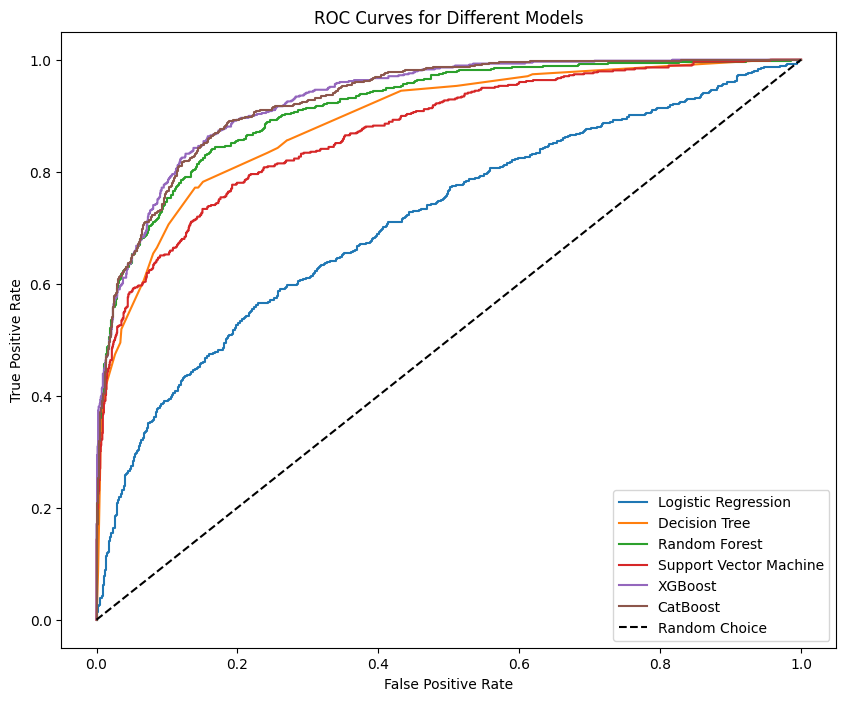

In [54]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Getting fpr and tpr values for each model
fpr_logreg, tpr_logreg, _ = roc_curve(y_test, y_pred_logreg)
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_pred_dt)
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_rf)
fpr_svm, tpr_svm, _ = roc_curve(y_test, y_pred_svm)
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_pred_xgb)
fpr_catboost, tpr_catboost, _ = roc_curve(y_test, y_pred_catboost)

# Construction of ROC curves
plt.figure(figsize=(10, 8))
plt.plot(fpr_logreg, tpr_logreg, label='Logistic Regression')
plt.plot(fpr_dt, tpr_dt, label='Decision Tree')
plt.plot(fpr_rf, tpr_rf, label='Random Forest')
plt.plot(fpr_svm, tpr_svm, label='Support Vector Machine')
plt.plot(fpr_xgb, tpr_xgb, label='XGBoost')
plt.plot(fpr_catboost, tpr_catboost, label='CatBoost')

# Adding a diagonal representing a random selection
plt.plot([0, 1], [0, 1], 'k--', label='Random Choice')

# Customizing the appearance of the chart
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Different Models')
plt.legend()
plt.show()


#### I prefer to use XGBoost because of the best score and the best training time. So I'm going to save this model and use it further

In [55]:
# Save XGBoost

output_file = "model.model"
best_xgb_classifier.save_model(output_file)

In [58]:
# Save the dv

dv_output_file = "dv.pkl"
joblib.dump(dv, dv_output_file)

['dv.pkl']